In [1]:
!pwd

/cygdrive/c/Apps/jupyterWorkspace/google_landmark_detection


In [1]:
import pandas as pd
import os
import shutil
import cv2
import multiprocessing
from multiprocessing import Pool
import time
import process_raw_images_to_256_256
import reduce_images_to_128_128
import gc
import move_copy_images_with_multiprocessing
import delete_extra_data
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import random
import tarfile
import glob
import random
import json
import gc
import gzip
import pickle

#### Extracting tar files for Training data

In [7]:
train_file_csv_df = pd.read_csv("train.csv")

In [8]:
print("Sample of record in the train_file_csv_df dataframe : \n" + str(train_file_csv_df.head(1)))
print("Total number of images in the training set : " + str(train_file_csv_df['url'].count()))
print("Total number of unique landmark_ids in the training dataset : " + str(train_file_csv_df.landmark_id.value_counts()
                                                                                 .reset_index(name="count")["index"].count()))

Sample of record in the train_file_csv_df dataframe : 
                 id                                                url  \
0  6e158a47eb2ca3f6  https://upload.wikimedia.org/wikipedia/commons...   

   landmark_id  
0       142820  
Total number of images in the training set : 4132914
Total number of unique landmark_ids in the training dataset : 203094


- Only including landmarks with images above 5 in the final training
- Exclude landmark_id 138982 since all most pictures are of posters. Therefore, it makes the dataset very noisy
- Excluding ~62798 as well since it is just mostly flowers images 

In [9]:
landmarks_greater_than_5_df = train_file_csv_df.landmark_id.value_counts().reset_index(name="count").query('count>5')
landmarks_greater_than_5_df = landmarks_greater_than_5_df[~landmarks_greater_than_5_df["index"].isin([62798, 138982])]
print(landmarks_greater_than_5_df.head(50))

     index  count
2   177870   3327
3   176528   3243
4   192931   2627
5   126637   2589
6    83144   2351
7   171772   2268
8    20409   2248
9   151942   1727
10   84689   1721
11  139894   1717
12   62074   1637
13   10618   1539
14   45428   1513
15   41808   1509
16  139706   1509
17   60532   1447
18  161902   1424
19  194914   1399
20  113209   1378
21   86869   1350
22   80177   1344
23   47133   1292
24  121873   1286
25    1924   1281
26   46705   1275
27   47712   1248
28   15427   1194
29   51856   1173
30  187209   1168
31  179380   1150
32   36748   1120
33  149980   1108
34   46500   1107
35   14915   1093
36  120734   1093
37   33992   1088
38   40088   1056
39  164773   1048
40  171683   1047
41  176018   1045
42  168098   1037
43   20120   1032
44  165900   1027
45   25093   1017
46  136093   1000
47  187779    986
48    9070    978
49  127516    976
50   56827    975
51  105337    968


In [10]:
landmark_ids_greater_than_5_list = landmarks_greater_than_5_df["index"].tolist()
print(landmark_ids_greater_than_5_list[:5])

filtered_train_greater_than_5_df = train_file_csv_df[train_file_csv_df.landmark_id.isin(landmarks_greater_than_5_df['index'])]
print("Total number of images for landmarks with image count of >5 in the training set after filtering  : " + str(filtered_train_greater_than_5_df["id"].count()))
print("Total number of landmarks with >5 images in the dataset : " + str(landmarks_greater_than_5_df["index"].count()))

imageIds_landmarkIds_moreThan5_dict = filtered_train_greater_than_5_df.set_index('id')['landmark_id'].to_dict()
print(len(imageIds_landmarkIds_moreThan5_dict))

[177870, 176528, 192931, 126637, 83144]
Total number of images for landmarks with image count of >5 in the training set after filtering  : 3905440
Total number of landmarks with >5 images in the dataset : 125729
3905440


In [12]:
list(imageIds_landmarkIds_moreThan5_dict.items())[:5]

[('6e158a47eb2ca3f6', 142820),
 ('202cd79556f30760', 104169),
 ('3ad87684c99c06e1', 37914),
 ('e7f70e9c61e66af3', 102140),
 ('4072182eddd0100e', 2474)]

In [13]:
print(filtered_train_greater_than_5_df.head(2))
print()
print(filtered_train_greater_than_5_df.iloc[1]['url'])
#Given a Landmark Id, get the URL of the landmark
filtered_train_greater_than_5_df[filtered_train_greater_than_5_df.landmark_id == 5].iloc[1]['url']

                 id                                                url  \
0  6e158a47eb2ca3f6  https://upload.wikimedia.org/wikipedia/commons...   
1  202cd79556f30760  http://upload.wikimedia.org/wikipedia/commons/...   

   landmark_id  
0       142820  
1       104169  

http://upload.wikimedia.org/wikipedia/commons/6/63/Ecosse200996-1.jpg


'https://upload.wikimedia.org/wikipedia/commons/d/df/Falcon-French-G-Ruckert.jpg'

In [14]:
image_counts = 100
print(landmarks_greater_than_5_df[landmarks_greater_than_5_df["count"]>image_counts].count())
print(landmarks_greater_than_5_df[landmarks_greater_than_5_df["count"]>image_counts]["count"].sum())
print(landmarks_greater_than_5_df.count())

index    6400
count    6400
dtype: int64
1239582
index    125729
count    125729
dtype: int64


#### Count number of images upto an Index in the dataframe with landmarks of images >5

In [14]:
landmark_id = 84671
index = landmark_ids_greater_than_5_list.index(landmark_id)
print(index)
print(landmarks_greater_than_5_df["count"][:index].sum())

59646
3240318


#### Reducing the max number of images in the landmarks to 500. This will help save a lot of time in delf features matching step which is really time consuming 
Eventually we will only use upto 100 images with max related features per class since >100k classes have less than 100 images. This will help balance the dataset

*** This is also a one time task ***

In [22]:
landmark_ids_more_than_500_images_list = landmarks_greater_than_5_df[landmarks_greater_than_5_df["count"]>500]["index"].to_list()
print(landmark_ids_more_than_500_images_list)
print(len(landmark_ids_more_than_500_images_list))

[177870, 176528, 192931, 126637, 83144, 171772, 20409, 151942, 84689, 139894, 62074, 10618, 45428, 41808, 139706, 60532, 161902, 194914, 113209, 86869, 80177, 47133, 121873, 1924, 46705, 47712, 15427, 51856, 187209, 179380, 36748, 149980, 46500, 14915, 120734, 33992, 40088, 164773, 171683, 176018, 168098, 20120, 165900, 25093, 136093, 187779, 9070, 127516, 56827, 105337, 147897, 180759, 165596, 10419, 46775, 202388, 49712, 184313, 47378, 41648, 180901, 57505, 28139, 191292, 181631, 31531, 88596, 107917, 11544, 199506, 38482, 147828, 126721, 108327, 80019, 31361, 160944, 100631, 146250, 186080, 142809, 97734, 51272, 162833, 75005, 115821, 27190, 173511, 65855, 146497, 70644, 18786, 85758, 142644, 25847, 67416, 190931, 107750, 176956, 6208, 37394, 48522, 24852, 158844, 145310, 85633, 13755, 76303, 44796, 110398, 113750, 21353, 55623, 145015, 109169, 143710, 182973, 171150, 190822, 189811, 177194, 178519, 15445, 107164, 101399, 152827, 80272, 120885, 189907, 142343, 73300, 21253, 171435, 

[177870, 176528, 192931, 126637, 83144, 171772, 20409, 151942, 84689, 139894, 62074, 10618, 45428, 41808, 139706, 60532, 161902, 194914, 113209, 86869, 80177, 47133, 121873, 1924, 46705, 47712, 15427, 51856, 187209, 179380, 36748, 149980, 46500, 14915, 120734, 33992, 40088, 164773, 171683, 176018, 168098, 20120, 165900, 25093, 136093, 187779, 9070, 127516, 56827, 105337, 147897, 180759, 165596, 10419, 46775, 202388, 49712, 184313, 47378, 41648, 180901, 57505, 28139, 191292, 181631, 31531, 88596, 107917, 11544, 199506, 38482, 147828, 126721, 108327, 80019, 31361, 160944, 100631, 146250, 186080, 142809, 97734, 51272, 162833, 75005, 115821, 27190, 173511, 65855, 146497, 70644, 18786, 85758, 142644, 25847, 67416, 190931, 107750, 176956, 6208, 37394, 48522, 24852, 158844, 145310, 85633, 13755, 76303, 44796, 110398, 113750, 21353, 55623, 145015, 109169, 143710, 182973, 171150, 190822, 189811, 177194, 178519, 15445, 107164, 101399, 152827, 80272, 120885, 189907, 142343, 73300, 21253, 171435, 111311, 50798, 51699, 182908, 20102, 97142, 113145, 121547, 177305, 43222, 64792, 39865, 20064, 78197, 194406, 2079, 1127, 5004, 17062, 136302, 179959, 18392, 152708, 14559, 198657, 29794, 144313, 125425, 93198, 137203, 63529, 201840, 188999, 157511, 60912, 39271, 65199, 148331, 125194, 113838, 27, 168106, 19605, 196358, 5170, 172929, 192761, 125786, 60708, 124923, 133563, 16658, 173450, 103899, 69973, 25953, 127523, 39650, 37391, 62831, 67929, 70716, 132969, 98993, 195412, 69193, 126159, 90021, 21703, 199450, 60749, 97717, 129781, 169349, 90647, 31094, 194521]

210

In [21]:
# count = 0
# for landmark_id in landmark_ids_more_than_500_images_list:
#     list_of_files_in_landmark = glob.glob("datasets\\raw_data\\train\\{}\\*.*".format(landmark_id))
#     print(" {} ".format(len(list_of_files_in_landmark)), end = " ")
#     difference = len(list_of_files_in_landmark)-500
#     count += difference
#     list_of_files_to_remove = random.sample(list_of_files_in_landmark, difference)
#     print(len(list_of_files_to_remove))
#     start = time.time()
#     if __name__ == "__main__":
#         p = Pool(16)
#         p.map(delete_extra_data.delete_files, list_of_files_to_remove)
#         p.close()
#         p.join()
#     print("time to delete {} images : {}".format(count, time.time() - start))

 3327  2827
time to delete 2827 images : 0.2988088130950928
 3243  2743
time to delete 5570 images : 0.3207552433013916
 2627  2127
time to delete 7697 images : 0.3210721015930176
 2589  2089
time to delete 9786 images : 0.3241257667541504
 2351  1851
time to delete 11637 images : 0.3069498538970947
 2268  1768
time to delete 13405 images : 0.32128381729125977
 2248  1748
time to delete 15153 images : 0.32123589515686035
 1727  1227
time to delete 16380 images : 0.21620750427246094
 1721  1221
time to delete 17601 images : 0.2989382743835449
 1717  1217
time to delete 18818 images : 0.21483445167541504
 1637  1137
time to delete 19955 images : 0.22537636756896973
 1539  1039
time to delete 20994 images : 0.2302553653717041
 1513  1013
time to delete 22007 images : 0.22255349159240723
 1509  1009
time to delete 23016 images : 0.20049571990966797
 1509  1009
time to delete 24025 images : 0.21270537376403809
 1447  947
time to delete 24972 images : 0.1916491985321045
 1424  924
time to de

time to delete 70975 images : 0.18898630142211914
 611  111
time to delete 71086 images : 0.19794678688049316
 611  111
time to delete 71197 images : 0.18801546096801758
 610  110
time to delete 71307 images : 0.19824886322021484
 607  107
time to delete 71414 images : 0.1961658000946045
 605  105
time to delete 71519 images : 0.18799996376037598
 602  102
time to delete 71621 images : 0.1903524398803711
 600  100
time to delete 71721 images : 0.1969902515411377
 598  98
time to delete 71819 images : 0.1880192756652832
 597  97
time to delete 71916 images : 0.2945258617401123
 597  97
time to delete 72013 images : 0.19751977920532227
 595  95
time to delete 72108 images : 0.20568585395812988
 593  93
time to delete 72201 images : 0.19637060165405273
 593  93
time to delete 72294 images : 0.1964426040649414
 589  89
time to delete 72383 images : 0.19191479682922363
 587  87
time to delete 72470 images : 0.19904136657714844
 584  84
time to delete 72554 images : 0.19688773155212402
 582 

Deleted 74782 images

#### Creating jsons as needed

In [ ]:
imageIds_landmarkIds_moreThan5_dict_json = json.dumps(imageIds_landmarkIds_moreThan5_dict)
f = open("imageIds_landmarkIds_moreThan5_dict.json","w")
f.write(imageIds_landmarkIds_moreThan5_dict_json)
f.close()

In [23]:
landmark_ids_greater_than_5_list_json = json.dumps(landmark_ids_greater_than_5_list)
f = open("landmark_ids_greater_than_5_list.json","w")
f.write(landmark_ids_greater_than_5_list_json)
f.close()

In [30]:
with open("landmark_ids_greater_than_5_list.json", "r") as f:
    data = json.load(f)
len(data)

125729

#### Verifying a single landmark_id features in a pickle file created during DELF feature extraction step

In [37]:
landmark_id = 0
path = "landmark_ids_delf_features_dict_pickle_files\\{}.pkl.gz".format(landmark_id)

with gzip.open(path, 'r') as f:
    data = pickle.load(f)
data

{0: [{'locations': array([[128.      , 128.      ],
          [  0.      , 128.      ],
          [  0.      , 180.99548 ],
          [ 90.49774 , 180.99548 ],
          [ 90.49774 ,  90.49774 ],
          [ 64.      ,  64.      ],
          [180.99548 , 180.99548 ],
          [135.76581 ,   0.      ],
          [  0.      ,  90.49774 ],
          [  0.      , 128.      ],
          [128.      ,   0.      ],
          [128.      ,  64.      ],
          [  0.      , 192.      ],
          [  0.      , 181.02107 ],
          [ 48.      ,  48.      ],
          [ 90.51054 ,  45.255272],
          [128.      , 192.      ],
          [ 96.      ,  64.      ],
          [ 32.      , 224.      ],
          [ 64.      , 192.      ],
          [240.      ,  32.      ],
          [192.      ,   0.      ],
          [135.76581 ,  45.255264],
          [240.      , 144.      ],
          [160.      ,  16.      ],
          [160.      ,   0.      ],
          [ 64.      ,  64.      ],
          [1

### Recursively delete landmark folders that are not in the landmarks_greater_than_5_df
*** This is a one time task ***

In [ ]:
# list_of_landmark_ids_from_raw_data = glob.glob("datasets\\raw_data\\train\\*")
# print(list_of_landmark_ids_from_raw_data[:5])
# print(len(list_of_landmark_ids_from_raw_data))

In [ ]:
list_of_landmark_ids_from_raw_data = glob.glob("datasets\\raw_data\\train\\*")
print(list_of_landmark_ids_from_raw_data[:5])
print(len(list_of_landmark_ids_from_raw_data))

['datasets\\raw_data\\train\\0', 'datasets\\raw_data\\train\\1', 'datasets\\raw_data\\train\\10', 'datasets\\raw_data\\train\\100', 'datasets\\raw_data\\train\\1000']

150659

In [ ]:
# folders_to_delete = []
# for landmark_id_folder in list_of_landmark_ids_from_raw_data:
#     landmark_id = landmark_id_folder.split("\\")[-1]
#     if int(landmark_id) not in landmark_ids_greater_than_5_list:
#         folders_to_delete.append('datasets\\raw_data\\train\\{}'.format(landmark_id))
# print(folders_to_delete[:5])
# print(len(folders_to_delete))

['datasets\\raw_data\\train\\100002', 'datasets\\raw_data\\train\\100010', 'datasets\\raw_data\\train\\100022', 'datasets\\raw_data\\train\\100027', 'datasets\\raw_data\\train\\100031']

24930

In [ ]:
# if __name__ == '__main__':
#     p = Pool(14)
#     p.map(delete_extra_data.delete_folders, folders_to_delete)
#     p.close()
#     p.join()

### Ploting the images for landmark_ids that have more than 200 images. Looking at any important landmarks in them
- Seems like there are a lot of important landmarks with more than 200 images. 
- New strategy is to reduce the number of images in each landmark to max of 500. Delete rest randomly
- We are going to use only top 100 images with feature matches for these landmarks.

In [35]:
landmarks_ids_counts_dict = dict(zip(landmarks_greater_than_5_df["index"], landmarks_greater_than_5_df["count"]))

In [36]:
list(landmarks_ids_counts_dict.items())[:5]

[(177870, 3327), (176528, 3243), (192931, 2627), (126637, 2589), (83144, 2351)]

In [ ]:
urls=[]
for landmark_id in landmark_ids_greater_than_5_list[:212]:
    images_paths = glob.glob("datasets\\raw_data\\train\\" + str(landmark_id) + "\\*.jpg")
    urls.append((landmark_id,) + tuple(random.sample(images_paths,5))) 
    #= ['datasets\\raw_data\\train\\0\\0ddc92c6353c019a.jpg','datasets\\raw_data\\train\\0\\2c8acb7c9958da08.jpg', 'datasets\\raw_data\\train\\0\\b5d8eb502833a58c.jpg']
    
count = 0
for url_tuple in urls:
    count += 1
    fig = plt.figure(figsize=(20, 4))
    landmark_id = url_tuple[0]
    image_counts = landmarks_ids_counts_dict.get(landmark_id)
    plt.title("Fig {} - landmark_id {} - Image Counts - {}".format(count, landmark_id, image_counts))
    img1 = mpimg.imread(url_tuple[1])
    img2 = mpimg.imread(url_tuple[2])
    img3 = mpimg.imread(url_tuple[3])
    img4 = mpimg.imread(url_tuple[4])
    img5 = mpimg.imread(url_tuple[5])
    
    ax1 = fig.add_subplot(1,5,1)
    ax1.imshow(img1)
    
    ax2 = fig.add_subplot(1,5,2)
    ax2.imshow(img2)
    
    ax3 = fig.add_subplot(1,5,3)
    ax3.imshow(img3)
    
    ax4 = fig.add_subplot(1,5,4)
    ax4.imshow(img4)
    
    ax5 = fig.add_subplot(1,5,5)
    ax5.imshow(img5)
    plt.show()
    plt.close()
    
#         plt.figure(figsize = (3,3))
#         plt.imshow(img)

### Loading the non-landmark images to remove from our training dataset 
This is a one time task as well

In [3]:
with open('images_to_filter_out_after_delf_dict.json') as json_file:
    images_to_filter_out_after_delf_dict = json.load(json_file)

list_of_images_to_delete_after_delf = list(images_to_filter_out_after_delf_dict.keys())
print(list_of_images_to_delete_after_delf[:10])

['datasets\\raw_data\\train\\177870\\35436cb83ff5e09b.jpg', 'datasets\\raw_data\\train\\177870\\012f8c0847703102.jpg', 'datasets\\raw_data\\train\\177870\\1f4f1c6b84b032f7.jpg', 'datasets\\raw_data\\train\\177870\\27f30d5d2118ad58.jpg', 'datasets\\raw_data\\train\\177870\\436392bd5f4440be.jpg', 'datasets\\raw_data\\train\\177870\\470e31d9051f968f.jpg', 'datasets\\raw_data\\train\\177870\\315874c82418af1d.jpg', 'datasets\\raw_data\\train\\177870\\1dd07f5182e4c94a.jpg', 'datasets\\raw_data\\train\\177870\\3a7f67c02964f595.jpg', 'datasets\\raw_data\\train\\177870\\114c2828445a71a6.jpg']


In [4]:
# Found a random image with manual inspection in the id 177870, which I think should be removed.
# Therefore should be in the list above
'datasets\\raw_data\\train\\177870\\552809ab1b1e3225.jpg' in list_of_images_to_delete_after_delf

True

In [5]:
print(len(list_of_images_to_delete_after_delf))
print(len(images_to_filter_out_after_delf_dict))

1139183
1139183


In [26]:
# start = time.time()
# if __name__ == "__main__":
#     p = Pool()
#     p.map(delete_extra_data.delete_files, list_of_images_to_delete_after_delf)
#     p.close()
#     p.join()
# print("time to delete {} images : {}".format(len(list_of_images_to_delete_after_delf), time.time() - start))

time to delete 1139183 images : 204.85128498077393


time to delete 1139183 images : 204.85128498077393

### After DeLF,  creating a list of all the remaining images and counts of images in the landmarks for further data pre-processing step 

In [15]:
print(landmark_ids_greater_than_5_list[:5])
len(landmark_ids_greater_than_5_list)

[177870, 176528, 192931, 126637, 83144]


125729

In [16]:
'datasets\\raw_data\\train\\177870\\35436cb83ff5e09b.jpg'.split("\\")[-1].split('.')[0]

'35436cb83ff5e09b'

Creating a few different lists to do some initial prepwork for more data preprocessing and data modeling

In [22]:
count_5 = 0

landmark_ids_less_than_5_list_after_delf = []
landmark_ids_greater_than_5_list_after_delf = []
landmarkIds_imageCounts_more_than_5_dict_after_delf = {}
imageIds_landmarkIds_more_than_5_dict_after_delf = {}

for landmark_id in landmark_ids_greater_than_5_list:
    list_of_files_in_landmark = glob.glob("datasets\\raw_data\\train\\{}\\*.*".format(landmark_id))
    
    if len(list_of_files_in_landmark) > 5:
        landmark_ids_greater_than_5_list_after_delf.append(landmark_id)
        landmarkIds_imageCounts_more_than_5_dict_after_delf[landmark_id] = len(list_of_files_in_landmark)
        
        for image_path in list_of_files_in_landmark:
            imageIds_landmarkIds_more_than_5_dict_after_delf[image_path.split("\\")[-1].split('.')[0]] = landmark_id
    else:
        landmark_ids_less_than_5_list_after_delf.append("datasets\\raw_data\\train\\{}".format(landmark_id))
        count_5 += 1

In [23]:
print(len(landmark_ids_less_than_5_list_after_delf))
print(len(landmark_ids_greater_than_5_list_after_delf))
print(len(landmarkIds_imageCounts_more_than_5_dict_after_delf))
print(len(imageIds_landmarkIds_more_than_5_dict_after_delf))

31901
93828
93828
2581445


In [24]:
# Manually verify some of these folders
print(landmark_ids_less_than_5_list_after_delf[:5])
print(landmark_ids_greater_than_5_list_after_delf[:5])

['datasets\\raw_data\\train\\118727', 'datasets\\raw_data\\train\\123642', 'datasets\\raw_data\\train\\18396', 'datasets\\raw_data\\train\\28358', 'datasets\\raw_data\\train\\145917']
[177870, 176528, 192931, 126637, 83144]


One Time Task

In [28]:
# # Delete all the landmarks that have less/equal to 5 images
# start = time.time()
# if __name__ == "__main__":
#     p = Pool()
#     p.map(delete_extra_data.delete_folders, landmark_ids_less_than_5_list_after_delf)
#     p.close()
#     p.join()
# print("Time to delete {} landmark_id folders : {}".format(len(landmark_ids_less_than_5_list_after_delf), time.time() - start))

Time to delete 31901 landmark_id folders : 24.083476305007935


Time to delete 31901 landmark_id folders : 24.083476305007935

In [29]:
print(list(landmarkIds_imageCounts_more_than_5_dict_after_delf.items())[:5])
print(list(imageIds_landmarkIds_more_than_5_dict_after_delf.items())[:5])

[(177870, 337), (176528, 326), (192931, 300), (126637, 439), (83144, 388)]
[('019a1e736ca83e52', 177870), ('01f7f5108f89a177', 177870), ('05b21c07d95f3ef7', 177870), ('06781f4bd1af2f67', 177870), ('06e5847bc3d9b034', 177870)]


In [44]:
print(177870 in landmarks_ids_counts_dict)
print(len(landmarks_ids_counts_dict))

True
125729


One more trand of noisy data I noticed:
    - Wherever ~70% images were filtered in the landmark_id via DeLF, it mostly had images of just people, trees, flowers, posters, etc.
    - I can probably get rid of these landmarks as well to reduce the noise further

In [87]:
counts_diff_dict = {}
for landmark_id, counts in landmarkIds_imageCounts_more_than_5_dict_after_delf.items():
    if landmark_id in landmarks_ids_counts_dict:
        original_counts = landmarks_ids_counts_dict[landmark_id]
        counts_diff = 0
        if landmarks_ids_counts_dict[landmark_id] > 500:
            counts_diff = (500 - counts)/500*100
        else:
            counts_diff = (original_counts - counts)/original_counts*100
        # Creating a dict of landmark_ids with counts different of atleast 70% between original and delf filtered set
        if counts_diff > 70:
            counts_diff_dict["datasets\\raw_data\\train\\{}".format(landmark_id)] = counts_diff

In [88]:
# Manually verifying some of the landmarks
print(len(counts_diff_dict))
print(list(counts_diff_dict.items())[:5])
print(list(counts_diff_dict.keys())[:5])

1876
[('datasets\\raw_data\\train\\171772', 77.0), ('datasets\\raw_data\\train\\62074', 80.4), ('datasets\\raw_data\\train\\10618', 76.2), ('datasets\\raw_data\\train\\47712', 79.0), ('datasets\\raw_data\\train\\184313', 75.0)]
['datasets\\raw_data\\train\\171772', 'datasets\\raw_data\\train\\62074', 'datasets\\raw_data\\train\\10618', 'datasets\\raw_data\\train\\47712', 'datasets\\raw_data\\train\\184313']


One Time Task

In [90]:
# Deleting the landmarks where atleast 70% of the images were filtered via DeLF, since remianing images are still mostly
# people, flowers, trees, etc. No actual landmarks. This will help reduce the noise further
# start = time.time()
# if __name__ == "__main__":
#     p = Pool()
#     p.map(delete_extra_data.delete_folders, list(counts_diff_dict.keys()))
#     p.close()
#     p.join()
# print("Time to delete {} landmark_id folders : {}".format(len(counts_diff_dict), time.time() - start))

Time to delete 1876 landmark_id folders : 2.6982994079589844


Time to delete 1876 landmark_id folders : 2.6982994079589844

In [114]:
# With some ad-hoc manual inspection, I found landmark_id, 192931 pretty noisey as well. Pictures of just people. Removing this as well
# delete_extra_data.delete_folders('datasets\\raw_data\\train\\192931')
#Very noisey, landmark 46775
# delete_extra_data.delete_folders('datasets\\raw_data\\train\\46775')
# Manually deleted a bad picture for landmark_id 2247. Now count is 5. Therefore, deleting
# delete_extra_data.delete_folders('datasets\\raw_data\\train\\2247')
# Manually deleted a bad picture for landmark_id 201200. Now count is 5. Therefore, deleting
# delete_extra_data.delete_folders('datasets\\raw_data\\train\\201200')

In [115]:
landmarkIds_imageCounts_more_than_5_after_delf_df = pd.DataFrame.from_dict(landmarkIds_imageCounts_more_than_5_dict_after_delf, orient='index', columns=['counts']).reset_index().rename(columns={'index' :'landmark_id'})

In [116]:
additional_deleted_landmarks_list = [int(landmark_id.split("\\")[-1]) for landmark_id in list(counts_diff_dict.keys())]
print(len(additional_deleted_landmarks_list))
print(additional_deleted_landmarks_list[:5])

1876
[171772, 62074, 10618, 47712, 184313]


In [100]:
landmarkIds_imageCounts_more_than_5_after_delf_df.dtypes

landmark_id    int64
counts         int64
dtype: object

In [119]:
landmarkIds_imageCounts_more_than_5_after_delf_df = landmarkIds_imageCounts_more_than_5_after_delf_df[~landmarkIds_imageCounts_more_than_5_after_delf_df.landmark_id.isin([192931,2247,201200,46775])]
landmarkIds_imageCounts_more_than_5_after_delf_df = landmarkIds_imageCounts_more_than_5_after_delf_df[~landmarkIds_imageCounts_more_than_5_after_delf_df.landmark_id.isin(additional_deleted_landmarks_list)]
len(landmarkIds_imageCounts_more_than_5_after_delf_df)

91948

In [120]:
print(landmarkIds_imageCounts_more_than_5_after_delf_df[:50])
print(len(landmarkIds_imageCounts_more_than_5_after_delf_df))
print(landmarkIds_imageCounts_more_than_5_after_delf_df[landmarkIds_imageCounts_more_than_5_after_delf_df['counts']>100].landmark_id.count())

    landmark_id  counts
0        177870     337
1        176528     326
3        126637     439
4         83144     388
6         20409     453
7        151942     288
8         84689     150
9        139894     420
12        45428     383
13        41808     273
14       139706     239
15        60532     218
16       161902     398
17       194914     485
18       113209     474
19        86869     314
20        80177     318
21        47133     427
22       121873     369
23         1924     438
24        46705     462
26        15427     175
27        51856     435
28       187209     314
29       179380     364
30        36748     441
31       149980     472
32        46500     325
33        14915     441
34       120734     462
35        33992     336
36        40088     472
37       164773     412
38       171683     294
39       176018     433
40       168098     483
41        20120     446
42       165900     404
43        25093     446
44       136093     375
45       187779 

### Moved raw images to appropriate landmark Ids classes/folders

In [ ]:
# # # This is a one time task. We take the raw images in appropriate directories and save them to training folder 
# # # to appropriate labeled folders (tmp/datasets/train_raw/<labeled folder names>).

# dir_name_list = ["datasets/train_raw/0","datasets/train_raw/1","datasets/train_raw/2","datasets/train_raw/3","datasets/train_raw/4","datasets/train_raw/5","datasets/train_raw/6","datasets/train_raw/7","datasets/train_raw/8","datasets/train_raw/9","datasets/train_raw/a","datasets/train_raw/b","datasets/train_raw/c","datasets/train_raw/d","datasets/train_raw/e","datasets/train_raw/f"]
# # dir_name_list = ["datasets/set_128/train/3","datasets/set_128/train/7","datasets/set_128/train/9"]

# start_time_moving_images = time.time()
# for dir_name in dir_name_list:
#     get_list_start_time = time.time()
#     def get_list_of_Files(dir_name):
#         # create a list of file and sub directories 
#         # names in the given directory 
#         listOfFile = os.listdir(dir_name)
#         allFiles = list()
#         # Iterate over all the entries
#         for entry in listOfFile:
#             # Create full path
#             fullPath = os.path.join(dir_name, entry)
#             # If entry is a directory then get the list of files in this directory 
#             if os.path.isdir(fullPath):
#                 allFiles = allFiles + get_list_of_Files(fullPath)
#             else:
#                 allFiles.append(fullPath)             
#         return allFiles

#     list_of_images = get_list_of_Files(dir_name)
#     print("\nTime to get list of files from current directory : ", (time.time() - get_list_start_time))
#     print(list_of_images[:5])
#     print(len(list_of_images))
#     gc.collect()

#     process_image_start_time = time.time()
#     if __name__ == "__main__":
#         p=Pool(16)
# The multiprocessing step below is incorrect. It is passing whole list to each pool. SHould refactor in future if need to resuse this code
#         print("Images Processed : ", p.map(move_copy_images_with_multiprocessing.move_images, [[list_of_images, imageIds_landmarkIds_moreThan5_dict]]))
#         p.close()
#         p.join()
#     print("Time to move images in the current directory : ", (time.time() - process_image_start_time))
#     gc.collect()
    
#     del list_of_images

# print("Total time to move all the images : ", (time.time() - start_time_moving_images))


Time to get list of files from current directory :  11.537518501281738
['datasets/train_raw/0\\0\\0\\0000059611c7d079.jpg', 'datasets/train_raw/0\\0\\0\\0000070506c174cc.jpg', 'datasets/train_raw/0\\0\\0\\000008ae30de967e.jpg', 'datasets/train_raw/0\\0\\0\\000014b1f770f640.jpg', 'datasets/train_raw/0\\0\\0\\000015f76534add3.jpg']
258277
Images Processed :  [251936]
Time to move images in the current directory :  153.274245262146

Time to get list of files from current directory :  11.628509044647217
['datasets/train_raw/1\\0\\0\\100001cdf8952af2.jpg', 'datasets/train_raw/1\\0\\0\\1000031c57e84984.jpg', 'datasets/train_raw/1\\0\\0\\10000643ddd87640.jpg', 'datasets/train_raw/1\\0\\0\\100008e889303dd3.jpg', 'datasets/train_raw/1\\0\\0\\10000a459717f4b1.jpg']
258960
Images Processed :  [252477]
Time to move images in the current directory :  154.08185625076294

Time to get list of files from current directory :  11.59822130203247
['datasets/train_raw/2\\0\\0\\20000153ca826a49.jpg', 'datasets/train_raw/2\\0\\0\\20000c6cc7757a78.jpg', 'datasets/train_raw/2\\0\\0\\20000c92f4ffbb98.jpg', 'datasets/train_raw/2\\0\\0\\2000117b6776a792.jpg', 'datasets/train_raw/2\\0\\0\\2000143aaa73c26a.jpg']
258371
Images Processed :  [252009]
Time to move images in the current directory :  156.68194580078125

Time to get list of files from current directory :  11.624047994613647
['datasets/train_raw/3\\0\\0\\30000e1088c8b1a8.jpg', 'datasets/train_raw/3\\0\\0\\30000ec0280c6eca.jpg', 'datasets/train_raw/3\\0\\0\\300011592eb1698e.jpg', 'datasets/train_raw/3\\0\\0\\3000179a56d92ab9.jpg', 'datasets/train_raw/3\\0\\0\\300018a3f2c53762.jpg']
257916
Images Processed :  [251580]
Time to move images in the current directory :  157.4651472568512

Time to get list of files from current directory :  11.766359329223633
['datasets/train_raw/4\\0\\0\\40000238d9a0dce9.jpg', 'datasets/train_raw/4\\0\\0\\4000025e2dcff06b.jpg', 'datasets/train_raw/4\\0\\0\\4000039befc55c12.jpg', 'datasets/train_raw/4\\0\\0\\40000641f1218515.jpg', 'datasets/train_raw/4\\0\\0\\400006e5e6aa472f.jpg']
257966
Images Processed :  [251630]
Time to move images in the current directory :  161.01261472702026

Time to get list of files from current directory :  11.514141321182251
['datasets/train_raw/5\\0\\0\\50000a346e0e0b09.jpg', 'datasets/train_raw/5\\0\\0\\50000bbaf5115641.jpg', 'datasets/train_raw/5\\0\\0\\500010a7e6a160b2.jpg', 'datasets/train_raw/5\\0\\0\\500019eb689da9b5.jpg', 'datasets/train_raw/5\\0\\0\\50001b0d12c3943d.jpg']
258046
Images Processed :  [251838]
Time to move images in the current directory :  163.7860288619995

Time to get list of files from current directory :  11.443994283676147
['datasets/train_raw/6\\0\\0\\600008d145ada13a.jpg', 'datasets/train_raw/6\\0\\0\\60000b0c22ef7c32.jpg', 'datasets/train_raw/6\\0\\0\\60000b3debc0dbd2.jpg', 'datasets/train_raw/6\\0\\0\\60000e8e4a1ba3ef.jpg', 'datasets/train_raw/6\\0\\0\\60000e993a7b5fad.jpg']
258090
Images Processed :  [251637]
Time to move images in the current directory :  166.10652112960815

Time to get list of files from current directory :  11.489313840866089
['datasets/train_raw/7\\0\\0\\7000022fe6fb2725.jpg', 'datasets/train_raw/7\\0\\0\\7000026008c4fd15.jpg', 'datasets/train_raw/7\\0\\0\\700006610b71d3b9.jpg', 'datasets/train_raw/7\\0\\0\\70000b0a58db1820.jpg', 'datasets/train_raw/7\\0\\0\\70000d3083cdd5c4.jpg']
258471
Images Processed :  [252117]
Time to move images in the current directory :  170.79943680763245

Time to get list of files from current directory :  11.545489311218262
['datasets/train_raw/8\\0\\0\\800006316768a007.jpg', 'datasets/train_raw/8\\0\\0\\80000a58b059d4cf.jpg', 'datasets/train_raw/8\\0\\0\\80000c96413df549.jpg', 'datasets/train_raw/8\\0\\0\\80000f5a90982b05.jpg', 'datasets/train_raw/8\\0\\0\\8000136bd9516e9e.jpg']
258210
Images Processed :  [251887]
Time to move images in the current directory :  174.38892006874084

Time to get list of files from current directory :  11.522296905517578
['datasets/train_raw/9\\0\\0\\9000026aa8b4f501.jpg', 'datasets/train_raw/9\\0\\0\\9000048b6bed8cab.jpg', 'datasets/train_raw/9\\0\\0\\900004b94f7a6805.jpg', 'datasets/train_raw/9\\0\\0\\90000761b786088d.jpg', 'datasets/train_raw/9\\0\\0\\90000f7122fdb362.jpg']
258014
Images Processed :  [251694]
Time to move images in the current directory :  176.953763961792

Time to get list of files from current directory :  11.554109811782837
['datasets/train_raw/a\\0\\0\\a000035ae4c6d7b7.jpg', 'datasets/train_raw/a\\0\\0\\a00005168be8f76a.jpg', 'datasets/train_raw/a\\0\\0\\a000061cfa1258b2.jpg', 'datasets/train_raw/a\\0\\0\\a0000650e77769cc.jpg', 'datasets/train_raw/a\\0\\0\\a00009431492c304.jpg']
258200
Images Processed :  [251770]
Time to move images in the current directory :  175.6572413444519

Time to get list of files from current directory :  11.384705781936646
['datasets/train_raw/b\\0\\0\\b00006e03e61e8f7.jpg', 'datasets/train_raw/b\\0\\0\\b0000746eeec502a.jpg', 'datasets/train_raw/b\\0\\0\\b000074d5172b9e2.jpg', 'datasets/train_raw/b\\0\\0\\b0000b66f3b29d59.jpg', 'datasets/train_raw/b\\0\\0\\b0000bd515735f35.jpg']
257548
Images Processed :  [251286]
Time to move images in the current directory :  178.7442967891693

Time to get list of files from current directory :  11.561707019805908
['datasets/train_raw/c\\0\\0\\c000048dbf245abf.jpg', 'datasets/train_raw/c\\0\\0\\c000058274e6c7c1.jpg', 'datasets/train_raw/c\\0\\0\\c000082667c14a72.jpg', 'datasets/train_raw/c\\0\\0\\c00008d946d82ac4.jpg', 'datasets/train_raw/c\\0\\0\\c0000ae68f559868.jpg']
259256
Images Processed :  [253010]
Time to move images in the current directory :  181.19255709648132

Time to get list of files from current directory :  11.463588237762451
['datasets/train_raw/d\\0\\0\\d00004b4f6cf69d6.jpg', 'datasets/train_raw/d\\0\\0\\d0000998dd0e36ef.jpg', 'datasets/train_raw/d\\0\\0\\d000106b1b47ceb8.jpg', 'datasets/train_raw/d\\0\\0\\d0001157c96016dc.jpg', 'datasets/train_raw/d\\0\\0\\d0001b52501b15ef.jpg']
258226
Images Processed :  [251897]
Time to move images in the current directory :  184.25377321243286

Time to get list of files from current directory :  11.585464239120483
['datasets/train_raw/e\\0\\0\\e00002a0f14de5b3.jpg', 'datasets/train_raw/e\\0\\0\\e00002a2faed0b41.jpg', 'datasets/train_raw/e\\0\\0\\e0000586346ec8cc.jpg', 'datasets/train_raw/e\\0\\0\\e000068a8dc23318.jpg', 'datasets/train_raw/e\\0\\0\\e00008fff47c11a2.jpg']
258916
Images Processed :  [252357]
Time to move images in the current directory :  183.9183633327484

Time to get list of files from current directory :  9.56756329536438
['datasets/train_raw/f\\0\\0\\f000004306ea3c24.jpg', 'datasets/train_raw/f\\0\\0\\f00001b823c7dee6.jpg', 'datasets/train_raw/f\\0\\0\\f00003a4ad9095b5.jpg', 'datasets/train_raw/f\\0\\0\\f000127ec5f71196.jpg', 'datasets/train_raw/f\\0\\0\\f0001b9dd9a66c71.jpg']
258447
Images Processed :  [252009]
Time to move images in the current directory :  175.91064071655273
Total time to move all the images :  2897.820787191391

### Processing and resizing the DeLF filtered images to 256 x 256. Will preserve aspect ratio and only keep upto 100 images for landmarks that have more than 100

In [137]:
landmarks_ids_list_final = glob.glob("datasets\\raw_data\\train\\*")

In [138]:
print(len(landmarks_ids_list_final))
print(landmarks_ids_list_final[:5])

91948
['datasets\\raw_data\\train\\0', 'datasets\\raw_data\\train\\1', 'datasets\\raw_data\\train\\10', 'datasets\\raw_data\\train\\100', 'datasets\\raw_data\\train\\1000']


In [170]:
# # # This is a one time task. We take the raw images and after resizing put them in
# # # appropriate labeled folders (datasets/set_256/train/<labeled folder names>).

# start_time_total = time.time()
# for dir_name in landmarks_ids_list_final:

#     list_of_images = glob.glob(('{}\\*.*'.format(dir_name)))
#     if (len(list_of_images) > 100):
#         list_of_images = random.sample(list_of_images,100)

#     if not os.path.isdir(dir_name.replace("raw_data", "set_256")):
#         try:
#             os.makedirs(dir_name.replace("raw_data", "set_256"))
#         except:
#             pass
        
#     process_image_start_time = time.time()
#     if __name__ == "__main__":
#         p=Pool()
#         p.map(process_raw_images_to_256_256.process_save_images, list_of_images)
#         p.close()
#         p.join()
#     print("landmark : {}, Images_processed : {}, Time : {}".format(dir_name, len(list_of_images), time.time() - process_image_start_time))
# print("Total time to process all images : {}".format(time.time()-start_time_total))


landmark : datasets\raw_data\train\0, Images_processed : 19, Time : 0.47571492195129395
landmark : datasets\raw_data\train\1, Images_processed : 24, Time : 0.4560530185699463
landmark : datasets\raw_data\train\10, Images_processed : 12, Time : 0.34285545349121094
landmark : datasets\raw_data\train\100, Images_processed : 11, Time : 0.33740878105163574
landmark : datasets\raw_data\train\1000, Images_processed : 8, Time : 0.3104550838470459
landmark : datasets\raw_data\train\100001, Images_processed : 9, Time : 0.3310403823852539
landmark : datasets\raw_data\train\100003, Images_processed : 9, Time : 0.3516526222229004
landmark : datasets\raw_data\train\100004, Images_processed : 13, Time : 0.3485374450683594
landmark : datasets\raw_data\train\100005, Images_processed : 11, Time : 0.3496410846710205
landmark : datasets\raw_data\train\100006, Images_processed : 37, Time : 0.47487497329711914
landmark : datasets\raw_data\train\100007, Images_processed : 11, Time : 0.35649681091308594
landm

landmark : datasets\raw_data\train\100157, Images_processed : 24, Time : 0.48372840881347656
landmark : datasets\raw_data\train\100158, Images_processed : 9, Time : 0.36246347427368164
landmark : datasets\raw_data\train\100159, Images_processed : 23, Time : 0.47660255432128906
landmark : datasets\raw_data\train\100163, Images_processed : 8, Time : 0.3263392448425293
landmark : datasets\raw_data\train\100166, Images_processed : 26, Time : 0.4893505573272705
landmark : datasets\raw_data\train\100167, Images_processed : 67, Time : 0.4671158790588379
landmark : datasets\raw_data\train\100168, Images_processed : 36, Time : 0.4666619300842285
landmark : datasets\raw_data\train\100175, Images_processed : 31, Time : 0.4679677486419678
landmark : datasets\raw_data\train\100177, Images_processed : 22, Time : 0.46533703804016113
landmark : datasets\raw_data\train\100178, Images_processed : 48, Time : 0.46666383743286133
landmark : datasets\raw_data\train\100179, Images_processed : 6, Time : 0.343

landmark : datasets\raw_data\train\100347, Images_processed : 7, Time : 0.33316946029663086
landmark : datasets\raw_data\train\100348, Images_processed : 7, Time : 0.36632776260375977
landmark : datasets\raw_data\train\100349, Images_processed : 26, Time : 0.47490739822387695
landmark : datasets\raw_data\train\100350, Images_processed : 8, Time : 0.3269226551055908
landmark : datasets\raw_data\train\100351, Images_processed : 23, Time : 0.4879763126373291
landmark : datasets\raw_data\train\100354, Images_processed : 17, Time : 0.4695467948913574
landmark : datasets\raw_data\train\100355, Images_processed : 6, Time : 0.32446980476379395
landmark : datasets\raw_data\train\100356, Images_processed : 6, Time : 0.3331327438354492
landmark : datasets\raw_data\train\100357, Images_processed : 6, Time : 0.34871745109558105
landmark : datasets\raw_data\train\10036, Images_processed : 23, Time : 0.4605846405029297
landmark : datasets\raw_data\train\100360, Images_processed : 13, Time : 0.3406538

landmark : datasets\raw_data\train\100530, Images_processed : 25, Time : 0.45984578132629395
landmark : datasets\raw_data\train\100531, Images_processed : 33, Time : 0.4660172462463379
landmark : datasets\raw_data\train\100532, Images_processed : 7, Time : 0.32533812522888184
landmark : datasets\raw_data\train\100533, Images_processed : 100, Time : 0.4898366928100586
landmark : datasets\raw_data\train\100534, Images_processed : 23, Time : 0.4687371253967285
landmark : datasets\raw_data\train\100535, Images_processed : 6, Time : 0.32628655433654785
landmark : datasets\raw_data\train\100539, Images_processed : 15, Time : 0.3630526065826416
landmark : datasets\raw_data\train\100541, Images_processed : 30, Time : 0.4924347400665283
landmark : datasets\raw_data\train\100542, Images_processed : 6, Time : 0.32659244537353516
landmark : datasets\raw_data\train\100543, Images_processed : 7, Time : 0.3504319190979004
landmark : datasets\raw_data\train\100544, Images_processed : 22, Time : 0.4743

landmark : datasets\raw_data\train\100705, Images_processed : 7, Time : 0.3266031742095947
landmark : datasets\raw_data\train\100706, Images_processed : 20, Time : 0.4875965118408203
landmark : datasets\raw_data\train\10071, Images_processed : 93, Time : 0.469637393951416
landmark : datasets\raw_data\train\100712, Images_processed : 15, Time : 0.45133233070373535
landmark : datasets\raw_data\train\100713, Images_processed : 39, Time : 0.4968893527984619
landmark : datasets\raw_data\train\100718, Images_processed : 9, Time : 0.34363245964050293
landmark : datasets\raw_data\train\100719, Images_processed : 81, Time : 0.47428441047668457
landmark : datasets\raw_data\train\10072, Images_processed : 19, Time : 0.46710777282714844
landmark : datasets\raw_data\train\100721, Images_processed : 10, Time : 0.3258681297302246
landmark : datasets\raw_data\train\10073, Images_processed : 28, Time : 0.4734838008880615
landmark : datasets\raw_data\train\100730, Images_processed : 53, Time : 0.4678063

landmark : datasets\raw_data\train\100879, Images_processed : 41, Time : 0.46633124351501465
landmark : datasets\raw_data\train\10088, Images_processed : 7, Time : 0.3238844871520996
landmark : datasets\raw_data\train\100880, Images_processed : 9, Time : 0.3346080780029297
landmark : datasets\raw_data\train\100881, Images_processed : 44, Time : 0.47329163551330566
landmark : datasets\raw_data\train\100882, Images_processed : 9, Time : 0.34306788444519043
landmark : datasets\raw_data\train\100886, Images_processed : 8, Time : 0.349057674407959
landmark : datasets\raw_data\train\100888, Images_processed : 22, Time : 0.47503185272216797
landmark : datasets\raw_data\train\10089, Images_processed : 18, Time : 0.4834578037261963
landmark : datasets\raw_data\train\100890, Images_processed : 50, Time : 0.46496033668518066
landmark : datasets\raw_data\train\100891, Images_processed : 11, Time : 0.34186720848083496
landmark : datasets\raw_data\train\100892, Images_processed : 6, Time : 0.3485474

landmark : datasets\raw_data\train\101073, Images_processed : 48, Time : 0.46788954734802246
landmark : datasets\raw_data\train\101075, Images_processed : 28, Time : 0.46610307693481445
landmark : datasets\raw_data\train\101077, Images_processed : 16, Time : 0.3729550838470459
landmark : datasets\raw_data\train\101079, Images_processed : 6, Time : 0.32024598121643066
landmark : datasets\raw_data\train\101080, Images_processed : 41, Time : 0.47226786613464355
landmark : datasets\raw_data\train\101081, Images_processed : 31, Time : 0.49892592430114746
landmark : datasets\raw_data\train\101082, Images_processed : 8, Time : 0.3264021873474121
landmark : datasets\raw_data\train\101083, Images_processed : 19, Time : 0.46146321296691895
landmark : datasets\raw_data\train\101084, Images_processed : 18, Time : 0.46428346633911133
landmark : datasets\raw_data\train\101087, Images_processed : 11, Time : 0.32701849937438965
landmark : datasets\raw_data\train\10109, Images_processed : 8, Time : 0.3

landmark : datasets\raw_data\train\101247, Images_processed : 28, Time : 0.49068117141723633
landmark : datasets\raw_data\train\101248, Images_processed : 6, Time : 0.3437190055847168
landmark : datasets\raw_data\train\10125, Images_processed : 6, Time : 0.3645913600921631
landmark : datasets\raw_data\train\101251, Images_processed : 11, Time : 0.35102415084838867
landmark : datasets\raw_data\train\101253, Images_processed : 24, Time : 0.4757061004638672
landmark : datasets\raw_data\train\101260, Images_processed : 12, Time : 0.3427269458770752
landmark : datasets\raw_data\train\101261, Images_processed : 9, Time : 0.33367419242858887
landmark : datasets\raw_data\train\101262, Images_processed : 21, Time : 0.473552942276001
landmark : datasets\raw_data\train\101263, Images_processed : 79, Time : 0.4683656692504883
landmark : datasets\raw_data\train\101264, Images_processed : 6, Time : 0.3236541748046875
landmark : datasets\raw_data\train\101265, Images_processed : 20, Time : 0.49097204

landmark : datasets\raw_data\train\101434, Images_processed : 14, Time : 0.45958757400512695
landmark : datasets\raw_data\train\101436, Images_processed : 15, Time : 0.44925808906555176
landmark : datasets\raw_data\train\101438, Images_processed : 23, Time : 0.4658701419830322
landmark : datasets\raw_data\train\101439, Images_processed : 9, Time : 0.3269047737121582
landmark : datasets\raw_data\train\101440, Images_processed : 12, Time : 0.3637807369232178
landmark : datasets\raw_data\train\101448, Images_processed : 40, Time : 0.461254358291626
landmark : datasets\raw_data\train\101449, Images_processed : 16, Time : 0.4657909870147705
landmark : datasets\raw_data\train\10145, Images_processed : 12, Time : 0.3415369987487793
landmark : datasets\raw_data\train\101451, Images_processed : 7, Time : 0.33374810218811035
landmark : datasets\raw_data\train\101456, Images_processed : 24, Time : 0.489013671875
landmark : datasets\raw_data\train\101457, Images_processed : 100, Time : 0.485297441

landmark : datasets\raw_data\train\101603, Images_processed : 42, Time : 0.4810774326324463
landmark : datasets\raw_data\train\101604, Images_processed : 46, Time : 0.45113158226013184
landmark : datasets\raw_data\train\101607, Images_processed : 21, Time : 0.45819807052612305
landmark : datasets\raw_data\train\101609, Images_processed : 32, Time : 0.4779675006866455
landmark : datasets\raw_data\train\101612, Images_processed : 15, Time : 0.34234118461608887
landmark : datasets\raw_data\train\101613, Images_processed : 12, Time : 0.36489343643188477
landmark : datasets\raw_data\train\101615, Images_processed : 96, Time : 0.4612102508544922
landmark : datasets\raw_data\train\101616, Images_processed : 15, Time : 0.4500865936279297
landmark : datasets\raw_data\train\101618, Images_processed : 29, Time : 0.4814629554748535
landmark : datasets\raw_data\train\101621, Images_processed : 28, Time : 0.46740126609802246
landmark : datasets\raw_data\train\101623, Images_processed : 21, Time : 0.

landmark : datasets\raw_data\train\101785, Images_processed : 31, Time : 0.47345805168151855
landmark : datasets\raw_data\train\101789, Images_processed : 6, Time : 0.3255727291107178
landmark : datasets\raw_data\train\101792, Images_processed : 16, Time : 0.4889380931854248
landmark : datasets\raw_data\train\101794, Images_processed : 48, Time : 0.4687008857727051
landmark : datasets\raw_data\train\101796, Images_processed : 13, Time : 0.34171533584594727
landmark : datasets\raw_data\train\101797, Images_processed : 51, Time : 0.47332262992858887
landmark : datasets\raw_data\train\101798, Images_processed : 31, Time : 0.46805882453918457
landmark : datasets\raw_data\train\101799, Images_processed : 40, Time : 0.4664473533630371
landmark : datasets\raw_data\train\1018, Images_processed : 11, Time : 0.34166431427001953
landmark : datasets\raw_data\train\101803, Images_processed : 12, Time : 0.34983325004577637
landmark : datasets\raw_data\train\101810, Images_processed : 12, Time : 0.35

landmark : datasets\raw_data\train\101963, Images_processed : 29, Time : 0.473630428314209
landmark : datasets\raw_data\train\101964, Images_processed : 13, Time : 0.3436164855957031
landmark : datasets\raw_data\train\101968, Images_processed : 75, Time : 0.47444939613342285
landmark : datasets\raw_data\train\101970, Images_processed : 6, Time : 0.34078431129455566
landmark : datasets\raw_data\train\101971, Images_processed : 25, Time : 0.4598233699798584
landmark : datasets\raw_data\train\101975, Images_processed : 15, Time : 0.4827079772949219
landmark : datasets\raw_data\train\101977, Images_processed : 6, Time : 0.3247838020324707
landmark : datasets\raw_data\train\101979, Images_processed : 28, Time : 0.48962855339050293
landmark : datasets\raw_data\train\101980, Images_processed : 8, Time : 0.3431358337402344
landmark : datasets\raw_data\train\101981, Images_processed : 43, Time : 0.4739863872528076
landmark : datasets\raw_data\train\101987, Images_processed : 17, Time : 0.472884

landmark : datasets\raw_data\train\102147, Images_processed : 15, Time : 0.45345139503479004
landmark : datasets\raw_data\train\102148, Images_processed : 13, Time : 0.35545945167541504
landmark : datasets\raw_data\train\102149, Images_processed : 10, Time : 0.33469462394714355
landmark : datasets\raw_data\train\102151, Images_processed : 9, Time : 0.3345050811767578
landmark : datasets\raw_data\train\102152, Images_processed : 21, Time : 0.4735677242279053
landmark : datasets\raw_data\train\102153, Images_processed : 17, Time : 0.46772027015686035
landmark : datasets\raw_data\train\102154, Images_processed : 100, Time : 0.46680188179016113
landmark : datasets\raw_data\train\102155, Images_processed : 10, Time : 0.3241996765136719
landmark : datasets\raw_data\train\102156, Images_processed : 11, Time : 0.34973764419555664
landmark : datasets\raw_data\train\102157, Images_processed : 10, Time : 0.35024261474609375
landmark : datasets\raw_data\train\102159, Images_processed : 6, Time : 0

landmark : datasets\raw_data\train\102344, Images_processed : 13, Time : 0.34178972244262695
landmark : datasets\raw_data\train\102348, Images_processed : 15, Time : 0.4583737850189209
landmark : datasets\raw_data\train\102349, Images_processed : 47, Time : 0.498028039932251
landmark : datasets\raw_data\train\102350, Images_processed : 24, Time : 0.46796488761901855
landmark : datasets\raw_data\train\102356, Images_processed : 30, Time : 0.4668409824371338
landmark : datasets\raw_data\train\102357, Images_processed : 23, Time : 0.466583251953125
landmark : datasets\raw_data\train\102358, Images_processed : 17, Time : 0.4669504165649414
landmark : datasets\raw_data\train\102359, Images_processed : 20, Time : 0.4667778015136719
landmark : datasets\raw_data\train\10236, Images_processed : 18, Time : 0.4667673110961914
landmark : datasets\raw_data\train\102367, Images_processed : 6, Time : 0.3245244026184082
landmark : datasets\raw_data\train\102369, Images_processed : 12, Time : 0.3649599

landmark : datasets\raw_data\train\102512, Images_processed : 14, Time : 0.3409285545349121
landmark : datasets\raw_data\train\102518, Images_processed : 10, Time : 0.36519908905029297
landmark : datasets\raw_data\train\10252, Images_processed : 41, Time : 0.4754180908203125
landmark : datasets\raw_data\train\102520, Images_processed : 30, Time : 0.4680147171020508
landmark : datasets\raw_data\train\102521, Images_processed : 12, Time : 0.34188389778137207
landmark : datasets\raw_data\train\102522, Images_processed : 9, Time : 0.33277440071105957
landmark : datasets\raw_data\train\102524, Images_processed : 43, Time : 0.4743168354034424
landmark : datasets\raw_data\train\10253, Images_processed : 6, Time : 0.32733583450317383
landmark : datasets\raw_data\train\102530, Images_processed : 19, Time : 0.47441911697387695
landmark : datasets\raw_data\train\102531, Images_processed : 14, Time : 0.34284448623657227
landmark : datasets\raw_data\train\102534, Images_processed : 80, Time : 0.488

landmark : datasets\raw_data\train\102693, Images_processed : 16, Time : 0.4658620357513428
landmark : datasets\raw_data\train\102698, Images_processed : 14, Time : 0.4514772891998291
landmark : datasets\raw_data\train\102703, Images_processed : 96, Time : 0.46584272384643555
landmark : datasets\raw_data\train\102709, Images_processed : 100, Time : 0.4666759967803955
landmark : datasets\raw_data\train\10271, Images_processed : 7, Time : 0.3237011432647705
landmark : datasets\raw_data\train\102712, Images_processed : 100, Time : 0.5704174041748047
landmark : datasets\raw_data\train\102714, Images_processed : 20, Time : 0.4884183406829834
landmark : datasets\raw_data\train\102715, Images_processed : 7, Time : 0.32663702964782715
landmark : datasets\raw_data\train\102716, Images_processed : 9, Time : 0.36414599418640137
landmark : datasets\raw_data\train\102717, Images_processed : 12, Time : 0.3364427089691162
landmark : datasets\raw_data\train\10272, Images_processed : 19, Time : 0.47302

landmark : datasets\raw_data\train\102874, Images_processed : 9, Time : 0.3621959686279297
landmark : datasets\raw_data\train\102877, Images_processed : 9, Time : 0.3210632801055908
landmark : datasets\raw_data\train\102878, Images_processed : 6, Time : 0.3490300178527832
landmark : datasets\raw_data\train\102881, Images_processed : 11, Time : 0.34825849533081055
landmark : datasets\raw_data\train\102882, Images_processed : 9, Time : 0.33573007583618164
landmark : datasets\raw_data\train\102883, Images_processed : 12, Time : 0.36392712593078613
landmark : datasets\raw_data\train\102885, Images_processed : 13, Time : 0.3504445552825928
landmark : datasets\raw_data\train\102888, Images_processed : 42, Time : 0.4742567539215088
landmark : datasets\raw_data\train\10289, Images_processed : 21, Time : 0.46871256828308105
landmark : datasets\raw_data\train\102893, Images_processed : 23, Time : 0.4696049690246582
landmark : datasets\raw_data\train\102895, Images_processed : 7, Time : 0.4327304

landmark : datasets\raw_data\train\103053, Images_processed : 10, Time : 0.3226943016052246
landmark : datasets\raw_data\train\103056, Images_processed : 14, Time : 0.45229673385620117
landmark : datasets\raw_data\train\103058, Images_processed : 8, Time : 0.357635498046875
landmark : datasets\raw_data\train\103059, Images_processed : 17, Time : 0.4770474433898926
landmark : datasets\raw_data\train\10306, Images_processed : 7, Time : 0.3418459892272949
landmark : datasets\raw_data\train\103060, Images_processed : 6, Time : 0.3503239154815674
landmark : datasets\raw_data\train\103061, Images_processed : 7, Time : 0.32068729400634766
landmark : datasets\raw_data\train\103062, Images_processed : 17, Time : 0.4619410037994385
landmark : datasets\raw_data\train\103063, Images_processed : 8, Time : 0.3261263370513916
landmark : datasets\raw_data\train\103064, Images_processed : 25, Time : 0.48169898986816406
landmark : datasets\raw_data\train\103065, Images_processed : 22, Time : 0.468764066

landmark : datasets\raw_data\train\10322, Images_processed : 45, Time : 0.49233150482177734
landmark : datasets\raw_data\train\103220, Images_processed : 10, Time : 0.31894683837890625
landmark : datasets\raw_data\train\103223, Images_processed : 27, Time : 0.48866891860961914
landmark : datasets\raw_data\train\103224, Images_processed : 16, Time : 0.4582831859588623
landmark : datasets\raw_data\train\103225, Images_processed : 10, Time : 0.3192622661590576
landmark : datasets\raw_data\train\103226, Images_processed : 15, Time : 0.48623013496398926
landmark : datasets\raw_data\train\103227, Images_processed : 9, Time : 0.3276348114013672
landmark : datasets\raw_data\train\103228, Images_processed : 6, Time : 0.3497626781463623
landmark : datasets\raw_data\train\103232, Images_processed : 100, Time : 0.47493696212768555
landmark : datasets\raw_data\train\103233, Images_processed : 14, Time : 0.4381537437438965
landmark : datasets\raw_data\train\103234, Images_processed : 23, Time : 0.48

landmark : datasets\raw_data\train\103413, Images_processed : 40, Time : 0.484360933303833
landmark : datasets\raw_data\train\103415, Images_processed : 9, Time : 0.32769083976745605
landmark : datasets\raw_data\train\103417, Images_processed : 7, Time : 0.3500676155090332
landmark : datasets\raw_data\train\103419, Images_processed : 24, Time : 0.4620683193206787
landmark : datasets\raw_data\train\103420, Images_processed : 19, Time : 0.4689488410949707
landmark : datasets\raw_data\train\103421, Images_processed : 24, Time : 0.4649651050567627
landmark : datasets\raw_data\train\103423, Images_processed : 7, Time : 0.3418266773223877
landmark : datasets\raw_data\train\103429, Images_processed : 11, Time : 0.34909629821777344
landmark : datasets\raw_data\train\103438, Images_processed : 32, Time : 0.47733426094055176
landmark : datasets\raw_data\train\103442, Images_processed : 29, Time : 0.4616208076477051
landmark : datasets\raw_data\train\103443, Images_processed : 18, Time : 0.463082

landmark : datasets\raw_data\train\103592, Images_processed : 19, Time : 0.4610319137573242
landmark : datasets\raw_data\train\103593, Images_processed : 18, Time : 0.4578564167022705
landmark : datasets\raw_data\train\103596, Images_processed : 9, Time : 0.325056791305542
landmark : datasets\raw_data\train\103597, Images_processed : 11, Time : 0.3648195266723633
landmark : datasets\raw_data\train\103598, Images_processed : 8, Time : 0.3241918087005615
landmark : datasets\raw_data\train\1036, Images_processed : 14, Time : 0.3484196662902832
landmark : datasets\raw_data\train\10360, Images_processed : 11, Time : 0.35135364532470703
landmark : datasets\raw_data\train\103601, Images_processed : 21, Time : 0.4684000015258789
landmark : datasets\raw_data\train\103602, Images_processed : 22, Time : 0.4656214714050293
landmark : datasets\raw_data\train\103605, Images_processed : 7, Time : 0.3299682140350342
landmark : datasets\raw_data\train\103606, Images_processed : 6, Time : 0.330283164978

landmark : datasets\raw_data\train\103781, Images_processed : 23, Time : 0.46231865882873535
landmark : datasets\raw_data\train\103782, Images_processed : 6, Time : 0.34157538414001465
landmark : datasets\raw_data\train\103784, Images_processed : 10, Time : 0.3219759464263916
landmark : datasets\raw_data\train\103790, Images_processed : 30, Time : 0.4842381477355957
landmark : datasets\raw_data\train\103791, Images_processed : 7, Time : 0.34238743782043457
landmark : datasets\raw_data\train\103792, Images_processed : 8, Time : 0.3506317138671875
landmark : datasets\raw_data\train\103794, Images_processed : 30, Time : 0.45186948776245117
landmark : datasets\raw_data\train\10380, Images_processed : 6, Time : 0.3270444869995117
landmark : datasets\raw_data\train\103803, Images_processed : 43, Time : 0.4891211986541748
landmark : datasets\raw_data\train\103807, Images_processed : 6, Time : 0.344285249710083
landmark : datasets\raw_data\train\10381, Images_processed : 31, Time : 0.492069482

landmark : datasets\raw_data\train\103963, Images_processed : 100, Time : 0.4660298824310303
landmark : datasets\raw_data\train\103964, Images_processed : 7, Time : 0.3262498378753662
landmark : datasets\raw_data\train\103965, Images_processed : 11, Time : 0.348280668258667
landmark : datasets\raw_data\train\103966, Images_processed : 23, Time : 0.4668548107147217
landmark : datasets\raw_data\train\103967, Images_processed : 27, Time : 0.45591163635253906
landmark : datasets\raw_data\train\10397, Images_processed : 14, Time : 0.4578857421875
landmark : datasets\raw_data\train\103970, Images_processed : 16, Time : 0.46088194847106934
landmark : datasets\raw_data\train\103973, Images_processed : 12, Time : 0.33104419708251953
landmark : datasets\raw_data\train\103976, Images_processed : 8, Time : 0.34702277183532715
landmark : datasets\raw_data\train\103980, Images_processed : 29, Time : 0.47567033767700195
landmark : datasets\raw_data\train\103983, Images_processed : 7, Time : 0.3618121

landmark : datasets\raw_data\train\104108, Images_processed : 6, Time : 0.3115415573120117
landmark : datasets\raw_data\train\104109, Images_processed : 42, Time : 0.4621765613555908
landmark : datasets\raw_data\train\10411, Images_processed : 100, Time : 0.575446605682373
landmark : datasets\raw_data\train\104110, Images_processed : 22, Time : 0.46638011932373047
landmark : datasets\raw_data\train\104111, Images_processed : 66, Time : 0.4600799083709717
landmark : datasets\raw_data\train\104112, Images_processed : 23, Time : 0.46277713775634766
landmark : datasets\raw_data\train\104113, Images_processed : 12, Time : 0.3647174835205078
landmark : datasets\raw_data\train\104115, Images_processed : 15, Time : 0.4628419876098633
landmark : datasets\raw_data\train\104118, Images_processed : 10, Time : 0.32760071754455566
landmark : datasets\raw_data\train\104119, Images_processed : 12, Time : 0.36536574363708496
landmark : datasets\raw_data\train\10412, Images_processed : 100, Time : 0.579

landmark : datasets\raw_data\train\104291, Images_processed : 11, Time : 0.3524341583251953
landmark : datasets\raw_data\train\104296, Images_processed : 22, Time : 0.467510461807251
landmark : datasets\raw_data\train\104298, Images_processed : 31, Time : 0.46573376655578613
landmark : datasets\raw_data\train\104299, Images_processed : 23, Time : 0.4716758728027344
landmark : datasets\raw_data\train\1043, Images_processed : 8, Time : 0.32409024238586426
landmark : datasets\raw_data\train\10430, Images_processed : 8, Time : 0.3199484348297119
landmark : datasets\raw_data\train\104300, Images_processed : 39, Time : 0.503532886505127
landmark : datasets\raw_data\train\104308, Images_processed : 13, Time : 0.3444554805755615
landmark : datasets\raw_data\train\104309, Images_processed : 10, Time : 0.32672548294067383
landmark : datasets\raw_data\train\104315, Images_processed : 34, Time : 0.4704740047454834
landmark : datasets\raw_data\train\104316, Images_processed : 11, Time : 0.336026668

landmark : datasets\raw_data\train\104474, Images_processed : 23, Time : 0.4790976047515869
landmark : datasets\raw_data\train\104475, Images_processed : 6, Time : 0.3259086608886719
landmark : datasets\raw_data\train\104477, Images_processed : 28, Time : 0.48185181617736816
landmark : datasets\raw_data\train\104480, Images_processed : 6, Time : 0.32688283920288086
landmark : datasets\raw_data\train\104483, Images_processed : 25, Time : 0.4899709224700928
landmark : datasets\raw_data\train\104486, Images_processed : 36, Time : 0.46074652671813965
landmark : datasets\raw_data\train\104487, Images_processed : 11, Time : 0.33655714988708496
landmark : datasets\raw_data\train\104489, Images_processed : 7, Time : 0.3213813304901123
landmark : datasets\raw_data\train\104496, Images_processed : 27, Time : 0.5205097198486328
landmark : datasets\raw_data\train\104497, Images_processed : 86, Time : 0.4691736698150635
landmark : datasets\raw_data\train\104498, Images_processed : 59, Time : 0.4659

landmark : datasets\raw_data\train\104638, Images_processed : 8, Time : 0.3489713668823242
landmark : datasets\raw_data\train\10464, Images_processed : 8, Time : 0.32134366035461426
landmark : datasets\raw_data\train\104644, Images_processed : 24, Time : 0.4875602722167969
landmark : datasets\raw_data\train\104647, Images_processed : 9, Time : 0.31696081161499023
landmark : datasets\raw_data\train\104649, Images_processed : 26, Time : 0.4872255325317383
landmark : datasets\raw_data\train\104654, Images_processed : 8, Time : 0.3274648189544678
landmark : datasets\raw_data\train\104656, Images_processed : 21, Time : 0.4712097644805908
landmark : datasets\raw_data\train\104657, Images_processed : 52, Time : 0.4717216491699219
landmark : datasets\raw_data\train\104658, Images_processed : 10, Time : 0.3188750743865967
landmark : datasets\raw_data\train\10466, Images_processed : 6, Time : 0.3399238586425781
landmark : datasets\raw_data\train\104660, Images_processed : 49, Time : 0.4838924407

landmark : datasets\raw_data\train\104827, Images_processed : 16, Time : 0.471987247467041
landmark : datasets\raw_data\train\104828, Images_processed : 18, Time : 0.49094676971435547
landmark : datasets\raw_data\train\104830, Images_processed : 9, Time : 0.326646089553833
landmark : datasets\raw_data\train\104832, Images_processed : 12, Time : 0.3494760990142822
landmark : datasets\raw_data\train\104834, Images_processed : 17, Time : 0.47472310066223145
landmark : datasets\raw_data\train\104837, Images_processed : 10, Time : 0.32820701599121094
landmark : datasets\raw_data\train\104838, Images_processed : 6, Time : 0.3486173152923584
landmark : datasets\raw_data\train\10484, Images_processed : 12, Time : 0.3666658401489258
landmark : datasets\raw_data\train\104840, Images_processed : 86, Time : 0.4669961929321289
landmark : datasets\raw_data\train\104841, Images_processed : 18, Time : 0.47572970390319824
landmark : datasets\raw_data\train\104845, Images_processed : 29, Time : 0.463445

landmark : datasets\raw_data\train\105018, Images_processed : 78, Time : 0.4899928569793701
landmark : datasets\raw_data\train\105020, Images_processed : 100, Time : 0.5730314254760742
landmark : datasets\raw_data\train\105022, Images_processed : 9, Time : 0.3193695545196533
landmark : datasets\raw_data\train\105024, Images_processed : 100, Time : 0.5696139335632324
landmark : datasets\raw_data\train\105026, Images_processed : 12, Time : 0.349285364151001
landmark : datasets\raw_data\train\105027, Images_processed : 10, Time : 0.3237185478210449
landmark : datasets\raw_data\train\105029, Images_processed : 34, Time : 0.4884936809539795
landmark : datasets\raw_data\train\10503, Images_processed : 85, Time : 0.4689757823944092
landmark : datasets\raw_data\train\105031, Images_processed : 6, Time : 0.32799386978149414
landmark : datasets\raw_data\train\105035, Images_processed : 8, Time : 0.3504493236541748
landmark : datasets\raw_data\train\105039, Images_processed : 6, Time : 0.32708835

landmark : datasets\raw_data\train\105203, Images_processed : 16, Time : 0.4817006587982178
landmark : datasets\raw_data\train\105207, Images_processed : 11, Time : 0.33444738388061523
landmark : datasets\raw_data\train\105209, Images_processed : 13, Time : 0.3481583595275879
landmark : datasets\raw_data\train\105210, Images_processed : 15, Time : 0.46390342712402344
landmark : datasets\raw_data\train\105212, Images_processed : 7, Time : 0.33075475692749023
landmark : datasets\raw_data\train\105214, Images_processed : 11, Time : 0.3309175968170166
landmark : datasets\raw_data\train\105217, Images_processed : 22, Time : 0.47266697883605957
landmark : datasets\raw_data\train\105218, Images_processed : 7, Time : 0.3288424015045166
landmark : datasets\raw_data\train\105227, Images_processed : 45, Time : 0.4917597770690918
landmark : datasets\raw_data\train\105228, Images_processed : 19, Time : 0.4551529884338379
landmark : datasets\raw_data\train\105232, Images_processed : 20, Time : 0.466

landmark : datasets\raw_data\train\10538, Images_processed : 100, Time : 0.5962100028991699
landmark : datasets\raw_data\train\105380, Images_processed : 43, Time : 0.46816086769104004
landmark : datasets\raw_data\train\105382, Images_processed : 20, Time : 0.45279574394226074
landmark : datasets\raw_data\train\105383, Images_processed : 12, Time : 0.33029937744140625
landmark : datasets\raw_data\train\105384, Images_processed : 100, Time : 0.5048491954803467
landmark : datasets\raw_data\train\105385, Images_processed : 14, Time : 0.4520232677459717
landmark : datasets\raw_data\train\10539, Images_processed : 75, Time : 0.49576377868652344
landmark : datasets\raw_data\train\105394, Images_processed : 59, Time : 0.46343207359313965
landmark : datasets\raw_data\train\105395, Images_processed : 7, Time : 0.32535481452941895
landmark : datasets\raw_data\train\105397, Images_processed : 8, Time : 0.34846997261047363
landmark : datasets\raw_data\train\105404, Images_processed : 17, Time : 0.

landmark : datasets\raw_data\train\105540, Images_processed : 18, Time : 0.4660177230834961
landmark : datasets\raw_data\train\105543, Images_processed : 33, Time : 0.4535844326019287
landmark : datasets\raw_data\train\105548, Images_processed : 10, Time : 0.34126806259155273
landmark : datasets\raw_data\train\105549, Images_processed : 7, Time : 0.3643529415130615
landmark : datasets\raw_data\train\10555, Images_processed : 18, Time : 0.4623837471008301
landmark : datasets\raw_data\train\105550, Images_processed : 7, Time : 0.32838869094848633
landmark : datasets\raw_data\train\105553, Images_processed : 12, Time : 0.33584141731262207
landmark : datasets\raw_data\train\105558, Images_processed : 26, Time : 0.4678499698638916
landmark : datasets\raw_data\train\105559, Images_processed : 41, Time : 0.4694194793701172
landmark : datasets\raw_data\train\10556, Images_processed : 30, Time : 0.46949172019958496
landmark : datasets\raw_data\train\105560, Images_processed : 9, Time : 0.315725

landmark : datasets\raw_data\train\105729, Images_processed : 20, Time : 0.46242451667785645
landmark : datasets\raw_data\train\10573, Images_processed : 7, Time : 0.3251767158508301
landmark : datasets\raw_data\train\105732, Images_processed : 55, Time : 0.48229455947875977
landmark : datasets\raw_data\train\105734, Images_processed : 19, Time : 0.46381330490112305
landmark : datasets\raw_data\train\105738, Images_processed : 22, Time : 0.4653451442718506
landmark : datasets\raw_data\train\105739, Images_processed : 10, Time : 0.328441858291626
landmark : datasets\raw_data\train\105741, Images_processed : 7, Time : 0.3185153007507324
landmark : datasets\raw_data\train\105744, Images_processed : 61, Time : 0.47843122482299805
landmark : datasets\raw_data\train\105746, Images_processed : 39, Time : 0.46447014808654785
landmark : datasets\raw_data\train\105748, Images_processed : 8, Time : 0.325150728225708
landmark : datasets\raw_data\train\105749, Images_processed : 23, Time : 0.473820

landmark : datasets\raw_data\train\105920, Images_processed : 49, Time : 0.45670318603515625
landmark : datasets\raw_data\train\105921, Images_processed : 24, Time : 0.4662494659423828
landmark : datasets\raw_data\train\105924, Images_processed : 100, Time : 0.4846811294555664
landmark : datasets\raw_data\train\105925, Images_processed : 10, Time : 0.3297693729400635
landmark : datasets\raw_data\train\105927, Images_processed : 9, Time : 0.3320438861846924
landmark : datasets\raw_data\train\105930, Images_processed : 6, Time : 0.3351430892944336
landmark : datasets\raw_data\train\105933, Images_processed : 19, Time : 0.4860360622406006
landmark : datasets\raw_data\train\105935, Images_processed : 8, Time : 0.3435823917388916
landmark : datasets\raw_data\train\105939, Images_processed : 13, Time : 0.44405388832092285
landmark : datasets\raw_data\train\10594, Images_processed : 15, Time : 0.4622507095336914
landmark : datasets\raw_data\train\105940, Images_processed : 30, Time : 0.465553

landmark : datasets\raw_data\train\106105, Images_processed : 7, Time : 0.3344581127166748
landmark : datasets\raw_data\train\106106, Images_processed : 6, Time : 0.36061525344848633
landmark : datasets\raw_data\train\106109, Images_processed : 14, Time : 0.45168399810791016
landmark : datasets\raw_data\train\106110, Images_processed : 28, Time : 0.48307251930236816
landmark : datasets\raw_data\train\106111, Images_processed : 36, Time : 0.4567286968231201
landmark : datasets\raw_data\train\106112, Images_processed : 42, Time : 0.4656982421875
landmark : datasets\raw_data\train\106118, Images_processed : 24, Time : 0.45418572425842285
landmark : datasets\raw_data\train\106119, Images_processed : 38, Time : 0.4669153690338135
landmark : datasets\raw_data\train\10612, Images_processed : 23, Time : 0.46626758575439453
landmark : datasets\raw_data\train\106122, Images_processed : 13, Time : 0.436981201171875
landmark : datasets\raw_data\train\106125, Images_processed : 9, Time : 0.35603356

landmark : datasets\raw_data\train\106298, Images_processed : 52, Time : 0.4822225570678711
landmark : datasets\raw_data\train\1063, Images_processed : 6, Time : 0.32486581802368164
landmark : datasets\raw_data\train\106302, Images_processed : 27, Time : 0.48872852325439453
landmark : datasets\raw_data\train\106304, Images_processed : 12, Time : 0.32819652557373047
landmark : datasets\raw_data\train\10631, Images_processed : 7, Time : 0.33395886421203613
landmark : datasets\raw_data\train\106310, Images_processed : 15, Time : 0.4701714515686035
landmark : datasets\raw_data\train\106313, Images_processed : 38, Time : 0.4524705410003662
landmark : datasets\raw_data\train\106314, Images_processed : 15, Time : 0.450131893157959
landmark : datasets\raw_data\train\106318, Images_processed : 17, Time : 0.4663426876068115
landmark : datasets\raw_data\train\106319, Images_processed : 6, Time : 0.3262345790863037
landmark : datasets\raw_data\train\106324, Images_processed : 9, Time : 0.350767135

landmark : datasets\raw_data\train\10648, Images_processed : 8, Time : 0.3123476505279541
landmark : datasets\raw_data\train\106480, Images_processed : 13, Time : 0.3515603542327881
landmark : datasets\raw_data\train\106485, Images_processed : 23, Time : 0.4557609558105469
landmark : datasets\raw_data\train\106488, Images_processed : 18, Time : 0.46601295471191406
landmark : datasets\raw_data\train\10649, Images_processed : 73, Time : 0.4603092670440674
landmark : datasets\raw_data\train\106490, Images_processed : 9, Time : 0.3189089298248291
landmark : datasets\raw_data\train\106498, Images_processed : 9, Time : 0.3429386615753174
landmark : datasets\raw_data\train\106499, Images_processed : 7, Time : 0.36426711082458496
landmark : datasets\raw_data\train\106500, Images_processed : 8, Time : 0.3212623596191406
landmark : datasets\raw_data\train\106507, Images_processed : 47, Time : 0.4803011417388916
landmark : datasets\raw_data\train\106508, Images_processed : 17, Time : 0.4898376464

landmark : datasets\raw_data\train\106660, Images_processed : 9, Time : 0.3425917625427246
landmark : datasets\raw_data\train\106661, Images_processed : 8, Time : 0.3191382884979248
landmark : datasets\raw_data\train\106662, Images_processed : 15, Time : 0.47607874870300293
landmark : datasets\raw_data\train\106663, Images_processed : 35, Time : 0.47289395332336426
landmark : datasets\raw_data\train\106664, Images_processed : 20, Time : 0.47610044479370117
landmark : datasets\raw_data\train\106665, Images_processed : 79, Time : 0.45651960372924805
landmark : datasets\raw_data\train\106666, Images_processed : 13, Time : 0.4587996006011963
landmark : datasets\raw_data\train\106669, Images_processed : 27, Time : 0.48908019065856934
landmark : datasets\raw_data\train\10667, Images_processed : 11, Time : 0.32723379135131836
landmark : datasets\raw_data\train\106671, Images_processed : 8, Time : 0.36489152908325195
landmark : datasets\raw_data\train\106672, Images_processed : 14, Time : 0.35

landmark : datasets\raw_data\train\106834, Images_processed : 31, Time : 0.4889075756072998
landmark : datasets\raw_data\train\106835, Images_processed : 8, Time : 0.3326075077056885
landmark : datasets\raw_data\train\106837, Images_processed : 19, Time : 0.46594810485839844
landmark : datasets\raw_data\train\106839, Images_processed : 10, Time : 0.32826757431030273
landmark : datasets\raw_data\train\106840, Images_processed : 10, Time : 0.36378955841064453
landmark : datasets\raw_data\train\106844, Images_processed : 6, Time : 0.3413715362548828
landmark : datasets\raw_data\train\106845, Images_processed : 36, Time : 0.47655558586120605
landmark : datasets\raw_data\train\106846, Images_processed : 13, Time : 0.4369692802429199
landmark : datasets\raw_data\train\106847, Images_processed : 44, Time : 0.4664590358734131
landmark : datasets\raw_data\train\10685, Images_processed : 12, Time : 0.3262300491333008
landmark : datasets\raw_data\train\106850, Images_processed : 8, Time : 0.36377

landmark : datasets\raw_data\train\106988, Images_processed : 8, Time : 0.3335273265838623
landmark : datasets\raw_data\train\106989, Images_processed : 100, Time : 0.5743408203125
landmark : datasets\raw_data\train\10699, Images_processed : 26, Time : 0.4870932102203369
landmark : datasets\raw_data\train\106990, Images_processed : 8, Time : 0.3282325267791748
landmark : datasets\raw_data\train\106991, Images_processed : 83, Time : 0.49759531021118164
landmark : datasets\raw_data\train\106993, Images_processed : 44, Time : 0.46315526962280273
landmark : datasets\raw_data\train\106994, Images_processed : 6, Time : 0.3271169662475586
landmark : datasets\raw_data\train\106999, Images_processed : 6, Time : 0.34830474853515625
landmark : datasets\raw_data\train\107, Images_processed : 6, Time : 0.32207226753234863
landmark : datasets\raw_data\train\1070, Images_processed : 16, Time : 0.47685885429382324
landmark : datasets\raw_data\train\107000, Images_processed : 14, Time : 0.4376659393310

landmark : datasets\raw_data\train\107160, Images_processed : 14, Time : 0.44650936126708984
landmark : datasets\raw_data\train\107161, Images_processed : 11, Time : 0.3473381996154785
landmark : datasets\raw_data\train\107162, Images_processed : 10, Time : 0.3311166763305664
landmark : datasets\raw_data\train\107163, Images_processed : 52, Time : 0.47576904296875
landmark : datasets\raw_data\train\107164, Images_processed : 100, Time : 0.5761549472808838
landmark : datasets\raw_data\train\107165, Images_processed : 7, Time : 0.36283087730407715
landmark : datasets\raw_data\train\107166, Images_processed : 16, Time : 0.47443103790283203
landmark : datasets\raw_data\train\107167, Images_processed : 25, Time : 0.4574921131134033
landmark : datasets\raw_data\train\107170, Images_processed : 16, Time : 0.4726872444152832
landmark : datasets\raw_data\train\107174, Images_processed : 8, Time : 0.3260796070098877
landmark : datasets\raw_data\train\107175, Images_processed : 8, Time : 0.366536

landmark : datasets\raw_data\train\107342, Images_processed : 10, Time : 0.3472483158111572
landmark : datasets\raw_data\train\107344, Images_processed : 100, Time : 0.4911377429962158
landmark : datasets\raw_data\train\107345, Images_processed : 20, Time : 0.4508938789367676
landmark : datasets\raw_data\train\107346, Images_processed : 12, Time : 0.3281080722808838
landmark : datasets\raw_data\train\107347, Images_processed : 9, Time : 0.3652021884918213
landmark : datasets\raw_data\train\107348, Images_processed : 23, Time : 0.4738888740539551
landmark : datasets\raw_data\train\107349, Images_processed : 90, Time : 0.5703213214874268
landmark : datasets\raw_data\train\107351, Images_processed : 14, Time : 0.3651702404022217
landmark : datasets\raw_data\train\107353, Images_processed : 23, Time : 0.4907815456390381
landmark : datasets\raw_data\train\107354, Images_processed : 13, Time : 0.32881689071655273
landmark : datasets\raw_data\train\107358, Images_processed : 39, Time : 0.4893

landmark : datasets\raw_data\train\10753, Images_processed : 11, Time : 0.36398911476135254
landmark : datasets\raw_data\train\107531, Images_processed : 17, Time : 0.4635660648345947
landmark : datasets\raw_data\train\107534, Images_processed : 40, Time : 0.44727540016174316
landmark : datasets\raw_data\train\107536, Images_processed : 54, Time : 0.5005099773406982
landmark : datasets\raw_data\train\107537, Images_processed : 36, Time : 0.4645867347717285
landmark : datasets\raw_data\train\107538, Images_processed : 32, Time : 0.4524240493774414
landmark : datasets\raw_data\train\107539, Images_processed : 7, Time : 0.35660672187805176
landmark : datasets\raw_data\train\107541, Images_processed : 18, Time : 0.47731852531433105
landmark : datasets\raw_data\train\107542, Images_processed : 8, Time : 0.32651662826538086
landmark : datasets\raw_data\train\107545, Images_processed : 86, Time : 0.47299790382385254
landmark : datasets\raw_data\train\107546, Images_processed : 10, Time : 0.32

landmark : datasets\raw_data\train\107701, Images_processed : 6, Time : 0.323016881942749
landmark : datasets\raw_data\train\107702, Images_processed : 16, Time : 0.47368454933166504
landmark : datasets\raw_data\train\107706, Images_processed : 100, Time : 0.48087000846862793
landmark : datasets\raw_data\train\107707, Images_processed : 14, Time : 0.36055994033813477
landmark : datasets\raw_data\train\107709, Images_processed : 7, Time : 0.33566975593566895
landmark : datasets\raw_data\train\10771, Images_processed : 27, Time : 0.4877200126647949
landmark : datasets\raw_data\train\107710, Images_processed : 7, Time : 0.33515286445617676
landmark : datasets\raw_data\train\107711, Images_processed : 8, Time : 0.32947421073913574
landmark : datasets\raw_data\train\107712, Images_processed : 10, Time : 0.33245205879211426
landmark : datasets\raw_data\train\107715, Images_processed : 11, Time : 0.3659379482269287
landmark : datasets\raw_data\train\107717, Images_processed : 97, Time : 0.494

landmark : datasets\raw_data\train\10788, Images_processed : 17, Time : 0.48402953147888184
landmark : datasets\raw_data\train\107881, Images_processed : 16, Time : 0.4639275074005127
landmark : datasets\raw_data\train\107883, Images_processed : 24, Time : 0.465472936630249
landmark : datasets\raw_data\train\107885, Images_processed : 9, Time : 0.3196871280670166
landmark : datasets\raw_data\train\107886, Images_processed : 6, Time : 0.35276246070861816
landmark : datasets\raw_data\train\107887, Images_processed : 12, Time : 0.33669376373291016
landmark : datasets\raw_data\train\107888, Images_processed : 44, Time : 0.4607865810394287
landmark : datasets\raw_data\train\10789, Images_processed : 19, Time : 0.46102118492126465
landmark : datasets\raw_data\train\107891, Images_processed : 6, Time : 0.32666683197021484
landmark : datasets\raw_data\train\107892, Images_processed : 31, Time : 0.47088027000427246
landmark : datasets\raw_data\train\107894, Images_processed : 26, Time : 0.46963

landmark : datasets\raw_data\train\108052, Images_processed : 6, Time : 0.33005762100219727
landmark : datasets\raw_data\train\108053, Images_processed : 8, Time : 0.3502368927001953
landmark : datasets\raw_data\train\108054, Images_processed : 10, Time : 0.335277795791626
landmark : datasets\raw_data\train\108056, Images_processed : 8, Time : 0.3654971122741699
landmark : datasets\raw_data\train\108057, Images_processed : 9, Time : 0.32166481018066406
landmark : datasets\raw_data\train\108058, Images_processed : 6, Time : 0.33564305305480957
landmark : datasets\raw_data\train\108059, Images_processed : 12, Time : 0.36385440826416016
landmark : datasets\raw_data\train\10806, Images_processed : 14, Time : 0.45760178565979004
landmark : datasets\raw_data\train\108063, Images_processed : 20, Time : 0.4619781970977783
landmark : datasets\raw_data\train\108064, Images_processed : 27, Time : 0.4824235439300537
landmark : datasets\raw_data\train\108068, Images_processed : 6, Time : 0.34526467

landmark : datasets\raw_data\train\108239, Images_processed : 27, Time : 0.4707314968109131
landmark : datasets\raw_data\train\10824, Images_processed : 7, Time : 0.32500481605529785
landmark : datasets\raw_data\train\108242, Images_processed : 15, Time : 0.37982940673828125
landmark : datasets\raw_data\train\108243, Images_processed : 6, Time : 0.3232407569885254
landmark : datasets\raw_data\train\108248, Images_processed : 14, Time : 0.3486456871032715
landmark : datasets\raw_data\train\10825, Images_processed : 70, Time : 0.475236177444458
landmark : datasets\raw_data\train\108250, Images_processed : 12, Time : 0.43961644172668457
landmark : datasets\raw_data\train\108252, Images_processed : 8, Time : 0.3301706314086914
landmark : datasets\raw_data\train\108253, Images_processed : 66, Time : 0.4807753562927246
landmark : datasets\raw_data\train\108254, Images_processed : 36, Time : 0.4897921085357666
landmark : datasets\raw_data\train\108257, Images_processed : 23, Time : 0.46536278

landmark : datasets\raw_data\train\108450, Images_processed : 7, Time : 0.34516453742980957
landmark : datasets\raw_data\train\108451, Images_processed : 13, Time : 0.3646245002746582
landmark : datasets\raw_data\train\108452, Images_processed : 8, Time : 0.35086798667907715
landmark : datasets\raw_data\train\108455, Images_processed : 9, Time : 0.3272852897644043
landmark : datasets\raw_data\train\108456, Images_processed : 14, Time : 0.4617490768432617
landmark : datasets\raw_data\train\108458, Images_processed : 6, Time : 0.3421132564544678
landmark : datasets\raw_data\train\108463, Images_processed : 13, Time : 0.44034337997436523
landmark : datasets\raw_data\train\108470, Images_processed : 57, Time : 0.4685795307159424
landmark : datasets\raw_data\train\108471, Images_processed : 11, Time : 0.32949328422546387
landmark : datasets\raw_data\train\108472, Images_processed : 100, Time : 0.4886331558227539
landmark : datasets\raw_data\train\108474, Images_processed : 33, Time : 0.4756

landmark : datasets\raw_data\train\10865, Images_processed : 19, Time : 0.4718799591064453
landmark : datasets\raw_data\train\108650, Images_processed : 21, Time : 0.47481608390808105
landmark : datasets\raw_data\train\108652, Images_processed : 24, Time : 0.47475361824035645
landmark : datasets\raw_data\train\108653, Images_processed : 14, Time : 0.44217705726623535
landmark : datasets\raw_data\train\108656, Images_processed : 14, Time : 0.462954044342041
landmark : datasets\raw_data\train\108659, Images_processed : 9, Time : 0.34377098083496094
landmark : datasets\raw_data\train\108660, Images_processed : 29, Time : 0.46703433990478516
landmark : datasets\raw_data\train\108661, Images_processed : 36, Time : 0.45505356788635254
landmark : datasets\raw_data\train\108662, Images_processed : 25, Time : 0.4698617458343506
landmark : datasets\raw_data\train\108663, Images_processed : 12, Time : 0.32477903366088867
landmark : datasets\raw_data\train\108664, Images_processed : 18, Time : 0.4

landmark : datasets\raw_data\train\108827, Images_processed : 11, Time : 0.3278822898864746
landmark : datasets\raw_data\train\10883, Images_processed : 17, Time : 0.4790022373199463
landmark : datasets\raw_data\train\108831, Images_processed : 33, Time : 0.46776843070983887
landmark : datasets\raw_data\train\108833, Images_processed : 11, Time : 0.3247642517089844
landmark : datasets\raw_data\train\108836, Images_processed : 10, Time : 0.34827327728271484
landmark : datasets\raw_data\train\108839, Images_processed : 8, Time : 0.336301326751709
landmark : datasets\raw_data\train\108842, Images_processed : 15, Time : 0.43737268447875977
landmark : datasets\raw_data\train\108844, Images_processed : 24, Time : 0.48781561851501465
landmark : datasets\raw_data\train\108847, Images_processed : 20, Time : 0.46259117126464844
landmark : datasets\raw_data\train\108853, Images_processed : 69, Time : 0.46138668060302734
landmark : datasets\raw_data\train\108855, Images_processed : 41, Time : 0.46

landmark : datasets\raw_data\train\109012, Images_processed : 26, Time : 0.4830441474914551
landmark : datasets\raw_data\train\109013, Images_processed : 100, Time : 0.5920631885528564
landmark : datasets\raw_data\train\109014, Images_processed : 70, Time : 0.4667816162109375
landmark : datasets\raw_data\train\109015, Images_processed : 12, Time : 0.3425750732421875
landmark : datasets\raw_data\train\109016, Images_processed : 19, Time : 0.46875667572021484
landmark : datasets\raw_data\train\109018, Images_processed : 100, Time : 0.575124979019165
landmark : datasets\raw_data\train\109019, Images_processed : 35, Time : 0.4708428382873535
landmark : datasets\raw_data\train\10902, Images_processed : 6, Time : 0.32487964630126953
landmark : datasets\raw_data\train\109020, Images_processed : 16, Time : 0.4636118412017822
landmark : datasets\raw_data\train\109021, Images_processed : 7, Time : 0.3337099552154541
landmark : datasets\raw_data\train\109022, Images_processed : 9, Time : 0.323664

landmark : datasets\raw_data\train\109178, Images_processed : 14, Time : 0.4438018798828125
landmark : datasets\raw_data\train\109179, Images_processed : 35, Time : 0.4778785705566406
landmark : datasets\raw_data\train\10918, Images_processed : 31, Time : 0.4674808979034424
landmark : datasets\raw_data\train\109182, Images_processed : 44, Time : 0.4665234088897705
landmark : datasets\raw_data\train\109186, Images_processed : 7, Time : 0.32816553115844727
landmark : datasets\raw_data\train\109187, Images_processed : 7, Time : 0.336014986038208
landmark : datasets\raw_data\train\109188, Images_processed : 9, Time : 0.345717191696167
landmark : datasets\raw_data\train\10919, Images_processed : 12, Time : 0.3509633541107178
landmark : datasets\raw_data\train\109190, Images_processed : 8, Time : 0.33516740798950195
landmark : datasets\raw_data\train\109191, Images_processed : 6, Time : 0.3497788906097412
landmark : datasets\raw_data\train\109199, Images_processed : 11, Time : 0.351298809051

landmark : datasets\raw_data\train\109365, Images_processed : 12, Time : 0.3249320983886719
landmark : datasets\raw_data\train\10937, Images_processed : 19, Time : 0.4891219139099121
landmark : datasets\raw_data\train\109371, Images_processed : 14, Time : 0.4411168098449707
landmark : datasets\raw_data\train\109375, Images_processed : 13, Time : 0.3522377014160156
landmark : datasets\raw_data\train\109376, Images_processed : 35, Time : 0.4720957279205322
landmark : datasets\raw_data\train\109377, Images_processed : 36, Time : 0.4807469844818115
landmark : datasets\raw_data\train\10938, Images_processed : 32, Time : 0.4592103958129883
landmark : datasets\raw_data\train\109382, Images_processed : 100, Time : 0.5817780494689941
landmark : datasets\raw_data\train\109383, Images_processed : 7, Time : 0.33498454093933105
landmark : datasets\raw_data\train\109385, Images_processed : 10, Time : 0.3328232765197754
landmark : datasets\raw_data\train\109388, Images_processed : 18, Time : 0.463884

landmark : datasets\raw_data\train\109544, Images_processed : 100, Time : 0.6020832061767578
landmark : datasets\raw_data\train\109545, Images_processed : 12, Time : 0.3354055881500244
landmark : datasets\raw_data\train\10955, Images_processed : 28, Time : 0.46027565002441406
landmark : datasets\raw_data\train\109552, Images_processed : 10, Time : 0.3424797058105469
landmark : datasets\raw_data\train\109554, Images_processed : 89, Time : 0.5780091285705566
landmark : datasets\raw_data\train\109555, Images_processed : 18, Time : 0.4789574146270752
landmark : datasets\raw_data\train\109556, Images_processed : 32, Time : 0.463930606842041
landmark : datasets\raw_data\train\109557, Images_processed : 22, Time : 0.47251415252685547
landmark : datasets\raw_data\train\109559, Images_processed : 8, Time : 0.3263108730316162
landmark : datasets\raw_data\train\10956, Images_processed : 6, Time : 0.35016393661499023
landmark : datasets\raw_data\train\109560, Images_processed : 7, Time : 0.3344209

landmark : datasets\raw_data\train\109732, Images_processed : 22, Time : 0.4594738483428955
landmark : datasets\raw_data\train\109733, Images_processed : 7, Time : 0.32506632804870605
landmark : datasets\raw_data\train\109735, Images_processed : 49, Time : 0.49027538299560547
landmark : datasets\raw_data\train\109736, Images_processed : 27, Time : 0.46819591522216797
landmark : datasets\raw_data\train\109737, Images_processed : 13, Time : 0.4369547367095947
landmark : datasets\raw_data\train\109739, Images_processed : 9, Time : 0.32450032234191895
landmark : datasets\raw_data\train\10974, Images_processed : 6, Time : 0.3496365547180176
landmark : datasets\raw_data\train\109740, Images_processed : 9, Time : 0.33553552627563477
landmark : datasets\raw_data\train\109741, Images_processed : 6, Time : 0.3503000736236572
landmark : datasets\raw_data\train\109742, Images_processed : 11, Time : 0.34351515769958496
landmark : datasets\raw_data\train\109743, Images_processed : 100, Time : 0.5685

landmark : datasets\raw_data\train\109894, Images_processed : 22, Time : 0.49024128913879395
landmark : datasets\raw_data\train\109895, Images_processed : 47, Time : 0.4521305561065674
landmark : datasets\raw_data\train\109896, Images_processed : 10, Time : 0.3248021602630615
landmark : datasets\raw_data\train\109897, Images_processed : 59, Time : 0.48898911476135254
landmark : datasets\raw_data\train\109898, Images_processed : 9, Time : 0.3287184238433838
landmark : datasets\raw_data\train\109899, Images_processed : 23, Time : 0.4910764694213867
landmark : datasets\raw_data\train\1099, Images_processed : 12, Time : 0.32869982719421387
landmark : datasets\raw_data\train\10990, Images_processed : 45, Time : 0.48847317695617676
landmark : datasets\raw_data\train\109902, Images_processed : 12, Time : 0.343311071395874
landmark : datasets\raw_data\train\109903, Images_processed : 6, Time : 0.33516454696655273
landmark : datasets\raw_data\train\109904, Images_processed : 35, Time : 0.476508

landmark : datasets\raw_data\train\11006, Images_processed : 20, Time : 0.47575807571411133
landmark : datasets\raw_data\train\110060, Images_processed : 42, Time : 0.45426321029663086
landmark : datasets\raw_data\train\110064, Images_processed : 34, Time : 0.4661526679992676
landmark : datasets\raw_data\train\110067, Images_processed : 14, Time : 0.44381213188171387
landmark : datasets\raw_data\train\110068, Images_processed : 53, Time : 0.4645857810974121
landmark : datasets\raw_data\train\110072, Images_processed : 6, Time : 0.32581019401550293
landmark : datasets\raw_data\train\110077, Images_processed : 26, Time : 0.49114346504211426
landmark : datasets\raw_data\train\110081, Images_processed : 94, Time : 0.4878726005554199
landmark : datasets\raw_data\train\110087, Images_processed : 11, Time : 0.3246278762817383
landmark : datasets\raw_data\train\110088, Images_processed : 15, Time : 0.4889373779296875
landmark : datasets\raw_data\train\11009, Images_processed : 24, Time : 0.464

landmark : datasets\raw_data\train\110238, Images_processed : 19, Time : 0.49066686630249023
landmark : datasets\raw_data\train\110239, Images_processed : 78, Time : 0.45908355712890625
landmark : datasets\raw_data\train\110240, Images_processed : 86, Time : 0.5788154602050781
landmark : datasets\raw_data\train\110245, Images_processed : 6, Time : 0.3491861820220947
landmark : datasets\raw_data\train\110246, Images_processed : 78, Time : 0.4722278118133545
landmark : datasets\raw_data\train\110247, Images_processed : 91, Time : 0.46367406845092773
landmark : datasets\raw_data\train\110251, Images_processed : 7, Time : 0.32544708251953125
landmark : datasets\raw_data\train\110252, Images_processed : 7, Time : 0.349780797958374
landmark : datasets\raw_data\train\110253, Images_processed : 16, Time : 0.4861595630645752
landmark : datasets\raw_data\train\110256, Images_processed : 7, Time : 0.34319162368774414
landmark : datasets\raw_data\train\110257, Images_processed : 7, Time : 0.327026

landmark : datasets\raw_data\train\110397, Images_processed : 10, Time : 0.32698917388916016
landmark : datasets\raw_data\train\110398, Images_processed : 100, Time : 0.5943512916564941
landmark : datasets\raw_data\train\1104, Images_processed : 100, Time : 0.5747015476226807
landmark : datasets\raw_data\train\11040, Images_processed : 9, Time : 0.34717226028442383
landmark : datasets\raw_data\train\110400, Images_processed : 12, Time : 0.35126519203186035
landmark : datasets\raw_data\train\110401, Images_processed : 14, Time : 0.44503355026245117
landmark : datasets\raw_data\train\110404, Images_processed : 9, Time : 0.35689592361450195
landmark : datasets\raw_data\train\110407, Images_processed : 13, Time : 0.4439818859100342
landmark : datasets\raw_data\train\110413, Images_processed : 16, Time : 0.4661085605621338
landmark : datasets\raw_data\train\110416, Images_processed : 72, Time : 0.4648401737213135
landmark : datasets\raw_data\train\110417, Images_processed : 11, Time : 0.355

landmark : datasets\raw_data\train\110567, Images_processed : 19, Time : 0.4571499824523926
landmark : datasets\raw_data\train\11057, Images_processed : 8, Time : 0.32788944244384766
landmark : datasets\raw_data\train\110571, Images_processed : 6, Time : 0.34751224517822266
landmark : datasets\raw_data\train\110574, Images_processed : 6, Time : 0.33583974838256836
landmark : datasets\raw_data\train\11058, Images_processed : 16, Time : 0.4703233242034912
landmark : datasets\raw_data\train\110580, Images_processed : 9, Time : 0.3309457302093506
landmark : datasets\raw_data\train\110584, Images_processed : 13, Time : 0.3483459949493408
landmark : datasets\raw_data\train\110585, Images_processed : 12, Time : 0.3356761932373047
landmark : datasets\raw_data\train\110587, Images_processed : 18, Time : 0.47545528411865234
landmark : datasets\raw_data\train\110588, Images_processed : 14, Time : 0.43877482414245605
landmark : datasets\raw_data\train\110589, Images_processed : 12, Time : 0.360446

landmark : datasets\raw_data\train\110739, Images_processed : 74, Time : 0.481229305267334
landmark : datasets\raw_data\train\11074, Images_processed : 36, Time : 0.4687519073486328
landmark : datasets\raw_data\train\110741, Images_processed : 39, Time : 0.46102213859558105
landmark : datasets\raw_data\train\110742, Images_processed : 11, Time : 0.3247199058532715
landmark : datasets\raw_data\train\110746, Images_processed : 25, Time : 0.48988842964172363
landmark : datasets\raw_data\train\110749, Images_processed : 60, Time : 0.4862942695617676
landmark : datasets\raw_data\train\110750, Images_processed : 10, Time : 0.3585164546966553
landmark : datasets\raw_data\train\110751, Images_processed : 11, Time : 0.32742738723754883
landmark : datasets\raw_data\train\110759, Images_processed : 10, Time : 0.36421799659729004
landmark : datasets\raw_data\train\110761, Images_processed : 19, Time : 0.4707508087158203
landmark : datasets\raw_data\train\110763, Images_processed : 11, Time : 0.329

landmark : datasets\raw_data\train\110913, Images_processed : 11, Time : 0.32790279388427734
landmark : datasets\raw_data\train\110914, Images_processed : 6, Time : 0.347775936126709
landmark : datasets\raw_data\train\110917, Images_processed : 10, Time : 0.33563756942749023
landmark : datasets\raw_data\train\110919, Images_processed : 18, Time : 0.48886823654174805
landmark : datasets\raw_data\train\11092, Images_processed : 8, Time : 0.3317432403564453
landmark : datasets\raw_data\train\110924, Images_processed : 8, Time : 0.3316459655761719
landmark : datasets\raw_data\train\110925, Images_processed : 30, Time : 0.47566962242126465
landmark : datasets\raw_data\train\110926, Images_processed : 6, Time : 0.34281229972839355
landmark : datasets\raw_data\train\110927, Images_processed : 21, Time : 0.46108055114746094
landmark : datasets\raw_data\train\110928, Images_processed : 15, Time : 0.4461781978607178
landmark : datasets\raw_data\train\110929, Images_processed : 100, Time : 0.5737

landmark : datasets\raw_data\train\111097, Images_processed : 42, Time : 0.4709951877593994
landmark : datasets\raw_data\train\111098, Images_processed : 7, Time : 0.3199477195739746
landmark : datasets\raw_data\train\11110, Images_processed : 6, Time : 0.3417778015136719
landmark : datasets\raw_data\train\111100, Images_processed : 100, Time : 0.5717759132385254
landmark : datasets\raw_data\train\111102, Images_processed : 9, Time : 0.3647286891937256
landmark : datasets\raw_data\train\111105, Images_processed : 100, Time : 0.5727555751800537
landmark : datasets\raw_data\train\111107, Images_processed : 10, Time : 0.33268022537231445
landmark : datasets\raw_data\train\11111, Images_processed : 10, Time : 0.36591434478759766
landmark : datasets\raw_data\train\111110, Images_processed : 6, Time : 0.32328271865844727
landmark : datasets\raw_data\train\111111, Images_processed : 27, Time : 0.4648740291595459
landmark : datasets\raw_data\train\111112, Images_processed : 8, Time : 0.3435583

landmark : datasets\raw_data\train\111266, Images_processed : 14, Time : 0.45324110984802246
landmark : datasets\raw_data\train\111268, Images_processed : 20, Time : 0.48438024520874023
landmark : datasets\raw_data\train\111269, Images_processed : 10, Time : 0.32906317710876465
landmark : datasets\raw_data\train\11127, Images_processed : 12, Time : 0.3519618511199951
landmark : datasets\raw_data\train\111270, Images_processed : 20, Time : 0.47039318084716797
landmark : datasets\raw_data\train\111273, Images_processed : 11, Time : 0.3258628845214844
landmark : datasets\raw_data\train\111278, Images_processed : 8, Time : 0.3636806011199951
landmark : datasets\raw_data\train\111279, Images_processed : 15, Time : 0.46449780464172363
landmark : datasets\raw_data\train\11128, Images_processed : 6, Time : 0.32863545417785645
landmark : datasets\raw_data\train\111281, Images_processed : 15, Time : 0.46070146560668945
landmark : datasets\raw_data\train\111283, Images_processed : 8, Time : 0.326

landmark : datasets\raw_data\train\111455, Images_processed : 100, Time : 0.5865356922149658
landmark : datasets\raw_data\train\111456, Images_processed : 42, Time : 0.47200894355773926
landmark : datasets\raw_data\train\111457, Images_processed : 7, Time : 0.3233952522277832
landmark : datasets\raw_data\train\111458, Images_processed : 7, Time : 0.3245079517364502
landmark : datasets\raw_data\train\111459, Images_processed : 10, Time : 0.32984375953674316
landmark : datasets\raw_data\train\111465, Images_processed : 7, Time : 0.33286070823669434
landmark : datasets\raw_data\train\111466, Images_processed : 19, Time : 0.49057817459106445
landmark : datasets\raw_data\train\111467, Images_processed : 7, Time : 0.3324413299560547
landmark : datasets\raw_data\train\111468, Images_processed : 76, Time : 0.46105003356933594
landmark : datasets\raw_data\train\111469, Images_processed : 11, Time : 0.3193647861480713
landmark : datasets\raw_data\train\111470, Images_processed : 64, Time : 0.470

landmark : datasets\raw_data\train\111622, Images_processed : 8, Time : 0.34133052825927734
landmark : datasets\raw_data\train\111623, Images_processed : 8, Time : 0.3506166934967041
landmark : datasets\raw_data\train\111628, Images_processed : 31, Time : 0.4669489860534668
landmark : datasets\raw_data\train\111629, Images_processed : 44, Time : 0.4624335765838623
landmark : datasets\raw_data\train\111632, Images_processed : 21, Time : 0.45820021629333496
landmark : datasets\raw_data\train\111636, Images_processed : 12, Time : 0.3368809223175049
landmark : datasets\raw_data\train\111637, Images_processed : 8, Time : 0.3207979202270508
landmark : datasets\raw_data\train\11164, Images_processed : 39, Time : 0.48491644859313965
landmark : datasets\raw_data\train\111642, Images_processed : 29, Time : 0.46886539459228516
landmark : datasets\raw_data\train\111646, Images_processed : 36, Time : 0.4730186462402344
landmark : datasets\raw_data\train\111649, Images_processed : 20, Time : 0.46761

landmark : datasets\raw_data\train\111790, Images_processed : 6, Time : 0.32523298263549805
landmark : datasets\raw_data\train\111792, Images_processed : 6, Time : 0.34763574600219727
landmark : datasets\raw_data\train\111794, Images_processed : 21, Time : 0.47704005241394043
landmark : datasets\raw_data\train\111798, Images_processed : 9, Time : 0.3259139060974121
landmark : datasets\raw_data\train\111799, Images_processed : 12, Time : 0.3475916385650635
landmark : datasets\raw_data\train\1118, Images_processed : 21, Time : 0.4832165241241455
landmark : datasets\raw_data\train\111800, Images_processed : 16, Time : 0.45819902420043945
landmark : datasets\raw_data\train\111801, Images_processed : 11, Time : 0.3268570899963379
landmark : datasets\raw_data\train\111803, Images_processed : 8, Time : 0.347245454788208
landmark : datasets\raw_data\train\111804, Images_processed : 7, Time : 0.34899020195007324
landmark : datasets\raw_data\train\111807, Images_processed : 11, Time : 0.33763480

landmark : datasets\raw_data\train\111967, Images_processed : 38, Time : 0.4667055606842041
landmark : datasets\raw_data\train\11197, Images_processed : 6, Time : 0.3294389247894287
landmark : datasets\raw_data\train\111972, Images_processed : 34, Time : 0.4707942008972168
landmark : datasets\raw_data\train\111973, Images_processed : 39, Time : 0.4543187618255615
landmark : datasets\raw_data\train\111974, Images_processed : 28, Time : 0.46155381202697754
landmark : datasets\raw_data\train\111980, Images_processed : 19, Time : 0.47217416763305664
landmark : datasets\raw_data\train\111985, Images_processed : 7, Time : 0.33262085914611816
landmark : datasets\raw_data\train\111988, Images_processed : 13, Time : 0.3486497402191162
landmark : datasets\raw_data\train\111989, Images_processed : 35, Time : 0.47353482246398926
landmark : datasets\raw_data\train\11199, Images_processed : 15, Time : 0.4616706371307373
landmark : datasets\raw_data\train\111992, Images_processed : 8, Time : 0.354282

landmark : datasets\raw_data\train\112150, Images_processed : 25, Time : 0.4664897918701172
landmark : datasets\raw_data\train\112151, Images_processed : 8, Time : 0.32761502265930176
landmark : datasets\raw_data\train\112152, Images_processed : 6, Time : 0.3325653076171875
landmark : datasets\raw_data\train\112156, Images_processed : 24, Time : 0.4753549098968506
landmark : datasets\raw_data\train\112158, Images_processed : 6, Time : 0.3445858955383301
landmark : datasets\raw_data\train\11216, Images_processed : 35, Time : 0.4652888774871826
landmark : datasets\raw_data\train\112161, Images_processed : 63, Time : 0.4576418399810791
landmark : datasets\raw_data\train\112168, Images_processed : 71, Time : 0.48451805114746094
landmark : datasets\raw_data\train\112171, Images_processed : 34, Time : 0.4680962562561035
landmark : datasets\raw_data\train\112172, Images_processed : 21, Time : 0.4723927974700928
landmark : datasets\raw_data\train\112173, Images_processed : 39, Time : 0.4652688

landmark : datasets\raw_data\train\112332, Images_processed : 17, Time : 0.4691808223724365
landmark : datasets\raw_data\train\112334, Images_processed : 14, Time : 0.36411023139953613
landmark : datasets\raw_data\train\112337, Images_processed : 23, Time : 0.49097156524658203
landmark : datasets\raw_data\train\112338, Images_processed : 14, Time : 0.4407179355621338
landmark : datasets\raw_data\train\112344, Images_processed : 39, Time : 0.47871828079223633
landmark : datasets\raw_data\train\112348, Images_processed : 40, Time : 0.48161864280700684
landmark : datasets\raw_data\train\112349, Images_processed : 25, Time : 0.45249462127685547
landmark : datasets\raw_data\train\11235, Images_processed : 15, Time : 0.45829319953918457
landmark : datasets\raw_data\train\112356, Images_processed : 63, Time : 0.4676668643951416
landmark : datasets\raw_data\train\112358, Images_processed : 16, Time : 0.4748413562774658
landmark : datasets\raw_data\train\11236, Images_processed : 40, Time : 0.4

landmark : datasets\raw_data\train\112512, Images_processed : 44, Time : 0.4653017520904541
landmark : datasets\raw_data\train\112513, Images_processed : 9, Time : 0.3336472511291504
landmark : datasets\raw_data\train\112515, Images_processed : 7, Time : 0.3468165397644043
landmark : datasets\raw_data\train\112516, Images_processed : 97, Time : 0.594860315322876
landmark : datasets\raw_data\train\112517, Images_processed : 23, Time : 0.46840715408325195
landmark : datasets\raw_data\train\112520, Images_processed : 7, Time : 0.3273003101348877
landmark : datasets\raw_data\train\112521, Images_processed : 8, Time : 0.33059167861938477
landmark : datasets\raw_data\train\112527, Images_processed : 10, Time : 0.33457255363464355
landmark : datasets\raw_data\train\112536, Images_processed : 100, Time : 0.5691618919372559
landmark : datasets\raw_data\train\112538, Images_processed : 22, Time : 0.476917028427124
landmark : datasets\raw_data\train\112539, Images_processed : 10, Time : 0.3268382

landmark : datasets\raw_data\train\112701, Images_processed : 6, Time : 0.334827184677124
landmark : datasets\raw_data\train\112702, Images_processed : 10, Time : 0.3485109806060791
landmark : datasets\raw_data\train\112703, Images_processed : 38, Time : 0.5059759616851807
landmark : datasets\raw_data\train\112704, Images_processed : 6, Time : 0.34631896018981934
landmark : datasets\raw_data\train\112705, Images_processed : 6, Time : 0.331864595413208
landmark : datasets\raw_data\train\112706, Images_processed : 12, Time : 0.3665897846221924
landmark : datasets\raw_data\train\112708, Images_processed : 14, Time : 0.44648003578186035
landmark : datasets\raw_data\train\112709, Images_processed : 6, Time : 0.33997440338134766
landmark : datasets\raw_data\train\11271, Images_processed : 23, Time : 0.4609663486480713
landmark : datasets\raw_data\train\112717, Images_processed : 11, Time : 0.33583569526672363
landmark : datasets\raw_data\train\112720, Images_processed : 16, Time : 0.46541881

landmark : datasets\raw_data\train\112909, Images_processed : 6, Time : 0.3261067867279053
landmark : datasets\raw_data\train\112910, Images_processed : 12, Time : 0.33612585067749023
landmark : datasets\raw_data\train\112911, Images_processed : 7, Time : 0.32694339752197266
landmark : datasets\raw_data\train\112912, Images_processed : 21, Time : 0.4754173755645752
landmark : datasets\raw_data\train\112919, Images_processed : 15, Time : 0.4438774585723877
landmark : datasets\raw_data\train\11292, Images_processed : 6, Time : 0.32642555236816406
landmark : datasets\raw_data\train\112924, Images_processed : 7, Time : 0.36496686935424805
landmark : datasets\raw_data\train\112927, Images_processed : 11, Time : 0.3503456115722656
landmark : datasets\raw_data\train\112928, Images_processed : 11, Time : 0.33710598945617676
landmark : datasets\raw_data\train\112932, Images_processed : 22, Time : 0.47370386123657227
landmark : datasets\raw_data\train\112933, Images_processed : 8, Time : 0.34264

landmark : datasets\raw_data\train\1131, Images_processed : 41, Time : 0.4676976203918457
landmark : datasets\raw_data\train\113100, Images_processed : 11, Time : 0.3329474925994873
landmark : datasets\raw_data\train\113102, Images_processed : 24, Time : 0.4630153179168701
landmark : datasets\raw_data\train\113104, Images_processed : 17, Time : 0.4682948589324951
landmark : datasets\raw_data\train\113105, Images_processed : 45, Time : 0.48444151878356934
landmark : datasets\raw_data\train\113107, Images_processed : 91, Time : 0.5688028335571289
landmark : datasets\raw_data\train\113109, Images_processed : 14, Time : 0.4576890468597412
landmark : datasets\raw_data\train\113111, Images_processed : 17, Time : 0.46856188774108887
landmark : datasets\raw_data\train\113112, Images_processed : 10, Time : 0.3288724422454834
landmark : datasets\raw_data\train\113117, Images_processed : 7, Time : 0.34906458854675293
landmark : datasets\raw_data\train\113120, Images_processed : 13, Time : 0.44531

landmark : datasets\raw_data\train\113281, Images_processed : 44, Time : 0.4796028137207031
landmark : datasets\raw_data\train\113284, Images_processed : 18, Time : 0.4659767150878906
landmark : datasets\raw_data\train\113291, Images_processed : 7, Time : 0.31415534019470215
landmark : datasets\raw_data\train\113295, Images_processed : 6, Time : 0.32906222343444824
landmark : datasets\raw_data\train\113297, Images_processed : 27, Time : 0.46230125427246094
landmark : datasets\raw_data\train\11330, Images_processed : 40, Time : 0.4768691062927246
landmark : datasets\raw_data\train\113300, Images_processed : 33, Time : 0.4551365375518799
landmark : datasets\raw_data\train\113301, Images_processed : 6, Time : 0.32765960693359375
landmark : datasets\raw_data\train\113302, Images_processed : 33, Time : 0.46244120597839355
landmark : datasets\raw_data\train\113303, Images_processed : 8, Time : 0.34160327911376953
landmark : datasets\raw_data\train\113304, Images_processed : 17, Time : 0.4761

landmark : datasets\raw_data\train\113488, Images_processed : 9, Time : 0.3564918041229248
landmark : datasets\raw_data\train\113489, Images_processed : 13, Time : 0.3338460922241211
landmark : datasets\raw_data\train\11349, Images_processed : 14, Time : 0.46380114555358887
landmark : datasets\raw_data\train\113490, Images_processed : 13, Time : 0.363264799118042
landmark : datasets\raw_data\train\113491, Images_processed : 6, Time : 0.3345499038696289
landmark : datasets\raw_data\train\113495, Images_processed : 6, Time : 0.34116077423095703
landmark : datasets\raw_data\train\113498, Images_processed : 13, Time : 0.34955430030822754
landmark : datasets\raw_data\train\113499, Images_processed : 32, Time : 0.4729461669921875
landmark : datasets\raw_data\train\113500, Images_processed : 9, Time : 0.3276522159576416
landmark : datasets\raw_data\train\113501, Images_processed : 45, Time : 0.48837804794311523
landmark : datasets\raw_data\train\113502, Images_processed : 7, Time : 0.32902145

landmark : datasets\raw_data\train\11366, Images_processed : 12, Time : 0.32643818855285645
landmark : datasets\raw_data\train\113662, Images_processed : 11, Time : 0.3317747116088867
landmark : datasets\raw_data\train\113663, Images_processed : 9, Time : 0.34949612617492676
landmark : datasets\raw_data\train\113664, Images_processed : 17, Time : 0.48822951316833496
landmark : datasets\raw_data\train\113665, Images_processed : 21, Time : 0.4891226291656494
landmark : datasets\raw_data\train\113666, Images_processed : 6, Time : 0.328643798828125
landmark : datasets\raw_data\train\113668, Images_processed : 32, Time : 0.46500277519226074
landmark : datasets\raw_data\train\113669, Images_processed : 12, Time : 0.3252875804901123
landmark : datasets\raw_data\train\113673, Images_processed : 11, Time : 0.34845948219299316
landmark : datasets\raw_data\train\113678, Images_processed : 7, Time : 0.32107067108154297
landmark : datasets\raw_data\train\113679, Images_processed : 6, Time : 0.36495

landmark : datasets\raw_data\train\113838, Images_processed : 100, Time : 0.5961222648620605
landmark : datasets\raw_data\train\11384, Images_processed : 13, Time : 0.44910645484924316
landmark : datasets\raw_data\train\113840, Images_processed : 43, Time : 0.4875621795654297
landmark : datasets\raw_data\train\113843, Images_processed : 35, Time : 0.468245267868042
landmark : datasets\raw_data\train\113844, Images_processed : 29, Time : 0.4676840305328369
landmark : datasets\raw_data\train\113845, Images_processed : 9, Time : 0.327162504196167
landmark : datasets\raw_data\train\113846, Images_processed : 100, Time : 0.4905049800872803
landmark : datasets\raw_data\train\113848, Images_processed : 7, Time : 0.3285531997680664
landmark : datasets\raw_data\train\113849, Images_processed : 10, Time : 0.3333885669708252
landmark : datasets\raw_data\train\11385, Images_processed : 59, Time : 0.4900214672088623
landmark : datasets\raw_data\train\113852, Images_processed : 6, Time : 0.329071283

landmark : datasets\raw_data\train\11402, Images_processed : 14, Time : 0.44098997116088867
landmark : datasets\raw_data\train\114020, Images_processed : 6, Time : 0.34012484550476074
landmark : datasets\raw_data\train\114021, Images_processed : 9, Time : 0.33464908599853516
landmark : datasets\raw_data\train\114023, Images_processed : 35, Time : 0.4909079074859619
landmark : datasets\raw_data\train\114025, Images_processed : 9, Time : 0.3607959747314453
landmark : datasets\raw_data\train\114027, Images_processed : 40, Time : 0.48149800300598145
landmark : datasets\raw_data\train\114028, Images_processed : 34, Time : 0.47788310050964355
landmark : datasets\raw_data\train\114030, Images_processed : 44, Time : 0.4649496078491211
landmark : datasets\raw_data\train\114031, Images_processed : 40, Time : 0.4685060977935791
landmark : datasets\raw_data\train\114032, Images_processed : 6, Time : 0.3233184814453125
landmark : datasets\raw_data\train\114033, Images_processed : 28, Time : 0.47642

landmark : datasets\raw_data\train\114186, Images_processed : 10, Time : 0.3272678852081299
landmark : datasets\raw_data\train\114187, Images_processed : 14, Time : 0.4634087085723877
landmark : datasets\raw_data\train\114188, Images_processed : 34, Time : 0.4643588066101074
landmark : datasets\raw_data\train\114190, Images_processed : 8, Time : 0.34294843673706055
landmark : datasets\raw_data\train\114193, Images_processed : 9, Time : 0.31891369819641113
landmark : datasets\raw_data\train\114199, Images_processed : 64, Time : 0.47959184646606445
landmark : datasets\raw_data\train\1142, Images_processed : 11, Time : 0.36694955825805664
landmark : datasets\raw_data\train\114200, Images_processed : 50, Time : 0.4618051052093506
landmark : datasets\raw_data\train\114203, Images_processed : 9, Time : 0.3271334171295166
landmark : datasets\raw_data\train\114204, Images_processed : 8, Time : 0.36504554748535156
landmark : datasets\raw_data\train\114205, Images_processed : 13, Time : 0.450452

landmark : datasets\raw_data\train\114372, Images_processed : 12, Time : 0.32706356048583984
landmark : datasets\raw_data\train\114374, Images_processed : 14, Time : 0.45680665969848633
landmark : datasets\raw_data\train\114376, Images_processed : 29, Time : 0.481795072555542
landmark : datasets\raw_data\train\114378, Images_processed : 42, Time : 0.4587996006011963
landmark : datasets\raw_data\train\114380, Images_processed : 34, Time : 0.46822166442871094
landmark : datasets\raw_data\train\114381, Images_processed : 14, Time : 0.4444437026977539
landmark : datasets\raw_data\train\114383, Images_processed : 9, Time : 0.35732293128967285
landmark : datasets\raw_data\train\114384, Images_processed : 41, Time : 0.470489501953125
landmark : datasets\raw_data\train\114387, Images_processed : 14, Time : 0.4631667137145996
landmark : datasets\raw_data\train\11439, Images_processed : 10, Time : 0.34488415718078613
landmark : datasets\raw_data\train\114390, Images_processed : 63, Time : 0.4883

landmark : datasets\raw_data\train\114548, Images_processed : 40, Time : 0.4666309356689453
landmark : datasets\raw_data\train\114549, Images_processed : 13, Time : 0.36681675910949707
landmark : datasets\raw_data\train\114550, Images_processed : 21, Time : 0.46103978157043457
landmark : datasets\raw_data\train\114558, Images_processed : 7, Time : 0.32970404624938965
landmark : datasets\raw_data\train\114559, Images_processed : 6, Time : 0.3326904773712158
landmark : datasets\raw_data\train\114561, Images_processed : 49, Time : 0.4856705665588379
landmark : datasets\raw_data\train\114563, Images_processed : 8, Time : 0.3269948959350586
landmark : datasets\raw_data\train\114565, Images_processed : 100, Time : 0.5897002220153809
landmark : datasets\raw_data\train\114566, Images_processed : 7, Time : 0.33470654487609863
landmark : datasets\raw_data\train\114567, Images_processed : 9, Time : 0.3247537612915039
landmark : datasets\raw_data\train\114570, Images_processed : 29, Time : 0.49036

landmark : datasets\raw_data\train\114738, Images_processed : 22, Time : 0.46039533615112305
landmark : datasets\raw_data\train\114739, Images_processed : 12, Time : 0.33479881286621094
landmark : datasets\raw_data\train\114741, Images_processed : 34, Time : 0.4749143123626709
landmark : datasets\raw_data\train\114745, Images_processed : 100, Time : 0.5735559463500977
landmark : datasets\raw_data\train\114746, Images_processed : 41, Time : 0.45301389694213867
landmark : datasets\raw_data\train\11475, Images_processed : 6, Time : 0.32451701164245605
landmark : datasets\raw_data\train\114752, Images_processed : 6, Time : 0.3337993621826172
landmark : datasets\raw_data\train\114753, Images_processed : 44, Time : 0.48837804794311523
landmark : datasets\raw_data\train\114756, Images_processed : 17, Time : 0.4627256393432617
landmark : datasets\raw_data\train\114757, Images_processed : 48, Time : 0.45558857917785645
landmark : datasets\raw_data\train\114758, Images_processed : 33, Time : 0.4

landmark : datasets\raw_data\train\114920, Images_processed : 36, Time : 0.46399545669555664
landmark : datasets\raw_data\train\114926, Images_processed : 7, Time : 0.32524752616882324
landmark : datasets\raw_data\train\114927, Images_processed : 27, Time : 0.4878346920013428
landmark : datasets\raw_data\train\114930, Images_processed : 6, Time : 0.32819247245788574
landmark : datasets\raw_data\train\114934, Images_processed : 6, Time : 0.3480958938598633
landmark : datasets\raw_data\train\114935, Images_processed : 40, Time : 0.48912763595581055
landmark : datasets\raw_data\train\114939, Images_processed : 10, Time : 0.3283116817474365
landmark : datasets\raw_data\train\114940, Images_processed : 98, Time : 0.5917813777923584
landmark : datasets\raw_data\train\114943, Images_processed : 7, Time : 0.33451008796691895
landmark : datasets\raw_data\train\114944, Images_processed : 7, Time : 0.3195805549621582
landmark : datasets\raw_data\train\114946, Images_processed : 100, Time : 0.5705

landmark : datasets\raw_data\train\115090, Images_processed : 32, Time : 0.4677269458770752
landmark : datasets\raw_data\train\115091, Images_processed : 100, Time : 0.587573766708374
landmark : datasets\raw_data\train\115096, Images_processed : 15, Time : 0.44702839851379395
landmark : datasets\raw_data\train\115098, Images_processed : 15, Time : 0.4575207233428955
landmark : datasets\raw_data\train\11510, Images_processed : 12, Time : 0.3426516056060791
landmark : datasets\raw_data\train\115100, Images_processed : 12, Time : 0.3635721206665039
landmark : datasets\raw_data\train\115102, Images_processed : 10, Time : 0.3203272819519043
landmark : datasets\raw_data\train\115103, Images_processed : 10, Time : 0.34888505935668945
landmark : datasets\raw_data\train\115104, Images_processed : 13, Time : 0.3545389175415039
landmark : datasets\raw_data\train\115108, Images_processed : 7, Time : 0.3376185894012451
landmark : datasets\raw_data\train\11511, Images_processed : 68, Time : 0.486715

landmark : datasets\raw_data\train\115266, Images_processed : 34, Time : 0.47263550758361816
landmark : datasets\raw_data\train\115272, Images_processed : 75, Time : 0.45286130905151367
landmark : datasets\raw_data\train\115273, Images_processed : 7, Time : 0.34004640579223633
landmark : datasets\raw_data\train\115274, Images_processed : 9, Time : 0.3504040241241455
landmark : datasets\raw_data\train\115275, Images_processed : 39, Time : 0.4864208698272705
landmark : datasets\raw_data\train\115276, Images_processed : 7, Time : 0.33147644996643066
landmark : datasets\raw_data\train\115278, Images_processed : 31, Time : 0.4733397960662842
landmark : datasets\raw_data\train\115279, Images_processed : 7, Time : 0.3277435302734375
landmark : datasets\raw_data\train\11528, Images_processed : 54, Time : 0.47960567474365234
landmark : datasets\raw_data\train\115281, Images_processed : 10, Time : 0.3420743942260742
landmark : datasets\raw_data\train\115282, Images_processed : 8, Time : 0.322427

landmark : datasets\raw_data\train\115476, Images_processed : 40, Time : 0.4869809150695801
landmark : datasets\raw_data\train\115478, Images_processed : 17, Time : 0.46831464767456055
landmark : datasets\raw_data\train\115479, Images_processed : 20, Time : 0.4644775390625
landmark : datasets\raw_data\train\11548, Images_processed : 11, Time : 0.32817864418029785
landmark : datasets\raw_data\train\115482, Images_processed : 57, Time : 0.49073052406311035
landmark : datasets\raw_data\train\115483, Images_processed : 23, Time : 0.47288012504577637
landmark : datasets\raw_data\train\115485, Images_processed : 31, Time : 0.46413373947143555
landmark : datasets\raw_data\train\115486, Images_processed : 25, Time : 0.4641711711883545
landmark : datasets\raw_data\train\115488, Images_processed : 7, Time : 0.33827638626098633
landmark : datasets\raw_data\train\115491, Images_processed : 9, Time : 0.31882286071777344
landmark : datasets\raw_data\train\115492, Images_processed : 7, Time : 0.35090

landmark : datasets\raw_data\train\115687, Images_processed : 18, Time : 0.4838869571685791
landmark : datasets\raw_data\train\115690, Images_processed : 11, Time : 0.3270425796508789
landmark : datasets\raw_data\train\115691, Images_processed : 11, Time : 0.36341118812561035
landmark : datasets\raw_data\train\115695, Images_processed : 10, Time : 0.32597947120666504
landmark : datasets\raw_data\train\115697, Images_processed : 21, Time : 0.4708867073059082
landmark : datasets\raw_data\train\115698, Images_processed : 8, Time : 0.32549548149108887
landmark : datasets\raw_data\train\11570, Images_processed : 25, Time : 0.49016904830932617
landmark : datasets\raw_data\train\115701, Images_processed : 16, Time : 0.48855042457580566
landmark : datasets\raw_data\train\115702, Images_processed : 56, Time : 0.44584012031555176
landmark : datasets\raw_data\train\115703, Images_processed : 13, Time : 0.3386387825012207
landmark : datasets\raw_data\train\115704, Images_processed : 33, Time : 0.4

landmark : datasets\raw_data\train\115868, Images_processed : 13, Time : 0.36328935623168945
landmark : datasets\raw_data\train\115870, Images_processed : 19, Time : 0.5019571781158447
landmark : datasets\raw_data\train\115874, Images_processed : 15, Time : 0.4473121166229248
landmark : datasets\raw_data\train\115876, Images_processed : 9, Time : 0.3384830951690674
landmark : datasets\raw_data\train\115877, Images_processed : 48, Time : 0.4899258613586426
landmark : datasets\raw_data\train\11588, Images_processed : 8, Time : 0.3274497985839844
landmark : datasets\raw_data\train\115882, Images_processed : 47, Time : 0.4910130500793457
landmark : datasets\raw_data\train\115884, Images_processed : 86, Time : 0.5720486640930176
landmark : datasets\raw_data\train\115892, Images_processed : 11, Time : 0.34716129302978516
landmark : datasets\raw_data\train\115894, Images_processed : 9, Time : 0.319688081741333
landmark : datasets\raw_data\train\115897, Images_processed : 8, Time : 0.363512039

landmark : datasets\raw_data\train\116071, Images_processed : 53, Time : 0.46889448165893555
landmark : datasets\raw_data\train\116073, Images_processed : 11, Time : 0.32509517669677734
landmark : datasets\raw_data\train\116074, Images_processed : 13, Time : 0.3627946376800537
landmark : datasets\raw_data\train\116075, Images_processed : 16, Time : 0.47698354721069336
landmark : datasets\raw_data\train\116076, Images_processed : 7, Time : 0.3585977554321289
landmark : datasets\raw_data\train\116078, Images_processed : 7, Time : 0.3273155689239502
landmark : datasets\raw_data\train\116079, Images_processed : 48, Time : 0.4560971260070801
landmark : datasets\raw_data\train\116080, Images_processed : 16, Time : 0.48734140396118164
landmark : datasets\raw_data\train\116081, Images_processed : 43, Time : 0.4648454189300537
landmark : datasets\raw_data\train\116082, Images_processed : 35, Time : 0.4595670700073242
landmark : datasets\raw_data\train\116085, Images_processed : 29, Time : 0.477

landmark : datasets\raw_data\train\116209, Images_processed : 28, Time : 0.4629247188568115
landmark : datasets\raw_data\train\11621, Images_processed : 8, Time : 0.35941028594970703
landmark : datasets\raw_data\train\116210, Images_processed : 22, Time : 0.4631161689758301
landmark : datasets\raw_data\train\116211, Images_processed : 65, Time : 0.45293354988098145
landmark : datasets\raw_data\train\116212, Images_processed : 22, Time : 0.4667971134185791
landmark : datasets\raw_data\train\116213, Images_processed : 32, Time : 0.45946717262268066
landmark : datasets\raw_data\train\116214, Images_processed : 64, Time : 0.4829378128051758
landmark : datasets\raw_data\train\116218, Images_processed : 24, Time : 0.47148871421813965
landmark : datasets\raw_data\train\11622, Images_processed : 56, Time : 0.4690117835998535
landmark : datasets\raw_data\train\116223, Images_processed : 16, Time : 0.4683520793914795
landmark : datasets\raw_data\train\116225, Images_processed : 7, Time : 0.32648

landmark : datasets\raw_data\train\116389, Images_processed : 10, Time : 0.3287997245788574
landmark : datasets\raw_data\train\116392, Images_processed : 9, Time : 0.31931209564208984
landmark : datasets\raw_data\train\116393, Images_processed : 85, Time : 0.4923434257507324
landmark : datasets\raw_data\train\116395, Images_processed : 8, Time : 0.32650303840637207
landmark : datasets\raw_data\train\116397, Images_processed : 6, Time : 0.3518345355987549
landmark : datasets\raw_data\train\116399, Images_processed : 15, Time : 0.45861101150512695
landmark : datasets\raw_data\train\1164, Images_processed : 13, Time : 0.3422548770904541
landmark : datasets\raw_data\train\116404, Images_processed : 9, Time : 0.3236985206604004
landmark : datasets\raw_data\train\116405, Images_processed : 8, Time : 0.3469722270965576
landmark : datasets\raw_data\train\116406, Images_processed : 19, Time : 0.49237799644470215
landmark : datasets\raw_data\train\116407, Images_processed : 8, Time : 0.332550525

landmark : datasets\raw_data\train\116565, Images_processed : 7, Time : 0.3297884464263916
landmark : datasets\raw_data\train\116567, Images_processed : 29, Time : 0.4573097229003906
landmark : datasets\raw_data\train\116569, Images_processed : 9, Time : 0.32468366622924805
landmark : datasets\raw_data\train\116570, Images_processed : 6, Time : 0.33316850662231445
landmark : datasets\raw_data\train\116572, Images_processed : 6, Time : 0.34736204147338867
landmark : datasets\raw_data\train\116573, Images_processed : 56, Time : 0.49120473861694336
landmark : datasets\raw_data\train\116586, Images_processed : 7, Time : 0.3197653293609619
landmark : datasets\raw_data\train\116587, Images_processed : 8, Time : 0.3470277786254883
landmark : datasets\raw_data\train\116590, Images_processed : 6, Time : 0.35408759117126465
landmark : datasets\raw_data\train\116591, Images_processed : 100, Time : 0.5834536552429199
landmark : datasets\raw_data\train\116594, Images_processed : 11, Time : 0.335591

landmark : datasets\raw_data\train\116744, Images_processed : 100, Time : 0.4929957389831543
landmark : datasets\raw_data\train\116745, Images_processed : 61, Time : 0.4587674140930176
landmark : datasets\raw_data\train\116746, Images_processed : 8, Time : 0.32904601097106934
landmark : datasets\raw_data\train\116747, Images_processed : 20, Time : 0.47241878509521484
landmark : datasets\raw_data\train\116748, Images_processed : 14, Time : 0.43855714797973633
landmark : datasets\raw_data\train\116752, Images_processed : 7, Time : 0.34037137031555176
landmark : datasets\raw_data\train\116753, Images_processed : 6, Time : 0.3309054374694824
landmark : datasets\raw_data\train\116755, Images_processed : 20, Time : 0.4909372329711914
landmark : datasets\raw_data\train\116757, Images_processed : 7, Time : 0.3290731906890869
landmark : datasets\raw_data\train\116758, Images_processed : 8, Time : 0.3308675289154053
landmark : datasets\raw_data\train\116759, Images_processed : 30, Time : 0.46990

landmark : datasets\raw_data\train\116925, Images_processed : 6, Time : 0.33278846740722656
landmark : datasets\raw_data\train\116926, Images_processed : 15, Time : 0.45738649368286133
landmark : datasets\raw_data\train\116928, Images_processed : 6, Time : 0.35622525215148926
landmark : datasets\raw_data\train\116930, Images_processed : 94, Time : 0.563042402267456
landmark : datasets\raw_data\train\116933, Images_processed : 55, Time : 0.46460652351379395
landmark : datasets\raw_data\train\116934, Images_processed : 9, Time : 0.3274714946746826
landmark : datasets\raw_data\train\116936, Images_processed : 45, Time : 0.4724612236022949
landmark : datasets\raw_data\train\116942, Images_processed : 9, Time : 0.3272693157196045
landmark : datasets\raw_data\train\116943, Images_processed : 7, Time : 0.365586519241333
landmark : datasets\raw_data\train\116947, Images_processed : 35, Time : 0.4751017093658447
landmark : datasets\raw_data\train\116949, Images_processed : 12, Time : 0.44159460

landmark : datasets\raw_data\train\117104, Images_processed : 8, Time : 0.3387877941131592
landmark : datasets\raw_data\train\117105, Images_processed : 10, Time : 0.3346433639526367
landmark : datasets\raw_data\train\117106, Images_processed : 25, Time : 0.49057769775390625
landmark : datasets\raw_data\train\117109, Images_processed : 24, Time : 0.463101863861084
landmark : datasets\raw_data\train\11711, Images_processed : 10, Time : 0.3271787166595459
landmark : datasets\raw_data\train\117111, Images_processed : 7, Time : 0.333510160446167
landmark : datasets\raw_data\train\117116, Images_processed : 9, Time : 0.328197717666626
landmark : datasets\raw_data\train\117117, Images_processed : 23, Time : 0.46274328231811523
landmark : datasets\raw_data\train\117119, Images_processed : 18, Time : 0.48560500144958496
landmark : datasets\raw_data\train\11712, Images_processed : 30, Time : 0.47365856170654297
landmark : datasets\raw_data\train\117123, Images_processed : 42, Time : 0.485801219

landmark : datasets\raw_data\train\117281, Images_processed : 17, Time : 0.4591705799102783
landmark : datasets\raw_data\train\117283, Images_processed : 56, Time : 0.4628276824951172
landmark : datasets\raw_data\train\117285, Images_processed : 18, Time : 0.46381282806396484
landmark : datasets\raw_data\train\117286, Images_processed : 15, Time : 0.48356175422668457
landmark : datasets\raw_data\train\11729, Images_processed : 37, Time : 0.4607207775115967
landmark : datasets\raw_data\train\117292, Images_processed : 12, Time : 0.3360176086425781
landmark : datasets\raw_data\train\117296, Images_processed : 14, Time : 0.46793222427368164
landmark : datasets\raw_data\train\1173, Images_processed : 42, Time : 0.48660802841186523
landmark : datasets\raw_data\train\11730, Images_processed : 7, Time : 0.32673048973083496
landmark : datasets\raw_data\train\117302, Images_processed : 17, Time : 0.4625692367553711
landmark : datasets\raw_data\train\117303, Images_processed : 7, Time : 0.358082

landmark : datasets\raw_data\train\117459, Images_processed : 15, Time : 0.46602416038513184
landmark : datasets\raw_data\train\117460, Images_processed : 13, Time : 0.35206055641174316
landmark : datasets\raw_data\train\117463, Images_processed : 6, Time : 0.3330833911895752
landmark : datasets\raw_data\train\117465, Images_processed : 41, Time : 0.4915926456451416
landmark : datasets\raw_data\train\117468, Images_processed : 8, Time : 0.34123992919921875
landmark : datasets\raw_data\train\117472, Images_processed : 37, Time : 0.4745030403137207
landmark : datasets\raw_data\train\117475, Images_processed : 18, Time : 0.47035789489746094
landmark : datasets\raw_data\train\117476, Images_processed : 18, Time : 0.4651038646697998
landmark : datasets\raw_data\train\117478, Images_processed : 8, Time : 0.3265879154205322
landmark : datasets\raw_data\train\117483, Images_processed : 23, Time : 0.4711768627166748
landmark : datasets\raw_data\train\117486, Images_processed : 37, Time : 0.4800

landmark : datasets\raw_data\train\117647, Images_processed : 24, Time : 0.46355128288269043
landmark : datasets\raw_data\train\117648, Images_processed : 7, Time : 0.32485103607177734
landmark : datasets\raw_data\train\117649, Images_processed : 6, Time : 0.3649749755859375
landmark : datasets\raw_data\train\117651, Images_processed : 38, Time : 0.4554276466369629
landmark : datasets\raw_data\train\117654, Images_processed : 10, Time : 0.3247854709625244
landmark : datasets\raw_data\train\117659, Images_processed : 60, Time : 0.4835193157196045
landmark : datasets\raw_data\train\117661, Images_processed : 8, Time : 0.32677316665649414
landmark : datasets\raw_data\train\117668, Images_processed : 19, Time : 0.46455860137939453
landmark : datasets\raw_data\train\117669, Images_processed : 46, Time : 0.4670593738555908
landmark : datasets\raw_data\train\11767, Images_processed : 15, Time : 0.4670138359069824
landmark : datasets\raw_data\train\117677, Images_processed : 21, Time : 0.46662

landmark : datasets\raw_data\train\117860, Images_processed : 100, Time : 0.5805561542510986
landmark : datasets\raw_data\train\117861, Images_processed : 100, Time : 0.4893910884857178
landmark : datasets\raw_data\train\117862, Images_processed : 65, Time : 0.4879875183105469
landmark : datasets\raw_data\train\117864, Images_processed : 16, Time : 0.45313119888305664
landmark : datasets\raw_data\train\117865, Images_processed : 66, Time : 0.45928001403808594
landmark : datasets\raw_data\train\117872, Images_processed : 15, Time : 0.4645404815673828
landmark : datasets\raw_data\train\117873, Images_processed : 15, Time : 0.44211483001708984
landmark : datasets\raw_data\train\117874, Images_processed : 100, Time : 0.5750150680541992
landmark : datasets\raw_data\train\117876, Images_processed : 11, Time : 0.3322408199310303
landmark : datasets\raw_data\train\117877, Images_processed : 7, Time : 0.3327312469482422
landmark : datasets\raw_data\train\117878, Images_processed : 49, Time : 0.

landmark : datasets\raw_data\train\118037, Images_processed : 18, Time : 0.47758984565734863
landmark : datasets\raw_data\train\118038, Images_processed : 6, Time : 0.3576667308807373
landmark : datasets\raw_data\train\118039, Images_processed : 6, Time : 0.3327667713165283
landmark : datasets\raw_data\train\118044, Images_processed : 25, Time : 0.4847900867462158
landmark : datasets\raw_data\train\118051, Images_processed : 9, Time : 0.34395289421081543
landmark : datasets\raw_data\train\118052, Images_processed : 7, Time : 0.35051774978637695
landmark : datasets\raw_data\train\118053, Images_processed : 10, Time : 0.3210117816925049
landmark : datasets\raw_data\train\118054, Images_processed : 98, Time : 0.48800134658813477
landmark : datasets\raw_data\train\118057, Images_processed : 13, Time : 0.4537019729614258
landmark : datasets\raw_data\train\118058, Images_processed : 8, Time : 0.3261873722076416
landmark : datasets\raw_data\train\11806, Images_processed : 8, Time : 0.34991908

landmark : datasets\raw_data\train\118219, Images_processed : 36, Time : 0.4734325408935547
landmark : datasets\raw_data\train\11822, Images_processed : 6, Time : 0.3295443058013916
landmark : datasets\raw_data\train\118220, Images_processed : 39, Time : 0.4496009349822998
landmark : datasets\raw_data\train\118221, Images_processed : 44, Time : 0.45899534225463867
landmark : datasets\raw_data\train\118225, Images_processed : 16, Time : 0.4811270236968994
landmark : datasets\raw_data\train\118226, Images_processed : 21, Time : 0.46320295333862305
landmark : datasets\raw_data\train\118229, Images_processed : 15, Time : 0.46108102798461914
landmark : datasets\raw_data\train\11823, Images_processed : 33, Time : 0.47659850120544434
landmark : datasets\raw_data\train\118231, Images_processed : 9, Time : 0.34445786476135254
landmark : datasets\raw_data\train\118232, Images_processed : 72, Time : 0.48958659172058105
landmark : datasets\raw_data\train\118233, Images_processed : 46, Time : 0.485

landmark : datasets\raw_data\train\118404, Images_processed : 26, Time : 0.4680209159851074
landmark : datasets\raw_data\train\118405, Images_processed : 23, Time : 0.46056413650512695
landmark : datasets\raw_data\train\118407, Images_processed : 15, Time : 0.48451662063598633
landmark : datasets\raw_data\train\118408, Images_processed : 10, Time : 0.3185560703277588
landmark : datasets\raw_data\train\118409, Images_processed : 6, Time : 0.34784460067749023
landmark : datasets\raw_data\train\118411, Images_processed : 7, Time : 0.35170960426330566
landmark : datasets\raw_data\train\118417, Images_processed : 13, Time : 0.33056139945983887
landmark : datasets\raw_data\train\11842, Images_processed : 25, Time : 0.48842859268188477
landmark : datasets\raw_data\train\118420, Images_processed : 9, Time : 0.32127952575683594
landmark : datasets\raw_data\train\118425, Images_processed : 6, Time : 0.33638501167297363
landmark : datasets\raw_data\train\118429, Images_processed : 18, Time : 0.46

landmark : datasets\raw_data\train\118594, Images_processed : 52, Time : 0.4676804542541504
landmark : datasets\raw_data\train\118595, Images_processed : 10, Time : 0.3502840995788574
landmark : datasets\raw_data\train\118596, Images_processed : 49, Time : 0.4820530414581299
landmark : datasets\raw_data\train\118598, Images_processed : 31, Time : 0.4865865707397461
landmark : datasets\raw_data\train\118599, Images_processed : 18, Time : 0.45554423332214355
landmark : datasets\raw_data\train\1186, Images_processed : 7, Time : 0.3309049606323242
landmark : datasets\raw_data\train\118605, Images_processed : 15, Time : 0.4526183605194092
landmark : datasets\raw_data\train\118606, Images_processed : 9, Time : 0.33119773864746094
landmark : datasets\raw_data\train\118608, Images_processed : 11, Time : 0.34711194038391113
landmark : datasets\raw_data\train\118609, Images_processed : 50, Time : 0.47698330879211426
landmark : datasets\raw_data\train\118611, Images_processed : 74, Time : 0.45925

landmark : datasets\raw_data\train\118780, Images_processed : 6, Time : 0.32486844062805176
landmark : datasets\raw_data\train\118782, Images_processed : 38, Time : 0.46808958053588867
landmark : datasets\raw_data\train\118783, Images_processed : 100, Time : 0.495103120803833
landmark : datasets\raw_data\train\118784, Images_processed : 12, Time : 0.4439389705657959
landmark : datasets\raw_data\train\118786, Images_processed : 8, Time : 0.3285670280456543
landmark : datasets\raw_data\train\118787, Images_processed : 64, Time : 0.47112345695495605
landmark : datasets\raw_data\train\118789, Images_processed : 100, Time : 0.5627508163452148
landmark : datasets\raw_data\train\11879, Images_processed : 70, Time : 0.4923136234283447
landmark : datasets\raw_data\train\118792, Images_processed : 21, Time : 0.48838162422180176
landmark : datasets\raw_data\train\118793, Images_processed : 38, Time : 0.456099271774292
landmark : datasets\raw_data\train\118794, Images_processed : 65, Time : 0.4715

landmark : datasets\raw_data\train\118940, Images_processed : 13, Time : 0.4495537281036377
landmark : datasets\raw_data\train\118942, Images_processed : 15, Time : 0.4459350109100342
landmark : datasets\raw_data\train\118943, Images_processed : 10, Time : 0.3442072868347168
landmark : datasets\raw_data\train\118946, Images_processed : 9, Time : 0.3647634983062744
landmark : datasets\raw_data\train\118947, Images_processed : 22, Time : 0.46407151222229004
landmark : datasets\raw_data\train\118948, Images_processed : 61, Time : 0.4637155532836914
landmark : datasets\raw_data\train\118949, Images_processed : 18, Time : 0.4702603816986084
landmark : datasets\raw_data\train\11895, Images_processed : 6, Time : 0.32938456535339355
landmark : datasets\raw_data\train\118950, Images_processed : 73, Time : 0.45865321159362793
landmark : datasets\raw_data\train\118952, Images_processed : 56, Time : 0.5108110904693604
landmark : datasets\raw_data\train\118953, Images_processed : 8, Time : 0.358640

landmark : datasets\raw_data\train\119094, Images_processed : 10, Time : 0.357816219329834
landmark : datasets\raw_data\train\119096, Images_processed : 52, Time : 0.4587092399597168
landmark : datasets\raw_data\train\119097, Images_processed : 16, Time : 0.46503329277038574
landmark : datasets\raw_data\train\119098, Images_processed : 31, Time : 0.4643564224243164
landmark : datasets\raw_data\train\11910, Images_processed : 18, Time : 0.46327757835388184
landmark : datasets\raw_data\train\119100, Images_processed : 10, Time : 0.3249809741973877
landmark : datasets\raw_data\train\119103, Images_processed : 18, Time : 0.46847963333129883
landmark : datasets\raw_data\train\119104, Images_processed : 23, Time : 0.4644339084625244
landmark : datasets\raw_data\train\119105, Images_processed : 6, Time : 0.32785749435424805
landmark : datasets\raw_data\train\119106, Images_processed : 11, Time : 0.33205175399780273
landmark : datasets\raw_data\train\119107, Images_processed : 23, Time : 0.463

landmark : datasets\raw_data\train\119255, Images_processed : 22, Time : 0.46703362464904785
landmark : datasets\raw_data\train\119257, Images_processed : 10, Time : 0.3318493366241455
landmark : datasets\raw_data\train\119258, Images_processed : 27, Time : 0.4608733654022217
landmark : datasets\raw_data\train\119259, Images_processed : 28, Time : 0.48353147506713867
landmark : datasets\raw_data\train\119263, Images_processed : 6, Time : 0.3267788887023926
landmark : datasets\raw_data\train\119264, Images_processed : 7, Time : 0.31881141662597656
landmark : datasets\raw_data\train\119265, Images_processed : 44, Time : 0.49063682556152344
landmark : datasets\raw_data\train\119266, Images_processed : 12, Time : 0.33403706550598145
landmark : datasets\raw_data\train\11927, Images_processed : 18, Time : 0.45958518981933594
landmark : datasets\raw_data\train\119270, Images_processed : 83, Time : 0.5653908252716064
landmark : datasets\raw_data\train\119271, Images_processed : 10, Time : 0.34

landmark : datasets\raw_data\train\119446, Images_processed : 57, Time : 0.4764995574951172
landmark : datasets\raw_data\train\119447, Images_processed : 13, Time : 0.3356499671936035
landmark : datasets\raw_data\train\119448, Images_processed : 6, Time : 0.33481502532958984
landmark : datasets\raw_data\train\119450, Images_processed : 15, Time : 0.4886901378631592
landmark : datasets\raw_data\train\119451, Images_processed : 32, Time : 0.45998263359069824
landmark : datasets\raw_data\train\119454, Images_processed : 13, Time : 0.44201064109802246
landmark : datasets\raw_data\train\119455, Images_processed : 14, Time : 0.4489436149597168
landmark : datasets\raw_data\train\119456, Images_processed : 21, Time : 0.47101879119873047
landmark : datasets\raw_data\train\119459, Images_processed : 20, Time : 0.4665403366088867
landmark : datasets\raw_data\train\11946, Images_processed : 10, Time : 0.32572412490844727
landmark : datasets\raw_data\train\119461, Images_processed : 25, Time : 0.49

landmark : datasets\raw_data\train\119595, Images_processed : 79, Time : 0.5760700702667236
landmark : datasets\raw_data\train\119596, Images_processed : 7, Time : 0.31563735008239746
landmark : datasets\raw_data\train\119597, Images_processed : 12, Time : 0.3635902404785156
landmark : datasets\raw_data\train\119598, Images_processed : 13, Time : 0.4421708583831787
landmark : datasets\raw_data\train\119599, Images_processed : 9, Time : 0.35761547088623047
landmark : datasets\raw_data\train\1196, Images_processed : 22, Time : 0.47620630264282227
landmark : datasets\raw_data\train\119600, Images_processed : 7, Time : 0.3284337520599365
landmark : datasets\raw_data\train\119601, Images_processed : 10, Time : 0.3325314521789551
landmark : datasets\raw_data\train\119603, Images_processed : 6, Time : 0.35007381439208984
landmark : datasets\raw_data\train\119608, Images_processed : 14, Time : 0.4451446533203125
landmark : datasets\raw_data\train\11961, Images_processed : 6, Time : 0.357414245

landmark : datasets\raw_data\train\119770, Images_processed : 17, Time : 0.4739980697631836
landmark : datasets\raw_data\train\119772, Images_processed : 6, Time : 0.3143150806427002
landmark : datasets\raw_data\train\119773, Images_processed : 10, Time : 0.32010412216186523
landmark : datasets\raw_data\train\119774, Images_processed : 31, Time : 0.4634687900543213
landmark : datasets\raw_data\train\119775, Images_processed : 89, Time : 0.5740134716033936
landmark : datasets\raw_data\train\119777, Images_processed : 33, Time : 0.48769712448120117
landmark : datasets\raw_data\train\119780, Images_processed : 42, Time : 0.4622035026550293
landmark : datasets\raw_data\train\119781, Images_processed : 13, Time : 0.44095563888549805
landmark : datasets\raw_data\train\119782, Images_processed : 15, Time : 0.4699666500091553
landmark : datasets\raw_data\train\119783, Images_processed : 60, Time : 0.4778280258178711
landmark : datasets\raw_data\train\119784, Images_processed : 79, Time : 0.466

landmark : datasets\raw_data\train\11994, Images_processed : 70, Time : 0.46730685234069824
landmark : datasets\raw_data\train\119940, Images_processed : 6, Time : 0.3262503147125244
landmark : datasets\raw_data\train\119941, Images_processed : 89, Time : 0.5702967643737793
landmark : datasets\raw_data\train\119942, Images_processed : 7, Time : 0.34832239151000977
landmark : datasets\raw_data\train\119946, Images_processed : 10, Time : 0.33572936058044434
landmark : datasets\raw_data\train\11995, Images_processed : 46, Time : 0.48154592514038086
landmark : datasets\raw_data\train\119951, Images_processed : 6, Time : 0.3259553909301758
landmark : datasets\raw_data\train\119953, Images_processed : 21, Time : 0.48996472358703613
landmark : datasets\raw_data\train\119954, Images_processed : 27, Time : 0.4734640121459961
landmark : datasets\raw_data\train\119955, Images_processed : 10, Time : 0.3371140956878662
landmark : datasets\raw_data\train\119956, Images_processed : 7, Time : 0.318873

landmark : datasets\raw_data\train\120116, Images_processed : 8, Time : 0.32599401473999023
landmark : datasets\raw_data\train\120117, Images_processed : 16, Time : 0.4675254821777344
landmark : datasets\raw_data\train\120119, Images_processed : 55, Time : 0.4719429016113281
landmark : datasets\raw_data\train\12012, Images_processed : 43, Time : 0.4734175205230713
landmark : datasets\raw_data\train\120122, Images_processed : 9, Time : 0.32595372200012207
landmark : datasets\raw_data\train\120125, Images_processed : 23, Time : 0.4905364513397217
landmark : datasets\raw_data\train\120130, Images_processed : 50, Time : 0.470170259475708
landmark : datasets\raw_data\train\120135, Images_processed : 13, Time : 0.43714284896850586
landmark : datasets\raw_data\train\120136, Images_processed : 55, Time : 0.4674091339111328
landmark : datasets\raw_data\train\120139, Images_processed : 14, Time : 0.46026039123535156
landmark : datasets\raw_data\train\12014, Images_processed : 51, Time : 0.470031

landmark : datasets\raw_data\train\120290, Images_processed : 11, Time : 0.3269968032836914
landmark : datasets\raw_data\train\120299, Images_processed : 16, Time : 0.4920172691345215
landmark : datasets\raw_data\train\1203, Images_processed : 28, Time : 0.46703243255615234
landmark : datasets\raw_data\train\12030, Images_processed : 72, Time : 0.457733154296875
landmark : datasets\raw_data\train\120301, Images_processed : 32, Time : 0.4705085754394531
landmark : datasets\raw_data\train\120302, Images_processed : 9, Time : 0.3258192539215088
landmark : datasets\raw_data\train\120304, Images_processed : 63, Time : 0.46579647064208984
landmark : datasets\raw_data\train\120305, Images_processed : 9, Time : 0.3263275623321533
landmark : datasets\raw_data\train\12031, Images_processed : 44, Time : 0.46274542808532715
landmark : datasets\raw_data\train\120312, Images_processed : 7, Time : 0.32561254501342773
landmark : datasets\raw_data\train\120316, Images_processed : 17, Time : 0.467759370

landmark : datasets\raw_data\train\120458, Images_processed : 12, Time : 0.35954737663269043
landmark : datasets\raw_data\train\12046, Images_processed : 90, Time : 0.5683448314666748
landmark : datasets\raw_data\train\120462, Images_processed : 73, Time : 0.46065664291381836
landmark : datasets\raw_data\train\120466, Images_processed : 54, Time : 0.4707045555114746
landmark : datasets\raw_data\train\120467, Images_processed : 8, Time : 0.3252861499786377
landmark : datasets\raw_data\train\12047, Images_processed : 10, Time : 0.3325188159942627
landmark : datasets\raw_data\train\120471, Images_processed : 16, Time : 0.4904367923736572
landmark : datasets\raw_data\train\120473, Images_processed : 8, Time : 0.343034029006958
landmark : datasets\raw_data\train\120474, Images_processed : 6, Time : 0.3359363079071045
landmark : datasets\raw_data\train\120475, Images_processed : 43, Time : 0.4746084213256836
landmark : datasets\raw_data\train\120479, Images_processed : 9, Time : 0.3286068439

landmark : datasets\raw_data\train\120636, Images_processed : 93, Time : 0.5767009258270264
landmark : datasets\raw_data\train\120637, Images_processed : 13, Time : 0.4402191638946533
landmark : datasets\raw_data\train\120638, Images_processed : 14, Time : 0.4814324378967285
landmark : datasets\raw_data\train\120640, Images_processed : 20, Time : 0.46295857429504395
landmark : datasets\raw_data\train\120641, Images_processed : 14, Time : 0.4407837390899658
landmark : datasets\raw_data\train\120642, Images_processed : 14, Time : 0.3525731563568115
landmark : datasets\raw_data\train\120643, Images_processed : 40, Time : 0.4745924472808838
landmark : datasets\raw_data\train\120649, Images_processed : 97, Time : 0.5700132846832275
landmark : datasets\raw_data\train\12065, Images_processed : 7, Time : 0.3158683776855469
landmark : datasets\raw_data\train\120651, Images_processed : 10, Time : 0.3473489284515381
landmark : datasets\raw_data\train\120652, Images_processed : 22, Time : 0.476810

landmark : datasets\raw_data\train\120804, Images_processed : 16, Time : 0.4831666946411133
landmark : datasets\raw_data\train\120805, Images_processed : 6, Time : 0.329073429107666
landmark : datasets\raw_data\train\120806, Images_processed : 28, Time : 0.461928129196167
landmark : datasets\raw_data\train\120807, Images_processed : 58, Time : 0.4847278594970703
landmark : datasets\raw_data\train\120808, Images_processed : 37, Time : 0.4695923328399658
landmark : datasets\raw_data\train\120809, Images_processed : 42, Time : 0.4567737579345703
landmark : datasets\raw_data\train\120811, Images_processed : 15, Time : 0.4527592658996582
landmark : datasets\raw_data\train\120812, Images_processed : 47, Time : 0.4606773853302002
landmark : datasets\raw_data\train\120814, Images_processed : 6, Time : 0.3459653854370117
landmark : datasets\raw_data\train\120815, Images_processed : 11, Time : 0.3322286605834961
landmark : datasets\raw_data\train\120817, Images_processed : 13, Time : 0.348479747

landmark : datasets\raw_data\train\120974, Images_processed : 51, Time : 0.4906938076019287
landmark : datasets\raw_data\train\120978, Images_processed : 20, Time : 0.4592173099517822
landmark : datasets\raw_data\train\12098, Images_processed : 9, Time : 0.32500433921813965
landmark : datasets\raw_data\train\120980, Images_processed : 36, Time : 0.46808838844299316
landmark : datasets\raw_data\train\120981, Images_processed : 100, Time : 0.581981897354126
landmark : datasets\raw_data\train\120982, Images_processed : 17, Time : 0.48832035064697266
landmark : datasets\raw_data\train\120986, Images_processed : 8, Time : 0.3114356994628906
landmark : datasets\raw_data\train\120987, Images_processed : 32, Time : 0.4649178981781006
landmark : datasets\raw_data\train\120988, Images_processed : 9, Time : 0.3253593444824219
landmark : datasets\raw_data\train\120989, Images_processed : 9, Time : 0.36292290687561035
landmark : datasets\raw_data\train\12099, Images_processed : 12, Time : 0.3374063

landmark : datasets\raw_data\train\121146, Images_processed : 100, Time : 0.5751039981842041
landmark : datasets\raw_data\train\121147, Images_processed : 11, Time : 0.33502721786499023
landmark : datasets\raw_data\train\121151, Images_processed : 6, Time : 0.33312392234802246
landmark : datasets\raw_data\train\121152, Images_processed : 24, Time : 0.49170398712158203
landmark : datasets\raw_data\train\121155, Images_processed : 13, Time : 0.44159817695617676
landmark : datasets\raw_data\train\121156, Images_processed : 8, Time : 0.33930039405822754
landmark : datasets\raw_data\train\121157, Images_processed : 19, Time : 0.4853675365447998
landmark : datasets\raw_data\train\12116, Images_processed : 41, Time : 0.47572827339172363
landmark : datasets\raw_data\train\121161, Images_processed : 34, Time : 0.47470617294311523
landmark : datasets\raw_data\train\121165, Images_processed : 100, Time : 0.5765252113342285
landmark : datasets\raw_data\train\121166, Images_processed : 8, Time : 0.

landmark : datasets\raw_data\train\121321, Images_processed : 36, Time : 0.4920492172241211
landmark : datasets\raw_data\train\121323, Images_processed : 8, Time : 0.3276400566101074
landmark : datasets\raw_data\train\121324, Images_processed : 8, Time : 0.334761381149292
landmark : datasets\raw_data\train\121326, Images_processed : 8, Time : 0.345689058303833
landmark : datasets\raw_data\train\121329, Images_processed : 29, Time : 0.46581482887268066
landmark : datasets\raw_data\train\121330, Images_processed : 18, Time : 0.4821481704711914
landmark : datasets\raw_data\train\121340, Images_processed : 9, Time : 0.3259453773498535
landmark : datasets\raw_data\train\121341, Images_processed : 14, Time : 0.4464528560638428
landmark : datasets\raw_data\train\121343, Images_processed : 8, Time : 0.3376317024230957
landmark : datasets\raw_data\train\121346, Images_processed : 7, Time : 0.3223583698272705
landmark : datasets\raw_data\train\121349, Images_processed : 8, Time : 0.3628509044647

landmark : datasets\raw_data\train\121507, Images_processed : 8, Time : 0.3305778503417969
landmark : datasets\raw_data\train\121508, Images_processed : 30, Time : 0.45810508728027344
landmark : datasets\raw_data\train\12151, Images_processed : 84, Time : 0.4859957695007324
landmark : datasets\raw_data\train\121513, Images_processed : 7, Time : 0.36151719093322754
landmark : datasets\raw_data\train\121516, Images_processed : 42, Time : 0.4741842746734619
landmark : datasets\raw_data\train\121517, Images_processed : 82, Time : 0.5698001384735107
landmark : datasets\raw_data\train\121518, Images_processed : 20, Time : 0.4817383289337158
landmark : datasets\raw_data\train\121519, Images_processed : 7, Time : 0.34093403816223145
landmark : datasets\raw_data\train\12152, Images_processed : 10, Time : 0.3316469192504883
landmark : datasets\raw_data\train\121520, Images_processed : 11, Time : 0.3189427852630615
landmark : datasets\raw_data\train\121521, Images_processed : 17, Time : 0.4754927

landmark : datasets\raw_data\train\121688, Images_processed : 7, Time : 0.3656349182128906
landmark : datasets\raw_data\train\121689, Images_processed : 45, Time : 0.48996877670288086
landmark : datasets\raw_data\train\121691, Images_processed : 9, Time : 0.32919931411743164
landmark : datasets\raw_data\train\121692, Images_processed : 11, Time : 0.364884614944458
landmark : datasets\raw_data\train\121695, Images_processed : 17, Time : 0.46564388275146484
landmark : datasets\raw_data\train\121696, Images_processed : 12, Time : 0.329282283782959
landmark : datasets\raw_data\train\121699, Images_processed : 38, Time : 0.47768497467041016
landmark : datasets\raw_data\train\1217, Images_processed : 7, Time : 0.32789134979248047
landmark : datasets\raw_data\train\121700, Images_processed : 46, Time : 0.47676706314086914
landmark : datasets\raw_data\train\121702, Images_processed : 7, Time : 0.3277773857116699
landmark : datasets\raw_data\train\121703, Images_processed : 100, Time : 0.578959

landmark : datasets\raw_data\train\121865, Images_processed : 10, Time : 0.3347632884979248
landmark : datasets\raw_data\train\121870, Images_processed : 17, Time : 0.4784834384918213
landmark : datasets\raw_data\train\121871, Images_processed : 10, Time : 0.3401145935058594
landmark : datasets\raw_data\train\121873, Images_processed : 100, Time : 0.49239659309387207
landmark : datasets\raw_data\train\121878, Images_processed : 23, Time : 0.45218896865844727
landmark : datasets\raw_data\train\121879, Images_processed : 14, Time : 0.44563889503479004
landmark : datasets\raw_data\train\121885, Images_processed : 14, Time : 0.4652881622314453
landmark : datasets\raw_data\train\121887, Images_processed : 100, Time : 0.5890040397644043
landmark : datasets\raw_data\train\121893, Images_processed : 6, Time : 0.33655524253845215
landmark : datasets\raw_data\train\121894, Images_processed : 8, Time : 0.33126068115234375
landmark : datasets\raw_data\train\121895, Images_processed : 14, Time : 0.

landmark : datasets\raw_data\train\122064, Images_processed : 6, Time : 0.3269350528717041
landmark : datasets\raw_data\train\122065, Images_processed : 7, Time : 0.3386242389678955
landmark : datasets\raw_data\train\122070, Images_processed : 6, Time : 0.33212709426879883
landmark : datasets\raw_data\train\122071, Images_processed : 8, Time : 0.34995079040527344
landmark : datasets\raw_data\train\122072, Images_processed : 14, Time : 0.35632872581481934
landmark : datasets\raw_data\train\122075, Images_processed : 77, Time : 0.4777963161468506
landmark : datasets\raw_data\train\122077, Images_processed : 22, Time : 0.49739623069763184
landmark : datasets\raw_data\train\122078, Images_processed : 16, Time : 0.4609951972961426
landmark : datasets\raw_data\train\122079, Images_processed : 12, Time : 0.34314727783203125
landmark : datasets\raw_data\train\122080, Images_processed : 46, Time : 0.4679234027862549
landmark : datasets\raw_data\train\122084, Images_processed : 22, Time : 0.4916

landmark : datasets\raw_data\train\12223, Images_processed : 19, Time : 0.46869564056396484
landmark : datasets\raw_data\train\122230, Images_processed : 59, Time : 0.4871382713317871
landmark : datasets\raw_data\train\122234, Images_processed : 100, Time : 0.5658731460571289
landmark : datasets\raw_data\train\122235, Images_processed : 20, Time : 0.48169398307800293
landmark : datasets\raw_data\train\122238, Images_processed : 15, Time : 0.46381640434265137
landmark : datasets\raw_data\train\122239, Images_processed : 7, Time : 0.3404674530029297
landmark : datasets\raw_data\train\12224, Images_processed : 6, Time : 0.32526183128356934
landmark : datasets\raw_data\train\122244, Images_processed : 13, Time : 0.353924036026001
landmark : datasets\raw_data\train\122245, Images_processed : 31, Time : 0.4680016040802002
landmark : datasets\raw_data\train\122246, Images_processed : 100, Time : 0.5955395698547363
landmark : datasets\raw_data\train\122247, Images_processed : 9, Time : 0.31971

landmark : datasets\raw_data\train\122414, Images_processed : 8, Time : 0.346494197845459
landmark : datasets\raw_data\train\122418, Images_processed : 100, Time : 0.582538366317749
landmark : datasets\raw_data\train\12242, Images_processed : 25, Time : 0.46411991119384766
landmark : datasets\raw_data\train\122422, Images_processed : 28, Time : 0.46932291984558105
landmark : datasets\raw_data\train\122423, Images_processed : 10, Time : 0.32875561714172363
landmark : datasets\raw_data\train\122427, Images_processed : 7, Time : 0.3168323040008545
landmark : datasets\raw_data\train\122430, Images_processed : 12, Time : 0.34784579277038574
landmark : datasets\raw_data\train\122432, Images_processed : 52, Time : 0.4604911804199219
landmark : datasets\raw_data\train\122435, Images_processed : 10, Time : 0.34130024909973145
landmark : datasets\raw_data\train\122437, Images_processed : 12, Time : 0.36493897438049316
landmark : datasets\raw_data\train\122438, Images_processed : 7, Time : 0.3237

landmark : datasets\raw_data\train\122615, Images_processed : 23, Time : 0.45542120933532715
landmark : datasets\raw_data\train\122616, Images_processed : 10, Time : 0.3197922706604004
landmark : datasets\raw_data\train\122617, Images_processed : 6, Time : 0.33150768280029297
landmark : datasets\raw_data\train\122618, Images_processed : 16, Time : 0.4854311943054199
landmark : datasets\raw_data\train\122623, Images_processed : 16, Time : 0.48143887519836426
landmark : datasets\raw_data\train\122625, Images_processed : 15, Time : 0.4480712413787842
landmark : datasets\raw_data\train\122626, Images_processed : 18, Time : 0.47137904167175293
landmark : datasets\raw_data\train\122627, Images_processed : 7, Time : 0.32688021659851074
landmark : datasets\raw_data\train\122628, Images_processed : 8, Time : 0.35021233558654785
landmark : datasets\raw_data\train\122629, Images_processed : 27, Time : 0.476398229598999
landmark : datasets\raw_data\train\12263, Images_processed : 10, Time : 0.3444

landmark : datasets\raw_data\train\122806, Images_processed : 10, Time : 0.3463313579559326
landmark : datasets\raw_data\train\122808, Images_processed : 100, Time : 0.5754806995391846
landmark : datasets\raw_data\train\122810, Images_processed : 12, Time : 0.3504493236541748
landmark : datasets\raw_data\train\122814, Images_processed : 6, Time : 0.3263061046600342
landmark : datasets\raw_data\train\122817, Images_processed : 7, Time : 0.3304276466369629
landmark : datasets\raw_data\train\122819, Images_processed : 7, Time : 0.3640577793121338
landmark : datasets\raw_data\train\122820, Images_processed : 35, Time : 0.48061323165893555
landmark : datasets\raw_data\train\122822, Images_processed : 13, Time : 0.44672226905822754
landmark : datasets\raw_data\train\122823, Images_processed : 13, Time : 0.36452150344848633
landmark : datasets\raw_data\train\122825, Images_processed : 11, Time : 0.352642297744751
landmark : datasets\raw_data\train\122827, Images_processed : 100, Time : 0.5785

landmark : datasets\raw_data\train\122975, Images_processed : 8, Time : 0.3341360092163086
landmark : datasets\raw_data\train\12298, Images_processed : 9, Time : 0.3349440097808838
landmark : datasets\raw_data\train\122980, Images_processed : 6, Time : 0.3352372646331787
landmark : datasets\raw_data\train\122981, Images_processed : 7, Time : 0.3263509273529053
landmark : datasets\raw_data\train\122987, Images_processed : 19, Time : 0.469191312789917
landmark : datasets\raw_data\train\122988, Images_processed : 17, Time : 0.47184300422668457
landmark : datasets\raw_data\train\122989, Images_processed : 6, Time : 0.3252556324005127
landmark : datasets\raw_data\train\12299, Images_processed : 8, Time : 0.334949254989624
landmark : datasets\raw_data\train\122992, Images_processed : 10, Time : 0.3353917598724365
landmark : datasets\raw_data\train\122994, Images_processed : 10, Time : 0.349240779876709
landmark : datasets\raw_data\train\122995, Images_processed : 6, Time : 0.3221206665039062

landmark : datasets\raw_data\train\123161, Images_processed : 14, Time : 0.35004425048828125
landmark : datasets\raw_data\train\123162, Images_processed : 93, Time : 0.570519208908081
landmark : datasets\raw_data\train\123164, Images_processed : 7, Time : 0.34351396560668945
landmark : datasets\raw_data\train\123165, Images_processed : 80, Time : 0.48623108863830566
landmark : datasets\raw_data\train\123166, Images_processed : 77, Time : 0.4934051036834717
landmark : datasets\raw_data\train\123168, Images_processed : 28, Time : 0.48358607292175293
landmark : datasets\raw_data\train\123170, Images_processed : 8, Time : 0.35672783851623535
landmark : datasets\raw_data\train\123171, Images_processed : 8, Time : 0.3653390407562256
landmark : datasets\raw_data\train\123173, Images_processed : 29, Time : 0.462918758392334
landmark : datasets\raw_data\train\123174, Images_processed : 12, Time : 0.3247642517089844
landmark : datasets\raw_data\train\123180, Images_processed : 7, Time : 0.349428

landmark : datasets\raw_data\train\123321, Images_processed : 6, Time : 0.34941887855529785
landmark : datasets\raw_data\train\123322, Images_processed : 36, Time : 0.46187782287597656
landmark : datasets\raw_data\train\123323, Images_processed : 18, Time : 0.48659420013427734
landmark : datasets\raw_data\train\123326, Images_processed : 21, Time : 0.4824821949005127
landmark : datasets\raw_data\train\123329, Images_processed : 26, Time : 0.48790788650512695
landmark : datasets\raw_data\train\123336, Images_processed : 8, Time : 0.36023807525634766
landmark : datasets\raw_data\train\123337, Images_processed : 13, Time : 0.4441814422607422
landmark : datasets\raw_data\train\123338, Images_processed : 9, Time : 0.3443019390106201
landmark : datasets\raw_data\train\12334, Images_processed : 9, Time : 0.35059523582458496
landmark : datasets\raw_data\train\123344, Images_processed : 40, Time : 0.4913485050201416
landmark : datasets\raw_data\train\123345, Images_processed : 17, Time : 0.4831

landmark : datasets\raw_data\train\123475, Images_processed : 17, Time : 0.49069881439208984
landmark : datasets\raw_data\train\123476, Images_processed : 12, Time : 0.43622469902038574
landmark : datasets\raw_data\train\123477, Images_processed : 84, Time : 0.464738130569458
landmark : datasets\raw_data\train\123479, Images_processed : 66, Time : 0.49906468391418457
landmark : datasets\raw_data\train\123481, Images_processed : 93, Time : 0.5843029022216797
landmark : datasets\raw_data\train\123485, Images_processed : 52, Time : 0.48903608322143555
landmark : datasets\raw_data\train\123489, Images_processed : 16, Time : 0.473987340927124
landmark : datasets\raw_data\train\123490, Images_processed : 39, Time : 0.4802694320678711
landmark : datasets\raw_data\train\123491, Images_processed : 11, Time : 0.4394416809082031
landmark : datasets\raw_data\train\123496, Images_processed : 16, Time : 0.46483755111694336
landmark : datasets\raw_data\train\1235, Images_processed : 45, Time : 0.4676

landmark : datasets\raw_data\train\123652, Images_processed : 38, Time : 0.48534440994262695
landmark : datasets\raw_data\train\123653, Images_processed : 6, Time : 0.3426508903503418
landmark : datasets\raw_data\train\123656, Images_processed : 33, Time : 0.496227502822876
landmark : datasets\raw_data\train\123657, Images_processed : 22, Time : 0.45806193351745605
landmark : datasets\raw_data\train\123659, Images_processed : 79, Time : 0.4681966304779053
landmark : datasets\raw_data\train\123661, Images_processed : 58, Time : 0.4782397747039795
landmark : datasets\raw_data\train\123662, Images_processed : 62, Time : 0.4831814765930176
landmark : datasets\raw_data\train\123663, Images_processed : 9, Time : 0.3292973041534424
landmark : datasets\raw_data\train\123665, Images_processed : 26, Time : 0.4633793830871582
landmark : datasets\raw_data\train\123672, Images_processed : 6, Time : 0.34259772300720215
landmark : datasets\raw_data\train\123676, Images_processed : 7, Time : 0.3259379

landmark : datasets\raw_data\train\123826, Images_processed : 6, Time : 0.334183931350708
landmark : datasets\raw_data\train\123827, Images_processed : 6, Time : 0.348111629486084
landmark : datasets\raw_data\train\12383, Images_processed : 27, Time : 0.4845104217529297
landmark : datasets\raw_data\train\123831, Images_processed : 10, Time : 0.3585524559020996
landmark : datasets\raw_data\train\123832, Images_processed : 7, Time : 0.32442641258239746
landmark : datasets\raw_data\train\123833, Images_processed : 18, Time : 0.48895883560180664
landmark : datasets\raw_data\train\123836, Images_processed : 84, Time : 0.48705196380615234
landmark : datasets\raw_data\train\123838, Images_processed : 69, Time : 0.4841599464416504
landmark : datasets\raw_data\train\123839, Images_processed : 10, Time : 0.3422853946685791
landmark : datasets\raw_data\train\123842, Images_processed : 8, Time : 0.36478209495544434
landmark : datasets\raw_data\train\123845, Images_processed : 12, Time : 0.33198308

landmark : datasets\raw_data\train\124006, Images_processed : 41, Time : 0.46243882179260254
landmark : datasets\raw_data\train\124007, Images_processed : 37, Time : 0.48125576972961426
landmark : datasets\raw_data\train\124008, Images_processed : 90, Time : 0.4924643039703369
landmark : datasets\raw_data\train\124009, Images_processed : 7, Time : 0.3124394416809082
landmark : datasets\raw_data\train\12401, Images_processed : 8, Time : 0.3301658630371094
landmark : datasets\raw_data\train\124011, Images_processed : 7, Time : 0.3492748737335205
landmark : datasets\raw_data\train\124013, Images_processed : 8, Time : 0.32193565368652344
landmark : datasets\raw_data\train\124014, Images_processed : 19, Time : 0.4808335304260254
landmark : datasets\raw_data\train\124016, Images_processed : 11, Time : 0.32738161087036133
landmark : datasets\raw_data\train\124023, Images_processed : 17, Time : 0.4880225658416748
landmark : datasets\raw_data\train\124024, Images_processed : 41, Time : 0.469709

landmark : datasets\raw_data\train\124177, Images_processed : 21, Time : 0.46701574325561523
landmark : datasets\raw_data\train\124178, Images_processed : 14, Time : 0.463914155960083
landmark : datasets\raw_data\train\12418, Images_processed : 83, Time : 0.4656984806060791
landmark : datasets\raw_data\train\124183, Images_processed : 100, Time : 0.5891587734222412
landmark : datasets\raw_data\train\124185, Images_processed : 28, Time : 0.47278332710266113
landmark : datasets\raw_data\train\124186, Images_processed : 21, Time : 0.48120832443237305
landmark : datasets\raw_data\train\124188, Images_processed : 19, Time : 0.4613368511199951
landmark : datasets\raw_data\train\124189, Images_processed : 14, Time : 0.44324541091918945
landmark : datasets\raw_data\train\124190, Images_processed : 14, Time : 0.464505672454834
landmark : datasets\raw_data\train\124192, Images_processed : 11, Time : 0.36101603507995605
landmark : datasets\raw_data\train\124194, Images_processed : 100, Time : 0.5

landmark : datasets\raw_data\train\124358, Images_processed : 65, Time : 0.4637577533721924
landmark : datasets\raw_data\train\124359, Images_processed : 42, Time : 0.4739830493927002
landmark : datasets\raw_data\train\12436, Images_processed : 62, Time : 0.4847896099090576
landmark : datasets\raw_data\train\124361, Images_processed : 6, Time : 0.3583409786224365
landmark : datasets\raw_data\train\124364, Images_processed : 34, Time : 0.4640684127807617
landmark : datasets\raw_data\train\124372, Images_processed : 10, Time : 0.3577122688293457
landmark : datasets\raw_data\train\124374, Images_processed : 9, Time : 0.3203451633453369
landmark : datasets\raw_data\train\124376, Images_processed : 11, Time : 0.3655521869659424
landmark : datasets\raw_data\train\124377, Images_processed : 13, Time : 0.4448835849761963
landmark : datasets\raw_data\train\124381, Images_processed : 7, Time : 0.34544825553894043
landmark : datasets\raw_data\train\124382, Images_processed : 12, Time : 0.35053539

landmark : datasets\raw_data\train\124535, Images_processed : 17, Time : 0.47158360481262207
landmark : datasets\raw_data\train\12454, Images_processed : 9, Time : 0.32597923278808594
landmark : datasets\raw_data\train\124543, Images_processed : 30, Time : 0.4702723026275635
landmark : datasets\raw_data\train\124545, Images_processed : 13, Time : 0.3610231876373291
landmark : datasets\raw_data\train\124549, Images_processed : 19, Time : 0.49118757247924805
landmark : datasets\raw_data\train\12455, Images_processed : 26, Time : 0.46033716201782227
landmark : datasets\raw_data\train\124553, Images_processed : 16, Time : 0.48018908500671387
landmark : datasets\raw_data\train\124554, Images_processed : 11, Time : 0.3268909454345703
landmark : datasets\raw_data\train\12456, Images_processed : 16, Time : 0.48921847343444824
landmark : datasets\raw_data\train\124561, Images_processed : 8, Time : 0.3190882205963135
landmark : datasets\raw_data\train\124563, Images_processed : 9, Time : 0.34096

landmark : datasets\raw_data\train\124741, Images_processed : 7, Time : 0.32886219024658203
landmark : datasets\raw_data\train\124745, Images_processed : 93, Time : 0.5828878879547119
landmark : datasets\raw_data\train\124746, Images_processed : 18, Time : 0.4882051944732666
landmark : datasets\raw_data\train\12475, Images_processed : 20, Time : 0.46263599395751953
landmark : datasets\raw_data\train\124751, Images_processed : 30, Time : 0.4655482769012451
landmark : datasets\raw_data\train\124752, Images_processed : 22, Time : 0.45223402976989746
landmark : datasets\raw_data\train\124753, Images_processed : 32, Time : 0.4752786159515381
landmark : datasets\raw_data\train\124754, Images_processed : 10, Time : 0.329662561416626
landmark : datasets\raw_data\train\124755, Images_processed : 28, Time : 0.47222208976745605
landmark : datasets\raw_data\train\124758, Images_processed : 6, Time : 0.3453543186187744
landmark : datasets\raw_data\train\124759, Images_processed : 14, Time : 0.44288

landmark : datasets\raw_data\train\124915, Images_processed : 18, Time : 0.4702870845794678
landmark : datasets\raw_data\train\124916, Images_processed : 29, Time : 0.4690713882446289
landmark : datasets\raw_data\train\124918, Images_processed : 8, Time : 0.3540332317352295
landmark : datasets\raw_data\train\124920, Images_processed : 29, Time : 0.47075986862182617
landmark : datasets\raw_data\train\124921, Images_processed : 13, Time : 0.4360818862915039
landmark : datasets\raw_data\train\124922, Images_processed : 29, Time : 0.4797952175140381
landmark : datasets\raw_data\train\124923, Images_processed : 100, Time : 0.5761473178863525
landmark : datasets\raw_data\train\124924, Images_processed : 100, Time : 0.5938653945922852
landmark : datasets\raw_data\train\124925, Images_processed : 21, Time : 0.47719407081604004
landmark : datasets\raw_data\train\124926, Images_processed : 24, Time : 0.46777868270874023
landmark : datasets\raw_data\train\124927, Images_processed : 6, Time : 0.35

landmark : datasets\raw_data\train\125083, Images_processed : 7, Time : 0.3264946937561035
landmark : datasets\raw_data\train\125084, Images_processed : 14, Time : 0.44264650344848633
landmark : datasets\raw_data\train\125085, Images_processed : 13, Time : 0.36374974250793457
landmark : datasets\raw_data\train\125086, Images_processed : 16, Time : 0.4766230583190918
landmark : datasets\raw_data\train\125087, Images_processed : 8, Time : 0.34204792976379395
landmark : datasets\raw_data\train\125092, Images_processed : 100, Time : 0.588914155960083
landmark : datasets\raw_data\train\125094, Images_processed : 11, Time : 0.3654806613922119
landmark : datasets\raw_data\train\125099, Images_processed : 100, Time : 0.5748074054718018
landmark : datasets\raw_data\train\125100, Images_processed : 11, Time : 0.3620932102203369
landmark : datasets\raw_data\train\125101, Images_processed : 15, Time : 0.444394588470459
landmark : datasets\raw_data\train\125105, Images_processed : 8, Time : 0.32664

landmark : datasets\raw_data\train\125272, Images_processed : 24, Time : 0.4906735420227051
landmark : datasets\raw_data\train\125274, Images_processed : 7, Time : 0.32955002784729004
landmark : datasets\raw_data\train\125278, Images_processed : 8, Time : 0.33070993423461914
landmark : datasets\raw_data\train\12528, Images_processed : 42, Time : 0.47323060035705566
landmark : datasets\raw_data\train\125282, Images_processed : 8, Time : 0.3278181552886963
landmark : datasets\raw_data\train\125288, Images_processed : 31, Time : 0.4642453193664551
landmark : datasets\raw_data\train\125289, Images_processed : 7, Time : 0.3280155658721924
landmark : datasets\raw_data\train\12529, Images_processed : 36, Time : 0.46878743171691895
landmark : datasets\raw_data\train\125294, Images_processed : 6, Time : 0.34206438064575195
landmark : datasets\raw_data\train\125296, Images_processed : 41, Time : 0.47115111351013184
landmark : datasets\raw_data\train\125297, Images_processed : 35, Time : 0.468789

landmark : datasets\raw_data\train\125475, Images_processed : 16, Time : 0.4610319137573242
landmark : datasets\raw_data\train\125476, Images_processed : 32, Time : 0.48406362533569336
landmark : datasets\raw_data\train\125478, Images_processed : 62, Time : 0.469968318939209
landmark : datasets\raw_data\train\125479, Images_processed : 8, Time : 0.31252479553222656
landmark : datasets\raw_data\train\125481, Images_processed : 7, Time : 0.3640291690826416
landmark : datasets\raw_data\train\125483, Images_processed : 100, Time : 0.48822760581970215
landmark : datasets\raw_data\train\125489, Images_processed : 14, Time : 0.4480471611022949
landmark : datasets\raw_data\train\125491, Images_processed : 9, Time : 0.36092042922973633
landmark : datasets\raw_data\train\125493, Images_processed : 6, Time : 0.3212878704071045
landmark : datasets\raw_data\train\125499, Images_processed : 15, Time : 0.46210432052612305
landmark : datasets\raw_data\train\125501, Images_processed : 32, Time : 0.4634

landmark : datasets\raw_data\train\125656, Images_processed : 8, Time : 0.35221099853515625
landmark : datasets\raw_data\train\125657, Images_processed : 24, Time : 0.45934104919433594
landmark : datasets\raw_data\train\125659, Images_processed : 37, Time : 0.4861795902252197
landmark : datasets\raw_data\train\125660, Images_processed : 6, Time : 0.3409891128540039
landmark : datasets\raw_data\train\125662, Images_processed : 6, Time : 0.36475133895874023
landmark : datasets\raw_data\train\125663, Images_processed : 14, Time : 0.44088101387023926
landmark : datasets\raw_data\train\125666, Images_processed : 7, Time : 0.3461282253265381
landmark : datasets\raw_data\train\125667, Images_processed : 8, Time : 0.34253430366516113
landmark : datasets\raw_data\train\125669, Images_processed : 11, Time : 0.3606882095336914
landmark : datasets\raw_data\train\125670, Images_processed : 23, Time : 0.4634711742401123
landmark : datasets\raw_data\train\125673, Images_processed : 13, Time : 0.44341

landmark : datasets\raw_data\train\125841, Images_processed : 8, Time : 0.363292932510376
landmark : datasets\raw_data\train\125845, Images_processed : 66, Time : 0.46778202056884766
landmark : datasets\raw_data\train\125846, Images_processed : 6, Time : 0.3262152671813965
landmark : datasets\raw_data\train\125849, Images_processed : 6, Time : 0.33217740058898926
landmark : datasets\raw_data\train\125851, Images_processed : 9, Time : 0.34735703468322754
landmark : datasets\raw_data\train\125853, Images_processed : 6, Time : 0.32477617263793945
landmark : datasets\raw_data\train\125854, Images_processed : 25, Time : 0.46588611602783203
landmark : datasets\raw_data\train\125858, Images_processed : 79, Time : 0.4706587791442871
landmark : datasets\raw_data\train\125859, Images_processed : 21, Time : 0.4734790325164795
landmark : datasets\raw_data\train\125862, Images_processed : 6, Time : 0.32694411277770996
landmark : datasets\raw_data\train\125863, Images_processed : 41, Time : 0.489356

landmark : datasets\raw_data\train\125991, Images_processed : 10, Time : 0.33408331871032715
landmark : datasets\raw_data\train\125992, Images_processed : 67, Time : 0.47586965560913086
landmark : datasets\raw_data\train\125993, Images_processed : 9, Time : 0.3584930896759033
landmark : datasets\raw_data\train\125994, Images_processed : 47, Time : 0.49129605293273926
landmark : datasets\raw_data\train\125995, Images_processed : 14, Time : 0.4510471820831299
landmark : datasets\raw_data\train\125996, Images_processed : 20, Time : 0.4897572994232178
landmark : datasets\raw_data\train\125997, Images_processed : 8, Time : 0.34331774711608887
landmark : datasets\raw_data\train\125999, Images_processed : 10, Time : 0.3354029655456543
landmark : datasets\raw_data\train\12600, Images_processed : 100, Time : 0.5797302722930908
landmark : datasets\raw_data\train\126001, Images_processed : 6, Time : 0.3340730667114258
landmark : datasets\raw_data\train\126002, Images_processed : 19, Time : 0.4601

landmark : datasets\raw_data\train\126148, Images_processed : 54, Time : 0.4654049873352051
landmark : datasets\raw_data\train\126149, Images_processed : 55, Time : 0.4978311061859131
landmark : datasets\raw_data\train\12615, Images_processed : 8, Time : 0.3212263584136963
landmark : datasets\raw_data\train\126153, Images_processed : 14, Time : 0.46153712272644043
landmark : datasets\raw_data\train\126155, Images_processed : 11, Time : 0.33738064765930176
landmark : datasets\raw_data\train\126156, Images_processed : 7, Time : 0.349517822265625
landmark : datasets\raw_data\train\126157, Images_processed : 7, Time : 0.34948134422302246
landmark : datasets\raw_data\train\126159, Images_processed : 100, Time : 0.5694890022277832
landmark : datasets\raw_data\train\126161, Images_processed : 13, Time : 0.45680761337280273
landmark : datasets\raw_data\train\126164, Images_processed : 15, Time : 0.4605896472930908
landmark : datasets\raw_data\train\126165, Images_processed : 10, Time : 0.32368

landmark : datasets\raw_data\train\126319, Images_processed : 40, Time : 0.4909219741821289
landmark : datasets\raw_data\train\12632, Images_processed : 8, Time : 0.35881853103637695
landmark : datasets\raw_data\train\126320, Images_processed : 7, Time : 0.3189697265625
landmark : datasets\raw_data\train\126322, Images_processed : 6, Time : 0.33315062522888184
landmark : datasets\raw_data\train\126324, Images_processed : 15, Time : 0.4925830364227295
landmark : datasets\raw_data\train\126325, Images_processed : 6, Time : 0.35551881790161133
landmark : datasets\raw_data\train\126326, Images_processed : 17, Time : 0.4668099880218506
landmark : datasets\raw_data\train\126332, Images_processed : 12, Time : 0.33063197135925293
landmark : datasets\raw_data\train\126333, Images_processed : 16, Time : 0.48328065872192383
landmark : datasets\raw_data\train\126338, Images_processed : 32, Time : 0.48403024673461914
landmark : datasets\raw_data\train\12634, Images_processed : 60, Time : 0.47050929

landmark : datasets\raw_data\train\126512, Images_processed : 17, Time : 0.47797489166259766
landmark : datasets\raw_data\train\126514, Images_processed : 9, Time : 0.3488733768463135
landmark : datasets\raw_data\train\126515, Images_processed : 30, Time : 0.46046900749206543
landmark : datasets\raw_data\train\126519, Images_processed : 7, Time : 0.32485175132751465
landmark : datasets\raw_data\train\12652, Images_processed : 12, Time : 0.3640248775482178
landmark : datasets\raw_data\train\126521, Images_processed : 7, Time : 0.3296985626220703
landmark : datasets\raw_data\train\126522, Images_processed : 6, Time : 0.3309800624847412
landmark : datasets\raw_data\train\126523, Images_processed : 7, Time : 0.35030126571655273
landmark : datasets\raw_data\train\126525, Images_processed : 30, Time : 0.46169352531433105
landmark : datasets\raw_data\train\126526, Images_processed : 17, Time : 0.45696115493774414
landmark : datasets\raw_data\train\126527, Images_processed : 14, Time : 0.35625

landmark : datasets\raw_data\train\126714, Images_processed : 14, Time : 0.4409513473510742
landmark : datasets\raw_data\train\126716, Images_processed : 29, Time : 0.48935413360595703
landmark : datasets\raw_data\train\126717, Images_processed : 29, Time : 0.46599578857421875
landmark : datasets\raw_data\train\126718, Images_processed : 8, Time : 0.35790109634399414
landmark : datasets\raw_data\train\126721, Images_processed : 100, Time : 0.49056339263916016
landmark : datasets\raw_data\train\126724, Images_processed : 100, Time : 0.5029568672180176
landmark : datasets\raw_data\train\126728, Images_processed : 54, Time : 0.4909043312072754
landmark : datasets\raw_data\train\126729, Images_processed : 100, Time : 0.5799391269683838
landmark : datasets\raw_data\train\126730, Images_processed : 25, Time : 0.4871857166290283
landmark : datasets\raw_data\train\126734, Images_processed : 13, Time : 0.4370875358581543
landmark : datasets\raw_data\train\126736, Images_processed : 11, Time : 0

landmark : datasets\raw_data\train\126887, Images_processed : 22, Time : 0.47428345680236816
landmark : datasets\raw_data\train\126888, Images_processed : 8, Time : 0.3417026996612549
landmark : datasets\raw_data\train\12689, Images_processed : 7, Time : 0.34702229499816895
landmark : datasets\raw_data\train\126895, Images_processed : 19, Time : 0.46077442169189453
landmark : datasets\raw_data\train\126897, Images_processed : 20, Time : 0.4674956798553467
landmark : datasets\raw_data\train\1269, Images_processed : 6, Time : 0.34345078468322754
landmark : datasets\raw_data\train\126901, Images_processed : 11, Time : 0.3624446392059326
landmark : datasets\raw_data\train\126902, Images_processed : 56, Time : 0.4775350093841553
landmark : datasets\raw_data\train\126904, Images_processed : 13, Time : 0.3576517105102539
landmark : datasets\raw_data\train\126906, Images_processed : 81, Time : 0.4889249801635742
landmark : datasets\raw_data\train\126907, Images_processed : 8, Time : 0.34663105

landmark : datasets\raw_data\train\127081, Images_processed : 18, Time : 0.4824039936065674
landmark : datasets\raw_data\train\127084, Images_processed : 67, Time : 0.48914122581481934
landmark : datasets\raw_data\train\127086, Images_processed : 7, Time : 0.342151403427124
landmark : datasets\raw_data\train\127091, Images_processed : 31, Time : 0.4613478183746338
landmark : datasets\raw_data\train\127095, Images_processed : 11, Time : 0.3355138301849365
landmark : datasets\raw_data\train\127096, Images_processed : 31, Time : 0.47597575187683105
landmark : datasets\raw_data\train\127098, Images_processed : 40, Time : 0.4533376693725586
landmark : datasets\raw_data\train\127099, Images_processed : 8, Time : 0.3617558479309082
landmark : datasets\raw_data\train\1271, Images_processed : 6, Time : 0.320664644241333
landmark : datasets\raw_data\train\127101, Images_processed : 92, Time : 0.4882829189300537
landmark : datasets\raw_data\train\127107, Images_processed : 6, Time : 0.34359192848

landmark : datasets\raw_data\train\127274, Images_processed : 25, Time : 0.4912264347076416
landmark : datasets\raw_data\train\127276, Images_processed : 8, Time : 0.3259918689727783
landmark : datasets\raw_data\train\127277, Images_processed : 44, Time : 0.4744596481323242
landmark : datasets\raw_data\train\127278, Images_processed : 7, Time : 0.3455829620361328
landmark : datasets\raw_data\train\127280, Images_processed : 21, Time : 0.47991299629211426
landmark : datasets\raw_data\train\127281, Images_processed : 11, Time : 0.3300952911376953
landmark : datasets\raw_data\train\127282, Images_processed : 8, Time : 0.34797048568725586
landmark : datasets\raw_data\train\127284, Images_processed : 17, Time : 0.4652400016784668
landmark : datasets\raw_data\train\127285, Images_processed : 31, Time : 0.4912607669830322
landmark : datasets\raw_data\train\127286, Images_processed : 8, Time : 0.3286287784576416
landmark : datasets\raw_data\train\127287, Images_processed : 18, Time : 0.4642527

landmark : datasets\raw_data\train\12743, Images_processed : 6, Time : 0.3267216682434082
landmark : datasets\raw_data\train\127430, Images_processed : 24, Time : 0.46331191062927246
landmark : datasets\raw_data\train\127431, Images_processed : 13, Time : 0.44176721572875977
landmark : datasets\raw_data\train\127432, Images_processed : 12, Time : 0.35499048233032227
landmark : datasets\raw_data\train\127434, Images_processed : 84, Time : 0.47278785705566406
landmark : datasets\raw_data\train\127435, Images_processed : 13, Time : 0.3548400402069092
landmark : datasets\raw_data\train\127438, Images_processed : 8, Time : 0.3205442428588867
landmark : datasets\raw_data\train\127441, Images_processed : 32, Time : 0.48744869232177734
landmark : datasets\raw_data\train\127442, Images_processed : 100, Time : 0.5934500694274902
landmark : datasets\raw_data\train\127443, Images_processed : 9, Time : 0.33349013328552246
landmark : datasets\raw_data\train\127445, Images_processed : 78, Time : 0.46

landmark : datasets\raw_data\train\127629, Images_processed : 36, Time : 0.483795166015625
landmark : datasets\raw_data\train\127630, Images_processed : 12, Time : 0.33333396911621094
landmark : datasets\raw_data\train\127631, Images_processed : 9, Time : 0.363727331161499
landmark : datasets\raw_data\train\127633, Images_processed : 7, Time : 0.3262803554534912
landmark : datasets\raw_data\train\127635, Images_processed : 26, Time : 0.49103522300720215
landmark : datasets\raw_data\train\127638, Images_processed : 72, Time : 0.4829568862915039
landmark : datasets\raw_data\train\127639, Images_processed : 22, Time : 0.46625208854675293
landmark : datasets\raw_data\train\12764, Images_processed : 8, Time : 0.34395480155944824
landmark : datasets\raw_data\train\127640, Images_processed : 10, Time : 0.34933924674987793
landmark : datasets\raw_data\train\127643, Images_processed : 7, Time : 0.3205902576446533
landmark : datasets\raw_data\train\127645, Images_processed : 32, Time : 0.4670290

landmark : datasets\raw_data\train\127800, Images_processed : 13, Time : 0.4433894157409668
landmark : datasets\raw_data\train\127803, Images_processed : 29, Time : 0.4848818778991699
landmark : datasets\raw_data\train\127805, Images_processed : 11, Time : 0.35875630378723145
landmark : datasets\raw_data\train\127807, Images_processed : 8, Time : 0.3155093193054199
landmark : datasets\raw_data\train\127808, Images_processed : 33, Time : 0.4775354862213135
landmark : datasets\raw_data\train\127809, Images_processed : 8, Time : 0.35886526107788086
landmark : datasets\raw_data\train\127813, Images_processed : 11, Time : 0.3348207473754883
landmark : datasets\raw_data\train\127814, Images_processed : 21, Time : 0.46937060356140137
landmark : datasets\raw_data\train\127815, Images_processed : 20, Time : 0.4679429531097412
landmark : datasets\raw_data\train\127817, Images_processed : 8, Time : 0.3148214817047119
landmark : datasets\raw_data\train\127818, Images_processed : 10, Time : 0.34872

landmark : datasets\raw_data\train\128001, Images_processed : 16, Time : 0.5039262771606445
landmark : datasets\raw_data\train\128002, Images_processed : 31, Time : 0.46690988540649414
landmark : datasets\raw_data\train\128008, Images_processed : 38, Time : 0.48702454566955566
landmark : datasets\raw_data\train\128010, Images_processed : 45, Time : 0.4941139221191406
landmark : datasets\raw_data\train\128011, Images_processed : 10, Time : 0.3428201675415039
landmark : datasets\raw_data\train\128013, Images_processed : 15, Time : 0.47368645668029785
landmark : datasets\raw_data\train\128014, Images_processed : 11, Time : 0.342822790145874
landmark : datasets\raw_data\train\128016, Images_processed : 7, Time : 0.31893229484558105
landmark : datasets\raw_data\train\128017, Images_processed : 14, Time : 0.4678945541381836
landmark : datasets\raw_data\train\128021, Images_processed : 26, Time : 0.4820678234100342
landmark : datasets\raw_data\train\128022, Images_processed : 9, Time : 0.3191

landmark : datasets\raw_data\train\128195, Images_processed : 22, Time : 0.4595324993133545
landmark : datasets\raw_data\train\128197, Images_processed : 7, Time : 0.3260772228240967
landmark : datasets\raw_data\train\128199, Images_processed : 19, Time : 0.45619702339172363
landmark : datasets\raw_data\train\128200, Images_processed : 92, Time : 0.58724045753479
landmark : datasets\raw_data\train\128204, Images_processed : 7, Time : 0.3499877452850342
landmark : datasets\raw_data\train\128205, Images_processed : 55, Time : 0.4513266086578369
landmark : datasets\raw_data\train\128207, Images_processed : 8, Time : 0.3277018070220947
landmark : datasets\raw_data\train\12821, Images_processed : 17, Time : 0.47802066802978516
landmark : datasets\raw_data\train\128210, Images_processed : 21, Time : 0.4688122272491455
landmark : datasets\raw_data\train\128211, Images_processed : 27, Time : 0.47371578216552734
landmark : datasets\raw_data\train\128213, Images_processed : 31, Time : 0.48917150

landmark : datasets\raw_data\train\128374, Images_processed : 8, Time : 0.3403587341308594
landmark : datasets\raw_data\train\128375, Images_processed : 8, Time : 0.31885552406311035
landmark : datasets\raw_data\train\128383, Images_processed : 100, Time : 0.47469019889831543
landmark : datasets\raw_data\train\128386, Images_processed : 8, Time : 0.33362293243408203
landmark : datasets\raw_data\train\128387, Images_processed : 14, Time : 0.4657893180847168
landmark : datasets\raw_data\train\128388, Images_processed : 17, Time : 0.49311280250549316
landmark : datasets\raw_data\train\128389, Images_processed : 8, Time : 0.3272526264190674
landmark : datasets\raw_data\train\128390, Images_processed : 27, Time : 0.5028181076049805
landmark : datasets\raw_data\train\128393, Images_processed : 40, Time : 0.4691805839538574
landmark : datasets\raw_data\train\128394, Images_processed : 18, Time : 0.47572803497314453
landmark : datasets\raw_data\train\128396, Images_processed : 41, Time : 0.489

landmark : datasets\raw_data\train\128551, Images_processed : 11, Time : 0.3572852611541748
landmark : datasets\raw_data\train\128552, Images_processed : 6, Time : 0.3228580951690674
landmark : datasets\raw_data\train\128554, Images_processed : 6, Time : 0.3476684093475342
landmark : datasets\raw_data\train\128555, Images_processed : 31, Time : 0.46375036239624023
landmark : datasets\raw_data\train\128556, Images_processed : 49, Time : 0.4829733371734619
landmark : datasets\raw_data\train\128557, Images_processed : 44, Time : 0.48630332946777344
landmark : datasets\raw_data\train\128559, Images_processed : 8, Time : 0.3144650459289551
landmark : datasets\raw_data\train\128562, Images_processed : 8, Time : 0.354015588760376
landmark : datasets\raw_data\train\128567, Images_processed : 17, Time : 0.4749736785888672
landmark : datasets\raw_data\train\128569, Images_processed : 7, Time : 0.3606235980987549
landmark : datasets\raw_data\train\128570, Images_processed : 36, Time : 0.473791122

landmark : datasets\raw_data\train\128716, Images_processed : 10, Time : 0.3248717784881592
landmark : datasets\raw_data\train\128717, Images_processed : 10, Time : 0.34740233421325684
landmark : datasets\raw_data\train\128718, Images_processed : 7, Time : 0.3352067470550537
landmark : datasets\raw_data\train\12872, Images_processed : 6, Time : 0.3497164249420166
landmark : datasets\raw_data\train\128721, Images_processed : 40, Time : 0.47089314460754395
landmark : datasets\raw_data\train\128722, Images_processed : 43, Time : 0.4661428928375244
landmark : datasets\raw_data\train\128723, Images_processed : 20, Time : 0.4871492385864258
landmark : datasets\raw_data\train\128724, Images_processed : 34, Time : 0.4856123924255371
landmark : datasets\raw_data\train\128725, Images_processed : 11, Time : 0.3571357727050781
landmark : datasets\raw_data\train\128726, Images_processed : 13, Time : 0.4441373348236084
landmark : datasets\raw_data\train\128727, Images_processed : 8, Time : 0.3433849

landmark : datasets\raw_data\train\128877, Images_processed : 10, Time : 0.34067869186401367
landmark : datasets\raw_data\train\128878, Images_processed : 7, Time : 0.3493368625640869
landmark : datasets\raw_data\train\128880, Images_processed : 7, Time : 0.34454822540283203
landmark : datasets\raw_data\train\128885, Images_processed : 9, Time : 0.33069539070129395
landmark : datasets\raw_data\train\128886, Images_processed : 7, Time : 0.3503251075744629
landmark : datasets\raw_data\train\128890, Images_processed : 11, Time : 0.3197939395904541
landmark : datasets\raw_data\train\128891, Images_processed : 10, Time : 0.3335707187652588
landmark : datasets\raw_data\train\128892, Images_processed : 25, Time : 0.4912300109863281
landmark : datasets\raw_data\train\128897, Images_processed : 28, Time : 0.4924736022949219
landmark : datasets\raw_data\train\128899, Images_processed : 6, Time : 0.342648983001709
landmark : datasets\raw_data\train\1289, Images_processed : 19, Time : 0.4719860553

landmark : datasets\raw_data\train\129054, Images_processed : 24, Time : 0.4841766357421875
landmark : datasets\raw_data\train\129055, Images_processed : 8, Time : 0.3153209686279297
landmark : datasets\raw_data\train\129056, Images_processed : 8, Time : 0.35965895652770996
landmark : datasets\raw_data\train\129057, Images_processed : 20, Time : 0.464169979095459
landmark : datasets\raw_data\train\129058, Images_processed : 47, Time : 0.48030877113342285
landmark : datasets\raw_data\train\129059, Images_processed : 14, Time : 0.35848093032836914
landmark : datasets\raw_data\train\12906, Images_processed : 7, Time : 0.365386962890625
landmark : datasets\raw_data\train\129060, Images_processed : 6, Time : 0.3277556896209717
landmark : datasets\raw_data\train\129064, Images_processed : 17, Time : 0.48728013038635254
landmark : datasets\raw_data\train\129065, Images_processed : 7, Time : 0.32784199714660645
landmark : datasets\raw_data\train\129069, Images_processed : 37, Time : 0.45844388

landmark : datasets\raw_data\train\129206, Images_processed : 10, Time : 0.31943583488464355
landmark : datasets\raw_data\train\12921, Images_processed : 6, Time : 0.34442138671875
landmark : datasets\raw_data\train\129210, Images_processed : 7, Time : 0.3491685390472412
landmark : datasets\raw_data\train\129212, Images_processed : 11, Time : 0.320767879486084
landmark : datasets\raw_data\train\129214, Images_processed : 35, Time : 0.470106840133667
landmark : datasets\raw_data\train\129215, Images_processed : 12, Time : 0.3297007083892822
landmark : datasets\raw_data\train\129216, Images_processed : 25, Time : 0.4772307872772217
landmark : datasets\raw_data\train\129217, Images_processed : 38, Time : 0.4910147190093994
landmark : datasets\raw_data\train\129218, Images_processed : 20, Time : 0.48429346084594727
landmark : datasets\raw_data\train\129220, Images_processed : 53, Time : 0.4785130023956299
landmark : datasets\raw_data\train\129221, Images_processed : 39, Time : 0.4978325366

landmark : datasets\raw_data\train\12939, Images_processed : 35, Time : 0.46533656120300293
landmark : datasets\raw_data\train\129392, Images_processed : 7, Time : 0.345348596572876
landmark : datasets\raw_data\train\129395, Images_processed : 24, Time : 0.46415257453918457
landmark : datasets\raw_data\train\129398, Images_processed : 14, Time : 0.35955286026000977
landmark : datasets\raw_data\train\129399, Images_processed : 14, Time : 0.4623425006866455
landmark : datasets\raw_data\train\129401, Images_processed : 6, Time : 0.34542274475097656
landmark : datasets\raw_data\train\129403, Images_processed : 10, Time : 0.3313114643096924
landmark : datasets\raw_data\train\129404, Images_processed : 6, Time : 0.35172343254089355
landmark : datasets\raw_data\train\129405, Images_processed : 6, Time : 0.32645320892333984
landmark : datasets\raw_data\train\129406, Images_processed : 6, Time : 0.3302571773529053
landmark : datasets\raw_data\train\12941, Images_processed : 6, Time : 0.35109138

landmark : datasets\raw_data\train\12956, Images_processed : 6, Time : 0.3281710147857666
landmark : datasets\raw_data\train\129565, Images_processed : 8, Time : 0.3183460235595703
landmark : datasets\raw_data\train\129566, Images_processed : 6, Time : 0.331834077835083
landmark : datasets\raw_data\train\12957, Images_processed : 100, Time : 0.5943100452423096
landmark : datasets\raw_data\train\129570, Images_processed : 30, Time : 0.4698460102081299
landmark : datasets\raw_data\train\129571, Images_processed : 16, Time : 0.48325252532958984
landmark : datasets\raw_data\train\129572, Images_processed : 9, Time : 0.32929110527038574
landmark : datasets\raw_data\train\129576, Images_processed : 17, Time : 0.45913219451904297
landmark : datasets\raw_data\train\129578, Images_processed : 28, Time : 0.48117804527282715
landmark : datasets\raw_data\train\129579, Images_processed : 28, Time : 0.4622952938079834
landmark : datasets\raw_data\train\12958, Images_processed : 21, Time : 0.49059700

landmark : datasets\raw_data\train\129728, Images_processed : 7, Time : 0.36405348777770996
landmark : datasets\raw_data\train\129731, Images_processed : 15, Time : 0.44410228729248047
landmark : datasets\raw_data\train\129732, Images_processed : 62, Time : 0.46433138847351074
landmark : datasets\raw_data\train\129733, Images_processed : 7, Time : 0.32975172996520996
landmark : datasets\raw_data\train\129737, Images_processed : 16, Time : 0.46814823150634766
landmark : datasets\raw_data\train\12974, Images_processed : 15, Time : 0.4444563388824463
landmark : datasets\raw_data\train\129741, Images_processed : 56, Time : 0.49420881271362305
landmark : datasets\raw_data\train\129742, Images_processed : 6, Time : 0.3462517261505127
landmark : datasets\raw_data\train\129744, Images_processed : 7, Time : 0.3495972156524658
landmark : datasets\raw_data\train\129745, Images_processed : 9, Time : 0.31988525390625
landmark : datasets\raw_data\train\129746, Images_processed : 52, Time : 0.4710404

landmark : datasets\raw_data\train\129903, Images_processed : 42, Time : 0.47588610649108887
landmark : datasets\raw_data\train\129904, Images_processed : 31, Time : 0.4704861640930176
landmark : datasets\raw_data\train\129907, Images_processed : 25, Time : 0.48422694206237793
landmark : datasets\raw_data\train\129909, Images_processed : 16, Time : 0.4671146869659424
landmark : datasets\raw_data\train\129910, Images_processed : 7, Time : 0.319427490234375
landmark : datasets\raw_data\train\129912, Images_processed : 9, Time : 0.36248326301574707
landmark : datasets\raw_data\train\129913, Images_processed : 25, Time : 0.45348167419433594
landmark : datasets\raw_data\train\129914, Images_processed : 73, Time : 0.47702622413635254
landmark : datasets\raw_data\train\129916, Images_processed : 10, Time : 0.3190162181854248
landmark : datasets\raw_data\train\129925, Images_processed : 60, Time : 0.4696462154388428
landmark : datasets\raw_data\train\129926, Images_processed : 13, Time : 0.340

landmark : datasets\raw_data\train\130069, Images_processed : 12, Time : 0.3635244369506836
landmark : datasets\raw_data\train\13007, Images_processed : 63, Time : 0.4748191833496094
landmark : datasets\raw_data\train\130071, Images_processed : 9, Time : 0.34015822410583496
landmark : datasets\raw_data\train\130075, Images_processed : 10, Time : 0.36489129066467285
landmark : datasets\raw_data\train\130076, Images_processed : 26, Time : 0.4737815856933594
landmark : datasets\raw_data\train\130078, Images_processed : 40, Time : 0.45569729804992676
landmark : datasets\raw_data\train\130082, Images_processed : 37, Time : 0.49702954292297363
landmark : datasets\raw_data\train\130084, Images_processed : 11, Time : 0.3348827362060547
landmark : datasets\raw_data\train\130087, Images_processed : 63, Time : 0.4767487049102783
landmark : datasets\raw_data\train\130089, Images_processed : 54, Time : 0.48763585090637207
landmark : datasets\raw_data\train\130090, Images_processed : 6, Time : 0.327

landmark : datasets\raw_data\train\130244, Images_processed : 12, Time : 0.35085225105285645
landmark : datasets\raw_data\train\130246, Images_processed : 9, Time : 0.34780073165893555
landmark : datasets\raw_data\train\130247, Images_processed : 9, Time : 0.34834766387939453
landmark : datasets\raw_data\train\130249, Images_processed : 19, Time : 0.4763791561126709
landmark : datasets\raw_data\train\13025, Images_processed : 27, Time : 0.49018383026123047
landmark : datasets\raw_data\train\130251, Images_processed : 6, Time : 0.34267234802246094
landmark : datasets\raw_data\train\130252, Images_processed : 9, Time : 0.33452272415161133
landmark : datasets\raw_data\train\130253, Images_processed : 11, Time : 0.3511345386505127
landmark : datasets\raw_data\train\130254, Images_processed : 11, Time : 0.36380505561828613
landmark : datasets\raw_data\train\13026, Images_processed : 8, Time : 0.33476924896240234
landmark : datasets\raw_data\train\130262, Images_processed : 9, Time : 0.33476

landmark : datasets\raw_data\train\130417, Images_processed : 8, Time : 0.3318910598754883
landmark : datasets\raw_data\train\130418, Images_processed : 51, Time : 0.4558298587799072
landmark : datasets\raw_data\train\130419, Images_processed : 20, Time : 0.47861361503601074
landmark : datasets\raw_data\train\13042, Images_processed : 35, Time : 0.4636952877044678
landmark : datasets\raw_data\train\130420, Images_processed : 12, Time : 0.3297994136810303
landmark : datasets\raw_data\train\130422, Images_processed : 57, Time : 0.4736442565917969
landmark : datasets\raw_data\train\130425, Images_processed : 7, Time : 0.34441351890563965
landmark : datasets\raw_data\train\130427, Images_processed : 18, Time : 0.47994089126586914
landmark : datasets\raw_data\train\130429, Images_processed : 50, Time : 0.46942687034606934
landmark : datasets\raw_data\train\130432, Images_processed : 80, Time : 0.48218774795532227
landmark : datasets\raw_data\train\130436, Images_processed : 15, Time : 0.478

landmark : datasets\raw_data\train\130585, Images_processed : 49, Time : 0.48897504806518555
landmark : datasets\raw_data\train\130586, Images_processed : 43, Time : 0.46051502227783203
landmark : datasets\raw_data\train\130587, Images_processed : 29, Time : 0.48215389251708984
landmark : datasets\raw_data\train\130588, Images_processed : 100, Time : 0.6023175716400146
landmark : datasets\raw_data\train\130589, Images_processed : 7, Time : 0.3478877544403076
landmark : datasets\raw_data\train\130592, Images_processed : 8, Time : 0.35188794136047363
landmark : datasets\raw_data\train\130594, Images_processed : 9, Time : 0.31908631324768066
landmark : datasets\raw_data\train\130596, Images_processed : 64, Time : 0.4745349884033203
landmark : datasets\raw_data\train\130597, Images_processed : 15, Time : 0.4885404109954834
landmark : datasets\raw_data\train\130598, Images_processed : 32, Time : 0.4657554626464844
landmark : datasets\raw_data\train\13060, Images_processed : 16, Time : 0.474

landmark : datasets\raw_data\train\130781, Images_processed : 10, Time : 0.3484208583831787
landmark : datasets\raw_data\train\130783, Images_processed : 9, Time : 0.34940338134765625
landmark : datasets\raw_data\train\130787, Images_processed : 20, Time : 0.47672080993652344
landmark : datasets\raw_data\train\130788, Images_processed : 15, Time : 0.46868395805358887
landmark : datasets\raw_data\train\130789, Images_processed : 12, Time : 0.341707706451416
landmark : datasets\raw_data\train\130791, Images_processed : 13, Time : 0.460416316986084
landmark : datasets\raw_data\train\130794, Images_processed : 6, Time : 0.3197159767150879
landmark : datasets\raw_data\train\130795, Images_processed : 9, Time : 0.3456087112426758
landmark : datasets\raw_data\train\130796, Images_processed : 6, Time : 0.3513753414154053
landmark : datasets\raw_data\train\1308, Images_processed : 43, Time : 0.4731132984161377
landmark : datasets\raw_data\train\130801, Images_processed : 17, Time : 0.4678351879

landmark : datasets\raw_data\train\130967, Images_processed : 47, Time : 0.48433446884155273
landmark : datasets\raw_data\train\130971, Images_processed : 22, Time : 0.4762458801269531
landmark : datasets\raw_data\train\130972, Images_processed : 10, Time : 0.3267545700073242
landmark : datasets\raw_data\train\130976, Images_processed : 18, Time : 0.4566183090209961
landmark : datasets\raw_data\train\130979, Images_processed : 32, Time : 0.46906328201293945
landmark : datasets\raw_data\train\13098, Images_processed : 36, Time : 0.48055362701416016
landmark : datasets\raw_data\train\130980, Images_processed : 8, Time : 0.3631737232208252
landmark : datasets\raw_data\train\130981, Images_processed : 9, Time : 0.32067012786865234
landmark : datasets\raw_data\train\130983, Images_processed : 33, Time : 0.4860379695892334
landmark : datasets\raw_data\train\130984, Images_processed : 11, Time : 0.35712432861328125
landmark : datasets\raw_data\train\130986, Images_processed : 40, Time : 0.473

landmark : datasets\raw_data\train\13114, Images_processed : 23, Time : 0.4858052730560303
landmark : datasets\raw_data\train\131140, Images_processed : 19, Time : 0.4890456199645996
landmark : datasets\raw_data\train\131143, Images_processed : 25, Time : 0.48685240745544434
landmark : datasets\raw_data\train\131147, Images_processed : 6, Time : 0.32853174209594727
landmark : datasets\raw_data\train\131148, Images_processed : 11, Time : 0.3300337791442871
landmark : datasets\raw_data\train\13115, Images_processed : 55, Time : 0.4879593849182129
landmark : datasets\raw_data\train\131150, Images_processed : 11, Time : 0.35797595977783203
landmark : datasets\raw_data\train\131151, Images_processed : 6, Time : 0.32584142684936523
landmark : datasets\raw_data\train\131153, Images_processed : 7, Time : 0.3490016460418701
landmark : datasets\raw_data\train\131154, Images_processed : 37, Time : 0.4617466926574707
landmark : datasets\raw_data\train\131157, Images_processed : 10, Time : 0.342289

landmark : datasets\raw_data\train\131290, Images_processed : 9, Time : 0.3198428153991699
landmark : datasets\raw_data\train\131293, Images_processed : 11, Time : 0.3273732662200928
landmark : datasets\raw_data\train\131296, Images_processed : 12, Time : 0.35668325424194336
landmark : datasets\raw_data\train\131297, Images_processed : 12, Time : 0.44638872146606445
landmark : datasets\raw_data\train\1313, Images_processed : 8, Time : 0.3269214630126953
landmark : datasets\raw_data\train\131300, Images_processed : 11, Time : 0.3479726314544678
landmark : datasets\raw_data\train\131304, Images_processed : 37, Time : 0.45322251319885254
landmark : datasets\raw_data\train\13131, Images_processed : 20, Time : 0.4795565605163574
landmark : datasets\raw_data\train\131310, Images_processed : 24, Time : 0.4601905345916748
landmark : datasets\raw_data\train\131312, Images_processed : 6, Time : 0.3263430595397949
landmark : datasets\raw_data\train\131313, Images_processed : 32, Time : 0.47265863

landmark : datasets\raw_data\train\131467, Images_processed : 28, Time : 0.4688553810119629
landmark : datasets\raw_data\train\131468, Images_processed : 10, Time : 0.3201754093170166
landmark : datasets\raw_data\train\131469, Images_processed : 23, Time : 0.48808979988098145
landmark : datasets\raw_data\train\13147, Images_processed : 32, Time : 0.46643495559692383
landmark : datasets\raw_data\train\131470, Images_processed : 19, Time : 0.4724118709564209
landmark : datasets\raw_data\train\131474, Images_processed : 18, Time : 0.48796677589416504
landmark : datasets\raw_data\train\131477, Images_processed : 9, Time : 0.32684922218322754
landmark : datasets\raw_data\train\131479, Images_processed : 9, Time : 0.3316223621368408
landmark : datasets\raw_data\train\13148, Images_processed : 19, Time : 0.49077296257019043
landmark : datasets\raw_data\train\131480, Images_processed : 7, Time : 0.3440697193145752
landmark : datasets\raw_data\train\131482, Images_processed : 7, Time : 0.328642

landmark : datasets\raw_data\train\131637, Images_processed : 7, Time : 0.33479833602905273
landmark : datasets\raw_data\train\131638, Images_processed : 28, Time : 0.4603700637817383
landmark : datasets\raw_data\train\131642, Images_processed : 11, Time : 0.3596196174621582
landmark : datasets\raw_data\train\131649, Images_processed : 43, Time : 0.4825630187988281
landmark : datasets\raw_data\train\13165, Images_processed : 7, Time : 0.3126096725463867
landmark : datasets\raw_data\train\131651, Images_processed : 49, Time : 0.48654818534851074
landmark : datasets\raw_data\train\131653, Images_processed : 13, Time : 0.36383056640625
landmark : datasets\raw_data\train\131654, Images_processed : 17, Time : 0.48552584648132324
landmark : datasets\raw_data\train\131655, Images_processed : 25, Time : 0.48162031173706055
landmark : datasets\raw_data\train\131658, Images_processed : 12, Time : 0.3507821559906006
landmark : datasets\raw_data\train\131662, Images_processed : 13, Time : 0.442903

landmark : datasets\raw_data\train\131812, Images_processed : 100, Time : 0.5874266624450684
landmark : datasets\raw_data\train\131813, Images_processed : 19, Time : 0.482280969619751
landmark : datasets\raw_data\train\131814, Images_processed : 20, Time : 0.46667027473449707
landmark : datasets\raw_data\train\131815, Images_processed : 16, Time : 0.4608018398284912
landmark : datasets\raw_data\train\131818, Images_processed : 6, Time : 0.32451605796813965
landmark : datasets\raw_data\train\131819, Images_processed : 6, Time : 0.33664393424987793
landmark : datasets\raw_data\train\131820, Images_processed : 100, Time : 0.5845291614532471
landmark : datasets\raw_data\train\131821, Images_processed : 15, Time : 0.45526862144470215
landmark : datasets\raw_data\train\131833, Images_processed : 9, Time : 0.3237123489379883
landmark : datasets\raw_data\train\131834, Images_processed : 53, Time : 0.49445295333862305
landmark : datasets\raw_data\train\131836, Images_processed : 36, Time : 0.47

landmark : datasets\raw_data\train\131996, Images_processed : 10, Time : 0.3316984176635742
landmark : datasets\raw_data\train\131997, Images_processed : 33, Time : 0.46901869773864746
landmark : datasets\raw_data\train\1320, Images_processed : 31, Time : 0.4803891181945801
landmark : datasets\raw_data\train\132000, Images_processed : 19, Time : 0.4624495506286621
landmark : datasets\raw_data\train\132002, Images_processed : 24, Time : 0.4653182029724121
landmark : datasets\raw_data\train\132003, Images_processed : 7, Time : 0.3265340328216553
landmark : datasets\raw_data\train\132009, Images_processed : 21, Time : 0.4589507579803467
landmark : datasets\raw_data\train\132010, Images_processed : 10, Time : 0.3443295955657959
landmark : datasets\raw_data\train\132012, Images_processed : 39, Time : 0.4889647960662842
landmark : datasets\raw_data\train\132015, Images_processed : 23, Time : 0.46622300148010254
landmark : datasets\raw_data\train\132016, Images_processed : 25, Time : 0.492175

landmark : datasets\raw_data\train\132203, Images_processed : 15, Time : 0.47234177589416504
landmark : datasets\raw_data\train\132205, Images_processed : 18, Time : 0.47097349166870117
landmark : datasets\raw_data\train\132206, Images_processed : 50, Time : 0.48293304443359375
landmark : datasets\raw_data\train\132208, Images_processed : 22, Time : 0.4746830463409424
landmark : datasets\raw_data\train\132210, Images_processed : 6, Time : 0.32704734802246094
landmark : datasets\raw_data\train\132213, Images_processed : 60, Time : 0.48058485984802246
landmark : datasets\raw_data\train\132215, Images_processed : 100, Time : 0.49899935722351074
landmark : datasets\raw_data\train\132216, Images_processed : 6, Time : 0.3470783233642578
landmark : datasets\raw_data\train\132218, Images_processed : 8, Time : 0.33361339569091797
landmark : datasets\raw_data\train\13222, Images_processed : 48, Time : 0.48613619804382324
landmark : datasets\raw_data\train\132226, Images_processed : 22, Time : 0.

landmark : datasets\raw_data\train\132397, Images_processed : 57, Time : 0.4856228828430176
landmark : datasets\raw_data\train\1324, Images_processed : 34, Time : 0.4651224613189697
landmark : datasets\raw_data\train\132400, Images_processed : 9, Time : 0.3292992115020752
landmark : datasets\raw_data\train\13241, Images_processed : 8, Time : 0.3323087692260742
landmark : datasets\raw_data\train\132411, Images_processed : 20, Time : 0.4754517078399658
landmark : datasets\raw_data\train\132412, Images_processed : 16, Time : 0.3903670310974121
landmark : datasets\raw_data\train\132413, Images_processed : 29, Time : 0.46772122383117676
landmark : datasets\raw_data\train\132416, Images_processed : 6, Time : 0.3258051872253418
landmark : datasets\raw_data\train\132418, Images_processed : 6, Time : 0.33234095573425293
landmark : datasets\raw_data\train\132419, Images_processed : 7, Time : 0.33464860916137695
landmark : datasets\raw_data\train\13242, Images_processed : 7, Time : 0.350049972534

landmark : datasets\raw_data\train\132579, Images_processed : 8, Time : 0.33244776725769043
landmark : datasets\raw_data\train\132584, Images_processed : 10, Time : 0.3358335494995117
landmark : datasets\raw_data\train\132585, Images_processed : 21, Time : 0.48911261558532715
landmark : datasets\raw_data\train\132586, Images_processed : 6, Time : 0.32950901985168457
landmark : datasets\raw_data\train\132590, Images_processed : 11, Time : 0.347393274307251
landmark : datasets\raw_data\train\132591, Images_processed : 27, Time : 0.4771850109100342
landmark : datasets\raw_data\train\132592, Images_processed : 20, Time : 0.4866912364959717
landmark : datasets\raw_data\train\132597, Images_processed : 17, Time : 0.46445298194885254
landmark : datasets\raw_data\train\132602, Images_processed : 25, Time : 0.4652574062347412
landmark : datasets\raw_data\train\132603, Images_processed : 12, Time : 0.35155558586120605
landmark : datasets\raw_data\train\132608, Images_processed : 12, Time : 0.335

landmark : datasets\raw_data\train\132742, Images_processed : 15, Time : 0.46800875663757324
landmark : datasets\raw_data\train\132744, Images_processed : 10, Time : 0.32980966567993164
landmark : datasets\raw_data\train\132745, Images_processed : 15, Time : 0.4904310703277588
landmark : datasets\raw_data\train\132747, Images_processed : 15, Time : 0.45885586738586426
landmark : datasets\raw_data\train\132749, Images_processed : 12, Time : 0.3406674861907959
landmark : datasets\raw_data\train\132753, Images_processed : 43, Time : 0.4590113162994385
landmark : datasets\raw_data\train\132757, Images_processed : 8, Time : 0.3148617744445801
landmark : datasets\raw_data\train\132759, Images_processed : 42, Time : 0.4669501781463623
landmark : datasets\raw_data\train\132763, Images_processed : 39, Time : 0.4759342670440674
landmark : datasets\raw_data\train\132765, Images_processed : 28, Time : 0.478529691696167
landmark : datasets\raw_data\train\132766, Images_processed : 14, Time : 0.4681

landmark : datasets\raw_data\train\132931, Images_processed : 12, Time : 0.32955479621887207
landmark : datasets\raw_data\train\132932, Images_processed : 7, Time : 0.36405134201049805
landmark : datasets\raw_data\train\132933, Images_processed : 18, Time : 0.4825575351715088
landmark : datasets\raw_data\train\132937, Images_processed : 9, Time : 0.3154468536376953
landmark : datasets\raw_data\train\13294, Images_processed : 18, Time : 0.4773213863372803
landmark : datasets\raw_data\train\132940, Images_processed : 23, Time : 0.4913811683654785
landmark : datasets\raw_data\train\132943, Images_processed : 14, Time : 0.4445936679840088
landmark : datasets\raw_data\train\132944, Images_processed : 15, Time : 0.48712635040283203
landmark : datasets\raw_data\train\132946, Images_processed : 13, Time : 0.4433870315551758
landmark : datasets\raw_data\train\132947, Images_processed : 7, Time : 0.3595156669616699
landmark : datasets\raw_data\train\132949, Images_processed : 8, Time : 0.3343002

landmark : datasets\raw_data\train\133107, Images_processed : 12, Time : 0.33031320571899414
landmark : datasets\raw_data\train\133108, Images_processed : 9, Time : 0.3177621364593506
landmark : datasets\raw_data\train\133112, Images_processed : 24, Time : 0.46742892265319824
landmark : datasets\raw_data\train\133113, Images_processed : 7, Time : 0.3472275733947754
landmark : datasets\raw_data\train\133116, Images_processed : 35, Time : 0.45804333686828613
landmark : datasets\raw_data\train\133117, Images_processed : 39, Time : 0.4730825424194336
landmark : datasets\raw_data\train\133118, Images_processed : 15, Time : 0.46752500534057617
landmark : datasets\raw_data\train\133119, Images_processed : 75, Time : 0.4602675437927246
landmark : datasets\raw_data\train\13312, Images_processed : 26, Time : 0.46503424644470215
landmark : datasets\raw_data\train\133121, Images_processed : 12, Time : 0.33951663970947266
landmark : datasets\raw_data\train\133122, Images_processed : 57, Time : 0.46

landmark : datasets\raw_data\train\133277, Images_processed : 9, Time : 0.3230702877044678
landmark : datasets\raw_data\train\133279, Images_processed : 8, Time : 0.3343544006347656
landmark : datasets\raw_data\train\13328, Images_processed : 100, Time : 0.4856281280517578
landmark : datasets\raw_data\train\133281, Images_processed : 22, Time : 0.4788346290588379
landmark : datasets\raw_data\train\133283, Images_processed : 21, Time : 0.4865260124206543
landmark : datasets\raw_data\train\133285, Images_processed : 35, Time : 0.4788050651550293
landmark : datasets\raw_data\train\133289, Images_processed : 25, Time : 0.4684484004974365
landmark : datasets\raw_data\train\133293, Images_processed : 7, Time : 0.31402039527893066
landmark : datasets\raw_data\train\133295, Images_processed : 49, Time : 0.4775383472442627
landmark : datasets\raw_data\train\133298, Images_processed : 11, Time : 0.3632075786590576
landmark : datasets\raw_data\train\1333, Images_processed : 14, Time : 0.444256782

landmark : datasets\raw_data\train\133444, Images_processed : 6, Time : 0.33177638053894043
landmark : datasets\raw_data\train\133448, Images_processed : 83, Time : 0.4828777313232422
landmark : datasets\raw_data\train\133450, Images_processed : 17, Time : 0.4770848751068115
landmark : datasets\raw_data\train\133451, Images_processed : 6, Time : 0.31116676330566406
landmark : datasets\raw_data\train\133453, Images_processed : 6, Time : 0.3610661029815674
landmark : datasets\raw_data\train\133454, Images_processed : 100, Time : 0.5013461112976074
landmark : datasets\raw_data\train\133457, Images_processed : 70, Time : 0.4852170944213867
landmark : datasets\raw_data\train\133458, Images_processed : 16, Time : 0.4903731346130371
landmark : datasets\raw_data\train\133459, Images_processed : 61, Time : 0.47484540939331055
landmark : datasets\raw_data\train\133460, Images_processed : 15, Time : 0.4723389148712158
landmark : datasets\raw_data\train\133462, Images_processed : 6, Time : 0.33010

landmark : datasets\raw_data\train\133616, Images_processed : 12, Time : 0.36425256729125977
landmark : datasets\raw_data\train\133617, Images_processed : 22, Time : 0.47280001640319824
landmark : datasets\raw_data\train\133618, Images_processed : 42, Time : 0.46704721450805664
landmark : datasets\raw_data\train\13362, Images_processed : 7, Time : 0.3309762477874756
landmark : datasets\raw_data\train\133620, Images_processed : 27, Time : 0.46800732612609863
landmark : datasets\raw_data\train\133623, Images_processed : 20, Time : 0.4814646244049072
landmark : datasets\raw_data\train\133625, Images_processed : 23, Time : 0.4709627628326416
landmark : datasets\raw_data\train\133626, Images_processed : 18, Time : 0.46892452239990234
landmark : datasets\raw_data\train\133627, Images_processed : 11, Time : 0.33171558380126953
landmark : datasets\raw_data\train\133628, Images_processed : 7, Time : 0.3641977310180664
landmark : datasets\raw_data\train\13363, Images_processed : 7, Time : 0.3103

landmark : datasets\raw_data\train\13377, Images_processed : 29, Time : 0.4680609703063965
landmark : datasets\raw_data\train\133770, Images_processed : 8, Time : 0.3193831443786621
landmark : datasets\raw_data\train\133771, Images_processed : 12, Time : 0.36578369140625
landmark : datasets\raw_data\train\133772, Images_processed : 56, Time : 0.5205554962158203
landmark : datasets\raw_data\train\133773, Images_processed : 7, Time : 0.3283534049987793
landmark : datasets\raw_data\train\133774, Images_processed : 44, Time : 0.4837002754211426
landmark : datasets\raw_data\train\133775, Images_processed : 9, Time : 0.3612375259399414
landmark : datasets\raw_data\train\133776, Images_processed : 6, Time : 0.3343470096588135
landmark : datasets\raw_data\train\133777, Images_processed : 14, Time : 0.46137237548828125
landmark : datasets\raw_data\train\133779, Images_processed : 28, Time : 0.47800564765930176
landmark : datasets\raw_data\train\133780, Images_processed : 18, Time : 0.4645555019

landmark : datasets\raw_data\train\133917, Images_processed : 7, Time : 0.34170031547546387
landmark : datasets\raw_data\train\133920, Images_processed : 40, Time : 0.472759485244751
landmark : datasets\raw_data\train\133921, Images_processed : 25, Time : 0.4818727970123291
landmark : datasets\raw_data\train\133923, Images_processed : 23, Time : 0.4568626880645752
landmark : datasets\raw_data\train\133929, Images_processed : 21, Time : 0.45885610580444336
landmark : datasets\raw_data\train\133930, Images_processed : 32, Time : 0.46604275703430176
landmark : datasets\raw_data\train\133933, Images_processed : 100, Time : 0.5782246589660645
landmark : datasets\raw_data\train\133938, Images_processed : 13, Time : 0.35521674156188965
landmark : datasets\raw_data\train\133939, Images_processed : 12, Time : 0.3482956886291504
landmark : datasets\raw_data\train\13394, Images_processed : 25, Time : 0.4922053813934326
landmark : datasets\raw_data\train\133946, Images_processed : 6, Time : 0.3271

landmark : datasets\raw_data\train\13410, Images_processed : 100, Time : 0.49076056480407715
landmark : datasets\raw_data\train\134100, Images_processed : 10, Time : 0.32798004150390625
landmark : datasets\raw_data\train\134101, Images_processed : 6, Time : 0.33554887771606445
landmark : datasets\raw_data\train\134103, Images_processed : 7, Time : 0.3472020626068115
landmark : datasets\raw_data\train\134106, Images_processed : 34, Time : 0.48558855056762695
landmark : datasets\raw_data\train\134107, Images_processed : 13, Time : 0.36394619941711426
landmark : datasets\raw_data\train\134108, Images_processed : 12, Time : 0.4441063404083252
landmark : datasets\raw_data\train\134109, Images_processed : 7, Time : 0.32620859146118164
landmark : datasets\raw_data\train\134111, Images_processed : 17, Time : 0.457108736038208
landmark : datasets\raw_data\train\134112, Images_processed : 17, Time : 0.4839339256286621
landmark : datasets\raw_data\train\134113, Images_processed : 11, Time : 0.327

landmark : datasets\raw_data\train\134263, Images_processed : 100, Time : 0.5798203945159912
landmark : datasets\raw_data\train\134265, Images_processed : 59, Time : 0.48769044876098633
landmark : datasets\raw_data\train\134268, Images_processed : 13, Time : 0.44164586067199707
landmark : datasets\raw_data\train\13427, Images_processed : 19, Time : 0.47147226333618164
landmark : datasets\raw_data\train\134270, Images_processed : 9, Time : 0.32492709159851074
landmark : datasets\raw_data\train\134273, Images_processed : 14, Time : 0.4647648334503174
landmark : datasets\raw_data\train\134276, Images_processed : 100, Time : 0.4882493019104004
landmark : datasets\raw_data\train\134277, Images_processed : 39, Time : 0.4819300174713135
landmark : datasets\raw_data\train\134281, Images_processed : 7, Time : 0.31502294540405273
landmark : datasets\raw_data\train\134282, Images_processed : 7, Time : 0.361342191696167
landmark : datasets\raw_data\train\134283, Images_processed : 8, Time : 0.3301

landmark : datasets\raw_data\train\134459, Images_processed : 20, Time : 0.47080135345458984
landmark : datasets\raw_data\train\134461, Images_processed : 10, Time : 0.3536417484283447
landmark : datasets\raw_data\train\134462, Images_processed : 17, Time : 0.4610259532928467
landmark : datasets\raw_data\train\134463, Images_processed : 8, Time : 0.34264421463012695
landmark : datasets\raw_data\train\134464, Images_processed : 18, Time : 0.4710569381713867
landmark : datasets\raw_data\train\134465, Images_processed : 16, Time : 0.46310901641845703
landmark : datasets\raw_data\train\134466, Images_processed : 100, Time : 0.5821795463562012
landmark : datasets\raw_data\train\134469, Images_processed : 7, Time : 0.34488821029663086
landmark : datasets\raw_data\train\134473, Images_processed : 18, Time : 0.45957303047180176
landmark : datasets\raw_data\train\134474, Images_processed : 9, Time : 0.31998229026794434
landmark : datasets\raw_data\train\134475, Images_processed : 12, Time : 0.3

landmark : datasets\raw_data\train\134632, Images_processed : 6, Time : 0.3251793384552002
landmark : datasets\raw_data\train\134633, Images_processed : 13, Time : 0.35228848457336426
landmark : datasets\raw_data\train\134634, Images_processed : 26, Time : 0.49039793014526367
landmark : datasets\raw_data\train\134635, Images_processed : 9, Time : 0.32839012145996094
landmark : datasets\raw_data\train\134643, Images_processed : 6, Time : 0.33303213119506836
landmark : datasets\raw_data\train\134644, Images_processed : 7, Time : 0.34983253479003906
landmark : datasets\raw_data\train\134646, Images_processed : 11, Time : 0.3354818820953369
landmark : datasets\raw_data\train\134648, Images_processed : 29, Time : 0.46547555923461914
landmark : datasets\raw_data\train\134649, Images_processed : 15, Time : 0.4864475727081299
landmark : datasets\raw_data\train\13465, Images_processed : 6, Time : 0.3266286849975586
landmark : datasets\raw_data\train\134654, Images_processed : 38, Time : 0.50698

landmark : datasets\raw_data\train\134812, Images_processed : 9, Time : 0.32396984100341797
landmark : datasets\raw_data\train\134813, Images_processed : 11, Time : 0.33458638191223145
landmark : datasets\raw_data\train\134818, Images_processed : 9, Time : 0.3471958637237549
landmark : datasets\raw_data\train\134820, Images_processed : 34, Time : 0.492016077041626
landmark : datasets\raw_data\train\134821, Images_processed : 36, Time : 0.4687802791595459
landmark : datasets\raw_data\train\134829, Images_processed : 9, Time : 0.3247065544128418
landmark : datasets\raw_data\train\134836, Images_processed : 21, Time : 0.45709967613220215
landmark : datasets\raw_data\train\134839, Images_processed : 7, Time : 0.3276181221008301
landmark : datasets\raw_data\train\13484, Images_processed : 20, Time : 0.4841649532318115
landmark : datasets\raw_data\train\134840, Images_processed : 8, Time : 0.3592543601989746
landmark : datasets\raw_data\train\134841, Images_processed : 13, Time : 0.444376945

landmark : datasets\raw_data\train\134995, Images_processed : 16, Time : 0.4531126022338867
landmark : datasets\raw_data\train\134996, Images_processed : 11, Time : 0.33695006370544434
landmark : datasets\raw_data\train\134999, Images_processed : 19, Time : 0.4597442150115967
landmark : datasets\raw_data\train\1350, Images_processed : 23, Time : 0.47043848037719727
landmark : datasets\raw_data\train\135000, Images_processed : 11, Time : 0.3556783199310303
landmark : datasets\raw_data\train\135004, Images_processed : 12, Time : 0.3347172737121582
landmark : datasets\raw_data\train\135006, Images_processed : 34, Time : 0.48700571060180664
landmark : datasets\raw_data\train\135007, Images_processed : 37, Time : 0.48560357093811035
landmark : datasets\raw_data\train\135010, Images_processed : 10, Time : 0.3186483383178711
landmark : datasets\raw_data\train\135012, Images_processed : 7, Time : 0.32919740676879883
landmark : datasets\raw_data\train\135014, Images_processed : 19, Time : 0.468

landmark : datasets\raw_data\train\135195, Images_processed : 15, Time : 0.4660069942474365
landmark : datasets\raw_data\train\135198, Images_processed : 10, Time : 0.3190333843231201
landmark : datasets\raw_data\train\135199, Images_processed : 12, Time : 0.36386966705322266
landmark : datasets\raw_data\train\1352, Images_processed : 6, Time : 0.3298497200012207
landmark : datasets\raw_data\train\135203, Images_processed : 100, Time : 0.5915975570678711
landmark : datasets\raw_data\train\135204, Images_processed : 6, Time : 0.34777069091796875
landmark : datasets\raw_data\train\13521, Images_processed : 16, Time : 0.481734037399292
landmark : datasets\raw_data\train\135210, Images_processed : 22, Time : 0.4842958450317383
landmark : datasets\raw_data\train\135215, Images_processed : 9, Time : 0.35895848274230957
landmark : datasets\raw_data\train\135216, Images_processed : 39, Time : 0.4752984046936035
landmark : datasets\raw_data\train\13522, Images_processed : 11, Time : 0.331184387

landmark : datasets\raw_data\train\135383, Images_processed : 12, Time : 0.33951520919799805
landmark : datasets\raw_data\train\135387, Images_processed : 7, Time : 0.3347504138946533
landmark : datasets\raw_data\train\135395, Images_processed : 42, Time : 0.4677557945251465
landmark : datasets\raw_data\train\135397, Images_processed : 7, Time : 0.3288543224334717
landmark : datasets\raw_data\train\135398, Images_processed : 25, Time : 0.4683067798614502
landmark : datasets\raw_data\train\135400, Images_processed : 6, Time : 0.3249342441558838
landmark : datasets\raw_data\train\135405, Images_processed : 22, Time : 0.45819902420043945
landmark : datasets\raw_data\train\135406, Images_processed : 42, Time : 0.4811878204345703
landmark : datasets\raw_data\train\135407, Images_processed : 11, Time : 0.32737135887145996
landmark : datasets\raw_data\train\135411, Images_processed : 7, Time : 0.34781336784362793
landmark : datasets\raw_data\train\135413, Images_processed : 7, Time : 0.351302

landmark : datasets\raw_data\train\135570, Images_processed : 24, Time : 0.46517443656921387
landmark : datasets\raw_data\train\135571, Images_processed : 88, Time : 0.48734307289123535
landmark : datasets\raw_data\train\135572, Images_processed : 32, Time : 0.4682614803314209
landmark : datasets\raw_data\train\135574, Images_processed : 7, Time : 0.31580400466918945
landmark : datasets\raw_data\train\135575, Images_processed : 7, Time : 0.3614816665649414
landmark : datasets\raw_data\train\135577, Images_processed : 91, Time : 0.4611506462097168
landmark : datasets\raw_data\train\135578, Images_processed : 33, Time : 0.47811269760131836
landmark : datasets\raw_data\train\135579, Images_processed : 13, Time : 0.35071349143981934
landmark : datasets\raw_data\train\135580, Images_processed : 15, Time : 0.4578371047973633
landmark : datasets\raw_data\train\135581, Images_processed : 29, Time : 0.4720420837402344
landmark : datasets\raw_data\train\135584, Images_processed : 14, Time : 0.44

landmark : datasets\raw_data\train\135753, Images_processed : 100, Time : 0.5689635276794434
landmark : datasets\raw_data\train\135755, Images_processed : 18, Time : 0.472240686416626
landmark : datasets\raw_data\train\135756, Images_processed : 33, Time : 0.48299241065979004
landmark : datasets\raw_data\train\135757, Images_processed : 6, Time : 0.328671932220459
landmark : datasets\raw_data\train\135758, Images_processed : 15, Time : 0.4696660041809082
landmark : datasets\raw_data\train\135760, Images_processed : 13, Time : 0.4415009021759033
landmark : datasets\raw_data\train\135763, Images_processed : 12, Time : 0.35494351387023926
landmark : datasets\raw_data\train\135767, Images_processed : 100, Time : 0.5830051898956299
landmark : datasets\raw_data\train\13577, Images_processed : 8, Time : 0.33357787132263184
landmark : datasets\raw_data\train\135770, Images_processed : 48, Time : 0.49109911918640137
landmark : datasets\raw_data\train\135771, Images_processed : 7, Time : 0.35869

landmark : datasets\raw_data\train\135913, Images_processed : 28, Time : 0.47330141067504883
landmark : datasets\raw_data\train\135914, Images_processed : 33, Time : 0.47433900833129883
landmark : datasets\raw_data\train\135915, Images_processed : 32, Time : 0.47778820991516113
landmark : datasets\raw_data\train\135916, Images_processed : 9, Time : 0.31923532485961914
landmark : datasets\raw_data\train\135918, Images_processed : 14, Time : 0.46570444107055664
landmark : datasets\raw_data\train\13592, Images_processed : 7, Time : 0.3470473289489746
landmark : datasets\raw_data\train\135923, Images_processed : 7, Time : 0.3461906909942627
landmark : datasets\raw_data\train\135926, Images_processed : 17, Time : 0.460308313369751
landmark : datasets\raw_data\train\135927, Images_processed : 17, Time : 0.45871400833129883
landmark : datasets\raw_data\train\135928, Images_processed : 15, Time : 0.4709296226501465
landmark : datasets\raw_data\train\13593, Images_processed : 27, Time : 0.48175

landmark : datasets\raw_data\train\136081, Images_processed : 17, Time : 0.460848331451416
landmark : datasets\raw_data\train\136084, Images_processed : 6, Time : 0.31977200508117676
landmark : datasets\raw_data\train\136087, Images_processed : 29, Time : 0.4893484115600586
landmark : datasets\raw_data\train\136090, Images_processed : 100, Time : 0.5888729095458984
landmark : datasets\raw_data\train\136091, Images_processed : 16, Time : 0.47127580642700195
landmark : datasets\raw_data\train\136093, Images_processed : 100, Time : 0.4834268093109131
landmark : datasets\raw_data\train\136095, Images_processed : 6, Time : 0.32870006561279297
landmark : datasets\raw_data\train\136098, Images_processed : 16, Time : 0.4827866554260254
landmark : datasets\raw_data\train\13610, Images_processed : 14, Time : 0.4421977996826172
landmark : datasets\raw_data\train\136100, Images_processed : 25, Time : 0.48923730850219727
landmark : datasets\raw_data\train\136102, Images_processed : 13, Time : 0.443

landmark : datasets\raw_data\train\136242, Images_processed : 14, Time : 0.44595932960510254
landmark : datasets\raw_data\train\136243, Images_processed : 47, Time : 0.47963905334472656
landmark : datasets\raw_data\train\136249, Images_processed : 20, Time : 0.47339844703674316
landmark : datasets\raw_data\train\136251, Images_processed : 11, Time : 0.3647036552429199
landmark : datasets\raw_data\train\136252, Images_processed : 13, Time : 0.44415926933288574
landmark : datasets\raw_data\train\136253, Images_processed : 99, Time : 0.5888080596923828
landmark : datasets\raw_data\train\136254, Images_processed : 7, Time : 0.3628575801849365
landmark : datasets\raw_data\train\136257, Images_processed : 25, Time : 0.46329331398010254
landmark : datasets\raw_data\train\136258, Images_processed : 22, Time : 0.48076820373535156
landmark : datasets\raw_data\train\136259, Images_processed : 13, Time : 0.358170747756958
landmark : datasets\raw_data\train\13626, Images_processed : 6, Time : 0.319

landmark : datasets\raw_data\train\136429, Images_processed : 25, Time : 0.4887843132019043
landmark : datasets\raw_data\train\13643, Images_processed : 12, Time : 0.3657419681549072
landmark : datasets\raw_data\train\136434, Images_processed : 9, Time : 0.3188183307647705
landmark : datasets\raw_data\train\136436, Images_processed : 23, Time : 0.49101781845092773
landmark : datasets\raw_data\train\13644, Images_processed : 11, Time : 0.3623931407928467
landmark : datasets\raw_data\train\136440, Images_processed : 8, Time : 0.31911134719848633
landmark : datasets\raw_data\train\136441, Images_processed : 11, Time : 0.3349902629852295
landmark : datasets\raw_data\train\136443, Images_processed : 7, Time : 0.3190803527832031
landmark : datasets\raw_data\train\136446, Images_processed : 20, Time : 0.47612738609313965
landmark : datasets\raw_data\train\13645, Images_processed : 14, Time : 0.46154117584228516
landmark : datasets\raw_data\train\136454, Images_processed : 12, Time : 0.3613626

landmark : datasets\raw_data\train\136612, Images_processed : 44, Time : 0.46525120735168457
landmark : datasets\raw_data\train\136613, Images_processed : 7, Time : 0.3143293857574463
landmark : datasets\raw_data\train\136614, Images_processed : 20, Time : 0.47699427604675293
landmark : datasets\raw_data\train\136615, Images_processed : 14, Time : 0.43634605407714844
landmark : datasets\raw_data\train\136616, Images_processed : 8, Time : 0.31649231910705566
landmark : datasets\raw_data\train\136617, Images_processed : 6, Time : 0.34731578826904297
landmark : datasets\raw_data\train\136618, Images_processed : 25, Time : 0.4911949634552002
landmark : datasets\raw_data\train\136619, Images_processed : 8, Time : 0.32681870460510254
landmark : datasets\raw_data\train\13662, Images_processed : 34, Time : 0.4639880657196045
landmark : datasets\raw_data\train\136621, Images_processed : 19, Time : 0.46778249740600586
landmark : datasets\raw_data\train\136622, Images_processed : 12, Time : 0.365

landmark : datasets\raw_data\train\1368, Images_processed : 11, Time : 0.33478474617004395
landmark : datasets\raw_data\train\13680, Images_processed : 14, Time : 0.46334385871887207
landmark : datasets\raw_data\train\136800, Images_processed : 25, Time : 0.4891021251678467
landmark : datasets\raw_data\train\136801, Images_processed : 100, Time : 0.5963034629821777
landmark : datasets\raw_data\train\136802, Images_processed : 36, Time : 0.47935914993286133
landmark : datasets\raw_data\train\136803, Images_processed : 12, Time : 0.3649008274078369
landmark : datasets\raw_data\train\136805, Images_processed : 6, Time : 0.3341856002807617
landmark : datasets\raw_data\train\136808, Images_processed : 35, Time : 0.47451019287109375
landmark : datasets\raw_data\train\136809, Images_processed : 55, Time : 0.4834175109863281
landmark : datasets\raw_data\train\13681, Images_processed : 27, Time : 0.45350122451782227
landmark : datasets\raw_data\train\136810, Images_processed : 10, Time : 0.3295

landmark : datasets\raw_data\train\136971, Images_processed : 6, Time : 0.33344078063964844
landmark : datasets\raw_data\train\136972, Images_processed : 6, Time : 0.33475828170776367
landmark : datasets\raw_data\train\13698, Images_processed : 32, Time : 0.49103617668151855
landmark : datasets\raw_data\train\136980, Images_processed : 7, Time : 0.3292701244354248
landmark : datasets\raw_data\train\136986, Images_processed : 10, Time : 0.32781338691711426
landmark : datasets\raw_data\train\136988, Images_processed : 7, Time : 0.32532668113708496
landmark : datasets\raw_data\train\136991, Images_processed : 57, Time : 0.4903867244720459
landmark : datasets\raw_data\train\136994, Images_processed : 8, Time : 0.3282289505004883
landmark : datasets\raw_data\train\136995, Images_processed : 8, Time : 0.3326718807220459
landmark : datasets\raw_data\train\136996, Images_processed : 14, Time : 0.45947837829589844
landmark : datasets\raw_data\train\136998, Images_processed : 6, Time : 0.3431234

landmark : datasets\raw_data\train\137161, Images_processed : 31, Time : 0.4804844856262207
landmark : datasets\raw_data\train\137162, Images_processed : 7, Time : 0.32728075981140137
landmark : datasets\raw_data\train\137164, Images_processed : 82, Time : 0.4633514881134033
landmark : datasets\raw_data\train\137165, Images_processed : 98, Time : 0.5925807952880859
landmark : datasets\raw_data\train\137167, Images_processed : 67, Time : 0.4822108745574951
landmark : datasets\raw_data\train\137168, Images_processed : 46, Time : 0.4866943359375
landmark : datasets\raw_data\train\137169, Images_processed : 8, Time : 0.32860445976257324
landmark : datasets\raw_data\train\13717, Images_processed : 26, Time : 0.4716510772705078
landmark : datasets\raw_data\train\137172, Images_processed : 6, Time : 0.3276231288909912
landmark : datasets\raw_data\train\137173, Images_processed : 9, Time : 0.34732937812805176
landmark : datasets\raw_data\train\137174, Images_processed : 7, Time : 0.36477303504

landmark : datasets\raw_data\train\137342, Images_processed : 6, Time : 0.3489365577697754
landmark : datasets\raw_data\train\137343, Images_processed : 8, Time : 0.33617281913757324
landmark : datasets\raw_data\train\137344, Images_processed : 19, Time : 0.47331905364990234
landmark : datasets\raw_data\train\137345, Images_processed : 8, Time : 0.32799768447875977
landmark : datasets\raw_data\train\13735, Images_processed : 12, Time : 0.443662166595459
landmark : datasets\raw_data\train\137351, Images_processed : 6, Time : 0.3264439105987549
landmark : datasets\raw_data\train\137354, Images_processed : 16, Time : 0.49069809913635254
landmark : datasets\raw_data\train\137356, Images_processed : 16, Time : 0.46210217475891113
landmark : datasets\raw_data\train\137357, Images_processed : 6, Time : 0.34133195877075195
landmark : datasets\raw_data\train\137359, Images_processed : 6, Time : 0.3623502254486084
landmark : datasets\raw_data\train\137361, Images_processed : 73, Time : 0.4568467

landmark : datasets\raw_data\train\137531, Images_processed : 25, Time : 0.48349905014038086
landmark : datasets\raw_data\train\137532, Images_processed : 26, Time : 0.46660518646240234
landmark : datasets\raw_data\train\137536, Images_processed : 7, Time : 0.3392629623413086
landmark : datasets\raw_data\train\137537, Images_processed : 12, Time : 0.35585761070251465
landmark : datasets\raw_data\train\137538, Images_processed : 34, Time : 0.4597353935241699
landmark : datasets\raw_data\train\137539, Images_processed : 13, Time : 0.4414489269256592
landmark : datasets\raw_data\train\13754, Images_processed : 89, Time : 0.4850757122039795
landmark : datasets\raw_data\train\137540, Images_processed : 9, Time : 0.34181857109069824
landmark : datasets\raw_data\train\137541, Images_processed : 21, Time : 0.4804229736328125
landmark : datasets\raw_data\train\137546, Images_processed : 7, Time : 0.3293912410736084
landmark : datasets\raw_data\train\13755, Images_processed : 100, Time : 0.46120

landmark : datasets\raw_data\train\137694, Images_processed : 14, Time : 0.4677281379699707
landmark : datasets\raw_data\train\137697, Images_processed : 39, Time : 0.49755430221557617
landmark : datasets\raw_data\train\137698, Images_processed : 14, Time : 0.35976123809814453
landmark : datasets\raw_data\train\137699, Images_processed : 20, Time : 0.4897172451019287
landmark : datasets\raw_data\train\137700, Images_processed : 6, Time : 0.3457026481628418
landmark : datasets\raw_data\train\137702, Images_processed : 64, Time : 0.45692873001098633
landmark : datasets\raw_data\train\137705, Images_processed : 27, Time : 0.48488450050354004
landmark : datasets\raw_data\train\137708, Images_processed : 58, Time : 0.4881713390350342
landmark : datasets\raw_data\train\137709, Images_processed : 10, Time : 0.3320329189300537
landmark : datasets\raw_data\train\13771, Images_processed : 7, Time : 0.33188486099243164
landmark : datasets\raw_data\train\137712, Images_processed : 31, Time : 0.468

landmark : datasets\raw_data\train\137870, Images_processed : 14, Time : 0.43636536598205566
landmark : datasets\raw_data\train\137871, Images_processed : 9, Time : 0.3550682067871094
landmark : datasets\raw_data\train\137872, Images_processed : 23, Time : 0.4718794822692871
landmark : datasets\raw_data\train\137879, Images_processed : 16, Time : 0.4624614715576172
landmark : datasets\raw_data\train\137881, Images_processed : 17, Time : 0.46569013595581055
landmark : datasets\raw_data\train\137885, Images_processed : 32, Time : 0.46940159797668457
landmark : datasets\raw_data\train\137886, Images_processed : 11, Time : 0.3635897636413574
landmark : datasets\raw_data\train\137889, Images_processed : 11, Time : 0.3347136974334717
landmark : datasets\raw_data\train\137890, Images_processed : 12, Time : 0.44410276412963867
landmark : datasets\raw_data\train\137896, Images_processed : 19, Time : 0.4808628559112549
landmark : datasets\raw_data\train\13790, Images_processed : 21, Time : 0.458

landmark : datasets\raw_data\train\138033, Images_processed : 100, Time : 0.572420597076416
landmark : datasets\raw_data\train\138035, Images_processed : 17, Time : 0.4789879322052002
landmark : datasets\raw_data\train\138037, Images_processed : 100, Time : 0.488645076751709
landmark : datasets\raw_data\train\138038, Images_processed : 9, Time : 0.3336944580078125
landmark : datasets\raw_data\train\138041, Images_processed : 11, Time : 0.36243104934692383
landmark : datasets\raw_data\train\138043, Images_processed : 10, Time : 0.320019006729126
landmark : datasets\raw_data\train\138047, Images_processed : 15, Time : 0.4528682231903076
landmark : datasets\raw_data\train\138048, Images_processed : 6, Time : 0.3448140621185303
landmark : datasets\raw_data\train\138049, Images_processed : 13, Time : 0.4433615207672119
landmark : datasets\raw_data\train\13805, Images_processed : 13, Time : 0.4406850337982178
landmark : datasets\raw_data\train\138050, Images_processed : 14, Time : 0.44586753

landmark : datasets\raw_data\train\138219, Images_processed : 10, Time : 0.333909273147583
landmark : datasets\raw_data\train\13822, Images_processed : 49, Time : 0.4577333927154541
landmark : datasets\raw_data\train\138224, Images_processed : 6, Time : 0.32631921768188477
landmark : datasets\raw_data\train\138225, Images_processed : 9, Time : 0.31606245040893555
landmark : datasets\raw_data\train\138227, Images_processed : 18, Time : 0.4755840301513672
landmark : datasets\raw_data\train\138233, Images_processed : 69, Time : 0.4831123352050781
landmark : datasets\raw_data\train\138235, Images_processed : 31, Time : 0.4860055446624756
landmark : datasets\raw_data\train\138236, Images_processed : 12, Time : 0.32723093032836914
landmark : datasets\raw_data\train\138237, Images_processed : 36, Time : 0.4848008155822754
landmark : datasets\raw_data\train\138241, Images_processed : 45, Time : 0.4810802936553955
landmark : datasets\raw_data\train\138242, Images_processed : 11, Time : 0.335229

landmark : datasets\raw_data\train\138401, Images_processed : 15, Time : 0.46178317070007324
landmark : datasets\raw_data\train\138403, Images_processed : 11, Time : 0.3349111080169678
landmark : datasets\raw_data\train\138404, Images_processed : 8, Time : 0.34807348251342773
landmark : datasets\raw_data\train\138405, Images_processed : 9, Time : 0.3198063373565674
landmark : datasets\raw_data\train\138406, Images_processed : 11, Time : 0.3630838394165039
landmark : datasets\raw_data\train\138408, Images_processed : 6, Time : 0.3268303871154785
landmark : datasets\raw_data\train\138410, Images_processed : 45, Time : 0.47044873237609863
landmark : datasets\raw_data\train\138412, Images_processed : 15, Time : 0.4498574733734131
landmark : datasets\raw_data\train\138413, Images_processed : 14, Time : 0.4448826313018799
landmark : datasets\raw_data\train\138415, Images_processed : 24, Time : 0.4872300624847412
landmark : datasets\raw_data\train\138418, Images_processed : 6, Time : 0.343555

landmark : datasets\raw_data\train\138569, Images_processed : 8, Time : 0.31928086280822754
landmark : datasets\raw_data\train\138570, Images_processed : 21, Time : 0.47991204261779785
landmark : datasets\raw_data\train\138571, Images_processed : 94, Time : 0.4850029945373535
landmark : datasets\raw_data\train\138575, Images_processed : 22, Time : 0.46125245094299316
landmark : datasets\raw_data\train\138577, Images_processed : 7, Time : 0.35968923568725586
landmark : datasets\raw_data\train\138578, Images_processed : 12, Time : 0.35035228729248047
landmark : datasets\raw_data\train\13858, Images_processed : 21, Time : 0.4675581455230713
landmark : datasets\raw_data\train\138580, Images_processed : 8, Time : 0.33067941665649414
landmark : datasets\raw_data\train\138588, Images_processed : 16, Time : 0.469282865524292
landmark : datasets\raw_data\train\13859, Images_processed : 33, Time : 0.4823925495147705
landmark : datasets\raw_data\train\138590, Images_processed : 27, Time : 0.48919

landmark : datasets\raw_data\train\138728, Images_processed : 17, Time : 0.45566272735595703
landmark : datasets\raw_data\train\138730, Images_processed : 6, Time : 0.31021881103515625
landmark : datasets\raw_data\train\138734, Images_processed : 100, Time : 0.5838234424591064
landmark : datasets\raw_data\train\138736, Images_processed : 100, Time : 0.583259105682373
landmark : datasets\raw_data\train\13874, Images_processed : 8, Time : 0.33262133598327637
landmark : datasets\raw_data\train\138742, Images_processed : 35, Time : 0.4768838882446289
landmark : datasets\raw_data\train\138743, Images_processed : 9, Time : 0.32869815826416016
landmark : datasets\raw_data\train\138744, Images_processed : 6, Time : 0.35098862648010254
landmark : datasets\raw_data\train\138748, Images_processed : 14, Time : 0.45798158645629883
landmark : datasets\raw_data\train\138749, Images_processed : 36, Time : 0.4578707218170166
landmark : datasets\raw_data\train\138750, Images_processed : 21, Time : 0.465

landmark : datasets\raw_data\train\138906, Images_processed : 73, Time : 0.46477484703063965
landmark : datasets\raw_data\train\138908, Images_processed : 43, Time : 0.4545869827270508
landmark : datasets\raw_data\train\138909, Images_processed : 6, Time : 0.3237318992614746
landmark : datasets\raw_data\train\13891, Images_processed : 27, Time : 0.47367095947265625
landmark : datasets\raw_data\train\138913, Images_processed : 14, Time : 0.4615669250488281
landmark : datasets\raw_data\train\138915, Images_processed : 6, Time : 0.3417999744415283
landmark : datasets\raw_data\train\13892, Images_processed : 12, Time : 0.350677490234375
landmark : datasets\raw_data\train\138920, Images_processed : 40, Time : 0.46388912200927734
landmark : datasets\raw_data\train\138922, Images_processed : 24, Time : 0.4775838851928711
landmark : datasets\raw_data\train\138923, Images_processed : 9, Time : 0.3142225742340088
landmark : datasets\raw_data\train\138925, Images_processed : 21, Time : 0.46547842

landmark : datasets\raw_data\train\139067, Images_processed : 30, Time : 0.5005462169647217
landmark : datasets\raw_data\train\139068, Images_processed : 19, Time : 0.48659586906433105
landmark : datasets\raw_data\train\13907, Images_processed : 12, Time : 0.436229944229126
landmark : datasets\raw_data\train\139070, Images_processed : 10, Time : 0.3409264087677002
landmark : datasets\raw_data\train\139073, Images_processed : 91, Time : 0.5692880153656006
landmark : datasets\raw_data\train\139074, Images_processed : 6, Time : 0.3476574420928955
landmark : datasets\raw_data\train\139075, Images_processed : 17, Time : 0.4762759208679199
landmark : datasets\raw_data\train\139077, Images_processed : 12, Time : 0.4361906051635742
landmark : datasets\raw_data\train\139079, Images_processed : 6, Time : 0.32628846168518066
landmark : datasets\raw_data\train\139081, Images_processed : 6, Time : 0.3462483882904053
landmark : datasets\raw_data\train\139084, Images_processed : 8, Time : 0.360829830

landmark : datasets\raw_data\train\139231, Images_processed : 30, Time : 0.47254133224487305
landmark : datasets\raw_data\train\139235, Images_processed : 14, Time : 0.3564305305480957
landmark : datasets\raw_data\train\139238, Images_processed : 19, Time : 0.4791405200958252
landmark : datasets\raw_data\train\13924, Images_processed : 6, Time : 0.3113062381744385
landmark : datasets\raw_data\train\139242, Images_processed : 6, Time : 0.34474897384643555
landmark : datasets\raw_data\train\139243, Images_processed : 50, Time : 0.4790043830871582
landmark : datasets\raw_data\train\139245, Images_processed : 100, Time : 0.5085535049438477
landmark : datasets\raw_data\train\139246, Images_processed : 26, Time : 0.4577755928039551
landmark : datasets\raw_data\train\139248, Images_processed : 37, Time : 0.48404574394226074
landmark : datasets\raw_data\train\139249, Images_processed : 7, Time : 0.343289852142334
landmark : datasets\raw_data\train\139255, Images_processed : 49, Time : 0.488872

landmark : datasets\raw_data\train\139398, Images_processed : 16, Time : 0.4615213871002197
landmark : datasets\raw_data\train\139399, Images_processed : 11, Time : 0.44202589988708496
landmark : datasets\raw_data\train\139400, Images_processed : 8, Time : 0.35629725456237793
landmark : datasets\raw_data\train\139401, Images_processed : 11, Time : 0.34758830070495605
landmark : datasets\raw_data\train\139404, Images_processed : 58, Time : 0.46016860008239746
landmark : datasets\raw_data\train\139408, Images_processed : 12, Time : 0.35030460357666016
landmark : datasets\raw_data\train\13941, Images_processed : 19, Time : 0.45964813232421875
landmark : datasets\raw_data\train\139411, Images_processed : 12, Time : 0.44185853004455566
landmark : datasets\raw_data\train\139413, Images_processed : 7, Time : 0.3394167423248291
landmark : datasets\raw_data\train\139418, Images_processed : 9, Time : 0.348374605178833
landmark : datasets\raw_data\train\139420, Images_processed : 65, Time : 0.460

landmark : datasets\raw_data\train\139573, Images_processed : 6, Time : 0.32857441902160645
landmark : datasets\raw_data\train\139579, Images_processed : 15, Time : 0.46249938011169434
landmark : datasets\raw_data\train\13958, Images_processed : 10, Time : 0.3260161876678467
landmark : datasets\raw_data\train\139580, Images_processed : 13, Time : 0.349043607711792
landmark : datasets\raw_data\train\139581, Images_processed : 62, Time : 0.474245548248291
landmark : datasets\raw_data\train\139582, Images_processed : 18, Time : 0.46224212646484375
landmark : datasets\raw_data\train\139583, Images_processed : 19, Time : 0.45776796340942383
landmark : datasets\raw_data\train\139584, Images_processed : 58, Time : 0.4683973789215088
landmark : datasets\raw_data\train\139589, Images_processed : 82, Time : 0.47826433181762695
landmark : datasets\raw_data\train\139590, Images_processed : 29, Time : 0.4839627742767334
landmark : datasets\raw_data\train\139595, Images_processed : 20, Time : 0.4800

landmark : datasets\raw_data\train\139757, Images_processed : 12, Time : 0.4594731330871582
landmark : datasets\raw_data\train\13976, Images_processed : 52, Time : 0.4724090099334717
landmark : datasets\raw_data\train\139763, Images_processed : 34, Time : 0.46340060234069824
landmark : datasets\raw_data\train\139764, Images_processed : 15, Time : 0.4487335681915283
landmark : datasets\raw_data\train\139766, Images_processed : 12, Time : 0.34159350395202637
landmark : datasets\raw_data\train\139767, Images_processed : 19, Time : 0.46704602241516113
landmark : datasets\raw_data\train\139768, Images_processed : 32, Time : 0.48369431495666504
landmark : datasets\raw_data\train\139769, Images_processed : 32, Time : 0.4591100215911865
landmark : datasets\raw_data\train\13977, Images_processed : 63, Time : 0.4692044258117676
landmark : datasets\raw_data\train\139770, Images_processed : 6, Time : 0.34366536140441895
landmark : datasets\raw_data\train\139771, Images_processed : 9, Time : 0.3194

landmark : datasets\raw_data\train\139910, Images_processed : 50, Time : 0.4757521152496338
landmark : datasets\raw_data\train\139911, Images_processed : 100, Time : 0.5985617637634277
landmark : datasets\raw_data\train\139913, Images_processed : 11, Time : 0.3503735065460205
landmark : datasets\raw_data\train\139914, Images_processed : 9, Time : 0.33143162727355957
landmark : datasets\raw_data\train\139915, Images_processed : 20, Time : 0.46219849586486816
landmark : datasets\raw_data\train\139916, Images_processed : 100, Time : 0.5893712043762207
landmark : datasets\raw_data\train\139917, Images_processed : 7, Time : 0.3199882507324219
landmark : datasets\raw_data\train\13992, Images_processed : 25, Time : 0.4701681137084961
landmark : datasets\raw_data\train\139920, Images_processed : 37, Time : 0.4687814712524414
landmark : datasets\raw_data\train\139924, Images_processed : 61, Time : 0.4837934970855713
landmark : datasets\raw_data\train\139929, Images_processed : 27, Time : 0.4739

landmark : datasets\raw_data\train\140087, Images_processed : 6, Time : 0.34174489974975586
landmark : datasets\raw_data\train\140088, Images_processed : 8, Time : 0.34775805473327637
landmark : datasets\raw_data\train\14009, Images_processed : 71, Time : 0.46070289611816406
landmark : datasets\raw_data\train\140090, Images_processed : 7, Time : 0.32991957664489746
landmark : datasets\raw_data\train\140093, Images_processed : 8, Time : 0.3327641487121582
landmark : datasets\raw_data\train\140097, Images_processed : 11, Time : 0.3518807888031006
landmark : datasets\raw_data\train\140098, Images_processed : 6, Time : 0.3200104236602783
landmark : datasets\raw_data\train\140099, Images_processed : 12, Time : 0.3649919033050537
landmark : datasets\raw_data\train\1401, Images_processed : 11, Time : 0.4458620548248291
landmark : datasets\raw_data\train\14010, Images_processed : 20, Time : 0.46659231185913086
landmark : datasets\raw_data\train\140100, Images_processed : 7, Time : 0.3286592960

landmark : datasets\raw_data\train\140264, Images_processed : 28, Time : 0.480147123336792
landmark : datasets\raw_data\train\140265, Images_processed : 6, Time : 0.32912516593933105
landmark : datasets\raw_data\train\140267, Images_processed : 55, Time : 0.4663505554199219
landmark : datasets\raw_data\train\140269, Images_processed : 18, Time : 0.4961717128753662
landmark : datasets\raw_data\train\14027, Images_processed : 9, Time : 0.34590911865234375
landmark : datasets\raw_data\train\140270, Images_processed : 46, Time : 0.47225022315979004
landmark : datasets\raw_data\train\140271, Images_processed : 7, Time : 0.3438694477081299
landmark : datasets\raw_data\train\140272, Images_processed : 28, Time : 0.4831218719482422
landmark : datasets\raw_data\train\140273, Images_processed : 26, Time : 0.4595370292663574
landmark : datasets\raw_data\train\140276, Images_processed : 59, Time : 0.48781538009643555
landmark : datasets\raw_data\train\140277, Images_processed : 6, Time : 0.3268902

landmark : datasets\raw_data\train\140431, Images_processed : 56, Time : 0.4640171527862549
landmark : datasets\raw_data\train\140432, Images_processed : 10, Time : 0.34352731704711914
landmark : datasets\raw_data\train\140433, Images_processed : 7, Time : 0.36440491676330566
landmark : datasets\raw_data\train\140434, Images_processed : 18, Time : 0.4636805057525635
landmark : datasets\raw_data\train\140436, Images_processed : 12, Time : 0.3309001922607422
landmark : datasets\raw_data\train\140441, Images_processed : 18, Time : 0.48023247718811035
landmark : datasets\raw_data\train\140442, Images_processed : 7, Time : 0.3191261291503906
landmark : datasets\raw_data\train\140445, Images_processed : 12, Time : 0.36539459228515625
landmark : datasets\raw_data\train\140446, Images_processed : 7, Time : 0.3346076011657715
landmark : datasets\raw_data\train\140447, Images_processed : 29, Time : 0.459259033203125
landmark : datasets\raw_data\train\140453, Images_processed : 9, Time : 0.339916

landmark : datasets\raw_data\train\140617, Images_processed : 9, Time : 0.3581521511077881
landmark : datasets\raw_data\train\140619, Images_processed : 10, Time : 0.3183474540710449
landmark : datasets\raw_data\train\140621, Images_processed : 10, Time : 0.3485283851623535
landmark : datasets\raw_data\train\140623, Images_processed : 7, Time : 0.3644440174102783
landmark : datasets\raw_data\train\140627, Images_processed : 20, Time : 0.46783876419067383
landmark : datasets\raw_data\train\140628, Images_processed : 13, Time : 0.43901801109313965
landmark : datasets\raw_data\train\140630, Images_processed : 7, Time : 0.32828187942504883
landmark : datasets\raw_data\train\140631, Images_processed : 8, Time : 0.34706854820251465
landmark : datasets\raw_data\train\140633, Images_processed : 25, Time : 0.4617459774017334
landmark : datasets\raw_data\train\140635, Images_processed : 9, Time : 0.3549785614013672
landmark : datasets\raw_data\train\140636, Images_processed : 11, Time : 0.444090

landmark : datasets\raw_data\train\140815, Images_processed : 100, Time : 0.5884280204772949
landmark : datasets\raw_data\train\140818, Images_processed : 100, Time : 0.5899941921234131
landmark : datasets\raw_data\train\140819, Images_processed : 29, Time : 0.4901003837585449
landmark : datasets\raw_data\train\14082, Images_processed : 10, Time : 0.34243083000183105
landmark : datasets\raw_data\train\140824, Images_processed : 16, Time : 0.4610610008239746
landmark : datasets\raw_data\train\140825, Images_processed : 6, Time : 0.32685303688049316
landmark : datasets\raw_data\train\140828, Images_processed : 38, Time : 0.4587218761444092
landmark : datasets\raw_data\train\14083, Images_processed : 29, Time : 0.4595377445220947
landmark : datasets\raw_data\train\140830, Images_processed : 68, Time : 0.4887428283691406
landmark : datasets\raw_data\train\140831, Images_processed : 11, Time : 0.35898637771606445
landmark : datasets\raw_data\train\140832, Images_processed : 42, Time : 0.475

landmark : datasets\raw_data\train\141017, Images_processed : 7, Time : 0.3412148952484131
landmark : datasets\raw_data\train\141018, Images_processed : 8, Time : 0.36176490783691406
landmark : datasets\raw_data\train\14102, Images_processed : 28, Time : 0.46001696586608887
landmark : datasets\raw_data\train\141024, Images_processed : 9, Time : 0.3265831470489502
landmark : datasets\raw_data\train\141027, Images_processed : 6, Time : 0.3330681324005127
landmark : datasets\raw_data\train\141028, Images_processed : 7, Time : 0.3500537872314453
landmark : datasets\raw_data\train\141032, Images_processed : 10, Time : 0.3391268253326416
landmark : datasets\raw_data\train\141033, Images_processed : 37, Time : 0.47815489768981934
landmark : datasets\raw_data\train\141034, Images_processed : 21, Time : 0.46967577934265137
landmark : datasets\raw_data\train\141035, Images_processed : 38, Time : 0.46512842178344727
landmark : datasets\raw_data\train\141036, Images_processed : 7, Time : 0.3425807

landmark : datasets\raw_data\train\141201, Images_processed : 9, Time : 0.3302574157714844
landmark : datasets\raw_data\train\141202, Images_processed : 19, Time : 0.4639911651611328
landmark : datasets\raw_data\train\141203, Images_processed : 11, Time : 0.32685256004333496
landmark : datasets\raw_data\train\141204, Images_processed : 11, Time : 0.36420392990112305
landmark : datasets\raw_data\train\141206, Images_processed : 30, Time : 0.4718472957611084
landmark : datasets\raw_data\train\141214, Images_processed : 6, Time : 0.3267514705657959
landmark : datasets\raw_data\train\141216, Images_processed : 16, Time : 0.46874427795410156
landmark : datasets\raw_data\train\141218, Images_processed : 8, Time : 0.3138594627380371
landmark : datasets\raw_data\train\141219, Images_processed : 23, Time : 0.4552750587463379
landmark : datasets\raw_data\train\141221, Images_processed : 19, Time : 0.48798274993896484
landmark : datasets\raw_data\train\141224, Images_processed : 12, Time : 0.3639

landmark : datasets\raw_data\train\141400, Images_processed : 7, Time : 0.35079479217529297
landmark : datasets\raw_data\train\141404, Images_processed : 7, Time : 0.328554630279541
landmark : datasets\raw_data\train\141406, Images_processed : 8, Time : 0.3639709949493408
landmark : datasets\raw_data\train\14141, Images_processed : 8, Time : 0.3208763599395752
landmark : datasets\raw_data\train\141410, Images_processed : 62, Time : 0.46764159202575684
landmark : datasets\raw_data\train\141412, Images_processed : 9, Time : 0.43990159034729004
landmark : datasets\raw_data\train\141416, Images_processed : 10, Time : 0.3312962055206299
landmark : datasets\raw_data\train\141418, Images_processed : 16, Time : 0.4684722423553467
landmark : datasets\raw_data\train\141419, Images_processed : 8, Time : 0.35597944259643555
landmark : datasets\raw_data\train\141420, Images_processed : 34, Time : 0.4588148593902588
landmark : datasets\raw_data\train\141426, Images_processed : 10, Time : 0.334211349

landmark : datasets\raw_data\train\141590, Images_processed : 40, Time : 0.4600539207458496
landmark : datasets\raw_data\train\141591, Images_processed : 39, Time : 0.4908792972564697
landmark : datasets\raw_data\train\141592, Images_processed : 69, Time : 0.473034143447876
landmark : datasets\raw_data\train\141596, Images_processed : 49, Time : 0.4619140625
landmark : datasets\raw_data\train\141597, Images_processed : 21, Time : 0.4916112422943115
landmark : datasets\raw_data\train\141598, Images_processed : 59, Time : 0.46857285499572754
landmark : datasets\raw_data\train\141599, Images_processed : 23, Time : 0.4926419258117676
landmark : datasets\raw_data\train\14160, Images_processed : 100, Time : 0.5873134136199951
landmark : datasets\raw_data\train\141600, Images_processed : 25, Time : 0.4574458599090576
landmark : datasets\raw_data\train\141602, Images_processed : 12, Time : 0.3411412239074707
landmark : datasets\raw_data\train\141611, Images_processed : 100, Time : 0.5968070030

landmark : datasets\raw_data\train\141772, Images_processed : 6, Time : 0.33208441734313965
landmark : datasets\raw_data\train\141777, Images_processed : 58, Time : 0.4738743305206299
landmark : datasets\raw_data\train\141778, Images_processed : 57, Time : 0.47190141677856445
landmark : datasets\raw_data\train\141779, Images_processed : 74, Time : 0.4832022190093994
landmark : datasets\raw_data\train\14178, Images_processed : 8, Time : 0.3158130645751953
landmark : datasets\raw_data\train\141781, Images_processed : 9, Time : 0.36297130584716797
landmark : datasets\raw_data\train\141782, Images_processed : 43, Time : 0.4687807559967041
landmark : datasets\raw_data\train\141783, Images_processed : 14, Time : 0.44611358642578125
landmark : datasets\raw_data\train\141785, Images_processed : 35, Time : 0.47041797637939453
landmark : datasets\raw_data\train\141793, Images_processed : 100, Time : 0.48180413246154785
landmark : datasets\raw_data\train\141794, Images_processed : 20, Time : 0.46

landmark : datasets\raw_data\train\14196, Images_processed : 9, Time : 0.3591153621673584
landmark : datasets\raw_data\train\141960, Images_processed : 45, Time : 0.4620192050933838
landmark : datasets\raw_data\train\141961, Images_processed : 25, Time : 0.4735679626464844
landmark : datasets\raw_data\train\141963, Images_processed : 11, Time : 0.3321194648742676
landmark : datasets\raw_data\train\141966, Images_processed : 9, Time : 0.3161623477935791
landmark : datasets\raw_data\train\141968, Images_processed : 7, Time : 0.3306849002838135
landmark : datasets\raw_data\train\141969, Images_processed : 38, Time : 0.4839203357696533
landmark : datasets\raw_data\train\14197, Images_processed : 62, Time : 0.48861145973205566
landmark : datasets\raw_data\train\141970, Images_processed : 14, Time : 0.4499053955078125
landmark : datasets\raw_data\train\141971, Images_processed : 13, Time : 0.4614095687866211
landmark : datasets\raw_data\train\141974, Images_processed : 13, Time : 0.362622261

landmark : datasets\raw_data\train\142137, Images_processed : 9, Time : 0.34202027320861816
landmark : datasets\raw_data\train\142138, Images_processed : 7, Time : 0.33486104011535645
landmark : datasets\raw_data\train\142140, Images_processed : 29, Time : 0.4684333801269531
landmark : datasets\raw_data\train\142141, Images_processed : 39, Time : 0.4906129837036133
landmark : datasets\raw_data\train\142143, Images_processed : 13, Time : 0.3591196537017822
landmark : datasets\raw_data\train\142144, Images_processed : 26, Time : 0.4758732318878174
landmark : datasets\raw_data\train\142146, Images_processed : 14, Time : 0.4515368938446045
landmark : datasets\raw_data\train\142147, Images_processed : 100, Time : 0.5695037841796875
landmark : datasets\raw_data\train\142150, Images_processed : 7, Time : 0.332688570022583
landmark : datasets\raw_data\train\142151, Images_processed : 11, Time : 0.3503227233886719
landmark : datasets\raw_data\train\142152, Images_processed : 12, Time : 0.327262

landmark : datasets\raw_data\train\142321, Images_processed : 6, Time : 0.3253359794616699
landmark : datasets\raw_data\train\142325, Images_processed : 26, Time : 0.46423792839050293
landmark : datasets\raw_data\train\142326, Images_processed : 7, Time : 0.32495975494384766
landmark : datasets\raw_data\train\142328, Images_processed : 9, Time : 0.348801851272583
landmark : datasets\raw_data\train\142329, Images_processed : 7, Time : 0.3289308547973633
landmark : datasets\raw_data\train\142330, Images_processed : 15, Time : 0.46136045455932617
landmark : datasets\raw_data\train\142331, Images_processed : 11, Time : 0.3251817226409912
landmark : datasets\raw_data\train\142334, Images_processed : 28, Time : 0.4794199466705322
landmark : datasets\raw_data\train\142336, Images_processed : 11, Time : 0.3319835662841797
landmark : datasets\raw_data\train\142337, Images_processed : 14, Time : 0.45346498489379883
landmark : datasets\raw_data\train\142341, Images_processed : 100, Time : 0.60059

landmark : datasets\raw_data\train\142502, Images_processed : 8, Time : 0.33945393562316895
landmark : datasets\raw_data\train\142505, Images_processed : 94, Time : 0.5803372859954834
landmark : datasets\raw_data\train\14251, Images_processed : 9, Time : 0.33161044120788574
landmark : datasets\raw_data\train\142513, Images_processed : 11, Time : 0.3503589630126953
landmark : datasets\raw_data\train\142514, Images_processed : 6, Time : 0.32872843742370605
landmark : datasets\raw_data\train\142515, Images_processed : 6, Time : 0.34563112258911133
landmark : datasets\raw_data\train\142516, Images_processed : 20, Time : 0.4757976531982422
landmark : datasets\raw_data\train\142518, Images_processed : 34, Time : 0.48142528533935547
landmark : datasets\raw_data\train\14252, Images_processed : 7, Time : 0.3449697494506836
landmark : datasets\raw_data\train\142520, Images_processed : 6, Time : 0.34664297103881836
landmark : datasets\raw_data\train\142521, Images_processed : 7, Time : 0.32810282

landmark : datasets\raw_data\train\142685, Images_processed : 12, Time : 0.4372518062591553
landmark : datasets\raw_data\train\142687, Images_processed : 14, Time : 0.44321489334106445
landmark : datasets\raw_data\train\142689, Images_processed : 27, Time : 0.5018362998962402
landmark : datasets\raw_data\train\142691, Images_processed : 18, Time : 0.48179054260253906
landmark : datasets\raw_data\train\142693, Images_processed : 6, Time : 0.3288564682006836
landmark : datasets\raw_data\train\142696, Images_processed : 15, Time : 0.44629383087158203
landmark : datasets\raw_data\train\142699, Images_processed : 18, Time : 0.46520376205444336
landmark : datasets\raw_data\train\1427, Images_processed : 6, Time : 0.32892680168151855
landmark : datasets\raw_data\train\14270, Images_processed : 10, Time : 0.3308756351470947
landmark : datasets\raw_data\train\142700, Images_processed : 6, Time : 0.31953001022338867
landmark : datasets\raw_data\train\142702, Images_processed : 6, Time : 0.333687

landmark : datasets\raw_data\train\142861, Images_processed : 16, Time : 0.47426891326904297
landmark : datasets\raw_data\train\142866, Images_processed : 17, Time : 0.4846014976501465
landmark : datasets\raw_data\train\14287, Images_processed : 23, Time : 0.459836483001709
landmark : datasets\raw_data\train\142870, Images_processed : 39, Time : 0.482590913772583
landmark : datasets\raw_data\train\142873, Images_processed : 8, Time : 0.34243130683898926
landmark : datasets\raw_data\train\142875, Images_processed : 9, Time : 0.36478614807128906
landmark : datasets\raw_data\train\142878, Images_processed : 7, Time : 0.3276631832122803
landmark : datasets\raw_data\train\142879, Images_processed : 15, Time : 0.4702277183532715
landmark : datasets\raw_data\train\14288, Images_processed : 7, Time : 0.3307077884674072
landmark : datasets\raw_data\train\142881, Images_processed : 48, Time : 0.5039660930633545
landmark : datasets\raw_data\train\142882, Images_processed : 15, Time : 0.4529986381

landmark : datasets\raw_data\train\143031, Images_processed : 31, Time : 0.4942033290863037
landmark : datasets\raw_data\train\143034, Images_processed : 15, Time : 0.4511439800262451
landmark : datasets\raw_data\train\143035, Images_processed : 27, Time : 0.4653627872467041
landmark : datasets\raw_data\train\143036, Images_processed : 6, Time : 0.32827329635620117
landmark : datasets\raw_data\train\143039, Images_processed : 9, Time : 0.33193182945251465
landmark : datasets\raw_data\train\143040, Images_processed : 14, Time : 0.4422948360443115
landmark : datasets\raw_data\train\143042, Images_processed : 18, Time : 0.4923868179321289
landmark : datasets\raw_data\train\143045, Images_processed : 16, Time : 0.4474644660949707
landmark : datasets\raw_data\train\143046, Images_processed : 8, Time : 0.32917261123657227
landmark : datasets\raw_data\train\143048, Images_processed : 87, Time : 0.4830200672149658
landmark : datasets\raw_data\train\143049, Images_processed : 9, Time : 0.325900

landmark : datasets\raw_data\train\143197, Images_processed : 7, Time : 0.3245720863342285
landmark : datasets\raw_data\train\14320, Images_processed : 20, Time : 0.44439244270324707
landmark : datasets\raw_data\train\143202, Images_processed : 16, Time : 0.4640209674835205
landmark : datasets\raw_data\train\143203, Images_processed : 100, Time : 0.48331165313720703
landmark : datasets\raw_data\train\143204, Images_processed : 68, Time : 0.46795058250427246
landmark : datasets\raw_data\train\143205, Images_processed : 8, Time : 0.3635983467102051
landmark : datasets\raw_data\train\143206, Images_processed : 6, Time : 0.327634334564209
landmark : datasets\raw_data\train\143209, Images_processed : 14, Time : 0.44217944145202637
landmark : datasets\raw_data\train\14321, Images_processed : 7, Time : 0.34105801582336426
landmark : datasets\raw_data\train\143210, Images_processed : 6, Time : 0.3617250919342041
landmark : datasets\raw_data\train\143213, Images_processed : 8, Time : 0.31613373

landmark : datasets\raw_data\train\143385, Images_processed : 9, Time : 0.3184852600097656
landmark : datasets\raw_data\train\14339, Images_processed : 11, Time : 0.35112714767456055
landmark : datasets\raw_data\train\143392, Images_processed : 35, Time : 0.4657785892486572
landmark : datasets\raw_data\train\143394, Images_processed : 47, Time : 0.4837009906768799
landmark : datasets\raw_data\train\143397, Images_processed : 6, Time : 0.3444554805755615
landmark : datasets\raw_data\train\143398, Images_processed : 40, Time : 0.466815710067749
landmark : datasets\raw_data\train\143399, Images_processed : 15, Time : 0.47240543365478516
landmark : datasets\raw_data\train\143400, Images_processed : 21, Time : 0.49059534072875977
landmark : datasets\raw_data\train\143401, Images_processed : 36, Time : 0.45206499099731445
landmark : datasets\raw_data\train\143405, Images_processed : 10, Time : 0.3270077705383301
landmark : datasets\raw_data\train\143407, Images_processed : 15, Time : 0.45655

landmark : datasets\raw_data\train\14357, Images_processed : 8, Time : 0.32372236251831055
landmark : datasets\raw_data\train\143572, Images_processed : 22, Time : 0.46163344383239746
landmark : datasets\raw_data\train\143573, Images_processed : 13, Time : 0.44685792922973633
landmark : datasets\raw_data\train\143574, Images_processed : 100, Time : 0.621635913848877
landmark : datasets\raw_data\train\143575, Images_processed : 21, Time : 0.4804525375366211
landmark : datasets\raw_data\train\143578, Images_processed : 7, Time : 0.3462526798248291
landmark : datasets\raw_data\train\14358, Images_processed : 10, Time : 0.363983154296875
landmark : datasets\raw_data\train\143581, Images_processed : 6, Time : 0.3211338520050049
landmark : datasets\raw_data\train\143583, Images_processed : 66, Time : 0.4700334072113037
landmark : datasets\raw_data\train\143585, Images_processed : 12, Time : 0.4416220188140869
landmark : datasets\raw_data\train\14359, Images_processed : 6, Time : 0.3167092800

landmark : datasets\raw_data\train\143760, Images_processed : 17, Time : 0.4913763999938965
landmark : datasets\raw_data\train\143762, Images_processed : 22, Time : 0.4802720546722412
landmark : datasets\raw_data\train\143765, Images_processed : 23, Time : 0.46640777587890625
landmark : datasets\raw_data\train\14377, Images_processed : 21, Time : 0.4651451110839844
landmark : datasets\raw_data\train\143772, Images_processed : 7, Time : 0.3417932987213135
landmark : datasets\raw_data\train\143773, Images_processed : 60, Time : 0.4675419330596924
landmark : datasets\raw_data\train\143774, Images_processed : 41, Time : 0.4642214775085449
landmark : datasets\raw_data\train\143776, Images_processed : 22, Time : 0.4601931571960449
landmark : datasets\raw_data\train\143777, Images_processed : 7, Time : 0.3303046226501465
landmark : datasets\raw_data\train\143784, Images_processed : 12, Time : 0.33386921882629395
landmark : datasets\raw_data\train\143787, Images_processed : 6, Time : 0.3181002

landmark : datasets\raw_data\train\143954, Images_processed : 100, Time : 0.5746638774871826
landmark : datasets\raw_data\train\143955, Images_processed : 19, Time : 0.466064453125
landmark : datasets\raw_data\train\143957, Images_processed : 6, Time : 0.3262038230895996
landmark : datasets\raw_data\train\143958, Images_processed : 12, Time : 0.3497176170349121
landmark : datasets\raw_data\train\143959, Images_processed : 17, Time : 0.4584345817565918
landmark : datasets\raw_data\train\143964, Images_processed : 51, Time : 0.47060418128967285
landmark : datasets\raw_data\train\143968, Images_processed : 15, Time : 0.4674959182739258
landmark : datasets\raw_data\train\143973, Images_processed : 17, Time : 0.49010181427001953
landmark : datasets\raw_data\train\143974, Images_processed : 9, Time : 0.33013176918029785
landmark : datasets\raw_data\train\143979, Images_processed : 23, Time : 0.45834803581237793
landmark : datasets\raw_data\train\14398, Images_processed : 48, Time : 0.5031781

landmark : datasets\raw_data\train\144143, Images_processed : 19, Time : 0.46865153312683105
landmark : datasets\raw_data\train\144144, Images_processed : 75, Time : 0.4890117645263672
landmark : datasets\raw_data\train\144145, Images_processed : 12, Time : 0.3296804428100586
landmark : datasets\raw_data\train\144147, Images_processed : 11, Time : 0.34957146644592285
landmark : datasets\raw_data\train\144149, Images_processed : 6, Time : 0.33121466636657715
landmark : datasets\raw_data\train\14415, Images_processed : 9, Time : 0.33382225036621094
landmark : datasets\raw_data\train\144154, Images_processed : 6, Time : 0.33495450019836426
landmark : datasets\raw_data\train\144155, Images_processed : 14, Time : 0.4664144515991211
landmark : datasets\raw_data\train\144156, Images_processed : 24, Time : 0.49041152000427246
landmark : datasets\raw_data\train\144159, Images_processed : 8, Time : 0.3617136478424072
landmark : datasets\raw_data\train\14416, Images_processed : 28, Time : 0.46149

landmark : datasets\raw_data\train\144328, Images_processed : 21, Time : 0.4593780040740967
landmark : datasets\raw_data\train\144329, Images_processed : 40, Time : 0.46509766578674316
landmark : datasets\raw_data\train\144330, Images_processed : 6, Time : 0.32630205154418945
landmark : datasets\raw_data\train\144331, Images_processed : 13, Time : 0.46295762062072754
landmark : datasets\raw_data\train\144332, Images_processed : 8, Time : 0.33275866508483887
landmark : datasets\raw_data\train\144337, Images_processed : 30, Time : 0.485213041305542
landmark : datasets\raw_data\train\144338, Images_processed : 19, Time : 0.4894540309906006
landmark : datasets\raw_data\train\144339, Images_processed : 6, Time : 0.34333276748657227
landmark : datasets\raw_data\train\14434, Images_processed : 12, Time : 0.3643162250518799
landmark : datasets\raw_data\train\144342, Images_processed : 6, Time : 0.3274657726287842
landmark : datasets\raw_data\train\144343, Images_processed : 18, Time : 0.456037

landmark : datasets\raw_data\train\144517, Images_processed : 40, Time : 0.4610414505004883
landmark : datasets\raw_data\train\144521, Images_processed : 8, Time : 0.34780001640319824
landmark : datasets\raw_data\train\144523, Images_processed : 21, Time : 0.4913787841796875
landmark : datasets\raw_data\train\144525, Images_processed : 9, Time : 0.36406731605529785
landmark : datasets\raw_data\train\144527, Images_processed : 8, Time : 0.319014310836792
landmark : datasets\raw_data\train\144528, Images_processed : 47, Time : 0.4581022262573242
landmark : datasets\raw_data\train\144530, Images_processed : 18, Time : 0.4622623920440674
landmark : datasets\raw_data\train\144532, Images_processed : 68, Time : 0.48166632652282715
landmark : datasets\raw_data\train\144533, Images_processed : 10, Time : 0.31678271293640137
landmark : datasets\raw_data\train\144534, Images_processed : 16, Time : 0.4683799743652344
landmark : datasets\raw_data\train\144535, Images_processed : 14, Time : 0.46046

landmark : datasets\raw_data\train\144693, Images_processed : 25, Time : 0.48336219787597656
landmark : datasets\raw_data\train\144694, Images_processed : 10, Time : 0.3425869941711426
landmark : datasets\raw_data\train\144696, Images_processed : 17, Time : 0.4763529300689697
landmark : datasets\raw_data\train\1447, Images_processed : 22, Time : 0.46648383140563965
landmark : datasets\raw_data\train\144700, Images_processed : 28, Time : 0.4807462692260742
landmark : datasets\raw_data\train\144706, Images_processed : 24, Time : 0.4818704128265381
landmark : datasets\raw_data\train\144708, Images_processed : 9, Time : 0.3648381233215332
landmark : datasets\raw_data\train\144709, Images_processed : 10, Time : 0.4442460536956787
landmark : datasets\raw_data\train\144710, Images_processed : 11, Time : 0.32601070404052734
landmark : datasets\raw_data\train\144711, Images_processed : 43, Time : 0.4720027446746826
landmark : datasets\raw_data\train\144714, Images_processed : 26, Time : 0.48397

landmark : datasets\raw_data\train\144888, Images_processed : 9, Time : 0.34148430824279785
landmark : datasets\raw_data\train\14489, Images_processed : 6, Time : 0.349672794342041
landmark : datasets\raw_data\train\144890, Images_processed : 6, Time : 0.3449740409851074
landmark : datasets\raw_data\train\144891, Images_processed : 8, Time : 0.3491346836090088
landmark : datasets\raw_data\train\144892, Images_processed : 39, Time : 0.4673464298248291
landmark : datasets\raw_data\train\144893, Images_processed : 9, Time : 0.3166179656982422
landmark : datasets\raw_data\train\144894, Images_processed : 7, Time : 0.36347293853759766
landmark : datasets\raw_data\train\144897, Images_processed : 14, Time : 0.44338297843933105
landmark : datasets\raw_data\train\144898, Images_processed : 9, Time : 0.360668420791626
landmark : datasets\raw_data\train\1449, Images_processed : 8, Time : 0.31891894340515137
landmark : datasets\raw_data\train\14490, Images_processed : 100, Time : 0.58228921890258

landmark : datasets\raw_data\train\145049, Images_processed : 13, Time : 0.44500732421875
landmark : datasets\raw_data\train\145050, Images_processed : 23, Time : 0.4916980266571045
landmark : datasets\raw_data\train\145051, Images_processed : 56, Time : 0.48346638679504395
landmark : datasets\raw_data\train\145052, Images_processed : 8, Time : 0.3466823101043701
landmark : datasets\raw_data\train\145053, Images_processed : 18, Time : 0.48134732246398926
landmark : datasets\raw_data\train\145054, Images_processed : 15, Time : 0.4520077705383301
landmark : datasets\raw_data\train\145058, Images_processed : 27, Time : 0.46025538444519043
landmark : datasets\raw_data\train\145059, Images_processed : 17, Time : 0.4976081848144531
landmark : datasets\raw_data\train\14506, Images_processed : 31, Time : 0.4845116138458252
landmark : datasets\raw_data\train\145060, Images_processed : 12, Time : 0.35912561416625977
landmark : datasets\raw_data\train\145062, Images_processed : 8, Time : 0.319068

landmark : datasets\raw_data\train\145231, Images_processed : 22, Time : 0.4680640697479248
landmark : datasets\raw_data\train\145234, Images_processed : 70, Time : 0.4815185070037842
landmark : datasets\raw_data\train\145235, Images_processed : 23, Time : 0.4631500244140625
landmark : datasets\raw_data\train\145237, Images_processed : 67, Time : 0.5107529163360596
landmark : datasets\raw_data\train\145243, Images_processed : 16, Time : 0.4841616153717041
landmark : datasets\raw_data\train\145245, Images_processed : 26, Time : 0.4718470573425293
landmark : datasets\raw_data\train\145246, Images_processed : 16, Time : 0.4903099536895752
landmark : datasets\raw_data\train\145248, Images_processed : 8, Time : 0.3281729221343994
landmark : datasets\raw_data\train\145251, Images_processed : 21, Time : 0.46657872200012207
landmark : datasets\raw_data\train\145255, Images_processed : 6, Time : 0.32773709297180176
landmark : datasets\raw_data\train\145256, Images_processed : 10, Time : 0.33094

landmark : datasets\raw_data\train\145389, Images_processed : 16, Time : 0.4877786636352539
landmark : datasets\raw_data\train\14539, Images_processed : 15, Time : 0.4630889892578125
landmark : datasets\raw_data\train\145390, Images_processed : 27, Time : 0.4740004539489746
landmark : datasets\raw_data\train\145396, Images_processed : 19, Time : 0.47706151008605957
landmark : datasets\raw_data\train\145398, Images_processed : 72, Time : 0.4792652130126953
landmark : datasets\raw_data\train\145399, Images_processed : 10, Time : 0.36082959175109863
landmark : datasets\raw_data\train\1454, Images_processed : 8, Time : 0.3346717357635498
landmark : datasets\raw_data\train\145408, Images_processed : 8, Time : 0.3361020088195801
landmark : datasets\raw_data\train\14541, Images_processed : 13, Time : 0.4531686305999756
landmark : datasets\raw_data\train\145410, Images_processed : 8, Time : 0.3394451141357422
landmark : datasets\raw_data\train\145412, Images_processed : 85, Time : 0.4852113723

landmark : datasets\raw_data\train\145599, Images_processed : 19, Time : 0.46809864044189453
landmark : datasets\raw_data\train\1456, Images_processed : 21, Time : 0.46528148651123047
landmark : datasets\raw_data\train\145601, Images_processed : 15, Time : 0.4531877040863037
landmark : datasets\raw_data\train\145604, Images_processed : 8, Time : 0.32802605628967285
landmark : datasets\raw_data\train\145608, Images_processed : 25, Time : 0.47223711013793945
landmark : datasets\raw_data\train\14561, Images_processed : 11, Time : 0.4447591304779053
landmark : datasets\raw_data\train\145611, Images_processed : 19, Time : 0.4647214412689209
landmark : datasets\raw_data\train\145619, Images_processed : 9, Time : 0.344362735748291
landmark : datasets\raw_data\train\14562, Images_processed : 40, Time : 0.48810458183288574
landmark : datasets\raw_data\train\145620, Images_processed : 6, Time : 0.34556031227111816
landmark : datasets\raw_data\train\145624, Images_processed : 41, Time : 0.4590508

landmark : datasets\raw_data\train\145789, Images_processed : 23, Time : 0.47028541564941406
landmark : datasets\raw_data\train\145796, Images_processed : 7, Time : 0.3403317928314209
landmark : datasets\raw_data\train\145798, Images_processed : 26, Time : 0.45694398880004883
landmark : datasets\raw_data\train\145804, Images_processed : 6, Time : 0.32767677307128906
landmark : datasets\raw_data\train\145807, Images_processed : 51, Time : 0.46944451332092285
landmark : datasets\raw_data\train\145808, Images_processed : 6, Time : 0.34360766410827637
landmark : datasets\raw_data\train\145809, Images_processed : 7, Time : 0.34673047065734863
landmark : datasets\raw_data\train\14581, Images_processed : 10, Time : 0.32007479667663574
landmark : datasets\raw_data\train\145810, Images_processed : 23, Time : 0.47550034523010254
landmark : datasets\raw_data\train\145811, Images_processed : 10, Time : 0.33947134017944336
landmark : datasets\raw_data\train\145813, Images_processed : 21, Time : 0.4

landmark : datasets\raw_data\train\145978, Images_processed : 100, Time : 0.5629470348358154
landmark : datasets\raw_data\train\145979, Images_processed : 26, Time : 0.46312451362609863
landmark : datasets\raw_data\train\145982, Images_processed : 7, Time : 0.32546424865722656
landmark : datasets\raw_data\train\145984, Images_processed : 10, Time : 0.3640298843383789
landmark : datasets\raw_data\train\145985, Images_processed : 11, Time : 0.4422938823699951
landmark : datasets\raw_data\train\145987, Images_processed : 11, Time : 0.32395291328430176
landmark : datasets\raw_data\train\145989, Images_processed : 7, Time : 0.3324906826019287
landmark : datasets\raw_data\train\14599, Images_processed : 59, Time : 0.5262277126312256
landmark : datasets\raw_data\train\145990, Images_processed : 100, Time : 0.5788803100585938
landmark : datasets\raw_data\train\145991, Images_processed : 9, Time : 0.34751415252685547
landmark : datasets\raw_data\train\145992, Images_processed : 9, Time : 0.3489

landmark : datasets\raw_data\train\146161, Images_processed : 38, Time : 0.4900634288787842
landmark : datasets\raw_data\train\146162, Images_processed : 76, Time : 0.4785630702972412
landmark : datasets\raw_data\train\146163, Images_processed : 15, Time : 0.47049760818481445
landmark : datasets\raw_data\train\146164, Images_processed : 8, Time : 0.34679222106933594
landmark : datasets\raw_data\train\146165, Images_processed : 6, Time : 0.36469554901123047
landmark : datasets\raw_data\train\146166, Images_processed : 14, Time : 0.4456961154937744
landmark : datasets\raw_data\train\146167, Images_processed : 86, Time : 0.48059511184692383
landmark : datasets\raw_data\train\14617, Images_processed : 8, Time : 0.3449578285217285
landmark : datasets\raw_data\train\146170, Images_processed : 15, Time : 0.44812655448913574
landmark : datasets\raw_data\train\146171, Images_processed : 35, Time : 0.46375536918640137
landmark : datasets\raw_data\train\146172, Images_processed : 42, Time : 0.502

landmark : datasets\raw_data\train\146355, Images_processed : 24, Time : 0.4843251705169678
landmark : datasets\raw_data\train\146356, Images_processed : 18, Time : 0.459338903427124
landmark : datasets\raw_data\train\146357, Images_processed : 8, Time : 0.32532811164855957
landmark : datasets\raw_data\train\146358, Images_processed : 14, Time : 0.3590865135192871
landmark : datasets\raw_data\train\146359, Images_processed : 100, Time : 0.5815856456756592
landmark : datasets\raw_data\train\146361, Images_processed : 7, Time : 0.3441760540008545
landmark : datasets\raw_data\train\146364, Images_processed : 40, Time : 0.47014760971069336
landmark : datasets\raw_data\train\14637, Images_processed : 7, Time : 0.3624002933502197
landmark : datasets\raw_data\train\146370, Images_processed : 100, Time : 0.5728950500488281
landmark : datasets\raw_data\train\146373, Images_processed : 16, Time : 0.48353147506713867
landmark : datasets\raw_data\train\146374, Images_processed : 12, Time : 0.32595

landmark : datasets\raw_data\train\146533, Images_processed : 8, Time : 0.3401625156402588
landmark : datasets\raw_data\train\146535, Images_processed : 68, Time : 0.4852328300476074
landmark : datasets\raw_data\train\146536, Images_processed : 14, Time : 0.3575401306152344
landmark : datasets\raw_data\train\146537, Images_processed : 7, Time : 0.365248441696167
landmark : datasets\raw_data\train\146538, Images_processed : 19, Time : 0.4646909236907959
landmark : datasets\raw_data\train\146539, Images_processed : 14, Time : 0.4364206790924072
landmark : datasets\raw_data\train\14654, Images_processed : 32, Time : 0.4854600429534912
landmark : datasets\raw_data\train\146541, Images_processed : 13, Time : 0.35131263732910156
landmark : datasets\raw_data\train\146542, Images_processed : 6, Time : 0.33629441261291504
landmark : datasets\raw_data\train\146543, Images_processed : 20, Time : 0.46631765365600586
landmark : datasets\raw_data\train\146545, Images_processed : 77, Time : 0.4820237

landmark : datasets\raw_data\train\146712, Images_processed : 44, Time : 0.4656834602355957
landmark : datasets\raw_data\train\146713, Images_processed : 8, Time : 0.3169577121734619
landmark : datasets\raw_data\train\146716, Images_processed : 15, Time : 0.46085095405578613
landmark : datasets\raw_data\train\146717, Images_processed : 70, Time : 0.4639012813568115
landmark : datasets\raw_data\train\146719, Images_processed : 14, Time : 0.456204891204834
landmark : datasets\raw_data\train\146725, Images_processed : 10, Time : 0.34835219383239746
landmark : datasets\raw_data\train\146727, Images_processed : 50, Time : 0.46692466735839844
landmark : datasets\raw_data\train\146728, Images_processed : 20, Time : 0.48127269744873047
landmark : datasets\raw_data\train\146731, Images_processed : 21, Time : 0.45171260833740234
landmark : datasets\raw_data\train\146732, Images_processed : 10, Time : 0.318422794342041
landmark : datasets\raw_data\train\146734, Images_processed : 6, Time : 0.3329

landmark : datasets\raw_data\train\146882, Images_processed : 6, Time : 0.3656458854675293
landmark : datasets\raw_data\train\146885, Images_processed : 16, Time : 0.46208834648132324
landmark : datasets\raw_data\train\146887, Images_processed : 45, Time : 0.4612843990325928
landmark : datasets\raw_data\train\146888, Images_processed : 39, Time : 0.4910008907318115
landmark : datasets\raw_data\train\146894, Images_processed : 67, Time : 0.4804723262786865
landmark : datasets\raw_data\train\146897, Images_processed : 21, Time : 0.475661039352417
landmark : datasets\raw_data\train\146899, Images_processed : 13, Time : 0.45659780502319336
landmark : datasets\raw_data\train\1469, Images_processed : 80, Time : 0.48639941215515137
landmark : datasets\raw_data\train\146900, Images_processed : 26, Time : 0.48099350929260254
landmark : datasets\raw_data\train\146901, Images_processed : 6, Time : 0.3436906337738037
landmark : datasets\raw_data\train\146902, Images_processed : 10, Time : 0.335134

landmark : datasets\raw_data\train\147032, Images_processed : 7, Time : 0.3591189384460449
landmark : datasets\raw_data\train\147034, Images_processed : 48, Time : 0.47931861877441406
landmark : datasets\raw_data\train\147039, Images_processed : 7, Time : 0.342318058013916
landmark : datasets\raw_data\train\147040, Images_processed : 6, Time : 0.3483254909515381
landmark : datasets\raw_data\train\147041, Images_processed : 23, Time : 0.48411059379577637
landmark : datasets\raw_data\train\147043, Images_processed : 31, Time : 0.47161316871643066
landmark : datasets\raw_data\train\147046, Images_processed : 24, Time : 0.48885297775268555
landmark : datasets\raw_data\train\147047, Images_processed : 100, Time : 0.5946681499481201
landmark : datasets\raw_data\train\147048, Images_processed : 6, Time : 0.3531777858734131
landmark : datasets\raw_data\train\147049, Images_processed : 7, Time : 0.3340151309967041
landmark : datasets\raw_data\train\147050, Images_processed : 6, Time : 0.3367671

landmark : datasets\raw_data\train\147204, Images_processed : 11, Time : 0.35509347915649414
landmark : datasets\raw_data\train\147208, Images_processed : 38, Time : 0.46275925636291504
landmark : datasets\raw_data\train\147209, Images_processed : 27, Time : 0.49660420417785645
landmark : datasets\raw_data\train\147210, Images_processed : 10, Time : 0.33673596382141113
landmark : datasets\raw_data\train\147214, Images_processed : 9, Time : 0.3290071487426758
landmark : datasets\raw_data\train\147216, Images_processed : 18, Time : 0.4858384132385254
landmark : datasets\raw_data\train\147217, Images_processed : 6, Time : 0.34400367736816406
landmark : datasets\raw_data\train\14722, Images_processed : 8, Time : 0.36455416679382324
landmark : datasets\raw_data\train\147220, Images_processed : 22, Time : 0.48603367805480957
landmark : datasets\raw_data\train\147221, Images_processed : 7, Time : 0.34916257858276367
landmark : datasets\raw_data\train\147222, Images_processed : 27, Time : 0.46

landmark : datasets\raw_data\train\147369, Images_processed : 58, Time : 0.4871046543121338
landmark : datasets\raw_data\train\147370, Images_processed : 7, Time : 0.331923246383667
landmark : datasets\raw_data\train\147373, Images_processed : 100, Time : 0.5854947566986084
landmark : datasets\raw_data\train\147374, Images_processed : 9, Time : 0.3345522880554199
landmark : datasets\raw_data\train\147375, Images_processed : 31, Time : 0.4746582508087158
landmark : datasets\raw_data\train\147376, Images_processed : 17, Time : 0.4693789482116699
landmark : datasets\raw_data\train\147381, Images_processed : 41, Time : 0.4679269790649414
landmark : datasets\raw_data\train\147382, Images_processed : 38, Time : 0.4610404968261719
landmark : datasets\raw_data\train\147383, Images_processed : 68, Time : 0.45256519317626953
landmark : datasets\raw_data\train\147389, Images_processed : 7, Time : 0.32005882263183594
landmark : datasets\raw_data\train\14739, Images_processed : 80, Time : 0.4692656

landmark : datasets\raw_data\train\147549, Images_processed : 6, Time : 0.3241763114929199
landmark : datasets\raw_data\train\147550, Images_processed : 7, Time : 0.3481118679046631
landmark : datasets\raw_data\train\147551, Images_processed : 15, Time : 0.46019935607910156
landmark : datasets\raw_data\train\147555, Images_processed : 63, Time : 0.4812736511230469
landmark : datasets\raw_data\train\147558, Images_processed : 20, Time : 0.49274182319641113
landmark : datasets\raw_data\train\14756, Images_processed : 12, Time : 0.43619704246520996
landmark : datasets\raw_data\train\147561, Images_processed : 16, Time : 0.45758819580078125
landmark : datasets\raw_data\train\147562, Images_processed : 14, Time : 0.45948266983032227
landmark : datasets\raw_data\train\147563, Images_processed : 18, Time : 0.45679235458374023
landmark : datasets\raw_data\train\147565, Images_processed : 9, Time : 0.34281349182128906
landmark : datasets\raw_data\train\147567, Images_processed : 12, Time : 0.36

landmark : datasets\raw_data\train\147720, Images_processed : 12, Time : 0.36382293701171875
landmark : datasets\raw_data\train\147722, Images_processed : 62, Time : 0.4691777229309082
landmark : datasets\raw_data\train\147723, Images_processed : 8, Time : 0.3503134250640869
landmark : datasets\raw_data\train\147724, Images_processed : 12, Time : 0.4554562568664551
landmark : datasets\raw_data\train\147729, Images_processed : 15, Time : 0.44420957565307617
landmark : datasets\raw_data\train\147731, Images_processed : 6, Time : 0.3244049549102783
landmark : datasets\raw_data\train\147735, Images_processed : 7, Time : 0.3354465961456299
landmark : datasets\raw_data\train\147736, Images_processed : 10, Time : 0.3328273296356201
landmark : datasets\raw_data\train\147738, Images_processed : 7, Time : 0.3346853256225586
landmark : datasets\raw_data\train\147740, Images_processed : 10, Time : 0.3196244239807129
landmark : datasets\raw_data\train\147743, Images_processed : 17, Time : 0.4809982

landmark : datasets\raw_data\train\147884, Images_processed : 7, Time : 0.3264334201812744
landmark : datasets\raw_data\train\14789, Images_processed : 33, Time : 0.46874308586120605
landmark : datasets\raw_data\train\147891, Images_processed : 6, Time : 0.32462430000305176
landmark : datasets\raw_data\train\147893, Images_processed : 12, Time : 0.3627588748931885
landmark : datasets\raw_data\train\147897, Images_processed : 100, Time : 0.5935232639312744
landmark : datasets\raw_data\train\147899, Images_processed : 12, Time : 0.4616262912750244
landmark : datasets\raw_data\train\14790, Images_processed : 30, Time : 0.46047186851501465
landmark : datasets\raw_data\train\147900, Images_processed : 21, Time : 0.4682939052581787
landmark : datasets\raw_data\train\147909, Images_processed : 7, Time : 0.31286120414733887
landmark : datasets\raw_data\train\147911, Images_processed : 17, Time : 0.46146297454833984
landmark : datasets\raw_data\train\147915, Images_processed : 6, Time : 0.32962

landmark : datasets\raw_data\train\148091, Images_processed : 53, Time : 0.4656820297241211
landmark : datasets\raw_data\train\148092, Images_processed : 11, Time : 0.32150793075561523
landmark : datasets\raw_data\train\148093, Images_processed : 12, Time : 0.36287450790405273
landmark : datasets\raw_data\train\148095, Images_processed : 10, Time : 0.35039854049682617
landmark : datasets\raw_data\train\148097, Images_processed : 10, Time : 0.32351255416870117
landmark : datasets\raw_data\train\148098, Images_processed : 23, Time : 0.48947691917419434
landmark : datasets\raw_data\train\148099, Images_processed : 10, Time : 0.33304476737976074
landmark : datasets\raw_data\train\14810, Images_processed : 13, Time : 0.44414639472961426
landmark : datasets\raw_data\train\148100, Images_processed : 38, Time : 0.4857044219970703
landmark : datasets\raw_data\train\148104, Images_processed : 7, Time : 0.3607759475708008
landmark : datasets\raw_data\train\148105, Images_processed : 23, Time : 0.

landmark : datasets\raw_data\train\148250, Images_processed : 18, Time : 0.46687769889831543
landmark : datasets\raw_data\train\148254, Images_processed : 6, Time : 0.34511613845825195
landmark : datasets\raw_data\train\148255, Images_processed : 79, Time : 0.46154260635375977
landmark : datasets\raw_data\train\148256, Images_processed : 6, Time : 0.325106143951416
landmark : datasets\raw_data\train\148258, Images_processed : 6, Time : 0.330014705657959
landmark : datasets\raw_data\train\14826, Images_processed : 13, Time : 0.44407200813293457
landmark : datasets\raw_data\train\148269, Images_processed : 27, Time : 0.4791736602783203
landmark : datasets\raw_data\train\14827, Images_processed : 13, Time : 0.43651914596557617
landmark : datasets\raw_data\train\148271, Images_processed : 6, Time : 0.35891103744506836
landmark : datasets\raw_data\train\148273, Images_processed : 15, Time : 0.46161818504333496
landmark : datasets\raw_data\train\148276, Images_processed : 6, Time : 0.3277089

landmark : datasets\raw_data\train\148449, Images_processed : 25, Time : 0.46022820472717285
landmark : datasets\raw_data\train\14845, Images_processed : 20, Time : 0.45127344131469727
landmark : datasets\raw_data\train\148450, Images_processed : 19, Time : 0.4920485019683838
landmark : datasets\raw_data\train\148452, Images_processed : 9, Time : 0.32845330238342285
landmark : datasets\raw_data\train\148455, Images_processed : 17, Time : 0.45824384689331055
landmark : datasets\raw_data\train\14846, Images_processed : 7, Time : 0.3260824680328369
landmark : datasets\raw_data\train\148462, Images_processed : 48, Time : 0.47657251358032227
landmark : datasets\raw_data\train\148463, Images_processed : 16, Time : 0.46251940727233887
landmark : datasets\raw_data\train\148465, Images_processed : 10, Time : 0.3407115936279297
landmark : datasets\raw_data\train\148466, Images_processed : 9, Time : 0.33544039726257324
landmark : datasets\raw_data\train\148467, Images_processed : 6, Time : 0.3460

landmark : datasets\raw_data\train\148621, Images_processed : 6, Time : 0.3416934013366699
landmark : datasets\raw_data\train\14863, Images_processed : 6, Time : 0.3466360569000244
landmark : datasets\raw_data\train\148631, Images_processed : 7, Time : 0.33757472038269043
landmark : datasets\raw_data\train\148632, Images_processed : 23, Time : 0.4882233142852783
landmark : datasets\raw_data\train\148634, Images_processed : 22, Time : 0.45966458320617676
landmark : datasets\raw_data\train\148635, Images_processed : 22, Time : 0.47565436363220215
landmark : datasets\raw_data\train\148637, Images_processed : 19, Time : 0.46680736541748047
landmark : datasets\raw_data\train\14864, Images_processed : 22, Time : 0.4797241687774658
landmark : datasets\raw_data\train\148640, Images_processed : 7, Time : 0.3271489143371582
landmark : datasets\raw_data\train\148642, Images_processed : 7, Time : 0.3639411926269531
landmark : datasets\raw_data\train\148647, Images_processed : 9, Time : 0.320610523

landmark : datasets\raw_data\train\148811, Images_processed : 78, Time : 0.4673457145690918
landmark : datasets\raw_data\train\148814, Images_processed : 6, Time : 0.3607759475708008
landmark : datasets\raw_data\train\148815, Images_processed : 22, Time : 0.46092748641967773
landmark : datasets\raw_data\train\148821, Images_processed : 15, Time : 0.4791429042816162
landmark : datasets\raw_data\train\148823, Images_processed : 7, Time : 0.32807374000549316
landmark : datasets\raw_data\train\148825, Images_processed : 29, Time : 0.4594554901123047
landmark : datasets\raw_data\train\148827, Images_processed : 10, Time : 0.3482844829559326
landmark : datasets\raw_data\train\148828, Images_processed : 47, Time : 0.4689476490020752
landmark : datasets\raw_data\train\14883, Images_processed : 49, Time : 0.4969210624694824
landmark : datasets\raw_data\train\148830, Images_processed : 8, Time : 0.32956528663635254
landmark : datasets\raw_data\train\148841, Images_processed : 100, Time : 0.57526

landmark : datasets\raw_data\train\148992, Images_processed : 17, Time : 0.4889991283416748
landmark : datasets\raw_data\train\148996, Images_processed : 30, Time : 0.48532533645629883
landmark : datasets\raw_data\train\148997, Images_processed : 15, Time : 0.45304369926452637
landmark : datasets\raw_data\train\149, Images_processed : 35, Time : 0.4616832733154297
landmark : datasets\raw_data\train\1490, Images_processed : 11, Time : 0.34053540229797363
landmark : datasets\raw_data\train\14900, Images_processed : 100, Time : 0.5694918632507324
landmark : datasets\raw_data\train\149000, Images_processed : 75, Time : 0.48827576637268066
landmark : datasets\raw_data\train\149002, Images_processed : 9, Time : 0.3601410388946533
landmark : datasets\raw_data\train\149003, Images_processed : 23, Time : 0.45995092391967773
landmark : datasets\raw_data\train\149004, Images_processed : 6, Time : 0.3282437324523926
landmark : datasets\raw_data\train\149005, Images_processed : 31, Time : 0.4800746

landmark : datasets\raw_data\train\14916, Images_processed : 7, Time : 0.32930850982666016
landmark : datasets\raw_data\train\149160, Images_processed : 6, Time : 0.3634946346282959
landmark : datasets\raw_data\train\149163, Images_processed : 12, Time : 0.33923864364624023
landmark : datasets\raw_data\train\149164, Images_processed : 12, Time : 0.3493208885192871
landmark : datasets\raw_data\train\149174, Images_processed : 19, Time : 0.47679734230041504
landmark : datasets\raw_data\train\149175, Images_processed : 28, Time : 0.47216343879699707
landmark : datasets\raw_data\train\149177, Images_processed : 7, Time : 0.3417327404022217
landmark : datasets\raw_data\train\149178, Images_processed : 9, Time : 0.348036527633667
landmark : datasets\raw_data\train\149180, Images_processed : 100, Time : 0.5837810039520264
landmark : datasets\raw_data\train\149181, Images_processed : 10, Time : 0.3655564785003662
landmark : datasets\raw_data\train\149188, Images_processed : 19, Time : 0.472550

landmark : datasets\raw_data\train\149337, Images_processed : 11, Time : 0.32552480697631836
landmark : datasets\raw_data\train\149339, Images_processed : 16, Time : 0.4801974296569824
landmark : datasets\raw_data\train\149340, Images_processed : 17, Time : 0.4522361755371094
landmark : datasets\raw_data\train\149341, Images_processed : 52, Time : 0.468977689743042
landmark : datasets\raw_data\train\149343, Images_processed : 16, Time : 0.4762105941772461
landmark : datasets\raw_data\train\149344, Images_processed : 8, Time : 0.3269979953765869
landmark : datasets\raw_data\train\149345, Images_processed : 8, Time : 0.31610703468322754
landmark : datasets\raw_data\train\149346, Images_processed : 71, Time : 0.4623897075653076
landmark : datasets\raw_data\train\149347, Images_processed : 13, Time : 0.451068639755249
landmark : datasets\raw_data\train\149348, Images_processed : 18, Time : 0.48285603523254395
landmark : datasets\raw_data\train\149350, Images_processed : 68, Time : 0.472903

landmark : datasets\raw_data\train\149528, Images_processed : 30, Time : 0.4594881534576416
landmark : datasets\raw_data\train\149529, Images_processed : 7, Time : 0.36316514015197754
landmark : datasets\raw_data\train\149530, Images_processed : 6, Time : 0.31913280487060547
landmark : datasets\raw_data\train\149535, Images_processed : 9, Time : 0.3642559051513672
landmark : datasets\raw_data\train\149538, Images_processed : 24, Time : 0.4904344081878662
landmark : datasets\raw_data\train\149539, Images_processed : 14, Time : 0.453934907913208
landmark : datasets\raw_data\train\14954, Images_processed : 18, Time : 0.4848453998565674
landmark : datasets\raw_data\train\149540, Images_processed : 49, Time : 0.46613383293151855
landmark : datasets\raw_data\train\149541, Images_processed : 11, Time : 0.44988107681274414
landmark : datasets\raw_data\train\149544, Images_processed : 7, Time : 0.3297727108001709
landmark : datasets\raw_data\train\149546, Images_processed : 15, Time : 0.4711253

landmark : datasets\raw_data\train\14969, Images_processed : 18, Time : 0.48799824714660645
landmark : datasets\raw_data\train\149690, Images_processed : 9, Time : 0.3196256160736084
landmark : datasets\raw_data\train\149692, Images_processed : 7, Time : 0.3473489284515381
landmark : datasets\raw_data\train\149693, Images_processed : 6, Time : 0.3491342067718506
landmark : datasets\raw_data\train\149695, Images_processed : 9, Time : 0.34105920791625977
landmark : datasets\raw_data\train\149696, Images_processed : 74, Time : 0.4610745906829834
landmark : datasets\raw_data\train\149697, Images_processed : 10, Time : 0.358051061630249
landmark : datasets\raw_data\train\1497, Images_processed : 20, Time : 0.46367812156677246
landmark : datasets\raw_data\train\149703, Images_processed : 16, Time : 0.4676833152770996
landmark : datasets\raw_data\train\149705, Images_processed : 17, Time : 0.48343753814697266
landmark : datasets\raw_data\train\149707, Images_processed : 8, Time : 0.3265879154

landmark : datasets\raw_data\train\149831, Images_processed : 7, Time : 0.3353738784790039
landmark : datasets\raw_data\train\149832, Images_processed : 7, Time : 0.33078694343566895
landmark : datasets\raw_data\train\149836, Images_processed : 7, Time : 0.3478095531463623
landmark : datasets\raw_data\train\149840, Images_processed : 12, Time : 0.4605286121368408
landmark : datasets\raw_data\train\149841, Images_processed : 37, Time : 0.48126220703125
landmark : datasets\raw_data\train\149842, Images_processed : 9, Time : 0.36318469047546387
landmark : datasets\raw_data\train\149845, Images_processed : 48, Time : 0.46791744232177734
landmark : datasets\raw_data\train\149846, Images_processed : 9, Time : 0.3635280132293701
landmark : datasets\raw_data\train\149847, Images_processed : 6, Time : 0.3307225704193115
landmark : datasets\raw_data\train\149849, Images_processed : 9, Time : 0.3328087329864502
landmark : datasets\raw_data\train\14985, Images_processed : 11, Time : 0.365128517150

landmark : datasets\raw_data\train\150000, Images_processed : 8, Time : 0.32961440086364746
landmark : datasets\raw_data\train\150001, Images_processed : 46, Time : 0.4620835781097412
landmark : datasets\raw_data\train\150002, Images_processed : 13, Time : 0.3566737174987793
landmark : datasets\raw_data\train\150005, Images_processed : 11, Time : 0.35042643547058105
landmark : datasets\raw_data\train\15001, Images_processed : 23, Time : 0.4603886604309082
landmark : datasets\raw_data\train\150011, Images_processed : 8, Time : 0.3497636318206787
landmark : datasets\raw_data\train\150012, Images_processed : 74, Time : 0.5073940753936768
landmark : datasets\raw_data\train\150014, Images_processed : 12, Time : 0.3639802932739258
landmark : datasets\raw_data\train\150018, Images_processed : 40, Time : 0.4718329906463623
landmark : datasets\raw_data\train\150021, Images_processed : 33, Time : 0.4832475185394287
landmark : datasets\raw_data\train\150022, Images_processed : 8, Time : 0.3286764

landmark : datasets\raw_data\train\150183, Images_processed : 100, Time : 0.587867021560669
landmark : datasets\raw_data\train\150184, Images_processed : 11, Time : 0.4411904811859131
landmark : datasets\raw_data\train\150189, Images_processed : 19, Time : 0.4573383331298828
landmark : datasets\raw_data\train\15019, Images_processed : 13, Time : 0.4687528610229492
landmark : datasets\raw_data\train\150190, Images_processed : 63, Time : 0.4791727066040039
landmark : datasets\raw_data\train\150191, Images_processed : 18, Time : 0.4907963275909424
landmark : datasets\raw_data\train\150193, Images_processed : 26, Time : 0.46054887771606445
landmark : datasets\raw_data\train\150196, Images_processed : 100, Time : 0.5809996128082275
landmark : datasets\raw_data\train\150198, Images_processed : 100, Time : 0.58817458152771
landmark : datasets\raw_data\train\1502, Images_processed : 9, Time : 0.3343319892883301
landmark : datasets\raw_data\train\150200, Images_processed : 9, Time : 0.349382400

landmark : datasets\raw_data\train\150370, Images_processed : 34, Time : 0.48726797103881836
landmark : datasets\raw_data\train\150382, Images_processed : 16, Time : 0.4936039447784424
landmark : datasets\raw_data\train\150383, Images_processed : 12, Time : 0.35906338691711426
landmark : datasets\raw_data\train\150385, Images_processed : 84, Time : 0.5092403888702393
landmark : datasets\raw_data\train\150387, Images_processed : 25, Time : 0.4905555248260498
landmark : datasets\raw_data\train\150388, Images_processed : 43, Time : 0.452040433883667
landmark : datasets\raw_data\train\150389, Images_processed : 100, Time : 0.5878612995147705
landmark : datasets\raw_data\train\150390, Images_processed : 13, Time : 0.45492076873779297
landmark : datasets\raw_data\train\150392, Images_processed : 42, Time : 0.4964101314544678
landmark : datasets\raw_data\train\150393, Images_processed : 11, Time : 0.36284732818603516
landmark : datasets\raw_data\train\150394, Images_processed : 13, Time : 0.4

landmark : datasets\raw_data\train\150547, Images_processed : 17, Time : 0.49028897285461426
landmark : datasets\raw_data\train\150548, Images_processed : 8, Time : 0.3596506118774414
landmark : datasets\raw_data\train\15055, Images_processed : 12, Time : 0.336043119430542
landmark : datasets\raw_data\train\150552, Images_processed : 47, Time : 0.4741654396057129
landmark : datasets\raw_data\train\150554, Images_processed : 7, Time : 0.32551074028015137
landmark : datasets\raw_data\train\150556, Images_processed : 6, Time : 0.334273099899292
landmark : datasets\raw_data\train\150557, Images_processed : 14, Time : 0.3643665313720703
landmark : datasets\raw_data\train\150562, Images_processed : 24, Time : 0.47622036933898926
landmark : datasets\raw_data\train\150566, Images_processed : 14, Time : 0.4354410171508789
landmark : datasets\raw_data\train\150569, Images_processed : 7, Time : 0.3614621162414551
landmark : datasets\raw_data\train\15057, Images_processed : 9, Time : 0.31911301612

landmark : datasets\raw_data\train\150713, Images_processed : 10, Time : 0.3347926139831543
landmark : datasets\raw_data\train\150715, Images_processed : 7, Time : 0.349395751953125
landmark : datasets\raw_data\train\150716, Images_processed : 13, Time : 0.43820905685424805
landmark : datasets\raw_data\train\150717, Images_processed : 9, Time : 0.33708858489990234
landmark : datasets\raw_data\train\150718, Images_processed : 15, Time : 0.4804961681365967
landmark : datasets\raw_data\train\150722, Images_processed : 7, Time : 0.3148539066314697
landmark : datasets\raw_data\train\15073, Images_processed : 8, Time : 0.3639843463897705
landmark : datasets\raw_data\train\150730, Images_processed : 24, Time : 0.4648604393005371
landmark : datasets\raw_data\train\150732, Images_processed : 13, Time : 0.44496870040893555
landmark : datasets\raw_data\train\150733, Images_processed : 100, Time : 0.5985574722290039
landmark : datasets\raw_data\train\150734, Images_processed : 23, Time : 0.4813776

landmark : datasets\raw_data\train\150893, Images_processed : 15, Time : 0.48987483978271484
landmark : datasets\raw_data\train\150894, Images_processed : 11, Time : 0.32247138023376465
landmark : datasets\raw_data\train\150895, Images_processed : 7, Time : 0.3644084930419922
landmark : datasets\raw_data\train\150898, Images_processed : 15, Time : 0.4452087879180908
landmark : datasets\raw_data\train\150899, Images_processed : 26, Time : 0.4603004455566406
landmark : datasets\raw_data\train\15090, Images_processed : 33, Time : 0.47299909591674805
landmark : datasets\raw_data\train\150901, Images_processed : 11, Time : 0.3350062370300293
landmark : datasets\raw_data\train\150902, Images_processed : 6, Time : 0.32819175720214844
landmark : datasets\raw_data\train\150903, Images_processed : 8, Time : 0.3626523017883301
landmark : datasets\raw_data\train\150905, Images_processed : 27, Time : 0.46060895919799805
landmark : datasets\raw_data\train\150908, Images_processed : 9, Time : 0.31823

landmark : datasets\raw_data\train\151056, Images_processed : 21, Time : 0.4882032871246338
landmark : datasets\raw_data\train\151057, Images_processed : 49, Time : 0.4867870807647705
landmark : datasets\raw_data\train\151061, Images_processed : 17, Time : 0.48589301109313965
landmark : datasets\raw_data\train\151062, Images_processed : 6, Time : 0.32880067825317383
landmark : datasets\raw_data\train\151063, Images_processed : 43, Time : 0.47431206703186035
landmark : datasets\raw_data\train\151066, Images_processed : 9, Time : 0.32795047760009766
landmark : datasets\raw_data\train\151068, Images_processed : 14, Time : 0.45927906036376953
landmark : datasets\raw_data\train\151070, Images_processed : 34, Time : 0.4627108573913574
landmark : datasets\raw_data\train\151073, Images_processed : 18, Time : 0.4897003173828125
landmark : datasets\raw_data\train\151074, Images_processed : 14, Time : 0.45282888412475586
landmark : datasets\raw_data\train\151075, Images_processed : 21, Time : 0.4

landmark : datasets\raw_data\train\151234, Images_processed : 25, Time : 0.46193432807922363
landmark : datasets\raw_data\train\151235, Images_processed : 23, Time : 0.48246026039123535
landmark : datasets\raw_data\train\151236, Images_processed : 27, Time : 0.4667046070098877
landmark : datasets\raw_data\train\151237, Images_processed : 10, Time : 0.3276214599609375
landmark : datasets\raw_data\train\15124, Images_processed : 100, Time : 0.5898237228393555
landmark : datasets\raw_data\train\151240, Images_processed : 32, Time : 0.45939159393310547
landmark : datasets\raw_data\train\151247, Images_processed : 17, Time : 0.46538686752319336
landmark : datasets\raw_data\train\151249, Images_processed : 13, Time : 0.44015026092529297
landmark : datasets\raw_data\train\151253, Images_processed : 32, Time : 0.48111915588378906
landmark : datasets\raw_data\train\151254, Images_processed : 100, Time : 0.5912609100341797
landmark : datasets\raw_data\train\151256, Images_processed : 6, Time : 0

landmark : datasets\raw_data\train\151396, Images_processed : 8, Time : 0.32832980155944824
landmark : datasets\raw_data\train\151397, Images_processed : 50, Time : 0.4669344425201416
landmark : datasets\raw_data\train\15140, Images_processed : 15, Time : 0.4695291519165039
landmark : datasets\raw_data\train\151403, Images_processed : 6, Time : 0.3276546001434326
landmark : datasets\raw_data\train\151406, Images_processed : 38, Time : 0.4727797508239746
landmark : datasets\raw_data\train\151407, Images_processed : 16, Time : 0.4620170593261719
landmark : datasets\raw_data\train\151408, Images_processed : 100, Time : 0.59686279296875
landmark : datasets\raw_data\train\151409, Images_processed : 49, Time : 0.4845869541168213
landmark : datasets\raw_data\train\151410, Images_processed : 27, Time : 0.4623987674713135
landmark : datasets\raw_data\train\151413, Images_processed : 20, Time : 0.4729173183441162
landmark : datasets\raw_data\train\151415, Images_processed : 6, Time : 0.358874559

landmark : datasets\raw_data\train\151603, Images_processed : 17, Time : 0.4777207374572754
landmark : datasets\raw_data\train\151605, Images_processed : 17, Time : 0.46334004402160645
landmark : datasets\raw_data\train\151606, Images_processed : 25, Time : 0.4877736568450928
landmark : datasets\raw_data\train\151607, Images_processed : 22, Time : 0.4723625183105469
landmark : datasets\raw_data\train\151608, Images_processed : 27, Time : 0.4819645881652832
landmark : datasets\raw_data\train\151609, Images_processed : 31, Time : 0.45220065116882324
landmark : datasets\raw_data\train\15161, Images_processed : 13, Time : 0.44730710983276367
landmark : datasets\raw_data\train\151611, Images_processed : 14, Time : 0.4452400207519531
landmark : datasets\raw_data\train\151612, Images_processed : 15, Time : 0.4803934097290039
landmark : datasets\raw_data\train\151613, Images_processed : 17, Time : 0.4698936939239502
landmark : datasets\raw_data\train\151614, Images_processed : 7, Time : 0.3125

landmark : datasets\raw_data\train\15178, Images_processed : 51, Time : 0.4871551990509033
landmark : datasets\raw_data\train\151780, Images_processed : 6, Time : 0.3134450912475586
landmark : datasets\raw_data\train\151781, Images_processed : 45, Time : 0.47765588760375977
landmark : datasets\raw_data\train\151782, Images_processed : 6, Time : 0.34572577476501465
landmark : datasets\raw_data\train\151787, Images_processed : 45, Time : 0.4813344478607178
landmark : datasets\raw_data\train\151791, Images_processed : 100, Time : 0.4876728057861328
landmark : datasets\raw_data\train\151792, Images_processed : 11, Time : 0.43531346321105957
landmark : datasets\raw_data\train\151794, Images_processed : 7, Time : 0.3254973888397217
landmark : datasets\raw_data\train\151796, Images_processed : 10, Time : 0.33103418350219727
landmark : datasets\raw_data\train\151797, Images_processed : 33, Time : 0.46872472763061523
landmark : datasets\raw_data\train\151798, Images_processed : 8, Time : 0.3404

landmark : datasets\raw_data\train\151961, Images_processed : 8, Time : 0.36406421661376953
landmark : datasets\raw_data\train\151962, Images_processed : 15, Time : 0.47786831855773926
landmark : datasets\raw_data\train\151963, Images_processed : 40, Time : 0.4528849124908447
landmark : datasets\raw_data\train\151964, Images_processed : 48, Time : 0.4865875244140625
landmark : datasets\raw_data\train\151966, Images_processed : 74, Time : 0.511094331741333
landmark : datasets\raw_data\train\151968, Images_processed : 21, Time : 0.4757270812988281
landmark : datasets\raw_data\train\15197, Images_processed : 18, Time : 0.48232221603393555
landmark : datasets\raw_data\train\151971, Images_processed : 11, Time : 0.35804104804992676
landmark : datasets\raw_data\train\151973, Images_processed : 6, Time : 0.31938648223876953
landmark : datasets\raw_data\train\151975, Images_processed : 28, Time : 0.4707059860229492
landmark : datasets\raw_data\train\151976, Images_processed : 16, Time : 0.4645

landmark : datasets\raw_data\train\15213, Images_processed : 7, Time : 0.3269195556640625
landmark : datasets\raw_data\train\152134, Images_processed : 36, Time : 0.46413397789001465
landmark : datasets\raw_data\train\152135, Images_processed : 21, Time : 0.46108174324035645
landmark : datasets\raw_data\train\152138, Images_processed : 14, Time : 0.4654967784881592
landmark : datasets\raw_data\train\15214, Images_processed : 10, Time : 0.3495516777038574
landmark : datasets\raw_data\train\152140, Images_processed : 23, Time : 0.4669649600982666
landmark : datasets\raw_data\train\152141, Images_processed : 57, Time : 0.4658775329589844
landmark : datasets\raw_data\train\152142, Images_processed : 10, Time : 0.3348970413208008
landmark : datasets\raw_data\train\152145, Images_processed : 10, Time : 0.34906768798828125
landmark : datasets\raw_data\train\152146, Images_processed : 45, Time : 0.4694395065307617
landmark : datasets\raw_data\train\152147, Images_processed : 7, Time : 0.346323

landmark : datasets\raw_data\train\1523, Images_processed : 7, Time : 0.3267951011657715
landmark : datasets\raw_data\train\15230, Images_processed : 14, Time : 0.35413193702697754
landmark : datasets\raw_data\train\152300, Images_processed : 15, Time : 0.47757601737976074
landmark : datasets\raw_data\train\152302, Images_processed : 10, Time : 0.3194541931152344
landmark : datasets\raw_data\train\152304, Images_processed : 7, Time : 0.36400651931762695
landmark : datasets\raw_data\train\152306, Images_processed : 100, Time : 0.5855057239532471
landmark : datasets\raw_data\train\152308, Images_processed : 15, Time : 0.47828030586242676
landmark : datasets\raw_data\train\152309, Images_processed : 8, Time : 0.3279891014099121
landmark : datasets\raw_data\train\15231, Images_processed : 100, Time : 0.5944130420684814
landmark : datasets\raw_data\train\152310, Images_processed : 10, Time : 0.3248863220214844
landmark : datasets\raw_data\train\152311, Images_processed : 18, Time : 0.472575

landmark : datasets\raw_data\train\152480, Images_processed : 8, Time : 0.3184041976928711
landmark : datasets\raw_data\train\152484, Images_processed : 13, Time : 0.4475224018096924
landmark : datasets\raw_data\train\152485, Images_processed : 16, Time : 0.48161959648132324
landmark : datasets\raw_data\train\152486, Images_processed : 7, Time : 0.31972360610961914
landmark : datasets\raw_data\train\152487, Images_processed : 12, Time : 0.356095552444458
landmark : datasets\raw_data\train\152488, Images_processed : 23, Time : 0.4732654094696045
landmark : datasets\raw_data\train\15249, Images_processed : 51, Time : 0.4814603328704834
landmark : datasets\raw_data\train\152490, Images_processed : 63, Time : 0.48236823081970215
landmark : datasets\raw_data\train\152491, Images_processed : 10, Time : 0.34942007064819336
landmark : datasets\raw_data\train\152492, Images_processed : 7, Time : 0.3493931293487549
landmark : datasets\raw_data\train\152496, Images_processed : 84, Time : 0.583292

landmark : datasets\raw_data\train\152666, Images_processed : 13, Time : 0.3536245822906494
landmark : datasets\raw_data\train\152667, Images_processed : 15, Time : 0.4718894958496094
landmark : datasets\raw_data\train\152671, Images_processed : 39, Time : 0.4696388244628906
landmark : datasets\raw_data\train\152672, Images_processed : 13, Time : 0.4448263645172119
landmark : datasets\raw_data\train\152673, Images_processed : 100, Time : 0.5963945388793945
landmark : datasets\raw_data\train\15268, Images_processed : 30, Time : 0.47292518615722656
landmark : datasets\raw_data\train\152684, Images_processed : 10, Time : 0.3405137062072754
landmark : datasets\raw_data\train\152685, Images_processed : 20, Time : 0.4653797149658203
landmark : datasets\raw_data\train\152687, Images_processed : 10, Time : 0.32715678215026855
landmark : datasets\raw_data\train\152688, Images_processed : 11, Time : 0.4420640468597412
landmark : datasets\raw_data\train\152689, Images_processed : 33, Time : 0.481

landmark : datasets\raw_data\train\152886, Images_processed : 20, Time : 0.4862086772918701
landmark : datasets\raw_data\train\152888, Images_processed : 10, Time : 0.3210420608520508
landmark : datasets\raw_data\train\15289, Images_processed : 29, Time : 0.48941636085510254
landmark : datasets\raw_data\train\152892, Images_processed : 13, Time : 0.44614124298095703
landmark : datasets\raw_data\train\152894, Images_processed : 8, Time : 0.3495767116546631
landmark : datasets\raw_data\train\152895, Images_processed : 12, Time : 0.459946870803833
landmark : datasets\raw_data\train\152896, Images_processed : 62, Time : 0.46327877044677734
landmark : datasets\raw_data\train\152903, Images_processed : 21, Time : 0.4891698360443115
landmark : datasets\raw_data\train\152904, Images_processed : 7, Time : 0.3293747901916504
landmark : datasets\raw_data\train\152912, Images_processed : 81, Time : 0.4662175178527832
landmark : datasets\raw_data\train\152914, Images_processed : 41, Time : 0.463646

landmark : datasets\raw_data\train\153091, Images_processed : 8, Time : 0.3406236171722412
landmark : datasets\raw_data\train\153097, Images_processed : 9, Time : 0.3621201515197754
landmark : datasets\raw_data\train\15310, Images_processed : 37, Time : 0.46668481826782227
landmark : datasets\raw_data\train\153100, Images_processed : 17, Time : 0.47489261627197266
landmark : datasets\raw_data\train\153101, Images_processed : 48, Time : 0.46510958671569824
landmark : datasets\raw_data\train\153104, Images_processed : 100, Time : 0.5817611217498779
landmark : datasets\raw_data\train\153105, Images_processed : 100, Time : 0.5921168327331543
landmark : datasets\raw_data\train\153106, Images_processed : 9, Time : 0.3643074035644531
landmark : datasets\raw_data\train\153110, Images_processed : 14, Time : 0.4437260627746582
landmark : datasets\raw_data\train\153111, Images_processed : 37, Time : 0.48154783248901367
landmark : datasets\raw_data\train\153113, Images_processed : 8, Time : 0.3176

landmark : datasets\raw_data\train\153278, Images_processed : 25, Time : 0.4995243549346924
landmark : datasets\raw_data\train\15328, Images_processed : 8, Time : 0.3435184955596924
landmark : datasets\raw_data\train\153286, Images_processed : 18, Time : 0.4560883045196533
landmark : datasets\raw_data\train\153288, Images_processed : 6, Time : 0.32889366149902344
landmark : datasets\raw_data\train\153289, Images_processed : 44, Time : 0.4865837097167969
landmark : datasets\raw_data\train\15329, Images_processed : 36, Time : 0.5041985511779785
landmark : datasets\raw_data\train\153290, Images_processed : 7, Time : 0.33058929443359375
landmark : datasets\raw_data\train\153291, Images_processed : 15, Time : 0.46475911140441895
landmark : datasets\raw_data\train\153294, Images_processed : 6, Time : 0.3259859085083008
landmark : datasets\raw_data\train\153297, Images_processed : 10, Time : 0.3310708999633789
landmark : datasets\raw_data\train\153298, Images_processed : 9, Time : 0.319159269

landmark : datasets\raw_data\train\15347, Images_processed : 11, Time : 0.36019301414489746
landmark : datasets\raw_data\train\153471, Images_processed : 100, Time : 0.58544921875
landmark : datasets\raw_data\train\153473, Images_processed : 11, Time : 0.36411476135253906
landmark : datasets\raw_data\train\153474, Images_processed : 28, Time : 0.4687843322753906
landmark : datasets\raw_data\train\153486, Images_processed : 18, Time : 0.4909074306488037
landmark : datasets\raw_data\train\153487, Images_processed : 16, Time : 0.46119189262390137
landmark : datasets\raw_data\train\153488, Images_processed : 9, Time : 0.319195032119751
landmark : datasets\raw_data\train\153495, Images_processed : 28, Time : 0.5000457763671875
landmark : datasets\raw_data\train\153496, Images_processed : 10, Time : 0.33655619621276855
landmark : datasets\raw_data\train\153497, Images_processed : 7, Time : 0.31905484199523926
landmark : datasets\raw_data\train\153498, Images_processed : 13, Time : 0.35242342

landmark : datasets\raw_data\train\153659, Images_processed : 19, Time : 0.4756286144256592
landmark : datasets\raw_data\train\15366, Images_processed : 9, Time : 0.3507659435272217
landmark : datasets\raw_data\train\153660, Images_processed : 6, Time : 0.3341400623321533
landmark : datasets\raw_data\train\153661, Images_processed : 9, Time : 0.3369326591491699
landmark : datasets\raw_data\train\153662, Images_processed : 29, Time : 0.4645535945892334
landmark : datasets\raw_data\train\153664, Images_processed : 45, Time : 0.5070028305053711
landmark : datasets\raw_data\train\153665, Images_processed : 10, Time : 0.337491512298584
landmark : datasets\raw_data\train\153668, Images_processed : 100, Time : 0.5869925022125244
landmark : datasets\raw_data\train\15367, Images_processed : 15, Time : 0.4674992561340332
landmark : datasets\raw_data\train\153670, Images_processed : 39, Time : 0.4616239070892334
landmark : datasets\raw_data\train\153677, Images_processed : 8, Time : 0.31352114677

landmark : datasets\raw_data\train\153847, Images_processed : 8, Time : 0.3632669448852539
landmark : datasets\raw_data\train\153849, Images_processed : 26, Time : 0.4606282711029053
landmark : datasets\raw_data\train\153850, Images_processed : 19, Time : 0.4726858139038086
landmark : datasets\raw_data\train\153851, Images_processed : 7, Time : 0.32765650749206543
landmark : datasets\raw_data\train\153852, Images_processed : 6, Time : 0.3347184658050537
landmark : datasets\raw_data\train\153853, Images_processed : 35, Time : 0.48134279251098633
landmark : datasets\raw_data\train\153856, Images_processed : 8, Time : 0.3439655303955078
landmark : datasets\raw_data\train\153858, Images_processed : 57, Time : 0.46208810806274414
landmark : datasets\raw_data\train\15386, Images_processed : 35, Time : 0.47246742248535156
landmark : datasets\raw_data\train\153860, Images_processed : 6, Time : 0.32633328437805176
landmark : datasets\raw_data\train\153861, Images_processed : 19, Time : 0.473491

landmark : datasets\raw_data\train\154000, Images_processed : 8, Time : 0.3251826763153076
landmark : datasets\raw_data\train\154001, Images_processed : 9, Time : 0.3197512626647949
landmark : datasets\raw_data\train\154003, Images_processed : 9, Time : 0.3348233699798584
landmark : datasets\raw_data\train\154004, Images_processed : 7, Time : 0.35025882720947266
landmark : datasets\raw_data\train\154008, Images_processed : 12, Time : 0.43755555152893066
landmark : datasets\raw_data\train\154011, Images_processed : 38, Time : 0.47052645683288574
landmark : datasets\raw_data\train\154014, Images_processed : 9, Time : 0.3167910575866699
landmark : datasets\raw_data\train\154017, Images_processed : 6, Time : 0.3469810485839844
landmark : datasets\raw_data\train\15402, Images_processed : 10, Time : 0.3403666019439697
landmark : datasets\raw_data\train\154024, Images_processed : 69, Time : 0.4798567295074463
landmark : datasets\raw_data\train\154026, Images_processed : 82, Time : 0.589309930

landmark : datasets\raw_data\train\154181, Images_processed : 13, Time : 0.4410085678100586
landmark : datasets\raw_data\train\154183, Images_processed : 14, Time : 0.3542940616607666
landmark : datasets\raw_data\train\154184, Images_processed : 13, Time : 0.4604673385620117
landmark : datasets\raw_data\train\154186, Images_processed : 44, Time : 0.4569709300994873
landmark : datasets\raw_data\train\154188, Images_processed : 12, Time : 0.3639254570007324
landmark : datasets\raw_data\train\154192, Images_processed : 87, Time : 0.5725326538085938
landmark : datasets\raw_data\train\154195, Images_processed : 14, Time : 0.45543909072875977
landmark : datasets\raw_data\train\154198, Images_processed : 36, Time : 0.4864678382873535
landmark : datasets\raw_data\train\1542, Images_processed : 16, Time : 0.47704124450683594
landmark : datasets\raw_data\train\15420, Images_processed : 6, Time : 0.31832242012023926
landmark : datasets\raw_data\train\154200, Images_processed : 9, Time : 0.3383975

landmark : datasets\raw_data\train\154395, Images_processed : 9, Time : 0.3582730293273926
landmark : datasets\raw_data\train\154397, Images_processed : 28, Time : 0.46939635276794434
landmark : datasets\raw_data\train\154399, Images_processed : 15, Time : 0.4661993980407715
landmark : datasets\raw_data\train\1544, Images_processed : 23, Time : 0.4660377502441406
landmark : datasets\raw_data\train\154400, Images_processed : 10, Time : 0.31786203384399414
landmark : datasets\raw_data\train\154405, Images_processed : 18, Time : 0.4747622013092041
landmark : datasets\raw_data\train\154406, Images_processed : 42, Time : 0.4517827033996582
landmark : datasets\raw_data\train\154410, Images_processed : 14, Time : 0.4534618854522705
landmark : datasets\raw_data\train\154412, Images_processed : 7, Time : 0.3543281555175781
landmark : datasets\raw_data\train\154418, Images_processed : 14, Time : 0.44231486320495605
landmark : datasets\raw_data\train\154423, Images_processed : 21, Time : 0.503021

landmark : datasets\raw_data\train\154560, Images_processed : 7, Time : 0.33567357063293457
landmark : datasets\raw_data\train\154561, Images_processed : 32, Time : 0.46166443824768066
landmark : datasets\raw_data\train\154562, Images_processed : 16, Time : 0.47094225883483887
landmark : datasets\raw_data\train\154563, Images_processed : 17, Time : 0.4526481628417969
landmark : datasets\raw_data\train\154565, Images_processed : 11, Time : 0.4457707405090332
landmark : datasets\raw_data\train\154568, Images_processed : 55, Time : 0.461336612701416
landmark : datasets\raw_data\train\154575, Images_processed : 7, Time : 0.3419203758239746
landmark : datasets\raw_data\train\154576, Images_processed : 6, Time : 0.3463139533996582
landmark : datasets\raw_data\train\154580, Images_processed : 11, Time : 0.35105156898498535
landmark : datasets\raw_data\train\154581, Images_processed : 47, Time : 0.47251248359680176
landmark : datasets\raw_data\train\154582, Images_processed : 14, Time : 0.4410

landmark : datasets\raw_data\train\154754, Images_processed : 10, Time : 0.32760167121887207
landmark : datasets\raw_data\train\154761, Images_processed : 32, Time : 0.4702270030975342
landmark : datasets\raw_data\train\154762, Images_processed : 12, Time : 0.35622334480285645
landmark : datasets\raw_data\train\154764, Images_processed : 72, Time : 0.4723532199859619
landmark : datasets\raw_data\train\154765, Images_processed : 10, Time : 0.34235620498657227
landmark : datasets\raw_data\train\154770, Images_processed : 31, Time : 0.46694517135620117
landmark : datasets\raw_data\train\154771, Images_processed : 13, Time : 0.3656902313232422
landmark : datasets\raw_data\train\154775, Images_processed : 17, Time : 0.4820528030395508
landmark : datasets\raw_data\train\154778, Images_processed : 100, Time : 0.5927541255950928
landmark : datasets\raw_data\train\154779, Images_processed : 13, Time : 0.3567235469818115
landmark : datasets\raw_data\train\15478, Images_processed : 9, Time : 0.33

landmark : datasets\raw_data\train\154931, Images_processed : 60, Time : 0.46099042892456055
landmark : datasets\raw_data\train\154932, Images_processed : 16, Time : 0.49389219284057617
landmark : datasets\raw_data\train\154933, Images_processed : 14, Time : 0.44675254821777344
landmark : datasets\raw_data\train\154934, Images_processed : 13, Time : 0.3419075012207031
landmark : datasets\raw_data\train\154935, Images_processed : 52, Time : 0.4651796817779541
landmark : datasets\raw_data\train\154936, Images_processed : 6, Time : 0.3454263210296631
landmark : datasets\raw_data\train\154937, Images_processed : 26, Time : 0.4727160930633545
landmark : datasets\raw_data\train\154939, Images_processed : 9, Time : 0.3296332359313965
landmark : datasets\raw_data\train\154944, Images_processed : 19, Time : 0.4703075885772705
landmark : datasets\raw_data\train\154946, Images_processed : 31, Time : 0.47328782081604004
landmark : datasets\raw_data\train\154948, Images_processed : 7, Time : 0.3285

landmark : datasets\raw_data\train\155073, Images_processed : 6, Time : 0.3428313732147217
landmark : datasets\raw_data\train\155074, Images_processed : 59, Time : 0.4790067672729492
landmark : datasets\raw_data\train\155075, Images_processed : 25, Time : 0.48705434799194336
landmark : datasets\raw_data\train\155076, Images_processed : 6, Time : 0.31897592544555664
landmark : datasets\raw_data\train\155078, Images_processed : 28, Time : 0.5037081241607666
landmark : datasets\raw_data\train\155079, Images_processed : 21, Time : 0.46092748641967773
landmark : datasets\raw_data\train\155080, Images_processed : 11, Time : 0.45085930824279785
landmark : datasets\raw_data\train\155082, Images_processed : 40, Time : 0.463695764541626
landmark : datasets\raw_data\train\155086, Images_processed : 10, Time : 0.3491203784942627
landmark : datasets\raw_data\train\155087, Images_processed : 100, Time : 0.5935392379760742
landmark : datasets\raw_data\train\155088, Images_processed : 9, Time : 0.3348

landmark : datasets\raw_data\train\15524, Images_processed : 19, Time : 0.46726131439208984
landmark : datasets\raw_data\train\155240, Images_processed : 6, Time : 0.33071279525756836
landmark : datasets\raw_data\train\155242, Images_processed : 8, Time : 0.3326854705810547
landmark : datasets\raw_data\train\155244, Images_processed : 54, Time : 0.46752262115478516
landmark : datasets\raw_data\train\155245, Images_processed : 9, Time : 0.31766486167907715
landmark : datasets\raw_data\train\155246, Images_processed : 7, Time : 0.34767818450927734
landmark : datasets\raw_data\train\155248, Images_processed : 22, Time : 0.46085619926452637
landmark : datasets\raw_data\train\155249, Images_processed : 8, Time : 0.32493162155151367
landmark : datasets\raw_data\train\155250, Images_processed : 7, Time : 0.3189356327056885
landmark : datasets\raw_data\train\155251, Images_processed : 10, Time : 0.36216282844543457
landmark : datasets\raw_data\train\155254, Images_processed : 9, Time : 0.32050

landmark : datasets\raw_data\train\155406, Images_processed : 6, Time : 0.3197016716003418
landmark : datasets\raw_data\train\155407, Images_processed : 23, Time : 0.48256850242614746
landmark : datasets\raw_data\train\155409, Images_processed : 17, Time : 0.4519689083099365
landmark : datasets\raw_data\train\155410, Images_processed : 29, Time : 0.4618997573852539
landmark : datasets\raw_data\train\155411, Images_processed : 56, Time : 0.4671039581298828
landmark : datasets\raw_data\train\155413, Images_processed : 100, Time : 0.5869309902191162
landmark : datasets\raw_data\train\155414, Images_processed : 20, Time : 0.47029900550842285
landmark : datasets\raw_data\train\155416, Images_processed : 35, Time : 0.4927701950073242
landmark : datasets\raw_data\train\155419, Images_processed : 6, Time : 0.34598588943481445
landmark : datasets\raw_data\train\155420, Images_processed : 6, Time : 0.3487513065338135
landmark : datasets\raw_data\train\155421, Images_processed : 100, Time : 0.572

landmark : datasets\raw_data\train\155573, Images_processed : 7, Time : 0.34087133407592773
landmark : datasets\raw_data\train\155575, Images_processed : 11, Time : 0.46205592155456543
landmark : datasets\raw_data\train\155576, Images_processed : 31, Time : 0.4593324661254883
landmark : datasets\raw_data\train\15558, Images_processed : 20, Time : 0.46612024307250977
landmark : datasets\raw_data\train\155582, Images_processed : 47, Time : 0.4622483253479004
landmark : datasets\raw_data\train\155584, Images_processed : 16, Time : 0.4781334400177002
landmark : datasets\raw_data\train\155587, Images_processed : 7, Time : 0.33155345916748047
landmark : datasets\raw_data\train\155589, Images_processed : 15, Time : 0.4603304862976074
landmark : datasets\raw_data\train\155590, Images_processed : 23, Time : 0.4656059741973877
landmark : datasets\raw_data\train\155591, Images_processed : 44, Time : 0.47295069694519043
landmark : datasets\raw_data\train\155592, Images_processed : 14, Time : 0.468

landmark : datasets\raw_data\train\155738, Images_processed : 7, Time : 0.324643611907959
landmark : datasets\raw_data\train\155741, Images_processed : 8, Time : 0.3159658908843994
landmark : datasets\raw_data\train\155743, Images_processed : 23, Time : 0.4603841304779053
landmark : datasets\raw_data\train\155744, Images_processed : 16, Time : 0.4678001403808594
landmark : datasets\raw_data\train\155748, Images_processed : 83, Time : 0.5773539543151855
landmark : datasets\raw_data\train\155749, Images_processed : 10, Time : 0.33051347732543945
landmark : datasets\raw_data\train\155750, Images_processed : 100, Time : 0.5891504287719727
landmark : datasets\raw_data\train\155751, Images_processed : 100, Time : 0.5857090950012207
landmark : datasets\raw_data\train\155753, Images_processed : 8, Time : 0.3329954147338867
landmark : datasets\raw_data\train\155754, Images_processed : 31, Time : 0.46384620666503906
landmark : datasets\raw_data\train\155755, Images_processed : 8, Time : 0.325888

landmark : datasets\raw_data\train\155925, Images_processed : 30, Time : 0.47098636627197266
landmark : datasets\raw_data\train\155929, Images_processed : 14, Time : 0.4631178379058838
landmark : datasets\raw_data\train\155932, Images_processed : 24, Time : 0.48432254791259766
landmark : datasets\raw_data\train\155933, Images_processed : 14, Time : 0.46041059494018555
landmark : datasets\raw_data\train\155935, Images_processed : 7, Time : 0.34806060791015625
landmark : datasets\raw_data\train\155941, Images_processed : 18, Time : 0.4606161117553711
landmark : datasets\raw_data\train\155943, Images_processed : 9, Time : 0.31798815727233887
landmark : datasets\raw_data\train\155944, Images_processed : 26, Time : 0.488269567489624
landmark : datasets\raw_data\train\155945, Images_processed : 10, Time : 0.344130277633667
landmark : datasets\raw_data\train\155946, Images_processed : 32, Time : 0.47922706604003906
landmark : datasets\raw_data\train\155947, Images_processed : 7, Time : 0.3332

landmark : datasets\raw_data\train\156098, Images_processed : 12, Time : 0.3506736755371094
landmark : datasets\raw_data\train\156100, Images_processed : 7, Time : 0.34958863258361816
landmark : datasets\raw_data\train\156106, Images_processed : 12, Time : 0.4416830539703369
landmark : datasets\raw_data\train\156108, Images_processed : 100, Time : 0.57196044921875
landmark : datasets\raw_data\train\156109, Images_processed : 18, Time : 0.48328137397766113
landmark : datasets\raw_data\train\156110, Images_processed : 11, Time : 0.3343346118927002
landmark : datasets\raw_data\train\156113, Images_processed : 22, Time : 0.4614596366882324
landmark : datasets\raw_data\train\156115, Images_processed : 31, Time : 0.45307040214538574
landmark : datasets\raw_data\train\156117, Images_processed : 42, Time : 0.49086976051330566
landmark : datasets\raw_data\train\156119, Images_processed : 11, Time : 0.3639354705810547
landmark : datasets\raw_data\train\156121, Images_processed : 8, Time : 0.3497

landmark : datasets\raw_data\train\15628, Images_processed : 33, Time : 0.4844813346862793
landmark : datasets\raw_data\train\156284, Images_processed : 11, Time : 0.32242679595947266
landmark : datasets\raw_data\train\156286, Images_processed : 7, Time : 0.3361012935638428
landmark : datasets\raw_data\train\156287, Images_processed : 6, Time : 0.3209056854248047
landmark : datasets\raw_data\train\156291, Images_processed : 30, Time : 0.4690275192260742
landmark : datasets\raw_data\train\156293, Images_processed : 9, Time : 0.31823086738586426
landmark : datasets\raw_data\train\156294, Images_processed : 21, Time : 0.4822521209716797
landmark : datasets\raw_data\train\156295, Images_processed : 14, Time : 0.46161842346191406
landmark : datasets\raw_data\train\156296, Images_processed : 26, Time : 0.49254870414733887
landmark : datasets\raw_data\train\156297, Images_processed : 19, Time : 0.45407891273498535
landmark : datasets\raw_data\train\156298, Images_processed : 13, Time : 0.3568

landmark : datasets\raw_data\train\156446, Images_processed : 30, Time : 0.4782571792602539
landmark : datasets\raw_data\train\15645, Images_processed : 43, Time : 0.48749732971191406
landmark : datasets\raw_data\train\156451, Images_processed : 12, Time : 0.3641078472137451
landmark : datasets\raw_data\train\156453, Images_processed : 19, Time : 0.4747657775878906
landmark : datasets\raw_data\train\156454, Images_processed : 16, Time : 0.46988511085510254
landmark : datasets\raw_data\train\156455, Images_processed : 21, Time : 0.48551273345947266
landmark : datasets\raw_data\train\15646, Images_processed : 100, Time : 0.5898342132568359
landmark : datasets\raw_data\train\156460, Images_processed : 100, Time : 0.5858354568481445
landmark : datasets\raw_data\train\156463, Images_processed : 14, Time : 0.35242557525634766
landmark : datasets\raw_data\train\156464, Images_processed : 30, Time : 0.484238862991333
landmark : datasets\raw_data\train\156465, Images_processed : 10, Time : 0.31

landmark : datasets\raw_data\train\156631, Images_processed : 9, Time : 0.3262207508087158
landmark : datasets\raw_data\train\156634, Images_processed : 38, Time : 0.47757840156555176
landmark : datasets\raw_data\train\156637, Images_processed : 30, Time : 0.46769237518310547
landmark : datasets\raw_data\train\156645, Images_processed : 8, Time : 0.3427157402038574
landmark : datasets\raw_data\train\156648, Images_processed : 16, Time : 0.46837806701660156
landmark : datasets\raw_data\train\156652, Images_processed : 8, Time : 0.3192253112792969
landmark : datasets\raw_data\train\156653, Images_processed : 19, Time : 0.48912858963012695
landmark : datasets\raw_data\train\156654, Images_processed : 16, Time : 0.4736630916595459
landmark : datasets\raw_data\train\156656, Images_processed : 10, Time : 0.44121575355529785
landmark : datasets\raw_data\train\156657, Images_processed : 75, Time : 0.4640216827392578
landmark : datasets\raw_data\train\156658, Images_processed : 71, Time : 0.463

landmark : datasets\raw_data\train\156796, Images_processed : 65, Time : 0.46540021896362305
landmark : datasets\raw_data\train\156798, Images_processed : 15, Time : 0.36598920822143555
landmark : datasets\raw_data\train\156799, Images_processed : 10, Time : 0.319547176361084
landmark : datasets\raw_data\train\1568, Images_processed : 41, Time : 0.4866781234741211
landmark : datasets\raw_data\train\156800, Images_processed : 23, Time : 0.47637152671813965
landmark : datasets\raw_data\train\156801, Images_processed : 46, Time : 0.48013758659362793
landmark : datasets\raw_data\train\156802, Images_processed : 11, Time : 0.32048583030700684
landmark : datasets\raw_data\train\156804, Images_processed : 7, Time : 0.34871864318847656
landmark : datasets\raw_data\train\156806, Images_processed : 16, Time : 0.4660453796386719
landmark : datasets\raw_data\train\156807, Images_processed : 11, Time : 0.35770487785339355
landmark : datasets\raw_data\train\156809, Images_processed : 7, Time : 0.321

landmark : datasets\raw_data\train\156959, Images_processed : 8, Time : 0.35901308059692383
landmark : datasets\raw_data\train\15696, Images_processed : 32, Time : 0.46271347999572754
landmark : datasets\raw_data\train\156962, Images_processed : 23, Time : 0.4603898525238037
landmark : datasets\raw_data\train\156964, Images_processed : 39, Time : 0.4673428535461426
landmark : datasets\raw_data\train\156965, Images_processed : 17, Time : 0.4666590690612793
landmark : datasets\raw_data\train\156966, Images_processed : 9, Time : 0.32550573348999023
landmark : datasets\raw_data\train\156969, Images_processed : 63, Time : 0.47120189666748047
landmark : datasets\raw_data\train\156970, Images_processed : 39, Time : 0.47443318367004395
landmark : datasets\raw_data\train\156972, Images_processed : 8, Time : 0.33551764488220215
landmark : datasets\raw_data\train\156973, Images_processed : 11, Time : 0.4437131881713867
landmark : datasets\raw_data\train\156974, Images_processed : 7, Time : 0.3618

landmark : datasets\raw_data\train\157116, Images_processed : 100, Time : 0.5619027614593506
landmark : datasets\raw_data\train\157118, Images_processed : 20, Time : 0.47882652282714844
landmark : datasets\raw_data\train\15712, Images_processed : 35, Time : 0.464339017868042
landmark : datasets\raw_data\train\157120, Images_processed : 100, Time : 0.5923671722412109
landmark : datasets\raw_data\train\157121, Images_processed : 9, Time : 0.3358337879180908
landmark : datasets\raw_data\train\157122, Images_processed : 80, Time : 0.4847452640533447
landmark : datasets\raw_data\train\157123, Images_processed : 31, Time : 0.5043182373046875
landmark : datasets\raw_data\train\157131, Images_processed : 38, Time : 0.49065446853637695
landmark : datasets\raw_data\train\157135, Images_processed : 15, Time : 0.4465217590332031
landmark : datasets\raw_data\train\157136, Images_processed : 56, Time : 0.4623095989227295
landmark : datasets\raw_data\train\157139, Images_processed : 9, Time : 0.31889

landmark : datasets\raw_data\train\157297, Images_processed : 12, Time : 0.4387776851654053
landmark : datasets\raw_data\train\157298, Images_processed : 11, Time : 0.44587111473083496
landmark : datasets\raw_data\train\157299, Images_processed : 12, Time : 0.44977378845214844
landmark : datasets\raw_data\train\1573, Images_processed : 6, Time : 0.31418609619140625
landmark : datasets\raw_data\train\157301, Images_processed : 8, Time : 0.3455207347869873
landmark : datasets\raw_data\train\157305, Images_processed : 55, Time : 0.4760265350341797
landmark : datasets\raw_data\train\157307, Images_processed : 43, Time : 0.4869365692138672
landmark : datasets\raw_data\train\157308, Images_processed : 8, Time : 0.3590822219848633
landmark : datasets\raw_data\train\157311, Images_processed : 6, Time : 0.3192291259765625
landmark : datasets\raw_data\train\157314, Images_processed : 6, Time : 0.3423447608947754
landmark : datasets\raw_data\train\157315, Images_processed : 19, Time : 0.488275766

landmark : datasets\raw_data\train\157497, Images_processed : 46, Time : 0.4866483211517334
landmark : datasets\raw_data\train\157499, Images_processed : 40, Time : 0.4793994426727295
landmark : datasets\raw_data\train\1575, Images_processed : 90, Time : 0.46182799339294434
landmark : datasets\raw_data\train\157501, Images_processed : 53, Time : 0.5120298862457275
landmark : datasets\raw_data\train\157502, Images_processed : 100, Time : 0.5869033336639404
landmark : datasets\raw_data\train\157504, Images_processed : 28, Time : 0.481370210647583
landmark : datasets\raw_data\train\157505, Images_processed : 13, Time : 0.35909152030944824
landmark : datasets\raw_data\train\157508, Images_processed : 6, Time : 0.349900484085083
landmark : datasets\raw_data\train\157509, Images_processed : 8, Time : 0.34845805168151855
landmark : datasets\raw_data\train\157511, Images_processed : 100, Time : 0.5737183094024658
landmark : datasets\raw_data\train\157512, Images_processed : 6, Time : 0.3353669

landmark : datasets\raw_data\train\15769, Images_processed : 6, Time : 0.31882166862487793
landmark : datasets\raw_data\train\157693, Images_processed : 6, Time : 0.34755611419677734
landmark : datasets\raw_data\train\157694, Images_processed : 19, Time : 0.4703853130340576
landmark : datasets\raw_data\train\157695, Images_processed : 24, Time : 0.4637031555175781
landmark : datasets\raw_data\train\157696, Images_processed : 33, Time : 0.4832038879394531
landmark : datasets\raw_data\train\157697, Images_processed : 9, Time : 0.32506632804870605
landmark : datasets\raw_data\train\157700, Images_processed : 7, Time : 0.3330857753753662
landmark : datasets\raw_data\train\157701, Images_processed : 8, Time : 0.36325955390930176
landmark : datasets\raw_data\train\157702, Images_processed : 27, Time : 0.45173144340515137
landmark : datasets\raw_data\train\157704, Images_processed : 18, Time : 0.4749755859375
landmark : datasets\raw_data\train\157707, Images_processed : 6, Time : 0.3294129371

landmark : datasets\raw_data\train\157864, Images_processed : 10, Time : 0.3416717052459717
landmark : datasets\raw_data\train\157865, Images_processed : 12, Time : 0.4490387439727783
landmark : datasets\raw_data\train\157866, Images_processed : 10, Time : 0.34210991859436035
landmark : datasets\raw_data\train\157867, Images_processed : 13, Time : 0.4514920711517334
landmark : datasets\raw_data\train\157870, Images_processed : 9, Time : 0.33600854873657227
landmark : datasets\raw_data\train\157871, Images_processed : 8, Time : 0.33461642265319824
landmark : datasets\raw_data\train\157872, Images_processed : 90, Time : 0.590141773223877
landmark : datasets\raw_data\train\157873, Images_processed : 24, Time : 0.4652988910675049
landmark : datasets\raw_data\train\157874, Images_processed : 29, Time : 0.4547579288482666
landmark : datasets\raw_data\train\15788, Images_processed : 19, Time : 0.4675471782684326
landmark : datasets\raw_data\train\157880, Images_processed : 9, Time : 0.3561618

landmark : datasets\raw_data\train\158062, Images_processed : 100, Time : 0.510887861251831
landmark : datasets\raw_data\train\15807, Images_processed : 18, Time : 0.463620662689209
landmark : datasets\raw_data\train\158071, Images_processed : 34, Time : 0.4726729393005371
landmark : datasets\raw_data\train\158073, Images_processed : 9, Time : 0.34255194664001465
landmark : datasets\raw_data\train\158074, Images_processed : 28, Time : 0.47171878814697266
landmark : datasets\raw_data\train\158075, Images_processed : 19, Time : 0.4687011241912842
landmark : datasets\raw_data\train\158076, Images_processed : 57, Time : 0.4902806282043457
landmark : datasets\raw_data\train\158078, Images_processed : 23, Time : 0.48010683059692383
landmark : datasets\raw_data\train\158079, Images_processed : 8, Time : 0.33381128311157227
landmark : datasets\raw_data\train\158080, Images_processed : 57, Time : 0.46089863777160645
landmark : datasets\raw_data\train\158081, Images_processed : 75, Time : 0.4782

landmark : datasets\raw_data\train\158244, Images_processed : 17, Time : 0.4732475280761719
landmark : datasets\raw_data\train\158246, Images_processed : 68, Time : 0.4802243709564209
landmark : datasets\raw_data\train\158254, Images_processed : 11, Time : 0.3506276607513428
landmark : datasets\raw_data\train\158255, Images_processed : 11, Time : 0.3651132583618164
landmark : datasets\raw_data\train\158256, Images_processed : 16, Time : 0.4617319107055664
landmark : datasets\raw_data\train\158258, Images_processed : 6, Time : 0.3278648853302002
landmark : datasets\raw_data\train\158259, Images_processed : 12, Time : 0.36234092712402344
landmark : datasets\raw_data\train\158262, Images_processed : 28, Time : 0.4615478515625
landmark : datasets\raw_data\train\158263, Images_processed : 14, Time : 0.4544825553894043
landmark : datasets\raw_data\train\158265, Images_processed : 10, Time : 0.3414292335510254
landmark : datasets\raw_data\train\158266, Images_processed : 12, Time : 0.44417691

landmark : datasets\raw_data\train\158423, Images_processed : 7, Time : 0.3270301818847656
landmark : datasets\raw_data\train\158430, Images_processed : 33, Time : 0.494642972946167
landmark : datasets\raw_data\train\158431, Images_processed : 16, Time : 0.4868898391723633
landmark : datasets\raw_data\train\158432, Images_processed : 11, Time : 0.4372212886810303
landmark : datasets\raw_data\train\158435, Images_processed : 69, Time : 0.5093584060668945
landmark : datasets\raw_data\train\158437, Images_processed : 11, Time : 0.43915677070617676
landmark : datasets\raw_data\train\15844, Images_processed : 25, Time : 0.4649224281311035
landmark : datasets\raw_data\train\158440, Images_processed : 22, Time : 0.46661877632141113
landmark : datasets\raw_data\train\158443, Images_processed : 99, Time : 0.5787129402160645
landmark : datasets\raw_data\train\158444, Images_processed : 15, Time : 0.45397305488586426
landmark : datasets\raw_data\train\158445, Images_processed : 9, Time : 0.339527

landmark : datasets\raw_data\train\15861, Images_processed : 6, Time : 0.3111710548400879
landmark : datasets\raw_data\train\158613, Images_processed : 6, Time : 0.34774327278137207
landmark : datasets\raw_data\train\158617, Images_processed : 29, Time : 0.4722878932952881
landmark : datasets\raw_data\train\158618, Images_processed : 59, Time : 0.4906911849975586
landmark : datasets\raw_data\train\15862, Images_processed : 91, Time : 0.48503780364990234
landmark : datasets\raw_data\train\158622, Images_processed : 13, Time : 0.4665372371673584
landmark : datasets\raw_data\train\158624, Images_processed : 34, Time : 0.4675734043121338
landmark : datasets\raw_data\train\158625, Images_processed : 18, Time : 0.48105502128601074
landmark : datasets\raw_data\train\158626, Images_processed : 13, Time : 0.35175013542175293
landmark : datasets\raw_data\train\158627, Images_processed : 9, Time : 0.3498690128326416
landmark : datasets\raw_data\train\158628, Images_processed : 12, Time : 0.365017

landmark : datasets\raw_data\train\158762, Images_processed : 39, Time : 0.48041367530822754
landmark : datasets\raw_data\train\158764, Images_processed : 12, Time : 0.44657063484191895
landmark : datasets\raw_data\train\158766, Images_processed : 79, Time : 0.4738926887512207
landmark : datasets\raw_data\train\158768, Images_processed : 8, Time : 0.3434481620788574
landmark : datasets\raw_data\train\158769, Images_processed : 19, Time : 0.47995829582214355
landmark : datasets\raw_data\train\15877, Images_processed : 15, Time : 0.4841916561126709
landmark : datasets\raw_data\train\158776, Images_processed : 17, Time : 0.463712215423584
landmark : datasets\raw_data\train\158777, Images_processed : 40, Time : 0.4564225673675537
landmark : datasets\raw_data\train\158778, Images_processed : 18, Time : 0.4812958240509033
landmark : datasets\raw_data\train\158779, Images_processed : 8, Time : 0.33490490913391113
landmark : datasets\raw_data\train\15878, Images_processed : 7, Time : 0.3649954

landmark : datasets\raw_data\train\158956, Images_processed : 6, Time : 0.3191342353820801
landmark : datasets\raw_data\train\158957, Images_processed : 9, Time : 0.346329927444458
landmark : datasets\raw_data\train\158959, Images_processed : 19, Time : 0.4918508529663086
landmark : datasets\raw_data\train\15896, Images_processed : 9, Time : 0.34676027297973633
landmark : datasets\raw_data\train\158962, Images_processed : 19, Time : 0.49111461639404297
landmark : datasets\raw_data\train\158963, Images_processed : 6, Time : 0.3451557159423828
landmark : datasets\raw_data\train\158964, Images_processed : 34, Time : 0.4620323181152344
landmark : datasets\raw_data\train\158966, Images_processed : 100, Time : 0.5928566455841064
landmark : datasets\raw_data\train\158967, Images_processed : 13, Time : 0.46280908584594727
landmark : datasets\raw_data\train\158968, Images_processed : 27, Time : 0.46744608879089355
landmark : datasets\raw_data\train\158969, Images_processed : 11, Time : 0.443050

landmark : datasets\raw_data\train\159136, Images_processed : 12, Time : 0.3495814800262451
landmark : datasets\raw_data\train\15914, Images_processed : 28, Time : 0.4899780750274658
landmark : datasets\raw_data\train\159142, Images_processed : 13, Time : 0.44085693359375
landmark : datasets\raw_data\train\159144, Images_processed : 26, Time : 0.48516106605529785
landmark : datasets\raw_data\train\159145, Images_processed : 20, Time : 0.4742302894592285
landmark : datasets\raw_data\train\159147, Images_processed : 44, Time : 0.4625668525695801
landmark : datasets\raw_data\train\159148, Images_processed : 54, Time : 0.4915652275085449
landmark : datasets\raw_data\train\159152, Images_processed : 18, Time : 0.47845005989074707
landmark : datasets\raw_data\train\15916, Images_processed : 12, Time : 0.43825387954711914
landmark : datasets\raw_data\train\159163, Images_processed : 19, Time : 0.4632608890533447
landmark : datasets\raw_data\train\159167, Images_processed : 6, Time : 0.3265483

landmark : datasets\raw_data\train\159319, Images_processed : 8, Time : 0.3311784267425537
landmark : datasets\raw_data\train\15932, Images_processed : 18, Time : 0.4608609676361084
landmark : datasets\raw_data\train\159327, Images_processed : 14, Time : 0.45023155212402344
landmark : datasets\raw_data\train\159329, Images_processed : 12, Time : 0.35323095321655273
landmark : datasets\raw_data\train\159330, Images_processed : 16, Time : 0.46459031105041504
landmark : datasets\raw_data\train\159333, Images_processed : 7, Time : 0.33196330070495605
landmark : datasets\raw_data\train\159334, Images_processed : 100, Time : 0.5737979412078857
landmark : datasets\raw_data\train\159337, Images_processed : 21, Time : 0.49135923385620117
landmark : datasets\raw_data\train\159338, Images_processed : 7, Time : 0.3271620273590088
landmark : datasets\raw_data\train\159339, Images_processed : 14, Time : 0.46038293838500977
landmark : datasets\raw_data\train\159342, Images_processed : 100, Time : 0.5

landmark : datasets\raw_data\train\159525, Images_processed : 19, Time : 0.48189830780029297
landmark : datasets\raw_data\train\159529, Images_processed : 31, Time : 0.46352410316467285
landmark : datasets\raw_data\train\15953, Images_processed : 23, Time : 0.4676330089569092
landmark : datasets\raw_data\train\159532, Images_processed : 27, Time : 0.477128267288208
landmark : datasets\raw_data\train\159534, Images_processed : 13, Time : 0.35101938247680664
landmark : datasets\raw_data\train\159535, Images_processed : 10, Time : 0.32130908966064453
landmark : datasets\raw_data\train\159536, Images_processed : 11, Time : 0.3396749496459961
landmark : datasets\raw_data\train\159538, Images_processed : 19, Time : 0.48694682121276855
landmark : datasets\raw_data\train\159539, Images_processed : 100, Time : 0.587721586227417
landmark : datasets\raw_data\train\15954, Images_processed : 11, Time : 0.36487579345703125
landmark : datasets\raw_data\train\159541, Images_processed : 6, Time : 0.320

landmark : datasets\raw_data\train\159685, Images_processed : 8, Time : 0.34130167961120605
landmark : datasets\raw_data\train\159688, Images_processed : 6, Time : 0.3469851016998291
landmark : datasets\raw_data\train\159690, Images_processed : 17, Time : 0.4770016670227051
landmark : datasets\raw_data\train\159694, Images_processed : 6, Time : 0.3430776596069336
landmark : datasets\raw_data\train\159696, Images_processed : 8, Time : 0.31896042823791504
landmark : datasets\raw_data\train\1597, Images_processed : 11, Time : 0.361372709274292
landmark : datasets\raw_data\train\159703, Images_processed : 11, Time : 0.44478607177734375
landmark : datasets\raw_data\train\159704, Images_processed : 8, Time : 0.32536792755126953
landmark : datasets\raw_data\train\159705, Images_processed : 22, Time : 0.47669100761413574
landmark : datasets\raw_data\train\159708, Images_processed : 37, Time : 0.4619114398956299
landmark : datasets\raw_data\train\159709, Images_processed : 17, Time : 0.48078346

landmark : datasets\raw_data\train\159883, Images_processed : 13, Time : 0.46370697021484375
landmark : datasets\raw_data\train\159888, Images_processed : 9, Time : 0.34999632835388184
landmark : datasets\raw_data\train\159889, Images_processed : 31, Time : 0.45507359504699707
landmark : datasets\raw_data\train\15989, Images_processed : 9, Time : 0.34042787551879883
landmark : datasets\raw_data\train\159891, Images_processed : 8, Time : 0.34939074516296387
landmark : datasets\raw_data\train\159892, Images_processed : 18, Time : 0.46225857734680176
landmark : datasets\raw_data\train\159896, Images_processed : 23, Time : 0.4635810852050781
landmark : datasets\raw_data\train\159897, Images_processed : 9, Time : 0.3464665412902832
landmark : datasets\raw_data\train\159899, Images_processed : 36, Time : 0.48996758460998535
landmark : datasets\raw_data\train\1599, Images_processed : 15, Time : 0.4832026958465576
landmark : datasets\raw_data\train\159900, Images_processed : 16, Time : 0.45402

landmark : datasets\raw_data\train\160066, Images_processed : 6, Time : 0.3346273899078369
landmark : datasets\raw_data\train\160067, Images_processed : 10, Time : 0.33682870864868164
landmark : datasets\raw_data\train\16007, Images_processed : 13, Time : 0.43907880783081055
landmark : datasets\raw_data\train\160071, Images_processed : 89, Time : 0.4920504093170166
landmark : datasets\raw_data\train\160073, Images_processed : 10, Time : 0.36275720596313477
landmark : datasets\raw_data\train\16008, Images_processed : 6, Time : 0.32996225357055664
landmark : datasets\raw_data\train\160082, Images_processed : 33, Time : 0.4560983180999756
landmark : datasets\raw_data\train\160085, Images_processed : 13, Time : 0.4441194534301758
landmark : datasets\raw_data\train\160089, Images_processed : 18, Time : 0.4797172546386719
landmark : datasets\raw_data\train\160091, Images_processed : 9, Time : 0.3494257926940918
landmark : datasets\raw_data\train\160092, Images_processed : 6, Time : 0.3645441

landmark : datasets\raw_data\train\16025, Images_processed : 15, Time : 0.44690895080566406
landmark : datasets\raw_data\train\160250, Images_processed : 11, Time : 0.33843326568603516
landmark : datasets\raw_data\train\160251, Images_processed : 7, Time : 0.36397552490234375
landmark : datasets\raw_data\train\160252, Images_processed : 26, Time : 0.4591832160949707
landmark : datasets\raw_data\train\160254, Images_processed : 90, Time : 0.5625114440917969
landmark : datasets\raw_data\train\160256, Images_processed : 48, Time : 0.47839808464050293
landmark : datasets\raw_data\train\160258, Images_processed : 9, Time : 0.36554908752441406
landmark : datasets\raw_data\train\160259, Images_processed : 8, Time : 0.35108518600463867
landmark : datasets\raw_data\train\160260, Images_processed : 25, Time : 0.47475171089172363
landmark : datasets\raw_data\train\160261, Images_processed : 36, Time : 0.47808218002319336
landmark : datasets\raw_data\train\160263, Images_processed : 9, Time : 0.32

landmark : datasets\raw_data\train\160408, Images_processed : 14, Time : 0.35735273361206055
landmark : datasets\raw_data\train\160411, Images_processed : 11, Time : 0.3386220932006836
landmark : datasets\raw_data\train\160412, Images_processed : 18, Time : 0.48900699615478516
landmark : datasets\raw_data\train\160413, Images_processed : 28, Time : 0.48352479934692383
landmark : datasets\raw_data\train\160415, Images_processed : 22, Time : 0.47855424880981445
landmark : datasets\raw_data\train\160416, Images_processed : 8, Time : 0.34839797019958496
landmark : datasets\raw_data\train\160421, Images_processed : 100, Time : 0.5885696411132812
landmark : datasets\raw_data\train\160423, Images_processed : 13, Time : 0.3511638641357422
landmark : datasets\raw_data\train\160426, Images_processed : 68, Time : 0.4778916835784912
landmark : datasets\raw_data\train\160428, Images_processed : 8, Time : 0.3435673713684082
landmark : datasets\raw_data\train\160429, Images_processed : 19, Time : 0.4

landmark : datasets\raw_data\train\160579, Images_processed : 6, Time : 0.345226526260376
landmark : datasets\raw_data\train\160580, Images_processed : 39, Time : 0.45741963386535645
landmark : datasets\raw_data\train\160581, Images_processed : 30, Time : 0.47910284996032715
landmark : datasets\raw_data\train\160582, Images_processed : 25, Time : 0.48839735984802246
landmark : datasets\raw_data\train\160583, Images_processed : 14, Time : 0.44248366355895996
landmark : datasets\raw_data\train\160584, Images_processed : 7, Time : 0.3405780792236328
landmark : datasets\raw_data\train\160589, Images_processed : 9, Time : 0.3352518081665039
landmark : datasets\raw_data\train\16059, Images_processed : 16, Time : 0.47808146476745605
landmark : datasets\raw_data\train\160592, Images_processed : 12, Time : 0.35205864906311035
landmark : datasets\raw_data\train\160593, Images_processed : 39, Time : 0.45950889587402344
landmark : datasets\raw_data\train\160598, Images_processed : 32, Time : 0.456

landmark : datasets\raw_data\train\160768, Images_processed : 63, Time : 0.4871056079864502
landmark : datasets\raw_data\train\160769, Images_processed : 8, Time : 0.34871602058410645
landmark : datasets\raw_data\train\16077, Images_processed : 8, Time : 0.34853100776672363
landmark : datasets\raw_data\train\160770, Images_processed : 8, Time : 0.31503772735595703
landmark : datasets\raw_data\train\160771, Images_processed : 33, Time : 0.4751107692718506
landmark : datasets\raw_data\train\160774, Images_processed : 10, Time : 0.35929179191589355
landmark : datasets\raw_data\train\160775, Images_processed : 10, Time : 0.32052063941955566
landmark : datasets\raw_data\train\160776, Images_processed : 15, Time : 0.4826369285583496
landmark : datasets\raw_data\train\160777, Images_processed : 9, Time : 0.31818318367004395
landmark : datasets\raw_data\train\160778, Images_processed : 89, Time : 0.5742616653442383
landmark : datasets\raw_data\train\160782, Images_processed : 41, Time : 0.4649

landmark : datasets\raw_data\train\160945, Images_processed : 13, Time : 0.3652031421661377
landmark : datasets\raw_data\train\160946, Images_processed : 12, Time : 0.46124863624572754
landmark : datasets\raw_data\train\160947, Images_processed : 9, Time : 0.3190772533416748
landmark : datasets\raw_data\train\160948, Images_processed : 21, Time : 0.47820138931274414
landmark : datasets\raw_data\train\160949, Images_processed : 7, Time : 0.36162900924682617
landmark : datasets\raw_data\train\16095, Images_processed : 8, Time : 0.3189687728881836
landmark : datasets\raw_data\train\160950, Images_processed : 11, Time : 0.36505842208862305
landmark : datasets\raw_data\train\160952, Images_processed : 6, Time : 0.33423590660095215
landmark : datasets\raw_data\train\160958, Images_processed : 9, Time : 0.3350532054901123
landmark : datasets\raw_data\train\160964, Images_processed : 100, Time : 0.5947282314300537
landmark : datasets\raw_data\train\160967, Images_processed : 48, Time : 0.47570

landmark : datasets\raw_data\train\161130, Images_processed : 16, Time : 0.4831857681274414
landmark : datasets\raw_data\train\161131, Images_processed : 46, Time : 0.4623074531555176
landmark : datasets\raw_data\train\161134, Images_processed : 16, Time : 0.5032036304473877
landmark : datasets\raw_data\train\161135, Images_processed : 25, Time : 0.5000886917114258
landmark : datasets\raw_data\train\161136, Images_processed : 16, Time : 0.48516345024108887
landmark : datasets\raw_data\train\161139, Images_processed : 100, Time : 0.4776041507720947
landmark : datasets\raw_data\train\16114, Images_processed : 14, Time : 0.4375112056732178
landmark : datasets\raw_data\train\161140, Images_processed : 50, Time : 0.47740721702575684
landmark : datasets\raw_data\train\161142, Images_processed : 32, Time : 0.4863922595977783
landmark : datasets\raw_data\train\161144, Images_processed : 13, Time : 0.4413266181945801
landmark : datasets\raw_data\train\161146, Images_processed : 6, Time : 0.3464

landmark : datasets\raw_data\train\161300, Images_processed : 13, Time : 0.35720229148864746
landmark : datasets\raw_data\train\161303, Images_processed : 8, Time : 0.336334228515625
landmark : datasets\raw_data\train\161305, Images_processed : 16, Time : 0.4631338119506836
landmark : datasets\raw_data\train\161306, Images_processed : 25, Time : 0.46932125091552734
landmark : datasets\raw_data\train\161310, Images_processed : 17, Time : 0.46814632415771484
landmark : datasets\raw_data\train\161315, Images_processed : 100, Time : 0.5674552917480469
landmark : datasets\raw_data\train\161319, Images_processed : 7, Time : 0.3488478660583496
landmark : datasets\raw_data\train\16132, Images_processed : 7, Time : 0.3498361110687256
landmark : datasets\raw_data\train\161320, Images_processed : 10, Time : 0.3333883285522461
landmark : datasets\raw_data\train\161322, Images_processed : 17, Time : 0.4636054039001465
landmark : datasets\raw_data\train\161323, Images_processed : 18, Time : 0.470186

landmark : datasets\raw_data\train\161476, Images_processed : 6, Time : 0.32176756858825684
landmark : datasets\raw_data\train\161478, Images_processed : 91, Time : 0.48947691917419434
landmark : datasets\raw_data\train\161479, Images_processed : 53, Time : 0.4675638675689697
landmark : datasets\raw_data\train\161480, Images_processed : 41, Time : 0.4781641960144043
landmark : datasets\raw_data\train\161482, Images_processed : 60, Time : 0.48439764976501465
landmark : datasets\raw_data\train\161483, Images_processed : 23, Time : 0.5056791305541992
landmark : datasets\raw_data\train\161485, Images_processed : 7, Time : 0.34407567977905273
landmark : datasets\raw_data\train\161487, Images_processed : 13, Time : 0.4634411334991455
landmark : datasets\raw_data\train\161488, Images_processed : 51, Time : 0.4627242088317871
landmark : datasets\raw_data\train\161489, Images_processed : 13, Time : 0.44866228103637695
landmark : datasets\raw_data\train\161491, Images_processed : 8, Time : 0.349

landmark : datasets\raw_data\train\161673, Images_processed : 13, Time : 0.43941736221313477
landmark : datasets\raw_data\train\161675, Images_processed : 6, Time : 0.34625244140625
landmark : datasets\raw_data\train\161676, Images_processed : 8, Time : 0.3469886779785156
landmark : datasets\raw_data\train\161677, Images_processed : 7, Time : 0.3205718994140625
landmark : datasets\raw_data\train\161679, Images_processed : 30, Time : 0.45868897438049316
landmark : datasets\raw_data\train\16168, Images_processed : 10, Time : 0.3241887092590332
landmark : datasets\raw_data\train\161686, Images_processed : 9, Time : 0.33489108085632324
landmark : datasets\raw_data\train\161688, Images_processed : 46, Time : 0.480419397354126
landmark : datasets\raw_data\train\161689, Images_processed : 8, Time : 0.35076093673706055
landmark : datasets\raw_data\train\16169, Images_processed : 12, Time : 0.36510753631591797
landmark : datasets\raw_data\train\161693, Images_processed : 30, Time : 0.4786856174

landmark : datasets\raw_data\train\161853, Images_processed : 8, Time : 0.3376176357269287
landmark : datasets\raw_data\train\161858, Images_processed : 16, Time : 0.47570347785949707
landmark : datasets\raw_data\train\161859, Images_processed : 50, Time : 0.46944117546081543
landmark : datasets\raw_data\train\16186, Images_processed : 41, Time : 0.47886180877685547
landmark : datasets\raw_data\train\161868, Images_processed : 38, Time : 0.49364805221557617
landmark : datasets\raw_data\train\161869, Images_processed : 6, Time : 0.3296327590942383
landmark : datasets\raw_data\train\161870, Images_processed : 13, Time : 0.33099865913391113
landmark : datasets\raw_data\train\161872, Images_processed : 15, Time : 0.47812342643737793
landmark : datasets\raw_data\train\161876, Images_processed : 18, Time : 0.46915173530578613
landmark : datasets\raw_data\train\161877, Images_processed : 21, Time : 0.49547266960144043
landmark : datasets\raw_data\train\161878, Images_processed : 79, Time : 0.

landmark : datasets\raw_data\train\16204, Images_processed : 23, Time : 0.4873056411743164
landmark : datasets\raw_data\train\162042, Images_processed : 100, Time : 0.5766589641571045
landmark : datasets\raw_data\train\162043, Images_processed : 24, Time : 0.4816782474517822
landmark : datasets\raw_data\train\162044, Images_processed : 7, Time : 0.3168017864227295
landmark : datasets\raw_data\train\162045, Images_processed : 66, Time : 0.4902219772338867
landmark : datasets\raw_data\train\162046, Images_processed : 7, Time : 0.3322577476501465
landmark : datasets\raw_data\train\162049, Images_processed : 6, Time : 0.31726765632629395
landmark : datasets\raw_data\train\162050, Images_processed : 11, Time : 0.35050201416015625
landmark : datasets\raw_data\train\162053, Images_processed : 19, Time : 0.47342729568481445
landmark : datasets\raw_data\train\162056, Images_processed : 49, Time : 0.46720194816589355
landmark : datasets\raw_data\train\162057, Images_processed : 6, Time : 0.31292

landmark : datasets\raw_data\train\162220, Images_processed : 100, Time : 0.5986967086791992
landmark : datasets\raw_data\train\162223, Images_processed : 9, Time : 0.32158637046813965
landmark : datasets\raw_data\train\162224, Images_processed : 15, Time : 0.44440555572509766
landmark : datasets\raw_data\train\162225, Images_processed : 13, Time : 0.33493900299072266
landmark : datasets\raw_data\train\16223, Images_processed : 25, Time : 0.47923922538757324
landmark : datasets\raw_data\train\162231, Images_processed : 9, Time : 0.34388136863708496
landmark : datasets\raw_data\train\162238, Images_processed : 27, Time : 0.4810373783111572
landmark : datasets\raw_data\train\162241, Images_processed : 23, Time : 0.4707062244415283
landmark : datasets\raw_data\train\162242, Images_processed : 11, Time : 0.43605494499206543
landmark : datasets\raw_data\train\162243, Images_processed : 21, Time : 0.46241235733032227
landmark : datasets\raw_data\train\162244, Images_processed : 7, Time : 0.3

landmark : datasets\raw_data\train\1624, Images_processed : 8, Time : 0.34192681312561035
landmark : datasets\raw_data\train\162400, Images_processed : 40, Time : 0.46975016593933105
landmark : datasets\raw_data\train\162401, Images_processed : 21, Time : 0.4813251495361328
landmark : datasets\raw_data\train\162403, Images_processed : 100, Time : 0.5883078575134277
landmark : datasets\raw_data\train\162405, Images_processed : 7, Time : 0.3358304500579834
landmark : datasets\raw_data\train\16241, Images_processed : 39, Time : 0.48940396308898926
landmark : datasets\raw_data\train\162414, Images_processed : 10, Time : 0.3270843029022217
landmark : datasets\raw_data\train\162417, Images_processed : 22, Time : 0.4795114994049072
landmark : datasets\raw_data\train\162418, Images_processed : 8, Time : 0.3171672821044922
landmark : datasets\raw_data\train\16242, Images_processed : 11, Time : 0.3579897880554199
landmark : datasets\raw_data\train\162422, Images_processed : 10, Time : 0.33131241

landmark : datasets\raw_data\train\162605, Images_processed : 100, Time : 0.5669577121734619
landmark : datasets\raw_data\train\162606, Images_processed : 7, Time : 0.36333727836608887
landmark : datasets\raw_data\train\162607, Images_processed : 8, Time : 0.33069872856140137
landmark : datasets\raw_data\train\162608, Images_processed : 14, Time : 0.4435584545135498
landmark : datasets\raw_data\train\16261, Images_processed : 27, Time : 0.4623298645019531
landmark : datasets\raw_data\train\162611, Images_processed : 24, Time : 0.47306251525878906
landmark : datasets\raw_data\train\162612, Images_processed : 70, Time : 0.5611128807067871
landmark : datasets\raw_data\train\162613, Images_processed : 6, Time : 0.3466200828552246
landmark : datasets\raw_data\train\162614, Images_processed : 14, Time : 0.4620828628540039
landmark : datasets\raw_data\train\162616, Images_processed : 9, Time : 0.3425724506378174
landmark : datasets\raw_data\train\162617, Images_processed : 9, Time : 0.3494250

landmark : datasets\raw_data\train\162794, Images_processed : 82, Time : 0.4625244140625
landmark : datasets\raw_data\train\162796, Images_processed : 44, Time : 0.46314167976379395
landmark : datasets\raw_data\train\162800, Images_processed : 51, Time : 0.48691749572753906
landmark : datasets\raw_data\train\162807, Images_processed : 8, Time : 0.35924673080444336
landmark : datasets\raw_data\train\162808, Images_processed : 20, Time : 0.4642601013183594
landmark : datasets\raw_data\train\162809, Images_processed : 23, Time : 0.4634733200073242
landmark : datasets\raw_data\train\16281, Images_processed : 68, Time : 0.47921204566955566
landmark : datasets\raw_data\train\162811, Images_processed : 6, Time : 0.3452885150909424
landmark : datasets\raw_data\train\162818, Images_processed : 9, Time : 0.3318793773651123
landmark : datasets\raw_data\train\162819, Images_processed : 7, Time : 0.33408331871032715
landmark : datasets\raw_data\train\162820, Images_processed : 39, Time : 0.47887110

landmark : datasets\raw_data\train\162998, Images_processed : 19, Time : 0.46270227432250977
landmark : datasets\raw_data\train\162999, Images_processed : 46, Time : 0.46337080001831055
landmark : datasets\raw_data\train\1630, Images_processed : 9, Time : 0.34252238273620605
landmark : datasets\raw_data\train\16300, Images_processed : 20, Time : 0.4789435863494873
landmark : datasets\raw_data\train\163002, Images_processed : 10, Time : 0.3213324546813965
landmark : datasets\raw_data\train\163003, Images_processed : 29, Time : 0.477398157119751
landmark : datasets\raw_data\train\163005, Images_processed : 73, Time : 0.4763524532318115
landmark : datasets\raw_data\train\163008, Images_processed : 12, Time : 0.33931398391723633
landmark : datasets\raw_data\train\163009, Images_processed : 21, Time : 0.4742157459259033
landmark : datasets\raw_data\train\16301, Images_processed : 18, Time : 0.4978036880493164
landmark : datasets\raw_data\train\163013, Images_processed : 6, Time : 0.31743383

landmark : datasets\raw_data\train\163174, Images_processed : 6, Time : 0.3332090377807617
landmark : datasets\raw_data\train\163177, Images_processed : 16, Time : 0.4780430793762207
landmark : datasets\raw_data\train\163179, Images_processed : 100, Time : 0.578934907913208
landmark : datasets\raw_data\train\16318, Images_processed : 29, Time : 0.47498083114624023
landmark : datasets\raw_data\train\163181, Images_processed : 6, Time : 0.34623241424560547
landmark : datasets\raw_data\train\163182, Images_processed : 47, Time : 0.4697551727294922
landmark : datasets\raw_data\train\163183, Images_processed : 21, Time : 0.47800564765930176
landmark : datasets\raw_data\train\163184, Images_processed : 56, Time : 0.48230624198913574
landmark : datasets\raw_data\train\163185, Images_processed : 19, Time : 0.4853537082672119
landmark : datasets\raw_data\train\163186, Images_processed : 11, Time : 0.43735790252685547
landmark : datasets\raw_data\train\163189, Images_processed : 8, Time : 0.3388

landmark : datasets\raw_data\train\163350, Images_processed : 6, Time : 0.33382225036621094
landmark : datasets\raw_data\train\163355, Images_processed : 11, Time : 0.330991268157959
landmark : datasets\raw_data\train\163358, Images_processed : 17, Time : 0.47121143341064453
landmark : datasets\raw_data\train\163359, Images_processed : 27, Time : 0.4957289695739746
landmark : datasets\raw_data\train\163360, Images_processed : 20, Time : 0.48526430130004883
landmark : datasets\raw_data\train\163361, Images_processed : 11, Time : 0.32706737518310547
landmark : datasets\raw_data\train\163363, Images_processed : 6, Time : 0.348071813583374
landmark : datasets\raw_data\train\163364, Images_processed : 17, Time : 0.4776444435119629
landmark : datasets\raw_data\train\163366, Images_processed : 35, Time : 0.47805213928222656
landmark : datasets\raw_data\train\163367, Images_processed : 12, Time : 0.3641982078552246
landmark : datasets\raw_data\train\163368, Images_processed : 8, Time : 0.35065

landmark : datasets\raw_data\train\163534, Images_processed : 6, Time : 0.32923316955566406
landmark : datasets\raw_data\train\163537, Images_processed : 47, Time : 0.4626045227050781
landmark : datasets\raw_data\train\16354, Images_processed : 7, Time : 0.35579729080200195
landmark : datasets\raw_data\train\163540, Images_processed : 62, Time : 0.461672306060791
landmark : datasets\raw_data\train\163543, Images_processed : 21, Time : 0.4822201728820801
landmark : datasets\raw_data\train\163545, Images_processed : 10, Time : 0.4426391124725342
landmark : datasets\raw_data\train\163547, Images_processed : 24, Time : 0.46334314346313477
landmark : datasets\raw_data\train\163551, Images_processed : 6, Time : 0.3319542407989502
landmark : datasets\raw_data\train\163553, Images_processed : 16, Time : 0.49187803268432617
landmark : datasets\raw_data\train\163557, Images_processed : 9, Time : 0.3163149356842041
landmark : datasets\raw_data\train\163559, Images_processed : 6, Time : 0.33280372

landmark : datasets\raw_data\train\163706, Images_processed : 100, Time : 0.5950953960418701
landmark : datasets\raw_data\train\163709, Images_processed : 26, Time : 0.4712951183319092
landmark : datasets\raw_data\train\163710, Images_processed : 38, Time : 0.4649994373321533
landmark : datasets\raw_data\train\163711, Images_processed : 8, Time : 0.3408796787261963
landmark : datasets\raw_data\train\163717, Images_processed : 24, Time : 0.4713616371154785
landmark : datasets\raw_data\train\163718, Images_processed : 9, Time : 0.31737375259399414
landmark : datasets\raw_data\train\163721, Images_processed : 9, Time : 0.3657388687133789
landmark : datasets\raw_data\train\163722, Images_processed : 16, Time : 0.4733130931854248
landmark : datasets\raw_data\train\163723, Images_processed : 9, Time : 0.31887149810791016
landmark : datasets\raw_data\train\163725, Images_processed : 27, Time : 0.4789774417877197
landmark : datasets\raw_data\train\163727, Images_processed : 13, Time : 0.356408

landmark : datasets\raw_data\train\163876, Images_processed : 28, Time : 0.48297548294067383
landmark : datasets\raw_data\train\163878, Images_processed : 20, Time : 0.4536929130554199
landmark : datasets\raw_data\train\163880, Images_processed : 8, Time : 0.32509827613830566
landmark : datasets\raw_data\train\163883, Images_processed : 7, Time : 0.3326704502105713
landmark : datasets\raw_data\train\163888, Images_processed : 14, Time : 0.4599778652191162
landmark : datasets\raw_data\train\16389, Images_processed : 33, Time : 0.48018527030944824
landmark : datasets\raw_data\train\163890, Images_processed : 11, Time : 0.3270149230957031
landmark : datasets\raw_data\train\163894, Images_processed : 26, Time : 0.46980786323547363
landmark : datasets\raw_data\train\163896, Images_processed : 100, Time : 0.518585205078125
landmark : datasets\raw_data\train\163897, Images_processed : 96, Time : 0.5942118167877197
landmark : datasets\raw_data\train\163899, Images_processed : 9, Time : 0.33622

landmark : datasets\raw_data\train\164061, Images_processed : 72, Time : 0.4758286476135254
landmark : datasets\raw_data\train\164062, Images_processed : 100, Time : 0.599236249923706
landmark : datasets\raw_data\train\164063, Images_processed : 68, Time : 0.46916890144348145
landmark : datasets\raw_data\train\164064, Images_processed : 11, Time : 0.36306023597717285
landmark : datasets\raw_data\train\164065, Images_processed : 23, Time : 0.46173644065856934
landmark : datasets\raw_data\train\164066, Images_processed : 13, Time : 0.44506287574768066
landmark : datasets\raw_data\train\16407, Images_processed : 9, Time : 0.3636143207550049
landmark : datasets\raw_data\train\164070, Images_processed : 9, Time : 0.3183102607727051
landmark : datasets\raw_data\train\164072, Images_processed : 100, Time : 0.5779078006744385
landmark : datasets\raw_data\train\164075, Images_processed : 6, Time : 0.3654794692993164
landmark : datasets\raw_data\train\164076, Images_processed : 9, Time : 0.33483

landmark : datasets\raw_data\train\164238, Images_processed : 13, Time : 0.44441676139831543
landmark : datasets\raw_data\train\164239, Images_processed : 14, Time : 0.4661533832550049
landmark : datasets\raw_data\train\164240, Images_processed : 40, Time : 0.44943857192993164
landmark : datasets\raw_data\train\164247, Images_processed : 8, Time : 0.34787893295288086
landmark : datasets\raw_data\train\164251, Images_processed : 6, Time : 0.3130214214324951
landmark : datasets\raw_data\train\164255, Images_processed : 40, Time : 0.4634244441986084
landmark : datasets\raw_data\train\164256, Images_processed : 41, Time : 0.471210241317749
landmark : datasets\raw_data\train\164259, Images_processed : 15, Time : 0.4982616901397705
landmark : datasets\raw_data\train\164262, Images_processed : 19, Time : 0.49156975746154785
landmark : datasets\raw_data\train\164263, Images_processed : 9, Time : 0.33209705352783203
landmark : datasets\raw_data\train\164265, Images_processed : 6, Time : 0.33237

landmark : datasets\raw_data\train\164425, Images_processed : 11, Time : 0.3518791198730469
landmark : datasets\raw_data\train\164426, Images_processed : 6, Time : 0.3196380138397217
landmark : datasets\raw_data\train\164427, Images_processed : 30, Time : 0.4729487895965576
landmark : datasets\raw_data\train\164428, Images_processed : 100, Time : 0.4806492328643799
landmark : datasets\raw_data\train\164430, Images_processed : 7, Time : 0.34409046173095703
landmark : datasets\raw_data\train\164434, Images_processed : 10, Time : 0.33139872550964355
landmark : datasets\raw_data\train\164437, Images_processed : 7, Time : 0.31877660751342773
landmark : datasets\raw_data\train\164439, Images_processed : 7, Time : 0.36267638206481934
landmark : datasets\raw_data\train\164442, Images_processed : 19, Time : 0.46389007568359375
landmark : datasets\raw_data\train\164443, Images_processed : 22, Time : 0.4683847427368164
landmark : datasets\raw_data\train\164447, Images_processed : 8, Time : 0.3193

landmark : datasets\raw_data\train\164597, Images_processed : 17, Time : 0.4628763198852539
landmark : datasets\raw_data\train\164598, Images_processed : 21, Time : 0.4657471179962158
landmark : datasets\raw_data\train\164599, Images_processed : 13, Time : 0.3642735481262207
landmark : datasets\raw_data\train\1646, Images_processed : 13, Time : 0.3518557548522949
landmark : datasets\raw_data\train\16460, Images_processed : 58, Time : 0.4813506603240967
landmark : datasets\raw_data\train\164600, Images_processed : 6, Time : 0.34650564193725586
landmark : datasets\raw_data\train\164602, Images_processed : 10, Time : 0.31859254837036133
landmark : datasets\raw_data\train\164604, Images_processed : 33, Time : 0.4903879165649414
landmark : datasets\raw_data\train\164607, Images_processed : 8, Time : 0.34447431564331055
landmark : datasets\raw_data\train\164608, Images_processed : 6, Time : 0.3334076404571533
landmark : datasets\raw_data\train\164609, Images_processed : 42, Time : 0.48969054

landmark : datasets\raw_data\train\164763, Images_processed : 11, Time : 0.35624074935913086
landmark : datasets\raw_data\train\164764, Images_processed : 29, Time : 0.4629373550415039
landmark : datasets\raw_data\train\164765, Images_processed : 6, Time : 0.33617496490478516
landmark : datasets\raw_data\train\164767, Images_processed : 6, Time : 0.3327655792236328
landmark : datasets\raw_data\train\164769, Images_processed : 27, Time : 0.4886019229888916
landmark : datasets\raw_data\train\16477, Images_processed : 24, Time : 0.47995853424072266
landmark : datasets\raw_data\train\164772, Images_processed : 7, Time : 0.3182077407836914
landmark : datasets\raw_data\train\164773, Images_processed : 100, Time : 0.5802102088928223
landmark : datasets\raw_data\train\164774, Images_processed : 9, Time : 0.36514949798583984
landmark : datasets\raw_data\train\164775, Images_processed : 16, Time : 0.4662632942199707
landmark : datasets\raw_data\train\164776, Images_processed : 13, Time : 0.44560

landmark : datasets\raw_data\train\164943, Images_processed : 9, Time : 0.32413697242736816
landmark : datasets\raw_data\train\164944, Images_processed : 21, Time : 0.48482465744018555
landmark : datasets\raw_data\train\164945, Images_processed : 17, Time : 0.4668436050415039
landmark : datasets\raw_data\train\164947, Images_processed : 12, Time : 0.44282078742980957
landmark : datasets\raw_data\train\164949, Images_processed : 12, Time : 0.3628058433532715
landmark : datasets\raw_data\train\16495, Images_processed : 9, Time : 0.3192124366760254
landmark : datasets\raw_data\train\164950, Images_processed : 7, Time : 0.36463427543640137
landmark : datasets\raw_data\train\164952, Images_processed : 15, Time : 0.4648115634918213
landmark : datasets\raw_data\train\164956, Images_processed : 21, Time : 0.4668247699737549
landmark : datasets\raw_data\train\164959, Images_processed : 6, Time : 0.3156459331512451
landmark : datasets\raw_data\train\164960, Images_processed : 10, Time : 0.345532

landmark : datasets\raw_data\train\165103, Images_processed : 88, Time : 0.4652094841003418
landmark : datasets\raw_data\train\165106, Images_processed : 20, Time : 0.48283815383911133
landmark : datasets\raw_data\train\165110, Images_processed : 23, Time : 0.4634058475494385
landmark : datasets\raw_data\train\165111, Images_processed : 6, Time : 0.3417954444885254
landmark : datasets\raw_data\train\165112, Images_processed : 53, Time : 0.4700624942779541
landmark : datasets\raw_data\train\165113, Images_processed : 22, Time : 0.4911165237426758
landmark : datasets\raw_data\train\165116, Images_processed : 15, Time : 0.4799797534942627
landmark : datasets\raw_data\train\165119, Images_processed : 18, Time : 0.4654684066772461
landmark : datasets\raw_data\train\165120, Images_processed : 6, Time : 0.32584357261657715
landmark : datasets\raw_data\train\165121, Images_processed : 44, Time : 0.4676530361175537
landmark : datasets\raw_data\train\165122, Images_processed : 7, Time : 0.324285

landmark : datasets\raw_data\train\165296, Images_processed : 9, Time : 0.3271057605743408
landmark : datasets\raw_data\train\165297, Images_processed : 7, Time : 0.34748411178588867
landmark : datasets\raw_data\train\165298, Images_processed : 26, Time : 0.45769476890563965
landmark : datasets\raw_data\train\16530, Images_processed : 16, Time : 0.46338868141174316
landmark : datasets\raw_data\train\165301, Images_processed : 23, Time : 0.4630608558654785
landmark : datasets\raw_data\train\165302, Images_processed : 9, Time : 0.3195040225982666
landmark : datasets\raw_data\train\165303, Images_processed : 19, Time : 0.47996973991394043
landmark : datasets\raw_data\train\165305, Images_processed : 10, Time : 0.3429415225982666
landmark : datasets\raw_data\train\165308, Images_processed : 8, Time : 0.34957385063171387
landmark : datasets\raw_data\train\165311, Images_processed : 7, Time : 0.3188202381134033
landmark : datasets\raw_data\train\165312, Images_processed : 42, Time : 0.486900

landmark : datasets\raw_data\train\165466, Images_processed : 7, Time : 0.3123185634613037
landmark : datasets\raw_data\train\165467, Images_processed : 9, Time : 0.33110761642456055
landmark : datasets\raw_data\train\165468, Images_processed : 54, Time : 0.4607088565826416
landmark : datasets\raw_data\train\165469, Images_processed : 6, Time : 0.31571125984191895
landmark : datasets\raw_data\train\16547, Images_processed : 32, Time : 0.4789252281188965
landmark : datasets\raw_data\train\165479, Images_processed : 8, Time : 0.3276181221008301
landmark : datasets\raw_data\train\16548, Images_processed : 21, Time : 0.47825002670288086
landmark : datasets\raw_data\train\165480, Images_processed : 6, Time : 0.32961511611938477
landmark : datasets\raw_data\train\165481, Images_processed : 15, Time : 0.46708250045776367
landmark : datasets\raw_data\train\165488, Images_processed : 13, Time : 0.435314416885376
landmark : datasets\raw_data\train\165492, Images_processed : 6, Time : 0.341029882

landmark : datasets\raw_data\train\165657, Images_processed : 33, Time : 0.46675920486450195
landmark : datasets\raw_data\train\165658, Images_processed : 22, Time : 0.4623565673828125
landmark : datasets\raw_data\train\16566, Images_processed : 18, Time : 0.4647252559661865
landmark : datasets\raw_data\train\165660, Images_processed : 15, Time : 0.4644637107849121
landmark : datasets\raw_data\train\165662, Images_processed : 45, Time : 0.4520697593688965
landmark : datasets\raw_data\train\165663, Images_processed : 20, Time : 0.477583646774292
landmark : datasets\raw_data\train\165668, Images_processed : 13, Time : 0.3632934093475342
landmark : datasets\raw_data\train\165670, Images_processed : 8, Time : 0.33509206771850586
landmark : datasets\raw_data\train\165674, Images_processed : 12, Time : 0.3370184898376465
landmark : datasets\raw_data\train\165679, Images_processed : 29, Time : 0.46277689933776855
landmark : datasets\raw_data\train\165681, Images_processed : 16, Time : 0.47504

landmark : datasets\raw_data\train\165855, Images_processed : 13, Time : 0.3652610778808594
landmark : datasets\raw_data\train\165856, Images_processed : 10, Time : 0.35360145568847656
landmark : datasets\raw_data\train\16586, Images_processed : 7, Time : 0.3205142021179199
landmark : datasets\raw_data\train\165861, Images_processed : 19, Time : 0.4758598804473877
landmark : datasets\raw_data\train\165864, Images_processed : 10, Time : 0.3211638927459717
landmark : datasets\raw_data\train\165866, Images_processed : 28, Time : 0.4793121814727783
landmark : datasets\raw_data\train\165870, Images_processed : 13, Time : 0.46335840225219727
landmark : datasets\raw_data\train\165873, Images_processed : 6, Time : 0.3141908645629883
landmark : datasets\raw_data\train\165874, Images_processed : 45, Time : 0.4684882164001465
landmark : datasets\raw_data\train\165876, Images_processed : 12, Time : 0.4362783432006836
landmark : datasets\raw_data\train\165877, Images_processed : 10, Time : 0.446115

landmark : datasets\raw_data\train\16604, Images_processed : 8, Time : 0.35597777366638184
landmark : datasets\raw_data\train\166040, Images_processed : 6, Time : 0.320483922958374
landmark : datasets\raw_data\train\166041, Images_processed : 8, Time : 0.36504507064819336
landmark : datasets\raw_data\train\166043, Images_processed : 21, Time : 0.46015405654907227
landmark : datasets\raw_data\train\166044, Images_processed : 21, Time : 0.48188185691833496
landmark : datasets\raw_data\train\166045, Images_processed : 45, Time : 0.47811317443847656
landmark : datasets\raw_data\train\166046, Images_processed : 23, Time : 0.47385239601135254
landmark : datasets\raw_data\train\166047, Images_processed : 18, Time : 0.4817659854888916
landmark : datasets\raw_data\train\16605, Images_processed : 11, Time : 0.3280911445617676
landmark : datasets\raw_data\train\166052, Images_processed : 50, Time : 0.4902002811431885
landmark : datasets\raw_data\train\166054, Images_processed : 7, Time : 0.335711

landmark : datasets\raw_data\train\166206, Images_processed : 7, Time : 0.3422377109527588
landmark : datasets\raw_data\train\166213, Images_processed : 6, Time : 0.31844067573547363
landmark : datasets\raw_data\train\166215, Images_processed : 7, Time : 0.33157992362976074
landmark : datasets\raw_data\train\166216, Images_processed : 26, Time : 0.49039721488952637
landmark : datasets\raw_data\train\166221, Images_processed : 15, Time : 0.4646143913269043
landmark : datasets\raw_data\train\166222, Images_processed : 88, Time : 0.47677111625671387
landmark : datasets\raw_data\train\166226, Images_processed : 17, Time : 0.4683239459991455
landmark : datasets\raw_data\train\166228, Images_processed : 8, Time : 0.3240630626678467
landmark : datasets\raw_data\train\16623, Images_processed : 69, Time : 0.47797513008117676
landmark : datasets\raw_data\train\166231, Images_processed : 7, Time : 0.348052978515625
landmark : datasets\raw_data\train\166232, Images_processed : 6, Time : 0.34975337

landmark : datasets\raw_data\train\166394, Images_processed : 34, Time : 0.47351694107055664
landmark : datasets\raw_data\train\166395, Images_processed : 89, Time : 0.5759820938110352
landmark : datasets\raw_data\train\166396, Images_processed : 22, Time : 0.45891427993774414
landmark : datasets\raw_data\train\166397, Images_processed : 54, Time : 0.4618353843688965
landmark : datasets\raw_data\train\166398, Images_processed : 8, Time : 0.31418824195861816
landmark : datasets\raw_data\train\1664, Images_processed : 12, Time : 0.45071864128112793
landmark : datasets\raw_data\train\16640, Images_processed : 10, Time : 0.3216133117675781
landmark : datasets\raw_data\train\166400, Images_processed : 7, Time : 0.36350488662719727
landmark : datasets\raw_data\train\166401, Images_processed : 21, Time : 0.4623069763183594
landmark : datasets\raw_data\train\166402, Images_processed : 9, Time : 0.32138633728027344
landmark : datasets\raw_data\train\166408, Images_processed : 10, Time : 0.34841

landmark : datasets\raw_data\train\166558, Images_processed : 15, Time : 0.4833862781524658
landmark : datasets\raw_data\train\166559, Images_processed : 25, Time : 0.46657323837280273
landmark : datasets\raw_data\train\16656, Images_processed : 6, Time : 0.32268357276916504
landmark : datasets\raw_data\train\166561, Images_processed : 10, Time : 0.33796191215515137
landmark : datasets\raw_data\train\166562, Images_processed : 8, Time : 0.34953927993774414
landmark : datasets\raw_data\train\166563, Images_processed : 76, Time : 0.4934682846069336
landmark : datasets\raw_data\train\166565, Images_processed : 10, Time : 0.4352762699127197
landmark : datasets\raw_data\train\166567, Images_processed : 39, Time : 0.46432995796203613
landmark : datasets\raw_data\train\166568, Images_processed : 11, Time : 0.44745707511901855
landmark : datasets\raw_data\train\166572, Images_processed : 44, Time : 0.4535973072052002
landmark : datasets\raw_data\train\166573, Images_processed : 20, Time : 0.49

landmark : datasets\raw_data\train\166728, Images_processed : 12, Time : 0.3421788215637207
landmark : datasets\raw_data\train\166729, Images_processed : 13, Time : 0.3635132312774658
landmark : datasets\raw_data\train\16673, Images_processed : 11, Time : 0.34987378120422363
landmark : datasets\raw_data\train\166730, Images_processed : 25, Time : 0.4624361991882324
landmark : datasets\raw_data\train\166732, Images_processed : 39, Time : 0.4683237075805664
landmark : datasets\raw_data\train\166734, Images_processed : 46, Time : 0.4776773452758789
landmark : datasets\raw_data\train\166737, Images_processed : 68, Time : 0.49072694778442383
landmark : datasets\raw_data\train\166739, Images_processed : 100, Time : 0.581608772277832
landmark : datasets\raw_data\train\166743, Images_processed : 7, Time : 0.3329744338989258
landmark : datasets\raw_data\train\166745, Images_processed : 6, Time : 0.3486638069152832
landmark : datasets\raw_data\train\166749, Images_processed : 7, Time : 0.3506164

landmark : datasets\raw_data\train\166897, Images_processed : 7, Time : 0.3194301128387451
landmark : datasets\raw_data\train\166898, Images_processed : 21, Time : 0.48608994483947754
landmark : datasets\raw_data\train\166899, Images_processed : 9, Time : 0.3179004192352295
landmark : datasets\raw_data\train\1669, Images_processed : 12, Time : 0.3462798595428467
landmark : datasets\raw_data\train\16690, Images_processed : 12, Time : 0.46205759048461914
landmark : datasets\raw_data\train\166906, Images_processed : 13, Time : 0.43535566329956055
landmark : datasets\raw_data\train\166907, Images_processed : 22, Time : 0.4781365394592285
landmark : datasets\raw_data\train\166908, Images_processed : 62, Time : 0.4768555164337158
landmark : datasets\raw_data\train\166909, Images_processed : 27, Time : 0.4935488700866699
landmark : datasets\raw_data\train\16691, Images_processed : 59, Time : 0.48546934127807617
landmark : datasets\raw_data\train\166915, Images_processed : 17, Time : 0.4781684

landmark : datasets\raw_data\train\167093, Images_processed : 11, Time : 0.3369319438934326
landmark : datasets\raw_data\train\167096, Images_processed : 24, Time : 0.4767189025878906
landmark : datasets\raw_data\train\167097, Images_processed : 41, Time : 0.4561641216278076
landmark : datasets\raw_data\train\167099, Images_processed : 50, Time : 0.46525001525878906
landmark : datasets\raw_data\train\167101, Images_processed : 9, Time : 0.3369147777557373
landmark : datasets\raw_data\train\167102, Images_processed : 32, Time : 0.4726545810699463
landmark : datasets\raw_data\train\167103, Images_processed : 19, Time : 0.4624030590057373
landmark : datasets\raw_data\train\167104, Images_processed : 34, Time : 0.47795820236206055
landmark : datasets\raw_data\train\167105, Images_processed : 24, Time : 0.45647192001342773
landmark : datasets\raw_data\train\167106, Images_processed : 32, Time : 0.4812488555908203
landmark : datasets\raw_data\train\167109, Images_processed : 26, Time : 0.473

landmark : datasets\raw_data\train\167266, Images_processed : 54, Time : 0.4519057273864746
landmark : datasets\raw_data\train\167269, Images_processed : 32, Time : 0.4822554588317871
landmark : datasets\raw_data\train\16727, Images_processed : 46, Time : 0.4795551300048828
landmark : datasets\raw_data\train\167272, Images_processed : 8, Time : 0.361846923828125
landmark : datasets\raw_data\train\167273, Images_processed : 48, Time : 0.4712648391723633
landmark : datasets\raw_data\train\167274, Images_processed : 9, Time : 0.32515931129455566
landmark : datasets\raw_data\train\167275, Images_processed : 55, Time : 0.46216297149658203
landmark : datasets\raw_data\train\167281, Images_processed : 9, Time : 0.32624101638793945
landmark : datasets\raw_data\train\167282, Images_processed : 43, Time : 0.45847582817077637
landmark : datasets\raw_data\train\167283, Images_processed : 7, Time : 0.3170607089996338
landmark : datasets\raw_data\train\167284, Images_processed : 14, Time : 0.4633271

landmark : datasets\raw_data\train\167450, Images_processed : 19, Time : 0.490570068359375
landmark : datasets\raw_data\train\167451, Images_processed : 14, Time : 0.35399389266967773
landmark : datasets\raw_data\train\167452, Images_processed : 25, Time : 0.4780588150024414
landmark : datasets\raw_data\train\167453, Images_processed : 37, Time : 0.4752235412597656
landmark : datasets\raw_data\train\167458, Images_processed : 20, Time : 0.47301816940307617
landmark : datasets\raw_data\train\167459, Images_processed : 38, Time : 0.47507596015930176
landmark : datasets\raw_data\train\167465, Images_processed : 87, Time : 0.5765714645385742
landmark : datasets\raw_data\train\167466, Images_processed : 12, Time : 0.4422640800476074
landmark : datasets\raw_data\train\16747, Images_processed : 24, Time : 0.47844386100769043
landmark : datasets\raw_data\train\167470, Images_processed : 9, Time : 0.3380863666534424
landmark : datasets\raw_data\train\167475, Images_processed : 8, Time : 0.35024

landmark : datasets\raw_data\train\16763, Images_processed : 15, Time : 0.48722124099731445
landmark : datasets\raw_data\train\167630, Images_processed : 6, Time : 0.3284602165222168
landmark : datasets\raw_data\train\167631, Images_processed : 18, Time : 0.4641845226287842
landmark : datasets\raw_data\train\167632, Images_processed : 8, Time : 0.3250613212585449
landmark : datasets\raw_data\train\167633, Images_processed : 47, Time : 0.4615631103515625
landmark : datasets\raw_data\train\167636, Images_processed : 6, Time : 0.3416168689727783
landmark : datasets\raw_data\train\167638, Images_processed : 11, Time : 0.38001227378845215
landmark : datasets\raw_data\train\167640, Images_processed : 19, Time : 0.45682573318481445
landmark : datasets\raw_data\train\167641, Images_processed : 12, Time : 0.3637549877166748
landmark : datasets\raw_data\train\167644, Images_processed : 16, Time : 0.4636647701263428
landmark : datasets\raw_data\train\167647, Images_processed : 7, Time : 0.3442597

landmark : datasets\raw_data\train\167825, Images_processed : 20, Time : 0.49038028717041016
landmark : datasets\raw_data\train\167827, Images_processed : 19, Time : 0.4835944175720215
landmark : datasets\raw_data\train\167828, Images_processed : 7, Time : 0.3327641487121582
landmark : datasets\raw_data\train\167829, Images_processed : 35, Time : 0.4734208583831787
landmark : datasets\raw_data\train\16783, Images_processed : 31, Time : 0.48482728004455566
landmark : datasets\raw_data\train\167832, Images_processed : 9, Time : 0.3592076301574707
landmark : datasets\raw_data\train\167833, Images_processed : 13, Time : 0.44429707527160645
landmark : datasets\raw_data\train\167838, Images_processed : 6, Time : 0.34853315353393555
landmark : datasets\raw_data\train\167839, Images_processed : 33, Time : 0.48091888427734375
landmark : datasets\raw_data\train\16784, Images_processed : 6, Time : 0.34264540672302246
landmark : datasets\raw_data\train\167844, Images_processed : 9, Time : 0.349668

landmark : datasets\raw_data\train\167996, Images_processed : 12, Time : 0.3563506603240967
landmark : datasets\raw_data\train\167997, Images_processed : 8, Time : 0.31967902183532715
landmark : datasets\raw_data\train\167998, Images_processed : 63, Time : 0.4863719940185547
landmark : datasets\raw_data\train\168, Images_processed : 42, Time : 0.45208144187927246
landmark : datasets\raw_data\train\168000, Images_processed : 10, Time : 0.3371012210845947
landmark : datasets\raw_data\train\168001, Images_processed : 44, Time : 0.480452299118042
landmark : datasets\raw_data\train\168002, Images_processed : 12, Time : 0.35099267959594727
landmark : datasets\raw_data\train\168004, Images_processed : 23, Time : 0.47357678413391113
landmark : datasets\raw_data\train\168008, Images_processed : 6, Time : 0.3302316665649414
landmark : datasets\raw_data\train\16801, Images_processed : 87, Time : 0.5868990421295166
landmark : datasets\raw_data\train\168013, Images_processed : 10, Time : 0.34744048

landmark : datasets\raw_data\train\16818, Images_processed : 6, Time : 0.32465386390686035
landmark : datasets\raw_data\train\168180, Images_processed : 67, Time : 0.4647867679595947
landmark : datasets\raw_data\train\168181, Images_processed : 21, Time : 0.46622729301452637
landmark : datasets\raw_data\train\168183, Images_processed : 6, Time : 0.32880425453186035
landmark : datasets\raw_data\train\168188, Images_processed : 25, Time : 0.46460580825805664
landmark : datasets\raw_data\train\168189, Images_processed : 12, Time : 0.36086225509643555
landmark : datasets\raw_data\train\16819, Images_processed : 10, Time : 0.33774900436401367
landmark : datasets\raw_data\train\168192, Images_processed : 13, Time : 0.46143674850463867
landmark : datasets\raw_data\train\168195, Images_processed : 6, Time : 0.3471996784210205
landmark : datasets\raw_data\train\16820, Images_processed : 100, Time : 0.48820018768310547
landmark : datasets\raw_data\train\168201, Images_processed : 20, Time : 0.46

landmark : datasets\raw_data\train\168376, Images_processed : 61, Time : 0.4678630828857422
landmark : datasets\raw_data\train\168379, Images_processed : 20, Time : 0.46664953231811523
landmark : datasets\raw_data\train\168381, Images_processed : 8, Time : 0.31816864013671875
landmark : datasets\raw_data\train\168387, Images_processed : 11, Time : 0.4447464942932129
landmark : datasets\raw_data\train\168393, Images_processed : 8, Time : 0.3234825134277344
landmark : datasets\raw_data\train\168394, Images_processed : 12, Time : 0.3646399974822998
landmark : datasets\raw_data\train\168395, Images_processed : 9, Time : 0.31964111328125
landmark : datasets\raw_data\train\168398, Images_processed : 10, Time : 0.34207677841186523
landmark : datasets\raw_data\train\168399, Images_processed : 32, Time : 0.47580838203430176
landmark : datasets\raw_data\train\1684, Images_processed : 18, Time : 0.48896026611328125
landmark : datasets\raw_data\train\16840, Images_processed : 68, Time : 0.48260664

landmark : datasets\raw_data\train\168544, Images_processed : 14, Time : 0.43669915199279785
landmark : datasets\raw_data\train\168547, Images_processed : 100, Time : 0.5755565166473389
landmark : datasets\raw_data\train\168548, Images_processed : 11, Time : 0.36565160751342773
landmark : datasets\raw_data\train\16855, Images_processed : 22, Time : 0.4679255485534668
landmark : datasets\raw_data\train\168550, Images_processed : 8, Time : 0.32487964630126953
landmark : datasets\raw_data\train\168553, Images_processed : 95, Time : 0.5808303356170654
landmark : datasets\raw_data\train\168554, Images_processed : 7, Time : 0.3464796543121338
landmark : datasets\raw_data\train\168556, Images_processed : 68, Time : 0.5249459743499756
landmark : datasets\raw_data\train\168557, Images_processed : 12, Time : 0.44118618965148926
landmark : datasets\raw_data\train\168558, Images_processed : 6, Time : 0.3300144672393799
landmark : datasets\raw_data\train\16856, Images_processed : 8, Time : 0.334930

landmark : datasets\raw_data\train\168717, Images_processed : 10, Time : 0.3201487064361572
landmark : datasets\raw_data\train\168718, Images_processed : 7, Time : 0.3500380516052246
landmark : datasets\raw_data\train\168719, Images_processed : 49, Time : 0.49028468132019043
landmark : datasets\raw_data\train\16872, Images_processed : 20, Time : 0.46660757064819336
landmark : datasets\raw_data\train\168724, Images_processed : 23, Time : 0.47896504402160645
landmark : datasets\raw_data\train\168726, Images_processed : 15, Time : 0.4843125343322754
landmark : datasets\raw_data\train\168733, Images_processed : 71, Time : 0.46657538414001465
landmark : datasets\raw_data\train\168734, Images_processed : 9, Time : 0.3367428779602051
landmark : datasets\raw_data\train\168737, Images_processed : 13, Time : 0.46018457412719727
landmark : datasets\raw_data\train\168738, Images_processed : 7, Time : 0.34688830375671387
landmark : datasets\raw_data\train\168741, Images_processed : 24, Time : 0.457

landmark : datasets\raw_data\train\168899, Images_processed : 23, Time : 0.4834778308868408
landmark : datasets\raw_data\train\1689, Images_processed : 42, Time : 0.4666306972503662
landmark : datasets\raw_data\train\16890, Images_processed : 14, Time : 0.4471909999847412
landmark : datasets\raw_data\train\168900, Images_processed : 44, Time : 0.4791116714477539
landmark : datasets\raw_data\train\168902, Images_processed : 7, Time : 0.3457796573638916
landmark : datasets\raw_data\train\168907, Images_processed : 35, Time : 0.45930933952331543
landmark : datasets\raw_data\train\168910, Images_processed : 13, Time : 0.4600658416748047
landmark : datasets\raw_data\train\168912, Images_processed : 10, Time : 0.3349449634552002
landmark : datasets\raw_data\train\168914, Images_processed : 61, Time : 0.4849567413330078
landmark : datasets\raw_data\train\168917, Images_processed : 18, Time : 0.4601426124572754
landmark : datasets\raw_data\train\168918, Images_processed : 16, Time : 0.48248553

landmark : datasets\raw_data\train\169083, Images_processed : 7, Time : 0.33949851989746094
landmark : datasets\raw_data\train\169086, Images_processed : 23, Time : 0.4748098850250244
landmark : datasets\raw_data\train\169088, Images_processed : 8, Time : 0.33706235885620117
landmark : datasets\raw_data\train\169089, Images_processed : 13, Time : 0.3542931079864502
landmark : datasets\raw_data\train\169090, Images_processed : 14, Time : 0.4517810344696045
landmark : datasets\raw_data\train\169092, Images_processed : 8, Time : 0.3365805149078369
landmark : datasets\raw_data\train\169094, Images_processed : 8, Time : 0.3676564693450928
landmark : datasets\raw_data\train\169098, Images_processed : 35, Time : 0.4664957523345947
landmark : datasets\raw_data\train\16910, Images_processed : 9, Time : 0.3187704086303711
landmark : datasets\raw_data\train\169102, Images_processed : 20, Time : 0.4791264533996582
landmark : datasets\raw_data\train\169109, Images_processed : 7, Time : 0.3123483657

landmark : datasets\raw_data\train\169261, Images_processed : 28, Time : 0.46340060234069824
landmark : datasets\raw_data\train\169262, Images_processed : 6, Time : 0.3480978012084961
landmark : datasets\raw_data\train\169263, Images_processed : 7, Time : 0.3483572006225586
landmark : datasets\raw_data\train\169264, Images_processed : 20, Time : 0.4763062000274658
landmark : datasets\raw_data\train\169267, Images_processed : 8, Time : 0.3259396553039551
landmark : datasets\raw_data\train\169268, Images_processed : 39, Time : 0.4710569381713867
landmark : datasets\raw_data\train\169269, Images_processed : 9, Time : 0.3491075038909912
landmark : datasets\raw_data\train\169270, Images_processed : 8, Time : 0.33803629875183105
landmark : datasets\raw_data\train\169271, Images_processed : 100, Time : 0.5963702201843262
landmark : datasets\raw_data\train\169272, Images_processed : 77, Time : 0.4723508358001709
landmark : datasets\raw_data\train\169274, Images_processed : 32, Time : 0.4657688

landmark : datasets\raw_data\train\169428, Images_processed : 34, Time : 0.4571373462677002
landmark : datasets\raw_data\train\169430, Images_processed : 19, Time : 0.46654319763183594
landmark : datasets\raw_data\train\169431, Images_processed : 24, Time : 0.46709728240966797
landmark : datasets\raw_data\train\169432, Images_processed : 49, Time : 0.49048757553100586
landmark : datasets\raw_data\train\169435, Images_processed : 17, Time : 0.4660937786102295
landmark : datasets\raw_data\train\169437, Images_processed : 47, Time : 0.4866924285888672
landmark : datasets\raw_data\train\169439, Images_processed : 100, Time : 0.5898072719573975
landmark : datasets\raw_data\train\169440, Images_processed : 20, Time : 0.49328088760375977
landmark : datasets\raw_data\train\169441, Images_processed : 9, Time : 0.3171703815460205
landmark : datasets\raw_data\train\169443, Images_processed : 8, Time : 0.3618643283843994
landmark : datasets\raw_data\train\169447, Images_processed : 17, Time : 0.46

landmark : datasets\raw_data\train\169625, Images_processed : 17, Time : 0.4534261226654053
landmark : datasets\raw_data\train\169626, Images_processed : 25, Time : 0.4807395935058594
landmark : datasets\raw_data\train\16963, Images_processed : 60, Time : 0.48798227310180664
landmark : datasets\raw_data\train\169630, Images_processed : 7, Time : 0.3175051212310791
landmark : datasets\raw_data\train\169632, Images_processed : 22, Time : 0.4832165241241455
landmark : datasets\raw_data\train\169634, Images_processed : 43, Time : 0.47702646255493164
landmark : datasets\raw_data\train\169635, Images_processed : 27, Time : 0.48489832878112793
landmark : datasets\raw_data\train\169636, Images_processed : 7, Time : 0.3316807746887207
landmark : datasets\raw_data\train\169637, Images_processed : 8, Time : 0.3331332206726074
landmark : datasets\raw_data\train\16964, Images_processed : 6, Time : 0.3498203754425049
landmark : datasets\raw_data\train\169641, Images_processed : 7, Time : 0.351162195

landmark : datasets\raw_data\train\169799, Images_processed : 6, Time : 0.32089781761169434
landmark : datasets\raw_data\train\169803, Images_processed : 12, Time : 0.3530747890472412
landmark : datasets\raw_data\train\169804, Images_processed : 76, Time : 0.4683992862701416
landmark : datasets\raw_data\train\169805, Images_processed : 7, Time : 0.36348390579223633
landmark : datasets\raw_data\train\169815, Images_processed : 15, Time : 0.46400928497314453
landmark : datasets\raw_data\train\169816, Images_processed : 87, Time : 0.4677300453186035
landmark : datasets\raw_data\train\169817, Images_processed : 8, Time : 0.31921911239624023
landmark : datasets\raw_data\train\169819, Images_processed : 100, Time : 0.6063435077667236
landmark : datasets\raw_data\train\16982, Images_processed : 24, Time : 0.47463393211364746
landmark : datasets\raw_data\train\169822, Images_processed : 8, Time : 0.32082152366638184
landmark : datasets\raw_data\train\169823, Images_processed : 11, Time : 0.329

landmark : datasets\raw_data\train\169985, Images_processed : 98, Time : 0.6144275665283203
landmark : datasets\raw_data\train\169990, Images_processed : 7, Time : 0.3339858055114746
landmark : datasets\raw_data\train\169991, Images_processed : 100, Time : 0.5635879039764404
landmark : datasets\raw_data\train\169992, Images_processed : 14, Time : 0.45853281021118164
landmark : datasets\raw_data\train\169996, Images_processed : 31, Time : 0.4797804355621338
landmark : datasets\raw_data\train\169997, Images_processed : 6, Time : 0.32805848121643066
landmark : datasets\raw_data\train\170, Images_processed : 12, Time : 0.3528916835784912
landmark : datasets\raw_data\train\170000, Images_processed : 22, Time : 0.47252988815307617
landmark : datasets\raw_data\train\170003, Images_processed : 7, Time : 0.3159449100494385
landmark : datasets\raw_data\train\170004, Images_processed : 76, Time : 0.5634372234344482
landmark : datasets\raw_data\train\170006, Images_processed : 19, Time : 0.4838936

landmark : datasets\raw_data\train\170164, Images_processed : 25, Time : 0.4820387363433838
landmark : datasets\raw_data\train\170167, Images_processed : 13, Time : 0.4463064670562744
landmark : datasets\raw_data\train\170168, Images_processed : 32, Time : 0.4850623607635498
landmark : datasets\raw_data\train\17017, Images_processed : 57, Time : 0.46168088912963867
landmark : datasets\raw_data\train\170172, Images_processed : 7, Time : 0.3340127468109131
landmark : datasets\raw_data\train\170176, Images_processed : 18, Time : 0.4924039840698242
landmark : datasets\raw_data\train\170178, Images_processed : 20, Time : 0.47652697563171387
landmark : datasets\raw_data\train\17018, Images_processed : 6, Time : 0.33033013343811035
landmark : datasets\raw_data\train\170180, Images_processed : 15, Time : 0.4477715492248535
landmark : datasets\raw_data\train\170181, Images_processed : 27, Time : 0.4649076461791992
landmark : datasets\raw_data\train\170183, Images_processed : 34, Time : 0.452185

landmark : datasets\raw_data\train\170325, Images_processed : 7, Time : 0.3263092041015625
landmark : datasets\raw_data\train\17033, Images_processed : 13, Time : 0.4402933120727539
landmark : datasets\raw_data\train\170330, Images_processed : 48, Time : 0.49035191535949707
landmark : datasets\raw_data\train\170332, Images_processed : 6, Time : 0.3444976806640625
landmark : datasets\raw_data\train\170333, Images_processed : 12, Time : 0.3324551582336426
landmark : datasets\raw_data\train\170335, Images_processed : 16, Time : 0.4792788028717041
landmark : datasets\raw_data\train\170336, Images_processed : 24, Time : 0.4688453674316406
landmark : datasets\raw_data\train\170338, Images_processed : 56, Time : 0.45457029342651367
landmark : datasets\raw_data\train\17034, Images_processed : 7, Time : 0.3405876159667969
landmark : datasets\raw_data\train\170340, Images_processed : 8, Time : 0.36398959159851074
landmark : datasets\raw_data\train\170343, Images_processed : 6, Time : 0.320530891

landmark : datasets\raw_data\train\170521, Images_processed : 30, Time : 0.48868441581726074
landmark : datasets\raw_data\train\170522, Images_processed : 17, Time : 0.48435401916503906
landmark : datasets\raw_data\train\170524, Images_processed : 29, Time : 0.46335387229919434
landmark : datasets\raw_data\train\170526, Images_processed : 16, Time : 0.4765586853027344
landmark : datasets\raw_data\train\170529, Images_processed : 6, Time : 0.34345221519470215
landmark : datasets\raw_data\train\17053, Images_processed : 7, Time : 0.34612226486206055
landmark : datasets\raw_data\train\170534, Images_processed : 10, Time : 0.3380904197692871
landmark : datasets\raw_data\train\170536, Images_processed : 6, Time : 0.334716796875
landmark : datasets\raw_data\train\170538, Images_processed : 27, Time : 0.46984291076660156
landmark : datasets\raw_data\train\170539, Images_processed : 12, Time : 0.34996557235717773
landmark : datasets\raw_data\train\170542, Images_processed : 15, Time : 0.471139

landmark : datasets\raw_data\train\17069, Images_processed : 7, Time : 0.32568979263305664
landmark : datasets\raw_data\train\170695, Images_processed : 23, Time : 0.45798468589782715
landmark : datasets\raw_data\train\170699, Images_processed : 11, Time : 0.43651437759399414
landmark : datasets\raw_data\train\17070, Images_processed : 11, Time : 0.3553173542022705
landmark : datasets\raw_data\train\170702, Images_processed : 40, Time : 0.46040940284729004
landmark : datasets\raw_data\train\170704, Images_processed : 12, Time : 0.3529515266418457
landmark : datasets\raw_data\train\170705, Images_processed : 42, Time : 0.47827744483947754
landmark : datasets\raw_data\train\170709, Images_processed : 53, Time : 0.4895954132080078
landmark : datasets\raw_data\train\170711, Images_processed : 79, Time : 0.4892158508300781
landmark : datasets\raw_data\train\170712, Images_processed : 15, Time : 0.465944766998291
landmark : datasets\raw_data\train\170713, Images_processed : 15, Time : 0.4662

landmark : datasets\raw_data\train\170885, Images_processed : 30, Time : 0.46602511405944824
landmark : datasets\raw_data\train\170886, Images_processed : 9, Time : 0.33626532554626465
landmark : datasets\raw_data\train\170887, Images_processed : 49, Time : 0.4840095043182373
landmark : datasets\raw_data\train\170888, Images_processed : 6, Time : 0.3450653553009033
landmark : datasets\raw_data\train\170889, Images_processed : 10, Time : 0.336245059967041
landmark : datasets\raw_data\train\170890, Images_processed : 7, Time : 0.36060571670532227
landmark : datasets\raw_data\train\170891, Images_processed : 20, Time : 0.44883155822753906
landmark : datasets\raw_data\train\170892, Images_processed : 12, Time : 0.32497715950012207
landmark : datasets\raw_data\train\170893, Images_processed : 7, Time : 0.34801530838012695
landmark : datasets\raw_data\train\170894, Images_processed : 6, Time : 0.3193497657775879
landmark : datasets\raw_data\train\1709, Images_processed : 31, Time : 0.4776782

landmark : datasets\raw_data\train\171055, Images_processed : 32, Time : 0.46656322479248047
landmark : datasets\raw_data\train\171059, Images_processed : 6, Time : 0.3467578887939453
landmark : datasets\raw_data\train\171060, Images_processed : 20, Time : 0.4658234119415283
landmark : datasets\raw_data\train\171061, Images_processed : 78, Time : 0.4624755382537842
landmark : datasets\raw_data\train\171062, Images_processed : 6, Time : 0.316211462020874
landmark : datasets\raw_data\train\171063, Images_processed : 8, Time : 0.3501319885253906
landmark : datasets\raw_data\train\171064, Images_processed : 6, Time : 0.3358430862426758
landmark : datasets\raw_data\train\171065, Images_processed : 18, Time : 0.49071741104125977
landmark : datasets\raw_data\train\171066, Images_processed : 8, Time : 0.326155424118042
landmark : datasets\raw_data\train\171067, Images_processed : 51, Time : 0.4750804901123047
landmark : datasets\raw_data\train\171069, Images_processed : 10, Time : 0.3647916316

landmark : datasets\raw_data\train\171200, Images_processed : 9, Time : 0.34406566619873047
landmark : datasets\raw_data\train\171206, Images_processed : 7, Time : 0.3169395923614502
landmark : datasets\raw_data\train\17121, Images_processed : 46, Time : 0.47165989875793457
landmark : datasets\raw_data\train\171211, Images_processed : 10, Time : 0.33539819717407227
landmark : datasets\raw_data\train\171213, Images_processed : 6, Time : 0.33298587799072266
landmark : datasets\raw_data\train\171218, Images_processed : 8, Time : 0.3621714115142822
landmark : datasets\raw_data\train\17122, Images_processed : 16, Time : 0.4623708724975586
landmark : datasets\raw_data\train\171222, Images_processed : 100, Time : 0.5960309505462646
landmark : datasets\raw_data\train\171224, Images_processed : 6, Time : 0.3343327045440674
landmark : datasets\raw_data\train\171225, Images_processed : 15, Time : 0.47782254219055176
landmark : datasets\raw_data\train\171227, Images_processed : 12, Time : 0.437317

landmark : datasets\raw_data\train\171366, Images_processed : 33, Time : 0.4653012752532959
landmark : datasets\raw_data\train\17137, Images_processed : 41, Time : 0.461153507232666
landmark : datasets\raw_data\train\171371, Images_processed : 31, Time : 0.4547598361968994
landmark : datasets\raw_data\train\171377, Images_processed : 8, Time : 0.3219184875488281
landmark : datasets\raw_data\train\171378, Images_processed : 7, Time : 0.3655521869659424
landmark : datasets\raw_data\train\171379, Images_processed : 8, Time : 0.32117247581481934
landmark : datasets\raw_data\train\17138, Images_processed : 7, Time : 0.33263635635375977
landmark : datasets\raw_data\train\171380, Images_processed : 100, Time : 0.5787386894226074
landmark : datasets\raw_data\train\171382, Images_processed : 11, Time : 0.4448065757751465
landmark : datasets\raw_data\train\171384, Images_processed : 32, Time : 0.4944438934326172
landmark : datasets\raw_data\train\171385, Images_processed : 7, Time : 0.3601963520

landmark : datasets\raw_data\train\171528, Images_processed : 10, Time : 0.36022305488586426
landmark : datasets\raw_data\train\171532, Images_processed : 23, Time : 0.4782228469848633
landmark : datasets\raw_data\train\171535, Images_processed : 12, Time : 0.3591938018798828
landmark : datasets\raw_data\train\171537, Images_processed : 23, Time : 0.48229312896728516
landmark : datasets\raw_data\train\171542, Images_processed : 22, Time : 0.4935483932495117
landmark : datasets\raw_data\train\171543, Images_processed : 6, Time : 0.3676872253417969
landmark : datasets\raw_data\train\171546, Images_processed : 100, Time : 0.5891609191894531
landmark : datasets\raw_data\train\171547, Images_processed : 34, Time : 0.46167659759521484
landmark : datasets\raw_data\train\171549, Images_processed : 17, Time : 0.452833890914917
landmark : datasets\raw_data\train\171555, Images_processed : 17, Time : 0.4565393924713135
landmark : datasets\raw_data\train\171558, Images_processed : 100, Time : 0.58

landmark : datasets\raw_data\train\171714, Images_processed : 6, Time : 0.3360419273376465
landmark : datasets\raw_data\train\171715, Images_processed : 16, Time : 0.48300981521606445
landmark : datasets\raw_data\train\171716, Images_processed : 9, Time : 0.3262021541595459
landmark : datasets\raw_data\train\171718, Images_processed : 93, Time : 0.5684382915496826
landmark : datasets\raw_data\train\171719, Images_processed : 10, Time : 0.331066370010376
landmark : datasets\raw_data\train\17172, Images_processed : 28, Time : 0.4766957759857178
landmark : datasets\raw_data\train\171720, Images_processed : 23, Time : 0.47561144828796387
landmark : datasets\raw_data\train\171721, Images_processed : 26, Time : 0.46591830253601074
landmark : datasets\raw_data\train\171722, Images_processed : 9, Time : 0.34049057960510254
landmark : datasets\raw_data\train\171723, Images_processed : 6, Time : 0.33769726753234863
landmark : datasets\raw_data\train\171724, Images_processed : 6, Time : 0.3469567

landmark : datasets\raw_data\train\171897, Images_processed : 19, Time : 0.4829440116882324
landmark : datasets\raw_data\train\171898, Images_processed : 8, Time : 0.3340737819671631
landmark : datasets\raw_data\train\171901, Images_processed : 100, Time : 0.5807528495788574
landmark : datasets\raw_data\train\171903, Images_processed : 65, Time : 0.46310973167419434
landmark : datasets\raw_data\train\171905, Images_processed : 100, Time : 0.5897109508514404
landmark : datasets\raw_data\train\171906, Images_processed : 15, Time : 0.4673779010772705
landmark : datasets\raw_data\train\171907, Images_processed : 8, Time : 0.3260815143585205
landmark : datasets\raw_data\train\171908, Images_processed : 7, Time : 0.3489112854003906
landmark : datasets\raw_data\train\171909, Images_processed : 16, Time : 0.4782674312591553
landmark : datasets\raw_data\train\171910, Images_processed : 100, Time : 0.48856377601623535
landmark : datasets\raw_data\train\171911, Images_processed : 12, Time : 0.357

landmark : datasets\raw_data\train\172056, Images_processed : 100, Time : 0.5961365699768066
landmark : datasets\raw_data\train\172059, Images_processed : 12, Time : 0.33800530433654785
landmark : datasets\raw_data\train\17206, Images_processed : 12, Time : 0.3519113063812256
landmark : datasets\raw_data\train\172063, Images_processed : 58, Time : 0.47333383560180664
landmark : datasets\raw_data\train\172066, Images_processed : 27, Time : 0.4915316104888916
landmark : datasets\raw_data\train\172072, Images_processed : 33, Time : 0.49007201194763184
landmark : datasets\raw_data\train\172075, Images_processed : 22, Time : 0.49048328399658203
landmark : datasets\raw_data\train\172077, Images_processed : 37, Time : 0.47812652587890625
landmark : datasets\raw_data\train\172078, Images_processed : 13, Time : 0.4501333236694336
landmark : datasets\raw_data\train\172079, Images_processed : 15, Time : 0.48100852966308594
landmark : datasets\raw_data\train\17208, Images_processed : 6, Time : 0.3

landmark : datasets\raw_data\train\172233, Images_processed : 81, Time : 0.4819478988647461
landmark : datasets\raw_data\train\172234, Images_processed : 11, Time : 0.355149507522583
landmark : datasets\raw_data\train\172236, Images_processed : 24, Time : 0.4604043960571289
landmark : datasets\raw_data\train\172237, Images_processed : 10, Time : 0.4435763359069824
landmark : datasets\raw_data\train\172238, Images_processed : 100, Time : 0.5882301330566406
landmark : datasets\raw_data\train\172239, Images_processed : 6, Time : 0.34975194931030273
landmark : datasets\raw_data\train\17224, Images_processed : 10, Time : 0.3214449882507324
landmark : datasets\raw_data\train\172241, Images_processed : 25, Time : 0.47753190994262695
landmark : datasets\raw_data\train\172242, Images_processed : 100, Time : 0.5856690406799316
landmark : datasets\raw_data\train\172243, Images_processed : 22, Time : 0.4782238006591797
landmark : datasets\raw_data\train\172248, Images_processed : 20, Time : 0.4837

landmark : datasets\raw_data\train\172401, Images_processed : 27, Time : 0.47123146057128906
landmark : datasets\raw_data\train\172407, Images_processed : 12, Time : 0.4362187385559082
landmark : datasets\raw_data\train\172408, Images_processed : 13, Time : 0.44887208938598633
landmark : datasets\raw_data\train\172410, Images_processed : 7, Time : 0.3502519130706787
landmark : datasets\raw_data\train\172411, Images_processed : 41, Time : 0.4866764545440674
landmark : datasets\raw_data\train\172412, Images_processed : 71, Time : 0.4839003086090088
landmark : datasets\raw_data\train\172415, Images_processed : 7, Time : 0.34327149391174316
landmark : datasets\raw_data\train\172417, Images_processed : 43, Time : 0.5076625347137451
landmark : datasets\raw_data\train\172423, Images_processed : 9, Time : 0.3536977767944336
landmark : datasets\raw_data\train\172425, Images_processed : 16, Time : 0.4778599739074707
landmark : datasets\raw_data\train\172429, Images_processed : 11, Time : 0.32170

landmark : datasets\raw_data\train\172599, Images_processed : 12, Time : 0.44446563720703125
landmark : datasets\raw_data\train\172600, Images_processed : 44, Time : 0.4821178913116455
landmark : datasets\raw_data\train\172601, Images_processed : 6, Time : 0.31938934326171875
landmark : datasets\raw_data\train\172603, Images_processed : 8, Time : 0.348189115524292
landmark : datasets\raw_data\train\172605, Images_processed : 11, Time : 0.3651297092437744
landmark : datasets\raw_data\train\172608, Images_processed : 6, Time : 0.3202240467071533
landmark : datasets\raw_data\train\172609, Images_processed : 14, Time : 0.47234320640563965
landmark : datasets\raw_data\train\172611, Images_processed : 6, Time : 0.3330650329589844
landmark : datasets\raw_data\train\172615, Images_processed : 12, Time : 0.4622311592102051
landmark : datasets\raw_data\train\172616, Images_processed : 8, Time : 0.31871557235717773
landmark : datasets\raw_data\train\172617, Images_processed : 34, Time : 0.4889249

landmark : datasets\raw_data\train\172771, Images_processed : 10, Time : 0.441115140914917
landmark : datasets\raw_data\train\172774, Images_processed : 100, Time : 0.590672492980957
landmark : datasets\raw_data\train\172779, Images_processed : 13, Time : 0.35063815116882324
landmark : datasets\raw_data\train\17278, Images_processed : 11, Time : 0.4432339668273926
landmark : datasets\raw_data\train\172782, Images_processed : 7, Time : 0.3315145969390869
landmark : datasets\raw_data\train\172783, Images_processed : 11, Time : 0.32166266441345215
landmark : datasets\raw_data\train\172784, Images_processed : 6, Time : 0.3481314182281494
landmark : datasets\raw_data\train\172787, Images_processed : 10, Time : 0.3251616954803467
landmark : datasets\raw_data\train\172788, Images_processed : 28, Time : 0.4802870750427246
landmark : datasets\raw_data\train\17279, Images_processed : 66, Time : 0.4668140411376953
landmark : datasets\raw_data\train\172791, Images_processed : 32, Time : 0.48662495

landmark : datasets\raw_data\train\172932, Images_processed : 8, Time : 0.35424041748046875
landmark : datasets\raw_data\train\172937, Images_processed : 10, Time : 0.3219339847564697
landmark : datasets\raw_data\train\172938, Images_processed : 9, Time : 0.3204305171966553
landmark : datasets\raw_data\train\172940, Images_processed : 100, Time : 0.5674669742584229
landmark : datasets\raw_data\train\172941, Images_processed : 68, Time : 0.4712066650390625
landmark : datasets\raw_data\train\172942, Images_processed : 9, Time : 0.33815884590148926
landmark : datasets\raw_data\train\172947, Images_processed : 28, Time : 0.48125290870666504
landmark : datasets\raw_data\train\17295, Images_processed : 10, Time : 0.3282294273376465
landmark : datasets\raw_data\train\172956, Images_processed : 6, Time : 0.3478057384490967
landmark : datasets\raw_data\train\172957, Images_processed : 62, Time : 0.47824764251708984
landmark : datasets\raw_data\train\172959, Images_processed : 23, Time : 0.46310

landmark : datasets\raw_data\train\173113, Images_processed : 14, Time : 0.4532301425933838
landmark : datasets\raw_data\train\173116, Images_processed : 20, Time : 0.4781966209411621
landmark : datasets\raw_data\train\173117, Images_processed : 6, Time : 0.3287479877471924
landmark : datasets\raw_data\train\17312, Images_processed : 33, Time : 0.46932005882263184
landmark : datasets\raw_data\train\173120, Images_processed : 6, Time : 0.32660484313964844
landmark : datasets\raw_data\train\173121, Images_processed : 17, Time : 0.4610419273376465
landmark : datasets\raw_data\train\173122, Images_processed : 24, Time : 0.465099573135376
landmark : datasets\raw_data\train\173124, Images_processed : 9, Time : 0.32253456115722656
landmark : datasets\raw_data\train\173125, Images_processed : 6, Time : 0.3645820617675781
landmark : datasets\raw_data\train\173129, Images_processed : 28, Time : 0.45725059509277344
landmark : datasets\raw_data\train\173131, Images_processed : 11, Time : 0.3341143

landmark : datasets\raw_data\train\173289, Images_processed : 9, Time : 0.3642256259918213
landmark : datasets\raw_data\train\173291, Images_processed : 72, Time : 0.4913313388824463
landmark : datasets\raw_data\train\173292, Images_processed : 17, Time : 0.48359251022338867
landmark : datasets\raw_data\train\173293, Images_processed : 27, Time : 0.48448777198791504
landmark : datasets\raw_data\train\173297, Images_processed : 11, Time : 0.35832905769348145
landmark : datasets\raw_data\train\173299, Images_processed : 31, Time : 0.46922826766967773
landmark : datasets\raw_data\train\173301, Images_processed : 31, Time : 0.4799990653991699
landmark : datasets\raw_data\train\173302, Images_processed : 13, Time : 0.43661975860595703
landmark : datasets\raw_data\train\173303, Images_processed : 25, Time : 0.48725247383117676
landmark : datasets\raw_data\train\173304, Images_processed : 8, Time : 0.31243228912353516
landmark : datasets\raw_data\train\173306, Images_processed : 6, Time : 0.3

landmark : datasets\raw_data\train\173450, Images_processed : 100, Time : 0.5939669609069824
landmark : datasets\raw_data\train\173451, Images_processed : 25, Time : 0.45850348472595215
landmark : datasets\raw_data\train\173454, Images_processed : 17, Time : 0.4846315383911133
landmark : datasets\raw_data\train\173455, Images_processed : 15, Time : 0.4670729637145996
landmark : datasets\raw_data\train\173457, Images_processed : 26, Time : 0.4643077850341797
landmark : datasets\raw_data\train\173458, Images_processed : 14, Time : 0.44136834144592285
landmark : datasets\raw_data\train\173460, Images_processed : 11, Time : 0.3585042953491211
landmark : datasets\raw_data\train\173462, Images_processed : 69, Time : 0.472775936126709
landmark : datasets\raw_data\train\173463, Images_processed : 8, Time : 0.31897401809692383
landmark : datasets\raw_data\train\173464, Images_processed : 8, Time : 0.35419154167175293
landmark : datasets\raw_data\train\173466, Images_processed : 46, Time : 0.463

landmark : datasets\raw_data\train\173613, Images_processed : 7, Time : 0.33524346351623535
landmark : datasets\raw_data\train\173618, Images_processed : 35, Time : 0.46138930320739746
landmark : datasets\raw_data\train\173619, Images_processed : 41, Time : 0.4763171672821045
landmark : datasets\raw_data\train\17362, Images_processed : 7, Time : 0.3344573974609375
landmark : datasets\raw_data\train\173621, Images_processed : 14, Time : 0.46474575996398926
landmark : datasets\raw_data\train\173622, Images_processed : 12, Time : 0.35284876823425293
landmark : datasets\raw_data\train\173624, Images_processed : 8, Time : 0.3193984031677246
landmark : datasets\raw_data\train\173625, Images_processed : 29, Time : 0.47995805740356445
landmark : datasets\raw_data\train\173626, Images_processed : 9, Time : 0.3425459861755371
landmark : datasets\raw_data\train\173628, Images_processed : 12, Time : 0.46085667610168457
landmark : datasets\raw_data\train\173629, Images_processed : 27, Time : 0.4686

landmark : datasets\raw_data\train\173790, Images_processed : 81, Time : 0.5919513702392578
landmark : datasets\raw_data\train\173791, Images_processed : 22, Time : 0.47955989837646484
landmark : datasets\raw_data\train\173792, Images_processed : 9, Time : 0.3270280361175537
landmark : datasets\raw_data\train\173794, Images_processed : 25, Time : 0.46218442916870117
landmark : datasets\raw_data\train\173796, Images_processed : 32, Time : 0.4670100212097168
landmark : datasets\raw_data\train\173797, Images_processed : 9, Time : 0.35817551612854004
landmark : datasets\raw_data\train\173798, Images_processed : 100, Time : 0.5244584083557129
landmark : datasets\raw_data\train\173799, Images_processed : 10, Time : 0.33101391792297363
landmark : datasets\raw_data\train\17380, Images_processed : 60, Time : 0.4731874465942383
landmark : datasets\raw_data\train\173802, Images_processed : 37, Time : 0.5014693737030029
landmark : datasets\raw_data\train\173804, Images_processed : 12, Time : 0.353

landmark : datasets\raw_data\train\173972, Images_processed : 27, Time : 0.4851212501525879
landmark : datasets\raw_data\train\173974, Images_processed : 56, Time : 0.48043346405029297
landmark : datasets\raw_data\train\173975, Images_processed : 7, Time : 0.34394049644470215
landmark : datasets\raw_data\train\173976, Images_processed : 17, Time : 0.4810352325439453
landmark : datasets\raw_data\train\173977, Images_processed : 7, Time : 0.35016894340515137
landmark : datasets\raw_data\train\173980, Images_processed : 13, Time : 0.4413487911224365
landmark : datasets\raw_data\train\173982, Images_processed : 25, Time : 0.49080848693847656
landmark : datasets\raw_data\train\173983, Images_processed : 22, Time : 0.46491003036499023
landmark : datasets\raw_data\train\173985, Images_processed : 9, Time : 0.3260211944580078
landmark : datasets\raw_data\train\173986, Images_processed : 43, Time : 0.4799690246582031
landmark : datasets\raw_data\train\173987, Images_processed : 19, Time : 0.476

landmark : datasets\raw_data\train\17415, Images_processed : 46, Time : 0.48921918869018555
landmark : datasets\raw_data\train\174150, Images_processed : 9, Time : 0.32246899604797363
landmark : datasets\raw_data\train\174151, Images_processed : 6, Time : 0.34944939613342285
landmark : datasets\raw_data\train\174152, Images_processed : 6, Time : 0.33413147926330566
landmark : datasets\raw_data\train\174155, Images_processed : 70, Time : 0.478334903717041
landmark : datasets\raw_data\train\174156, Images_processed : 40, Time : 0.4671895503997803
landmark : datasets\raw_data\train\174157, Images_processed : 27, Time : 0.4839799404144287
landmark : datasets\raw_data\train\174158, Images_processed : 82, Time : 0.4670848846435547
landmark : datasets\raw_data\train\174159, Images_processed : 100, Time : 0.5978550910949707
landmark : datasets\raw_data\train\17416, Images_processed : 10, Time : 0.33716893196105957
landmark : datasets\raw_data\train\174160, Images_processed : 100, Time : 0.5846

landmark : datasets\raw_data\train\174325, Images_processed : 12, Time : 0.36527442932128906
landmark : datasets\raw_data\train\174334, Images_processed : 39, Time : 0.4824709892272949
landmark : datasets\raw_data\train\174341, Images_processed : 12, Time : 0.437347412109375
landmark : datasets\raw_data\train\174343, Images_processed : 15, Time : 0.38110780715942383
landmark : datasets\raw_data\train\174344, Images_processed : 7, Time : 0.33173513412475586
landmark : datasets\raw_data\train\174345, Images_processed : 10, Time : 0.32131075859069824
landmark : datasets\raw_data\train\174349, Images_processed : 98, Time : 0.5990898609161377
landmark : datasets\raw_data\train\174350, Images_processed : 15, Time : 0.46984314918518066
landmark : datasets\raw_data\train\174351, Images_processed : 51, Time : 0.469221830368042
landmark : datasets\raw_data\train\174352, Images_processed : 10, Time : 0.3733546733856201
landmark : datasets\raw_data\train\174355, Images_processed : 15, Time : 0.448

landmark : datasets\raw_data\train\174536, Images_processed : 18, Time : 0.48880696296691895
landmark : datasets\raw_data\train\174540, Images_processed : 9, Time : 0.35812830924987793
landmark : datasets\raw_data\train\174544, Images_processed : 23, Time : 0.4638700485229492
landmark : datasets\raw_data\train\174546, Images_processed : 12, Time : 0.4500725269317627
landmark : datasets\raw_data\train\174547, Images_processed : 61, Time : 0.4713907241821289
landmark : datasets\raw_data\train\174550, Images_processed : 10, Time : 0.3426351547241211
landmark : datasets\raw_data\train\174555, Images_processed : 50, Time : 0.46680688858032227
landmark : datasets\raw_data\train\174557, Images_processed : 13, Time : 0.46322011947631836
landmark : datasets\raw_data\train\17456, Images_processed : 12, Time : 0.3622119426727295
landmark : datasets\raw_data\train\174562, Images_processed : 26, Time : 0.4658203125
landmark : datasets\raw_data\train\174563, Images_processed : 79, Time : 0.509667873

landmark : datasets\raw_data\train\174741, Images_processed : 22, Time : 0.46878933906555176
landmark : datasets\raw_data\train\174742, Images_processed : 10, Time : 0.4391160011291504
landmark : datasets\raw_data\train\174747, Images_processed : 33, Time : 0.4627068042755127
landmark : datasets\raw_data\train\174748, Images_processed : 62, Time : 0.4782567024230957
landmark : datasets\raw_data\train\174749, Images_processed : 9, Time : 0.3271510601043701
landmark : datasets\raw_data\train\174752, Images_processed : 15, Time : 0.45212793350219727
landmark : datasets\raw_data\train\174756, Images_processed : 11, Time : 0.35514283180236816
landmark : datasets\raw_data\train\174757, Images_processed : 19, Time : 0.4647257328033447
landmark : datasets\raw_data\train\174759, Images_processed : 10, Time : 0.4629840850830078
landmark : datasets\raw_data\train\17476, Images_processed : 64, Time : 0.48336291313171387
landmark : datasets\raw_data\train\174762, Images_processed : 15, Time : 0.447

landmark : datasets\raw_data\train\174905, Images_processed : 12, Time : 0.4375162124633789
landmark : datasets\raw_data\train\174907, Images_processed : 13, Time : 0.356583833694458
landmark : datasets\raw_data\train\174908, Images_processed : 7, Time : 0.32491064071655273
landmark : datasets\raw_data\train\174909, Images_processed : 15, Time : 0.4802405834197998
landmark : datasets\raw_data\train\17491, Images_processed : 6, Time : 0.3435657024383545
landmark : datasets\raw_data\train\174911, Images_processed : 100, Time : 0.4796323776245117
landmark : datasets\raw_data\train\174913, Images_processed : 6, Time : 0.332700252532959
landmark : datasets\raw_data\train\174923, Images_processed : 40, Time : 0.46732592582702637
landmark : datasets\raw_data\train\174925, Images_processed : 15, Time : 0.464780330657959
landmark : datasets\raw_data\train\174926, Images_processed : 70, Time : 0.5621304512023926
landmark : datasets\raw_data\train\174927, Images_processed : 50, Time : 0.467681169

landmark : datasets\raw_data\train\175083, Images_processed : 8, Time : 0.3114476203918457
landmark : datasets\raw_data\train\175087, Images_processed : 67, Time : 0.46319079399108887
landmark : datasets\raw_data\train\175088, Images_processed : 11, Time : 0.3629131317138672
landmark : datasets\raw_data\train\175089, Images_processed : 9, Time : 0.3372833728790283
landmark : datasets\raw_data\train\175091, Images_processed : 40, Time : 0.47511720657348633
landmark : datasets\raw_data\train\175094, Images_processed : 15, Time : 0.49461889266967773
landmark : datasets\raw_data\train\175098, Images_processed : 26, Time : 0.46241259574890137
landmark : datasets\raw_data\train\1751, Images_processed : 8, Time : 0.33995676040649414
landmark : datasets\raw_data\train\175100, Images_processed : 54, Time : 0.4790618419647217
landmark : datasets\raw_data\train\175103, Images_processed : 13, Time : 0.4603617191314697
landmark : datasets\raw_data\train\175104, Images_processed : 8, Time : 0.317263

landmark : datasets\raw_data\train\175271, Images_processed : 6, Time : 0.334197998046875
landmark : datasets\raw_data\train\175273, Images_processed : 50, Time : 0.47942113876342773
landmark : datasets\raw_data\train\175274, Images_processed : 12, Time : 0.3643965721130371
landmark : datasets\raw_data\train\175275, Images_processed : 14, Time : 0.4445672035217285
landmark : datasets\raw_data\train\175278, Images_processed : 7, Time : 0.3484466075897217
landmark : datasets\raw_data\train\175279, Images_processed : 17, Time : 0.4635601043701172
landmark : datasets\raw_data\train\17528, Images_processed : 100, Time : 0.48280954360961914
landmark : datasets\raw_data\train\175281, Images_processed : 6, Time : 0.33208775520324707
landmark : datasets\raw_data\train\175282, Images_processed : 11, Time : 0.33727359771728516
landmark : datasets\raw_data\train\175283, Images_processed : 92, Time : 0.5715985298156738
landmark : datasets\raw_data\train\175287, Images_processed : 9, Time : 0.332740

landmark : datasets\raw_data\train\175457, Images_processed : 29, Time : 0.4673011302947998
landmark : datasets\raw_data\train\175460, Images_processed : 45, Time : 0.48351240158081055
landmark : datasets\raw_data\train\175462, Images_processed : 27, Time : 0.4758169651031494
landmark : datasets\raw_data\train\175463, Images_processed : 55, Time : 0.4730808734893799
landmark : datasets\raw_data\train\175466, Images_processed : 6, Time : 0.33081555366516113
landmark : datasets\raw_data\train\175468, Images_processed : 6, Time : 0.3325059413909912
landmark : datasets\raw_data\train\175469, Images_processed : 77, Time : 0.4884660243988037
landmark : datasets\raw_data\train\17547, Images_processed : 27, Time : 0.47900843620300293
landmark : datasets\raw_data\train\175472, Images_processed : 10, Time : 0.3240811824798584
landmark : datasets\raw_data\train\175478, Images_processed : 6, Time : 0.34929728507995605
landmark : datasets\raw_data\train\175480, Images_processed : 100, Time : 0.5808

landmark : datasets\raw_data\train\175635, Images_processed : 45, Time : 0.4797043800354004
landmark : datasets\raw_data\train\175637, Images_processed : 10, Time : 0.35721850395202637
landmark : datasets\raw_data\train\175638, Images_processed : 7, Time : 0.31948328018188477
landmark : datasets\raw_data\train\175639, Images_processed : 10, Time : 0.32221031188964844
landmark : datasets\raw_data\train\175640, Images_processed : 9, Time : 0.3364078998565674
landmark : datasets\raw_data\train\175641, Images_processed : 32, Time : 0.4671192169189453
landmark : datasets\raw_data\train\175643, Images_processed : 8, Time : 0.35515904426574707
landmark : datasets\raw_data\train\175645, Images_processed : 32, Time : 0.47593116760253906
landmark : datasets\raw_data\train\175648, Images_processed : 7, Time : 0.3124206066131592
landmark : datasets\raw_data\train\175649, Images_processed : 9, Time : 0.3610973358154297
landmark : datasets\raw_data\train\175650, Images_processed : 19, Time : 0.47277

landmark : datasets\raw_data\train\175804, Images_processed : 8, Time : 0.3511803150177002
landmark : datasets\raw_data\train\175807, Images_processed : 20, Time : 0.464245080947876
landmark : datasets\raw_data\train\175809, Images_processed : 10, Time : 0.3270606994628906
landmark : datasets\raw_data\train\175810, Images_processed : 25, Time : 0.4810347557067871
landmark : datasets\raw_data\train\175815, Images_processed : 77, Time : 0.4804697036743164
landmark : datasets\raw_data\train\175816, Images_processed : 16, Time : 0.481403112411499
landmark : datasets\raw_data\train\175817, Images_processed : 10, Time : 0.32720375061035156
landmark : datasets\raw_data\train\17582, Images_processed : 15, Time : 0.457141637802124
landmark : datasets\raw_data\train\175820, Images_processed : 28, Time : 0.46567511558532715
landmark : datasets\raw_data\train\175822, Images_processed : 12, Time : 0.360532283782959
landmark : datasets\raw_data\train\175824, Images_processed : 19, Time : 0.463552236

landmark : datasets\raw_data\train\175987, Images_processed : 8, Time : 0.3247971534729004
landmark : datasets\raw_data\train\175989, Images_processed : 20, Time : 0.4700279235839844
landmark : datasets\raw_data\train\17599, Images_processed : 100, Time : 0.5914697647094727
landmark : datasets\raw_data\train\175990, Images_processed : 23, Time : 0.49213123321533203
landmark : datasets\raw_data\train\175994, Images_processed : 6, Time : 0.33487892150878906
landmark : datasets\raw_data\train\175996, Images_processed : 9, Time : 0.3381524085998535
landmark : datasets\raw_data\train\175998, Images_processed : 57, Time : 0.457716703414917
landmark : datasets\raw_data\train\175999, Images_processed : 18, Time : 0.4782862663269043
landmark : datasets\raw_data\train\176000, Images_processed : 10, Time : 0.3581509590148926
landmark : datasets\raw_data\train\176003, Images_processed : 10, Time : 0.3183321952819824
landmark : datasets\raw_data\train\176005, Images_processed : 8, Time : 0.33549857

landmark : datasets\raw_data\train\176152, Images_processed : 8, Time : 0.3562142848968506
landmark : datasets\raw_data\train\176154, Images_processed : 6, Time : 0.33512020111083984
landmark : datasets\raw_data\train\176155, Images_processed : 64, Time : 0.4939885139465332
landmark : datasets\raw_data\train\176156, Images_processed : 24, Time : 0.4789447784423828
landmark : datasets\raw_data\train\176158, Images_processed : 88, Time : 0.487440824508667
landmark : datasets\raw_data\train\176159, Images_processed : 8, Time : 0.3217916488647461
landmark : datasets\raw_data\train\17616, Images_processed : 14, Time : 0.45538783073425293
landmark : datasets\raw_data\train\176163, Images_processed : 100, Time : 0.5123434066772461
landmark : datasets\raw_data\train\176164, Images_processed : 13, Time : 0.353912353515625
landmark : datasets\raw_data\train\176166, Images_processed : 11, Time : 0.3526949882507324
landmark : datasets\raw_data\train\176167, Images_processed : 37, Time : 0.46278929

landmark : datasets\raw_data\train\176329, Images_processed : 17, Time : 0.481952428817749
landmark : datasets\raw_data\train\17633, Images_processed : 14, Time : 0.46768927574157715
landmark : datasets\raw_data\train\176330, Images_processed : 38, Time : 0.4881408214569092
landmark : datasets\raw_data\train\176331, Images_processed : 6, Time : 0.32826900482177734
landmark : datasets\raw_data\train\176332, Images_processed : 6, Time : 0.3320744037628174
landmark : datasets\raw_data\train\17634, Images_processed : 9, Time : 0.3170738220214844
landmark : datasets\raw_data\train\176341, Images_processed : 13, Time : 0.4651768207550049
landmark : datasets\raw_data\train\176342, Images_processed : 100, Time : 0.6007590293884277
landmark : datasets\raw_data\train\176343, Images_processed : 6, Time : 0.34713268280029297
landmark : datasets\raw_data\train\176349, Images_processed : 100, Time : 0.46262574195861816
landmark : datasets\raw_data\train\176350, Images_processed : 14, Time : 0.365375

landmark : datasets\raw_data\train\176508, Images_processed : 6, Time : 0.3167579174041748
landmark : datasets\raw_data\train\176518, Images_processed : 14, Time : 0.4507112503051758
landmark : datasets\raw_data\train\176521, Images_processed : 19, Time : 0.481325626373291
landmark : datasets\raw_data\train\176522, Images_processed : 30, Time : 0.488020658493042
landmark : datasets\raw_data\train\176528, Images_processed : 100, Time : 0.5774691104888916
landmark : datasets\raw_data\train\176529, Images_processed : 10, Time : 0.33651137351989746
landmark : datasets\raw_data\train\176530, Images_processed : 8, Time : 0.3197133541107178
landmark : datasets\raw_data\train\176532, Images_processed : 8, Time : 0.3642466068267822
landmark : datasets\raw_data\train\176534, Images_processed : 8, Time : 0.32148241996765137
landmark : datasets\raw_data\train\176536, Images_processed : 31, Time : 0.49120354652404785
landmark : datasets\raw_data\train\176542, Images_processed : 7, Time : 0.31962466

landmark : datasets\raw_data\train\176674, Images_processed : 9, Time : 0.33225321769714355
landmark : datasets\raw_data\train\176677, Images_processed : 24, Time : 0.4862797260284424
landmark : datasets\raw_data\train\176679, Images_processed : 15, Time : 0.4770047664642334
landmark : datasets\raw_data\train\17668, Images_processed : 6, Time : 0.3300306797027588
landmark : datasets\raw_data\train\176683, Images_processed : 23, Time : 0.4940969944000244
landmark : datasets\raw_data\train\176684, Images_processed : 100, Time : 0.6012225151062012
landmark : datasets\raw_data\train\176685, Images_processed : 11, Time : 0.3354780673980713
landmark : datasets\raw_data\train\176686, Images_processed : 9, Time : 0.31789302825927734
landmark : datasets\raw_data\train\176687, Images_processed : 37, Time : 0.4878835678100586
landmark : datasets\raw_data\train\176688, Images_processed : 7, Time : 0.3174865245819092
landmark : datasets\raw_data\train\17669, Images_processed : 9, Time : 0.362138032

landmark : datasets\raw_data\train\17684, Images_processed : 21, Time : 0.4908576011657715
landmark : datasets\raw_data\train\176841, Images_processed : 9, Time : 0.3208634853363037
landmark : datasets\raw_data\train\176843, Images_processed : 7, Time : 0.3351597785949707
landmark : datasets\raw_data\train\176844, Images_processed : 16, Time : 0.4731566905975342
landmark : datasets\raw_data\train\176848, Images_processed : 8, Time : 0.34877753257751465
landmark : datasets\raw_data\train\176849, Images_processed : 10, Time : 0.42833423614501953
landmark : datasets\raw_data\train\176850, Images_processed : 9, Time : 0.3223996162414551
landmark : datasets\raw_data\train\176854, Images_processed : 11, Time : 0.3464062213897705
landmark : datasets\raw_data\train\176855, Images_processed : 18, Time : 0.46202683448791504
landmark : datasets\raw_data\train\17686, Images_processed : 9, Time : 0.342526912689209
landmark : datasets\raw_data\train\176861, Images_processed : 15, Time : 0.4902267456

landmark : datasets\raw_data\train\177009, Images_processed : 50, Time : 0.48674845695495605
landmark : datasets\raw_data\train\17701, Images_processed : 58, Time : 0.4842045307159424
landmark : datasets\raw_data\train\177011, Images_processed : 21, Time : 0.49076366424560547
landmark : datasets\raw_data\train\177013, Images_processed : 14, Time : 0.4632289409637451
landmark : datasets\raw_data\train\177014, Images_processed : 6, Time : 0.34792375564575195
landmark : datasets\raw_data\train\17702, Images_processed : 19, Time : 0.4588897228240967
landmark : datasets\raw_data\train\177021, Images_processed : 10, Time : 0.34811949729919434
landmark : datasets\raw_data\train\177025, Images_processed : 67, Time : 0.4600977897644043
landmark : datasets\raw_data\train\177027, Images_processed : 100, Time : 0.5901556015014648
landmark : datasets\raw_data\train\177032, Images_processed : 41, Time : 0.474623441696167
landmark : datasets\raw_data\train\177036, Images_processed : 20, Time : 0.4731

landmark : datasets\raw_data\train\177193, Images_processed : 13, Time : 0.35530686378479004
landmark : datasets\raw_data\train\177194, Images_processed : 100, Time : 0.5552940368652344
landmark : datasets\raw_data\train\177196, Images_processed : 8, Time : 0.34659624099731445
landmark : datasets\raw_data\train\177197, Images_processed : 17, Time : 0.47957468032836914
landmark : datasets\raw_data\train\177198, Images_processed : 23, Time : 0.4945523738861084
landmark : datasets\raw_data\train\177199, Images_processed : 70, Time : 0.4648759365081787
landmark : datasets\raw_data\train\177200, Images_processed : 17, Time : 0.48194122314453125
landmark : datasets\raw_data\train\177203, Images_processed : 14, Time : 0.46686816215515137
landmark : datasets\raw_data\train\177204, Images_processed : 11, Time : 0.32661008834838867
landmark : datasets\raw_data\train\177205, Images_processed : 6, Time : 0.34739184379577637
landmark : datasets\raw_data\train\177206, Images_processed : 32, Time : 0

landmark : datasets\raw_data\train\17738, Images_processed : 26, Time : 0.45766305923461914
landmark : datasets\raw_data\train\177380, Images_processed : 59, Time : 0.4671611785888672
landmark : datasets\raw_data\train\177381, Images_processed : 85, Time : 0.591956377029419
landmark : datasets\raw_data\train\177383, Images_processed : 26, Time : 0.4883902072906494
landmark : datasets\raw_data\train\177385, Images_processed : 8, Time : 0.318894624710083
landmark : datasets\raw_data\train\177386, Images_processed : 13, Time : 0.36298489570617676
landmark : datasets\raw_data\train\177391, Images_processed : 8, Time : 0.3503913879394531
landmark : datasets\raw_data\train\177392, Images_processed : 6, Time : 0.3339877128601074
landmark : datasets\raw_data\train\177394, Images_processed : 9, Time : 0.334639310836792
landmark : datasets\raw_data\train\177398, Images_processed : 8, Time : 0.3381822109222412
landmark : datasets\raw_data\train\177399, Images_processed : 24, Time : 0.478704929351

landmark : datasets\raw_data\train\177566, Images_processed : 18, Time : 0.4458470344543457
landmark : datasets\raw_data\train\177567, Images_processed : 11, Time : 0.32656097412109375
landmark : datasets\raw_data\train\177568, Images_processed : 36, Time : 0.4623122215270996
landmark : datasets\raw_data\train\17757, Images_processed : 100, Time : 0.5739536285400391
landmark : datasets\raw_data\train\177573, Images_processed : 15, Time : 0.44249463081359863
landmark : datasets\raw_data\train\177574, Images_processed : 20, Time : 0.4662635326385498
landmark : datasets\raw_data\train\177578, Images_processed : 11, Time : 0.43621015548706055
landmark : datasets\raw_data\train\17758, Images_processed : 31, Time : 0.4617581367492676
landmark : datasets\raw_data\train\177581, Images_processed : 25, Time : 0.46703100204467773
landmark : datasets\raw_data\train\177582, Images_processed : 33, Time : 0.4792656898498535
landmark : datasets\raw_data\train\177583, Images_processed : 7, Time : 0.350

landmark : datasets\raw_data\train\17774, Images_processed : 10, Time : 0.3368566036224365
landmark : datasets\raw_data\train\177740, Images_processed : 15, Time : 0.46906042098999023
landmark : datasets\raw_data\train\177741, Images_processed : 11, Time : 0.325244665145874
landmark : datasets\raw_data\train\177742, Images_processed : 24, Time : 0.4798574447631836
landmark : datasets\raw_data\train\177743, Images_processed : 17, Time : 0.4751005172729492
landmark : datasets\raw_data\train\177746, Images_processed : 16, Time : 0.46526241302490234
landmark : datasets\raw_data\train\177749, Images_processed : 19, Time : 0.49234962463378906
landmark : datasets\raw_data\train\17775, Images_processed : 12, Time : 0.4368247985839844
landmark : datasets\raw_data\train\177751, Images_processed : 6, Time : 0.33126163482666016
landmark : datasets\raw_data\train\177752, Images_processed : 7, Time : 0.3487818241119385
landmark : datasets\raw_data\train\177754, Images_processed : 7, Time : 0.3650248

landmark : datasets\raw_data\train\177920, Images_processed : 6, Time : 0.34481215476989746
landmark : datasets\raw_data\train\177921, Images_processed : 6, Time : 0.3461782932281494
landmark : datasets\raw_data\train\177925, Images_processed : 21, Time : 0.46255064010620117
landmark : datasets\raw_data\train\177928, Images_processed : 9, Time : 0.3211543560028076
landmark : datasets\raw_data\train\17793, Images_processed : 7, Time : 0.33495664596557617
landmark : datasets\raw_data\train\177935, Images_processed : 84, Time : 0.4614684581756592
landmark : datasets\raw_data\train\177937, Images_processed : 9, Time : 0.32250189781188965
landmark : datasets\raw_data\train\177946, Images_processed : 10, Time : 0.3454418182373047
landmark : datasets\raw_data\train\177947, Images_processed : 56, Time : 0.4659285545349121
landmark : datasets\raw_data\train\177948, Images_processed : 16, Time : 0.4661257266998291
landmark : datasets\raw_data\train\177949, Images_processed : 7, Time : 0.32593727

landmark : datasets\raw_data\train\1781, Images_processed : 6, Time : 0.3475618362426758
landmark : datasets\raw_data\train\178102, Images_processed : 11, Time : 0.46434640884399414
landmark : datasets\raw_data\train\178105, Images_processed : 40, Time : 0.46639251708984375
landmark : datasets\raw_data\train\178107, Images_processed : 12, Time : 0.3390324115753174
landmark : datasets\raw_data\train\178109, Images_processed : 11, Time : 0.3537778854370117
landmark : datasets\raw_data\train\17811, Images_processed : 23, Time : 0.4669816493988037
landmark : datasets\raw_data\train\178110, Images_processed : 12, Time : 0.4363117218017578
landmark : datasets\raw_data\train\178111, Images_processed : 66, Time : 0.46601176261901855
landmark : datasets\raw_data\train\178113, Images_processed : 57, Time : 0.48168158531188965
landmark : datasets\raw_data\train\178114, Images_processed : 32, Time : 0.4782688617706299
landmark : datasets\raw_data\train\178115, Images_processed : 47, Time : 0.46002

landmark : datasets\raw_data\train\17826, Images_processed : 11, Time : 0.4443953037261963
landmark : datasets\raw_data\train\178264, Images_processed : 42, Time : 0.4647057056427002
landmark : datasets\raw_data\train\178265, Images_processed : 12, Time : 0.3371419906616211
landmark : datasets\raw_data\train\178266, Images_processed : 49, Time : 0.4744582176208496
landmark : datasets\raw_data\train\178267, Images_processed : 23, Time : 0.4644958972930908
landmark : datasets\raw_data\train\178268, Images_processed : 15, Time : 0.46303391456604004
landmark : datasets\raw_data\train\178269, Images_processed : 29, Time : 0.466505765914917
landmark : datasets\raw_data\train\17827, Images_processed : 36, Time : 0.487041711807251
landmark : datasets\raw_data\train\178270, Images_processed : 30, Time : 0.46727943420410156
landmark : datasets\raw_data\train\178271, Images_processed : 60, Time : 0.4899740219116211
landmark : datasets\raw_data\train\178272, Images_processed : 24, Time : 0.4729795

landmark : datasets\raw_data\train\178441, Images_processed : 100, Time : 0.5049643516540527
landmark : datasets\raw_data\train\178443, Images_processed : 16, Time : 0.4613621234893799
landmark : datasets\raw_data\train\178444, Images_processed : 18, Time : 0.48247599601745605
landmark : datasets\raw_data\train\178449, Images_processed : 100, Time : 0.5042436122894287
landmark : datasets\raw_data\train\178451, Images_processed : 49, Time : 0.46505212783813477
landmark : datasets\raw_data\train\178455, Images_processed : 19, Time : 0.4634249210357666
landmark : datasets\raw_data\train\178457, Images_processed : 10, Time : 0.33727049827575684
landmark : datasets\raw_data\train\178459, Images_processed : 51, Time : 0.46149301528930664
landmark : datasets\raw_data\train\17846, Images_processed : 9, Time : 0.3224000930786133
landmark : datasets\raw_data\train\178461, Images_processed : 6, Time : 0.34893178939819336
landmark : datasets\raw_data\train\178462, Images_processed : 18, Time : 0.4

landmark : datasets\raw_data\train\178629, Images_processed : 16, Time : 0.48453664779663086
landmark : datasets\raw_data\train\17863, Images_processed : 6, Time : 0.31731247901916504
landmark : datasets\raw_data\train\178634, Images_processed : 14, Time : 0.47339844703674316
landmark : datasets\raw_data\train\178637, Images_processed : 6, Time : 0.3327779769897461
landmark : datasets\raw_data\train\178638, Images_processed : 8, Time : 0.36212635040283203
landmark : datasets\raw_data\train\178640, Images_processed : 16, Time : 0.4677307605743408
landmark : datasets\raw_data\train\178643, Images_processed : 24, Time : 0.45513439178466797
landmark : datasets\raw_data\train\178644, Images_processed : 44, Time : 0.4813714027404785
landmark : datasets\raw_data\train\178648, Images_processed : 55, Time : 0.48277997970581055
landmark : datasets\raw_data\train\178649, Images_processed : 32, Time : 0.4834415912628174
landmark : datasets\raw_data\train\178650, Images_processed : 17, Time : 0.472

landmark : datasets\raw_data\train\178817, Images_processed : 10, Time : 0.3519866466522217
landmark : datasets\raw_data\train\17882, Images_processed : 7, Time : 0.3352828025817871
landmark : datasets\raw_data\train\178821, Images_processed : 8, Time : 0.3309633731842041
landmark : datasets\raw_data\train\178825, Images_processed : 10, Time : 0.3381340503692627
landmark : datasets\raw_data\train\178829, Images_processed : 100, Time : 0.5854768753051758
landmark : datasets\raw_data\train\17883, Images_processed : 10, Time : 0.322157621383667
landmark : datasets\raw_data\train\178830, Images_processed : 84, Time : 0.5816712379455566
landmark : datasets\raw_data\train\178832, Images_processed : 21, Time : 0.48032116889953613
landmark : datasets\raw_data\train\178834, Images_processed : 92, Time : 0.506781816482544
landmark : datasets\raw_data\train\178836, Images_processed : 50, Time : 0.4893205165863037
landmark : datasets\raw_data\train\178839, Images_processed : 12, Time : 0.441787958

landmark : datasets\raw_data\train\179017, Images_processed : 40, Time : 0.45276379585266113
landmark : datasets\raw_data\train\179018, Images_processed : 39, Time : 0.48236823081970215
landmark : datasets\raw_data\train\179019, Images_processed : 6, Time : 0.34510231018066406
landmark : datasets\raw_data\train\17902, Images_processed : 9, Time : 0.3187897205352783
landmark : datasets\raw_data\train\179021, Images_processed : 47, Time : 0.473665714263916
landmark : datasets\raw_data\train\179022, Images_processed : 47, Time : 0.4817943572998047
landmark : datasets\raw_data\train\179023, Images_processed : 15, Time : 0.4864165782928467
landmark : datasets\raw_data\train\179024, Images_processed : 6, Time : 0.3295159339904785
landmark : datasets\raw_data\train\179025, Images_processed : 7, Time : 0.33176422119140625
landmark : datasets\raw_data\train\179030, Images_processed : 11, Time : 0.33820390701293945
landmark : datasets\raw_data\train\179034, Images_processed : 100, Time : 0.56962

landmark : datasets\raw_data\train\17919, Images_processed : 18, Time : 0.46405816078186035
landmark : datasets\raw_data\train\179190, Images_processed : 46, Time : 0.4945716857910156
landmark : datasets\raw_data\train\179193, Images_processed : 12, Time : 0.3602738380432129
landmark : datasets\raw_data\train\179194, Images_processed : 80, Time : 0.5724399089813232
landmark : datasets\raw_data\train\179196, Images_processed : 12, Time : 0.44113802909851074
landmark : datasets\raw_data\train\179197, Images_processed : 7, Time : 0.33604884147644043
landmark : datasets\raw_data\train\179200, Images_processed : 7, Time : 0.3193666934967041
landmark : datasets\raw_data\train\179202, Images_processed : 9, Time : 0.3647911548614502
landmark : datasets\raw_data\train\179204, Images_processed : 9, Time : 0.3207368850708008
landmark : datasets\raw_data\train\179205, Images_processed : 8, Time : 0.34862256050109863
landmark : datasets\raw_data\train\179206, Images_processed : 9, Time : 0.36542248

landmark : datasets\raw_data\train\179370, Images_processed : 16, Time : 0.47675442695617676
landmark : datasets\raw_data\train\179372, Images_processed : 12, Time : 0.33566904067993164
landmark : datasets\raw_data\train\179376, Images_processed : 95, Time : 0.602041482925415
landmark : datasets\raw_data\train\179377, Images_processed : 6, Time : 0.3346829414367676
landmark : datasets\raw_data\train\17938, Images_processed : 12, Time : 0.3506283760070801
landmark : datasets\raw_data\train\179380, Images_processed : 100, Time : 0.5942537784576416
landmark : datasets\raw_data\train\179381, Images_processed : 6, Time : 0.3350186347961426
landmark : datasets\raw_data\train\179382, Images_processed : 63, Time : 0.4931316375732422
landmark : datasets\raw_data\train\179383, Images_processed : 6, Time : 0.34702467918395996
landmark : datasets\raw_data\train\179389, Images_processed : 35, Time : 0.472393274307251
landmark : datasets\raw_data\train\179394, Images_processed : 20, Time : 0.4766042

landmark : datasets\raw_data\train\179563, Images_processed : 7, Time : 0.32441139221191406
landmark : datasets\raw_data\train\179567, Images_processed : 14, Time : 0.4425475597381592
landmark : datasets\raw_data\train\179571, Images_processed : 20, Time : 0.4803805351257324
landmark : datasets\raw_data\train\179572, Images_processed : 19, Time : 0.47829556465148926
landmark : datasets\raw_data\train\179574, Images_processed : 13, Time : 0.44460225105285645
landmark : datasets\raw_data\train\179578, Images_processed : 31, Time : 0.47951602935791016
landmark : datasets\raw_data\train\179579, Images_processed : 57, Time : 0.48929500579833984
landmark : datasets\raw_data\train\179581, Images_processed : 85, Time : 0.48449277877807617
landmark : datasets\raw_data\train\179583, Images_processed : 6, Time : 0.3433971405029297
landmark : datasets\raw_data\train\179592, Images_processed : 8, Time : 0.36296749114990234
landmark : datasets\raw_data\train\179593, Images_processed : 11, Time : 0.3

landmark : datasets\raw_data\train\179751, Images_processed : 17, Time : 0.4697234630584717
landmark : datasets\raw_data\train\179753, Images_processed : 10, Time : 0.3249781131744385
landmark : datasets\raw_data\train\179754, Images_processed : 9, Time : 0.3509371280670166
landmark : datasets\raw_data\train\179755, Images_processed : 35, Time : 0.46330881118774414
landmark : datasets\raw_data\train\179757, Images_processed : 24, Time : 0.47896647453308105
landmark : datasets\raw_data\train\179761, Images_processed : 22, Time : 0.4745142459869385
landmark : datasets\raw_data\train\179762, Images_processed : 22, Time : 0.4808053970336914
landmark : datasets\raw_data\train\179763, Images_processed : 10, Time : 0.34330058097839355
landmark : datasets\raw_data\train\179767, Images_processed : 10, Time : 0.34958791732788086
landmark : datasets\raw_data\train\179768, Images_processed : 8, Time : 0.3379557132720947
landmark : datasets\raw_data\train\179770, Images_processed : 46, Time : 0.484

landmark : datasets\raw_data\train\179946, Images_processed : 12, Time : 0.3641316890716553
landmark : datasets\raw_data\train\179947, Images_processed : 17, Time : 0.4653964042663574
landmark : datasets\raw_data\train\179949, Images_processed : 15, Time : 0.48323512077331543
landmark : datasets\raw_data\train\17995, Images_processed : 35, Time : 0.4643571376800537
landmark : datasets\raw_data\train\179950, Images_processed : 9, Time : 0.3563566207885742
landmark : datasets\raw_data\train\179952, Images_processed : 6, Time : 0.3500180244445801
landmark : datasets\raw_data\train\179955, Images_processed : 11, Time : 0.3355581760406494
landmark : datasets\raw_data\train\179957, Images_processed : 17, Time : 0.46254444122314453
landmark : datasets\raw_data\train\179958, Images_processed : 17, Time : 0.4512460231781006
landmark : datasets\raw_data\train\179959, Images_processed : 100, Time : 0.5795509815216064
landmark : datasets\raw_data\train\17996, Images_processed : 6, Time : 0.3648602

landmark : datasets\raw_data\train\180119, Images_processed : 21, Time : 0.4573204517364502
landmark : datasets\raw_data\train\18012, Images_processed : 100, Time : 0.59218430519104
landmark : datasets\raw_data\train\180120, Images_processed : 7, Time : 0.31906986236572266
landmark : datasets\raw_data\train\180123, Images_processed : 7, Time : 0.36495256423950195
landmark : datasets\raw_data\train\180125, Images_processed : 58, Time : 0.46162915229797363
landmark : datasets\raw_data\train\180126, Images_processed : 9, Time : 0.31935596466064453
landmark : datasets\raw_data\train\180129, Images_processed : 14, Time : 0.45450806617736816
landmark : datasets\raw_data\train\180130, Images_processed : 11, Time : 0.3409125804901123
landmark : datasets\raw_data\train\180131, Images_processed : 48, Time : 0.49570322036743164
landmark : datasets\raw_data\train\180133, Images_processed : 100, Time : 0.5611257553100586
landmark : datasets\raw_data\train\180134, Images_processed : 11, Time : 0.334

landmark : datasets\raw_data\train\18030, Images_processed : 8, Time : 0.3600575923919678
landmark : datasets\raw_data\train\180300, Images_processed : 7, Time : 0.34985780715942383
landmark : datasets\raw_data\train\180301, Images_processed : 7, Time : 0.32076263427734375
landmark : datasets\raw_data\train\180308, Images_processed : 100, Time : 0.5773420333862305
landmark : datasets\raw_data\train\180309, Images_processed : 9, Time : 0.3372952938079834
landmark : datasets\raw_data\train\18031, Images_processed : 47, Time : 0.4743640422821045
landmark : datasets\raw_data\train\180311, Images_processed : 7, Time : 0.313765287399292
landmark : datasets\raw_data\train\180312, Images_processed : 35, Time : 0.4679429531097412
landmark : datasets\raw_data\train\180313, Images_processed : 20, Time : 0.4821333885192871
landmark : datasets\raw_data\train\180314, Images_processed : 11, Time : 0.3592519760131836
landmark : datasets\raw_data\train\180315, Images_processed : 18, Time : 0.4722132682

landmark : datasets\raw_data\train\180481, Images_processed : 40, Time : 0.46582889556884766
landmark : datasets\raw_data\train\180482, Images_processed : 10, Time : 0.3596458435058594
landmark : datasets\raw_data\train\180484, Images_processed : 21, Time : 0.46172261238098145
landmark : datasets\raw_data\train\180485, Images_processed : 27, Time : 0.47867751121520996
landmark : datasets\raw_data\train\180486, Images_processed : 13, Time : 0.4472928047180176
landmark : datasets\raw_data\train\180487, Images_processed : 9, Time : 0.3551821708679199
landmark : datasets\raw_data\train\180489, Images_processed : 19, Time : 0.4627962112426758
landmark : datasets\raw_data\train\18049, Images_processed : 18, Time : 0.48134326934814453
landmark : datasets\raw_data\train\180490, Images_processed : 7, Time : 0.3328969478607178
landmark : datasets\raw_data\train\180492, Images_processed : 57, Time : 0.45924878120422363
landmark : datasets\raw_data\train\180494, Images_processed : 16, Time : 0.482

landmark : datasets\raw_data\train\180657, Images_processed : 31, Time : 0.4665369987487793
landmark : datasets\raw_data\train\18066, Images_processed : 10, Time : 0.319704532623291
landmark : datasets\raw_data\train\180660, Images_processed : 6, Time : 0.3350522518157959
landmark : datasets\raw_data\train\180664, Images_processed : 34, Time : 0.5108861923217773
landmark : datasets\raw_data\train\180666, Images_processed : 9, Time : 0.33000683784484863
landmark : datasets\raw_data\train\180667, Images_processed : 40, Time : 0.46956825256347656
landmark : datasets\raw_data\train\180672, Images_processed : 10, Time : 0.3567788600921631
landmark : datasets\raw_data\train\180675, Images_processed : 7, Time : 0.32137489318847656
landmark : datasets\raw_data\train\180676, Images_processed : 78, Time : 0.48085784912109375
landmark : datasets\raw_data\train\180677, Images_processed : 25, Time : 0.48406505584716797
landmark : datasets\raw_data\train\180678, Images_processed : 17, Time : 0.47049

landmark : datasets\raw_data\train\180825, Images_processed : 91, Time : 0.5709683895111084
landmark : datasets\raw_data\train\180826, Images_processed : 17, Time : 0.45915675163269043
landmark : datasets\raw_data\train\180830, Images_processed : 8, Time : 0.31656622886657715
landmark : datasets\raw_data\train\180831, Images_processed : 6, Time : 0.3466310501098633
landmark : datasets\raw_data\train\180832, Images_processed : 14, Time : 0.4468510150909424
landmark : datasets\raw_data\train\180833, Images_processed : 12, Time : 0.3620419502258301
landmark : datasets\raw_data\train\180836, Images_processed : 100, Time : 0.5885326862335205
landmark : datasets\raw_data\train\180838, Images_processed : 91, Time : 0.5935893058776855
landmark : datasets\raw_data\train\180839, Images_processed : 11, Time : 0.449939489364624
landmark : datasets\raw_data\train\180845, Images_processed : 48, Time : 0.49834299087524414
landmark : datasets\raw_data\train\180846, Images_processed : 41, Time : 0.4867

landmark : datasets\raw_data\train\180976, Images_processed : 16, Time : 0.4678950309753418
landmark : datasets\raw_data\train\180977, Images_processed : 15, Time : 0.4640977382659912
landmark : datasets\raw_data\train\180979, Images_processed : 11, Time : 0.34870147705078125
landmark : datasets\raw_data\train\180980, Images_processed : 33, Time : 0.4642021656036377
landmark : datasets\raw_data\train\180981, Images_processed : 28, Time : 0.48119544982910156
landmark : datasets\raw_data\train\180982, Images_processed : 100, Time : 0.592426061630249
landmark : datasets\raw_data\train\180984, Images_processed : 40, Time : 0.4891510009765625
landmark : datasets\raw_data\train\180986, Images_processed : 61, Time : 0.49449896812438965
landmark : datasets\raw_data\train\180987, Images_processed : 6, Time : 0.33036160469055176
landmark : datasets\raw_data\train\180988, Images_processed : 100, Time : 0.5802328586578369
landmark : datasets\raw_data\train\180989, Images_processed : 8, Time : 0.35

landmark : datasets\raw_data\train\18114, Images_processed : 6, Time : 0.3327913284301758
landmark : datasets\raw_data\train\181140, Images_processed : 6, Time : 0.3196072578430176
landmark : datasets\raw_data\train\181149, Images_processed : 16, Time : 0.4647839069366455
landmark : datasets\raw_data\train\18115, Images_processed : 21, Time : 0.4610745906829834
landmark : datasets\raw_data\train\181150, Images_processed : 56, Time : 0.46588802337646484
landmark : datasets\raw_data\train\181151, Images_processed : 44, Time : 0.4947545528411865
landmark : datasets\raw_data\train\181153, Images_processed : 10, Time : 0.344714879989624
landmark : datasets\raw_data\train\181154, Images_processed : 34, Time : 0.46517181396484375
landmark : datasets\raw_data\train\181157, Images_processed : 28, Time : 0.48493218421936035
landmark : datasets\raw_data\train\181158, Images_processed : 25, Time : 0.4542210102081299
landmark : datasets\raw_data\train\181160, Images_processed : 9, Time : 0.34059166

landmark : datasets\raw_data\train\181323, Images_processed : 23, Time : 0.4758777618408203
landmark : datasets\raw_data\train\181324, Images_processed : 25, Time : 0.45105552673339844
landmark : datasets\raw_data\train\181327, Images_processed : 13, Time : 0.43828439712524414
landmark : datasets\raw_data\train\181328, Images_processed : 6, Time : 0.34057188034057617
landmark : datasets\raw_data\train\18133, Images_processed : 26, Time : 0.4886159896850586
landmark : datasets\raw_data\train\181332, Images_processed : 6, Time : 0.3464999198913574
landmark : datasets\raw_data\train\181333, Images_processed : 13, Time : 0.35301685333251953
landmark : datasets\raw_data\train\181334, Images_processed : 20, Time : 0.4694976806640625
landmark : datasets\raw_data\train\181336, Images_processed : 26, Time : 0.4643216133117676
landmark : datasets\raw_data\train\181337, Images_processed : 10, Time : 0.3338961601257324
landmark : datasets\raw_data\train\181339, Images_processed : 18, Time : 0.4731

landmark : datasets\raw_data\train\181509, Images_processed : 35, Time : 0.471142053604126
landmark : datasets\raw_data\train\181510, Images_processed : 45, Time : 0.5140547752380371
landmark : datasets\raw_data\train\181512, Images_processed : 10, Time : 0.34557080268859863
landmark : datasets\raw_data\train\18152, Images_processed : 100, Time : 0.5727550983428955
landmark : datasets\raw_data\train\181520, Images_processed : 21, Time : 0.4758317470550537
landmark : datasets\raw_data\train\181523, Images_processed : 100, Time : 0.5803635120391846
landmark : datasets\raw_data\train\181524, Images_processed : 13, Time : 0.3654050827026367
landmark : datasets\raw_data\train\181526, Images_processed : 63, Time : 0.47556328773498535
landmark : datasets\raw_data\train\181527, Images_processed : 12, Time : 0.3511052131652832
landmark : datasets\raw_data\train\181529, Images_processed : 7, Time : 0.320847749710083
landmark : datasets\raw_data\train\18153, Images_processed : 10, Time : 0.332042

landmark : datasets\raw_data\train\181692, Images_processed : 8, Time : 0.319049596786499
landmark : datasets\raw_data\train\181695, Images_processed : 40, Time : 0.495652437210083
landmark : datasets\raw_data\train\181696, Images_processed : 59, Time : 0.48709750175476074
landmark : datasets\raw_data\train\181697, Images_processed : 10, Time : 0.32811856269836426
landmark : datasets\raw_data\train\18170, Images_processed : 6, Time : 0.3628239631652832
landmark : datasets\raw_data\train\181701, Images_processed : 72, Time : 0.4631216526031494
landmark : datasets\raw_data\train\181702, Images_processed : 10, Time : 0.3382377624511719
landmark : datasets\raw_data\train\181705, Images_processed : 43, Time : 0.4611988067626953
landmark : datasets\raw_data\train\181707, Images_processed : 21, Time : 0.49515438079833984
landmark : datasets\raw_data\train\181708, Images_processed : 19, Time : 0.4815688133239746
landmark : datasets\raw_data\train\18171, Images_processed : 18, Time : 0.47855877

landmark : datasets\raw_data\train\181878, Images_processed : 48, Time : 0.4847133159637451
landmark : datasets\raw_data\train\181880, Images_processed : 8, Time : 0.34258413314819336
landmark : datasets\raw_data\train\181881, Images_processed : 31, Time : 0.482210636138916
landmark : datasets\raw_data\train\181882, Images_processed : 7, Time : 0.3284144401550293
landmark : datasets\raw_data\train\181883, Images_processed : 9, Time : 0.33809423446655273
landmark : datasets\raw_data\train\181885, Images_processed : 9, Time : 0.36315345764160156
landmark : datasets\raw_data\train\181886, Images_processed : 35, Time : 0.4763309955596924
landmark : datasets\raw_data\train\181889, Images_processed : 7, Time : 0.3416125774383545
landmark : datasets\raw_data\train\18189, Images_processed : 6, Time : 0.3193082809448242
landmark : datasets\raw_data\train\181890, Images_processed : 24, Time : 0.49636054039001465
landmark : datasets\raw_data\train\181892, Images_processed : 31, Time : 0.452846765

landmark : datasets\raw_data\train\182056, Images_processed : 98, Time : 0.5870382785797119
landmark : datasets\raw_data\train\182057, Images_processed : 9, Time : 0.3369266986846924
landmark : datasets\raw_data\train\182058, Images_processed : 7, Time : 0.3640263080596924
landmark : datasets\raw_data\train\182059, Images_processed : 14, Time : 0.44474172592163086
landmark : datasets\raw_data\train\18206, Images_processed : 39, Time : 0.49690890312194824
landmark : datasets\raw_data\train\182065, Images_processed : 27, Time : 0.46569108963012695
landmark : datasets\raw_data\train\182066, Images_processed : 7, Time : 0.35584068298339844
landmark : datasets\raw_data\train\182068, Images_processed : 18, Time : 0.467517614364624
landmark : datasets\raw_data\train\182069, Images_processed : 79, Time : 0.5728013515472412
landmark : datasets\raw_data\train\182070, Images_processed : 38, Time : 0.46416378021240234
landmark : datasets\raw_data\train\182071, Images_processed : 21, Time : 0.48008

landmark : datasets\raw_data\train\182236, Images_processed : 14, Time : 0.46567773818969727
landmark : datasets\raw_data\train\182237, Images_processed : 16, Time : 0.4828364849090576
landmark : datasets\raw_data\train\182238, Images_processed : 8, Time : 0.34306788444519043
landmark : datasets\raw_data\train\18224, Images_processed : 100, Time : 0.5794775485992432
landmark : datasets\raw_data\train\182240, Images_processed : 12, Time : 0.36520910263061523
landmark : datasets\raw_data\train\182241, Images_processed : 11, Time : 0.3225131034851074
landmark : datasets\raw_data\train\182244, Images_processed : 7, Time : 0.31947779655456543
landmark : datasets\raw_data\train\182245, Images_processed : 33, Time : 0.4704756736755371
landmark : datasets\raw_data\train\182248, Images_processed : 10, Time : 0.44644927978515625
landmark : datasets\raw_data\train\182254, Images_processed : 10, Time : 0.32511472702026367
landmark : datasets\raw_data\train\182256, Images_processed : 14, Time : 0.3

landmark : datasets\raw_data\train\182419, Images_processed : 21, Time : 0.4719564914703369
landmark : datasets\raw_data\train\18242, Images_processed : 7, Time : 0.3376281261444092
landmark : datasets\raw_data\train\182420, Images_processed : 15, Time : 0.4522697925567627
landmark : datasets\raw_data\train\182421, Images_processed : 12, Time : 0.3381352424621582
landmark : datasets\raw_data\train\182422, Images_processed : 12, Time : 0.4463481903076172
landmark : datasets\raw_data\train\182429, Images_processed : 20, Time : 0.47202229499816895
landmark : datasets\raw_data\train\182430, Images_processed : 100, Time : 0.586768388748169
landmark : datasets\raw_data\train\182436, Images_processed : 7, Time : 0.36444807052612305
landmark : datasets\raw_data\train\182437, Images_processed : 10, Time : 0.31966090202331543
landmark : datasets\raw_data\train\18244, Images_processed : 7, Time : 0.3318319320678711
landmark : datasets\raw_data\train\182442, Images_processed : 11, Time : 0.3504838

landmark : datasets\raw_data\train\182596, Images_processed : 6, Time : 0.34368300437927246
landmark : datasets\raw_data\train\182597, Images_processed : 100, Time : 0.5831315517425537
landmark : datasets\raw_data\train\18260, Images_processed : 6, Time : 0.3322327136993408
landmark : datasets\raw_data\train\182604, Images_processed : 64, Time : 0.48178553581237793
landmark : datasets\raw_data\train\182606, Images_processed : 16, Time : 0.45195794105529785
landmark : datasets\raw_data\train\182607, Images_processed : 10, Time : 0.34064483642578125
landmark : datasets\raw_data\train\182608, Images_processed : 24, Time : 0.5070633888244629
landmark : datasets\raw_data\train\182609, Images_processed : 58, Time : 0.4777863025665283
landmark : datasets\raw_data\train\182611, Images_processed : 18, Time : 0.46689319610595703
landmark : datasets\raw_data\train\182612, Images_processed : 6, Time : 0.34256458282470703
landmark : datasets\raw_data\train\182614, Images_processed : 32, Time : 0.49

landmark : datasets\raw_data\train\182768, Images_processed : 19, Time : 0.47252821922302246
landmark : datasets\raw_data\train\18277, Images_processed : 24, Time : 0.47006702423095703
landmark : datasets\raw_data\train\182770, Images_processed : 13, Time : 0.4694633483886719
landmark : datasets\raw_data\train\182775, Images_processed : 61, Time : 0.46758556365966797
landmark : datasets\raw_data\train\182777, Images_processed : 7, Time : 0.35234498977661133
landmark : datasets\raw_data\train\182782, Images_processed : 17, Time : 0.46375226974487305
landmark : datasets\raw_data\train\182789, Images_processed : 94, Time : 0.480365514755249
landmark : datasets\raw_data\train\182791, Images_processed : 7, Time : 0.31817054748535156
landmark : datasets\raw_data\train\182792, Images_processed : 7, Time : 0.3370692729949951
landmark : datasets\raw_data\train\182794, Images_processed : 13, Time : 0.4433588981628418
landmark : datasets\raw_data\train\182795, Images_processed : 21, Time : 0.4811

landmark : datasets\raw_data\train\182942, Images_processed : 65, Time : 0.4998445510864258
landmark : datasets\raw_data\train\182945, Images_processed : 9, Time : 0.33804988861083984
landmark : datasets\raw_data\train\182948, Images_processed : 8, Time : 0.33507800102233887
landmark : datasets\raw_data\train\182949, Images_processed : 15, Time : 0.48003149032592773
landmark : datasets\raw_data\train\182952, Images_processed : 39, Time : 0.45174360275268555
landmark : datasets\raw_data\train\182953, Images_processed : 30, Time : 0.4916839599609375
landmark : datasets\raw_data\train\182954, Images_processed : 13, Time : 0.4376096725463867
landmark : datasets\raw_data\train\182957, Images_processed : 7, Time : 0.31954455375671387
landmark : datasets\raw_data\train\182958, Images_processed : 100, Time : 0.5889561176300049
landmark : datasets\raw_data\train\182959, Images_processed : 31, Time : 0.47844767570495605
landmark : datasets\raw_data\train\182960, Images_processed : 19, Time : 0.4

landmark : datasets\raw_data\train\183140, Images_processed : 16, Time : 0.4626495838165283
landmark : datasets\raw_data\train\183141, Images_processed : 6, Time : 0.3483893871307373
landmark : datasets\raw_data\train\183144, Images_processed : 9, Time : 0.31611084938049316
landmark : datasets\raw_data\train\183145, Images_processed : 18, Time : 0.46752095222473145
landmark : datasets\raw_data\train\183146, Images_processed : 18, Time : 0.4515368938446045
landmark : datasets\raw_data\train\183148, Images_processed : 11, Time : 0.35915136337280273
landmark : datasets\raw_data\train\183151, Images_processed : 100, Time : 0.5784635543823242
landmark : datasets\raw_data\train\183155, Images_processed : 6, Time : 0.31639909744262695
landmark : datasets\raw_data\train\183157, Images_processed : 13, Time : 0.35497045516967773
landmark : datasets\raw_data\train\18316, Images_processed : 8, Time : 0.33434534072875977
landmark : datasets\raw_data\train\183162, Images_processed : 6, Time : 0.3160

landmark : datasets\raw_data\train\183307, Images_processed : 30, Time : 0.45678257942199707
landmark : datasets\raw_data\train\183308, Images_processed : 34, Time : 0.46641039848327637
landmark : datasets\raw_data\train\183311, Images_processed : 11, Time : 0.34213852882385254
landmark : datasets\raw_data\train\183313, Images_processed : 7, Time : 0.3193488121032715
landmark : datasets\raw_data\train\183316, Images_processed : 14, Time : 0.46094775199890137
landmark : datasets\raw_data\train\18332, Images_processed : 8, Time : 0.3635571002960205
landmark : datasets\raw_data\train\183320, Images_processed : 17, Time : 0.46465039253234863
landmark : datasets\raw_data\train\183321, Images_processed : 18, Time : 0.4792306423187256
landmark : datasets\raw_data\train\183322, Images_processed : 72, Time : 0.479555606842041
landmark : datasets\raw_data\train\183323, Images_processed : 8, Time : 0.31893181800842285
landmark : datasets\raw_data\train\183325, Images_processed : 30, Time : 0.4798

landmark : datasets\raw_data\train\18348, Images_processed : 14, Time : 0.44164347648620605
landmark : datasets\raw_data\train\183480, Images_processed : 12, Time : 0.4634699821472168
landmark : datasets\raw_data\train\183482, Images_processed : 7, Time : 0.3173024654388428
landmark : datasets\raw_data\train\183484, Images_processed : 7, Time : 0.3362617492675781
landmark : datasets\raw_data\train\183489, Images_processed : 29, Time : 0.4883449077606201
landmark : datasets\raw_data\train\183490, Images_processed : 29, Time : 0.4607408046722412
landmark : datasets\raw_data\train\183491, Images_processed : 6, Time : 0.32517123222351074
landmark : datasets\raw_data\train\183492, Images_processed : 6, Time : 0.3488285541534424
landmark : datasets\raw_data\train\183493, Images_processed : 60, Time : 0.4789614677429199
landmark : datasets\raw_data\train\183495, Images_processed : 57, Time : 0.47743725776672363
landmark : datasets\raw_data\train\183497, Images_processed : 7, Time : 0.33308625

landmark : datasets\raw_data\train\183653, Images_processed : 34, Time : 0.4665544033050537
landmark : datasets\raw_data\train\183655, Images_processed : 7, Time : 0.3189363479614258
landmark : datasets\raw_data\train\183656, Images_processed : 8, Time : 0.34564805030822754
landmark : datasets\raw_data\train\183661, Images_processed : 14, Time : 0.4541466236114502
landmark : datasets\raw_data\train\183667, Images_processed : 11, Time : 0.3537609577178955
landmark : datasets\raw_data\train\183668, Images_processed : 52, Time : 0.46216440200805664
landmark : datasets\raw_data\train\183669, Images_processed : 14, Time : 0.4512655735015869
landmark : datasets\raw_data\train\18367, Images_processed : 6, Time : 0.3263719081878662
landmark : datasets\raw_data\train\183670, Images_processed : 7, Time : 0.33409738540649414
landmark : datasets\raw_data\train\183671, Images_processed : 7, Time : 0.3616936206817627
landmark : datasets\raw_data\train\183672, Images_processed : 100, Time : 0.4682996

landmark : datasets\raw_data\train\183843, Images_processed : 71, Time : 0.48426175117492676
landmark : datasets\raw_data\train\183844, Images_processed : 20, Time : 0.47934460639953613
landmark : datasets\raw_data\train\183845, Images_processed : 17, Time : 0.4845268726348877
landmark : datasets\raw_data\train\183846, Images_processed : 8, Time : 0.3426957130432129
landmark : datasets\raw_data\train\183853, Images_processed : 7, Time : 0.3363626003265381
landmark : datasets\raw_data\train\183854, Images_processed : 9, Time : 0.3382225036621094
landmark : datasets\raw_data\train\183855, Images_processed : 6, Time : 0.35001420974731445
landmark : datasets\raw_data\train\183859, Images_processed : 94, Time : 0.5721044540405273
landmark : datasets\raw_data\train\18386, Images_processed : 24, Time : 0.46745824813842773
landmark : datasets\raw_data\train\183860, Images_processed : 50, Time : 0.4657409191131592
landmark : datasets\raw_data\train\183861, Images_processed : 15, Time : 0.457658

landmark : datasets\raw_data\train\184013, Images_processed : 15, Time : 0.4666008949279785
landmark : datasets\raw_data\train\184014, Images_processed : 27, Time : 0.4690403938293457
landmark : datasets\raw_data\train\184015, Images_processed : 10, Time : 0.3435478210449219
landmark : datasets\raw_data\train\184016, Images_processed : 41, Time : 0.4633769989013672
landmark : datasets\raw_data\train\184018, Images_processed : 89, Time : 0.580679178237915
landmark : datasets\raw_data\train\184022, Images_processed : 15, Time : 0.44362354278564453
landmark : datasets\raw_data\train\184025, Images_processed : 100, Time : 0.5756921768188477
landmark : datasets\raw_data\train\184026, Images_processed : 50, Time : 0.4684624671936035
landmark : datasets\raw_data\train\184027, Images_processed : 6, Time : 0.3256642818450928
landmark : datasets\raw_data\train\184028, Images_processed : 53, Time : 0.4637155532836914
landmark : datasets\raw_data\train\184029, Images_processed : 11, Time : 0.35831

landmark : datasets\raw_data\train\184194, Images_processed : 23, Time : 0.47245144844055176
landmark : datasets\raw_data\train\184195, Images_processed : 15, Time : 0.4794604778289795
landmark : datasets\raw_data\train\184196, Images_processed : 15, Time : 0.4519202709197998
landmark : datasets\raw_data\train\184198, Images_processed : 10, Time : 0.3381345272064209
landmark : datasets\raw_data\train\1842, Images_processed : 100, Time : 0.5720672607421875
landmark : datasets\raw_data\train\18420, Images_processed : 9, Time : 0.3532695770263672
landmark : datasets\raw_data\train\184203, Images_processed : 60, Time : 0.46271777153015137
landmark : datasets\raw_data\train\184204, Images_processed : 7, Time : 0.350827693939209
landmark : datasets\raw_data\train\184205, Images_processed : 100, Time : 0.5686061382293701
landmark : datasets\raw_data\train\18421, Images_processed : 100, Time : 0.5974936485290527
landmark : datasets\raw_data\train\184212, Images_processed : 12, Time : 0.3652844

landmark : datasets\raw_data\train\184399, Images_processed : 7, Time : 0.34375667572021484
landmark : datasets\raw_data\train\18440, Images_processed : 9, Time : 0.3380696773529053
landmark : datasets\raw_data\train\184401, Images_processed : 12, Time : 0.3349611759185791
landmark : datasets\raw_data\train\184402, Images_processed : 10, Time : 0.3176119327545166
landmark : datasets\raw_data\train\184405, Images_processed : 7, Time : 0.32129812240600586
landmark : datasets\raw_data\train\184407, Images_processed : 100, Time : 0.5072023868560791
landmark : datasets\raw_data\train\184408, Images_processed : 57, Time : 0.47719717025756836
landmark : datasets\raw_data\train\184409, Images_processed : 13, Time : 0.3581881523132324
landmark : datasets\raw_data\train\18441, Images_processed : 6, Time : 0.34937524795532227
landmark : datasets\raw_data\train\184411, Images_processed : 13, Time : 0.4626126289367676
landmark : datasets\raw_data\train\184412, Images_processed : 16, Time : 0.484646

landmark : datasets\raw_data\train\184582, Images_processed : 24, Time : 0.4855082035064697
landmark : datasets\raw_data\train\184583, Images_processed : 49, Time : 0.46912050247192383
landmark : datasets\raw_data\train\184584, Images_processed : 11, Time : 0.43630552291870117
landmark : datasets\raw_data\train\184585, Images_processed : 18, Time : 0.4467899799346924
landmark : datasets\raw_data\train\184586, Images_processed : 7, Time : 0.3191835880279541
landmark : datasets\raw_data\train\184587, Images_processed : 6, Time : 0.34390735626220703
landmark : datasets\raw_data\train\184588, Images_processed : 18, Time : 0.47054195404052734
landmark : datasets\raw_data\train\184589, Images_processed : 9, Time : 0.35258960723876953
landmark : datasets\raw_data\train\184594, Images_processed : 15, Time : 0.44879770278930664
landmark : datasets\raw_data\train\184599, Images_processed : 24, Time : 0.4654712677001953
landmark : datasets\raw_data\train\18460, Images_processed : 7, Time : 0.3437

landmark : datasets\raw_data\train\184754, Images_processed : 27, Time : 0.4820265769958496
landmark : datasets\raw_data\train\184757, Images_processed : 98, Time : 0.5935885906219482
landmark : datasets\raw_data\train\184758, Images_processed : 80, Time : 0.5818593502044678
landmark : datasets\raw_data\train\184759, Images_processed : 18, Time : 0.4633829593658447
landmark : datasets\raw_data\train\18476, Images_processed : 9, Time : 0.32799339294433594
landmark : datasets\raw_data\train\184760, Images_processed : 50, Time : 0.45966506004333496
landmark : datasets\raw_data\train\184764, Images_processed : 9, Time : 0.3538517951965332
landmark : datasets\raw_data\train\184766, Images_processed : 35, Time : 0.46255946159362793
landmark : datasets\raw_data\train\184767, Images_processed : 73, Time : 0.4845774173736572
landmark : datasets\raw_data\train\184768, Images_processed : 15, Time : 0.48702478408813477
landmark : datasets\raw_data\train\184769, Images_processed : 11, Time : 0.3282

landmark : datasets\raw_data\train\184939, Images_processed : 32, Time : 0.48406314849853516
landmark : datasets\raw_data\train\18494, Images_processed : 6, Time : 0.3186824321746826
landmark : datasets\raw_data\train\184952, Images_processed : 100, Time : 0.5728299617767334
landmark : datasets\raw_data\train\184953, Images_processed : 34, Time : 0.47986531257629395
landmark : datasets\raw_data\train\184955, Images_processed : 20, Time : 0.4708387851715088
landmark : datasets\raw_data\train\184956, Images_processed : 45, Time : 0.48280835151672363
landmark : datasets\raw_data\train\184957, Images_processed : 9, Time : 0.3188309669494629
landmark : datasets\raw_data\train\184958, Images_processed : 32, Time : 0.4765462875366211
landmark : datasets\raw_data\train\184959, Images_processed : 70, Time : 0.4732532501220703
landmark : datasets\raw_data\train\18496, Images_processed : 23, Time : 0.48400402069091797
landmark : datasets\raw_data\train\184960, Images_processed : 16, Time : 0.4611

landmark : datasets\raw_data\train\185113, Images_processed : 18, Time : 0.4679281711578369
landmark : datasets\raw_data\train\185114, Images_processed : 9, Time : 0.3201591968536377
landmark : datasets\raw_data\train\185115, Images_processed : 22, Time : 0.4809231758117676
landmark : datasets\raw_data\train\185116, Images_processed : 62, Time : 0.4717121124267578
landmark : datasets\raw_data\train\185118, Images_processed : 13, Time : 0.446852445602417
landmark : datasets\raw_data\train\185119, Images_processed : 6, Time : 0.3427860736846924
landmark : datasets\raw_data\train\185120, Images_processed : 8, Time : 0.33195972442626953
landmark : datasets\raw_data\train\185122, Images_processed : 8, Time : 0.3212263584136963
landmark : datasets\raw_data\train\185129, Images_processed : 47, Time : 0.4699265956878662
landmark : datasets\raw_data\train\185131, Images_processed : 13, Time : 0.44285106658935547
landmark : datasets\raw_data\train\185133, Images_processed : 22, Time : 0.49675154

landmark : datasets\raw_data\train\185291, Images_processed : 19, Time : 0.5000045299530029
landmark : datasets\raw_data\train\185292, Images_processed : 14, Time : 0.4458620548248291
landmark : datasets\raw_data\train\185293, Images_processed : 12, Time : 0.36535191535949707
landmark : datasets\raw_data\train\185296, Images_processed : 15, Time : 0.4773674011230469
landmark : datasets\raw_data\train\185297, Images_processed : 6, Time : 0.31319403648376465
landmark : datasets\raw_data\train\185298, Images_processed : 7, Time : 0.337627649307251
landmark : datasets\raw_data\train\18530, Images_processed : 6, Time : 0.32112860679626465
landmark : datasets\raw_data\train\185300, Images_processed : 31, Time : 0.4689977169036865
landmark : datasets\raw_data\train\185302, Images_processed : 100, Time : 0.5135293006896973
landmark : datasets\raw_data\train\185304, Images_processed : 8, Time : 0.3652017116546631
landmark : datasets\raw_data\train\185305, Images_processed : 33, Time : 0.4603958

landmark : datasets\raw_data\train\18546, Images_processed : 44, Time : 0.48136019706726074
landmark : datasets\raw_data\train\185460, Images_processed : 7, Time : 0.32498908042907715
landmark : datasets\raw_data\train\185470, Images_processed : 8, Time : 0.36424922943115234
landmark : datasets\raw_data\train\185471, Images_processed : 8, Time : 0.3191099166870117
landmark : datasets\raw_data\train\185472, Images_processed : 19, Time : 0.47594189643859863
landmark : datasets\raw_data\train\185482, Images_processed : 19, Time : 0.49361753463745117
landmark : datasets\raw_data\train\185483, Images_processed : 6, Time : 0.34787750244140625
landmark : datasets\raw_data\train\185487, Images_processed : 54, Time : 0.4744255542755127
landmark : datasets\raw_data\train\185489, Images_processed : 22, Time : 0.4665374755859375
landmark : datasets\raw_data\train\185491, Images_processed : 100, Time : 0.5930228233337402
landmark : datasets\raw_data\train\185492, Images_processed : 60, Time : 0.457

landmark : datasets\raw_data\train\185646, Images_processed : 24, Time : 0.4739248752593994
landmark : datasets\raw_data\train\185651, Images_processed : 25, Time : 0.4668879508972168
landmark : datasets\raw_data\train\185652, Images_processed : 21, Time : 0.45320653915405273
landmark : datasets\raw_data\train\185653, Images_processed : 8, Time : 0.334820032119751
landmark : datasets\raw_data\train\185655, Images_processed : 34, Time : 0.45809483528137207
landmark : datasets\raw_data\train\185658, Images_processed : 26, Time : 0.4665863513946533
landmark : datasets\raw_data\train\185659, Images_processed : 12, Time : 0.44020891189575195
landmark : datasets\raw_data\train\185662, Images_processed : 49, Time : 0.4655754566192627
landmark : datasets\raw_data\train\185668, Images_processed : 8, Time : 0.3289000988006592
landmark : datasets\raw_data\train\185671, Images_processed : 9, Time : 0.3483905792236328
landmark : datasets\raw_data\train\185672, Images_processed : 24, Time : 0.462659

landmark : datasets\raw_data\train\185829, Images_processed : 72, Time : 0.4886136054992676
landmark : datasets\raw_data\train\18583, Images_processed : 29, Time : 0.46999549865722656
landmark : datasets\raw_data\train\185830, Images_processed : 13, Time : 0.45777201652526855
landmark : datasets\raw_data\train\185832, Images_processed : 9, Time : 0.35630345344543457
landmark : datasets\raw_data\train\185833, Images_processed : 11, Time : 0.31961512565612793
landmark : datasets\raw_data\train\185834, Images_processed : 34, Time : 0.46395421028137207
landmark : datasets\raw_data\train\185837, Images_processed : 6, Time : 0.31680774688720703
landmark : datasets\raw_data\train\185844, Images_processed : 15, Time : 0.46716737747192383
landmark : datasets\raw_data\train\185845, Images_processed : 33, Time : 0.4670677185058594
landmark : datasets\raw_data\train\185848, Images_processed : 12, Time : 0.3274862766265869
landmark : datasets\raw_data\train\18585, Images_processed : 16, Time : 0.48

landmark : datasets\raw_data\train\186036, Images_processed : 11, Time : 0.36330652236938477
landmark : datasets\raw_data\train\186038, Images_processed : 21, Time : 0.4772331714630127
landmark : datasets\raw_data\train\186039, Images_processed : 22, Time : 0.46616148948669434
landmark : datasets\raw_data\train\18604, Images_processed : 6, Time : 0.34803175926208496
landmark : datasets\raw_data\train\186042, Images_processed : 7, Time : 0.3321053981781006
landmark : datasets\raw_data\train\186043, Images_processed : 68, Time : 0.4646162986755371
landmark : datasets\raw_data\train\186044, Images_processed : 16, Time : 0.4977288246154785
landmark : datasets\raw_data\train\186045, Images_processed : 34, Time : 0.4792916774749756
landmark : datasets\raw_data\train\186046, Images_processed : 12, Time : 0.32621121406555176
landmark : datasets\raw_data\train\186048, Images_processed : 8, Time : 0.36422061920166016
landmark : datasets\raw_data\train\186050, Images_processed : 9, Time : 0.34985

landmark : datasets\raw_data\train\186213, Images_processed : 38, Time : 0.49862027168273926
landmark : datasets\raw_data\train\186214, Images_processed : 6, Time : 0.3363914489746094
landmark : datasets\raw_data\train\186216, Images_processed : 8, Time : 0.33318257331848145
landmark : datasets\raw_data\train\186219, Images_processed : 93, Time : 0.47981929779052734
landmark : datasets\raw_data\train\18622, Images_processed : 100, Time : 0.5898640155792236
landmark : datasets\raw_data\train\186221, Images_processed : 64, Time : 0.4851546287536621
landmark : datasets\raw_data\train\186226, Images_processed : 20, Time : 0.4819493293762207
landmark : datasets\raw_data\train\186230, Images_processed : 35, Time : 0.4863467216491699
landmark : datasets\raw_data\train\186231, Images_processed : 23, Time : 0.46970391273498535
landmark : datasets\raw_data\train\186232, Images_processed : 12, Time : 0.32981228828430176
landmark : datasets\raw_data\train\186233, Images_processed : 26, Time : 0.47

landmark : datasets\raw_data\train\186396, Images_processed : 7, Time : 0.34979963302612305
landmark : datasets\raw_data\train\186398, Images_processed : 12, Time : 0.4413583278656006
landmark : datasets\raw_data\train\186399, Images_processed : 11, Time : 0.3242149353027344
landmark : datasets\raw_data\train\1864, Images_processed : 86, Time : 0.49018406867980957
landmark : datasets\raw_data\train\18640, Images_processed : 8, Time : 0.3475825786590576
landmark : datasets\raw_data\train\186404, Images_processed : 9, Time : 0.3642256259918213
landmark : datasets\raw_data\train\186407, Images_processed : 20, Time : 0.46081042289733887
landmark : datasets\raw_data\train\18641, Images_processed : 49, Time : 0.4827394485473633
landmark : datasets\raw_data\train\186410, Images_processed : 10, Time : 0.34365129470825195
landmark : datasets\raw_data\train\186411, Images_processed : 7, Time : 0.3339686393737793
landmark : datasets\raw_data\train\186415, Images_processed : 7, Time : 0.3621072769

landmark : datasets\raw_data\train\186583, Images_processed : 15, Time : 0.47377610206604004
landmark : datasets\raw_data\train\186585, Images_processed : 58, Time : 0.4635787010192871
landmark : datasets\raw_data\train\186586, Images_processed : 88, Time : 0.4886505603790283
landmark : datasets\raw_data\train\186589, Images_processed : 35, Time : 0.4622957706451416
landmark : datasets\raw_data\train\18659, Images_processed : 11, Time : 0.3529059886932373
landmark : datasets\raw_data\train\186591, Images_processed : 30, Time : 0.46621036529541016
landmark : datasets\raw_data\train\186592, Images_processed : 11, Time : 0.43546032905578613
landmark : datasets\raw_data\train\186593, Images_processed : 8, Time : 0.32408833503723145
landmark : datasets\raw_data\train\186599, Images_processed : 27, Time : 0.46571874618530273
landmark : datasets\raw_data\train\18660, Images_processed : 6, Time : 0.33066678047180176
landmark : datasets\raw_data\train\186605, Images_processed : 12, Time : 0.338

landmark : datasets\raw_data\train\186761, Images_processed : 6, Time : 0.34514546394348145
landmark : datasets\raw_data\train\186762, Images_processed : 18, Time : 0.4571702480316162
landmark : datasets\raw_data\train\186763, Images_processed : 8, Time : 0.3265538215637207
landmark : datasets\raw_data\train\186764, Images_processed : 11, Time : 0.4403092861175537
landmark : datasets\raw_data\train\186768, Images_processed : 13, Time : 0.4476606845855713
landmark : datasets\raw_data\train\186771, Images_processed : 14, Time : 0.46262669563293457
landmark : datasets\raw_data\train\186772, Images_processed : 19, Time : 0.46072840690612793
landmark : datasets\raw_data\train\186774, Images_processed : 15, Time : 0.4806976318359375
landmark : datasets\raw_data\train\186775, Images_processed : 7, Time : 0.33307409286499023
landmark : datasets\raw_data\train\186777, Images_processed : 12, Time : 0.3641777038574219
landmark : datasets\raw_data\train\186779, Images_processed : 10, Time : 0.3203

landmark : datasets\raw_data\train\186922, Images_processed : 37, Time : 0.4851248264312744
landmark : datasets\raw_data\train\186923, Images_processed : 7, Time : 0.3433821201324463
landmark : datasets\raw_data\train\186924, Images_processed : 11, Time : 0.3342554569244385
landmark : datasets\raw_data\train\186926, Images_processed : 6, Time : 0.34876084327697754
landmark : datasets\raw_data\train\186927, Images_processed : 8, Time : 0.3520228862762451
landmark : datasets\raw_data\train\186931, Images_processed : 8, Time : 0.33277106285095215
landmark : datasets\raw_data\train\186932, Images_processed : 8, Time : 0.3334839344024658
landmark : datasets\raw_data\train\186933, Images_processed : 12, Time : 0.33534955978393555
landmark : datasets\raw_data\train\186934, Images_processed : 17, Time : 0.46183323860168457
landmark : datasets\raw_data\train\186936, Images_processed : 6, Time : 0.32566189765930176
landmark : datasets\raw_data\train\186938, Images_processed : 14, Time : 0.446361

landmark : datasets\raw_data\train\187120, Images_processed : 22, Time : 0.482921838760376
landmark : datasets\raw_data\train\187123, Images_processed : 67, Time : 0.4866054058074951
landmark : datasets\raw_data\train\187124, Images_processed : 6, Time : 0.34876275062561035
landmark : datasets\raw_data\train\187125, Images_processed : 6, Time : 0.3312256336212158
landmark : datasets\raw_data\train\187128, Images_processed : 15, Time : 0.46432995796203613
landmark : datasets\raw_data\train\187136, Images_processed : 14, Time : 0.44122982025146484
landmark : datasets\raw_data\train\187139, Images_processed : 100, Time : 0.5756008625030518
landmark : datasets\raw_data\train\187140, Images_processed : 8, Time : 0.3517301082611084
landmark : datasets\raw_data\train\187144, Images_processed : 7, Time : 0.3175511360168457
landmark : datasets\raw_data\train\187147, Images_processed : 13, Time : 0.4623286724090576
landmark : datasets\raw_data\train\187149, Images_processed : 100, Time : 0.57205

landmark : datasets\raw_data\train\187310, Images_processed : 12, Time : 0.3353097438812256
landmark : datasets\raw_data\train\187312, Images_processed : 18, Time : 0.46692681312561035
landmark : datasets\raw_data\train\187315, Images_processed : 8, Time : 0.3251664638519287
landmark : datasets\raw_data\train\187316, Images_processed : 30, Time : 0.489426851272583
landmark : datasets\raw_data\train\187317, Images_processed : 6, Time : 0.3434457778930664
landmark : datasets\raw_data\train\187318, Images_processed : 6, Time : 0.3318023681640625
landmark : datasets\raw_data\train\18732, Images_processed : 7, Time : 0.31891584396362305
landmark : datasets\raw_data\train\187320, Images_processed : 25, Time : 0.4764065742492676
landmark : datasets\raw_data\train\187322, Images_processed : 6, Time : 0.34430694580078125
landmark : datasets\raw_data\train\187324, Images_processed : 13, Time : 0.44141101837158203
landmark : datasets\raw_data\train\187328, Images_processed : 22, Time : 0.46204471

landmark : datasets\raw_data\train\18747, Images_processed : 17, Time : 0.46705150604248047
landmark : datasets\raw_data\train\187470, Images_processed : 40, Time : 0.49562716484069824
landmark : datasets\raw_data\train\187471, Images_processed : 23, Time : 0.4880411624908447
landmark : datasets\raw_data\train\187475, Images_processed : 7, Time : 0.33237767219543457
landmark : datasets\raw_data\train\187477, Images_processed : 22, Time : 0.4710671901702881
landmark : datasets\raw_data\train\187479, Images_processed : 22, Time : 0.48261332511901855
landmark : datasets\raw_data\train\18748, Images_processed : 6, Time : 0.33170032501220703
landmark : datasets\raw_data\train\187483, Images_processed : 11, Time : 0.4404265880584717
landmark : datasets\raw_data\train\187484, Images_processed : 11, Time : 0.4490845203399658
landmark : datasets\raw_data\train\187485, Images_processed : 12, Time : 0.44993138313293457
landmark : datasets\raw_data\train\187487, Images_processed : 33, Time : 0.466

landmark : datasets\raw_data\train\187628, Images_processed : 71, Time : 0.4805784225463867
landmark : datasets\raw_data\train\18763, Images_processed : 8, Time : 0.35343098640441895
landmark : datasets\raw_data\train\187631, Images_processed : 18, Time : 0.46281909942626953
landmark : datasets\raw_data\train\187633, Images_processed : 33, Time : 0.48075294494628906
landmark : datasets\raw_data\train\187635, Images_processed : 13, Time : 0.4633514881134033
landmark : datasets\raw_data\train\187638, Images_processed : 9, Time : 0.34064388275146484
landmark : datasets\raw_data\train\187639, Images_processed : 14, Time : 0.4581291675567627
landmark : datasets\raw_data\train\187640, Images_processed : 9, Time : 0.3395411968231201
landmark : datasets\raw_data\train\187642, Images_processed : 31, Time : 0.48317408561706543
landmark : datasets\raw_data\train\187643, Images_processed : 71, Time : 0.46930718421936035
landmark : datasets\raw_data\train\187644, Images_processed : 12, Time : 0.351

landmark : datasets\raw_data\train\187794, Images_processed : 7, Time : 0.3468608856201172
landmark : datasets\raw_data\train\187796, Images_processed : 22, Time : 0.47080039978027344
landmark : datasets\raw_data\train\187797, Images_processed : 11, Time : 0.43607401847839355
landmark : datasets\raw_data\train\18780, Images_processed : 22, Time : 0.4661698341369629
landmark : datasets\raw_data\train\187803, Images_processed : 6, Time : 0.33150291442871094
landmark : datasets\raw_data\train\187806, Images_processed : 18, Time : 0.4618494510650635
landmark : datasets\raw_data\train\187811, Images_processed : 6, Time : 0.3336479663848877
landmark : datasets\raw_data\train\187812, Images_processed : 7, Time : 0.3334536552429199
landmark : datasets\raw_data\train\187813, Images_processed : 29, Time : 0.49559974670410156
landmark : datasets\raw_data\train\187815, Images_processed : 7, Time : 0.3340785503387451
landmark : datasets\raw_data\train\187817, Images_processed : 9, Time : 0.33069705

landmark : datasets\raw_data\train\187983, Images_processed : 29, Time : 0.4605696201324463
landmark : datasets\raw_data\train\187984, Images_processed : 7, Time : 0.3248307704925537
landmark : datasets\raw_data\train\187985, Images_processed : 9, Time : 0.31752848625183105
landmark : datasets\raw_data\train\187996, Images_processed : 27, Time : 0.4724419116973877
landmark : datasets\raw_data\train\187997, Images_processed : 52, Time : 0.4804224967956543
landmark : datasets\raw_data\train\187998, Images_processed : 16, Time : 0.4764266014099121
landmark : datasets\raw_data\train\187999, Images_processed : 6, Time : 0.3172273635864258
landmark : datasets\raw_data\train\188000, Images_processed : 9, Time : 0.3380701541900635
landmark : datasets\raw_data\train\188001, Images_processed : 9, Time : 0.3538532257080078
landmark : datasets\raw_data\train\188004, Images_processed : 26, Time : 0.47820115089416504
landmark : datasets\raw_data\train\188005, Images_processed : 15, Time : 0.44829583

landmark : datasets\raw_data\train\188183, Images_processed : 10, Time : 0.3271927833557129
landmark : datasets\raw_data\train\188184, Images_processed : 42, Time : 0.474520206451416
landmark : datasets\raw_data\train\188185, Images_processed : 6, Time : 0.3247346878051758
landmark : datasets\raw_data\train\188188, Images_processed : 23, Time : 0.4695017337799072
landmark : datasets\raw_data\train\188189, Images_processed : 16, Time : 0.4977138042449951
landmark : datasets\raw_data\train\188193, Images_processed : 30, Time : 0.45902538299560547
landmark : datasets\raw_data\train\188195, Images_processed : 100, Time : 0.5907998085021973
landmark : datasets\raw_data\train\188197, Images_processed : 17, Time : 0.4775419235229492
landmark : datasets\raw_data\train\188202, Images_processed : 46, Time : 0.4834599494934082
landmark : datasets\raw_data\train\188205, Images_processed : 44, Time : 0.500373125076294
landmark : datasets\raw_data\train\188207, Images_processed : 14, Time : 0.453066

landmark : datasets\raw_data\train\18837, Images_processed : 71, Time : 0.5055913925170898
landmark : datasets\raw_data\train\188370, Images_processed : 8, Time : 0.3381378650665283
landmark : datasets\raw_data\train\188373, Images_processed : 25, Time : 0.4752769470214844
landmark : datasets\raw_data\train\188374, Images_processed : 38, Time : 0.5009119510650635
landmark : datasets\raw_data\train\188375, Images_processed : 7, Time : 0.318601131439209
landmark : datasets\raw_data\train\18838, Images_processed : 12, Time : 0.36543798446655273
landmark : datasets\raw_data\train\188381, Images_processed : 40, Time : 0.4771590232849121
landmark : datasets\raw_data\train\188382, Images_processed : 29, Time : 0.4808335304260254
landmark : datasets\raw_data\train\188383, Images_processed : 8, Time : 0.327075719833374
landmark : datasets\raw_data\train\188394, Images_processed : 8, Time : 0.3205711841583252
landmark : datasets\raw_data\train\188399, Images_processed : 33, Time : 0.489758253097

landmark : datasets\raw_data\train\188537, Images_processed : 7, Time : 0.3164634704589844
landmark : datasets\raw_data\train\188538, Images_processed : 13, Time : 0.45894312858581543
landmark : datasets\raw_data\train\188539, Images_processed : 7, Time : 0.35376834869384766
landmark : datasets\raw_data\train\18854, Images_processed : 100, Time : 0.5853049755096436
landmark : datasets\raw_data\train\188544, Images_processed : 19, Time : 0.4793398380279541
landmark : datasets\raw_data\train\188545, Images_processed : 6, Time : 0.34377026557922363
landmark : datasets\raw_data\train\188546, Images_processed : 19, Time : 0.4643092155456543
landmark : datasets\raw_data\train\188549, Images_processed : 58, Time : 0.4670283794403076
landmark : datasets\raw_data\train\18855, Images_processed : 100, Time : 0.5911750793457031
landmark : datasets\raw_data\train\188550, Images_processed : 72, Time : 0.5065474510192871
landmark : datasets\raw_data\train\188551, Images_processed : 39, Time : 0.48472

landmark : datasets\raw_data\train\188698, Images_processed : 87, Time : 0.4897010326385498
landmark : datasets\raw_data\train\188701, Images_processed : 9, Time : 0.33791661262512207
landmark : datasets\raw_data\train\188707, Images_processed : 24, Time : 0.470165491104126
landmark : datasets\raw_data\train\18871, Images_processed : 54, Time : 0.46443867683410645
landmark : datasets\raw_data\train\188710, Images_processed : 14, Time : 0.462740421295166
landmark : datasets\raw_data\train\188711, Images_processed : 100, Time : 0.5033938884735107
landmark : datasets\raw_data\train\188714, Images_processed : 17, Time : 0.48505139350891113
landmark : datasets\raw_data\train\188715, Images_processed : 13, Time : 0.43811964988708496
landmark : datasets\raw_data\train\18872, Images_processed : 7, Time : 0.3396782875061035
landmark : datasets\raw_data\train\188721, Images_processed : 16, Time : 0.47440361976623535
landmark : datasets\raw_data\train\188724, Images_processed : 14, Time : 0.44732

landmark : datasets\raw_data\train\188874, Images_processed : 10, Time : 0.33326053619384766
landmark : datasets\raw_data\train\188875, Images_processed : 6, Time : 0.34829020500183105
landmark : datasets\raw_data\train\188879, Images_processed : 6, Time : 0.3204052448272705
landmark : datasets\raw_data\train\188881, Images_processed : 6, Time : 0.3331136703491211
landmark : datasets\raw_data\train\188884, Images_processed : 8, Time : 0.36402320861816406
landmark : datasets\raw_data\train\188885, Images_processed : 27, Time : 0.4603135585784912
landmark : datasets\raw_data\train\188887, Images_processed : 10, Time : 0.34076786041259766
landmark : datasets\raw_data\train\188888, Images_processed : 25, Time : 0.46817755699157715
landmark : datasets\raw_data\train\18889, Images_processed : 7, Time : 0.3563508987426758
landmark : datasets\raw_data\train\188892, Images_processed : 17, Time : 0.4603102207183838
landmark : datasets\raw_data\train\188897, Images_processed : 13, Time : 0.445029

landmark : datasets\raw_data\train\18904, Images_processed : 10, Time : 0.32788586616516113
landmark : datasets\raw_data\train\189041, Images_processed : 34, Time : 0.48406982421875
landmark : datasets\raw_data\train\189042, Images_processed : 100, Time : 0.5868222713470459
landmark : datasets\raw_data\train\189043, Images_processed : 12, Time : 0.4457101821899414
landmark : datasets\raw_data\train\189048, Images_processed : 16, Time : 0.4601097106933594
landmark : datasets\raw_data\train\189050, Images_processed : 100, Time : 0.5914182662963867
landmark : datasets\raw_data\train\189051, Images_processed : 33, Time : 0.4687807559967041
landmark : datasets\raw_data\train\189055, Images_processed : 9, Time : 0.3224160671234131
landmark : datasets\raw_data\train\189057, Images_processed : 26, Time : 0.49150705337524414
landmark : datasets\raw_data\train\189059, Images_processed : 20, Time : 0.4946157932281494
landmark : datasets\raw_data\train\189061, Images_processed : 16, Time : 0.46756

landmark : datasets\raw_data\train\18923, Images_processed : 17, Time : 0.4667775630950928
landmark : datasets\raw_data\train\189230, Images_processed : 8, Time : 0.3560640811920166
landmark : datasets\raw_data\train\189231, Images_processed : 100, Time : 0.578150749206543
landmark : datasets\raw_data\train\189232, Images_processed : 22, Time : 0.47811150550842285
landmark : datasets\raw_data\train\189234, Images_processed : 11, Time : 0.3421354293823242
landmark : datasets\raw_data\train\189235, Images_processed : 9, Time : 0.36525630950927734
landmark : datasets\raw_data\train\189236, Images_processed : 26, Time : 0.4495885372161865
landmark : datasets\raw_data\train\18924, Images_processed : 14, Time : 0.45707154273986816
landmark : datasets\raw_data\train\189242, Images_processed : 12, Time : 0.4420931339263916
landmark : datasets\raw_data\train\189248, Images_processed : 16, Time : 0.46297788619995117
landmark : datasets\raw_data\train\189249, Images_processed : 14, Time : 0.46342

landmark : datasets\raw_data\train\189411, Images_processed : 6, Time : 0.3258085250854492
landmark : datasets\raw_data\train\189413, Images_processed : 20, Time : 0.48183250427246094
landmark : datasets\raw_data\train\189414, Images_processed : 67, Time : 0.4694645404815674
landmark : datasets\raw_data\train\189419, Images_processed : 9, Time : 0.32718610763549805
landmark : datasets\raw_data\train\18942, Images_processed : 61, Time : 0.4700019359588623
landmark : datasets\raw_data\train\189421, Images_processed : 29, Time : 0.4821779727935791
landmark : datasets\raw_data\train\189423, Images_processed : 37, Time : 0.502302885055542
landmark : datasets\raw_data\train\189424, Images_processed : 7, Time : 0.3450429439544678
landmark : datasets\raw_data\train\189425, Images_processed : 26, Time : 0.47019028663635254
landmark : datasets\raw_data\train\189427, Images_processed : 18, Time : 0.48137998580932617
landmark : datasets\raw_data\train\189429, Images_processed : 24, Time : 0.464756

landmark : datasets\raw_data\train\189620, Images_processed : 66, Time : 0.49295616149902344
landmark : datasets\raw_data\train\189621, Images_processed : 7, Time : 0.34235429763793945
landmark : datasets\raw_data\train\189622, Images_processed : 6, Time : 0.34890222549438477
landmark : datasets\raw_data\train\189623, Images_processed : 57, Time : 0.47820496559143066
landmark : datasets\raw_data\train\189625, Images_processed : 15, Time : 0.47919464111328125
landmark : datasets\raw_data\train\189626, Images_processed : 15, Time : 0.48279905319213867
landmark : datasets\raw_data\train\189627, Images_processed : 11, Time : 0.32015299797058105
landmark : datasets\raw_data\train\189629, Images_processed : 16, Time : 0.4643125534057617
landmark : datasets\raw_data\train\18963, Images_processed : 14, Time : 0.43766307830810547
landmark : datasets\raw_data\train\189631, Images_processed : 9, Time : 0.339597225189209
landmark : datasets\raw_data\train\189634, Images_processed : 19, Time : 0.47

landmark : datasets\raw_data\train\189791, Images_processed : 11, Time : 0.3600320816040039
landmark : datasets\raw_data\train\189796, Images_processed : 52, Time : 0.4677002429962158
landmark : datasets\raw_data\train\189799, Images_processed : 55, Time : 0.4820561408996582
landmark : datasets\raw_data\train\18980, Images_processed : 12, Time : 0.44022321701049805
landmark : datasets\raw_data\train\189800, Images_processed : 47, Time : 0.49744606018066406
landmark : datasets\raw_data\train\189803, Images_processed : 6, Time : 0.3456428050994873
landmark : datasets\raw_data\train\189805, Images_processed : 44, Time : 0.4572000503540039
landmark : datasets\raw_data\train\189808, Images_processed : 73, Time : 0.49839305877685547
landmark : datasets\raw_data\train\189809, Images_processed : 20, Time : 0.48601245880126953
landmark : datasets\raw_data\train\18981, Images_processed : 13, Time : 0.44286537170410156
landmark : datasets\raw_data\train\189810, Images_processed : 39, Time : 0.481

landmark : datasets\raw_data\train\189972, Images_processed : 37, Time : 0.4793691635131836
landmark : datasets\raw_data\train\189975, Images_processed : 10, Time : 0.3532991409301758
landmark : datasets\raw_data\train\189976, Images_processed : 18, Time : 0.462648868560791
landmark : datasets\raw_data\train\189982, Images_processed : 10, Time : 0.32206082344055176
landmark : datasets\raw_data\train\189988, Images_processed : 100, Time : 0.5845556259155273
landmark : datasets\raw_data\train\189992, Images_processed : 22, Time : 0.494765043258667
landmark : datasets\raw_data\train\189993, Images_processed : 12, Time : 0.3655695915222168
landmark : datasets\raw_data\train\189994, Images_processed : 8, Time : 0.32220959663391113
landmark : datasets\raw_data\train\189996, Images_processed : 29, Time : 0.479489803314209
landmark : datasets\raw_data\train\189997, Images_processed : 11, Time : 0.33460044860839844
landmark : datasets\raw_data\train\189999, Images_processed : 50, Time : 0.46720

landmark : datasets\raw_data\train\190156, Images_processed : 36, Time : 0.48177433013916016
landmark : datasets\raw_data\train\190157, Images_processed : 12, Time : 0.4670445919036865
landmark : datasets\raw_data\train\190159, Images_processed : 12, Time : 0.33325910568237305
landmark : datasets\raw_data\train\190160, Images_processed : 16, Time : 0.4790515899658203
landmark : datasets\raw_data\train\190162, Images_processed : 14, Time : 0.45673108100891113
landmark : datasets\raw_data\train\190167, Images_processed : 9, Time : 0.338289737701416
landmark : datasets\raw_data\train\190169, Images_processed : 13, Time : 0.46407532691955566
landmark : datasets\raw_data\train\190173, Images_processed : 77, Time : 0.5673525333404541
landmark : datasets\raw_data\train\190176, Images_processed : 13, Time : 0.4467642307281494
landmark : datasets\raw_data\train\190177, Images_processed : 13, Time : 0.44582080841064453
landmark : datasets\raw_data\train\190179, Images_processed : 84, Time : 0.58

landmark : datasets\raw_data\train\190327, Images_processed : 7, Time : 0.3196239471435547
landmark : datasets\raw_data\train\190328, Images_processed : 13, Time : 0.43729496002197266
landmark : datasets\raw_data\train\190329, Images_processed : 8, Time : 0.3552548885345459
landmark : datasets\raw_data\train\19033, Images_processed : 6, Time : 0.334749698638916
landmark : datasets\raw_data\train\190334, Images_processed : 76, Time : 0.46509623527526855
landmark : datasets\raw_data\train\190337, Images_processed : 16, Time : 0.48228931427001953
landmark : datasets\raw_data\train\190339, Images_processed : 27, Time : 0.48432493209838867
landmark : datasets\raw_data\train\190343, Images_processed : 30, Time : 0.46460533142089844
landmark : datasets\raw_data\train\190347, Images_processed : 25, Time : 0.4833333492279053
landmark : datasets\raw_data\train\190348, Images_processed : 19, Time : 0.4943819046020508
landmark : datasets\raw_data\train\19035, Images_processed : 9, Time : 0.3272798

landmark : datasets\raw_data\train\190501, Images_processed : 18, Time : 0.4550201892852783
landmark : datasets\raw_data\train\190508, Images_processed : 37, Time : 0.4665520191192627
landmark : datasets\raw_data\train\190509, Images_processed : 11, Time : 0.4364736080169678
landmark : datasets\raw_data\train\19051, Images_processed : 18, Time : 0.48051953315734863
landmark : datasets\raw_data\train\190514, Images_processed : 14, Time : 0.46379709243774414
landmark : datasets\raw_data\train\190515, Images_processed : 63, Time : 0.4886021614074707
landmark : datasets\raw_data\train\190518, Images_processed : 8, Time : 0.32623887062072754
landmark : datasets\raw_data\train\190519, Images_processed : 7, Time : 0.3342559337615967
landmark : datasets\raw_data\train\19052, Images_processed : 12, Time : 0.4424717426300049
landmark : datasets\raw_data\train\190522, Images_processed : 23, Time : 0.4658653736114502
landmark : datasets\raw_data\train\190523, Images_processed : 33, Time : 0.481502

landmark : datasets\raw_data\train\190650, Images_processed : 35, Time : 0.4828908443450928
landmark : datasets\raw_data\train\190651, Images_processed : 8, Time : 0.32184743881225586
landmark : datasets\raw_data\train\190653, Images_processed : 42, Time : 0.4804093837738037
landmark : datasets\raw_data\train\190660, Images_processed : 31, Time : 0.4938700199127197
landmark : datasets\raw_data\train\190662, Images_processed : 34, Time : 0.4896407127380371
landmark : datasets\raw_data\train\190664, Images_processed : 21, Time : 0.48195624351501465
landmark : datasets\raw_data\train\190665, Images_processed : 82, Time : 0.48320651054382324
landmark : datasets\raw_data\train\190666, Images_processed : 6, Time : 0.34954237937927246
landmark : datasets\raw_data\train\190668, Images_processed : 7, Time : 0.34972095489501953
landmark : datasets\raw_data\train\19067, Images_processed : 10, Time : 0.33210134506225586
landmark : datasets\raw_data\train\190670, Images_processed : 18, Time : 0.463

landmark : datasets\raw_data\train\190857, Images_processed : 8, Time : 0.32116246223449707
landmark : datasets\raw_data\train\190858, Images_processed : 7, Time : 0.3181922435760498
landmark : datasets\raw_data\train\190859, Images_processed : 6, Time : 0.36369800567626953
landmark : datasets\raw_data\train\190861, Images_processed : 45, Time : 0.4696471691131592
landmark : datasets\raw_data\train\190862, Images_processed : 11, Time : 0.3280959129333496
landmark : datasets\raw_data\train\190863, Images_processed : 8, Time : 0.35611653327941895
landmark : datasets\raw_data\train\190866, Images_processed : 25, Time : 0.4614229202270508
landmark : datasets\raw_data\train\190868, Images_processed : 8, Time : 0.34056735038757324
landmark : datasets\raw_data\train\190869, Images_processed : 100, Time : 0.5756864547729492
landmark : datasets\raw_data\train\19087, Images_processed : 17, Time : 0.4703633785247803
landmark : datasets\raw_data\train\190872, Images_processed : 9, Time : 0.3562333

landmark : datasets\raw_data\train\19104, Images_processed : 43, Time : 0.48387575149536133
landmark : datasets\raw_data\train\191041, Images_processed : 100, Time : 0.5942661762237549
landmark : datasets\raw_data\train\191042, Images_processed : 9, Time : 0.3506505489349365
landmark : datasets\raw_data\train\191045, Images_processed : 7, Time : 0.33328914642333984
landmark : datasets\raw_data\train\191048, Images_processed : 8, Time : 0.31989407539367676
landmark : datasets\raw_data\train\191050, Images_processed : 76, Time : 0.47808265686035156
landmark : datasets\raw_data\train\191052, Images_processed : 97, Time : 0.5818517208099365
landmark : datasets\raw_data\train\191053, Images_processed : 8, Time : 0.3184390068054199
landmark : datasets\raw_data\train\191056, Images_processed : 11, Time : 0.3382453918457031
landmark : datasets\raw_data\train\191059, Images_processed : 7, Time : 0.31864452362060547
landmark : datasets\raw_data\train\191060, Images_processed : 17, Time : 0.48774

landmark : datasets\raw_data\train\191212, Images_processed : 10, Time : 0.318723201751709
landmark : datasets\raw_data\train\191214, Images_processed : 13, Time : 0.46205568313598633
landmark : datasets\raw_data\train\191226, Images_processed : 8, Time : 0.3572654724121094
landmark : datasets\raw_data\train\191227, Images_processed : 19, Time : 0.47028660774230957
landmark : datasets\raw_data\train\191228, Images_processed : 100, Time : 0.5914123058319092
landmark : datasets\raw_data\train\191229, Images_processed : 6, Time : 0.33428072929382324
landmark : datasets\raw_data\train\191231, Images_processed : 8, Time : 0.33833789825439453
landmark : datasets\raw_data\train\191236, Images_processed : 15, Time : 0.46358299255371094
landmark : datasets\raw_data\train\191238, Images_processed : 7, Time : 0.3481254577636719
landmark : datasets\raw_data\train\191239, Images_processed : 6, Time : 0.33040833473205566
landmark : datasets\raw_data\train\191241, Images_processed : 13, Time : 0.3509

landmark : datasets\raw_data\train\191387, Images_processed : 23, Time : 0.47942233085632324
landmark : datasets\raw_data\train\19139, Images_processed : 7, Time : 0.3271512985229492
landmark : datasets\raw_data\train\191390, Images_processed : 15, Time : 0.44249510765075684
landmark : datasets\raw_data\train\191392, Images_processed : 12, Time : 0.3397026062011719
landmark : datasets\raw_data\train\191393, Images_processed : 12, Time : 0.44429636001586914
landmark : datasets\raw_data\train\191394, Images_processed : 23, Time : 0.4819018840789795
landmark : datasets\raw_data\train\191397, Images_processed : 10, Time : 0.32808494567871094
landmark : datasets\raw_data\train\191407, Images_processed : 36, Time : 0.4649507999420166
landmark : datasets\raw_data\train\191408, Images_processed : 20, Time : 0.48323559761047363
landmark : datasets\raw_data\train\191410, Images_processed : 16, Time : 0.4853489398956299
landmark : datasets\raw_data\train\191411, Images_processed : 21, Time : 0.49

landmark : datasets\raw_data\train\191553, Images_processed : 18, Time : 0.4826011657714844
landmark : datasets\raw_data\train\191557, Images_processed : 15, Time : 0.4633140563964844
landmark : datasets\raw_data\train\191558, Images_processed : 100, Time : 0.5918986797332764
landmark : datasets\raw_data\train\191559, Images_processed : 9, Time : 0.3348257541656494
landmark : datasets\raw_data\train\191560, Images_processed : 19, Time : 0.4691751003265381
landmark : datasets\raw_data\train\191561, Images_processed : 14, Time : 0.4595811367034912
landmark : datasets\raw_data\train\191563, Images_processed : 14, Time : 0.35985231399536133
landmark : datasets\raw_data\train\191568, Images_processed : 73, Time : 0.4783518314361572
landmark : datasets\raw_data\train\19157, Images_processed : 25, Time : 0.46328282356262207
landmark : datasets\raw_data\train\191570, Images_processed : 54, Time : 0.4834020137786865
landmark : datasets\raw_data\train\191571, Images_processed : 17, Time : 0.4725

landmark : datasets\raw_data\train\191729, Images_processed : 32, Time : 0.4682807922363281
landmark : datasets\raw_data\train\19173, Images_processed : 54, Time : 0.4790303707122803
landmark : datasets\raw_data\train\191732, Images_processed : 21, Time : 0.468092679977417
landmark : datasets\raw_data\train\191735, Images_processed : 6, Time : 0.31809520721435547
landmark : datasets\raw_data\train\191737, Images_processed : 31, Time : 0.49532055854797363
landmark : datasets\raw_data\train\191738, Images_processed : 14, Time : 0.437854528427124
landmark : datasets\raw_data\train\191739, Images_processed : 34, Time : 0.48165059089660645
landmark : datasets\raw_data\train\191741, Images_processed : 11, Time : 0.36141276359558105
landmark : datasets\raw_data\train\191742, Images_processed : 7, Time : 0.33426666259765625
landmark : datasets\raw_data\train\191745, Images_processed : 52, Time : 0.46256160736083984
landmark : datasets\raw_data\train\191747, Images_processed : 8, Time : 0.34378

landmark : datasets\raw_data\train\191900, Images_processed : 20, Time : 0.4911668300628662
landmark : datasets\raw_data\train\19191, Images_processed : 74, Time : 0.48511719703674316
landmark : datasets\raw_data\train\191910, Images_processed : 11, Time : 0.3507871627807617
landmark : datasets\raw_data\train\191912, Images_processed : 9, Time : 0.32234930992126465
landmark : datasets\raw_data\train\191914, Images_processed : 6, Time : 0.349353551864624
landmark : datasets\raw_data\train\191924, Images_processed : 9, Time : 0.349384069442749
landmark : datasets\raw_data\train\191929, Images_processed : 7, Time : 0.3652172088623047
landmark : datasets\raw_data\train\191930, Images_processed : 13, Time : 0.4444890022277832
landmark : datasets\raw_data\train\191932, Images_processed : 13, Time : 0.365710973739624
landmark : datasets\raw_data\train\191933, Images_processed : 10, Time : 0.3350954055786133
landmark : datasets\raw_data\train\191934, Images_processed : 100, Time : 0.6000273227

landmark : datasets\raw_data\train\192086, Images_processed : 14, Time : 0.4488704204559326
landmark : datasets\raw_data\train\192090, Images_processed : 24, Time : 0.49952173233032227
landmark : datasets\raw_data\train\1921, Images_processed : 13, Time : 0.3540215492248535
landmark : datasets\raw_data\train\192101, Images_processed : 100, Time : 0.5993771553039551
landmark : datasets\raw_data\train\192102, Images_processed : 31, Time : 0.46977686882019043
landmark : datasets\raw_data\train\192103, Images_processed : 12, Time : 0.4422323703765869
landmark : datasets\raw_data\train\192104, Images_processed : 11, Time : 0.35545873641967773
landmark : datasets\raw_data\train\192112, Images_processed : 24, Time : 0.47197532653808594
landmark : datasets\raw_data\train\192113, Images_processed : 15, Time : 0.45166802406311035
landmark : datasets\raw_data\train\192118, Images_processed : 6, Time : 0.3346364498138428
landmark : datasets\raw_data\train\192119, Images_processed : 14, Time : 0.45

landmark : datasets\raw_data\train\192287, Images_processed : 9, Time : 0.3320450782775879
landmark : datasets\raw_data\train\192288, Images_processed : 9, Time : 0.3164999485015869
landmark : datasets\raw_data\train\192292, Images_processed : 70, Time : 0.4647700786590576
landmark : datasets\raw_data\train\192294, Images_processed : 32, Time : 0.4781360626220703
landmark : datasets\raw_data\train\192296, Images_processed : 8, Time : 0.31248950958251953
landmark : datasets\raw_data\train\192298, Images_processed : 6, Time : 0.3251678943634033
landmark : datasets\raw_data\train\192299, Images_processed : 22, Time : 0.471909761428833
landmark : datasets\raw_data\train\1923, Images_processed : 6, Time : 0.3159792423248291
landmark : datasets\raw_data\train\19230, Images_processed : 92, Time : 0.5811507701873779
landmark : datasets\raw_data\train\192300, Images_processed : 23, Time : 0.4905576705932617
landmark : datasets\raw_data\train\192302, Images_processed : 20, Time : 0.4700558185577

landmark : datasets\raw_data\train\192473, Images_processed : 25, Time : 0.46649742126464844
landmark : datasets\raw_data\train\192474, Images_processed : 28, Time : 0.46925783157348633
landmark : datasets\raw_data\train\192475, Images_processed : 8, Time : 0.3273921012878418
landmark : datasets\raw_data\train\192476, Images_processed : 9, Time : 0.3337411880493164
landmark : datasets\raw_data\train\192478, Images_processed : 43, Time : 0.4631960391998291
landmark : datasets\raw_data\train\192479, Images_processed : 96, Time : 0.5732531547546387
landmark : datasets\raw_data\train\192480, Images_processed : 50, Time : 0.48653626441955566
landmark : datasets\raw_data\train\192481, Images_processed : 14, Time : 0.4679272174835205
landmark : datasets\raw_data\train\192485, Images_processed : 21, Time : 0.4764232635498047
landmark : datasets\raw_data\train\192488, Images_processed : 100, Time : 0.6048223972320557
landmark : datasets\raw_data\train\19249, Images_processed : 7, Time : 0.31901

landmark : datasets\raw_data\train\192643, Images_processed : 14, Time : 0.4694654941558838
landmark : datasets\raw_data\train\192646, Images_processed : 8, Time : 0.34229302406311035
landmark : datasets\raw_data\train\192647, Images_processed : 6, Time : 0.34986400604248047
landmark : datasets\raw_data\train\192648, Images_processed : 7, Time : 0.35132312774658203
landmark : datasets\raw_data\train\192651, Images_processed : 29, Time : 0.47039294242858887
landmark : datasets\raw_data\train\192652, Images_processed : 8, Time : 0.34082889556884766
landmark : datasets\raw_data\train\192653, Images_processed : 6, Time : 0.33384060859680176
landmark : datasets\raw_data\train\192654, Images_processed : 11, Time : 0.3622727394104004
landmark : datasets\raw_data\train\192655, Images_processed : 13, Time : 0.4443943500518799
landmark : datasets\raw_data\train\192656, Images_processed : 13, Time : 0.3568694591522217
landmark : datasets\raw_data\train\192658, Images_processed : 12, Time : 0.3644

landmark : datasets\raw_data\train\192832, Images_processed : 7, Time : 0.32807064056396484
landmark : datasets\raw_data\train\192836, Images_processed : 42, Time : 0.4680967330932617
landmark : datasets\raw_data\train\192838, Images_processed : 10, Time : 0.34061765670776367
landmark : datasets\raw_data\train\19284, Images_processed : 12, Time : 0.4632718563079834
landmark : datasets\raw_data\train\192843, Images_processed : 29, Time : 0.46919775009155273
landmark : datasets\raw_data\train\192844, Images_processed : 8, Time : 0.3440546989440918
landmark : datasets\raw_data\train\192848, Images_processed : 9, Time : 0.32251906394958496
landmark : datasets\raw_data\train\192849, Images_processed : 24, Time : 0.47618818283081055
landmark : datasets\raw_data\train\192850, Images_processed : 15, Time : 0.45040321350097656
landmark : datasets\raw_data\train\192851, Images_processed : 7, Time : 0.35732054710388184
landmark : datasets\raw_data\train\192852, Images_processed : 15, Time : 0.366

landmark : datasets\raw_data\train\19300, Images_processed : 6, Time : 0.3451242446899414
landmark : datasets\raw_data\train\193001, Images_processed : 16, Time : 0.46909236907958984
landmark : datasets\raw_data\train\193003, Images_processed : 8, Time : 0.3251643180847168
landmark : datasets\raw_data\train\193005, Images_processed : 31, Time : 0.46210670471191406
landmark : datasets\raw_data\train\193006, Images_processed : 7, Time : 0.33226919174194336
landmark : datasets\raw_data\train\193011, Images_processed : 25, Time : 0.46666479110717773
landmark : datasets\raw_data\train\193014, Images_processed : 14, Time : 0.46712589263916016
landmark : datasets\raw_data\train\193015, Images_processed : 6, Time : 0.32956981658935547
landmark : datasets\raw_data\train\193016, Images_processed : 11, Time : 0.3381063938140869
landmark : datasets\raw_data\train\193023, Images_processed : 29, Time : 0.4728400707244873
landmark : datasets\raw_data\train\193026, Images_processed : 68, Time : 0.4831

landmark : datasets\raw_data\train\193199, Images_processed : 9, Time : 0.3489034175872803
landmark : datasets\raw_data\train\193200, Images_processed : 7, Time : 0.3204996585845947
landmark : datasets\raw_data\train\193202, Images_processed : 39, Time : 0.4771251678466797
landmark : datasets\raw_data\train\193203, Images_processed : 18, Time : 0.48407673835754395
landmark : datasets\raw_data\train\193207, Images_processed : 26, Time : 0.47934818267822266
landmark : datasets\raw_data\train\193208, Images_processed : 6, Time : 0.3449287414550781
landmark : datasets\raw_data\train\193211, Images_processed : 12, Time : 0.44119930267333984
landmark : datasets\raw_data\train\193216, Images_processed : 7, Time : 0.3349032402038574
landmark : datasets\raw_data\train\193219, Images_processed : 19, Time : 0.45816636085510254
landmark : datasets\raw_data\train\19322, Images_processed : 6, Time : 0.3184084892272949
landmark : datasets\raw_data\train\193220, Images_processed : 8, Time : 0.35333228

landmark : datasets\raw_data\train\193359, Images_processed : 8, Time : 0.3283200263977051
landmark : datasets\raw_data\train\19336, Images_processed : 19, Time : 0.46718478202819824
landmark : datasets\raw_data\train\193361, Images_processed : 16, Time : 0.48291969299316406
landmark : datasets\raw_data\train\193362, Images_processed : 8, Time : 0.34360575675964355
landmark : datasets\raw_data\train\193365, Images_processed : 14, Time : 0.445997953414917
landmark : datasets\raw_data\train\19337, Images_processed : 8, Time : 0.3415508270263672
landmark : datasets\raw_data\train\193374, Images_processed : 97, Time : 0.581751823425293
landmark : datasets\raw_data\train\193375, Images_processed : 45, Time : 0.47408080101013184
landmark : datasets\raw_data\train\193378, Images_processed : 33, Time : 0.480297327041626
landmark : datasets\raw_data\train\193380, Images_processed : 40, Time : 0.4669148921966553
landmark : datasets\raw_data\train\193381, Images_processed : 78, Time : 0.480180501

landmark : datasets\raw_data\train\193533, Images_processed : 11, Time : 0.3408679962158203
landmark : datasets\raw_data\train\193534, Images_processed : 8, Time : 0.3220553398132324
landmark : datasets\raw_data\train\193536, Images_processed : 7, Time : 0.3489408493041992
landmark : datasets\raw_data\train\19354, Images_processed : 7, Time : 0.3348090648651123
landmark : datasets\raw_data\train\193541, Images_processed : 15, Time : 0.46259307861328125
landmark : datasets\raw_data\train\193542, Images_processed : 8, Time : 0.3285841941833496
landmark : datasets\raw_data\train\193547, Images_processed : 25, Time : 0.4703984260559082
landmark : datasets\raw_data\train\19355, Images_processed : 28, Time : 0.4673283100128174
landmark : datasets\raw_data\train\193550, Images_processed : 100, Time : 0.5911028385162354
landmark : datasets\raw_data\train\193554, Images_processed : 11, Time : 0.3643147945404053
landmark : datasets\raw_data\train\193557, Images_processed : 17, Time : 0.465173006

landmark : datasets\raw_data\train\193699, Images_processed : 12, Time : 0.43753790855407715
landmark : datasets\raw_data\train\193701, Images_processed : 85, Time : 0.481731653213501
landmark : datasets\raw_data\train\193703, Images_processed : 6, Time : 0.3452425003051758
landmark : datasets\raw_data\train\193705, Images_processed : 39, Time : 0.4633982181549072
landmark : datasets\raw_data\train\193708, Images_processed : 53, Time : 0.46648240089416504
landmark : datasets\raw_data\train\193709, Images_processed : 11, Time : 0.35822606086730957
landmark : datasets\raw_data\train\19371, Images_processed : 14, Time : 0.44753336906433105
landmark : datasets\raw_data\train\193710, Images_processed : 14, Time : 0.4654712677001953
landmark : datasets\raw_data\train\193712, Images_processed : 13, Time : 0.4537203311920166
landmark : datasets\raw_data\train\193714, Images_processed : 7, Time : 0.3381948471069336
landmark : datasets\raw_data\train\193717, Images_processed : 13, Time : 0.46273

landmark : datasets\raw_data\train\193892, Images_processed : 7, Time : 0.33582282066345215
landmark : datasets\raw_data\train\193893, Images_processed : 7, Time : 0.3180387020111084
landmark : datasets\raw_data\train\193895, Images_processed : 6, Time : 0.33638715744018555
landmark : datasets\raw_data\train\1939, Images_processed : 6, Time : 0.33286380767822266
landmark : datasets\raw_data\train\19390, Images_processed : 16, Time : 0.47905397415161133
landmark : datasets\raw_data\train\193900, Images_processed : 13, Time : 0.46340441703796387
landmark : datasets\raw_data\train\193901, Images_processed : 6, Time : 0.33426833152770996
landmark : datasets\raw_data\train\193904, Images_processed : 30, Time : 0.46010637283325195
landmark : datasets\raw_data\train\193905, Images_processed : 26, Time : 0.4674220085144043
landmark : datasets\raw_data\train\193906, Images_processed : 23, Time : 0.48978281021118164
landmark : datasets\raw_data\train\193907, Images_processed : 10, Time : 0.35906

landmark : datasets\raw_data\train\194045, Images_processed : 16, Time : 0.500150203704834
landmark : datasets\raw_data\train\194047, Images_processed : 100, Time : 0.5731534957885742
landmark : datasets\raw_data\train\19405, Images_processed : 41, Time : 0.4757978916168213
landmark : datasets\raw_data\train\194054, Images_processed : 7, Time : 0.33205437660217285
landmark : datasets\raw_data\train\194058, Images_processed : 35, Time : 0.46518516540527344
landmark : datasets\raw_data\train\194060, Images_processed : 11, Time : 0.32508158683776855
landmark : datasets\raw_data\train\194061, Images_processed : 17, Time : 0.49571967124938965
landmark : datasets\raw_data\train\194063, Images_processed : 32, Time : 0.48503708839416504
landmark : datasets\raw_data\train\194067, Images_processed : 22, Time : 0.47911858558654785
landmark : datasets\raw_data\train\194068, Images_processed : 49, Time : 0.45336198806762695
landmark : datasets\raw_data\train\194069, Images_processed : 11, Time : 0.

landmark : datasets\raw_data\train\194219, Images_processed : 30, Time : 0.47120022773742676
landmark : datasets\raw_data\train\194223, Images_processed : 60, Time : 0.4829564094543457
landmark : datasets\raw_data\train\194224, Images_processed : 12, Time : 0.4404122829437256
landmark : datasets\raw_data\train\194225, Images_processed : 11, Time : 0.33464574813842773
landmark : datasets\raw_data\train\194226, Images_processed : 6, Time : 0.3215627670288086
landmark : datasets\raw_data\train\194227, Images_processed : 20, Time : 0.4871697425842285
landmark : datasets\raw_data\train\194229, Images_processed : 20, Time : 0.4522693157196045
landmark : datasets\raw_data\train\194230, Images_processed : 6, Time : 0.3252861499786377
landmark : datasets\raw_data\train\194235, Images_processed : 29, Time : 0.4906775951385498
landmark : datasets\raw_data\train\194237, Images_processed : 8, Time : 0.3592360019683838
landmark : datasets\raw_data\train\194239, Images_processed : 41, Time : 0.472237

landmark : datasets\raw_data\train\194383, Images_processed : 12, Time : 0.3367464542388916
landmark : datasets\raw_data\train\194385, Images_processed : 10, Time : 0.4439566135406494
landmark : datasets\raw_data\train\194388, Images_processed : 21, Time : 0.4663887023925781
landmark : datasets\raw_data\train\19439, Images_processed : 98, Time : 0.6044056415557861
landmark : datasets\raw_data\train\194392, Images_processed : 7, Time : 0.32182788848876953
landmark : datasets\raw_data\train\194393, Images_processed : 11, Time : 0.3539102077484131
landmark : datasets\raw_data\train\194396, Images_processed : 53, Time : 0.4627690315246582
landmark : datasets\raw_data\train\194397, Images_processed : 15, Time : 0.46536850929260254
landmark : datasets\raw_data\train\194398, Images_processed : 6, Time : 0.3187882900238037
landmark : datasets\raw_data\train\194399, Images_processed : 10, Time : 0.33800625801086426
landmark : datasets\raw_data\train\19440, Images_processed : 15, Time : 0.453595

landmark : datasets\raw_data\train\19458, Images_processed : 9, Time : 0.33518075942993164
landmark : datasets\raw_data\train\194583, Images_processed : 8, Time : 0.3527505397796631
landmark : datasets\raw_data\train\194584, Images_processed : 43, Time : 0.46237993240356445
landmark : datasets\raw_data\train\194587, Images_processed : 25, Time : 0.48084115982055664
landmark : datasets\raw_data\train\194588, Images_processed : 10, Time : 0.43637919425964355
landmark : datasets\raw_data\train\194592, Images_processed : 41, Time : 0.4811882972717285
landmark : datasets\raw_data\train\194597, Images_processed : 7, Time : 0.3363478183746338
landmark : datasets\raw_data\train\194598, Images_processed : 12, Time : 0.4634981155395508
landmark : datasets\raw_data\train\194602, Images_processed : 36, Time : 0.4814455509185791
landmark : datasets\raw_data\train\194603, Images_processed : 6, Time : 0.33388805389404297
landmark : datasets\raw_data\train\194604, Images_processed : 13, Time : 0.46220

landmark : datasets\raw_data\train\19477, Images_processed : 8, Time : 0.3418445587158203
landmark : datasets\raw_data\train\194771, Images_processed : 26, Time : 0.4903569221496582
landmark : datasets\raw_data\train\194773, Images_processed : 11, Time : 0.32729291915893555
landmark : datasets\raw_data\train\194776, Images_processed : 41, Time : 0.4781835079193115
landmark : datasets\raw_data\train\194777, Images_processed : 19, Time : 0.5040743350982666
landmark : datasets\raw_data\train\194778, Images_processed : 11, Time : 0.33797478675842285
landmark : datasets\raw_data\train\194781, Images_processed : 58, Time : 0.4510917663574219
landmark : datasets\raw_data\train\194786, Images_processed : 16, Time : 0.4809305667877197
landmark : datasets\raw_data\train\194787, Images_processed : 11, Time : 0.43740391731262207
landmark : datasets\raw_data\train\194789, Images_processed : 25, Time : 0.46559596061706543
landmark : datasets\raw_data\train\19479, Images_processed : 26, Time : 0.4527

landmark : datasets\raw_data\train\194961, Images_processed : 34, Time : 0.46924495697021484
landmark : datasets\raw_data\train\194962, Images_processed : 11, Time : 0.33794426918029785
landmark : datasets\raw_data\train\194964, Images_processed : 22, Time : 0.4604201316833496
landmark : datasets\raw_data\train\194967, Images_processed : 19, Time : 0.48227477073669434
landmark : datasets\raw_data\train\194968, Images_processed : 23, Time : 0.4634838104248047
landmark : datasets\raw_data\train\194969, Images_processed : 35, Time : 0.47824668884277344
landmark : datasets\raw_data\train\19497, Images_processed : 17, Time : 0.48203372955322266
landmark : datasets\raw_data\train\194970, Images_processed : 8, Time : 0.3354005813598633
landmark : datasets\raw_data\train\194974, Images_processed : 20, Time : 0.4907569885253906
landmark : datasets\raw_data\train\194976, Images_processed : 29, Time : 0.4775655269622803
landmark : datasets\raw_data\train\194979, Images_processed : 14, Time : 0.46

landmark : datasets\raw_data\train\19517, Images_processed : 35, Time : 0.47165870666503906
landmark : datasets\raw_data\train\195171, Images_processed : 14, Time : 0.4509737491607666
landmark : datasets\raw_data\train\195172, Images_processed : 11, Time : 0.3650844097137451
landmark : datasets\raw_data\train\195173, Images_processed : 11, Time : 0.4444448947906494
landmark : datasets\raw_data\train\195175, Images_processed : 15, Time : 0.446730375289917
landmark : datasets\raw_data\train\195176, Images_processed : 16, Time : 0.4673471450805664
landmark : datasets\raw_data\train\195177, Images_processed : 15, Time : 0.447551965713501
landmark : datasets\raw_data\train\195179, Images_processed : 13, Time : 0.44763755798339844
landmark : datasets\raw_data\train\195180, Images_processed : 27, Time : 0.4831209182739258
landmark : datasets\raw_data\train\195181, Images_processed : 10, Time : 0.33724474906921387
landmark : datasets\raw_data\train\195182, Images_processed : 17, Time : 0.47832

landmark : datasets\raw_data\train\195352, Images_processed : 8, Time : 0.3242816925048828
landmark : datasets\raw_data\train\195356, Images_processed : 11, Time : 0.33290743827819824
landmark : datasets\raw_data\train\195358, Images_processed : 72, Time : 0.4869251251220703
landmark : datasets\raw_data\train\195359, Images_processed : 7, Time : 0.3378148078918457
landmark : datasets\raw_data\train\195360, Images_processed : 20, Time : 0.48806118965148926
landmark : datasets\raw_data\train\195361, Images_processed : 100, Time : 0.4889390468597412
landmark : datasets\raw_data\train\195363, Images_processed : 71, Time : 0.4867541790008545
landmark : datasets\raw_data\train\195364, Images_processed : 6, Time : 0.3173034191131592
landmark : datasets\raw_data\train\195365, Images_processed : 10, Time : 0.335007905960083
landmark : datasets\raw_data\train\195366, Images_processed : 100, Time : 0.5735018253326416
landmark : datasets\raw_data\train\195367, Images_processed : 6, Time : 0.333383

landmark : datasets\raw_data\train\195510, Images_processed : 100, Time : 0.5760352611541748
landmark : datasets\raw_data\train\195511, Images_processed : 10, Time : 0.35330772399902344
landmark : datasets\raw_data\train\195512, Images_processed : 14, Time : 0.44701147079467773
landmark : datasets\raw_data\train\195513, Images_processed : 74, Time : 0.4832885265350342
landmark : datasets\raw_data\train\195514, Images_processed : 18, Time : 0.4738328456878662
landmark : datasets\raw_data\train\195515, Images_processed : 14, Time : 0.4378662109375
landmark : datasets\raw_data\train\195516, Images_processed : 15, Time : 0.48183250427246094
landmark : datasets\raw_data\train\195519, Images_processed : 49, Time : 0.47296738624572754
landmark : datasets\raw_data\train\19552, Images_processed : 19, Time : 0.4821131229400635
landmark : datasets\raw_data\train\195522, Images_processed : 6, Time : 0.3331489562988281
landmark : datasets\raw_data\train\195524, Images_processed : 40, Time : 0.46290

landmark : datasets\raw_data\train\195669, Images_processed : 13, Time : 0.4612882137298584
landmark : datasets\raw_data\train\195671, Images_processed : 36, Time : 0.4821932315826416
landmark : datasets\raw_data\train\195672, Images_processed : 8, Time : 0.3292355537414551
landmark : datasets\raw_data\train\195677, Images_processed : 19, Time : 0.48749256134033203
landmark : datasets\raw_data\train\195679, Images_processed : 47, Time : 0.4858548641204834
landmark : datasets\raw_data\train\195680, Images_processed : 9, Time : 0.3381009101867676
landmark : datasets\raw_data\train\195681, Images_processed : 40, Time : 0.47725558280944824
landmark : datasets\raw_data\train\195683, Images_processed : 25, Time : 0.47673535346984863
landmark : datasets\raw_data\train\195688, Images_processed : 10, Time : 0.32205867767333984
landmark : datasets\raw_data\train\195691, Images_processed : 7, Time : 0.3646669387817383
landmark : datasets\raw_data\train\195694, Images_processed : 26, Time : 0.4628

landmark : datasets\raw_data\train\195833, Images_processed : 7, Time : 0.3311004638671875
landmark : datasets\raw_data\train\195837, Images_processed : 7, Time : 0.3332993984222412
landmark : datasets\raw_data\train\19584, Images_processed : 6, Time : 0.33296799659729004
landmark : datasets\raw_data\train\195840, Images_processed : 14, Time : 0.460111141204834
landmark : datasets\raw_data\train\195841, Images_processed : 15, Time : 0.4824197292327881
landmark : datasets\raw_data\train\195843, Images_processed : 7, Time : 0.31277966499328613
landmark : datasets\raw_data\train\195845, Images_processed : 9, Time : 0.36326074600219727
landmark : datasets\raw_data\train\195846, Images_processed : 11, Time : 0.3197624683380127
landmark : datasets\raw_data\train\195848, Images_processed : 8, Time : 0.32247352600097656
landmark : datasets\raw_data\train\195850, Images_processed : 9, Time : 0.33519673347473145
landmark : datasets\raw_data\train\195851, Images_processed : 56, Time : 0.490691900

landmark : datasets\raw_data\train\195988, Images_processed : 18, Time : 0.4615747928619385
landmark : datasets\raw_data\train\195994, Images_processed : 27, Time : 0.468350887298584
landmark : datasets\raw_data\train\195998, Images_processed : 13, Time : 0.43588972091674805
landmark : datasets\raw_data\train\196, Images_processed : 25, Time : 0.48191142082214355
landmark : datasets\raw_data\train\1960, Images_processed : 7, Time : 0.3165745735168457
landmark : datasets\raw_data\train\196000, Images_processed : 16, Time : 0.4722006320953369
landmark : datasets\raw_data\train\196001, Images_processed : 100, Time : 0.5957353115081787
landmark : datasets\raw_data\train\196002, Images_processed : 43, Time : 0.4886057376861572
landmark : datasets\raw_data\train\196003, Images_processed : 51, Time : 0.48320436477661133
landmark : datasets\raw_data\train\196007, Images_processed : 27, Time : 0.4703512191772461
landmark : datasets\raw_data\train\196008, Images_processed : 29, Time : 0.46846556

landmark : datasets\raw_data\train\19617, Images_processed : 7, Time : 0.3317890167236328
landmark : datasets\raw_data\train\196173, Images_processed : 9, Time : 0.32151341438293457
landmark : datasets\raw_data\train\196177, Images_processed : 19, Time : 0.48210668563842773
landmark : datasets\raw_data\train\196178, Images_processed : 6, Time : 0.3335120677947998
landmark : datasets\raw_data\train\196180, Images_processed : 9, Time : 0.3309173583984375
landmark : datasets\raw_data\train\196181, Images_processed : 13, Time : 0.46532225608825684
landmark : datasets\raw_data\train\196183, Images_processed : 12, Time : 0.3557555675506592
landmark : datasets\raw_data\train\196185, Images_processed : 13, Time : 0.44654417037963867
landmark : datasets\raw_data\train\196186, Images_processed : 10, Time : 0.336578369140625
landmark : datasets\raw_data\train\196190, Images_processed : 17, Time : 0.48106932640075684
landmark : datasets\raw_data\train\196192, Images_processed : 9, Time : 0.3370690

landmark : datasets\raw_data\train\196348, Images_processed : 10, Time : 0.3421745300292969
landmark : datasets\raw_data\train\196350, Images_processed : 17, Time : 0.4636664390563965
landmark : datasets\raw_data\train\196351, Images_processed : 6, Time : 0.31741786003112793
landmark : datasets\raw_data\train\196353, Images_processed : 9, Time : 0.33823156356811523
landmark : datasets\raw_data\train\196355, Images_processed : 10, Time : 0.32152366638183594
landmark : datasets\raw_data\train\196356, Images_processed : 22, Time : 0.48364901542663574
landmark : datasets\raw_data\train\196358, Images_processed : 100, Time : 0.5811929702758789
landmark : datasets\raw_data\train\196359, Images_processed : 6, Time : 0.3489646911621094
landmark : datasets\raw_data\train\196364, Images_processed : 9, Time : 0.3363368511199951
landmark : datasets\raw_data\train\196365, Images_processed : 27, Time : 0.47048139572143555
landmark : datasets\raw_data\train\196366, Images_processed : 83, Time : 0.482

landmark : datasets\raw_data\train\196516, Images_processed : 26, Time : 0.46039342880249023
landmark : datasets\raw_data\train\196517, Images_processed : 17, Time : 0.494854211807251
landmark : datasets\raw_data\train\19652, Images_processed : 22, Time : 0.4939229488372803
landmark : datasets\raw_data\train\196522, Images_processed : 7, Time : 0.3213672637939453
landmark : datasets\raw_data\train\19653, Images_processed : 62, Time : 0.5063924789428711
landmark : datasets\raw_data\train\196530, Images_processed : 35, Time : 0.48893213272094727
landmark : datasets\raw_data\train\196532, Images_processed : 29, Time : 0.452484130859375
landmark : datasets\raw_data\train\196533, Images_processed : 6, Time : 0.3421783447265625
landmark : datasets\raw_data\train\196534, Images_processed : 16, Time : 0.48811960220336914
landmark : datasets\raw_data\train\196539, Images_processed : 6, Time : 0.33259081840515137
landmark : datasets\raw_data\train\196544, Images_processed : 25, Time : 0.46349406

landmark : datasets\raw_data\train\196722, Images_processed : 100, Time : 0.5959210395812988
landmark : datasets\raw_data\train\196725, Images_processed : 12, Time : 0.44632959365844727
landmark : datasets\raw_data\train\196726, Images_processed : 37, Time : 0.47875308990478516
landmark : datasets\raw_data\train\196727, Images_processed : 16, Time : 0.46395063400268555
landmark : datasets\raw_data\train\196728, Images_processed : 7, Time : 0.31232333183288574
landmark : datasets\raw_data\train\196729, Images_processed : 14, Time : 0.44777655601501465
landmark : datasets\raw_data\train\19673, Images_processed : 6, Time : 0.3436422348022461
landmark : datasets\raw_data\train\196730, Images_processed : 43, Time : 0.4738140106201172
landmark : datasets\raw_data\train\196731, Images_processed : 21, Time : 0.46769022941589355
landmark : datasets\raw_data\train\196733, Images_processed : 10, Time : 0.342160701751709
landmark : datasets\raw_data\train\196735, Images_processed : 56, Time : 0.48

landmark : datasets\raw_data\train\196884, Images_processed : 16, Time : 0.4822094440460205
landmark : datasets\raw_data\train\196885, Images_processed : 8, Time : 0.3379833698272705
landmark : datasets\raw_data\train\196886, Images_processed : 100, Time : 0.572117805480957
landmark : datasets\raw_data\train\19689, Images_processed : 13, Time : 0.36220836639404297
landmark : datasets\raw_data\train\196897, Images_processed : 13, Time : 0.4533238410949707
landmark : datasets\raw_data\train\196898, Images_processed : 15, Time : 0.48114466667175293
landmark : datasets\raw_data\train\196899, Images_processed : 22, Time : 0.4673118591308594
landmark : datasets\raw_data\train\19690, Images_processed : 13, Time : 0.3603322505950928
landmark : datasets\raw_data\train\196900, Images_processed : 7, Time : 0.3190877437591553
landmark : datasets\raw_data\train\196901, Images_processed : 6, Time : 0.3384418487548828
landmark : datasets\raw_data\train\196902, Images_processed : 89, Time : 0.57646942

landmark : datasets\raw_data\train\197069, Images_processed : 100, Time : 0.5817420482635498
landmark : datasets\raw_data\train\197070, Images_processed : 70, Time : 0.46900129318237305
landmark : datasets\raw_data\train\197071, Images_processed : 17, Time : 0.46658754348754883
landmark : datasets\raw_data\train\197072, Images_processed : 18, Time : 0.45594072341918945
landmark : datasets\raw_data\train\197073, Images_processed : 8, Time : 0.3549838066101074
landmark : datasets\raw_data\train\197074, Images_processed : 8, Time : 0.31948018074035645
landmark : datasets\raw_data\train\197075, Images_processed : 8, Time : 0.3533775806427002
landmark : datasets\raw_data\train\197079, Images_processed : 29, Time : 0.46257567405700684
landmark : datasets\raw_data\train\19708, Images_processed : 13, Time : 0.3583509922027588
landmark : datasets\raw_data\train\197083, Images_processed : 78, Time : 0.5780315399169922
landmark : datasets\raw_data\train\197084, Images_processed : 10, Time : 0.318

landmark : datasets\raw_data\train\197249, Images_processed : 34, Time : 0.4659700393676758
landmark : datasets\raw_data\train\19725, Images_processed : 8, Time : 0.3422122001647949
landmark : datasets\raw_data\train\197250, Images_processed : 10, Time : 0.319469690322876
landmark : datasets\raw_data\train\197252, Images_processed : 11, Time : 0.33971309661865234
landmark : datasets\raw_data\train\197257, Images_processed : 6, Time : 0.3367753028869629
landmark : datasets\raw_data\train\197258, Images_processed : 12, Time : 0.3652949333190918
landmark : datasets\raw_data\train\197259, Images_processed : 35, Time : 0.460007905960083
landmark : datasets\raw_data\train\197263, Images_processed : 8, Time : 0.33842968940734863
landmark : datasets\raw_data\train\197264, Images_processed : 19, Time : 0.4769165515899658
landmark : datasets\raw_data\train\197268, Images_processed : 17, Time : 0.4676847457885742
landmark : datasets\raw_data\train\197270, Images_processed : 6, Time : 0.3190712928

landmark : datasets\raw_data\train\197422, Images_processed : 6, Time : 0.3298375606536865
landmark : datasets\raw_data\train\197426, Images_processed : 29, Time : 0.4632725715637207
landmark : datasets\raw_data\train\197427, Images_processed : 9, Time : 0.34577226638793945
landmark : datasets\raw_data\train\197428, Images_processed : 55, Time : 0.4607110023498535
landmark : datasets\raw_data\train\197429, Images_processed : 71, Time : 0.47844362258911133
landmark : datasets\raw_data\train\197430, Images_processed : 12, Time : 0.44205522537231445
landmark : datasets\raw_data\train\197431, Images_processed : 20, Time : 0.46344542503356934
landmark : datasets\raw_data\train\197432, Images_processed : 10, Time : 0.4501008987426758
landmark : datasets\raw_data\train\197433, Images_processed : 62, Time : 0.46013569831848145
landmark : datasets\raw_data\train\197434, Images_processed : 7, Time : 0.33530354499816895
landmark : datasets\raw_data\train\197436, Images_processed : 9, Time : 0.330

landmark : datasets\raw_data\train\197587, Images_processed : 8, Time : 0.3271801471710205
landmark : datasets\raw_data\train\197589, Images_processed : 15, Time : 0.4547157287597656
landmark : datasets\raw_data\train\197590, Images_processed : 9, Time : 0.3265421390533447
landmark : datasets\raw_data\train\197596, Images_processed : 8, Time : 0.3363978862762451
landmark : datasets\raw_data\train\1976, Images_processed : 9, Time : 0.36183905601501465
landmark : datasets\raw_data\train\197600, Images_processed : 28, Time : 0.47176647186279297
landmark : datasets\raw_data\train\197603, Images_processed : 14, Time : 0.46036291122436523
landmark : datasets\raw_data\train\197607, Images_processed : 13, Time : 0.44014525413513184
landmark : datasets\raw_data\train\19761, Images_processed : 10, Time : 0.33954691886901855
landmark : datasets\raw_data\train\197612, Images_processed : 7, Time : 0.3191642761230469
landmark : datasets\raw_data\train\197614, Images_processed : 17, Time : 0.48701214

landmark : datasets\raw_data\train\197796, Images_processed : 14, Time : 0.4719057083129883
landmark : datasets\raw_data\train\197798, Images_processed : 11, Time : 0.3585395812988281
landmark : datasets\raw_data\train\19780, Images_processed : 14, Time : 0.44646739959716797
landmark : datasets\raw_data\train\197800, Images_processed : 8, Time : 0.33829331398010254
landmark : datasets\raw_data\train\197801, Images_processed : 41, Time : 0.47741246223449707
landmark : datasets\raw_data\train\197802, Images_processed : 21, Time : 0.47292447090148926
landmark : datasets\raw_data\train\197806, Images_processed : 15, Time : 0.46626782417297363
landmark : datasets\raw_data\train\197807, Images_processed : 7, Time : 0.31730079650878906
landmark : datasets\raw_data\train\197811, Images_processed : 7, Time : 0.3456916809082031
landmark : datasets\raw_data\train\197815, Images_processed : 6, Time : 0.31949353218078613
landmark : datasets\raw_data\train\197818, Images_processed : 25, Time : 0.475

landmark : datasets\raw_data\train\19797, Images_processed : 30, Time : 0.4399576187133789
landmark : datasets\raw_data\train\197971, Images_processed : 9, Time : 0.32086920738220215
landmark : datasets\raw_data\train\197972, Images_processed : 13, Time : 0.34755730628967285
landmark : datasets\raw_data\train\197974, Images_processed : 15, Time : 0.48892831802368164
landmark : datasets\raw_data\train\197978, Images_processed : 10, Time : 0.33736324310302734
landmark : datasets\raw_data\train\197979, Images_processed : 14, Time : 0.4638400077819824
landmark : datasets\raw_data\train\197981, Images_processed : 18, Time : 0.4820089340209961
landmark : datasets\raw_data\train\197983, Images_processed : 10, Time : 0.3383803367614746
landmark : datasets\raw_data\train\197986, Images_processed : 7, Time : 0.35105204582214355
landmark : datasets\raw_data\train\197987, Images_processed : 9, Time : 0.32276487350463867
landmark : datasets\raw_data\train\197988, Images_processed : 14, Time : 0.457

landmark : datasets\raw_data\train\198134, Images_processed : 10, Time : 0.34855127334594727
landmark : datasets\raw_data\train\198135, Images_processed : 6, Time : 0.33546018600463867
landmark : datasets\raw_data\train\198140, Images_processed : 10, Time : 0.34875011444091797
landmark : datasets\raw_data\train\198143, Images_processed : 46, Time : 0.47553348541259766
landmark : datasets\raw_data\train\198144, Images_processed : 66, Time : 0.46576809883117676
landmark : datasets\raw_data\train\198146, Images_processed : 8, Time : 0.3529500961303711
landmark : datasets\raw_data\train\198149, Images_processed : 34, Time : 0.4746112823486328
landmark : datasets\raw_data\train\198152, Images_processed : 95, Time : 0.5870394706726074
landmark : datasets\raw_data\train\198154, Images_processed : 29, Time : 0.48970913887023926
landmark : datasets\raw_data\train\198156, Images_processed : 6, Time : 0.3423042297363281
landmark : datasets\raw_data\train\198157, Images_processed : 40, Time : 0.49

landmark : datasets\raw_data\train\198323, Images_processed : 13, Time : 0.4448885917663574
landmark : datasets\raw_data\train\198325, Images_processed : 35, Time : 0.46607184410095215
landmark : datasets\raw_data\train\198327, Images_processed : 37, Time : 0.48421549797058105
landmark : datasets\raw_data\train\198329, Images_processed : 38, Time : 0.5097973346710205
landmark : datasets\raw_data\train\19833, Images_processed : 7, Time : 0.35988497734069824
landmark : datasets\raw_data\train\198333, Images_processed : 19, Time : 0.4760582447052002
landmark : datasets\raw_data\train\198334, Images_processed : 19, Time : 0.46146559715270996
landmark : datasets\raw_data\train\198335, Images_processed : 11, Time : 0.35544562339782715
landmark : datasets\raw_data\train\19834, Images_processed : 15, Time : 0.46744513511657715
landmark : datasets\raw_data\train\198340, Images_processed : 39, Time : 0.4666011333465576
landmark : datasets\raw_data\train\198341, Images_processed : 60, Time : 0.47

landmark : datasets\raw_data\train\198489, Images_processed : 61, Time : 0.49123191833496094
landmark : datasets\raw_data\train\19849, Images_processed : 39, Time : 0.5004739761352539
landmark : datasets\raw_data\train\198490, Images_processed : 7, Time : 0.3143284320831299
landmark : datasets\raw_data\train\198491, Images_processed : 32, Time : 0.48029184341430664
landmark : datasets\raw_data\train\198492, Images_processed : 18, Time : 0.48258209228515625
landmark : datasets\raw_data\train\198493, Images_processed : 9, Time : 0.3178260326385498
landmark : datasets\raw_data\train\198494, Images_processed : 10, Time : 0.3416099548339844
landmark : datasets\raw_data\train\198495, Images_processed : 9, Time : 0.32247328758239746
landmark : datasets\raw_data\train\1985, Images_processed : 6, Time : 0.3363947868347168
landmark : datasets\raw_data\train\198500, Images_processed : 11, Time : 0.36457157135009766
landmark : datasets\raw_data\train\198501, Images_processed : 8, Time : 0.33478808

landmark : datasets\raw_data\train\198650, Images_processed : 8, Time : 0.32558155059814453
landmark : datasets\raw_data\train\198651, Images_processed : 10, Time : 0.33295774459838867
landmark : datasets\raw_data\train\198654, Images_processed : 13, Time : 0.4425814151763916
landmark : datasets\raw_data\train\198655, Images_processed : 58, Time : 0.4818582534790039
landmark : datasets\raw_data\train\198656, Images_processed : 21, Time : 0.45110106468200684
landmark : datasets\raw_data\train\198657, Images_processed : 100, Time : 0.5767478942871094
landmark : datasets\raw_data\train\198658, Images_processed : 52, Time : 0.49212050437927246
landmark : datasets\raw_data\train\198659, Images_processed : 8, Time : 0.3273427486419678
landmark : datasets\raw_data\train\19866, Images_processed : 13, Time : 0.4431571960449219
landmark : datasets\raw_data\train\198660, Images_processed : 6, Time : 0.3401956558227539
landmark : datasets\raw_data\train\19867, Images_processed : 6, Time : 0.332267

landmark : datasets\raw_data\train\198839, Images_processed : 31, Time : 0.47376275062561035
landmark : datasets\raw_data\train\19884, Images_processed : 12, Time : 0.34204697608947754
landmark : datasets\raw_data\train\198842, Images_processed : 8, Time : 0.336397647857666
landmark : datasets\raw_data\train\198843, Images_processed : 9, Time : 0.33966517448425293
landmark : datasets\raw_data\train\198844, Images_processed : 6, Time : 0.33460474014282227
landmark : datasets\raw_data\train\198848, Images_processed : 100, Time : 0.5031864643096924
landmark : datasets\raw_data\train\198849, Images_processed : 82, Time : 0.5734705924987793
landmark : datasets\raw_data\train\198850, Images_processed : 17, Time : 0.472125768661499
landmark : datasets\raw_data\train\198853, Images_processed : 46, Time : 0.4825437068939209
landmark : datasets\raw_data\train\198854, Images_processed : 13, Time : 0.4440438747406006
landmark : datasets\raw_data\train\198855, Images_processed : 8, Time : 0.3345596

landmark : datasets\raw_data\train\199, Images_processed : 67, Time : 0.466599702835083
landmark : datasets\raw_data\train\19900, Images_processed : 19, Time : 0.4792032241821289
landmark : datasets\raw_data\train\199001, Images_processed : 7, Time : 0.34444522857666016
landmark : datasets\raw_data\train\199002, Images_processed : 13, Time : 0.44355273246765137
landmark : datasets\raw_data\train\199003, Images_processed : 12, Time : 0.45406222343444824
landmark : datasets\raw_data\train\199004, Images_processed : 14, Time : 0.44559192657470703
landmark : datasets\raw_data\train\199008, Images_processed : 15, Time : 0.4968245029449463
landmark : datasets\raw_data\train\199009, Images_processed : 38, Time : 0.4655585289001465
landmark : datasets\raw_data\train\199012, Images_processed : 32, Time : 0.48212265968322754
landmark : datasets\raw_data\train\199013, Images_processed : 9, Time : 0.3592860698699951
landmark : datasets\raw_data\train\199016, Images_processed : 7, Time : 0.34927463

landmark : datasets\raw_data\train\199200, Images_processed : 11, Time : 0.33500003814697266
landmark : datasets\raw_data\train\199201, Images_processed : 8, Time : 0.3330233097076416
landmark : datasets\raw_data\train\199202, Images_processed : 24, Time : 0.47892236709594727
landmark : datasets\raw_data\train\199203, Images_processed : 37, Time : 0.4755716323852539
landmark : datasets\raw_data\train\199205, Images_processed : 6, Time : 0.33203959465026855
landmark : datasets\raw_data\train\199207, Images_processed : 11, Time : 0.3310556411743164
landmark : datasets\raw_data\train\199209, Images_processed : 100, Time : 0.598886251449585
landmark : datasets\raw_data\train\199210, Images_processed : 76, Time : 0.48486804962158203
landmark : datasets\raw_data\train\199213, Images_processed : 26, Time : 0.48332643508911133
landmark : datasets\raw_data\train\199214, Images_processed : 23, Time : 0.47018003463745117
landmark : datasets\raw_data\train\199216, Images_processed : 17, Time : 0.4

landmark : datasets\raw_data\train\199392, Images_processed : 7, Time : 0.3415336608886719
landmark : datasets\raw_data\train\199394, Images_processed : 16, Time : 0.4800739288330078
landmark : datasets\raw_data\train\199395, Images_processed : 9, Time : 0.3426473140716553
landmark : datasets\raw_data\train\199398, Images_processed : 14, Time : 0.469393253326416
landmark : datasets\raw_data\train\1994, Images_processed : 12, Time : 0.4496595859527588
landmark : datasets\raw_data\train\199402, Images_processed : 35, Time : 0.4824848175048828
landmark : datasets\raw_data\train\199408, Images_processed : 14, Time : 0.43773841857910156
landmark : datasets\raw_data\train\199409, Images_processed : 20, Time : 0.48143696784973145
landmark : datasets\raw_data\train\199410, Images_processed : 7, Time : 0.3275771141052246
landmark : datasets\raw_data\train\199412, Images_processed : 30, Time : 0.4699561595916748
landmark : datasets\raw_data\train\199413, Images_processed : 7, Time : 0.3330693244

landmark : datasets\raw_data\train\199571, Images_processed : 7, Time : 0.32770752906799316
landmark : datasets\raw_data\train\199574, Images_processed : 7, Time : 0.3178737163543701
landmark : datasets\raw_data\train\199576, Images_processed : 8, Time : 0.3476905822753906
landmark : datasets\raw_data\train\199577, Images_processed : 100, Time : 0.5096673965454102
landmark : datasets\raw_data\train\199579, Images_processed : 31, Time : 0.4893050193786621
landmark : datasets\raw_data\train\19958, Images_processed : 8, Time : 0.32265496253967285
landmark : datasets\raw_data\train\199580, Images_processed : 16, Time : 0.46362900733947754
landmark : datasets\raw_data\train\199581, Images_processed : 14, Time : 0.4443051815032959
landmark : datasets\raw_data\train\199582, Images_processed : 12, Time : 0.34217166900634766
landmark : datasets\raw_data\train\199584, Images_processed : 28, Time : 0.47305798530578613
landmark : datasets\raw_data\train\199585, Images_processed : 53, Time : 0.4822

landmark : datasets\raw_data\train\199721, Images_processed : 15, Time : 0.4778757095336914
landmark : datasets\raw_data\train\199722, Images_processed : 7, Time : 0.32778024673461914
landmark : datasets\raw_data\train\199723, Images_processed : 13, Time : 0.3312234878540039
landmark : datasets\raw_data\train\199726, Images_processed : 16, Time : 0.48369455337524414
landmark : datasets\raw_data\train\199728, Images_processed : 8, Time : 0.31902074813842773
landmark : datasets\raw_data\train\199731, Images_processed : 38, Time : 0.46772027015686035
landmark : datasets\raw_data\train\199735, Images_processed : 100, Time : 0.5936038494110107
landmark : datasets\raw_data\train\199737, Images_processed : 9, Time : 0.33624768257141113
landmark : datasets\raw_data\train\199740, Images_processed : 17, Time : 0.48865246772766113
landmark : datasets\raw_data\train\199742, Images_processed : 8, Time : 0.32735610008239746
landmark : datasets\raw_data\train\199745, Images_processed : 13, Time : 0.4

landmark : datasets\raw_data\train\19991, Images_processed : 34, Time : 0.46583032608032227
landmark : datasets\raw_data\train\199910, Images_processed : 6, Time : 0.33449840545654297
landmark : datasets\raw_data\train\199912, Images_processed : 8, Time : 0.3639647960662842
landmark : datasets\raw_data\train\199915, Images_processed : 43, Time : 0.47118139266967773
landmark : datasets\raw_data\train\199916, Images_processed : 15, Time : 0.46718859672546387
landmark : datasets\raw_data\train\199917, Images_processed : 6, Time : 0.3177828788757324
landmark : datasets\raw_data\train\199919, Images_processed : 14, Time : 0.36032581329345703
landmark : datasets\raw_data\train\199921, Images_processed : 15, Time : 0.49176454544067383
landmark : datasets\raw_data\train\199922, Images_processed : 21, Time : 0.4623281955718994
landmark : datasets\raw_data\train\199923, Images_processed : 80, Time : 0.48235630989074707
landmark : datasets\raw_data\train\199926, Images_processed : 23, Time : 0.48

landmark : datasets\raw_data\train\200078, Images_processed : 7, Time : 0.33701205253601074
landmark : datasets\raw_data\train\200079, Images_processed : 6, Time : 0.34940123558044434
landmark : datasets\raw_data\train\200080, Images_processed : 74, Time : 0.4604339599609375
landmark : datasets\raw_data\train\200081, Images_processed : 9, Time : 0.31854987144470215
landmark : datasets\raw_data\train\200092, Images_processed : 27, Time : 0.4673135280609131
landmark : datasets\raw_data\train\200094, Images_processed : 17, Time : 0.4666574001312256
landmark : datasets\raw_data\train\200097, Images_processed : 72, Time : 0.47925615310668945
landmark : datasets\raw_data\train\200099, Images_processed : 20, Time : 0.4883699417114258
landmark : datasets\raw_data\train\20010, Images_processed : 30, Time : 0.46297240257263184
landmark : datasets\raw_data\train\200100, Images_processed : 100, Time : 0.5917201042175293
landmark : datasets\raw_data\train\200101, Images_processed : 55, Time : 0.491

landmark : datasets\raw_data\train\200258, Images_processed : 12, Time : 0.34409427642822266
landmark : datasets\raw_data\train\200259, Images_processed : 6, Time : 0.33721494674682617
landmark : datasets\raw_data\train\20026, Images_processed : 95, Time : 0.5855808258056641
landmark : datasets\raw_data\train\200263, Images_processed : 59, Time : 0.45794153213500977
landmark : datasets\raw_data\train\200267, Images_processed : 90, Time : 0.5902438163757324
landmark : datasets\raw_data\train\200268, Images_processed : 20, Time : 0.4690711498260498
landmark : datasets\raw_data\train\200269, Images_processed : 9, Time : 0.3521726131439209
landmark : datasets\raw_data\train\200278, Images_processed : 11, Time : 0.3243899345397949
landmark : datasets\raw_data\train\200279, Images_processed : 25, Time : 0.47244858741760254
landmark : datasets\raw_data\train\200283, Images_processed : 17, Time : 0.46863722801208496
landmark : datasets\raw_data\train\200285, Images_processed : 17, Time : 0.469

landmark : datasets\raw_data\train\200457, Images_processed : 8, Time : 0.35496044158935547
landmark : datasets\raw_data\train\200458, Images_processed : 35, Time : 0.46034741401672363
landmark : datasets\raw_data\train\200459, Images_processed : 14, Time : 0.4613344669342041
landmark : datasets\raw_data\train\20046, Images_processed : 20, Time : 0.48273253440856934
landmark : datasets\raw_data\train\200461, Images_processed : 31, Time : 0.4568033218383789
landmark : datasets\raw_data\train\200462, Images_processed : 7, Time : 0.3267030715942383
landmark : datasets\raw_data\train\200463, Images_processed : 15, Time : 0.46600770950317383
landmark : datasets\raw_data\train\200464, Images_processed : 15, Time : 0.45084166526794434
landmark : datasets\raw_data\train\200468, Images_processed : 17, Time : 0.46834826469421387
landmark : datasets\raw_data\train\200469, Images_processed : 7, Time : 0.3348674774169922
landmark : datasets\raw_data\train\200471, Images_processed : 11, Time : 0.438

landmark : datasets\raw_data\train\200637, Images_processed : 8, Time : 0.3563354015350342
landmark : datasets\raw_data\train\200638, Images_processed : 6, Time : 0.34981465339660645
landmark : datasets\raw_data\train\20064, Images_processed : 100, Time : 0.5775763988494873
landmark : datasets\raw_data\train\200641, Images_processed : 84, Time : 0.5706546306610107
landmark : datasets\raw_data\train\200642, Images_processed : 49, Time : 0.48479413986206055
landmark : datasets\raw_data\train\200643, Images_processed : 8, Time : 0.3365912437438965
landmark : datasets\raw_data\train\200644, Images_processed : 100, Time : 0.5821506977081299
landmark : datasets\raw_data\train\200645, Images_processed : 12, Time : 0.3634965419769287
landmark : datasets\raw_data\train\200646, Images_processed : 9, Time : 0.320697546005249
landmark : datasets\raw_data\train\200647, Images_processed : 42, Time : 0.5031042098999023
landmark : datasets\raw_data\train\20065, Images_processed : 7, Time : 0.325495958

landmark : datasets\raw_data\train\200832, Images_processed : 16, Time : 0.489673376083374
landmark : datasets\raw_data\train\200836, Images_processed : 18, Time : 0.463991641998291
landmark : datasets\raw_data\train\200837, Images_processed : 40, Time : 0.46557068824768066
landmark : datasets\raw_data\train\200839, Images_processed : 64, Time : 0.484982967376709
landmark : datasets\raw_data\train\200840, Images_processed : 29, Time : 0.48990464210510254
landmark : datasets\raw_data\train\200841, Images_processed : 41, Time : 0.49445557594299316
landmark : datasets\raw_data\train\200842, Images_processed : 100, Time : 0.5934562683105469
landmark : datasets\raw_data\train\200846, Images_processed : 6, Time : 0.3193061351776123
landmark : datasets\raw_data\train\20085, Images_processed : 6, Time : 0.33985400199890137
landmark : datasets\raw_data\train\200852, Images_processed : 89, Time : 0.4739696979522705
landmark : datasets\raw_data\train\200855, Images_processed : 10, Time : 0.342068

landmark : datasets\raw_data\train\201016, Images_processed : 8, Time : 0.3632819652557373
landmark : datasets\raw_data\train\201018, Images_processed : 17, Time : 0.4601411819458008
landmark : datasets\raw_data\train\201019, Images_processed : 12, Time : 0.44041967391967773
landmark : datasets\raw_data\train\20102, Images_processed : 100, Time : 0.5912342071533203
landmark : datasets\raw_data\train\201020, Images_processed : 32, Time : 0.47933292388916016
landmark : datasets\raw_data\train\201021, Images_processed : 15, Time : 0.48329973220825195
landmark : datasets\raw_data\train\201022, Images_processed : 34, Time : 0.467836856842041
landmark : datasets\raw_data\train\201023, Images_processed : 7, Time : 0.3209524154663086
landmark : datasets\raw_data\train\201026, Images_processed : 23, Time : 0.49735307693481445
landmark : datasets\raw_data\train\201027, Images_processed : 12, Time : 0.35936713218688965
landmark : datasets\raw_data\train\201028, Images_processed : 12, Time : 0.444

landmark : datasets\raw_data\train\201175, Images_processed : 31, Time : 0.4672093391418457
landmark : datasets\raw_data\train\201176, Images_processed : 9, Time : 0.3415954113006592
landmark : datasets\raw_data\train\201178, Images_processed : 12, Time : 0.3430647850036621
landmark : datasets\raw_data\train\201180, Images_processed : 11, Time : 0.352886438369751
landmark : datasets\raw_data\train\201181, Images_processed : 77, Time : 0.46566200256347656
landmark : datasets\raw_data\train\201182, Images_processed : 14, Time : 0.4499499797821045
landmark : datasets\raw_data\train\201183, Images_processed : 11, Time : 0.36267995834350586
landmark : datasets\raw_data\train\201185, Images_processed : 26, Time : 0.4718773365020752
landmark : datasets\raw_data\train\201190, Images_processed : 6, Time : 0.30942726135253906
landmark : datasets\raw_data\train\201193, Images_processed : 40, Time : 0.462282657623291
landmark : datasets\raw_data\train\201194, Images_processed : 13, Time : 0.350791

landmark : datasets\raw_data\train\201343, Images_processed : 62, Time : 0.48209214210510254
landmark : datasets\raw_data\train\201346, Images_processed : 63, Time : 0.48592591285705566
landmark : datasets\raw_data\train\201347, Images_processed : 7, Time : 0.3125758171081543
landmark : datasets\raw_data\train\201350, Images_processed : 13, Time : 0.4470813274383545
landmark : datasets\raw_data\train\201355, Images_processed : 9, Time : 0.32541418075561523
landmark : datasets\raw_data\train\201356, Images_processed : 31, Time : 0.4649927616119385
landmark : datasets\raw_data\train\201357, Images_processed : 17, Time : 0.48134946823120117
landmark : datasets\raw_data\train\201358, Images_processed : 10, Time : 0.35948610305786133
landmark : datasets\raw_data\train\201360, Images_processed : 21, Time : 0.4620697498321533
landmark : datasets\raw_data\train\201361, Images_processed : 9, Time : 0.3574106693267822
landmark : datasets\raw_data\train\201362, Images_processed : 9, Time : 0.3185

landmark : datasets\raw_data\train\201536, Images_processed : 51, Time : 0.5025806427001953
landmark : datasets\raw_data\train\201537, Images_processed : 20, Time : 0.470470666885376
landmark : datasets\raw_data\train\201539, Images_processed : 21, Time : 0.4686002731323242
landmark : datasets\raw_data\train\201540, Images_processed : 15, Time : 0.4532907009124756
landmark : datasets\raw_data\train\201541, Images_processed : 15, Time : 0.4537966251373291
landmark : datasets\raw_data\train\201542, Images_processed : 6, Time : 0.3426353931427002
landmark : datasets\raw_data\train\201545, Images_processed : 7, Time : 0.3322865962982178
landmark : datasets\raw_data\train\201546, Images_processed : 9, Time : 0.31761717796325684
landmark : datasets\raw_data\train\201547, Images_processed : 6, Time : 0.3355429172515869
landmark : datasets\raw_data\train\201548, Images_processed : 11, Time : 0.3623950481414795
landmark : datasets\raw_data\train\20155, Images_processed : 77, Time : 0.4763722419

landmark : datasets\raw_data\train\201723, Images_processed : 21, Time : 0.479616641998291
landmark : datasets\raw_data\train\201725, Images_processed : 10, Time : 0.3291599750518799
landmark : datasets\raw_data\train\201727, Images_processed : 43, Time : 0.45978212356567383
landmark : datasets\raw_data\train\201728, Images_processed : 38, Time : 0.4635505676269531
landmark : datasets\raw_data\train\201729, Images_processed : 10, Time : 0.3377406597137451
landmark : datasets\raw_data\train\201731, Images_processed : 8, Time : 0.31939220428466797
landmark : datasets\raw_data\train\201732, Images_processed : 6, Time : 0.34856438636779785
landmark : datasets\raw_data\train\201734, Images_processed : 27, Time : 0.4642982482910156
landmark : datasets\raw_data\train\201741, Images_processed : 21, Time : 0.4531519412994385
landmark : datasets\raw_data\train\201744, Images_processed : 8, Time : 0.35346531867980957
landmark : datasets\raw_data\train\201745, Images_processed : 27, Time : 0.46280

landmark : datasets\raw_data\train\201891, Images_processed : 12, Time : 0.34600305557250977
landmark : datasets\raw_data\train\201894, Images_processed : 14, Time : 0.44460129737854004
landmark : datasets\raw_data\train\201896, Images_processed : 41, Time : 0.4820668697357178
landmark : datasets\raw_data\train\201898, Images_processed : 74, Time : 0.48555660247802734
landmark : datasets\raw_data\train\201899, Images_processed : 52, Time : 0.4846675395965576
landmark : datasets\raw_data\train\2019, Images_processed : 8, Time : 0.322418212890625
landmark : datasets\raw_data\train\20190, Images_processed : 12, Time : 0.4435272216796875
landmark : datasets\raw_data\train\201910, Images_processed : 15, Time : 0.46558284759521484
landmark : datasets\raw_data\train\201912, Images_processed : 9, Time : 0.32677412033081055
landmark : datasets\raw_data\train\201914, Images_processed : 10, Time : 0.3332686424255371
landmark : datasets\raw_data\train\201916, Images_processed : 24, Time : 0.470131

landmark : datasets\raw_data\train\202045, Images_processed : 7, Time : 0.3187873363494873
landmark : datasets\raw_data\train\202046, Images_processed : 12, Time : 0.46344518661499023
landmark : datasets\raw_data\train\202048, Images_processed : 10, Time : 0.45008134841918945
landmark : datasets\raw_data\train\20205, Images_processed : 37, Time : 0.4830665588378906
landmark : datasets\raw_data\train\202055, Images_processed : 100, Time : 0.5905170440673828
landmark : datasets\raw_data\train\20206, Images_processed : 7, Time : 0.32184457778930664
landmark : datasets\raw_data\train\202061, Images_processed : 18, Time : 0.4909207820892334
landmark : datasets\raw_data\train\202062, Images_processed : 36, Time : 0.4819343090057373
landmark : datasets\raw_data\train\202063, Images_processed : 16, Time : 0.4833383560180664
landmark : datasets\raw_data\train\202068, Images_processed : 62, Time : 0.4846189022064209
landmark : datasets\raw_data\train\20207, Images_processed : 11, Time : 0.350208

landmark : datasets\raw_data\train\202235, Images_processed : 9, Time : 0.3498246669769287
landmark : datasets\raw_data\train\202239, Images_processed : 7, Time : 0.3361928462982178
landmark : datasets\raw_data\train\202241, Images_processed : 21, Time : 0.4795703887939453
landmark : datasets\raw_data\train\202242, Images_processed : 16, Time : 0.4669613838195801
landmark : datasets\raw_data\train\202243, Images_processed : 8, Time : 0.3224334716796875
landmark : datasets\raw_data\train\202245, Images_processed : 28, Time : 0.486743688583374
landmark : datasets\raw_data\train\20225, Images_processed : 30, Time : 0.4843177795410156
landmark : datasets\raw_data\train\202251, Images_processed : 19, Time : 0.4535481929779053
landmark : datasets\raw_data\train\202253, Images_processed : 35, Time : 0.4821434020996094
landmark : datasets\raw_data\train\202255, Images_processed : 7, Time : 0.35115480422973633
landmark : datasets\raw_data\train\202259, Images_processed : 11, Time : 0.4430763721

landmark : datasets\raw_data\train\202422, Images_processed : 27, Time : 0.49549317359924316
landmark : datasets\raw_data\train\202423, Images_processed : 8, Time : 0.3368251323699951
landmark : datasets\raw_data\train\202424, Images_processed : 42, Time : 0.48772168159484863
landmark : datasets\raw_data\train\202428, Images_processed : 7, Time : 0.35172533988952637
landmark : datasets\raw_data\train\202429, Images_processed : 30, Time : 0.46346378326416016
landmark : datasets\raw_data\train\202430, Images_processed : 41, Time : 0.4739723205566406
landmark : datasets\raw_data\train\202432, Images_processed : 6, Time : 0.33518195152282715
landmark : datasets\raw_data\train\202433, Images_processed : 78, Time : 0.4892096519470215
landmark : datasets\raw_data\train\202435, Images_processed : 10, Time : 0.34145474433898926
landmark : datasets\raw_data\train\202436, Images_processed : 9, Time : 0.32097840309143066
landmark : datasets\raw_data\train\20244, Images_processed : 8, Time : 0.3538

landmark : datasets\raw_data\train\202582, Images_processed : 16, Time : 0.48041796684265137
landmark : datasets\raw_data\train\202583, Images_processed : 8, Time : 0.32172346115112305
landmark : datasets\raw_data\train\202587, Images_processed : 10, Time : 0.3496360778808594
landmark : datasets\raw_data\train\202588, Images_processed : 11, Time : 0.3495967388153076
landmark : datasets\raw_data\train\202591, Images_processed : 19, Time : 0.47248268127441406
landmark : datasets\raw_data\train\202592, Images_processed : 8, Time : 0.3223288059234619
landmark : datasets\raw_data\train\202595, Images_processed : 44, Time : 0.49364686012268066
landmark : datasets\raw_data\train\202596, Images_processed : 58, Time : 0.48755979537963867
landmark : datasets\raw_data\train\202597, Images_processed : 11, Time : 0.3538329601287842
landmark : datasets\raw_data\train\2026, Images_processed : 9, Time : 0.32073521614074707
landmark : datasets\raw_data\train\20260, Images_processed : 13, Time : 0.47401

landmark : datasets\raw_data\train\202757, Images_processed : 11, Time : 0.3443033695220947
landmark : datasets\raw_data\train\202758, Images_processed : 25, Time : 0.467113733291626
landmark : datasets\raw_data\train\202759, Images_processed : 6, Time : 0.3195381164550781
landmark : datasets\raw_data\train\20276, Images_processed : 8, Time : 0.35384392738342285
landmark : datasets\raw_data\train\202763, Images_processed : 8, Time : 0.3217647075653076
landmark : datasets\raw_data\train\202764, Images_processed : 9, Time : 0.3364269733428955
landmark : datasets\raw_data\train\202766, Images_processed : 61, Time : 0.4870264530181885
landmark : datasets\raw_data\train\202768, Images_processed : 21, Time : 0.4840726852416992
landmark : datasets\raw_data\train\202769, Images_processed : 40, Time : 0.4635624885559082
landmark : datasets\raw_data\train\202772, Images_processed : 7, Time : 0.34072184562683105
landmark : datasets\raw_data\train\202773, Images_processed : 62, Time : 0.4906594753

landmark : datasets\raw_data\train\202929, Images_processed : 10, Time : 0.3429563045501709
landmark : datasets\raw_data\train\20293, Images_processed : 9, Time : 0.3361217975616455
landmark : datasets\raw_data\train\202930, Images_processed : 6, Time : 0.3319869041442871
landmark : datasets\raw_data\train\202931, Images_processed : 9, Time : 0.3537468910217285
landmark : datasets\raw_data\train\202932, Images_processed : 13, Time : 0.4468700885772705
landmark : datasets\raw_data\train\202935, Images_processed : 64, Time : 0.4991180896759033
landmark : datasets\raw_data\train\202936, Images_processed : 6, Time : 0.33597326278686523
landmark : datasets\raw_data\train\202938, Images_processed : 55, Time : 0.4579479694366455
landmark : datasets\raw_data\train\202939, Images_processed : 22, Time : 0.4787559509277344
landmark : datasets\raw_data\train\202942, Images_processed : 40, Time : 0.4676196575164795
landmark : datasets\raw_data\train\202944, Images_processed : 31, Time : 0.482233047

landmark : datasets\raw_data\train\20340, Images_processed : 22, Time : 0.4732859134674072
landmark : datasets\raw_data\train\20343, Images_processed : 34, Time : 0.46926403045654297
landmark : datasets\raw_data\train\20346, Images_processed : 16, Time : 0.46866393089294434
landmark : datasets\raw_data\train\20347, Images_processed : 11, Time : 0.36046457290649414
landmark : datasets\raw_data\train\20348, Images_processed : 24, Time : 0.46281886100769043
landmark : datasets\raw_data\train\20351, Images_processed : 7, Time : 0.3657562732696533
landmark : datasets\raw_data\train\20352, Images_processed : 10, Time : 0.31972169876098633
landmark : datasets\raw_data\train\20356, Images_processed : 7, Time : 0.3379645347595215
landmark : datasets\raw_data\train\20360, Images_processed : 8, Time : 0.3534982204437256
landmark : datasets\raw_data\train\20362, Images_processed : 11, Time : 0.3306093215942383
landmark : datasets\raw_data\train\20363, Images_processed : 13, Time : 0.44506883621215

landmark : datasets\raw_data\train\2052, Images_processed : 71, Time : 0.46810317039489746
landmark : datasets\raw_data\train\20521, Images_processed : 17, Time : 0.48586368560791016
landmark : datasets\raw_data\train\20522, Images_processed : 100, Time : 0.5948917865753174
landmark : datasets\raw_data\train\20523, Images_processed : 22, Time : 0.4605865478515625
landmark : datasets\raw_data\train\20532, Images_processed : 80, Time : 0.5716447830200195
landmark : datasets\raw_data\train\20533, Images_processed : 11, Time : 0.36337780952453613
landmark : datasets\raw_data\train\20536, Images_processed : 54, Time : 0.46027112007141113
landmark : datasets\raw_data\train\20537, Images_processed : 27, Time : 0.48221731185913086
landmark : datasets\raw_data\train\2054, Images_processed : 36, Time : 0.47017502784729004
landmark : datasets\raw_data\train\20541, Images_processed : 34, Time : 0.4687991142272949
landmark : datasets\raw_data\train\20542, Images_processed : 9, Time : 0.342496156692

landmark : datasets\raw_data\train\20701, Images_processed : 14, Time : 0.3636012077331543
landmark : datasets\raw_data\train\20702, Images_processed : 13, Time : 0.45095038414001465
landmark : datasets\raw_data\train\20705, Images_processed : 15, Time : 0.4813873767852783
landmark : datasets\raw_data\train\20707, Images_processed : 11, Time : 0.4375636577606201
landmark : datasets\raw_data\train\20708, Images_processed : 20, Time : 0.45859813690185547
landmark : datasets\raw_data\train\20709, Images_processed : 6, Time : 0.33399415016174316
landmark : datasets\raw_data\train\20712, Images_processed : 85, Time : 0.48360466957092285
landmark : datasets\raw_data\train\20715, Images_processed : 14, Time : 0.4540517330169678
landmark : datasets\raw_data\train\20716, Images_processed : 22, Time : 0.4839615821838379
landmark : datasets\raw_data\train\20717, Images_processed : 12, Time : 0.3593297004699707
landmark : datasets\raw_data\train\20718, Images_processed : 8, Time : 0.31961345672607

landmark : datasets\raw_data\train\20886, Images_processed : 11, Time : 0.44460368156433105
landmark : datasets\raw_data\train\20889, Images_processed : 6, Time : 0.3255465030670166
landmark : datasets\raw_data\train\2089, Images_processed : 20, Time : 0.4564061164855957
landmark : datasets\raw_data\train\20892, Images_processed : 10, Time : 0.45136570930480957
landmark : datasets\raw_data\train\20897, Images_processed : 8, Time : 0.3415236473083496
landmark : datasets\raw_data\train\20898, Images_processed : 28, Time : 0.47540831565856934
landmark : datasets\raw_data\train\20899, Images_processed : 41, Time : 0.46758008003234863
landmark : datasets\raw_data\train\209, Images_processed : 52, Time : 0.48413681983947754
landmark : datasets\raw_data\train\20900, Images_processed : 24, Time : 0.4688413143157959
landmark : datasets\raw_data\train\20903, Images_processed : 7, Time : 0.34420299530029297
landmark : datasets\raw_data\train\20905, Images_processed : 7, Time : 0.3185844421386719


landmark : datasets\raw_data\train\21081, Images_processed : 19, Time : 0.48235464096069336
landmark : datasets\raw_data\train\21082, Images_processed : 14, Time : 0.45471930503845215
landmark : datasets\raw_data\train\21084, Images_processed : 100, Time : 0.5774123668670654
landmark : datasets\raw_data\train\21088, Images_processed : 74, Time : 0.47644543647766113
landmark : datasets\raw_data\train\21089, Images_processed : 59, Time : 0.46773743629455566
landmark : datasets\raw_data\train\21090, Images_processed : 9, Time : 0.35819149017333984
landmark : datasets\raw_data\train\21093, Images_processed : 10, Time : 0.3199787139892578
landmark : datasets\raw_data\train\21095, Images_processed : 16, Time : 0.4737825393676758
landmark : datasets\raw_data\train\21096, Images_processed : 9, Time : 0.3192272186279297
landmark : datasets\raw_data\train\21098, Images_processed : 13, Time : 0.4622354507446289
landmark : datasets\raw_data\train\21099, Images_processed : 6, Time : 0.3188576698303

landmark : datasets\raw_data\train\21256, Images_processed : 17, Time : 0.4872105121612549
landmark : datasets\raw_data\train\21258, Images_processed : 40, Time : 0.463226318359375
landmark : datasets\raw_data\train\21262, Images_processed : 18, Time : 0.48490142822265625
landmark : datasets\raw_data\train\21263, Images_processed : 15, Time : 0.4460330009460449
landmark : datasets\raw_data\train\21265, Images_processed : 11, Time : 0.34223341941833496
landmark : datasets\raw_data\train\21266, Images_processed : 23, Time : 0.47814035415649414
landmark : datasets\raw_data\train\21267, Images_processed : 23, Time : 0.48512864112854004
landmark : datasets\raw_data\train\21270, Images_processed : 11, Time : 0.3591916561126709
landmark : datasets\raw_data\train\21271, Images_processed : 7, Time : 0.3500065803527832
landmark : datasets\raw_data\train\21279, Images_processed : 100, Time : 0.5877017974853516
landmark : datasets\raw_data\train\21283, Images_processed : 27, Time : 0.4735305309295

landmark : datasets\raw_data\train\21435, Images_processed : 18, Time : 0.4824483394622803
landmark : datasets\raw_data\train\21437, Images_processed : 11, Time : 0.32805895805358887
landmark : datasets\raw_data\train\21441, Images_processed : 28, Time : 0.4851818084716797
landmark : datasets\raw_data\train\21443, Images_processed : 15, Time : 0.4688847064971924
landmark : datasets\raw_data\train\21444, Images_processed : 20, Time : 0.4710731506347656
landmark : datasets\raw_data\train\21445, Images_processed : 21, Time : 0.4820985794067383
landmark : datasets\raw_data\train\21446, Images_processed : 12, Time : 0.44965243339538574
landmark : datasets\raw_data\train\21447, Images_processed : 100, Time : 0.47811388969421387
landmark : datasets\raw_data\train\2145, Images_processed : 10, Time : 0.43745875358581543
landmark : datasets\raw_data\train\21451, Images_processed : 6, Time : 0.32494568824768066
landmark : datasets\raw_data\train\21455, Images_processed : 29, Time : 0.457108020782

landmark : datasets\raw_data\train\21631, Images_processed : 31, Time : 0.4873538017272949
landmark : datasets\raw_data\train\21632, Images_processed : 6, Time : 0.3453061580657959
landmark : datasets\raw_data\train\21633, Images_processed : 47, Time : 0.4715085029602051
landmark : datasets\raw_data\train\21635, Images_processed : 100, Time : 0.5737192630767822
landmark : datasets\raw_data\train\2164, Images_processed : 20, Time : 0.4819071292877197
landmark : datasets\raw_data\train\21641, Images_processed : 6, Time : 0.3418762683868408
landmark : datasets\raw_data\train\21642, Images_processed : 13, Time : 0.3643472194671631
landmark : datasets\raw_data\train\2165, Images_processed : 40, Time : 0.4706573486328125
landmark : datasets\raw_data\train\21650, Images_processed : 7, Time : 0.3245818614959717
landmark : datasets\raw_data\train\21651, Images_processed : 25, Time : 0.48889756202697754
landmark : datasets\raw_data\train\21654, Images_processed : 9, Time : 0.32735371589660645
la

landmark : datasets\raw_data\train\21807, Images_processed : 19, Time : 0.46622395515441895
landmark : datasets\raw_data\train\21808, Images_processed : 30, Time : 0.482816219329834
landmark : datasets\raw_data\train\21809, Images_processed : 11, Time : 0.32830262184143066
landmark : datasets\raw_data\train\21810, Images_processed : 21, Time : 0.49344396591186523
landmark : datasets\raw_data\train\21811, Images_processed : 6, Time : 0.32792019844055176
landmark : datasets\raw_data\train\21819, Images_processed : 13, Time : 0.3623647689819336
landmark : datasets\raw_data\train\2182, Images_processed : 39, Time : 0.4697134494781494
landmark : datasets\raw_data\train\21823, Images_processed : 20, Time : 0.4820685386657715
landmark : datasets\raw_data\train\21824, Images_processed : 12, Time : 0.43750500679016113
landmark : datasets\raw_data\train\2183, Images_processed : 48, Time : 0.48180389404296875
landmark : datasets\raw_data\train\21830, Images_processed : 9, Time : 0.328353166580200

landmark : datasets\raw_data\train\21974, Images_processed : 19, Time : 0.4666595458984375
landmark : datasets\raw_data\train\21975, Images_processed : 11, Time : 0.3380875587463379
landmark : datasets\raw_data\train\21978, Images_processed : 7, Time : 0.31827569007873535
landmark : datasets\raw_data\train\2198, Images_processed : 28, Time : 0.47469210624694824
landmark : datasets\raw_data\train\21980, Images_processed : 6, Time : 0.3317282199859619
landmark : datasets\raw_data\train\21982, Images_processed : 7, Time : 0.3324902057647705
landmark : datasets\raw_data\train\21989, Images_processed : 31, Time : 0.46277666091918945
landmark : datasets\raw_data\train\2199, Images_processed : 33, Time : 0.49797821044921875
landmark : datasets\raw_data\train\21991, Images_processed : 16, Time : 0.46364760398864746
landmark : datasets\raw_data\train\21993, Images_processed : 7, Time : 0.352506160736084
landmark : datasets\raw_data\train\21995, Images_processed : 11, Time : 0.3484017848968506
l

landmark : datasets\raw_data\train\22115, Images_processed : 17, Time : 0.47758030891418457
landmark : datasets\raw_data\train\22116, Images_processed : 18, Time : 0.48543667793273926
landmark : datasets\raw_data\train\22118, Images_processed : 57, Time : 0.46970343589782715
landmark : datasets\raw_data\train\22119, Images_processed : 51, Time : 0.48505687713623047
landmark : datasets\raw_data\train\22120, Images_processed : 38, Time : 0.4948854446411133
landmark : datasets\raw_data\train\22125, Images_processed : 43, Time : 0.4681739807128906
landmark : datasets\raw_data\train\22126, Images_processed : 43, Time : 0.4821305274963379
landmark : datasets\raw_data\train\22130, Images_processed : 100, Time : 0.5010519027709961
landmark : datasets\raw_data\train\22133, Images_processed : 11, Time : 0.4399445056915283
landmark : datasets\raw_data\train\22134, Images_processed : 69, Time : 0.4825921058654785
landmark : datasets\raw_data\train\22137, Images_processed : 6, Time : 0.342849016189

landmark : datasets\raw_data\train\2230, Images_processed : 25, Time : 0.46973538398742676
landmark : datasets\raw_data\train\22301, Images_processed : 16, Time : 0.4641907215118408
landmark : datasets\raw_data\train\22306, Images_processed : 9, Time : 0.325427770614624
landmark : datasets\raw_data\train\22309, Images_processed : 19, Time : 0.470106840133667
landmark : datasets\raw_data\train\2231, Images_processed : 12, Time : 0.35291552543640137
landmark : datasets\raw_data\train\22312, Images_processed : 100, Time : 0.5867249965667725
landmark : datasets\raw_data\train\22315, Images_processed : 8, Time : 0.3193955421447754
landmark : datasets\raw_data\train\22317, Images_processed : 9, Time : 0.3539552688598633
landmark : datasets\raw_data\train\22318, Images_processed : 27, Time : 0.46280574798583984
landmark : datasets\raw_data\train\2232, Images_processed : 10, Time : 0.3194925785064697
landmark : datasets\raw_data\train\22320, Images_processed : 7, Time : 0.35325074195861816
lan

landmark : datasets\raw_data\train\22475, Images_processed : 18, Time : 0.4877502918243408
landmark : datasets\raw_data\train\22477, Images_processed : 10, Time : 0.32248902320861816
landmark : datasets\raw_data\train\22481, Images_processed : 13, Time : 0.437345027923584
landmark : datasets\raw_data\train\22485, Images_processed : 8, Time : 0.32402992248535156
landmark : datasets\raw_data\train\22486, Images_processed : 6, Time : 0.33310770988464355
landmark : datasets\raw_data\train\22488, Images_processed : 6, Time : 0.31714963912963867
landmark : datasets\raw_data\train\22491, Images_processed : 6, Time : 0.3342559337615967
landmark : datasets\raw_data\train\22493, Images_processed : 10, Time : 0.36530542373657227
landmark : datasets\raw_data\train\22494, Images_processed : 100, Time : 0.5867865085601807
landmark : datasets\raw_data\train\22498, Images_processed : 17, Time : 0.4595961570739746
landmark : datasets\raw_data\train\22501, Images_processed : 13, Time : 0.442103624343872

landmark : datasets\raw_data\train\22632, Images_processed : 39, Time : 0.4900524616241455
landmark : datasets\raw_data\train\22633, Images_processed : 6, Time : 0.3273923397064209
landmark : datasets\raw_data\train\22635, Images_processed : 24, Time : 0.48949289321899414
landmark : datasets\raw_data\train\22637, Images_processed : 11, Time : 0.35986804962158203
landmark : datasets\raw_data\train\22638, Images_processed : 25, Time : 0.46411967277526855
landmark : datasets\raw_data\train\2264, Images_processed : 8, Time : 0.33795785903930664
landmark : datasets\raw_data\train\22640, Images_processed : 7, Time : 0.31979966163635254
landmark : datasets\raw_data\train\22642, Images_processed : 17, Time : 0.4918510913848877
landmark : datasets\raw_data\train\22645, Images_processed : 32, Time : 0.4695100784301758
landmark : datasets\raw_data\train\22646, Images_processed : 12, Time : 0.3604888916015625
landmark : datasets\raw_data\train\22647, Images_processed : 6, Time : 0.3215630054473877

landmark : datasets\raw_data\train\22813, Images_processed : 58, Time : 0.4685664176940918
landmark : datasets\raw_data\train\22815, Images_processed : 65, Time : 0.48778438568115234
landmark : datasets\raw_data\train\22817, Images_processed : 6, Time : 0.3559129238128662
landmark : datasets\raw_data\train\22818, Images_processed : 6, Time : 0.3355550765991211
landmark : datasets\raw_data\train\2282, Images_processed : 11, Time : 0.3383653163909912
landmark : datasets\raw_data\train\22825, Images_processed : 25, Time : 0.4681572914123535
landmark : datasets\raw_data\train\22826, Images_processed : 31, Time : 0.4820888042449951
landmark : datasets\raw_data\train\22827, Images_processed : 10, Time : 0.4370999336242676
landmark : datasets\raw_data\train\22831, Images_processed : 93, Time : 0.47920703887939453
landmark : datasets\raw_data\train\22832, Images_processed : 8, Time : 0.3532721996307373
landmark : datasets\raw_data\train\22838, Images_processed : 13, Time : 0.4502723217010498
l

landmark : datasets\raw_data\train\2298, Images_processed : 6, Time : 0.33336567878723145
landmark : datasets\raw_data\train\22983, Images_processed : 15, Time : 0.4582350254058838
landmark : datasets\raw_data\train\22984, Images_processed : 28, Time : 0.46741795539855957
landmark : datasets\raw_data\train\22985, Images_processed : 7, Time : 0.3212442398071289
landmark : datasets\raw_data\train\22987, Images_processed : 17, Time : 0.4731462001800537
landmark : datasets\raw_data\train\22988, Images_processed : 16, Time : 0.4691643714904785
landmark : datasets\raw_data\train\22989, Images_processed : 7, Time : 0.3336191177368164
landmark : datasets\raw_data\train\2299, Images_processed : 6, Time : 0.33521413803100586
landmark : datasets\raw_data\train\22997, Images_processed : 13, Time : 0.4637644290924072
landmark : datasets\raw_data\train\23, Images_processed : 26, Time : 0.48010873794555664
landmark : datasets\raw_data\train\230, Images_processed : 100, Time : 0.5949997901916504
landm

landmark : datasets\raw_data\train\23174, Images_processed : 11, Time : 0.35089540481567383
landmark : datasets\raw_data\train\23175, Images_processed : 8, Time : 0.3373723030090332
landmark : datasets\raw_data\train\23176, Images_processed : 44, Time : 0.473956823348999
landmark : datasets\raw_data\train\23177, Images_processed : 28, Time : 0.4832956790924072
landmark : datasets\raw_data\train\23178, Images_processed : 13, Time : 0.3590083122253418
landmark : datasets\raw_data\train\23180, Images_processed : 49, Time : 0.4731433391571045
landmark : datasets\raw_data\train\23181, Images_processed : 13, Time : 0.44725632667541504
landmark : datasets\raw_data\train\23184, Images_processed : 100, Time : 0.49738359451293945
landmark : datasets\raw_data\train\23185, Images_processed : 9, Time : 0.3621997833251953
landmark : datasets\raw_data\train\23186, Images_processed : 13, Time : 0.4445359706878662
landmark : datasets\raw_data\train\23189, Images_processed : 17, Time : 0.465652942657470

landmark : datasets\raw_data\train\23360, Images_processed : 37, Time : 0.46972107887268066
landmark : datasets\raw_data\train\23362, Images_processed : 17, Time : 0.46503353118896484
landmark : datasets\raw_data\train\23363, Images_processed : 60, Time : 0.4846978187561035
landmark : datasets\raw_data\train\23364, Images_processed : 49, Time : 0.49017953872680664
landmark : datasets\raw_data\train\23365, Images_processed : 40, Time : 0.5002946853637695
landmark : datasets\raw_data\train\23366, Images_processed : 8, Time : 0.3225700855255127
landmark : datasets\raw_data\train\23368, Images_processed : 7, Time : 0.3167240619659424
landmark : datasets\raw_data\train\23370, Images_processed : 39, Time : 0.4653470516204834
landmark : datasets\raw_data\train\23372, Images_processed : 51, Time : 0.4842193126678467
landmark : datasets\raw_data\train\23373, Images_processed : 7, Time : 0.34482765197753906
landmark : datasets\raw_data\train\23376, Images_processed : 12, Time : 0.446207761764526

landmark : datasets\raw_data\train\2353, Images_processed : 11, Time : 0.3209409713745117
landmark : datasets\raw_data\train\23530, Images_processed : 53, Time : 0.4779040813446045
landmark : datasets\raw_data\train\23532, Images_processed : 28, Time : 0.5007143020629883
landmark : datasets\raw_data\train\23536, Images_processed : 14, Time : 0.448840856552124
landmark : datasets\raw_data\train\23537, Images_processed : 9, Time : 0.35529637336730957
landmark : datasets\raw_data\train\23538, Images_processed : 100, Time : 0.5876233577728271
landmark : datasets\raw_data\train\2354, Images_processed : 8, Time : 0.32129454612731934
landmark : datasets\raw_data\train\23540, Images_processed : 24, Time : 0.48964762687683105
landmark : datasets\raw_data\train\23544, Images_processed : 11, Time : 0.43654537200927734
landmark : datasets\raw_data\train\23546, Images_processed : 13, Time : 0.3568994998931885
landmark : datasets\raw_data\train\2355, Images_processed : 6, Time : 0.33545708656311035


landmark : datasets\raw_data\train\23722, Images_processed : 34, Time : 0.4854733943939209
landmark : datasets\raw_data\train\23723, Images_processed : 6, Time : 0.3378441333770752
landmark : datasets\raw_data\train\23724, Images_processed : 31, Time : 0.4770545959472656
landmark : datasets\raw_data\train\2373, Images_processed : 42, Time : 0.4842073917388916
landmark : datasets\raw_data\train\23731, Images_processed : 46, Time : 0.4886901378631592
landmark : datasets\raw_data\train\23734, Images_processed : 17, Time : 0.46375441551208496
landmark : datasets\raw_data\train\23737, Images_processed : 7, Time : 0.32261204719543457
landmark : datasets\raw_data\train\23742, Images_processed : 20, Time : 0.4559333324432373
landmark : datasets\raw_data\train\23743, Images_processed : 26, Time : 0.4824552536010742
landmark : datasets\raw_data\train\23744, Images_processed : 17, Time : 0.452054500579834
landmark : datasets\raw_data\train\23747, Images_processed : 58, Time : 0.46663713455200195


landmark : datasets\raw_data\train\23903, Images_processed : 28, Time : 0.47355198860168457
landmark : datasets\raw_data\train\23905, Images_processed : 9, Time : 0.3405015468597412
landmark : datasets\raw_data\train\23908, Images_processed : 7, Time : 0.36517333984375
landmark : datasets\raw_data\train\23911, Images_processed : 21, Time : 0.4671823978424072
landmark : datasets\raw_data\train\23912, Images_processed : 10, Time : 0.45021605491638184
landmark : datasets\raw_data\train\23915, Images_processed : 9, Time : 0.3221449851989746
landmark : datasets\raw_data\train\23916, Images_processed : 21, Time : 0.473846435546875
landmark : datasets\raw_data\train\23917, Images_processed : 11, Time : 0.3270549774169922
landmark : datasets\raw_data\train\23919, Images_processed : 40, Time : 0.49068355560302734
landmark : datasets\raw_data\train\2392, Images_processed : 7, Time : 0.35877490043640137
landmark : datasets\raw_data\train\23920, Images_processed : 10, Time : 0.31975746154785156
la

landmark : datasets\raw_data\train\24070, Images_processed : 6, Time : 0.3216366767883301
landmark : datasets\raw_data\train\24078, Images_processed : 6, Time : 0.31966543197631836
landmark : datasets\raw_data\train\2408, Images_processed : 7, Time : 0.34505438804626465
landmark : datasets\raw_data\train\24080, Images_processed : 22, Time : 0.46323323249816895
landmark : datasets\raw_data\train\24083, Images_processed : 16, Time : 0.4703516960144043
landmark : datasets\raw_data\train\24085, Images_processed : 16, Time : 0.48207664489746094
landmark : datasets\raw_data\train\24092, Images_processed : 21, Time : 0.48735761642456055
landmark : datasets\raw_data\train\24093, Images_processed : 16, Time : 0.4837789535522461
landmark : datasets\raw_data\train\24094, Images_processed : 52, Time : 0.46831560134887695
landmark : datasets\raw_data\train\24096, Images_processed : 11, Time : 0.36170363426208496
landmark : datasets\raw_data\train\24098, Images_processed : 12, Time : 0.3364377021789

landmark : datasets\raw_data\train\24263, Images_processed : 37, Time : 0.4871852397918701
landmark : datasets\raw_data\train\24264, Images_processed : 14, Time : 0.45440220832824707
landmark : datasets\raw_data\train\24266, Images_processed : 16, Time : 0.4831407070159912
landmark : datasets\raw_data\train\24268, Images_processed : 13, Time : 0.35932087898254395
landmark : datasets\raw_data\train\2427, Images_processed : 20, Time : 0.4943356513977051
landmark : datasets\raw_data\train\24271, Images_processed : 7, Time : 0.3589210510253906
landmark : datasets\raw_data\train\24273, Images_processed : 9, Time : 0.3497300148010254
landmark : datasets\raw_data\train\24277, Images_processed : 7, Time : 0.32079577445983887
landmark : datasets\raw_data\train\24278, Images_processed : 100, Time : 0.5921080112457275
landmark : datasets\raw_data\train\24280, Images_processed : 17, Time : 0.46938180923461914
landmark : datasets\raw_data\train\24282, Images_processed : 20, Time : 0.482986211776733

landmark : datasets\raw_data\train\24418, Images_processed : 12, Time : 0.3453395366668701
landmark : datasets\raw_data\train\24419, Images_processed : 11, Time : 0.35100698471069336
landmark : datasets\raw_data\train\24420, Images_processed : 20, Time : 0.45123720169067383
landmark : datasets\raw_data\train\24426, Images_processed : 11, Time : 0.3253152370452881
landmark : datasets\raw_data\train\24427, Images_processed : 22, Time : 0.4820559024810791
landmark : datasets\raw_data\train\24429, Images_processed : 9, Time : 0.34277796745300293
landmark : datasets\raw_data\train\24432, Images_processed : 10, Time : 0.32001399993896484
landmark : datasets\raw_data\train\24433, Images_processed : 13, Time : 0.44609856605529785
landmark : datasets\raw_data\train\24434, Images_processed : 16, Time : 0.4811117649078369
landmark : datasets\raw_data\train\24436, Images_processed : 10, Time : 0.34365248680114746
landmark : datasets\raw_data\train\24437, Images_processed : 9, Time : 0.324271202087

landmark : datasets\raw_data\train\24607, Images_processed : 22, Time : 0.4692535400390625
landmark : datasets\raw_data\train\24608, Images_processed : 6, Time : 0.33760714530944824
landmark : datasets\raw_data\train\24609, Images_processed : 8, Time : 0.33154964447021484
landmark : datasets\raw_data\train\24610, Images_processed : 7, Time : 0.3203396797180176
landmark : datasets\raw_data\train\24615, Images_processed : 9, Time : 0.3384368419647217
landmark : datasets\raw_data\train\2462, Images_processed : 56, Time : 0.46036648750305176
landmark : datasets\raw_data\train\24626, Images_processed : 9, Time : 0.35276150703430176
landmark : datasets\raw_data\train\24633, Images_processed : 12, Time : 0.4446091651916504
landmark : datasets\raw_data\train\24634, Images_processed : 58, Time : 0.46591854095458984
landmark : datasets\raw_data\train\24637, Images_processed : 39, Time : 0.49807047843933105
landmark : datasets\raw_data\train\24638, Images_processed : 30, Time : 0.4863097667694092

landmark : datasets\raw_data\train\24781, Images_processed : 7, Time : 0.3235044479370117
landmark : datasets\raw_data\train\24783, Images_processed : 10, Time : 0.3179471492767334
landmark : datasets\raw_data\train\24784, Images_processed : 21, Time : 0.460798978805542
landmark : datasets\raw_data\train\24789, Images_processed : 21, Time : 0.4676070213317871
landmark : datasets\raw_data\train\24791, Images_processed : 11, Time : 0.358609676361084
landmark : datasets\raw_data\train\24792, Images_processed : 12, Time : 0.33523058891296387
landmark : datasets\raw_data\train\24793, Images_processed : 9, Time : 0.32225561141967773
landmark : datasets\raw_data\train\24794, Images_processed : 21, Time : 0.48978185653686523
landmark : datasets\raw_data\train\24795, Images_processed : 9, Time : 0.32663416862487793
landmark : datasets\raw_data\train\24796, Images_processed : 21, Time : 0.4693913459777832
landmark : datasets\raw_data\train\24797, Images_processed : 7, Time : 0.33492469787597656


landmark : datasets\raw_data\train\24957, Images_processed : 20, Time : 0.4728889465332031
landmark : datasets\raw_data\train\24958, Images_processed : 100, Time : 0.5007286071777344
landmark : datasets\raw_data\train\24959, Images_processed : 8, Time : 0.3470580577850342
landmark : datasets\raw_data\train\2496, Images_processed : 8, Time : 0.31681227684020996
landmark : datasets\raw_data\train\24963, Images_processed : 17, Time : 0.5037693977355957
landmark : datasets\raw_data\train\24966, Images_processed : 33, Time : 0.5090219974517822
landmark : datasets\raw_data\train\24967, Images_processed : 7, Time : 0.3127880096435547
landmark : datasets\raw_data\train\24968, Images_processed : 75, Time : 0.4628419876098633
landmark : datasets\raw_data\train\2497, Images_processed : 18, Time : 0.4848508834838867
landmark : datasets\raw_data\train\24971, Images_processed : 34, Time : 0.49186038970947266
landmark : datasets\raw_data\train\24975, Images_processed : 21, Time : 0.464536190032959
la

landmark : datasets\raw_data\train\25145, Images_processed : 8, Time : 0.3252747058868408
landmark : datasets\raw_data\train\25146, Images_processed : 6, Time : 0.3386976718902588
landmark : datasets\raw_data\train\25148, Images_processed : 6, Time : 0.3317258358001709
landmark : datasets\raw_data\train\25152, Images_processed : 74, Time : 0.4629805088043213
landmark : datasets\raw_data\train\25157, Images_processed : 6, Time : 0.3376626968383789
landmark : datasets\raw_data\train\25159, Images_processed : 30, Time : 0.46936917304992676
landmark : datasets\raw_data\train\2516, Images_processed : 43, Time : 0.5155074596405029
landmark : datasets\raw_data\train\25162, Images_processed : 6, Time : 0.31920433044433594
landmark : datasets\raw_data\train\25163, Images_processed : 7, Time : 0.3457334041595459
landmark : datasets\raw_data\train\25164, Images_processed : 8, Time : 0.33797645568847656
landmark : datasets\raw_data\train\25165, Images_processed : 13, Time : 0.4401862621307373
land

landmark : datasets\raw_data\train\25314, Images_processed : 34, Time : 0.4753115177154541
landmark : datasets\raw_data\train\25318, Images_processed : 10, Time : 0.32695794105529785
landmark : datasets\raw_data\train\25319, Images_processed : 13, Time : 0.4599771499633789
landmark : datasets\raw_data\train\2532, Images_processed : 20, Time : 0.48179173469543457
landmark : datasets\raw_data\train\25322, Images_processed : 28, Time : 0.4846181869506836
landmark : datasets\raw_data\train\25325, Images_processed : 11, Time : 0.32787322998046875
landmark : datasets\raw_data\train\25326, Images_processed : 10, Time : 0.3539278507232666
landmark : datasets\raw_data\train\25327, Images_processed : 8, Time : 0.32000231742858887
landmark : datasets\raw_data\train\2533, Images_processed : 13, Time : 0.4517850875854492
landmark : datasets\raw_data\train\25330, Images_processed : 24, Time : 0.4810805320739746
landmark : datasets\raw_data\train\25332, Images_processed : 9, Time : 0.3283774852752685

landmark : datasets\raw_data\train\25485, Images_processed : 6, Time : 0.3337109088897705
landmark : datasets\raw_data\train\25490, Images_processed : 16, Time : 0.4917416572570801
landmark : datasets\raw_data\train\25495, Images_processed : 13, Time : 0.35991549491882324
landmark : datasets\raw_data\train\25497, Images_processed : 16, Time : 0.47579383850097656
landmark : datasets\raw_data\train\25498, Images_processed : 8, Time : 0.3222782611846924
landmark : datasets\raw_data\train\25502, Images_processed : 8, Time : 0.3654019832611084
landmark : datasets\raw_data\train\25503, Images_processed : 8, Time : 0.36556577682495117
landmark : datasets\raw_data\train\25505, Images_processed : 7, Time : 0.31923675537109375
landmark : datasets\raw_data\train\25507, Images_processed : 66, Time : 0.47432923316955566
landmark : datasets\raw_data\train\25508, Images_processed : 7, Time : 0.3213987350463867
landmark : datasets\raw_data\train\2551, Images_processed : 11, Time : 0.3511178493499756
l

landmark : datasets\raw_data\train\25640, Images_processed : 22, Time : 0.48616814613342285
landmark : datasets\raw_data\train\25641, Images_processed : 8, Time : 0.3570575714111328
landmark : datasets\raw_data\train\25642, Images_processed : 7, Time : 0.3196382522583008
landmark : datasets\raw_data\train\25644, Images_processed : 9, Time : 0.3228189945220947
landmark : datasets\raw_data\train\25648, Images_processed : 55, Time : 0.4824800491333008
landmark : datasets\raw_data\train\25650, Images_processed : 45, Time : 0.4723176956176758
landmark : datasets\raw_data\train\25651, Images_processed : 100, Time : 0.5117373466491699
landmark : datasets\raw_data\train\25652, Images_processed : 16, Time : 0.48704981803894043
landmark : datasets\raw_data\train\25655, Images_processed : 44, Time : 0.4640531539916992
landmark : datasets\raw_data\train\25659, Images_processed : 45, Time : 0.528954029083252
landmark : datasets\raw_data\train\25660, Images_processed : 20, Time : 0.48756957054138184

landmark : datasets\raw_data\train\2585, Images_processed : 22, Time : 0.48959827423095703
landmark : datasets\raw_data\train\25851, Images_processed : 7, Time : 0.323436975479126
landmark : datasets\raw_data\train\25852, Images_processed : 13, Time : 0.4643416404724121
landmark : datasets\raw_data\train\25853, Images_processed : 10, Time : 0.45142030715942383
landmark : datasets\raw_data\train\25855, Images_processed : 29, Time : 0.46156883239746094
landmark : datasets\raw_data\train\25856, Images_processed : 11, Time : 0.3552989959716797
landmark : datasets\raw_data\train\2586, Images_processed : 100, Time : 0.5798115730285645
landmark : datasets\raw_data\train\25861, Images_processed : 13, Time : 0.3558933734893799
landmark : datasets\raw_data\train\25862, Images_processed : 15, Time : 0.4626762866973877
landmark : datasets\raw_data\train\25863, Images_processed : 39, Time : 0.46944570541381836
landmark : datasets\raw_data\train\25864, Images_processed : 6, Time : 0.328202486038208


landmark : datasets\raw_data\train\26015, Images_processed : 83, Time : 0.572129487991333
landmark : datasets\raw_data\train\26019, Images_processed : 10, Time : 0.44327378273010254
landmark : datasets\raw_data\train\2602, Images_processed : 54, Time : 0.4970417022705078
landmark : datasets\raw_data\train\26020, Images_processed : 16, Time : 0.46690964698791504
landmark : datasets\raw_data\train\26024, Images_processed : 60, Time : 0.4665250778198242
landmark : datasets\raw_data\train\26025, Images_processed : 38, Time : 0.48415660858154297
landmark : datasets\raw_data\train\26026, Images_processed : 6, Time : 0.3340878486633301
landmark : datasets\raw_data\train\26028, Images_processed : 100, Time : 0.5703577995300293
landmark : datasets\raw_data\train\26029, Images_processed : 13, Time : 0.36443495750427246
landmark : datasets\raw_data\train\26030, Images_processed : 43, Time : 0.48125529289245605
landmark : datasets\raw_data\train\26037, Images_processed : 16, Time : 0.4841153621673

landmark : datasets\raw_data\train\26182, Images_processed : 16, Time : 0.48596954345703125
landmark : datasets\raw_data\train\26184, Images_processed : 73, Time : 0.46226930618286133
landmark : datasets\raw_data\train\26186, Images_processed : 27, Time : 0.4830641746520996
landmark : datasets\raw_data\train\26187, Images_processed : 7, Time : 0.3215477466583252
landmark : datasets\raw_data\train\26190, Images_processed : 10, Time : 0.3176589012145996
landmark : datasets\raw_data\train\26192, Images_processed : 11, Time : 0.3629903793334961
landmark : datasets\raw_data\train\26193, Images_processed : 6, Time : 0.33440256118774414
landmark : datasets\raw_data\train\26194, Images_processed : 7, Time : 0.3351607322692871
landmark : datasets\raw_data\train\26195, Images_processed : 64, Time : 0.4954512119293213
landmark : datasets\raw_data\train\26196, Images_processed : 6, Time : 0.32027745246887207
landmark : datasets\raw_data\train\262, Images_processed : 13, Time : 0.4533216953277588
l

landmark : datasets\raw_data\train\26381, Images_processed : 10, Time : 0.31821727752685547
landmark : datasets\raw_data\train\26382, Images_processed : 13, Time : 0.45337653160095215
landmark : datasets\raw_data\train\26383, Images_processed : 42, Time : 0.46576356887817383
landmark : datasets\raw_data\train\26385, Images_processed : 8, Time : 0.35831522941589355
landmark : datasets\raw_data\train\26386, Images_processed : 100, Time : 0.5903429985046387
landmark : datasets\raw_data\train\26387, Images_processed : 28, Time : 0.498089075088501
landmark : datasets\raw_data\train\26388, Images_processed : 10, Time : 0.3281738758087158
landmark : datasets\raw_data\train\2639, Images_processed : 47, Time : 0.4686462879180908
landmark : datasets\raw_data\train\26391, Images_processed : 100, Time : 0.627117395401001
landmark : datasets\raw_data\train\26395, Images_processed : 29, Time : 0.48273634910583496
landmark : datasets\raw_data\train\26399, Images_processed : 10, Time : 0.3348431587219

landmark : datasets\raw_data\train\2656, Images_processed : 15, Time : 0.48601746559143066
landmark : datasets\raw_data\train\26563, Images_processed : 6, Time : 0.3292958736419678
landmark : datasets\raw_data\train\26566, Images_processed : 92, Time : 0.5703294277191162
landmark : datasets\raw_data\train\26567, Images_processed : 19, Time : 0.48914146423339844
landmark : datasets\raw_data\train\26568, Images_processed : 8, Time : 0.35271596908569336
landmark : datasets\raw_data\train\26569, Images_processed : 12, Time : 0.44455933570861816
landmark : datasets\raw_data\train\2657, Images_processed : 7, Time : 0.3237648010253906
landmark : datasets\raw_data\train\26570, Images_processed : 25, Time : 0.4614603519439697
landmark : datasets\raw_data\train\26571, Images_processed : 12, Time : 0.43744850158691406
landmark : datasets\raw_data\train\26572, Images_processed : 38, Time : 0.48115992546081543
landmark : datasets\raw_data\train\26573, Images_processed : 7, Time : 0.3522515296936035

landmark : datasets\raw_data\train\26743, Images_processed : 13, Time : 0.45984411239624023
landmark : datasets\raw_data\train\26747, Images_processed : 6, Time : 0.335674524307251
landmark : datasets\raw_data\train\26748, Images_processed : 7, Time : 0.3502683639526367
landmark : datasets\raw_data\train\26749, Images_processed : 7, Time : 0.36498284339904785
landmark : datasets\raw_data\train\26751, Images_processed : 39, Time : 0.4660181999206543
landmark : datasets\raw_data\train\26752, Images_processed : 7, Time : 0.3222694396972656
landmark : datasets\raw_data\train\26753, Images_processed : 77, Time : 0.48986387252807617
landmark : datasets\raw_data\train\26754, Images_processed : 37, Time : 0.46543169021606445
landmark : datasets\raw_data\train\26756, Images_processed : 22, Time : 0.48418641090393066
landmark : datasets\raw_data\train\26759, Images_processed : 40, Time : 0.4846487045288086
landmark : datasets\raw_data\train\26761, Images_processed : 50, Time : 0.468827486038208


landmark : datasets\raw_data\train\26918, Images_processed : 21, Time : 0.4856758117675781
landmark : datasets\raw_data\train\26919, Images_processed : 10, Time : 0.3536081314086914
landmark : datasets\raw_data\train\26921, Images_processed : 8, Time : 0.3375210762023926
landmark : datasets\raw_data\train\26925, Images_processed : 14, Time : 0.446216344833374
landmark : datasets\raw_data\train\26927, Images_processed : 53, Time : 0.48389196395874023
landmark : datasets\raw_data\train\26928, Images_processed : 36, Time : 0.4868927001953125
landmark : datasets\raw_data\train\26929, Images_processed : 7, Time : 0.3370091915130615
landmark : datasets\raw_data\train\2693, Images_processed : 31, Time : 0.47608113288879395
landmark : datasets\raw_data\train\26931, Images_processed : 6, Time : 0.32668495178222656
landmark : datasets\raw_data\train\26933, Images_processed : 6, Time : 0.3183145523071289
landmark : datasets\raw_data\train\26934, Images_processed : 12, Time : 0.4632680416107178
la

landmark : datasets\raw_data\train\27077, Images_processed : 13, Time : 0.43855977058410645
landmark : datasets\raw_data\train\27079, Images_processed : 6, Time : 0.3254408836364746
landmark : datasets\raw_data\train\27080, Images_processed : 19, Time : 0.46385765075683594
landmark : datasets\raw_data\train\27081, Images_processed : 13, Time : 0.35093045234680176
landmark : datasets\raw_data\train\27082, Images_processed : 17, Time : 0.47524070739746094
landmark : datasets\raw_data\train\27083, Images_processed : 10, Time : 0.3291909694671631
landmark : datasets\raw_data\train\27084, Images_processed : 7, Time : 0.322465181350708
landmark : datasets\raw_data\train\27086, Images_processed : 6, Time : 0.3501698970794678
landmark : datasets\raw_data\train\27094, Images_processed : 6, Time : 0.3347001075744629
landmark : datasets\raw_data\train\27096, Images_processed : 15, Time : 0.470456600189209
landmark : datasets\raw_data\train\27097, Images_processed : 8, Time : 0.32504916191101074
l

landmark : datasets\raw_data\train\27268, Images_processed : 21, Time : 0.4821326732635498
landmark : datasets\raw_data\train\27269, Images_processed : 9, Time : 0.337979793548584
landmark : datasets\raw_data\train\2727, Images_processed : 28, Time : 0.4767184257507324
landmark : datasets\raw_data\train\27271, Images_processed : 7, Time : 0.34177541732788086
landmark : datasets\raw_data\train\27272, Images_processed : 100, Time : 0.5669307708740234
landmark : datasets\raw_data\train\27273, Images_processed : 95, Time : 0.6006662845611572
landmark : datasets\raw_data\train\27274, Images_processed : 43, Time : 0.46831512451171875
landmark : datasets\raw_data\train\27275, Images_processed : 8, Time : 0.33545589447021484
landmark : datasets\raw_data\train\27276, Images_processed : 17, Time : 0.4791088104248047
landmark : datasets\raw_data\train\27277, Images_processed : 6, Time : 0.35082411766052246
landmark : datasets\raw_data\train\27278, Images_processed : 93, Time : 0.5746266841888428


landmark : datasets\raw_data\train\27439, Images_processed : 17, Time : 0.48345947265625
landmark : datasets\raw_data\train\27441, Images_processed : 7, Time : 0.32171201705932617
landmark : datasets\raw_data\train\27446, Images_processed : 16, Time : 0.47071027755737305
landmark : datasets\raw_data\train\27447, Images_processed : 7, Time : 0.32575178146362305
landmark : datasets\raw_data\train\27450, Images_processed : 7, Time : 0.3623538017272949
landmark : datasets\raw_data\train\27451, Images_processed : 29, Time : 0.4950101375579834
landmark : datasets\raw_data\train\27453, Images_processed : 70, Time : 0.4872453212738037
landmark : datasets\raw_data\train\27454, Images_processed : 12, Time : 0.36258983612060547
landmark : datasets\raw_data\train\27457, Images_processed : 9, Time : 0.32117676734924316
landmark : datasets\raw_data\train\27462, Images_processed : 10, Time : 0.34967541694641113
landmark : datasets\raw_data\train\2747, Images_processed : 12, Time : 0.3649897575378418


landmark : datasets\raw_data\train\27616, Images_processed : 25, Time : 0.4825303554534912
landmark : datasets\raw_data\train\27617, Images_processed : 8, Time : 0.35314345359802246
landmark : datasets\raw_data\train\27618, Images_processed : 8, Time : 0.32097697257995605
landmark : datasets\raw_data\train\2762, Images_processed : 8, Time : 0.3214111328125
landmark : datasets\raw_data\train\27621, Images_processed : 8, Time : 0.36506080627441406
landmark : datasets\raw_data\train\27622, Images_processed : 13, Time : 0.44446539878845215
landmark : datasets\raw_data\train\27624, Images_processed : 8, Time : 0.33769965171813965
landmark : datasets\raw_data\train\27628, Images_processed : 9, Time : 0.3352525234222412
landmark : datasets\raw_data\train\27634, Images_processed : 9, Time : 0.34883761405944824
landmark : datasets\raw_data\train\27635, Images_processed : 25, Time : 0.49013781547546387
landmark : datasets\raw_data\train\27636, Images_processed : 39, Time : 0.48629236221313477
la

landmark : datasets\raw_data\train\27778, Images_processed : 43, Time : 0.502561092376709
landmark : datasets\raw_data\train\27780, Images_processed : 7, Time : 0.3376798629760742
landmark : datasets\raw_data\train\27781, Images_processed : 40, Time : 0.46104955673217773
landmark : datasets\raw_data\train\27782, Images_processed : 65, Time : 0.49606776237487793
landmark : datasets\raw_data\train\27783, Images_processed : 34, Time : 0.46259617805480957
landmark : datasets\raw_data\train\27789, Images_processed : 41, Time : 0.46707916259765625
landmark : datasets\raw_data\train\27791, Images_processed : 66, Time : 0.48246026039123535
landmark : datasets\raw_data\train\278, Images_processed : 68, Time : 0.470247745513916
landmark : datasets\raw_data\train\2780, Images_processed : 8, Time : 0.34215784072875977
landmark : datasets\raw_data\train\27802, Images_processed : 10, Time : 0.3496544361114502
landmark : datasets\raw_data\train\27803, Images_processed : 12, Time : 0.33875489234924316

landmark : datasets\raw_data\train\27961, Images_processed : 20, Time : 0.4819643497467041
landmark : datasets\raw_data\train\27964, Images_processed : 8, Time : 0.32467126846313477
landmark : datasets\raw_data\train\27966, Images_processed : 21, Time : 0.4877512454986572
landmark : datasets\raw_data\train\27968, Images_processed : 6, Time : 0.34392714500427246
landmark : datasets\raw_data\train\2797, Images_processed : 87, Time : 0.5666501522064209
landmark : datasets\raw_data\train\27975, Images_processed : 9, Time : 0.3632087707519531
landmark : datasets\raw_data\train\27976, Images_processed : 6, Time : 0.3195490837097168
landmark : datasets\raw_data\train\27979, Images_processed : 6, Time : 0.3351900577545166
landmark : datasets\raw_data\train\2798, Images_processed : 13, Time : 0.45247483253479004
landmark : datasets\raw_data\train\27982, Images_processed : 8, Time : 0.32173609733581543
landmark : datasets\raw_data\train\27984, Images_processed : 6, Time : 0.3346529006958008
land

landmark : datasets\raw_data\train\28177, Images_processed : 13, Time : 0.44829750061035156
landmark : datasets\raw_data\train\28178, Images_processed : 42, Time : 0.48182201385498047
landmark : datasets\raw_data\train\28180, Images_processed : 6, Time : 0.3444387912750244
landmark : datasets\raw_data\train\28184, Images_processed : 7, Time : 0.3176400661468506
landmark : datasets\raw_data\train\28185, Images_processed : 15, Time : 0.4758596420288086
landmark : datasets\raw_data\train\28188, Images_processed : 19, Time : 0.47087550163269043
landmark : datasets\raw_data\train\28190, Images_processed : 14, Time : 0.3592679500579834
landmark : datasets\raw_data\train\28191, Images_processed : 11, Time : 0.35298919677734375
landmark : datasets\raw_data\train\28193, Images_processed : 66, Time : 0.4623723030090332
landmark : datasets\raw_data\train\28196, Images_processed : 15, Time : 0.4643533229827881
landmark : datasets\raw_data\train\28197, Images_processed : 44, Time : 0.46570706367492

landmark : datasets\raw_data\train\28378, Images_processed : 52, Time : 0.4644474983215332
landmark : datasets\raw_data\train\28379, Images_processed : 7, Time : 0.33879661560058594
landmark : datasets\raw_data\train\2838, Images_processed : 100, Time : 0.5794546604156494
landmark : datasets\raw_data\train\28382, Images_processed : 23, Time : 0.4657917022705078
landmark : datasets\raw_data\train\28383, Images_processed : 8, Time : 0.3202941417694092
landmark : datasets\raw_data\train\28385, Images_processed : 42, Time : 0.4795870780944824
landmark : datasets\raw_data\train\28386, Images_processed : 31, Time : 0.4854164123535156
landmark : datasets\raw_data\train\28387, Images_processed : 9, Time : 0.3277719020843506
landmark : datasets\raw_data\train\28388, Images_processed : 12, Time : 0.4444615840911865
landmark : datasets\raw_data\train\2839, Images_processed : 40, Time : 0.48176002502441406
landmark : datasets\raw_data\train\28399, Images_processed : 13, Time : 0.4376411437988281
l

landmark : datasets\raw_data\train\28553, Images_processed : 7, Time : 0.32961463928222656
landmark : datasets\raw_data\train\28555, Images_processed : 14, Time : 0.45766544342041016
landmark : datasets\raw_data\train\28556, Images_processed : 28, Time : 0.4832634925842285
landmark : datasets\raw_data\train\28557, Images_processed : 8, Time : 0.3194005489349365
landmark : datasets\raw_data\train\2856, Images_processed : 49, Time : 0.46573352813720703
landmark : datasets\raw_data\train\28562, Images_processed : 10, Time : 0.32766175270080566
landmark : datasets\raw_data\train\28563, Images_processed : 40, Time : 0.4794931411743164
landmark : datasets\raw_data\train\28565, Images_processed : 21, Time : 0.4694514274597168
landmark : datasets\raw_data\train\28567, Images_processed : 100, Time : 0.5773780345916748
landmark : datasets\raw_data\train\2857, Images_processed : 89, Time : 0.5825655460357666
landmark : datasets\raw_data\train\28570, Images_processed : 6, Time : 0.3487558364868164

landmark : datasets\raw_data\train\28735, Images_processed : 6, Time : 0.32945942878723145
landmark : datasets\raw_data\train\28736, Images_processed : 6, Time : 0.316814661026001
landmark : datasets\raw_data\train\28738, Images_processed : 12, Time : 0.4371011257171631
landmark : datasets\raw_data\train\28743, Images_processed : 8, Time : 0.3545820713043213
landmark : datasets\raw_data\train\28748, Images_processed : 6, Time : 0.32181477546691895
landmark : datasets\raw_data\train\28751, Images_processed : 6, Time : 0.3189733028411865
landmark : datasets\raw_data\train\28752, Images_processed : 6, Time : 0.31690502166748047
landmark : datasets\raw_data\train\28756, Images_processed : 35, Time : 0.4624030590057373
landmark : datasets\raw_data\train\28761, Images_processed : 48, Time : 0.48227763175964355
landmark : datasets\raw_data\train\28763, Images_processed : 41, Time : 0.4854862689971924
landmark : datasets\raw_data\train\28768, Images_processed : 66, Time : 0.5013992786407471
la

landmark : datasets\raw_data\train\28925, Images_processed : 6, Time : 0.33895087242126465
landmark : datasets\raw_data\train\28929, Images_processed : 33, Time : 0.47515368461608887
landmark : datasets\raw_data\train\28933, Images_processed : 17, Time : 0.4712812900543213
landmark : datasets\raw_data\train\28938, Images_processed : 8, Time : 0.33791017532348633
landmark : datasets\raw_data\train\28940, Images_processed : 7, Time : 0.3366415500640869
landmark : datasets\raw_data\train\28941, Images_processed : 19, Time : 0.4793429374694824
landmark : datasets\raw_data\train\28945, Images_processed : 14, Time : 0.44898462295532227
landmark : datasets\raw_data\train\28946, Images_processed : 58, Time : 0.49756932258605957
landmark : datasets\raw_data\train\28947, Images_processed : 39, Time : 0.48693346977233887
landmark : datasets\raw_data\train\28948, Images_processed : 7, Time : 0.3449583053588867
landmark : datasets\raw_data\train\28949, Images_processed : 95, Time : 0.59500241279602

landmark : datasets\raw_data\train\2910, Images_processed : 38, Time : 0.4700901508331299
landmark : datasets\raw_data\train\29101, Images_processed : 40, Time : 0.4820249080657959
landmark : datasets\raw_data\train\29102, Images_processed : 73, Time : 0.4844701290130615
landmark : datasets\raw_data\train\29109, Images_processed : 15, Time : 0.46908020973205566
landmark : datasets\raw_data\train\2911, Images_processed : 15, Time : 0.4879028797149658
landmark : datasets\raw_data\train\29110, Images_processed : 31, Time : 0.4665358066558838
landmark : datasets\raw_data\train\29112, Images_processed : 8, Time : 0.32743096351623535
landmark : datasets\raw_data\train\29115, Images_processed : 10, Time : 0.35239362716674805
landmark : datasets\raw_data\train\29120, Images_processed : 13, Time : 0.4445524215698242
landmark : datasets\raw_data\train\29121, Images_processed : 18, Time : 0.4657881259918213
landmark : datasets\raw_data\train\29123, Images_processed : 9, Time : 0.32831287384033203

landmark : datasets\raw_data\train\29262, Images_processed : 28, Time : 0.46880269050598145
landmark : datasets\raw_data\train\29263, Images_processed : 100, Time : 0.5943713188171387
landmark : datasets\raw_data\train\29264, Images_processed : 20, Time : 0.4694955348968506
landmark : datasets\raw_data\train\29265, Images_processed : 11, Time : 0.36139631271362305
landmark : datasets\raw_data\train\29266, Images_processed : 14, Time : 0.4458503723144531
landmark : datasets\raw_data\train\29267, Images_processed : 48, Time : 0.4790356159210205
landmark : datasets\raw_data\train\29271, Images_processed : 22, Time : 0.46323204040527344
landmark : datasets\raw_data\train\29272, Images_processed : 32, Time : 0.4658699035644531
landmark : datasets\raw_data\train\29273, Images_processed : 7, Time : 0.3579676151275635
landmark : datasets\raw_data\train\29275, Images_processed : 7, Time : 0.31964969635009766
landmark : datasets\raw_data\train\29276, Images_processed : 7, Time : 0.31765794754028

landmark : datasets\raw_data\train\29423, Images_processed : 6, Time : 0.3274843692779541
landmark : datasets\raw_data\train\29425, Images_processed : 13, Time : 0.4424936771392822
landmark : datasets\raw_data\train\29426, Images_processed : 58, Time : 0.48113417625427246
landmark : datasets\raw_data\train\29427, Images_processed : 13, Time : 0.43727993965148926
landmark : datasets\raw_data\train\29428, Images_processed : 34, Time : 0.4812016487121582
landmark : datasets\raw_data\train\29429, Images_processed : 100, Time : 0.5790984630584717
landmark : datasets\raw_data\train\29430, Images_processed : 7, Time : 0.3198723793029785
landmark : datasets\raw_data\train\29431, Images_processed : 17, Time : 0.4807126522064209
landmark : datasets\raw_data\train\29432, Images_processed : 46, Time : 0.4692373275756836
landmark : datasets\raw_data\train\29434, Images_processed : 9, Time : 0.34294605255126953
landmark : datasets\raw_data\train\29437, Images_processed : 8, Time : 0.3655049800872803

landmark : datasets\raw_data\train\29575, Images_processed : 9, Time : 0.35454463958740234
landmark : datasets\raw_data\train\29579, Images_processed : 85, Time : 0.575263261795044
landmark : datasets\raw_data\train\29582, Images_processed : 22, Time : 0.47899651527404785
landmark : datasets\raw_data\train\29583, Images_processed : 100, Time : 0.5942156314849854
landmark : datasets\raw_data\train\29584, Images_processed : 9, Time : 0.33823609352111816
landmark : datasets\raw_data\train\29587, Images_processed : 9, Time : 0.33512187004089355
landmark : datasets\raw_data\train\29588, Images_processed : 52, Time : 0.488964319229126
landmark : datasets\raw_data\train\29590, Images_processed : 9, Time : 0.3372611999511719
landmark : datasets\raw_data\train\29592, Images_processed : 7, Time : 0.365497350692749
landmark : datasets\raw_data\train\29593, Images_processed : 9, Time : 0.32269859313964844
landmark : datasets\raw_data\train\29594, Images_processed : 6, Time : 0.34830713272094727
la

landmark : datasets\raw_data\train\29767, Images_processed : 65, Time : 0.466597318649292
landmark : datasets\raw_data\train\29769, Images_processed : 8, Time : 0.3378915786743164
landmark : datasets\raw_data\train\29773, Images_processed : 9, Time : 0.3350057601928711
landmark : datasets\raw_data\train\29774, Images_processed : 27, Time : 0.4918637275695801
landmark : datasets\raw_data\train\29775, Images_processed : 45, Time : 0.4698162078857422
landmark : datasets\raw_data\train\29776, Images_processed : 63, Time : 0.48576831817626953
landmark : datasets\raw_data\train\29777, Images_processed : 12, Time : 0.4631779193878174
landmark : datasets\raw_data\train\29778, Images_processed : 7, Time : 0.3220186233520508
landmark : datasets\raw_data\train\29779, Images_processed : 10, Time : 0.3342163562774658
landmark : datasets\raw_data\train\2978, Images_processed : 7, Time : 0.3188352584838867
landmark : datasets\raw_data\train\29780, Images_processed : 9, Time : 0.31778883934020996
land

landmark : datasets\raw_data\train\29940, Images_processed : 11, Time : 0.34930849075317383
landmark : datasets\raw_data\train\29946, Images_processed : 12, Time : 0.44125914573669434
landmark : datasets\raw_data\train\29948, Images_processed : 23, Time : 0.4656062126159668
landmark : datasets\raw_data\train\2995, Images_processed : 30, Time : 0.48418688774108887
landmark : datasets\raw_data\train\29951, Images_processed : 12, Time : 0.35161447525024414
landmark : datasets\raw_data\train\29952, Images_processed : 53, Time : 0.4901242256164551
landmark : datasets\raw_data\train\29953, Images_processed : 21, Time : 0.45591282844543457
landmark : datasets\raw_data\train\29954, Images_processed : 8, Time : 0.35533785820007324
landmark : datasets\raw_data\train\29955, Images_processed : 10, Time : 0.31943345069885254
landmark : datasets\raw_data\train\29957, Images_processed : 35, Time : 0.4718053340911865
landmark : datasets\raw_data\train\29958, Images_processed : 14, Time : 0.46109795570

landmark : datasets\raw_data\train\30108, Images_processed : 53, Time : 0.4718594551086426
landmark : datasets\raw_data\train\30110, Images_processed : 13, Time : 0.35436439514160156
landmark : datasets\raw_data\train\30111, Images_processed : 16, Time : 0.4783759117126465
landmark : datasets\raw_data\train\30112, Images_processed : 64, Time : 0.47043800354003906
landmark : datasets\raw_data\train\30114, Images_processed : 29, Time : 0.484053373336792
landmark : datasets\raw_data\train\30118, Images_processed : 40, Time : 0.46722865104675293
landmark : datasets\raw_data\train\30119, Images_processed : 100, Time : 0.5917708873748779
landmark : datasets\raw_data\train\30120, Images_processed : 6, Time : 0.3341491222381592
landmark : datasets\raw_data\train\30127, Images_processed : 29, Time : 0.49294567108154297
landmark : datasets\raw_data\train\30129, Images_processed : 7, Time : 0.36028218269348145
landmark : datasets\raw_data\train\3013, Images_processed : 10, Time : 0.32277393341064

landmark : datasets\raw_data\train\30289, Images_processed : 10, Time : 0.3196744918823242
landmark : datasets\raw_data\train\3029, Images_processed : 12, Time : 0.4727935791015625
landmark : datasets\raw_data\train\30290, Images_processed : 11, Time : 0.35843706130981445
landmark : datasets\raw_data\train\30295, Images_processed : 27, Time : 0.4651813507080078
landmark : datasets\raw_data\train\30301, Images_processed : 69, Time : 0.47065305709838867
landmark : datasets\raw_data\train\30302, Images_processed : 76, Time : 0.4824819564819336
landmark : datasets\raw_data\train\30303, Images_processed : 30, Time : 0.4860208034515381
landmark : datasets\raw_data\train\30304, Images_processed : 18, Time : 0.46953606605529785
landmark : datasets\raw_data\train\30305, Images_processed : 23, Time : 0.4644041061401367
landmark : datasets\raw_data\train\30306, Images_processed : 6, Time : 0.31891512870788574
landmark : datasets\raw_data\train\30318, Images_processed : 10, Time : 0.34583973884582

landmark : datasets\raw_data\train\30470, Images_processed : 8, Time : 0.36153197288513184
landmark : datasets\raw_data\train\30471, Images_processed : 7, Time : 0.31905126571655273
landmark : datasets\raw_data\train\30474, Images_processed : 10, Time : 0.3478868007659912
landmark : datasets\raw_data\train\30475, Images_processed : 11, Time : 0.3653833866119385
landmark : datasets\raw_data\train\30476, Images_processed : 6, Time : 0.31978321075439453
landmark : datasets\raw_data\train\30477, Images_processed : 8, Time : 0.33470797538757324
landmark : datasets\raw_data\train\30479, Images_processed : 100, Time : 0.572960615158081
landmark : datasets\raw_data\train\3048, Images_processed : 13, Time : 0.365419864654541
landmark : datasets\raw_data\train\30480, Images_processed : 23, Time : 0.4990248680114746
landmark : datasets\raw_data\train\30482, Images_processed : 13, Time : 0.4376695156097412
landmark : datasets\raw_data\train\30483, Images_processed : 23, Time : 0.48131227493286133


landmark : datasets\raw_data\train\30631, Images_processed : 41, Time : 0.4614748954772949
landmark : datasets\raw_data\train\30634, Images_processed : 15, Time : 0.4829854965209961
landmark : datasets\raw_data\train\30635, Images_processed : 8, Time : 0.3227078914642334
landmark : datasets\raw_data\train\30636, Images_processed : 31, Time : 0.469984769821167
landmark : datasets\raw_data\train\30639, Images_processed : 11, Time : 0.4472360610961914
landmark : datasets\raw_data\train\30640, Images_processed : 100, Time : 0.59332275390625
landmark : datasets\raw_data\train\30642, Images_processed : 34, Time : 0.47911834716796875
landmark : datasets\raw_data\train\30645, Images_processed : 19, Time : 0.47841811180114746
landmark : datasets\raw_data\train\30646, Images_processed : 100, Time : 0.5789971351623535
landmark : datasets\raw_data\train\30650, Images_processed : 6, Time : 0.33594226837158203
landmark : datasets\raw_data\train\30651, Images_processed : 39, Time : 0.4911043643951416

landmark : datasets\raw_data\train\3083, Images_processed : 9, Time : 0.3497154712677002
landmark : datasets\raw_data\train\30830, Images_processed : 38, Time : 0.48315930366516113
landmark : datasets\raw_data\train\30831, Images_processed : 17, Time : 0.4863443374633789
landmark : datasets\raw_data\train\30832, Images_processed : 6, Time : 0.33735108375549316
landmark : datasets\raw_data\train\30833, Images_processed : 9, Time : 0.3170201778411865
landmark : datasets\raw_data\train\30837, Images_processed : 8, Time : 0.3373911380767822
landmark : datasets\raw_data\train\30839, Images_processed : 14, Time : 0.490509033203125
landmark : datasets\raw_data\train\3084, Images_processed : 8, Time : 0.32486867904663086
landmark : datasets\raw_data\train\30840, Images_processed : 15, Time : 0.4785618782043457
landmark : datasets\raw_data\train\30842, Images_processed : 11, Time : 0.3169872760772705
landmark : datasets\raw_data\train\30845, Images_processed : 9, Time : 0.3380241394042969
landm

landmark : datasets\raw_data\train\31010, Images_processed : 13, Time : 0.34976983070373535
landmark : datasets\raw_data\train\31011, Images_processed : 20, Time : 0.4801604747772217
landmark : datasets\raw_data\train\31013, Images_processed : 19, Time : 0.4690713882446289
landmark : datasets\raw_data\train\31015, Images_processed : 11, Time : 0.43628549575805664
landmark : datasets\raw_data\train\31016, Images_processed : 23, Time : 0.4950840473175049
landmark : datasets\raw_data\train\31018, Images_processed : 7, Time : 0.34244799613952637
landmark : datasets\raw_data\train\3102, Images_processed : 9, Time : 0.35473036766052246
landmark : datasets\raw_data\train\31020, Images_processed : 27, Time : 0.47563886642456055
landmark : datasets\raw_data\train\31021, Images_processed : 6, Time : 0.3342759609222412
landmark : datasets\raw_data\train\31023, Images_processed : 20, Time : 0.48779916763305664
landmark : datasets\raw_data\train\31024, Images_processed : 17, Time : 0.50048542022705

landmark : datasets\raw_data\train\31178, Images_processed : 16, Time : 0.48563623428344727
landmark : datasets\raw_data\train\31180, Images_processed : 56, Time : 0.4811587333679199
landmark : datasets\raw_data\train\31181, Images_processed : 84, Time : 0.5924129486083984
landmark : datasets\raw_data\train\31184, Images_processed : 9, Time : 0.31963586807250977
landmark : datasets\raw_data\train\31185, Images_processed : 51, Time : 0.47853946685791016
landmark : datasets\raw_data\train\31194, Images_processed : 45, Time : 0.48537158966064453
landmark : datasets\raw_data\train\31195, Images_processed : 80, Time : 0.478132963180542
landmark : datasets\raw_data\train\31197, Images_processed : 7, Time : 0.35840845108032227
landmark : datasets\raw_data\train\31198, Images_processed : 12, Time : 0.4478342533111572
landmark : datasets\raw_data\train\3120, Images_processed : 7, Time : 0.3226757049560547
landmark : datasets\raw_data\train\31201, Images_processed : 9, Time : 0.349733829498291
l

landmark : datasets\raw_data\train\31352, Images_processed : 11, Time : 0.3595306873321533
landmark : datasets\raw_data\train\31355, Images_processed : 25, Time : 0.4612886905670166
landmark : datasets\raw_data\train\31358, Images_processed : 7, Time : 0.32314634323120117
landmark : datasets\raw_data\train\31360, Images_processed : 13, Time : 0.4478943347930908
landmark : datasets\raw_data\train\31361, Images_processed : 100, Time : 0.5774693489074707
landmark : datasets\raw_data\train\31362, Images_processed : 34, Time : 0.4944725036621094
landmark : datasets\raw_data\train\31364, Images_processed : 15, Time : 0.47089481353759766
landmark : datasets\raw_data\train\31365, Images_processed : 6, Time : 0.3191351890563965
landmark : datasets\raw_data\train\31366, Images_processed : 25, Time : 0.46802210807800293
landmark : datasets\raw_data\train\31367, Images_processed : 7, Time : 0.3262827396392822
landmark : datasets\raw_data\train\31368, Images_processed : 15, Time : 0.449294090270996

landmark : datasets\raw_data\train\31541, Images_processed : 29, Time : 0.4645366668701172
landmark : datasets\raw_data\train\31542, Images_processed : 66, Time : 0.482105016708374
landmark : datasets\raw_data\train\31543, Images_processed : 6, Time : 0.3443777561187744
landmark : datasets\raw_data\train\31544, Images_processed : 54, Time : 0.4852011203765869
landmark : datasets\raw_data\train\31545, Images_processed : 91, Time : 0.48392438888549805
landmark : datasets\raw_data\train\31546, Images_processed : 100, Time : 0.5949745178222656
landmark : datasets\raw_data\train\31547, Images_processed : 15, Time : 0.47728514671325684
landmark : datasets\raw_data\train\31549, Images_processed : 23, Time : 0.46559953689575195
landmark : datasets\raw_data\train\3155, Images_processed : 15, Time : 0.37256789207458496
landmark : datasets\raw_data\train\31550, Images_processed : 11, Time : 0.350095272064209
landmark : datasets\raw_data\train\31552, Images_processed : 12, Time : 0.446600675582885

landmark : datasets\raw_data\train\31688, Images_processed : 10, Time : 0.3283228874206543
landmark : datasets\raw_data\train\31689, Images_processed : 6, Time : 0.3375244140625
landmark : datasets\raw_data\train\31691, Images_processed : 34, Time : 0.47803711891174316
landmark : datasets\raw_data\train\31693, Images_processed : 17, Time : 0.4514350891113281
landmark : datasets\raw_data\train\31696, Images_processed : 14, Time : 0.446929931640625
landmark : datasets\raw_data\train\3170, Images_processed : 18, Time : 0.4839649200439453
landmark : datasets\raw_data\train\31702, Images_processed : 35, Time : 0.5017077922821045
landmark : datasets\raw_data\train\31704, Images_processed : 34, Time : 0.48706889152526855
landmark : datasets\raw_data\train\31711, Images_processed : 56, Time : 0.4860243797302246
landmark : datasets\raw_data\train\31712, Images_processed : 26, Time : 0.4697988033294678
landmark : datasets\raw_data\train\31718, Images_processed : 8, Time : 0.3268277645111084
land

landmark : datasets\raw_data\train\31889, Images_processed : 77, Time : 0.4860720634460449
landmark : datasets\raw_data\train\31893, Images_processed : 11, Time : 0.3587155342102051
landmark : datasets\raw_data\train\31894, Images_processed : 10, Time : 0.33493995666503906
landmark : datasets\raw_data\train\31896, Images_processed : 21, Time : 0.46307849884033203
landmark : datasets\raw_data\train\31898, Images_processed : 100, Time : 0.5909483432769775
landmark : datasets\raw_data\train\31899, Images_processed : 10, Time : 0.33681797981262207
landmark : datasets\raw_data\train\3190, Images_processed : 30, Time : 0.4945864677429199
landmark : datasets\raw_data\train\31900, Images_processed : 12, Time : 0.4376373291015625
landmark : datasets\raw_data\train\31901, Images_processed : 10, Time : 0.32169318199157715
landmark : datasets\raw_data\train\31902, Images_processed : 7, Time : 0.3556215763092041
landmark : datasets\raw_data\train\31907, Images_processed : 6, Time : 0.31955623626708

landmark : datasets\raw_data\train\3206, Images_processed : 23, Time : 0.4688889980316162
landmark : datasets\raw_data\train\32060, Images_processed : 8, Time : 0.34267306327819824
landmark : datasets\raw_data\train\32061, Images_processed : 100, Time : 0.5887973308563232
landmark : datasets\raw_data\train\32067, Images_processed : 33, Time : 0.4730195999145508
landmark : datasets\raw_data\train\32071, Images_processed : 9, Time : 0.32270050048828125
landmark : datasets\raw_data\train\32072, Images_processed : 38, Time : 0.4846484661102295
landmark : datasets\raw_data\train\32073, Images_processed : 12, Time : 0.3653135299682617
landmark : datasets\raw_data\train\32075, Images_processed : 100, Time : 0.5878257751464844
landmark : datasets\raw_data\train\32079, Images_processed : 6, Time : 0.3185276985168457
landmark : datasets\raw_data\train\32080, Images_processed : 100, Time : 0.4868478775024414
landmark : datasets\raw_data\train\32082, Images_processed : 42, Time : 0.479948997497558

landmark : datasets\raw_data\train\32243, Images_processed : 6, Time : 0.3318135738372803
landmark : datasets\raw_data\train\32244, Images_processed : 52, Time : 0.46605467796325684
landmark : datasets\raw_data\train\32245, Images_processed : 34, Time : 0.48215174674987793
landmark : datasets\raw_data\train\32246, Images_processed : 28, Time : 0.4871346950531006
landmark : datasets\raw_data\train\32249, Images_processed : 6, Time : 0.3268420696258545
landmark : datasets\raw_data\train\3225, Images_processed : 32, Time : 0.4683537483215332
landmark : datasets\raw_data\train\32250, Images_processed : 22, Time : 0.4667377471923828
landmark : datasets\raw_data\train\32252, Images_processed : 21, Time : 0.46846628189086914
landmark : datasets\raw_data\train\32256, Images_processed : 10, Time : 0.3273036479949951
landmark : datasets\raw_data\train\32257, Images_processed : 9, Time : 0.3488173484802246
landmark : datasets\raw_data\train\32258, Images_processed : 14, Time : 0.45740246772766113

landmark : datasets\raw_data\train\32408, Images_processed : 15, Time : 0.44956278800964355
landmark : datasets\raw_data\train\32409, Images_processed : 21, Time : 0.4652419090270996
landmark : datasets\raw_data\train\32410, Images_processed : 40, Time : 0.4841196537017822
landmark : datasets\raw_data\train\32411, Images_processed : 19, Time : 0.48430299758911133
landmark : datasets\raw_data\train\32415, Images_processed : 17, Time : 0.4696488380432129
landmark : datasets\raw_data\train\32419, Images_processed : 38, Time : 0.48511195182800293
landmark : datasets\raw_data\train\32420, Images_processed : 18, Time : 0.5012788772583008
landmark : datasets\raw_data\train\32421, Images_processed : 64, Time : 0.4868199825286865
landmark : datasets\raw_data\train\32423, Images_processed : 13, Time : 0.46647095680236816
landmark : datasets\raw_data\train\32424, Images_processed : 15, Time : 0.4492056369781494
landmark : datasets\raw_data\train\32431, Images_processed : 10, Time : 0.327700376510

landmark : datasets\raw_data\train\32608, Images_processed : 9, Time : 0.3426330089569092
landmark : datasets\raw_data\train\32610, Images_processed : 6, Time : 0.3367142677307129
landmark : datasets\raw_data\train\32611, Images_processed : 15, Time : 0.4730241298675537
landmark : datasets\raw_data\train\32614, Images_processed : 15, Time : 0.45103955268859863
landmark : datasets\raw_data\train\32616, Images_processed : 6, Time : 0.34171223640441895
landmark : datasets\raw_data\train\32617, Images_processed : 7, Time : 0.3496062755584717
landmark : datasets\raw_data\train\32621, Images_processed : 19, Time : 0.46004533767700195
landmark : datasets\raw_data\train\32628, Images_processed : 13, Time : 0.4402804374694824
landmark : datasets\raw_data\train\3263, Images_processed : 8, Time : 0.3412644863128662
landmark : datasets\raw_data\train\32630, Images_processed : 15, Time : 0.47907209396362305
landmark : datasets\raw_data\train\32634, Images_processed : 88, Time : 0.48527073860168457


landmark : datasets\raw_data\train\32774, Images_processed : 20, Time : 0.48352742195129395
landmark : datasets\raw_data\train\32775, Images_processed : 12, Time : 0.36443638801574707
landmark : datasets\raw_data\train\32776, Images_processed : 100, Time : 0.5850930213928223
landmark : datasets\raw_data\train\32777, Images_processed : 8, Time : 0.3539266586303711
landmark : datasets\raw_data\train\32778, Images_processed : 22, Time : 0.4630310535430908
landmark : datasets\raw_data\train\32781, Images_processed : 17, Time : 0.46862316131591797
landmark : datasets\raw_data\train\32783, Images_processed : 13, Time : 0.4442625045776367
landmark : datasets\raw_data\train\32785, Images_processed : 8, Time : 0.3553173542022705
landmark : datasets\raw_data\train\32787, Images_processed : 9, Time : 0.3196089267730713
landmark : datasets\raw_data\train\32792, Images_processed : 12, Time : 0.4660375118255615
landmark : datasets\raw_data\train\32795, Images_processed : 9, Time : 0.3530507087707519

landmark : datasets\raw_data\train\32951, Images_processed : 9, Time : 0.34387874603271484
landmark : datasets\raw_data\train\32952, Images_processed : 8, Time : 0.33596110343933105
landmark : datasets\raw_data\train\32954, Images_processed : 21, Time : 0.48239612579345703
landmark : datasets\raw_data\train\32955, Images_processed : 24, Time : 0.4860198497772217
landmark : datasets\raw_data\train\3296, Images_processed : 23, Time : 0.4692373275756836
landmark : datasets\raw_data\train\32960, Images_processed : 10, Time : 0.3226768970489502
landmark : datasets\raw_data\train\32961, Images_processed : 48, Time : 0.4908027648925781
landmark : datasets\raw_data\train\32962, Images_processed : 17, Time : 0.46944546699523926
landmark : datasets\raw_data\train\32963, Images_processed : 31, Time : 0.5162749290466309
landmark : datasets\raw_data\train\32965, Images_processed : 36, Time : 0.5019865036010742
landmark : datasets\raw_data\train\32966, Images_processed : 31, Time : 0.486008644104003

landmark : datasets\raw_data\train\33113, Images_processed : 15, Time : 0.44843626022338867
landmark : datasets\raw_data\train\33118, Images_processed : 7, Time : 0.34104466438293457
landmark : datasets\raw_data\train\33120, Images_processed : 73, Time : 0.46254658699035645
landmark : datasets\raw_data\train\33121, Images_processed : 16, Time : 0.48426342010498047
landmark : datasets\raw_data\train\33122, Images_processed : 14, Time : 0.46610379219055176
landmark : datasets\raw_data\train\33123, Images_processed : 31, Time : 0.48235011100769043
landmark : datasets\raw_data\train\33124, Images_processed : 9, Time : 0.35945725440979004
landmark : datasets\raw_data\train\33125, Images_processed : 16, Time : 0.47314977645874023
landmark : datasets\raw_data\train\33129, Images_processed : 12, Time : 0.44022655487060547
landmark : datasets\raw_data\train\3313, Images_processed : 6, Time : 0.3249046802520752
landmark : datasets\raw_data\train\33130, Images_processed : 12, Time : 0.44063210487

landmark : datasets\raw_data\train\33275, Images_processed : 19, Time : 0.4625554084777832
landmark : datasets\raw_data\train\33280, Images_processed : 8, Time : 0.3416709899902344
landmark : datasets\raw_data\train\33282, Images_processed : 44, Time : 0.4982140064239502
landmark : datasets\raw_data\train\33283, Images_processed : 29, Time : 0.47052621841430664
landmark : datasets\raw_data\train\33286, Images_processed : 22, Time : 0.4857172966003418
landmark : datasets\raw_data\train\33288, Images_processed : 42, Time : 0.5005707740783691
landmark : datasets\raw_data\train\33289, Images_processed : 6, Time : 0.3145720958709717
landmark : datasets\raw_data\train\3329, Images_processed : 11, Time : 0.3529832363128662
landmark : datasets\raw_data\train\33291, Images_processed : 8, Time : 0.3220953941345215
landmark : datasets\raw_data\train\33294, Images_processed : 6, Time : 0.33534812927246094
landmark : datasets\raw_data\train\33295, Images_processed : 10, Time : 0.3466796875
landmark

landmark : datasets\raw_data\train\33460, Images_processed : 19, Time : 0.48455286026000977
landmark : datasets\raw_data\train\33463, Images_processed : 12, Time : 0.3644449710845947
landmark : datasets\raw_data\train\33464, Images_processed : 10, Time : 0.35961365699768066
landmark : datasets\raw_data\train\33466, Images_processed : 13, Time : 0.4463615417480469
landmark : datasets\raw_data\train\33467, Images_processed : 16, Time : 0.4813976287841797
landmark : datasets\raw_data\train\33470, Images_processed : 10, Time : 0.3221571445465088
landmark : datasets\raw_data\train\33472, Images_processed : 30, Time : 0.48250365257263184
landmark : datasets\raw_data\train\33474, Images_processed : 6, Time : 0.3180077075958252
landmark : datasets\raw_data\train\33477, Images_processed : 11, Time : 0.36342310905456543
landmark : datasets\raw_data\train\33482, Images_processed : 10, Time : 0.3195781707763672
landmark : datasets\raw_data\train\33483, Images_processed : 73, Time : 0.4729177951812

landmark : datasets\raw_data\train\33656, Images_processed : 6, Time : 0.33336639404296875
landmark : datasets\raw_data\train\33657, Images_processed : 7, Time : 0.3470132350921631
landmark : datasets\raw_data\train\33658, Images_processed : 100, Time : 0.5942435264587402
landmark : datasets\raw_data\train\33659, Images_processed : 12, Time : 0.4444742202758789
landmark : datasets\raw_data\train\3366, Images_processed : 8, Time : 0.3239283561706543
landmark : datasets\raw_data\train\33662, Images_processed : 10, Time : 0.31776952743530273
landmark : datasets\raw_data\train\33664, Images_processed : 63, Time : 0.47585010528564453
landmark : datasets\raw_data\train\33666, Images_processed : 19, Time : 0.48452210426330566
landmark : datasets\raw_data\train\33671, Images_processed : 9, Time : 0.3593413829803467
landmark : datasets\raw_data\train\33672, Images_processed : 82, Time : 0.5740549564361572
landmark : datasets\raw_data\train\33673, Images_processed : 57, Time : 0.4568245410919189

landmark : datasets\raw_data\train\33850, Images_processed : 51, Time : 0.4748237133026123
landmark : datasets\raw_data\train\33852, Images_processed : 11, Time : 0.4362771511077881
landmark : datasets\raw_data\train\33854, Images_processed : 22, Time : 0.4659616947174072
landmark : datasets\raw_data\train\33856, Images_processed : 6, Time : 0.3219592571258545
landmark : datasets\raw_data\train\33857, Images_processed : 38, Time : 0.4915196895599365
landmark : datasets\raw_data\train\33859, Images_processed : 27, Time : 0.5139200687408447
landmark : datasets\raw_data\train\33860, Images_processed : 6, Time : 0.3431694507598877
landmark : datasets\raw_data\train\33864, Images_processed : 19, Time : 0.47951292991638184
landmark : datasets\raw_data\train\33865, Images_processed : 6, Time : 0.33409738540649414
landmark : datasets\raw_data\train\3387, Images_processed : 88, Time : 0.5826625823974609
landmark : datasets\raw_data\train\33870, Images_processed : 33, Time : 0.48804640769958496


landmark : datasets\raw_data\train\34035, Images_processed : 13, Time : 0.44428110122680664
landmark : datasets\raw_data\train\34036, Images_processed : 28, Time : 0.4653360843658447
landmark : datasets\raw_data\train\34037, Images_processed : 50, Time : 0.47760558128356934
landmark : datasets\raw_data\train\34038, Images_processed : 10, Time : 0.3229713439941406
landmark : datasets\raw_data\train\34039, Images_processed : 8, Time : 0.320631742477417
landmark : datasets\raw_data\train\3404, Images_processed : 7, Time : 0.3456704616546631
landmark : datasets\raw_data\train\34040, Images_processed : 6, Time : 0.3353707790374756
landmark : datasets\raw_data\train\34041, Images_processed : 8, Time : 0.3611452579498291
landmark : datasets\raw_data\train\34042, Images_processed : 33, Time : 0.4841141700744629
landmark : datasets\raw_data\train\34043, Images_processed : 21, Time : 0.4697990417480469
landmark : datasets\raw_data\train\34047, Images_processed : 100, Time : 0.5157272815704346
la

landmark : datasets\raw_data\train\34190, Images_processed : 82, Time : 0.492018461227417
landmark : datasets\raw_data\train\34191, Images_processed : 9, Time : 0.32187628746032715
landmark : datasets\raw_data\train\34193, Images_processed : 15, Time : 0.4862494468688965
landmark : datasets\raw_data\train\34198, Images_processed : 9, Time : 0.3191647529602051
landmark : datasets\raw_data\train\34199, Images_processed : 6, Time : 0.33672118186950684
landmark : datasets\raw_data\train\34201, Images_processed : 26, Time : 0.4804494380950928
landmark : datasets\raw_data\train\34203, Images_processed : 9, Time : 0.3417792320251465
landmark : datasets\raw_data\train\34205, Images_processed : 25, Time : 0.47649645805358887
landmark : datasets\raw_data\train\34206, Images_processed : 14, Time : 0.4676859378814697
landmark : datasets\raw_data\train\34210, Images_processed : 11, Time : 0.35878801345825195
landmark : datasets\raw_data\train\34214, Images_processed : 13, Time : 0.4599900245666504


landmark : datasets\raw_data\train\34356, Images_processed : 8, Time : 0.3265831470489502
landmark : datasets\raw_data\train\34362, Images_processed : 6, Time : 0.33530402183532715
landmark : datasets\raw_data\train\34366, Images_processed : 21, Time : 0.48272109031677246
landmark : datasets\raw_data\train\34370, Images_processed : 9, Time : 0.3224937915802002
landmark : datasets\raw_data\train\34372, Images_processed : 32, Time : 0.4752523899078369
landmark : datasets\raw_data\train\34374, Images_processed : 12, Time : 0.4409518241882324
landmark : datasets\raw_data\train\34375, Images_processed : 22, Time : 0.46604108810424805
landmark : datasets\raw_data\train\34377, Images_processed : 26, Time : 0.4688842296600342
landmark : datasets\raw_data\train\34378, Images_processed : 20, Time : 0.4687490463256836
landmark : datasets\raw_data\train\34381, Images_processed : 12, Time : 0.44052577018737793
landmark : datasets\raw_data\train\34385, Images_processed : 6, Time : 0.3091084957122803

landmark : datasets\raw_data\train\34536, Images_processed : 9, Time : 0.3587479591369629
landmark : datasets\raw_data\train\34538, Images_processed : 31, Time : 0.47879552841186523
landmark : datasets\raw_data\train\34539, Images_processed : 100, Time : 0.5922906398773193
landmark : datasets\raw_data\train\3454, Images_processed : 12, Time : 0.3354165554046631
landmark : datasets\raw_data\train\34544, Images_processed : 31, Time : 0.4789457321166992
landmark : datasets\raw_data\train\34547, Images_processed : 100, Time : 0.578883171081543
landmark : datasets\raw_data\train\34548, Images_processed : 58, Time : 0.485581636428833
landmark : datasets\raw_data\train\34549, Images_processed : 7, Time : 0.3536665439605713
landmark : datasets\raw_data\train\3455, Images_processed : 8, Time : 0.32165980339050293
landmark : datasets\raw_data\train\34550, Images_processed : 10, Time : 0.36336517333984375
landmark : datasets\raw_data\train\34552, Images_processed : 36, Time : 0.46031713485717773


landmark : datasets\raw_data\train\34708, Images_processed : 8, Time : 0.34523677825927734
landmark : datasets\raw_data\train\34711, Images_processed : 17, Time : 0.4892590045928955
landmark : datasets\raw_data\train\34723, Images_processed : 11, Time : 0.3595254421234131
landmark : datasets\raw_data\train\34726, Images_processed : 16, Time : 0.475022554397583
landmark : datasets\raw_data\train\34729, Images_processed : 27, Time : 0.4823720455169678
landmark : datasets\raw_data\train\34730, Images_processed : 8, Time : 0.353346586227417
landmark : datasets\raw_data\train\34732, Images_processed : 16, Time : 0.46575284004211426
landmark : datasets\raw_data\train\34737, Images_processed : 44, Time : 0.46704912185668945
landmark : datasets\raw_data\train\34738, Images_processed : 25, Time : 0.4843635559082031
landmark : datasets\raw_data\train\34741, Images_processed : 27, Time : 0.4860384464263916
landmark : datasets\raw_data\train\34742, Images_processed : 6, Time : 0.3180816173553467
l

landmark : datasets\raw_data\train\34910, Images_processed : 21, Time : 0.48214030265808105
landmark : datasets\raw_data\train\34911, Images_processed : 17, Time : 0.470200777053833
landmark : datasets\raw_data\train\34912, Images_processed : 23, Time : 0.4841580390930176
landmark : datasets\raw_data\train\34915, Images_processed : 13, Time : 0.363680362701416
landmark : datasets\raw_data\train\34918, Images_processed : 7, Time : 0.3364677429199219
landmark : datasets\raw_data\train\3492, Images_processed : 10, Time : 0.3313145637512207
landmark : datasets\raw_data\train\34920, Images_processed : 12, Time : 0.4425983428955078
landmark : datasets\raw_data\train\34924, Images_processed : 57, Time : 0.48165178298950195
landmark : datasets\raw_data\train\34927, Images_processed : 36, Time : 0.48532557487487793
landmark : datasets\raw_data\train\34928, Images_processed : 9, Time : 0.34371352195739746
landmark : datasets\raw_data\train\3493, Images_processed : 18, Time : 0.48978495597839355


landmark : datasets\raw_data\train\35083, Images_processed : 51, Time : 0.4673652648925781
landmark : datasets\raw_data\train\35085, Images_processed : 8, Time : 0.353696346282959
landmark : datasets\raw_data\train\35087, Images_processed : 8, Time : 0.3219335079193115
landmark : datasets\raw_data\train\3509, Images_processed : 13, Time : 0.4613966941833496
landmark : datasets\raw_data\train\35091, Images_processed : 100, Time : 0.5914061069488525
landmark : datasets\raw_data\train\35094, Images_processed : 8, Time : 0.33832764625549316
landmark : datasets\raw_data\train\35097, Images_processed : 59, Time : 0.48231959342956543
landmark : datasets\raw_data\train\35098, Images_processed : 100, Time : 0.6095790863037109
landmark : datasets\raw_data\train\35099, Images_processed : 8, Time : 0.3532094955444336
landmark : datasets\raw_data\train\35100, Images_processed : 6, Time : 0.31881284713745117
landmark : datasets\raw_data\train\35102, Images_processed : 7, Time : 0.3454883098602295
la

landmark : datasets\raw_data\train\35268, Images_processed : 18, Time : 0.477184534072876
landmark : datasets\raw_data\train\35270, Images_processed : 9, Time : 0.3189535140991211
landmark : datasets\raw_data\train\35271, Images_processed : 17, Time : 0.48159170150756836
landmark : datasets\raw_data\train\35272, Images_processed : 9, Time : 0.3228788375854492
landmark : datasets\raw_data\train\35273, Images_processed : 26, Time : 0.46649599075317383
landmark : datasets\raw_data\train\35277, Images_processed : 8, Time : 0.32746458053588867
landmark : datasets\raw_data\train\3528, Images_processed : 7, Time : 0.3382425308227539
landmark : datasets\raw_data\train\35281, Images_processed : 8, Time : 0.3194925785064697
landmark : datasets\raw_data\train\35282, Images_processed : 13, Time : 0.4459710121154785
landmark : datasets\raw_data\train\35283, Images_processed : 44, Time : 0.4791138172149658
landmark : datasets\raw_data\train\35285, Images_processed : 6, Time : 0.3364877700805664
land

landmark : datasets\raw_data\train\35436, Images_processed : 23, Time : 0.4668111801147461
landmark : datasets\raw_data\train\3544, Images_processed : 9, Time : 0.3285541534423828
landmark : datasets\raw_data\train\35440, Images_processed : 11, Time : 0.33800458908081055
landmark : datasets\raw_data\train\35443, Images_processed : 14, Time : 0.46398353576660156
landmark : datasets\raw_data\train\35445, Images_processed : 20, Time : 0.48446106910705566
landmark : datasets\raw_data\train\35446, Images_processed : 84, Time : 0.4998166561126709
landmark : datasets\raw_data\train\35447, Images_processed : 12, Time : 0.4435539245605469
landmark : datasets\raw_data\train\35448, Images_processed : 10, Time : 0.323986291885376
landmark : datasets\raw_data\train\35450, Images_processed : 26, Time : 0.48997044563293457
landmark : datasets\raw_data\train\35453, Images_processed : 18, Time : 0.46862149238586426
landmark : datasets\raw_data\train\35454, Images_processed : 11, Time : 0.32833766937255

landmark : datasets\raw_data\train\3562, Images_processed : 24, Time : 0.4819495677947998
landmark : datasets\raw_data\train\35620, Images_processed : 9, Time : 0.3525698184967041
landmark : datasets\raw_data\train\35621, Images_processed : 100, Time : 0.5697736740112305
landmark : datasets\raw_data\train\35626, Images_processed : 9, Time : 0.3319554328918457
landmark : datasets\raw_data\train\35627, Images_processed : 6, Time : 0.3199882507324219
landmark : datasets\raw_data\train\35628, Images_processed : 100, Time : 0.5964245796203613
landmark : datasets\raw_data\train\35629, Images_processed : 7, Time : 0.35283994674682617
landmark : datasets\raw_data\train\3563, Images_processed : 8, Time : 0.32271885871887207
landmark : datasets\raw_data\train\35634, Images_processed : 7, Time : 0.353177547454834
landmark : datasets\raw_data\train\35635, Images_processed : 100, Time : 0.5711698532104492
landmark : datasets\raw_data\train\35637, Images_processed : 15, Time : 0.4701204299926758
lan

landmark : datasets\raw_data\train\35786, Images_processed : 8, Time : 0.33745837211608887
landmark : datasets\raw_data\train\35787, Images_processed : 13, Time : 0.4621572494506836
landmark : datasets\raw_data\train\35788, Images_processed : 22, Time : 0.48331594467163086
landmark : datasets\raw_data\train\35790, Images_processed : 11, Time : 0.3589494228363037
landmark : datasets\raw_data\train\35792, Images_processed : 23, Time : 0.46281886100769043
landmark : datasets\raw_data\train\35793, Images_processed : 100, Time : 0.5004839897155762
landmark : datasets\raw_data\train\35797, Images_processed : 7, Time : 0.34612298011779785
landmark : datasets\raw_data\train\35798, Images_processed : 9, Time : 0.3217298984527588
landmark : datasets\raw_data\train\3580, Images_processed : 19, Time : 0.4707472324371338
landmark : datasets\raw_data\train\35801, Images_processed : 49, Time : 0.47069740295410156
landmark : datasets\raw_data\train\35802, Images_processed : 8, Time : 0.321671962738037

landmark : datasets\raw_data\train\35961, Images_processed : 6, Time : 0.32631850242614746
landmark : datasets\raw_data\train\35962, Images_processed : 8, Time : 0.3166623115539551
landmark : datasets\raw_data\train\35963, Images_processed : 19, Time : 0.4871799945831299
landmark : datasets\raw_data\train\35964, Images_processed : 9, Time : 0.3594839572906494
landmark : datasets\raw_data\train\35965, Images_processed : 18, Time : 0.4628725051879883
landmark : datasets\raw_data\train\35968, Images_processed : 6, Time : 0.3405437469482422
landmark : datasets\raw_data\train\35969, Images_processed : 9, Time : 0.36542558670043945
landmark : datasets\raw_data\train\3597, Images_processed : 10, Time : 0.31994032859802246
landmark : datasets\raw_data\train\35974, Images_processed : 20, Time : 0.4875762462615967
landmark : datasets\raw_data\train\35975, Images_processed : 6, Time : 0.3273630142211914
landmark : datasets\raw_data\train\35976, Images_processed : 12, Time : 0.3314962387084961
lan

landmark : datasets\raw_data\train\36106, Images_processed : 7, Time : 0.31276607513427734
landmark : datasets\raw_data\train\36108, Images_processed : 9, Time : 0.32121920585632324
landmark : datasets\raw_data\train\36112, Images_processed : 6, Time : 0.33522558212280273
landmark : datasets\raw_data\train\36113, Images_processed : 39, Time : 0.4800844192504883
landmark : datasets\raw_data\train\36114, Images_processed : 21, Time : 0.480255126953125
landmark : datasets\raw_data\train\36117, Images_processed : 34, Time : 0.48557043075561523
landmark : datasets\raw_data\train\36118, Images_processed : 17, Time : 0.47095561027526855
landmark : datasets\raw_data\train\36121, Images_processed : 95, Time : 0.5899240970611572
landmark : datasets\raw_data\train\36123, Images_processed : 6, Time : 0.33440566062927246
landmark : datasets\raw_data\train\36124, Images_processed : 34, Time : 0.46451663970947266
landmark : datasets\raw_data\train\36125, Images_processed : 100, Time : 0.5939059257507

landmark : datasets\raw_data\train\36270, Images_processed : 24, Time : 0.45916080474853516
landmark : datasets\raw_data\train\36271, Images_processed : 11, Time : 0.3537726402282715
landmark : datasets\raw_data\train\36274, Images_processed : 17, Time : 0.47421836853027344
landmark : datasets\raw_data\train\36275, Images_processed : 70, Time : 0.48225951194763184
landmark : datasets\raw_data\train\36276, Images_processed : 17, Time : 0.4732937812805176
landmark : datasets\raw_data\train\36279, Images_processed : 100, Time : 0.6234512329101562
landmark : datasets\raw_data\train\36281, Images_processed : 11, Time : 0.3377978801727295
landmark : datasets\raw_data\train\36288, Images_processed : 20, Time : 0.4714837074279785
landmark : datasets\raw_data\train\3629, Images_processed : 33, Time : 0.4821336269378662
landmark : datasets\raw_data\train\36290, Images_processed : 55, Time : 0.46411561965942383
landmark : datasets\raw_data\train\36291, Images_processed : 11, Time : 0.353742599487

landmark : datasets\raw_data\train\36443, Images_processed : 54, Time : 0.4871814250946045
landmark : datasets\raw_data\train\36444, Images_processed : 10, Time : 0.3287999629974365
landmark : datasets\raw_data\train\36445, Images_processed : 12, Time : 0.3634471893310547
landmark : datasets\raw_data\train\36448, Images_processed : 11, Time : 0.4599580764770508
landmark : datasets\raw_data\train\36449, Images_processed : 6, Time : 0.34220218658447266
landmark : datasets\raw_data\train\3645, Images_processed : 9, Time : 0.3226358890533447
landmark : datasets\raw_data\train\36450, Images_processed : 100, Time : 0.5997536182403564
landmark : datasets\raw_data\train\36451, Images_processed : 8, Time : 0.3213789463043213
landmark : datasets\raw_data\train\36453, Images_processed : 6, Time : 0.3344554901123047
landmark : datasets\raw_data\train\36454, Images_processed : 28, Time : 0.47251439094543457
landmark : datasets\raw_data\train\36455, Images_processed : 34, Time : 0.4790771007537842
l

landmark : datasets\raw_data\train\3662, Images_processed : 100, Time : 0.6013429164886475
landmark : datasets\raw_data\train\36622, Images_processed : 12, Time : 0.4474923610687256
landmark : datasets\raw_data\train\3663, Images_processed : 18, Time : 0.46543025970458984
landmark : datasets\raw_data\train\36633, Images_processed : 24, Time : 0.48212194442749023
landmark : datasets\raw_data\train\36634, Images_processed : 21, Time : 0.4697864055633545
landmark : datasets\raw_data\train\36635, Images_processed : 9, Time : 0.32276368141174316
landmark : datasets\raw_data\train\36641, Images_processed : 6, Time : 0.3369739055633545
landmark : datasets\raw_data\train\36643, Images_processed : 43, Time : 0.486799955368042
landmark : datasets\raw_data\train\36644, Images_processed : 9, Time : 0.3428530693054199
landmark : datasets\raw_data\train\36647, Images_processed : 8, Time : 0.36560964584350586
landmark : datasets\raw_data\train\36648, Images_processed : 8, Time : 0.32140398025512695
l

landmark : datasets\raw_data\train\3683, Images_processed : 16, Time : 0.46603918075561523
landmark : datasets\raw_data\train\36834, Images_processed : 53, Time : 0.48307275772094727
landmark : datasets\raw_data\train\36835, Images_processed : 91, Time : 0.5946388244628906
landmark : datasets\raw_data\train\36836, Images_processed : 32, Time : 0.506716251373291
landmark : datasets\raw_data\train\36837, Images_processed : 25, Time : 0.4695143699645996
landmark : datasets\raw_data\train\36838, Images_processed : 100, Time : 0.5936896800994873
landmark : datasets\raw_data\train\36841, Images_processed : 21, Time : 0.47756218910217285
landmark : datasets\raw_data\train\36843, Images_processed : 14, Time : 0.4496331214904785
landmark : datasets\raw_data\train\36845, Images_processed : 7, Time : 0.35317349433898926
landmark : datasets\raw_data\train\36846, Images_processed : 7, Time : 0.320859432220459
landmark : datasets\raw_data\train\36849, Images_processed : 14, Time : 0.3631095886230469

landmark : datasets\raw_data\train\37006, Images_processed : 19, Time : 0.4852447509765625
landmark : datasets\raw_data\train\37007, Images_processed : 54, Time : 0.4861445426940918
landmark : datasets\raw_data\train\37008, Images_processed : 8, Time : 0.32845163345336914
landmark : datasets\raw_data\train\37009, Images_processed : 11, Time : 0.3354959487915039
landmark : datasets\raw_data\train\3701, Images_processed : 9, Time : 0.3303036689758301
landmark : datasets\raw_data\train\37010, Images_processed : 12, Time : 0.44568824768066406
landmark : datasets\raw_data\train\37014, Images_processed : 10, Time : 0.3256824016571045
landmark : datasets\raw_data\train\37015, Images_processed : 50, Time : 0.47608518600463867
landmark : datasets\raw_data\train\3702, Images_processed : 11, Time : 0.3657522201538086
landmark : datasets\raw_data\train\37023, Images_processed : 12, Time : 0.4447474479675293
landmark : datasets\raw_data\train\37026, Images_processed : 9, Time : 0.3256080150604248
l

landmark : datasets\raw_data\train\37164, Images_processed : 33, Time : 0.4830045700073242
landmark : datasets\raw_data\train\37168, Images_processed : 9, Time : 0.3224201202392578
landmark : datasets\raw_data\train\3717, Images_processed : 23, Time : 0.49217820167541504
landmark : datasets\raw_data\train\37171, Images_processed : 100, Time : 0.5946712493896484
landmark : datasets\raw_data\train\37172, Images_processed : 94, Time : 0.5866959095001221
landmark : datasets\raw_data\train\37174, Images_processed : 7, Time : 0.33538818359375
landmark : datasets\raw_data\train\37176, Images_processed : 6, Time : 0.33814430236816406
landmark : datasets\raw_data\train\37178, Images_processed : 9, Time : 0.3374772071838379
landmark : datasets\raw_data\train\37182, Images_processed : 7, Time : 0.3653249740600586
landmark : datasets\raw_data\train\37195, Images_processed : 41, Time : 0.4676241874694824
landmark : datasets\raw_data\train\37196, Images_processed : 10, Time : 0.36127662658691406
lan

landmark : datasets\raw_data\train\37363, Images_processed : 45, Time : 0.4783165454864502
landmark : datasets\raw_data\train\37364, Images_processed : 9, Time : 0.32253408432006836
landmark : datasets\raw_data\train\37365, Images_processed : 14, Time : 0.46633410453796387
landmark : datasets\raw_data\train\37366, Images_processed : 63, Time : 0.48340797424316406
landmark : datasets\raw_data\train\37367, Images_processed : 10, Time : 0.34384989738464355
landmark : datasets\raw_data\train\37368, Images_processed : 21, Time : 0.46762919425964355
landmark : datasets\raw_data\train\37373, Images_processed : 7, Time : 0.3222496509552002
landmark : datasets\raw_data\train\37374, Images_processed : 77, Time : 0.5878279209136963
landmark : datasets\raw_data\train\37375, Images_processed : 8, Time : 0.3186187744140625
landmark : datasets\raw_data\train\37376, Images_processed : 8, Time : 0.3634147644042969
landmark : datasets\raw_data\train\37377, Images_processed : 29, Time : 0.470972299575805

landmark : datasets\raw_data\train\37534, Images_processed : 23, Time : 0.4692845344543457
landmark : datasets\raw_data\train\37535, Images_processed : 7, Time : 0.34241151809692383
landmark : datasets\raw_data\train\37536, Images_processed : 19, Time : 0.4778931140899658
landmark : datasets\raw_data\train\37537, Images_processed : 28, Time : 0.4843895435333252
landmark : datasets\raw_data\train\37538, Images_processed : 32, Time : 0.4851870536804199
landmark : datasets\raw_data\train\3754, Images_processed : 7, Time : 0.32117700576782227
landmark : datasets\raw_data\train\37540, Images_processed : 10, Time : 0.3379349708557129
landmark : datasets\raw_data\train\37541, Images_processed : 10, Time : 0.31952857971191406
landmark : datasets\raw_data\train\37542, Images_processed : 6, Time : 0.33777618408203125
landmark : datasets\raw_data\train\37545, Images_processed : 13, Time : 0.3366086483001709
landmark : datasets\raw_data\train\37549, Images_processed : 7, Time : 0.3507821559906006


landmark : datasets\raw_data\train\37723, Images_processed : 49, Time : 0.466719388961792
landmark : datasets\raw_data\train\37724, Images_processed : 10, Time : 0.3370034694671631
landmark : datasets\raw_data\train\37725, Images_processed : 7, Time : 0.3500046730041504
landmark : datasets\raw_data\train\37726, Images_processed : 27, Time : 0.46869635581970215
landmark : datasets\raw_data\train\37728, Images_processed : 100, Time : 0.57584547996521
landmark : datasets\raw_data\train\3773, Images_processed : 7, Time : 0.3346707820892334
landmark : datasets\raw_data\train\37732, Images_processed : 100, Time : 0.5835704803466797
landmark : datasets\raw_data\train\37733, Images_processed : 8, Time : 0.35379815101623535
landmark : datasets\raw_data\train\37734, Images_processed : 15, Time : 0.44726061820983887
landmark : datasets\raw_data\train\37735, Images_processed : 32, Time : 0.4683723449707031
landmark : datasets\raw_data\train\37736, Images_processed : 24, Time : 0.48610520362854004


landmark : datasets\raw_data\train\37902, Images_processed : 14, Time : 0.4453263282775879
landmark : datasets\raw_data\train\37904, Images_processed : 20, Time : 0.48129892349243164
landmark : datasets\raw_data\train\37907, Images_processed : 62, Time : 0.4855465888977051
landmark : datasets\raw_data\train\37908, Images_processed : 56, Time : 0.5020873546600342
landmark : datasets\raw_data\train\37912, Images_processed : 7, Time : 0.32939839363098145
landmark : datasets\raw_data\train\37913, Images_processed : 10, Time : 0.33136487007141113
landmark : datasets\raw_data\train\37914, Images_processed : 14, Time : 0.47128963470458984
landmark : datasets\raw_data\train\37915, Images_processed : 38, Time : 0.46030306816101074
landmark : datasets\raw_data\train\37916, Images_processed : 14, Time : 0.4657783508300781
landmark : datasets\raw_data\train\37920, Images_processed : 13, Time : 0.4611952304840088
landmark : datasets\raw_data\train\37921, Images_processed : 24, Time : 0.482277870178

landmark : datasets\raw_data\train\38089, Images_processed : 12, Time : 0.4446430206298828
landmark : datasets\raw_data\train\3809, Images_processed : 100, Time : 0.4974980354309082
landmark : datasets\raw_data\train\38090, Images_processed : 100, Time : 0.5959889888763428
landmark : datasets\raw_data\train\38091, Images_processed : 16, Time : 0.4691915512084961
landmark : datasets\raw_data\train\38093, Images_processed : 8, Time : 0.3539440631866455
landmark : datasets\raw_data\train\38095, Images_processed : 45, Time : 0.4627954959869385
landmark : datasets\raw_data\train\38096, Images_processed : 30, Time : 0.4849400520324707
landmark : datasets\raw_data\train\38099, Images_processed : 64, Time : 0.4711272716522217
landmark : datasets\raw_data\train\3810, Images_processed : 12, Time : 0.4408910274505615
landmark : datasets\raw_data\train\38101, Images_processed : 21, Time : 0.4667019844055176
landmark : datasets\raw_data\train\38105, Images_processed : 14, Time : 0.4399399757385254


landmark : datasets\raw_data\train\38290, Images_processed : 20, Time : 0.48955678939819336
landmark : datasets\raw_data\train\38292, Images_processed : 65, Time : 0.48885679244995117
landmark : datasets\raw_data\train\38296, Images_processed : 72, Time : 0.470670223236084
landmark : datasets\raw_data\train\38297, Images_processed : 13, Time : 0.4505178928375244
landmark : datasets\raw_data\train\38298, Images_processed : 6, Time : 0.34070324897766113
landmark : datasets\raw_data\train\383, Images_processed : 7, Time : 0.3345015048980713
landmark : datasets\raw_data\train\3830, Images_processed : 16, Time : 0.4768333435058594
landmark : datasets\raw_data\train\38300, Images_processed : 16, Time : 0.48455190658569336
landmark : datasets\raw_data\train\38301, Images_processed : 9, Time : 0.3219747543334961
landmark : datasets\raw_data\train\38302, Images_processed : 74, Time : 0.5730321407318115
landmark : datasets\raw_data\train\38304, Images_processed : 16, Time : 0.46680521965026855
l

landmark : datasets\raw_data\train\38473, Images_processed : 19, Time : 0.4907228946685791
landmark : datasets\raw_data\train\38474, Images_processed : 9, Time : 0.34464359283447266
landmark : datasets\raw_data\train\38477, Images_processed : 40, Time : 0.4680488109588623
landmark : datasets\raw_data\train\38478, Images_processed : 11, Time : 0.3568885326385498
landmark : datasets\raw_data\train\38480, Images_processed : 14, Time : 0.44747495651245117
landmark : datasets\raw_data\train\38482, Images_processed : 100, Time : 0.589402437210083
landmark : datasets\raw_data\train\38483, Images_processed : 43, Time : 0.46279335021972656
landmark : datasets\raw_data\train\38486, Images_processed : 58, Time : 0.4850625991821289
landmark : datasets\raw_data\train\38489, Images_processed : 21, Time : 0.48529744148254395
landmark : datasets\raw_data\train\38493, Images_processed : 13, Time : 0.4374849796295166
landmark : datasets\raw_data\train\38494, Images_processed : 100, Time : 0.574851036071

landmark : datasets\raw_data\train\38649, Images_processed : 31, Time : 0.4999871253967285
landmark : datasets\raw_data\train\38651, Images_processed : 28, Time : 0.4868741035461426
landmark : datasets\raw_data\train\38652, Images_processed : 13, Time : 0.43972086906433105
landmark : datasets\raw_data\train\38656, Images_processed : 10, Time : 0.3399052619934082
landmark : datasets\raw_data\train\38657, Images_processed : 13, Time : 0.44667744636535645
landmark : datasets\raw_data\train\38659, Images_processed : 41, Time : 0.4835929870605469
landmark : datasets\raw_data\train\38661, Images_processed : 15, Time : 0.4833834171295166
landmark : datasets\raw_data\train\38662, Images_processed : 9, Time : 0.32213473320007324
landmark : datasets\raw_data\train\38663, Images_processed : 8, Time : 0.3352067470550537
landmark : datasets\raw_data\train\38665, Images_processed : 59, Time : 0.4731464385986328
landmark : datasets\raw_data\train\38667, Images_processed : 6, Time : 0.3590617179870605

landmark : datasets\raw_data\train\38824, Images_processed : 6, Time : 0.34525251388549805
landmark : datasets\raw_data\train\38829, Images_processed : 7, Time : 0.32166123390197754
landmark : datasets\raw_data\train\38832, Images_processed : 16, Time : 0.48284339904785156
landmark : datasets\raw_data\train\38834, Images_processed : 13, Time : 0.4536147117614746
landmark : datasets\raw_data\train\38837, Images_processed : 7, Time : 0.34288954734802246
landmark : datasets\raw_data\train\38838, Images_processed : 17, Time : 0.4686577320098877
landmark : datasets\raw_data\train\3884, Images_processed : 11, Time : 0.4361269474029541
landmark : datasets\raw_data\train\38843, Images_processed : 7, Time : 0.3270912170410156
landmark : datasets\raw_data\train\38844, Images_processed : 32, Time : 0.4670255184173584
landmark : datasets\raw_data\train\3885, Images_processed : 15, Time : 0.4822995662689209
landmark : datasets\raw_data\train\38853, Images_processed : 8, Time : 0.31917357444763184
l

landmark : datasets\raw_data\train\39033, Images_processed : 46, Time : 0.47458529472351074
landmark : datasets\raw_data\train\39034, Images_processed : 6, Time : 0.33513832092285156
landmark : datasets\raw_data\train\39036, Images_processed : 9, Time : 0.31760525703430176
landmark : datasets\raw_data\train\39038, Images_processed : 10, Time : 0.3368821144104004
landmark : datasets\raw_data\train\3904, Images_processed : 15, Time : 0.451336145401001
landmark : datasets\raw_data\train\39040, Images_processed : 52, Time : 0.46538472175598145
landmark : datasets\raw_data\train\39042, Images_processed : 12, Time : 0.3587212562561035
landmark : datasets\raw_data\train\39043, Images_processed : 15, Time : 0.4464092254638672
landmark : datasets\raw_data\train\39045, Images_processed : 17, Time : 0.4832878112792969
landmark : datasets\raw_data\train\39048, Images_processed : 11, Time : 0.33374524116516113
landmark : datasets\raw_data\train\3905, Images_processed : 48, Time : 0.4656286239624023

landmark : datasets\raw_data\train\39215, Images_processed : 100, Time : 0.5156726837158203
landmark : datasets\raw_data\train\39216, Images_processed : 39, Time : 0.4878826141357422
landmark : datasets\raw_data\train\39218, Images_processed : 26, Time : 0.4549720287322998
landmark : datasets\raw_data\train\39219, Images_processed : 23, Time : 0.48131513595581055
landmark : datasets\raw_data\train\3922, Images_processed : 44, Time : 0.47032618522644043
landmark : datasets\raw_data\train\39220, Images_processed : 10, Time : 0.32501649856567383
landmark : datasets\raw_data\train\39223, Images_processed : 51, Time : 0.48905134201049805
landmark : datasets\raw_data\train\39224, Images_processed : 12, Time : 0.4422461986541748
landmark : datasets\raw_data\train\39227, Images_processed : 14, Time : 0.356722354888916
landmark : datasets\raw_data\train\39228, Images_processed : 16, Time : 0.47290849685668945
landmark : datasets\raw_data\train\39229, Images_processed : 7, Time : 0.3252184391021

landmark : datasets\raw_data\train\39389, Images_processed : 28, Time : 0.4770679473876953
landmark : datasets\raw_data\train\3939, Images_processed : 23, Time : 0.4820702075958252
landmark : datasets\raw_data\train\39391, Images_processed : 100, Time : 0.5916669368743896
landmark : datasets\raw_data\train\39392, Images_processed : 21, Time : 0.47344446182250977
landmark : datasets\raw_data\train\39393, Images_processed : 6, Time : 0.32618284225463867
landmark : datasets\raw_data\train\39395, Images_processed : 7, Time : 0.33251142501831055
landmark : datasets\raw_data\train\39398, Images_processed : 14, Time : 0.43993592262268066
landmark : datasets\raw_data\train\39399, Images_processed : 30, Time : 0.48310208320617676
landmark : datasets\raw_data\train\394, Images_processed : 16, Time : 0.4850435256958008
landmark : datasets\raw_data\train\39400, Images_processed : 8, Time : 0.32834792137145996
landmark : datasets\raw_data\train\39403, Images_processed : 8, Time : 0.3192853927612304

landmark : datasets\raw_data\train\39568, Images_processed : 16, Time : 0.4609389305114746
landmark : datasets\raw_data\train\39569, Images_processed : 33, Time : 0.46918177604675293
landmark : datasets\raw_data\train\3957, Images_processed : 51, Time : 0.48442816734313965
landmark : datasets\raw_data\train\39571, Images_processed : 13, Time : 0.3540935516357422
landmark : datasets\raw_data\train\39572, Images_processed : 70, Time : 0.478299617767334
landmark : datasets\raw_data\train\39575, Images_processed : 12, Time : 0.34488463401794434
landmark : datasets\raw_data\train\39576, Images_processed : 15, Time : 0.4619314670562744
landmark : datasets\raw_data\train\39579, Images_processed : 8, Time : 0.33799195289611816
landmark : datasets\raw_data\train\3958, Images_processed : 28, Time : 0.4744095802307129
landmark : datasets\raw_data\train\39583, Images_processed : 6, Time : 0.3195509910583496
landmark : datasets\raw_data\train\39585, Images_processed : 22, Time : 0.4871344566345215


landmark : datasets\raw_data\train\39756, Images_processed : 18, Time : 0.4682803153991699
landmark : datasets\raw_data\train\3976, Images_processed : 7, Time : 0.3436434268951416
landmark : datasets\raw_data\train\39761, Images_processed : 11, Time : 0.36347293853759766
landmark : datasets\raw_data\train\39764, Images_processed : 32, Time : 0.4695398807525635
landmark : datasets\raw_data\train\39765, Images_processed : 9, Time : 0.325685977935791
landmark : datasets\raw_data\train\39766, Images_processed : 6, Time : 0.34972715377807617
landmark : datasets\raw_data\train\39767, Images_processed : 7, Time : 0.3355283737182617
landmark : datasets\raw_data\train\39769, Images_processed : 31, Time : 0.4876532554626465
landmark : datasets\raw_data\train\39770, Images_processed : 17, Time : 0.4808998107910156
landmark : datasets\raw_data\train\39771, Images_processed : 23, Time : 0.4831511974334717
landmark : datasets\raw_data\train\39772, Images_processed : 100, Time : 0.5949976444244385
la

landmark : datasets\raw_data\train\39928, Images_processed : 100, Time : 0.5832068920135498
landmark : datasets\raw_data\train\39929, Images_processed : 23, Time : 0.47737956047058105
landmark : datasets\raw_data\train\3993, Images_processed : 45, Time : 0.48424315452575684
landmark : datasets\raw_data\train\39930, Images_processed : 25, Time : 0.4853982925415039
landmark : datasets\raw_data\train\39936, Images_processed : 11, Time : 0.35951852798461914
landmark : datasets\raw_data\train\39938, Images_processed : 100, Time : 0.5782382488250732
landmark : datasets\raw_data\train\3994, Images_processed : 15, Time : 0.4655129909515381
landmark : datasets\raw_data\train\39941, Images_processed : 11, Time : 0.35632753372192383
landmark : datasets\raw_data\train\39942, Images_processed : 79, Time : 0.5696451663970947
landmark : datasets\raw_data\train\39946, Images_processed : 11, Time : 0.3322019577026367
landmark : datasets\raw_data\train\39947, Images_processed : 28, Time : 0.481242656707

landmark : datasets\raw_data\train\40100, Images_processed : 11, Time : 0.36553215980529785
landmark : datasets\raw_data\train\40103, Images_processed : 17, Time : 0.46743202209472656
landmark : datasets\raw_data\train\40107, Images_processed : 9, Time : 0.3415224552154541
landmark : datasets\raw_data\train\40108, Images_processed : 56, Time : 0.4806790351867676
landmark : datasets\raw_data\train\4011, Images_processed : 8, Time : 0.3436448574066162
landmark : datasets\raw_data\train\40110, Images_processed : 9, Time : 0.31771230697631836
landmark : datasets\raw_data\train\40111, Images_processed : 100, Time : 0.5681407451629639
landmark : datasets\raw_data\train\40112, Images_processed : 56, Time : 0.48837804794311523
landmark : datasets\raw_data\train\40113, Images_processed : 9, Time : 0.32845044136047363
landmark : datasets\raw_data\train\40114, Images_processed : 12, Time : 0.44257211685180664
landmark : datasets\raw_data\train\40115, Images_processed : 41, Time : 0.46565198898315

landmark : datasets\raw_data\train\40274, Images_processed : 12, Time : 0.33758044242858887
landmark : datasets\raw_data\train\40275, Images_processed : 44, Time : 0.47748708724975586
landmark : datasets\raw_data\train\40276, Images_processed : 97, Time : 0.5939168930053711
landmark : datasets\raw_data\train\40277, Images_processed : 30, Time : 0.47591257095336914
landmark : datasets\raw_data\train\40279, Images_processed : 6, Time : 0.3437230587005615
landmark : datasets\raw_data\train\40281, Images_processed : 10, Time : 0.33156514167785645
landmark : datasets\raw_data\train\40282, Images_processed : 53, Time : 0.49076318740844727
landmark : datasets\raw_data\train\40285, Images_processed : 11, Time : 0.4405984878540039
landmark : datasets\raw_data\train\40290, Images_processed : 11, Time : 0.4497387409210205
landmark : datasets\raw_data\train\40292, Images_processed : 11, Time : 0.36173009872436523
landmark : datasets\raw_data\train\4030, Images_processed : 15, Time : 0.462880611419

landmark : datasets\raw_data\train\40455, Images_processed : 25, Time : 0.4852144718170166
landmark : datasets\raw_data\train\40456, Images_processed : 7, Time : 0.35912632942199707
landmark : datasets\raw_data\train\40457, Images_processed : 19, Time : 0.4617617130279541
landmark : datasets\raw_data\train\40458, Images_processed : 9, Time : 0.3399546146392822
landmark : datasets\raw_data\train\40459, Images_processed : 100, Time : 0.5750620365142822
landmark : datasets\raw_data\train\4046, Images_processed : 14, Time : 0.45547938346862793
landmark : datasets\raw_data\train\40461, Images_processed : 15, Time : 0.4815399646759033
landmark : datasets\raw_data\train\40462, Images_processed : 8, Time : 0.34389400482177734
landmark : datasets\raw_data\train\40464, Images_processed : 10, Time : 0.3499326705932617
landmark : datasets\raw_data\train\40469, Images_processed : 7, Time : 0.33574962615966797
landmark : datasets\raw_data\train\4047, Images_processed : 8, Time : 0.3622403144836426
l

landmark : datasets\raw_data\train\40612, Images_processed : 6, Time : 0.34483790397644043
landmark : datasets\raw_data\train\40617, Images_processed : 7, Time : 0.3630495071411133
landmark : datasets\raw_data\train\40618, Images_processed : 7, Time : 0.3204154968261719
landmark : datasets\raw_data\train\40619, Images_processed : 6, Time : 0.346325159072876
landmark : datasets\raw_data\train\40621, Images_processed : 10, Time : 0.322615385055542
landmark : datasets\raw_data\train\40624, Images_processed : 14, Time : 0.4698445796966553
landmark : datasets\raw_data\train\40625, Images_processed : 100, Time : 0.5915203094482422
landmark : datasets\raw_data\train\40628, Images_processed : 12, Time : 0.3496975898742676
landmark : datasets\raw_data\train\40630, Images_processed : 13, Time : 0.44997382164001465
landmark : datasets\raw_data\train\40632, Images_processed : 7, Time : 0.34116482734680176
landmark : datasets\raw_data\train\40633, Images_processed : 31, Time : 0.4805886745452881
la

landmark : datasets\raw_data\train\40792, Images_processed : 49, Time : 0.48605942726135254
landmark : datasets\raw_data\train\40793, Images_processed : 6, Time : 0.33651113510131836
landmark : datasets\raw_data\train\40802, Images_processed : 23, Time : 0.47830772399902344
landmark : datasets\raw_data\train\40803, Images_processed : 20, Time : 0.46845579147338867
landmark : datasets\raw_data\train\40804, Images_processed : 9, Time : 0.32741856575012207
landmark : datasets\raw_data\train\40806, Images_processed : 8, Time : 0.32253527641296387
landmark : datasets\raw_data\train\40807, Images_processed : 9, Time : 0.3494093418121338
landmark : datasets\raw_data\train\40809, Images_processed : 41, Time : 0.4608161449432373
landmark : datasets\raw_data\train\4081, Images_processed : 7, Time : 0.34275102615356445
landmark : datasets\raw_data\train\40811, Images_processed : 11, Time : 0.3383169174194336
landmark : datasets\raw_data\train\40813, Images_processed : 10, Time : 0.336939573287963

landmark : datasets\raw_data\train\40956, Images_processed : 37, Time : 0.47488856315612793
landmark : datasets\raw_data\train\40961, Images_processed : 6, Time : 0.33744382858276367
landmark : datasets\raw_data\train\40967, Images_processed : 10, Time : 0.3215620517730713
landmark : datasets\raw_data\train\4097, Images_processed : 10, Time : 0.3343620300292969
landmark : datasets\raw_data\train\40972, Images_processed : 18, Time : 0.4777393341064453
landmark : datasets\raw_data\train\40977, Images_processed : 25, Time : 0.4850625991821289
landmark : datasets\raw_data\train\40979, Images_processed : 77, Time : 0.5164611339569092
landmark : datasets\raw_data\train\40980, Images_processed : 100, Time : 0.596876859664917
landmark : datasets\raw_data\train\40981, Images_processed : 64, Time : 0.4714655876159668
landmark : datasets\raw_data\train\40982, Images_processed : 16, Time : 0.48236775398254395
landmark : datasets\raw_data\train\40983, Images_processed : 8, Time : 0.3222727775573730

landmark : datasets\raw_data\train\41134, Images_processed : 21, Time : 0.48534536361694336
landmark : datasets\raw_data\train\41135, Images_processed : 7, Time : 0.32115626335144043
landmark : datasets\raw_data\train\41136, Images_processed : 6, Time : 0.3182532787322998
landmark : datasets\raw_data\train\41138, Images_processed : 8, Time : 0.3381829261779785
landmark : datasets\raw_data\train\41139, Images_processed : 20, Time : 0.480121374130249
landmark : datasets\raw_data\train\4114, Images_processed : 20, Time : 0.48603296279907227
landmark : datasets\raw_data\train\41144, Images_processed : 7, Time : 0.3275437355041504
landmark : datasets\raw_data\train\41146, Images_processed : 18, Time : 0.46213650703430176
landmark : datasets\raw_data\train\41149, Images_processed : 25, Time : 0.4783809185028076
landmark : datasets\raw_data\train\4115, Images_processed : 12, Time : 0.46264147758483887
landmark : datasets\raw_data\train\41155, Images_processed : 56, Time : 0.48349499702453613


landmark : datasets\raw_data\train\41314, Images_processed : 100, Time : 0.5741326808929443
landmark : datasets\raw_data\train\41315, Images_processed : 6, Time : 0.3386514186859131
landmark : datasets\raw_data\train\41317, Images_processed : 6, Time : 0.33368492126464844
landmark : datasets\raw_data\train\4132, Images_processed : 16, Time : 0.45665597915649414
landmark : datasets\raw_data\train\41321, Images_processed : 15, Time : 0.48044800758361816
landmark : datasets\raw_data\train\41322, Images_processed : 38, Time : 0.48455071449279785
landmark : datasets\raw_data\train\41323, Images_processed : 12, Time : 0.44304800033569336
landmark : datasets\raw_data\train\41324, Images_processed : 18, Time : 0.48113155364990234
landmark : datasets\raw_data\train\41325, Images_processed : 38, Time : 0.4851260185241699
landmark : datasets\raw_data\train\41327, Images_processed : 6, Time : 0.34450244903564453
landmark : datasets\raw_data\train\41331, Images_processed : 45, Time : 0.470655679702

landmark : datasets\raw_data\train\41481, Images_processed : 18, Time : 0.4758768081665039
landmark : datasets\raw_data\train\41482, Images_processed : 12, Time : 0.3440992832183838
landmark : datasets\raw_data\train\41483, Images_processed : 9, Time : 0.3206820487976074
landmark : datasets\raw_data\train\41486, Images_processed : 39, Time : 0.48723459243774414
landmark : datasets\raw_data\train\41487, Images_processed : 9, Time : 0.32782673835754395
landmark : datasets\raw_data\train\4149, Images_processed : 100, Time : 0.5862510204315186
landmark : datasets\raw_data\train\41490, Images_processed : 7, Time : 0.3385434150695801
landmark : datasets\raw_data\train\41493, Images_processed : 6, Time : 0.32161378860473633
landmark : datasets\raw_data\train\41494, Images_processed : 28, Time : 0.4820902347564697
landmark : datasets\raw_data\train\41499, Images_processed : 28, Time : 0.4848899841308594
landmark : datasets\raw_data\train\4150, Images_processed : 8, Time : 0.32965517044067383
l

landmark : datasets\raw_data\train\41656, Images_processed : 41, Time : 0.4855473041534424
landmark : datasets\raw_data\train\41657, Images_processed : 10, Time : 0.3196697235107422
landmark : datasets\raw_data\train\41658, Images_processed : 10, Time : 0.3256490230560303
landmark : datasets\raw_data\train\4166, Images_processed : 18, Time : 0.4608652591705322
landmark : datasets\raw_data\train\41663, Images_processed : 23, Time : 0.48255372047424316
landmark : datasets\raw_data\train\41667, Images_processed : 10, Time : 0.32130908966064453
landmark : datasets\raw_data\train\41668, Images_processed : 13, Time : 0.4597628116607666
landmark : datasets\raw_data\train\4167, Images_processed : 9, Time : 0.3538949489593506
landmark : datasets\raw_data\train\41670, Images_processed : 21, Time : 0.46332359313964844
landmark : datasets\raw_data\train\41676, Images_processed : 25, Time : 0.4713125228881836
landmark : datasets\raw_data\train\41677, Images_processed : 10, Time : 0.3273394107818603

landmark : datasets\raw_data\train\41810, Images_processed : 23, Time : 0.48526477813720703
landmark : datasets\raw_data\train\41812, Images_processed : 11, Time : 0.3537914752960205
landmark : datasets\raw_data\train\41814, Images_processed : 6, Time : 0.32588791847229004
landmark : datasets\raw_data\train\41817, Images_processed : 19, Time : 0.4721086025238037
landmark : datasets\raw_data\train\41818, Images_processed : 8, Time : 0.33783721923828125
landmark : datasets\raw_data\train\4182, Images_processed : 13, Time : 0.46231937408447266
landmark : datasets\raw_data\train\41821, Images_processed : 11, Time : 0.36066150665283203
landmark : datasets\raw_data\train\41823, Images_processed : 15, Time : 0.4628918170928955
landmark : datasets\raw_data\train\41826, Images_processed : 9, Time : 0.3273775577545166
landmark : datasets\raw_data\train\41828, Images_processed : 78, Time : 0.5681109428405762
landmark : datasets\raw_data\train\41829, Images_processed : 26, Time : 0.487125396728515

landmark : datasets\raw_data\train\42008, Images_processed : 25, Time : 0.468914270401001
landmark : datasets\raw_data\train\42009, Images_processed : 25, Time : 0.4655427932739258
landmark : datasets\raw_data\train\42011, Images_processed : 6, Time : 0.3406381607055664
landmark : datasets\raw_data\train\42012, Images_processed : 13, Time : 0.4616506099700928
landmark : datasets\raw_data\train\42013, Images_processed : 6, Time : 0.33829307556152344
landmark : datasets\raw_data\train\42014, Images_processed : 17, Time : 0.48808979988098145
landmark : datasets\raw_data\train\42016, Images_processed : 100, Time : 0.5778441429138184
landmark : datasets\raw_data\train\42017, Images_processed : 7, Time : 0.3505110740661621
landmark : datasets\raw_data\train\42018, Images_processed : 7, Time : 0.3380470275878906
landmark : datasets\raw_data\train\42019, Images_processed : 60, Time : 0.4711580276489258
landmark : datasets\raw_data\train\42022, Images_processed : 22, Time : 0.4822220802307129
l

landmark : datasets\raw_data\train\42173, Images_processed : 22, Time : 0.48516845703125
landmark : datasets\raw_data\train\42176, Images_processed : 15, Time : 0.46982336044311523
landmark : datasets\raw_data\train\42177, Images_processed : 56, Time : 0.4657762050628662
landmark : datasets\raw_data\train\42182, Images_processed : 17, Time : 0.4823029041290283
landmark : datasets\raw_data\train\42183, Images_processed : 61, Time : 0.4982001781463623
landmark : datasets\raw_data\train\42185, Images_processed : 7, Time : 0.3427426815032959
landmark : datasets\raw_data\train\42187, Images_processed : 14, Time : 0.46382737159729004
landmark : datasets\raw_data\train\42190, Images_processed : 33, Time : 0.48467135429382324
landmark : datasets\raw_data\train\42193, Images_processed : 91, Time : 0.5963492393493652
landmark : datasets\raw_data\train\42196, Images_processed : 7, Time : 0.33446359634399414
landmark : datasets\raw_data\train\42201, Images_processed : 13, Time : 0.4415724277496338

landmark : datasets\raw_data\train\42365, Images_processed : 13, Time : 0.4508326053619385
landmark : datasets\raw_data\train\42366, Images_processed : 6, Time : 0.3280501365661621
landmark : datasets\raw_data\train\42367, Images_processed : 10, Time : 0.3587772846221924
landmark : datasets\raw_data\train\42374, Images_processed : 6, Time : 0.32016587257385254
landmark : datasets\raw_data\train\42379, Images_processed : 11, Time : 0.3373908996582031
landmark : datasets\raw_data\train\4238, Images_processed : 11, Time : 0.4471585750579834
landmark : datasets\raw_data\train\42382, Images_processed : 6, Time : 0.319688081741333
landmark : datasets\raw_data\train\42383, Images_processed : 17, Time : 0.4948890209197998
landmark : datasets\raw_data\train\42384, Images_processed : 28, Time : 0.46117210388183594
landmark : datasets\raw_data\train\42387, Images_processed : 9, Time : 0.3218424320220947
landmark : datasets\raw_data\train\42389, Images_processed : 7, Time : 0.33779144287109375
lan

landmark : datasets\raw_data\train\42535, Images_processed : 26, Time : 0.4689340591430664
landmark : datasets\raw_data\train\42539, Images_processed : 100, Time : 0.5943453311920166
landmark : datasets\raw_data\train\42542, Images_processed : 13, Time : 0.35221147537231445
landmark : datasets\raw_data\train\42544, Images_processed : 8, Time : 0.3532736301422119
landmark : datasets\raw_data\train\42545, Images_processed : 10, Time : 0.31983280181884766
landmark : datasets\raw_data\train\42547, Images_processed : 100, Time : 0.584338903427124
landmark : datasets\raw_data\train\42548, Images_processed : 62, Time : 0.47875165939331055
landmark : datasets\raw_data\train\42549, Images_processed : 29, Time : 0.4999566078186035
landmark : datasets\raw_data\train\42550, Images_processed : 49, Time : 0.48578429222106934
landmark : datasets\raw_data\train\42553, Images_processed : 31, Time : 0.4842381477355957
landmark : datasets\raw_data\train\42554, Images_processed : 6, Time : 0.3425657749176

landmark : datasets\raw_data\train\42719, Images_processed : 14, Time : 0.4705221652984619
landmark : datasets\raw_data\train\4272, Images_processed : 7, Time : 0.32869958877563477
landmark : datasets\raw_data\train\42720, Images_processed : 36, Time : 0.4636507034301758
landmark : datasets\raw_data\train\42722, Images_processed : 13, Time : 0.3561515808105469
landmark : datasets\raw_data\train\42726, Images_processed : 6, Time : 0.35503697395324707
landmark : datasets\raw_data\train\42729, Images_processed : 15, Time : 0.44309401512145996
landmark : datasets\raw_data\train\4273, Images_processed : 10, Time : 0.3248300552368164
landmark : datasets\raw_data\train\42730, Images_processed : 9, Time : 0.3373372554779053
landmark : datasets\raw_data\train\42733, Images_processed : 12, Time : 0.4521019458770752
landmark : datasets\raw_data\train\42737, Images_processed : 35, Time : 0.4813847541809082
landmark : datasets\raw_data\train\4274, Images_processed : 6, Time : 0.34375500679016113
la

landmark : datasets\raw_data\train\42909, Images_processed : 14, Time : 0.3488645553588867
landmark : datasets\raw_data\train\42918, Images_processed : 6, Time : 0.33770108222961426
landmark : datasets\raw_data\train\42920, Images_processed : 25, Time : 0.48850488662719727
landmark : datasets\raw_data\train\42923, Images_processed : 24, Time : 0.4832649230957031
landmark : datasets\raw_data\train\42924, Images_processed : 55, Time : 0.4697434902191162
landmark : datasets\raw_data\train\42925, Images_processed : 9, Time : 0.3427083492279053
landmark : datasets\raw_data\train\4293, Images_processed : 71, Time : 0.49149632453918457
landmark : datasets\raw_data\train\42935, Images_processed : 27, Time : 0.4851419925689697
landmark : datasets\raw_data\train\42936, Images_processed : 19, Time : 0.48531007766723633
landmark : datasets\raw_data\train\42938, Images_processed : 10, Time : 0.3284568786621094
landmark : datasets\raw_data\train\4294, Images_processed : 14, Time : 0.4857954978942871

landmark : datasets\raw_data\train\43113, Images_processed : 16, Time : 0.4704890251159668
landmark : datasets\raw_data\train\43115, Images_processed : 10, Time : 0.34783196449279785
landmark : datasets\raw_data\train\43116, Images_processed : 11, Time : 0.4449455738067627
landmark : datasets\raw_data\train\43117, Images_processed : 42, Time : 0.46596860885620117
landmark : datasets\raw_data\train\43118, Images_processed : 48, Time : 0.5000486373901367
landmark : datasets\raw_data\train\43119, Images_processed : 38, Time : 0.4894552230834961
landmark : datasets\raw_data\train\43120, Images_processed : 6, Time : 0.320171594619751
landmark : datasets\raw_data\train\43121, Images_processed : 24, Time : 0.4722714424133301
landmark : datasets\raw_data\train\43123, Images_processed : 22, Time : 0.4621727466583252
landmark : datasets\raw_data\train\43124, Images_processed : 6, Time : 0.3226475715637207
landmark : datasets\raw_data\train\43128, Images_processed : 20, Time : 0.46843886375427246

landmark : datasets\raw_data\train\43305, Images_processed : 35, Time : 0.4832749366760254
landmark : datasets\raw_data\train\43308, Images_processed : 7, Time : 0.3212590217590332
landmark : datasets\raw_data\train\4331, Images_processed : 7, Time : 0.31868457794189453
landmark : datasets\raw_data\train\43314, Images_processed : 100, Time : 0.5964858531951904
landmark : datasets\raw_data\train\43315, Images_processed : 7, Time : 0.33642053604125977
landmark : datasets\raw_data\train\43317, Images_processed : 7, Time : 0.33642125129699707
landmark : datasets\raw_data\train\43319, Images_processed : 8, Time : 0.3624565601348877
landmark : datasets\raw_data\train\43321, Images_processed : 10, Time : 0.35445666313171387
landmark : datasets\raw_data\train\43322, Images_processed : 44, Time : 0.4681553840637207
landmark : datasets\raw_data\train\43323, Images_processed : 62, Time : 0.49765920639038086
landmark : datasets\raw_data\train\43325, Images_processed : 7, Time : 0.3460545539855957


landmark : datasets\raw_data\train\43495, Images_processed : 42, Time : 0.477217435836792
landmark : datasets\raw_data\train\43496, Images_processed : 10, Time : 0.4498429298400879
landmark : datasets\raw_data\train\4350, Images_processed : 11, Time : 0.32674098014831543
landmark : datasets\raw_data\train\43500, Images_processed : 7, Time : 0.33753132820129395
landmark : datasets\raw_data\train\43502, Images_processed : 8, Time : 0.3379971981048584
landmark : datasets\raw_data\train\43503, Images_processed : 14, Time : 0.4562704563140869
landmark : datasets\raw_data\train\43504, Images_processed : 7, Time : 0.3655240535736084
landmark : datasets\raw_data\train\43505, Images_processed : 25, Time : 0.4672062397003174
landmark : datasets\raw_data\train\43506, Images_processed : 12, Time : 0.4364614486694336
landmark : datasets\raw_data\train\43508, Images_processed : 10, Time : 0.34058260917663574
landmark : datasets\raw_data\train\43512, Images_processed : 21, Time : 0.4770619869232178
l

landmark : datasets\raw_data\train\4369, Images_processed : 12, Time : 0.44714951515197754
landmark : datasets\raw_data\train\43690, Images_processed : 7, Time : 0.3249692916870117
landmark : datasets\raw_data\train\43691, Images_processed : 9, Time : 0.3152954578399658
landmark : datasets\raw_data\train\43694, Images_processed : 39, Time : 0.4738280773162842
landmark : datasets\raw_data\train\43695, Images_processed : 94, Time : 0.5768115520477295
landmark : datasets\raw_data\train\43696, Images_processed : 18, Time : 0.49065423011779785
landmark : datasets\raw_data\train\43699, Images_processed : 100, Time : 0.49970030784606934
landmark : datasets\raw_data\train\43702, Images_processed : 6, Time : 0.34542322158813477
landmark : datasets\raw_data\train\43703, Images_processed : 51, Time : 0.47367167472839355
landmark : datasets\raw_data\train\43704, Images_processed : 15, Time : 0.46911144256591797
landmark : datasets\raw_data\train\43705, Images_processed : 25, Time : 0.4689900875091

landmark : datasets\raw_data\train\43855, Images_processed : 30, Time : 0.46811413764953613
landmark : datasets\raw_data\train\43856, Images_processed : 24, Time : 0.4827277660369873
landmark : datasets\raw_data\train\43857, Images_processed : 14, Time : 0.46419382095336914
landmark : datasets\raw_data\train\43858, Images_processed : 23, Time : 0.47850799560546875
landmark : datasets\raw_data\train\43860, Images_processed : 9, Time : 0.33841490745544434
landmark : datasets\raw_data\train\43861, Images_processed : 14, Time : 0.4748842716217041
landmark : datasets\raw_data\train\43862, Images_processed : 100, Time : 0.593914270401001
landmark : datasets\raw_data\train\43864, Images_processed : 24, Time : 0.47159409523010254
landmark : datasets\raw_data\train\43865, Images_processed : 7, Time : 0.32227063179016113
landmark : datasets\raw_data\train\43866, Images_processed : 59, Time : 0.4908289909362793
landmark : datasets\raw_data\train\43868, Images_processed : 16, Time : 0.468944311141

landmark : datasets\raw_data\train\44029, Images_processed : 46, Time : 0.48551297187805176
landmark : datasets\raw_data\train\4403, Images_processed : 13, Time : 0.3619205951690674
landmark : datasets\raw_data\train\44032, Images_processed : 9, Time : 0.3654592037200928
landmark : datasets\raw_data\train\44033, Images_processed : 18, Time : 0.4908320903778076
landmark : datasets\raw_data\train\44034, Images_processed : 18, Time : 0.4843406677246094
landmark : datasets\raw_data\train\44035, Images_processed : 6, Time : 0.3278660774230957
landmark : datasets\raw_data\train\44036, Images_processed : 42, Time : 0.47821497917175293
landmark : datasets\raw_data\train\44041, Images_processed : 11, Time : 0.326246976852417
landmark : datasets\raw_data\train\44042, Images_processed : 19, Time : 0.4669625759124756
landmark : datasets\raw_data\train\44045, Images_processed : 21, Time : 0.46712779998779297
landmark : datasets\raw_data\train\44049, Images_processed : 42, Time : 0.48428773880004883

landmark : datasets\raw_data\train\44214, Images_processed : 18, Time : 0.465726375579834
landmark : datasets\raw_data\train\44217, Images_processed : 22, Time : 0.4691658020019531
landmark : datasets\raw_data\train\44218, Images_processed : 7, Time : 0.3584303855895996
landmark : datasets\raw_data\train\44220, Images_processed : 34, Time : 0.4703667163848877
landmark : datasets\raw_data\train\44221, Images_processed : 48, Time : 0.48220062255859375
landmark : datasets\raw_data\train\4423, Images_processed : 31, Time : 0.4704020023345947
landmark : datasets\raw_data\train\44230, Images_processed : 15, Time : 0.45372748374938965
landmark : datasets\raw_data\train\44232, Images_processed : 92, Time : 0.5770165920257568
landmark : datasets\raw_data\train\44235, Images_processed : 8, Time : 0.3374819755554199
landmark : datasets\raw_data\train\44236, Images_processed : 90, Time : 0.5822880268096924
landmark : datasets\raw_data\train\44239, Images_processed : 44, Time : 0.4745323657989502
l

landmark : datasets\raw_data\train\44390, Images_processed : 8, Time : 0.3378176689147949
landmark : datasets\raw_data\train\44392, Images_processed : 6, Time : 0.3211073875427246
landmark : datasets\raw_data\train\44393, Images_processed : 9, Time : 0.3190314769744873
landmark : datasets\raw_data\train\44394, Images_processed : 19, Time : 0.4882066249847412
landmark : datasets\raw_data\train\44395, Images_processed : 9, Time : 0.3435962200164795
landmark : datasets\raw_data\train\44397, Images_processed : 39, Time : 0.47642946243286133
landmark : datasets\raw_data\train\44399, Images_processed : 20, Time : 0.4687352180480957
landmark : datasets\raw_data\train\4440, Images_processed : 31, Time : 0.48602986335754395
landmark : datasets\raw_data\train\44400, Images_processed : 100, Time : 0.5925941467285156
landmark : datasets\raw_data\train\44401, Images_processed : 17, Time : 0.4756755828857422
landmark : datasets\raw_data\train\44403, Images_processed : 13, Time : 0.45172810554504395


landmark : datasets\raw_data\train\44554, Images_processed : 7, Time : 0.32115840911865234
landmark : datasets\raw_data\train\44555, Images_processed : 28, Time : 0.47222280502319336
landmark : datasets\raw_data\train\44558, Images_processed : 22, Time : 0.4704608917236328
landmark : datasets\raw_data\train\44560, Images_processed : 25, Time : 0.48435521125793457
landmark : datasets\raw_data\train\44567, Images_processed : 13, Time : 0.35449695587158203
landmark : datasets\raw_data\train\44570, Images_processed : 100, Time : 0.5883772373199463
landmark : datasets\raw_data\train\44575, Images_processed : 7, Time : 0.35402727127075195
landmark : datasets\raw_data\train\4458, Images_processed : 18, Time : 0.4627671241760254
landmark : datasets\raw_data\train\44582, Images_processed : 10, Time : 0.35849523544311523
landmark : datasets\raw_data\train\44585, Images_processed : 9, Time : 0.444688081741333
landmark : datasets\raw_data\train\44589, Images_processed : 8, Time : 0.340386867523193

landmark : datasets\raw_data\train\44756, Images_processed : 11, Time : 0.4656496047973633
landmark : datasets\raw_data\train\44757, Images_processed : 35, Time : 0.46651744842529297
landmark : datasets\raw_data\train\44759, Images_processed : 34, Time : 0.48431396484375
landmark : datasets\raw_data\train\44760, Images_processed : 6, Time : 0.34310102462768555
landmark : datasets\raw_data\train\44765, Images_processed : 33, Time : 0.48886537551879883
landmark : datasets\raw_data\train\44768, Images_processed : 9, Time : 0.3264124393463135
landmark : datasets\raw_data\train\4477, Images_processed : 43, Time : 0.4581432342529297
landmark : datasets\raw_data\train\44773, Images_processed : 9, Time : 0.3413503170013428
landmark : datasets\raw_data\train\44775, Images_processed : 17, Time : 0.4769582748413086
landmark : datasets\raw_data\train\44776, Images_processed : 84, Time : 0.5745935440063477
landmark : datasets\raw_data\train\44777, Images_processed : 14, Time : 0.3630256652832031
la

landmark : datasets\raw_data\train\44948, Images_processed : 6, Time : 0.34086036682128906
landmark : datasets\raw_data\train\4495, Images_processed : 10, Time : 0.4403698444366455
landmark : datasets\raw_data\train\44950, Images_processed : 22, Time : 0.46567320823669434
landmark : datasets\raw_data\train\44954, Images_processed : 6, Time : 0.3445253372192383
landmark : datasets\raw_data\train\44955, Images_processed : 11, Time : 0.3634953498840332
landmark : datasets\raw_data\train\44957, Images_processed : 6, Time : 0.3194711208343506
landmark : datasets\raw_data\train\44958, Images_processed : 100, Time : 0.5811507701873779
landmark : datasets\raw_data\train\44959, Images_processed : 35, Time : 0.45935773849487305
landmark : datasets\raw_data\train\4496, Images_processed : 6, Time : 0.3209967613220215
landmark : datasets\raw_data\train\44960, Images_processed : 19, Time : 0.48500943183898926
landmark : datasets\raw_data\train\44961, Images_processed : 11, Time : 0.32691502571105957

landmark : datasets\raw_data\train\45144, Images_processed : 32, Time : 0.46494531631469727
landmark : datasets\raw_data\train\45145, Images_processed : 16, Time : 0.4822392463684082
landmark : datasets\raw_data\train\45146, Images_processed : 45, Time : 0.4697456359863281
landmark : datasets\raw_data\train\45147, Images_processed : 13, Time : 0.4631648063659668
landmark : datasets\raw_data\train\45148, Images_processed : 28, Time : 0.4821197986602783
landmark : datasets\raw_data\train\45149, Images_processed : 13, Time : 0.43760085105895996
landmark : datasets\raw_data\train\45150, Images_processed : 7, Time : 0.33812832832336426
landmark : datasets\raw_data\train\45152, Images_processed : 10, Time : 0.3374440670013428
landmark : datasets\raw_data\train\45153, Images_processed : 7, Time : 0.33541035652160645
landmark : datasets\raw_data\train\45154, Images_processed : 6, Time : 0.332125186920166
landmark : datasets\raw_data\train\45158, Images_processed : 32, Time : 0.4681577682495117

landmark : datasets\raw_data\train\45313, Images_processed : 7, Time : 0.34895896911621094
landmark : datasets\raw_data\train\45315, Images_processed : 34, Time : 0.46041274070739746
landmark : datasets\raw_data\train\45318, Images_processed : 19, Time : 0.46857690811157227
landmark : datasets\raw_data\train\4532, Images_processed : 10, Time : 0.34424495697021484
landmark : datasets\raw_data\train\45320, Images_processed : 10, Time : 0.3352994918823242
landmark : datasets\raw_data\train\45323, Images_processed : 10, Time : 0.44426727294921875
landmark : datasets\raw_data\train\45324, Images_processed : 11, Time : 0.45026659965515137
landmark : datasets\raw_data\train\45325, Images_processed : 93, Time : 0.5916988849639893
landmark : datasets\raw_data\train\45326, Images_processed : 10, Time : 0.33524179458618164
landmark : datasets\raw_data\train\45327, Images_processed : 12, Time : 0.46454668045043945
landmark : datasets\raw_data\train\45328, Images_processed : 17, Time : 0.4822630882

landmark : datasets\raw_data\train\45475, Images_processed : 8, Time : 0.347806453704834
landmark : datasets\raw_data\train\45476, Images_processed : 9, Time : 0.33516573905944824
landmark : datasets\raw_data\train\45479, Images_processed : 6, Time : 0.3466529846191406
landmark : datasets\raw_data\train\4548, Images_processed : 14, Time : 0.4574897289276123
landmark : datasets\raw_data\train\45482, Images_processed : 14, Time : 0.46561408042907715
landmark : datasets\raw_data\train\45486, Images_processed : 20, Time : 0.4842209815979004
landmark : datasets\raw_data\train\45487, Images_processed : 19, Time : 0.4853034019470215
landmark : datasets\raw_data\train\45488, Images_processed : 18, Time : 0.467604398727417
landmark : datasets\raw_data\train\4549, Images_processed : 14, Time : 0.44937801361083984
landmark : datasets\raw_data\train\45492, Images_processed : 54, Time : 0.49450254440307617
landmark : datasets\raw_data\train\45493, Images_processed : 10, Time : 0.3448948860168457
la

landmark : datasets\raw_data\train\45671, Images_processed : 6, Time : 0.33420586585998535
landmark : datasets\raw_data\train\45673, Images_processed : 45, Time : 0.48229360580444336
landmark : datasets\raw_data\train\45674, Images_processed : 30, Time : 0.4675614833831787
landmark : datasets\raw_data\train\45675, Images_processed : 8, Time : 0.3430516719818115
landmark : datasets\raw_data\train\45679, Images_processed : 14, Time : 0.44573235511779785
landmark : datasets\raw_data\train\45682, Images_processed : 34, Time : 0.4811246395111084
landmark : datasets\raw_data\train\45683, Images_processed : 6, Time : 0.32944655418395996
landmark : datasets\raw_data\train\45684, Images_processed : 17, Time : 0.4611184597015381
landmark : datasets\raw_data\train\45685, Images_processed : 8, Time : 0.3257768154144287
landmark : datasets\raw_data\train\45686, Images_processed : 6, Time : 0.33696794509887695
landmark : datasets\raw_data\train\45687, Images_processed : 7, Time : 0.3377959728240967


landmark : datasets\raw_data\train\45831, Images_processed : 21, Time : 0.48258090019226074
landmark : datasets\raw_data\train\45832, Images_processed : 6, Time : 0.336195707321167
landmark : datasets\raw_data\train\45834, Images_processed : 22, Time : 0.49155259132385254
landmark : datasets\raw_data\train\45837, Images_processed : 21, Time : 0.4841446876525879
landmark : datasets\raw_data\train\45839, Images_processed : 13, Time : 0.3540916442871094
landmark : datasets\raw_data\train\45840, Images_processed : 15, Time : 0.46274757385253906
landmark : datasets\raw_data\train\45842, Images_processed : 6, Time : 0.3221011161804199
landmark : datasets\raw_data\train\45844, Images_processed : 7, Time : 0.3369882106781006
landmark : datasets\raw_data\train\45848, Images_processed : 6, Time : 0.323336124420166
landmark : datasets\raw_data\train\45850, Images_processed : 6, Time : 0.3369414806365967
landmark : datasets\raw_data\train\45858, Images_processed : 27, Time : 0.4720158576965332
lan

landmark : datasets\raw_data\train\46019, Images_processed : 58, Time : 0.4852137565612793
landmark : datasets\raw_data\train\4602, Images_processed : 9, Time : 0.3225269317626953
landmark : datasets\raw_data\train\46020, Images_processed : 38, Time : 0.4740011692047119
landmark : datasets\raw_data\train\46022, Images_processed : 7, Time : 0.32345008850097656
landmark : datasets\raw_data\train\46023, Images_processed : 12, Time : 0.36450934410095215
landmark : datasets\raw_data\train\46024, Images_processed : 41, Time : 0.4756650924682617
landmark : datasets\raw_data\train\46025, Images_processed : 12, Time : 0.3526434898376465
landmark : datasets\raw_data\train\46026, Images_processed : 8, Time : 0.3657236099243164
landmark : datasets\raw_data\train\46028, Images_processed : 7, Time : 0.35336947441101074
landmark : datasets\raw_data\train\4603, Images_processed : 7, Time : 0.3383216857910156
landmark : datasets\raw_data\train\46032, Images_processed : 100, Time : 0.5985605716705322
la

landmark : datasets\raw_data\train\46197, Images_processed : 15, Time : 0.44881248474121094
landmark : datasets\raw_data\train\46205, Images_processed : 36, Time : 0.4625732898712158
landmark : datasets\raw_data\train\46209, Images_processed : 13, Time : 0.46471071243286133
landmark : datasets\raw_data\train\4621, Images_processed : 7, Time : 0.35321831703186035
landmark : datasets\raw_data\train\46211, Images_processed : 9, Time : 0.33707094192504883
landmark : datasets\raw_data\train\46212, Images_processed : 12, Time : 0.44368505477905273
landmark : datasets\raw_data\train\46214, Images_processed : 19, Time : 0.4655466079711914
landmark : datasets\raw_data\train\46215, Images_processed : 17, Time : 0.46862220764160156
landmark : datasets\raw_data\train\46216, Images_processed : 10, Time : 0.3226203918457031
landmark : datasets\raw_data\train\46227, Images_processed : 7, Time : 0.3497300148010254
landmark : datasets\raw_data\train\46228, Images_processed : 10, Time : 0.31960225105285

landmark : datasets\raw_data\train\46412, Images_processed : 9, Time : 0.33524155616760254
landmark : datasets\raw_data\train\46414, Images_processed : 17, Time : 0.47193193435668945
landmark : datasets\raw_data\train\46415, Images_processed : 7, Time : 0.3552889823913574
landmark : datasets\raw_data\train\46416, Images_processed : 14, Time : 0.4420890808105469
landmark : datasets\raw_data\train\46417, Images_processed : 10, Time : 0.3425943851470947
landmark : datasets\raw_data\train\46420, Images_processed : 9, Time : 0.3222050666809082
landmark : datasets\raw_data\train\46421, Images_processed : 22, Time : 0.48067665100097656
landmark : datasets\raw_data\train\46422, Images_processed : 7, Time : 0.3528919219970703
landmark : datasets\raw_data\train\46423, Images_processed : 11, Time : 0.4467496871948242
landmark : datasets\raw_data\train\46424, Images_processed : 38, Time : 0.4667787551879883
landmark : datasets\raw_data\train\46425, Images_processed : 9, Time : 0.3274383544921875
l

landmark : datasets\raw_data\train\46573, Images_processed : 8, Time : 0.32758569717407227
landmark : datasets\raw_data\train\46576, Images_processed : 6, Time : 0.31886982917785645
landmark : datasets\raw_data\train\46579, Images_processed : 8, Time : 0.3463263511657715
landmark : datasets\raw_data\train\4658, Images_processed : 15, Time : 0.4507896900177002
landmark : datasets\raw_data\train\46582, Images_processed : 7, Time : 0.35370969772338867
landmark : datasets\raw_data\train\46584, Images_processed : 6, Time : 0.31917762756347656
landmark : datasets\raw_data\train\46585, Images_processed : 16, Time : 0.4716982841491699
landmark : datasets\raw_data\train\46586, Images_processed : 7, Time : 0.3293430805206299
landmark : datasets\raw_data\train\46588, Images_processed : 17, Time : 0.4669680595397949
landmark : datasets\raw_data\train\46596, Images_processed : 8, Time : 0.32445454597473145
landmark : datasets\raw_data\train\46597, Images_processed : 27, Time : 0.47478723526000977
l

landmark : datasets\raw_data\train\46735, Images_processed : 6, Time : 0.33586668968200684
landmark : datasets\raw_data\train\46736, Images_processed : 100, Time : 0.6037461757659912
landmark : datasets\raw_data\train\46741, Images_processed : 11, Time : 0.4482102394104004
landmark : datasets\raw_data\train\46742, Images_processed : 37, Time : 0.4658188819885254
landmark : datasets\raw_data\train\46745, Images_processed : 16, Time : 0.4693777561187744
landmark : datasets\raw_data\train\46747, Images_processed : 16, Time : 0.4686763286590576
landmark : datasets\raw_data\train\4675, Images_processed : 72, Time : 0.484342098236084
landmark : datasets\raw_data\train\46750, Images_processed : 29, Time : 0.4851694107055664
landmark : datasets\raw_data\train\46754, Images_processed : 8, Time : 0.3282778263092041
landmark : datasets\raw_data\train\46757, Images_processed : 18, Time : 0.47827601432800293
landmark : datasets\raw_data\train\46761, Images_processed : 22, Time : 0.47033214569091797

landmark : datasets\raw_data\train\46925, Images_processed : 19, Time : 0.4878830909729004
landmark : datasets\raw_data\train\46927, Images_processed : 20, Time : 0.4709620475769043
landmark : datasets\raw_data\train\46928, Images_processed : 7, Time : 0.32726001739501953
landmark : datasets\raw_data\train\46929, Images_processed : 15, Time : 0.48337650299072266
landmark : datasets\raw_data\train\46931, Images_processed : 7, Time : 0.3222689628601074
landmark : datasets\raw_data\train\46933, Images_processed : 12, Time : 0.44522833824157715
landmark : datasets\raw_data\train\46934, Images_processed : 100, Time : 0.5906374454498291
landmark : datasets\raw_data\train\46937, Images_processed : 12, Time : 0.4446444511413574
landmark : datasets\raw_data\train\46938, Images_processed : 21, Time : 0.4815850257873535
landmark : datasets\raw_data\train\4694, Images_processed : 18, Time : 0.4666476249694824
landmark : datasets\raw_data\train\46941, Images_processed : 60, Time : 0.466856479644775

landmark : datasets\raw_data\train\47081, Images_processed : 18, Time : 0.47315311431884766
landmark : datasets\raw_data\train\47083, Images_processed : 12, Time : 0.3656485080718994
landmark : datasets\raw_data\train\47084, Images_processed : 33, Time : 0.47570323944091797
landmark : datasets\raw_data\train\47087, Images_processed : 67, Time : 0.4668772220611572
landmark : datasets\raw_data\train\47089, Images_processed : 10, Time : 0.31903839111328125
landmark : datasets\raw_data\train\4709, Images_processed : 19, Time : 0.46794652938842773
landmark : datasets\raw_data\train\47093, Images_processed : 6, Time : 0.33752894401550293
landmark : datasets\raw_data\train\47097, Images_processed : 14, Time : 0.45618557929992676
landmark : datasets\raw_data\train\47099, Images_processed : 10, Time : 0.34354639053344727
landmark : datasets\raw_data\train\471, Images_processed : 29, Time : 0.48998546600341797
landmark : datasets\raw_data\train\47101, Images_processed : 8, Time : 0.3375365734100

landmark : datasets\raw_data\train\47263, Images_processed : 11, Time : 0.36481380462646484
landmark : datasets\raw_data\train\47267, Images_processed : 11, Time : 0.3380880355834961
landmark : datasets\raw_data\train\47269, Images_processed : 10, Time : 0.44452643394470215
landmark : datasets\raw_data\train\4727, Images_processed : 11, Time : 0.34139204025268555
landmark : datasets\raw_data\train\47270, Images_processed : 11, Time : 0.3353304862976074
landmark : datasets\raw_data\train\47271, Images_processed : 30, Time : 0.4616823196411133
landmark : datasets\raw_data\train\47273, Images_processed : 16, Time : 0.4813399314880371
landmark : datasets\raw_data\train\47275, Images_processed : 59, Time : 0.4861268997192383
landmark : datasets\raw_data\train\47276, Images_processed : 16, Time : 0.48557615280151367
landmark : datasets\raw_data\train\47278, Images_processed : 6, Time : 0.31932640075683594
landmark : datasets\raw_data\train\4728, Images_processed : 100, Time : 0.5757205486297

landmark : datasets\raw_data\train\47425, Images_processed : 6, Time : 0.3414468765258789
landmark : datasets\raw_data\train\47426, Images_processed : 11, Time : 0.4621407985687256
landmark : datasets\raw_data\train\47427, Images_processed : 41, Time : 0.4606969356536865
landmark : datasets\raw_data\train\4743, Images_processed : 21, Time : 0.46579813957214355
landmark : datasets\raw_data\train\47431, Images_processed : 6, Time : 0.33612990379333496
landmark : datasets\raw_data\train\47433, Images_processed : 12, Time : 0.33540892601013184
landmark : datasets\raw_data\train\47436, Images_processed : 26, Time : 0.47510552406311035
landmark : datasets\raw_data\train\47441, Images_processed : 6, Time : 0.3439042568206787
landmark : datasets\raw_data\train\47443, Images_processed : 9, Time : 0.31666040420532227
landmark : datasets\raw_data\train\47446, Images_processed : 10, Time : 0.4618806838989258
landmark : datasets\raw_data\train\47447, Images_processed : 8, Time : 0.3190279006958008


landmark : datasets\raw_data\train\47625, Images_processed : 6, Time : 0.32954955101013184
landmark : datasets\raw_data\train\47628, Images_processed : 11, Time : 0.3621690273284912
landmark : datasets\raw_data\train\47629, Images_processed : 9, Time : 0.319566011428833
landmark : datasets\raw_data\train\4763, Images_processed : 9, Time : 0.33831214904785156
landmark : datasets\raw_data\train\47630, Images_processed : 6, Time : 0.3501560688018799
landmark : datasets\raw_data\train\47632, Images_processed : 12, Time : 0.4436004161834717
landmark : datasets\raw_data\train\47633, Images_processed : 13, Time : 0.3562183380126953
landmark : datasets\raw_data\train\47636, Images_processed : 15, Time : 0.47754335403442383
landmark : datasets\raw_data\train\4764, Images_processed : 21, Time : 0.46774792671203613
landmark : datasets\raw_data\train\47640, Images_processed : 17, Time : 0.4685509204864502
landmark : datasets\raw_data\train\47641, Images_processed : 11, Time : 0.34227967262268066
l

landmark : datasets\raw_data\train\478, Images_processed : 18, Time : 0.4666435718536377
landmark : datasets\raw_data\train\4780, Images_processed : 8, Time : 0.32826900482177734
landmark : datasets\raw_data\train\47801, Images_processed : 33, Time : 0.49733662605285645
landmark : datasets\raw_data\train\47803, Images_processed : 18, Time : 0.4860496520996094
landmark : datasets\raw_data\train\47804, Images_processed : 34, Time : 0.46977758407592773
landmark : datasets\raw_data\train\47808, Images_processed : 10, Time : 0.32858848571777344
landmark : datasets\raw_data\train\47813, Images_processed : 6, Time : 0.3220784664154053
landmark : datasets\raw_data\train\47816, Images_processed : 12, Time : 0.3428473472595215
landmark : datasets\raw_data\train\47817, Images_processed : 6, Time : 0.3339557647705078
landmark : datasets\raw_data\train\47820, Images_processed : 6, Time : 0.36197400093078613
landmark : datasets\raw_data\train\47823, Images_processed : 34, Time : 0.47547173500061035


landmark : datasets\raw_data\train\47994, Images_processed : 50, Time : 0.47006845474243164
landmark : datasets\raw_data\train\47995, Images_processed : 14, Time : 0.44899630546569824
landmark : datasets\raw_data\train\47999, Images_processed : 14, Time : 0.46605896949768066
landmark : datasets\raw_data\train\48, Images_processed : 13, Time : 0.46936798095703125
landmark : datasets\raw_data\train\48002, Images_processed : 43, Time : 0.4768247604370117
landmark : datasets\raw_data\train\48003, Images_processed : 6, Time : 0.34528207778930664
landmark : datasets\raw_data\train\48004, Images_processed : 95, Time : 0.5896062850952148
landmark : datasets\raw_data\train\48006, Images_processed : 11, Time : 0.3655683994293213
landmark : datasets\raw_data\train\48010, Images_processed : 55, Time : 0.4655172824859619
landmark : datasets\raw_data\train\48011, Images_processed : 14, Time : 0.45375943183898926
landmark : datasets\raw_data\train\48014, Images_processed : 12, Time : 0.35699009895324

landmark : datasets\raw_data\train\48172, Images_processed : 8, Time : 0.35839104652404785
landmark : datasets\raw_data\train\48173, Images_processed : 48, Time : 0.4651978015899658
landmark : datasets\raw_data\train\48174, Images_processed : 9, Time : 0.3245060443878174
landmark : datasets\raw_data\train\48177, Images_processed : 100, Time : 0.616480827331543
landmark : datasets\raw_data\train\48179, Images_processed : 19, Time : 0.48809194564819336
landmark : datasets\raw_data\train\48182, Images_processed : 6, Time : 0.32844996452331543
landmark : datasets\raw_data\train\48183, Images_processed : 7, Time : 0.3212423324584961
landmark : datasets\raw_data\train\48184, Images_processed : 90, Time : 0.4822824001312256
landmark : datasets\raw_data\train\48185, Images_processed : 60, Time : 0.48337531089782715
landmark : datasets\raw_data\train\48186, Images_processed : 100, Time : 0.5948216915130615
landmark : datasets\raw_data\train\48187, Images_processed : 9, Time : 0.3353002071380615

landmark : datasets\raw_data\train\48355, Images_processed : 10, Time : 0.3289809226989746
landmark : datasets\raw_data\train\4836, Images_processed : 17, Time : 0.4795076847076416
landmark : datasets\raw_data\train\48361, Images_processed : 9, Time : 0.32741427421569824
landmark : datasets\raw_data\train\48363, Images_processed : 14, Time : 0.4530651569366455
landmark : datasets\raw_data\train\48367, Images_processed : 7, Time : 0.3554818630218506
landmark : datasets\raw_data\train\48368, Images_processed : 19, Time : 0.4634854793548584
landmark : datasets\raw_data\train\48378, Images_processed : 25, Time : 0.48215460777282715
landmark : datasets\raw_data\train\48382, Images_processed : 42, Time : 0.46725916862487793
landmark : datasets\raw_data\train\48384, Images_processed : 7, Time : 0.34064650535583496
landmark : datasets\raw_data\train\48385, Images_processed : 59, Time : 0.5083761215209961
landmark : datasets\raw_data\train\48387, Images_processed : 21, Time : 0.4862296581268310

landmark : datasets\raw_data\train\48546, Images_processed : 48, Time : 0.46593451499938965
landmark : datasets\raw_data\train\48547, Images_processed : 13, Time : 0.44765233993530273
landmark : datasets\raw_data\train\48548, Images_processed : 11, Time : 0.3574848175048828
landmark : datasets\raw_data\train\48558, Images_processed : 9, Time : 0.3197593688964844
landmark : datasets\raw_data\train\4856, Images_processed : 28, Time : 0.4844512939453125
landmark : datasets\raw_data\train\48562, Images_processed : 50, Time : 0.46869921684265137
landmark : datasets\raw_data\train\48563, Images_processed : 54, Time : 0.48435115814208984
landmark : datasets\raw_data\train\48566, Images_processed : 69, Time : 0.5013799667358398
landmark : datasets\raw_data\train\48567, Images_processed : 23, Time : 0.4871821403503418
landmark : datasets\raw_data\train\48568, Images_processed : 12, Time : 0.43764162063598633
landmark : datasets\raw_data\train\4857, Images_processed : 6, Time : 0.319497585296630

landmark : datasets\raw_data\train\48712, Images_processed : 9, Time : 0.35941386222839355
landmark : datasets\raw_data\train\48714, Images_processed : 68, Time : 0.4684748649597168
landmark : datasets\raw_data\train\48715, Images_processed : 9, Time : 0.34136152267456055
landmark : datasets\raw_data\train\48716, Images_processed : 6, Time : 0.33541345596313477
landmark : datasets\raw_data\train\48717, Images_processed : 27, Time : 0.4626181125640869
landmark : datasets\raw_data\train\48720, Images_processed : 13, Time : 0.44927430152893066
landmark : datasets\raw_data\train\48721, Images_processed : 93, Time : 0.5904829502105713
landmark : datasets\raw_data\train\48722, Images_processed : 8, Time : 0.3198583126068115
landmark : datasets\raw_data\train\48729, Images_processed : 23, Time : 0.49691057205200195
landmark : datasets\raw_data\train\4873, Images_processed : 15, Time : 0.4695870876312256
landmark : datasets\raw_data\train\48730, Images_processed : 6, Time : 0.3274514675140381


landmark : datasets\raw_data\train\48882, Images_processed : 53, Time : 0.4840373992919922
landmark : datasets\raw_data\train\48883, Images_processed : 24, Time : 0.4872159957885742
landmark : datasets\raw_data\train\48884, Images_processed : 26, Time : 0.4846680164337158
landmark : datasets\raw_data\train\48885, Images_processed : 22, Time : 0.48591017723083496
landmark : datasets\raw_data\train\48887, Images_processed : 13, Time : 0.3453524112701416
landmark : datasets\raw_data\train\48888, Images_processed : 22, Time : 0.49106717109680176
landmark : datasets\raw_data\train\48889, Images_processed : 23, Time : 0.48331189155578613
landmark : datasets\raw_data\train\48890, Images_processed : 7, Time : 0.3294253349304199
landmark : datasets\raw_data\train\48891, Images_processed : 100, Time : 0.581965446472168
landmark : datasets\raw_data\train\48894, Images_processed : 39, Time : 0.4696173667907715
landmark : datasets\raw_data\train\48895, Images_processed : 21, Time : 0.46670532226562

landmark : datasets\raw_data\train\49060, Images_processed : 6, Time : 0.3421618938446045
landmark : datasets\raw_data\train\49062, Images_processed : 23, Time : 0.48004961013793945
landmark : datasets\raw_data\train\49064, Images_processed : 16, Time : 0.48465681076049805
landmark : datasets\raw_data\train\49068, Images_processed : 26, Time : 0.471829891204834
landmark : datasets\raw_data\train\49070, Images_processed : 12, Time : 0.4532959461212158
landmark : datasets\raw_data\train\49074, Images_processed : 60, Time : 0.4835517406463623
landmark : datasets\raw_data\train\49075, Images_processed : 13, Time : 0.45314526557922363
landmark : datasets\raw_data\train\49076, Images_processed : 26, Time : 0.510857105255127
landmark : datasets\raw_data\train\49079, Images_processed : 61, Time : 0.48089599609375
landmark : datasets\raw_data\train\49080, Images_processed : 6, Time : 0.34310150146484375
landmark : datasets\raw_data\train\49082, Images_processed : 6, Time : 0.3223142623901367
la

landmark : datasets\raw_data\train\4924, Images_processed : 23, Time : 0.47179222106933594
landmark : datasets\raw_data\train\49240, Images_processed : 75, Time : 0.4859340190887451
landmark : datasets\raw_data\train\49241, Images_processed : 7, Time : 0.34433650970458984
landmark : datasets\raw_data\train\49243, Images_processed : 78, Time : 0.48265957832336426
landmark : datasets\raw_data\train\49244, Images_processed : 42, Time : 0.4689009189605713
landmark : datasets\raw_data\train\49245, Images_processed : 32, Time : 0.48447680473327637
landmark : datasets\raw_data\train\49248, Images_processed : 65, Time : 0.48587560653686523
landmark : datasets\raw_data\train\49249, Images_processed : 34, Time : 0.4924650192260742
landmark : datasets\raw_data\train\4925, Images_processed : 7, Time : 0.3537619113922119
landmark : datasets\raw_data\train\49251, Images_processed : 100, Time : 0.5917201042175293
landmark : datasets\raw_data\train\49254, Images_processed : 12, Time : 0.46035790443420

landmark : datasets\raw_data\train\49419, Images_processed : 6, Time : 0.33435797691345215
landmark : datasets\raw_data\train\4942, Images_processed : 13, Time : 0.463625431060791
landmark : datasets\raw_data\train\49420, Images_processed : 28, Time : 0.48134779930114746
landmark : datasets\raw_data\train\49423, Images_processed : 100, Time : 0.5946745872497559
landmark : datasets\raw_data\train\49426, Images_processed : 63, Time : 0.5111758708953857
landmark : datasets\raw_data\train\49428, Images_processed : 9, Time : 0.3378927707672119
landmark : datasets\raw_data\train\49431, Images_processed : 15, Time : 0.46105027198791504
landmark : datasets\raw_data\train\49432, Images_processed : 13, Time : 0.4518418312072754
landmark : datasets\raw_data\train\49435, Images_processed : 10, Time : 0.35846781730651855
landmark : datasets\raw_data\train\49439, Images_processed : 38, Time : 0.4912254810333252
landmark : datasets\raw_data\train\49441, Images_processed : 27, Time : 0.484382390975952

landmark : datasets\raw_data\train\49617, Images_processed : 17, Time : 0.4697592258453369
landmark : datasets\raw_data\train\49619, Images_processed : 25, Time : 0.4690842628479004
landmark : datasets\raw_data\train\4962, Images_processed : 7, Time : 0.32738614082336426
landmark : datasets\raw_data\train\49620, Images_processed : 29, Time : 0.47120237350463867
landmark : datasets\raw_data\train\49621, Images_processed : 19, Time : 0.4796457290649414
landmark : datasets\raw_data\train\49624, Images_processed : 60, Time : 0.48544859886169434
landmark : datasets\raw_data\train\49626, Images_processed : 18, Time : 0.48529839515686035
landmark : datasets\raw_data\train\49627, Images_processed : 17, Time : 0.48523807525634766
landmark : datasets\raw_data\train\49628, Images_processed : 76, Time : 0.4704301357269287
landmark : datasets\raw_data\train\4963, Images_processed : 21, Time : 0.4690546989440918
landmark : datasets\raw_data\train\49632, Images_processed : 16, Time : 0.50070476531982

landmark : datasets\raw_data\train\49773, Images_processed : 100, Time : 0.6147208213806152
landmark : datasets\raw_data\train\49780, Images_processed : 49, Time : 0.46189022064208984
landmark : datasets\raw_data\train\49783, Images_processed : 18, Time : 0.46763110160827637
landmark : datasets\raw_data\train\49784, Images_processed : 12, Time : 0.43666553497314453
landmark : datasets\raw_data\train\49785, Images_processed : 27, Time : 0.4658961296081543
landmark : datasets\raw_data\train\49786, Images_processed : 7, Time : 0.328505277633667
landmark : datasets\raw_data\train\49788, Images_processed : 6, Time : 0.3370363712310791
landmark : datasets\raw_data\train\49790, Images_processed : 14, Time : 0.44461989402770996
landmark : datasets\raw_data\train\49793, Images_processed : 100, Time : 0.6060888767242432
landmark : datasets\raw_data\train\49795, Images_processed : 100, Time : 0.5879917144775391
landmark : datasets\raw_data\train\49796, Images_processed : 16, Time : 0.477436065673

landmark : datasets\raw_data\train\49960, Images_processed : 100, Time : 0.5993046760559082
landmark : datasets\raw_data\train\49961, Images_processed : 6, Time : 0.3211252689361572
landmark : datasets\raw_data\train\49962, Images_processed : 59, Time : 0.4909963607788086
landmark : datasets\raw_data\train\49964, Images_processed : 19, Time : 0.5019142627716064
landmark : datasets\raw_data\train\49966, Images_processed : 17, Time : 0.48029541969299316
landmark : datasets\raw_data\train\49968, Images_processed : 51, Time : 0.47290539741516113
landmark : datasets\raw_data\train\49970, Images_processed : 11, Time : 0.43680834770202637
landmark : datasets\raw_data\train\49977, Images_processed : 8, Time : 0.3242027759552002
landmark : datasets\raw_data\train\49979, Images_processed : 18, Time : 0.47518301010131836
landmark : datasets\raw_data\train\4998, Images_processed : 40, Time : 0.4552328586578369
landmark : datasets\raw_data\train\49981, Images_processed : 22, Time : 0.48176884651184

landmark : datasets\raw_data\train\50143, Images_processed : 16, Time : 0.4857206344604492
landmark : datasets\raw_data\train\50144, Images_processed : 9, Time : 0.3370935916900635
landmark : datasets\raw_data\train\50147, Images_processed : 13, Time : 0.4371373653411865
landmark : datasets\raw_data\train\50149, Images_processed : 75, Time : 0.49809741973876953
landmark : datasets\raw_data\train\50150, Images_processed : 6, Time : 0.3434281349182129
landmark : datasets\raw_data\train\50152, Images_processed : 38, Time : 0.4802722930908203
landmark : datasets\raw_data\train\50157, Images_processed : 24, Time : 0.480893611907959
landmark : datasets\raw_data\train\50158, Images_processed : 7, Time : 0.3377232551574707
landmark : datasets\raw_data\train\50159, Images_processed : 43, Time : 0.4668452739715576
landmark : datasets\raw_data\train\5016, Images_processed : 13, Time : 0.445751428604126
landmark : datasets\raw_data\train\50161, Images_processed : 35, Time : 0.48137640953063965
lan

landmark : datasets\raw_data\train\50354, Images_processed : 13, Time : 0.35915207862854004
landmark : datasets\raw_data\train\50357, Images_processed : 9, Time : 0.35746026039123535
landmark : datasets\raw_data\train\50358, Images_processed : 6, Time : 0.3374912738800049
landmark : datasets\raw_data\train\50363, Images_processed : 6, Time : 0.36562490463256836
landmark : datasets\raw_data\train\50364, Images_processed : 8, Time : 0.31923460960388184
landmark : datasets\raw_data\train\50366, Images_processed : 13, Time : 0.3441920280456543
landmark : datasets\raw_data\train\50368, Images_processed : 18, Time : 0.49046969413757324
landmark : datasets\raw_data\train\5037, Images_processed : 15, Time : 0.485975980758667
landmark : datasets\raw_data\train\50370, Images_processed : 8, Time : 0.3220398426055908
landmark : datasets\raw_data\train\50372, Images_processed : 13, Time : 0.46317505836486816
landmark : datasets\raw_data\train\50373, Images_processed : 9, Time : 0.3362429141998291
l

landmark : datasets\raw_data\train\50521, Images_processed : 21, Time : 0.46918439865112305
landmark : datasets\raw_data\train\50522, Images_processed : 100, Time : 0.594355583190918
landmark : datasets\raw_data\train\50526, Images_processed : 13, Time : 0.34282565116882324
landmark : datasets\raw_data\train\5053, Images_processed : 39, Time : 0.5045347213745117
landmark : datasets\raw_data\train\50534, Images_processed : 18, Time : 0.4852612018585205
landmark : datasets\raw_data\train\50536, Images_processed : 8, Time : 0.32771873474121094
landmark : datasets\raw_data\train\50539, Images_processed : 12, Time : 0.4426596164703369
landmark : datasets\raw_data\train\50542, Images_processed : 54, Time : 0.4812655448913574
landmark : datasets\raw_data\train\50544, Images_processed : 11, Time : 0.3596174716949463
landmark : datasets\raw_data\train\50548, Images_processed : 9, Time : 0.31970763206481934
landmark : datasets\raw_data\train\5055, Images_processed : 34, Time : 0.4801025390625
la

landmark : datasets\raw_data\train\50695, Images_processed : 11, Time : 0.44799375534057617
landmark : datasets\raw_data\train\50696, Images_processed : 19, Time : 0.46480727195739746
landmark : datasets\raw_data\train\50697, Images_processed : 7, Time : 0.3576323986053467
landmark : datasets\raw_data\train\50699, Images_processed : 8, Time : 0.3219783306121826
landmark : datasets\raw_data\train\50700, Images_processed : 6, Time : 0.3391239643096924
landmark : datasets\raw_data\train\50701, Images_processed : 12, Time : 0.35304880142211914
landmark : datasets\raw_data\train\50704, Images_processed : 31, Time : 0.4759070873260498
landmark : datasets\raw_data\train\50706, Images_processed : 72, Time : 0.48225998878479004
landmark : datasets\raw_data\train\50708, Images_processed : 6, Time : 0.33799242973327637
landmark : datasets\raw_data\train\50713, Images_processed : 7, Time : 0.33933591842651367
landmark : datasets\raw_data\train\50715, Images_processed : 25, Time : 0.469189405441284

landmark : datasets\raw_data\train\5088, Images_processed : 100, Time : 0.5948736667633057
landmark : datasets\raw_data\train\50880, Images_processed : 30, Time : 0.4741642475128174
landmark : datasets\raw_data\train\50881, Images_processed : 14, Time : 0.4507639408111572
landmark : datasets\raw_data\train\50883, Images_processed : 14, Time : 0.46747422218322754
landmark : datasets\raw_data\train\50885, Images_processed : 12, Time : 0.361602783203125
landmark : datasets\raw_data\train\50887, Images_processed : 6, Time : 0.3225266933441162
landmark : datasets\raw_data\train\50888, Images_processed : 10, Time : 0.34693455696105957
landmark : datasets\raw_data\train\50889, Images_processed : 45, Time : 0.45985913276672363
landmark : datasets\raw_data\train\5089, Images_processed : 19, Time : 0.4969363212585449
landmark : datasets\raw_data\train\50890, Images_processed : 10, Time : 0.3195462226867676
landmark : datasets\raw_data\train\50891, Images_processed : 14, Time : 0.4687154293060303

landmark : datasets\raw_data\train\51034, Images_processed : 27, Time : 0.4679722785949707
landmark : datasets\raw_data\train\51035, Images_processed : 24, Time : 0.48483705520629883
landmark : datasets\raw_data\train\51036, Images_processed : 8, Time : 0.34717488288879395
landmark : datasets\raw_data\train\51041, Images_processed : 8, Time : 0.3526039123535156
landmark : datasets\raw_data\train\51044, Images_processed : 9, Time : 0.33524155616760254
landmark : datasets\raw_data\train\51045, Images_processed : 9, Time : 0.37537527084350586
landmark : datasets\raw_data\train\5105, Images_processed : 19, Time : 0.4820270538330078
landmark : datasets\raw_data\train\51050, Images_processed : 18, Time : 0.4832792282104492
landmark : datasets\raw_data\train\51052, Images_processed : 25, Time : 0.4851555824279785
landmark : datasets\raw_data\train\51053, Images_processed : 10, Time : 0.4368314743041992
landmark : datasets\raw_data\train\51054, Images_processed : 7, Time : 0.322324275970459
la

landmark : datasets\raw_data\train\51236, Images_processed : 10, Time : 0.3287684917449951
landmark : datasets\raw_data\train\51237, Images_processed : 8, Time : 0.32238292694091797
landmark : datasets\raw_data\train\51240, Images_processed : 12, Time : 0.3527102470397949
landmark : datasets\raw_data\train\51242, Images_processed : 76, Time : 0.5627462863922119
landmark : datasets\raw_data\train\51243, Images_processed : 52, Time : 0.48504209518432617
landmark : datasets\raw_data\train\51244, Images_processed : 10, Time : 0.3429222106933594
landmark : datasets\raw_data\train\51246, Images_processed : 68, Time : 0.4706578254699707
landmark : datasets\raw_data\train\5125, Images_processed : 8, Time : 0.338331937789917
landmark : datasets\raw_data\train\51251, Images_processed : 7, Time : 0.3381993770599365
landmark : datasets\raw_data\train\51252, Images_processed : 6, Time : 0.33614015579223633
landmark : datasets\raw_data\train\51254, Images_processed : 8, Time : 0.3464975357055664
lan

landmark : datasets\raw_data\train\51395, Images_processed : 14, Time : 0.45720982551574707
landmark : datasets\raw_data\train\51396, Images_processed : 8, Time : 0.36070871353149414
landmark : datasets\raw_data\train\51398, Images_processed : 16, Time : 0.470078706741333
landmark : datasets\raw_data\train\514, Images_processed : 19, Time : 0.4648768901824951
landmark : datasets\raw_data\train\5140, Images_processed : 13, Time : 0.35334110260009766
landmark : datasets\raw_data\train\51404, Images_processed : 6, Time : 0.35551023483276367
landmark : datasets\raw_data\train\51407, Images_processed : 13, Time : 0.44707512855529785
landmark : datasets\raw_data\train\51410, Images_processed : 45, Time : 0.48354220390319824
landmark : datasets\raw_data\train\51411, Images_processed : 7, Time : 0.3450965881347656
landmark : datasets\raw_data\train\51412, Images_processed : 17, Time : 0.4706854820251465
landmark : datasets\raw_data\train\51418, Images_processed : 78, Time : 0.5762448310852051


landmark : datasets\raw_data\train\51578, Images_processed : 26, Time : 0.46727585792541504
landmark : datasets\raw_data\train\51579, Images_processed : 43, Time : 0.4685792922973633
landmark : datasets\raw_data\train\5158, Images_processed : 13, Time : 0.35906314849853516
landmark : datasets\raw_data\train\51580, Images_processed : 18, Time : 0.4773859977722168
landmark : datasets\raw_data\train\51581, Images_processed : 20, Time : 0.4682650566101074
landmark : datasets\raw_data\train\51584, Images_processed : 26, Time : 0.4629330635070801
landmark : datasets\raw_data\train\51585, Images_processed : 19, Time : 0.48085594177246094
landmark : datasets\raw_data\train\51589, Images_processed : 39, Time : 0.48596620559692383
landmark : datasets\raw_data\train\51590, Images_processed : 51, Time : 0.48674511909484863
landmark : datasets\raw_data\train\51593, Images_processed : 7, Time : 0.3269968032836914
landmark : datasets\raw_data\train\51594, Images_processed : 7, Time : 0.33425426483154

landmark : datasets\raw_data\train\51730, Images_processed : 10, Time : 0.34894847869873047
landmark : datasets\raw_data\train\51731, Images_processed : 7, Time : 0.321805477142334
landmark : datasets\raw_data\train\51734, Images_processed : 9, Time : 0.3354816436767578
landmark : datasets\raw_data\train\51736, Images_processed : 8, Time : 0.3377504348754883
landmark : datasets\raw_data\train\51737, Images_processed : 9, Time : 0.3363370895385742
landmark : datasets\raw_data\train\51740, Images_processed : 9, Time : 0.33523035049438477
landmark : datasets\raw_data\train\51743, Images_processed : 12, Time : 0.3421480655670166
landmark : datasets\raw_data\train\51744, Images_processed : 80, Time : 0.4906272888183594
landmark : datasets\raw_data\train\51745, Images_processed : 6, Time : 0.32129645347595215
landmark : datasets\raw_data\train\51746, Images_processed : 6, Time : 0.338315486907959
landmark : datasets\raw_data\train\51748, Images_processed : 22, Time : 0.48058271408081055
land

landmark : datasets\raw_data\train\51898, Images_processed : 13, Time : 0.45182013511657715
landmark : datasets\raw_data\train\51899, Images_processed : 6, Time : 0.3385193347930908
landmark : datasets\raw_data\train\5190, Images_processed : 7, Time : 0.3180427551269531
landmark : datasets\raw_data\train\51901, Images_processed : 23, Time : 0.4900827407836914
landmark : datasets\raw_data\train\51903, Images_processed : 7, Time : 0.3539164066314697
landmark : datasets\raw_data\train\51905, Images_processed : 15, Time : 0.4637420177459717
landmark : datasets\raw_data\train\51906, Images_processed : 6, Time : 0.3197591304779053
landmark : datasets\raw_data\train\5191, Images_processed : 10, Time : 0.32944488525390625
landmark : datasets\raw_data\train\51914, Images_processed : 10, Time : 0.32233762741088867
landmark : datasets\raw_data\train\51915, Images_processed : 7, Time : 0.3493642807006836
landmark : datasets\raw_data\train\51916, Images_processed : 7, Time : 0.3224916458129883
land

landmark : datasets\raw_data\train\52080, Images_processed : 15, Time : 0.4688873291015625
landmark : datasets\raw_data\train\52082, Images_processed : 100, Time : 0.48459815979003906
landmark : datasets\raw_data\train\5209, Images_processed : 7, Time : 0.3321676254272461
landmark : datasets\raw_data\train\52090, Images_processed : 100, Time : 0.5840606689453125
landmark : datasets\raw_data\train\52092, Images_processed : 14, Time : 0.4506051540374756
landmark : datasets\raw_data\train\52093, Images_processed : 9, Time : 0.3403627872467041
landmark : datasets\raw_data\train\52094, Images_processed : 51, Time : 0.47335386276245117
landmark : datasets\raw_data\train\52095, Images_processed : 50, Time : 0.4690535068511963
landmark : datasets\raw_data\train\52097, Images_processed : 86, Time : 0.5790166854858398
landmark : datasets\raw_data\train\52099, Images_processed : 23, Time : 0.4784660339355469
landmark : datasets\raw_data\train\5210, Images_processed : 17, Time : 0.4689912796020508

landmark : datasets\raw_data\train\5226, Images_processed : 11, Time : 0.35321974754333496
landmark : datasets\raw_data\train\52261, Images_processed : 12, Time : 0.33814501762390137
landmark : datasets\raw_data\train\52264, Images_processed : 8, Time : 0.33524274826049805
landmark : datasets\raw_data\train\52265, Images_processed : 21, Time : 0.4784727096557617
landmark : datasets\raw_data\train\52274, Images_processed : 6, Time : 0.3449528217315674
landmark : datasets\raw_data\train\52275, Images_processed : 17, Time : 0.463592529296875
landmark : datasets\raw_data\train\52276, Images_processed : 13, Time : 0.44873046875
landmark : datasets\raw_data\train\52279, Images_processed : 9, Time : 0.3580765724182129
landmark : datasets\raw_data\train\5228, Images_processed : 7, Time : 0.32109594345092773
landmark : datasets\raw_data\train\52281, Images_processed : 16, Time : 0.4907093048095703
landmark : datasets\raw_data\train\52282, Images_processed : 9, Time : 0.32250213623046875
landmar

landmark : datasets\raw_data\train\52462, Images_processed : 8, Time : 0.36475682258605957
landmark : datasets\raw_data\train\52464, Images_processed : 13, Time : 0.445483922958374
landmark : datasets\raw_data\train\52465, Images_processed : 8, Time : 0.35683107376098633
landmark : datasets\raw_data\train\52473, Images_processed : 7, Time : 0.3224020004272461
landmark : datasets\raw_data\train\52476, Images_processed : 6, Time : 0.33582448959350586
landmark : datasets\raw_data\train\52477, Images_processed : 6, Time : 0.3380606174468994
landmark : datasets\raw_data\train\52479, Images_processed : 19, Time : 0.48346924781799316
landmark : datasets\raw_data\train\52484, Images_processed : 14, Time : 0.4628167152404785
landmark : datasets\raw_data\train\52488, Images_processed : 7, Time : 0.344188928604126
landmark : datasets\raw_data\train\52493, Images_processed : 23, Time : 0.47426605224609375
landmark : datasets\raw_data\train\52494, Images_processed : 84, Time : 0.48441028594970703
l

landmark : datasets\raw_data\train\5266, Images_processed : 18, Time : 0.4749159812927246
landmark : datasets\raw_data\train\52662, Images_processed : 13, Time : 0.3599092960357666
landmark : datasets\raw_data\train\52664, Images_processed : 38, Time : 0.4608604907989502
landmark : datasets\raw_data\train\52665, Images_processed : 8, Time : 0.3221609592437744
landmark : datasets\raw_data\train\52666, Images_processed : 47, Time : 0.45813632011413574
landmark : datasets\raw_data\train\52668, Images_processed : 17, Time : 0.48223280906677246
landmark : datasets\raw_data\train\5267, Images_processed : 27, Time : 0.4699239730834961
landmark : datasets\raw_data\train\52670, Images_processed : 23, Time : 0.4841732978820801
landmark : datasets\raw_data\train\52673, Images_processed : 11, Time : 0.36100029945373535
landmark : datasets\raw_data\train\52674, Images_processed : 28, Time : 0.46944260597229004
landmark : datasets\raw_data\train\52677, Images_processed : 7, Time : 0.3555703163146972

landmark : datasets\raw_data\train\52834, Images_processed : 6, Time : 0.31369924545288086
landmark : datasets\raw_data\train\52836, Images_processed : 34, Time : 0.46567249298095703
landmark : datasets\raw_data\train\52837, Images_processed : 8, Time : 0.3533360958099365
landmark : datasets\raw_data\train\52838, Images_processed : 14, Time : 0.4627087116241455
landmark : datasets\raw_data\train\52839, Images_processed : 8, Time : 0.3274381160736084
landmark : datasets\raw_data\train\5284, Images_processed : 7, Time : 0.3549964427947998
landmark : datasets\raw_data\train\52841, Images_processed : 11, Time : 0.36545562744140625
landmark : datasets\raw_data\train\52851, Images_processed : 31, Time : 0.47283101081848145
landmark : datasets\raw_data\train\52853, Images_processed : 71, Time : 0.4665493965148926
landmark : datasets\raw_data\train\52854, Images_processed : 10, Time : 0.3442957401275635
landmark : datasets\raw_data\train\52856, Images_processed : 16, Time : 0.46416807174682617

landmark : datasets\raw_data\train\53005, Images_processed : 59, Time : 0.4826674461364746
landmark : datasets\raw_data\train\53007, Images_processed : 9, Time : 0.3374762535095215
landmark : datasets\raw_data\train\53009, Images_processed : 6, Time : 0.35232043266296387
landmark : datasets\raw_data\train\53012, Images_processed : 100, Time : 0.6011745929718018
landmark : datasets\raw_data\train\53014, Images_processed : 8, Time : 0.3372616767883301
landmark : datasets\raw_data\train\53015, Images_processed : 66, Time : 0.46158385276794434
landmark : datasets\raw_data\train\53019, Images_processed : 47, Time : 0.5144882202148438
landmark : datasets\raw_data\train\5302, Images_processed : 14, Time : 0.471146821975708
landmark : datasets\raw_data\train\53021, Images_processed : 25, Time : 0.4645211696624756
landmark : datasets\raw_data\train\53022, Images_processed : 6, Time : 0.3476521968841553
landmark : datasets\raw_data\train\53023, Images_processed : 6, Time : 0.31622934341430664
la

landmark : datasets\raw_data\train\53178, Images_processed : 12, Time : 0.4622769355773926
landmark : datasets\raw_data\train\5318, Images_processed : 8, Time : 0.3408684730529785
landmark : datasets\raw_data\train\53180, Images_processed : 8, Time : 0.34969043731689453
landmark : datasets\raw_data\train\53182, Images_processed : 22, Time : 0.47953343391418457
landmark : datasets\raw_data\train\53185, Images_processed : 100, Time : 0.5769779682159424
landmark : datasets\raw_data\train\53186, Images_processed : 11, Time : 0.35087108612060547
landmark : datasets\raw_data\train\53189, Images_processed : 40, Time : 0.47538113594055176
landmark : datasets\raw_data\train\53193, Images_processed : 100, Time : 0.5936276912689209
landmark : datasets\raw_data\train\53194, Images_processed : 19, Time : 0.49176454544067383
landmark : datasets\raw_data\train\53195, Images_processed : 11, Time : 0.35036635398864746
landmark : datasets\raw_data\train\53198, Images_processed : 13, Time : 0.35381007194

landmark : datasets\raw_data\train\53372, Images_processed : 10, Time : 0.3426692485809326
landmark : datasets\raw_data\train\53377, Images_processed : 87, Time : 0.5004184246063232
landmark : datasets\raw_data\train\53379, Images_processed : 100, Time : 0.595954179763794
landmark : datasets\raw_data\train\53380, Images_processed : 9, Time : 0.3384411334991455
landmark : datasets\raw_data\train\53381, Images_processed : 24, Time : 0.47849035263061523
landmark : datasets\raw_data\train\53382, Images_processed : 29, Time : 0.4813518524169922
landmark : datasets\raw_data\train\53383, Images_processed : 6, Time : 0.33751654624938965
landmark : datasets\raw_data\train\53389, Images_processed : 10, Time : 0.3352844715118408
landmark : datasets\raw_data\train\53391, Images_processed : 19, Time : 0.477083683013916
landmark : datasets\raw_data\train\53392, Images_processed : 8, Time : 0.33824968338012695
landmark : datasets\raw_data\train\53397, Images_processed : 28, Time : 0.4758028984069824


landmark : datasets\raw_data\train\53551, Images_processed : 19, Time : 0.4940204620361328
landmark : datasets\raw_data\train\53554, Images_processed : 10, Time : 0.3665609359741211
landmark : datasets\raw_data\train\53560, Images_processed : 11, Time : 0.4522421360015869
landmark : datasets\raw_data\train\53563, Images_processed : 10, Time : 0.343334436416626
landmark : datasets\raw_data\train\53566, Images_processed : 71, Time : 0.4608900547027588
landmark : datasets\raw_data\train\53571, Images_processed : 34, Time : 0.4662172794342041
landmark : datasets\raw_data\train\53575, Images_processed : 6, Time : 0.3223123550415039
landmark : datasets\raw_data\train\5358, Images_processed : 16, Time : 0.4614675045013428
landmark : datasets\raw_data\train\53584, Images_processed : 10, Time : 0.4611804485321045
landmark : datasets\raw_data\train\53587, Images_processed : 6, Time : 0.32472991943359375
landmark : datasets\raw_data\train\53588, Images_processed : 41, Time : 0.4683973789215088
la

landmark : datasets\raw_data\train\53750, Images_processed : 9, Time : 0.3595428466796875
landmark : datasets\raw_data\train\53751, Images_processed : 8, Time : 0.3220789432525635
landmark : datasets\raw_data\train\53753, Images_processed : 8, Time : 0.3497612476348877
landmark : datasets\raw_data\train\53755, Images_processed : 21, Time : 0.4912421703338623
landmark : datasets\raw_data\train\53756, Images_processed : 6, Time : 0.32814693450927734
landmark : datasets\raw_data\train\53757, Images_processed : 33, Time : 0.4673635959625244
landmark : datasets\raw_data\train\5376, Images_processed : 8, Time : 0.3254055976867676
landmark : datasets\raw_data\train\53761, Images_processed : 13, Time : 0.4427213668823242
landmark : datasets\raw_data\train\53764, Images_processed : 75, Time : 0.49684834480285645
landmark : datasets\raw_data\train\53765, Images_processed : 51, Time : 0.4866642951965332
landmark : datasets\raw_data\train\53767, Images_processed : 8, Time : 0.35543155670166016
lan

landmark : datasets\raw_data\train\53932, Images_processed : 14, Time : 0.464489221572876
landmark : datasets\raw_data\train\53933, Images_processed : 11, Time : 0.3529229164123535
landmark : datasets\raw_data\train\53939, Images_processed : 34, Time : 0.4615440368652344
landmark : datasets\raw_data\train\53940, Images_processed : 14, Time : 0.4668142795562744
landmark : datasets\raw_data\train\53941, Images_processed : 100, Time : 0.5938258171081543
landmark : datasets\raw_data\train\53943, Images_processed : 6, Time : 0.3380706310272217
landmark : datasets\raw_data\train\53944, Images_processed : 6, Time : 0.3382742404937744
landmark : datasets\raw_data\train\53945, Images_processed : 7, Time : 0.33695030212402344
landmark : datasets\raw_data\train\53946, Images_processed : 18, Time : 0.461118221282959
landmark : datasets\raw_data\train\53947, Images_processed : 18, Time : 0.4814424514770508
landmark : datasets\raw_data\train\53948, Images_processed : 14, Time : 0.4470503330230713
la

landmark : datasets\raw_data\train\54103, Images_processed : 7, Time : 0.3442268371582031
landmark : datasets\raw_data\train\54104, Images_processed : 16, Time : 0.4682903289794922
landmark : datasets\raw_data\train\54106, Images_processed : 23, Time : 0.4826185703277588
landmark : datasets\raw_data\train\54107, Images_processed : 88, Time : 0.4852333068847656
landmark : datasets\raw_data\train\54108, Images_processed : 8, Time : 0.3297297954559326
landmark : datasets\raw_data\train\54109, Images_processed : 33, Time : 0.5046393871307373
landmark : datasets\raw_data\train\54110, Images_processed : 7, Time : 0.32227659225463867
landmark : datasets\raw_data\train\54114, Images_processed : 22, Time : 0.47243332862854004
landmark : datasets\raw_data\train\54117, Images_processed : 18, Time : 0.4830193519592285
landmark : datasets\raw_data\train\54118, Images_processed : 6, Time : 0.3396906852722168
landmark : datasets\raw_data\train\5412, Images_processed : 14, Time : 0.4847412109375
landm

landmark : datasets\raw_data\train\54279, Images_processed : 81, Time : 0.48827672004699707
landmark : datasets\raw_data\train\54280, Images_processed : 18, Time : 0.4840736389160156
landmark : datasets\raw_data\train\54281, Images_processed : 8, Time : 0.3588440418243408
landmark : datasets\raw_data\train\54282, Images_processed : 13, Time : 0.35097432136535645
landmark : datasets\raw_data\train\54283, Images_processed : 6, Time : 0.3352534770965576
landmark : datasets\raw_data\train\54287, Images_processed : 22, Time : 0.4884974956512451
landmark : datasets\raw_data\train\54290, Images_processed : 14, Time : 0.45594334602355957
landmark : datasets\raw_data\train\54291, Images_processed : 100, Time : 0.6010076999664307
landmark : datasets\raw_data\train\54292, Images_processed : 20, Time : 0.453463077545166
landmark : datasets\raw_data\train\54293, Images_processed : 7, Time : 0.3403816223144531
landmark : datasets\raw_data\train\54295, Images_processed : 8, Time : 0.31508851051330566

landmark : datasets\raw_data\train\54450, Images_processed : 18, Time : 0.462571382522583
landmark : datasets\raw_data\train\54451, Images_processed : 12, Time : 0.45351290702819824
landmark : datasets\raw_data\train\54453, Images_processed : 56, Time : 0.4678304195404053
landmark : datasets\raw_data\train\54459, Images_processed : 46, Time : 0.48435258865356445
landmark : datasets\raw_data\train\54462, Images_processed : 9, Time : 0.32900524139404297
landmark : datasets\raw_data\train\54463, Images_processed : 18, Time : 0.4766275882720947
landmark : datasets\raw_data\train\54464, Images_processed : 100, Time : 0.5935502052307129
landmark : datasets\raw_data\train\54467, Images_processed : 9, Time : 0.4468562602996826
landmark : datasets\raw_data\train\54468, Images_processed : 13, Time : 0.36325860023498535
landmark : datasets\raw_data\train\5447, Images_processed : 12, Time : 0.36457037925720215
landmark : datasets\raw_data\train\54471, Images_processed : 7, Time : 0.321149349212646

landmark : datasets\raw_data\train\54598, Images_processed : 17, Time : 0.46828484535217285
landmark : datasets\raw_data\train\54599, Images_processed : 91, Time : 0.4877328872680664
landmark : datasets\raw_data\train\5460, Images_processed : 12, Time : 0.46410441398620605
landmark : datasets\raw_data\train\54602, Images_processed : 6, Time : 0.32665467262268066
landmark : datasets\raw_data\train\54603, Images_processed : 15, Time : 0.4823591709136963
landmark : datasets\raw_data\train\54604, Images_processed : 12, Time : 0.45198822021484375
landmark : datasets\raw_data\train\54605, Images_processed : 8, Time : 0.3425867557525635
landmark : datasets\raw_data\train\5461, Images_processed : 6, Time : 0.34879565238952637
landmark : datasets\raw_data\train\54610, Images_processed : 16, Time : 0.4591357707977295
landmark : datasets\raw_data\train\54611, Images_processed : 13, Time : 0.4509701728820801
landmark : datasets\raw_data\train\54612, Images_processed : 80, Time : 0.4835767745971679

landmark : datasets\raw_data\train\54772, Images_processed : 21, Time : 0.4616062641143799
landmark : datasets\raw_data\train\54774, Images_processed : 6, Time : 0.3418889045715332
landmark : datasets\raw_data\train\54775, Images_processed : 9, Time : 0.34952712059020996
landmark : datasets\raw_data\train\54779, Images_processed : 7, Time : 0.36516308784484863
landmark : datasets\raw_data\train\5478, Images_processed : 16, Time : 0.4635639190673828
landmark : datasets\raw_data\train\54782, Images_processed : 8, Time : 0.31809353828430176
landmark : datasets\raw_data\train\54784, Images_processed : 21, Time : 0.46673154830932617
landmark : datasets\raw_data\train\54785, Images_processed : 38, Time : 0.48471856117248535
landmark : datasets\raw_data\train\54789, Images_processed : 6, Time : 0.32077980041503906
landmark : datasets\raw_data\train\54790, Images_processed : 6, Time : 0.3454000949859619
landmark : datasets\raw_data\train\54797, Images_processed : 29, Time : 0.4602065086364746


landmark : datasets\raw_data\train\54972, Images_processed : 9, Time : 0.32280898094177246
landmark : datasets\raw_data\train\54973, Images_processed : 6, Time : 0.33773231506347656
landmark : datasets\raw_data\train\54974, Images_processed : 8, Time : 0.3345932960510254
landmark : datasets\raw_data\train\54975, Images_processed : 8, Time : 0.3538792133331299
landmark : datasets\raw_data\train\54976, Images_processed : 32, Time : 0.4626772403717041
landmark : datasets\raw_data\train\54981, Images_processed : 25, Time : 0.4863109588623047
landmark : datasets\raw_data\train\54982, Images_processed : 100, Time : 0.5937070846557617
landmark : datasets\raw_data\train\54984, Images_processed : 7, Time : 0.33820152282714844
landmark : datasets\raw_data\train\54985, Images_processed : 22, Time : 0.4807913303375244
landmark : datasets\raw_data\train\54986, Images_processed : 13, Time : 0.34761834144592285
landmark : datasets\raw_data\train\54988, Images_processed : 27, Time : 0.4740700721740722

landmark : datasets\raw_data\train\55144, Images_processed : 16, Time : 0.46854400634765625
landmark : datasets\raw_data\train\55145, Images_processed : 16, Time : 0.4691791534423828
landmark : datasets\raw_data\train\55146, Images_processed : 7, Time : 0.31165456771850586
landmark : datasets\raw_data\train\55152, Images_processed : 32, Time : 0.4893159866333008
landmark : datasets\raw_data\train\55155, Images_processed : 36, Time : 0.47847580909729004
landmark : datasets\raw_data\train\55156, Images_processed : 18, Time : 0.4855613708496094
landmark : datasets\raw_data\train\55157, Images_processed : 6, Time : 0.32919859886169434
landmark : datasets\raw_data\train\55158, Images_processed : 25, Time : 0.4725964069366455
landmark : datasets\raw_data\train\55159, Images_processed : 24, Time : 0.48413729667663574
landmark : datasets\raw_data\train\55160, Images_processed : 25, Time : 0.4858248233795166
landmark : datasets\raw_data\train\55161, Images_processed : 15, Time : 0.4699611663818

landmark : datasets\raw_data\train\55318, Images_processed : 9, Time : 0.31965136528015137
landmark : datasets\raw_data\train\55319, Images_processed : 47, Time : 0.4861159324645996
landmark : datasets\raw_data\train\55321, Images_processed : 6, Time : 0.34326720237731934
landmark : datasets\raw_data\train\55323, Images_processed : 7, Time : 0.33808302879333496
landmark : datasets\raw_data\train\55329, Images_processed : 7, Time : 0.33828282356262207
landmark : datasets\raw_data\train\5533, Images_processed : 92, Time : 0.579564094543457
landmark : datasets\raw_data\train\55330, Images_processed : 16, Time : 0.47460269927978516
landmark : datasets\raw_data\train\55337, Images_processed : 6, Time : 0.34401440620422363
landmark : datasets\raw_data\train\5534, Images_processed : 50, Time : 0.4843447208404541
landmark : datasets\raw_data\train\55340, Images_processed : 12, Time : 0.43765711784362793
landmark : datasets\raw_data\train\55341, Images_processed : 53, Time : 0.4812898635864258


landmark : datasets\raw_data\train\55487, Images_processed : 21, Time : 0.4708976745605469
landmark : datasets\raw_data\train\55489, Images_processed : 15, Time : 0.46739673614501953
landmark : datasets\raw_data\train\55495, Images_processed : 16, Time : 0.4685394763946533
landmark : datasets\raw_data\train\55496, Images_processed : 9, Time : 0.3287923336029053
landmark : datasets\raw_data\train\55497, Images_processed : 12, Time : 0.45307302474975586
landmark : datasets\raw_data\train\555, Images_processed : 8, Time : 0.35283660888671875
landmark : datasets\raw_data\train\55503, Images_processed : 6, Time : 0.3211541175842285
landmark : datasets\raw_data\train\55504, Images_processed : 6, Time : 0.321544885635376
landmark : datasets\raw_data\train\55510, Images_processed : 7, Time : 0.35198140144348145
landmark : datasets\raw_data\train\55511, Images_processed : 14, Time : 0.4580373764038086
landmark : datasets\raw_data\train\55512, Images_processed : 8, Time : 0.3569071292877197
land

landmark : datasets\raw_data\train\55702, Images_processed : 8, Time : 0.3161659240722656
landmark : datasets\raw_data\train\55703, Images_processed : 10, Time : 0.4571192264556885
landmark : datasets\raw_data\train\55704, Images_processed : 8, Time : 0.3230915069580078
landmark : datasets\raw_data\train\5571, Images_processed : 16, Time : 0.4768493175506592
landmark : datasets\raw_data\train\55713, Images_processed : 100, Time : 0.591325044631958
landmark : datasets\raw_data\train\55714, Images_processed : 23, Time : 0.4729604721069336
landmark : datasets\raw_data\train\55718, Images_processed : 26, Time : 0.4823613166809082
landmark : datasets\raw_data\train\5572, Images_processed : 6, Time : 0.3278963565826416
landmark : datasets\raw_data\train\55721, Images_processed : 8, Time : 0.3376457691192627
landmark : datasets\raw_data\train\55722, Images_processed : 6, Time : 0.3395981788635254
landmark : datasets\raw_data\train\55724, Images_processed : 15, Time : 0.45913267135620117
landm

landmark : datasets\raw_data\train\5587, Images_processed : 12, Time : 0.327455997467041
landmark : datasets\raw_data\train\55870, Images_processed : 7, Time : 0.3484528064727783
landmark : datasets\raw_data\train\55871, Images_processed : 8, Time : 0.3652622699737549
landmark : datasets\raw_data\train\55874, Images_processed : 27, Time : 0.4714021682739258
landmark : datasets\raw_data\train\55877, Images_processed : 8, Time : 0.33997297286987305
landmark : datasets\raw_data\train\5588, Images_processed : 9, Time : 0.32223939895629883
landmark : datasets\raw_data\train\55880, Images_processed : 8, Time : 0.33658337593078613
landmark : datasets\raw_data\train\55883, Images_processed : 9, Time : 0.3370022773742676
landmark : datasets\raw_data\train\55885, Images_processed : 11, Time : 0.36551475524902344
landmark : datasets\raw_data\train\55893, Images_processed : 20, Time : 0.47436046600341797
landmark : datasets\raw_data\train\55894, Images_processed : 14, Time : 0.3574695587158203
lan

landmark : datasets\raw_data\train\56054, Images_processed : 100, Time : 0.5862674713134766
landmark : datasets\raw_data\train\56059, Images_processed : 45, Time : 0.5079104900360107
landmark : datasets\raw_data\train\56061, Images_processed : 6, Time : 0.31452488899230957
landmark : datasets\raw_data\train\56062, Images_processed : 62, Time : 0.4715137481689453
landmark : datasets\raw_data\train\56063, Images_processed : 40, Time : 0.4698455333709717
landmark : datasets\raw_data\train\56065, Images_processed : 30, Time : 0.48458147048950195
landmark : datasets\raw_data\train\56067, Images_processed : 7, Time : 0.3380463123321533
landmark : datasets\raw_data\train\56069, Images_processed : 18, Time : 0.4634368419647217
landmark : datasets\raw_data\train\56070, Images_processed : 26, Time : 0.4621565341949463
landmark : datasets\raw_data\train\56071, Images_processed : 24, Time : 0.48250770568847656
landmark : datasets\raw_data\train\56072, Images_processed : 7, Time : 0.328371524810791

landmark : datasets\raw_data\train\56250, Images_processed : 28, Time : 0.4835488796234131
landmark : datasets\raw_data\train\56251, Images_processed : 9, Time : 0.3224143981933594
landmark : datasets\raw_data\train\56252, Images_processed : 25, Time : 0.4908766746520996
landmark : datasets\raw_data\train\56255, Images_processed : 10, Time : 0.32238125801086426
landmark : datasets\raw_data\train\56256, Images_processed : 29, Time : 0.48276829719543457
landmark : datasets\raw_data\train\56259, Images_processed : 7, Time : 0.3539562225341797
landmark : datasets\raw_data\train\56260, Images_processed : 14, Time : 0.44747471809387207
landmark : datasets\raw_data\train\56261, Images_processed : 7, Time : 0.3549916744232178
landmark : datasets\raw_data\train\56262, Images_processed : 7, Time : 0.32346463203430176
landmark : datasets\raw_data\train\56263, Images_processed : 14, Time : 0.4744839668273926
landmark : datasets\raw_data\train\56265, Images_processed : 20, Time : 0.4843239784240722

landmark : datasets\raw_data\train\56405, Images_processed : 20, Time : 0.49005889892578125
landmark : datasets\raw_data\train\56406, Images_processed : 24, Time : 0.48589158058166504
landmark : datasets\raw_data\train\56407, Images_processed : 19, Time : 0.46972227096557617
landmark : datasets\raw_data\train\56408, Images_processed : 17, Time : 0.48428845405578613
landmark : datasets\raw_data\train\56409, Images_processed : 6, Time : 0.3528909683227539
landmark : datasets\raw_data\train\56410, Images_processed : 6, Time : 0.324007511138916
landmark : datasets\raw_data\train\56411, Images_processed : 17, Time : 0.473569393157959
landmark : datasets\raw_data\train\56412, Images_processed : 12, Time : 0.46288442611694336
landmark : datasets\raw_data\train\56415, Images_processed : 8, Time : 0.32542967796325684
landmark : datasets\raw_data\train\56419, Images_processed : 8, Time : 0.3194844722747803
landmark : datasets\raw_data\train\5642, Images_processed : 9, Time : 0.3635213375091553
l

landmark : datasets\raw_data\train\56593, Images_processed : 26, Time : 0.48265838623046875
landmark : datasets\raw_data\train\56594, Images_processed : 10, Time : 0.36066436767578125
landmark : datasets\raw_data\train\56598, Images_processed : 8, Time : 0.32183408737182617
landmark : datasets\raw_data\train\5660, Images_processed : 13, Time : 0.4584360122680664
landmark : datasets\raw_data\train\56601, Images_processed : 6, Time : 0.3376631736755371
landmark : datasets\raw_data\train\56602, Images_processed : 15, Time : 0.46245408058166504
landmark : datasets\raw_data\train\56603, Images_processed : 23, Time : 0.46887898445129395
landmark : datasets\raw_data\train\56604, Images_processed : 6, Time : 0.3123617172241211
landmark : datasets\raw_data\train\56605, Images_processed : 6, Time : 0.3310511112213135
landmark : datasets\raw_data\train\56608, Images_processed : 20, Time : 0.47295689582824707
landmark : datasets\raw_data\train\56611, Images_processed : 9, Time : 0.3284053802490234

landmark : datasets\raw_data\train\56783, Images_processed : 12, Time : 0.44489336013793945
landmark : datasets\raw_data\train\56784, Images_processed : 7, Time : 0.3403046131134033
landmark : datasets\raw_data\train\56786, Images_processed : 11, Time : 0.3319356441497803
landmark : datasets\raw_data\train\56788, Images_processed : 43, Time : 0.47562146186828613
landmark : datasets\raw_data\train\5679, Images_processed : 34, Time : 0.46404361724853516
landmark : datasets\raw_data\train\56790, Images_processed : 23, Time : 0.4529697895050049
landmark : datasets\raw_data\train\56791, Images_processed : 9, Time : 0.32704639434814453
landmark : datasets\raw_data\train\56798, Images_processed : 6, Time : 0.32019829750061035
landmark : datasets\raw_data\train\568, Images_processed : 28, Time : 0.4897799491882324
landmark : datasets\raw_data\train\56803, Images_processed : 14, Time : 0.4699859619140625
landmark : datasets\raw_data\train\56806, Images_processed : 12, Time : 0.4649817943572998


landmark : datasets\raw_data\train\56964, Images_processed : 27, Time : 0.484816312789917
landmark : datasets\raw_data\train\56967, Images_processed : 17, Time : 0.4854319095611572
landmark : datasets\raw_data\train\56968, Images_processed : 7, Time : 0.3594355583190918
landmark : datasets\raw_data\train\56976, Images_processed : 11, Time : 0.33501434326171875
landmark : datasets\raw_data\train\56978, Images_processed : 48, Time : 0.4915497303009033
landmark : datasets\raw_data\train\56981, Images_processed : 39, Time : 0.46977782249450684
landmark : datasets\raw_data\train\56983, Images_processed : 91, Time : 0.5936241149902344
landmark : datasets\raw_data\train\56984, Images_processed : 15, Time : 0.4684314727783203
landmark : datasets\raw_data\train\56985, Images_processed : 39, Time : 0.45345330238342285
landmark : datasets\raw_data\train\56986, Images_processed : 100, Time : 0.575054407119751
landmark : datasets\raw_data\train\56987, Images_processed : 10, Time : 0.335154771804809

landmark : datasets\raw_data\train\57163, Images_processed : 11, Time : 0.336071252822876
landmark : datasets\raw_data\train\57169, Images_processed : 23, Time : 0.46738338470458984
landmark : datasets\raw_data\train\57170, Images_processed : 30, Time : 0.4689140319824219
landmark : datasets\raw_data\train\57171, Images_processed : 10, Time : 0.3443922996520996
landmark : datasets\raw_data\train\57172, Images_processed : 8, Time : 0.33647680282592773
landmark : datasets\raw_data\train\57173, Images_processed : 10, Time : 0.34800195693969727
landmark : datasets\raw_data\train\57175, Images_processed : 91, Time : 0.5865936279296875
landmark : datasets\raw_data\train\57177, Images_processed : 8, Time : 0.3402843475341797
landmark : datasets\raw_data\train\57178, Images_processed : 13, Time : 0.3429999351501465
landmark : datasets\raw_data\train\57179, Images_processed : 6, Time : 0.3207378387451172
landmark : datasets\raw_data\train\57181, Images_processed : 12, Time : 0.34897732734680176

landmark : datasets\raw_data\train\57346, Images_processed : 10, Time : 0.33754801750183105
landmark : datasets\raw_data\train\57352, Images_processed : 55, Time : 0.48294544219970703
landmark : datasets\raw_data\train\57353, Images_processed : 10, Time : 0.34606313705444336
landmark : datasets\raw_data\train\57356, Images_processed : 20, Time : 0.48189568519592285
landmark : datasets\raw_data\train\57357, Images_processed : 8, Time : 0.4355154037475586
landmark : datasets\raw_data\train\57359, Images_processed : 13, Time : 0.4549710750579834
landmark : datasets\raw_data\train\57360, Images_processed : 8, Time : 0.35384130477905273
landmark : datasets\raw_data\train\57361, Images_processed : 21, Time : 0.4629344940185547
landmark : datasets\raw_data\train\57368, Images_processed : 11, Time : 0.4357621669769287
landmark : datasets\raw_data\train\57370, Images_processed : 54, Time : 0.4614298343658447
landmark : datasets\raw_data\train\57373, Images_processed : 8, Time : 0.35695505142211

landmark : datasets\raw_data\train\57546, Images_processed : 47, Time : 0.4615187644958496
landmark : datasets\raw_data\train\57547, Images_processed : 8, Time : 0.3299129009246826
landmark : datasets\raw_data\train\57548, Images_processed : 19, Time : 0.475494384765625
landmark : datasets\raw_data\train\57552, Images_processed : 8, Time : 0.337475061416626
landmark : datasets\raw_data\train\57553, Images_processed : 35, Time : 0.47658419609069824
landmark : datasets\raw_data\train\57555, Images_processed : 38, Time : 0.4687814712524414
landmark : datasets\raw_data\train\57557, Images_processed : 21, Time : 0.48478245735168457
landmark : datasets\raw_data\train\57558, Images_processed : 22, Time : 0.4852924346923828
landmark : datasets\raw_data\train\57559, Images_processed : 9, Time : 0.32311534881591797
landmark : datasets\raw_data\train\57563, Images_processed : 6, Time : 0.33800268173217773
landmark : datasets\raw_data\train\57566, Images_processed : 11, Time : 0.3507668972015381
l

landmark : datasets\raw_data\train\57715, Images_processed : 24, Time : 0.4859654903411865
landmark : datasets\raw_data\train\57718, Images_processed : 29, Time : 0.48601865768432617
landmark : datasets\raw_data\train\5772, Images_processed : 45, Time : 0.4857149124145508
landmark : datasets\raw_data\train\57722, Images_processed : 100, Time : 0.5793209075927734
landmark : datasets\raw_data\train\57723, Images_processed : 8, Time : 0.34064292907714844
landmark : datasets\raw_data\train\57726, Images_processed : 10, Time : 0.34900498390197754
landmark : datasets\raw_data\train\57729, Images_processed : 11, Time : 0.33500123023986816
landmark : datasets\raw_data\train\5773, Images_processed : 40, Time : 0.47458600997924805
landmark : datasets\raw_data\train\57732, Images_processed : 12, Time : 0.34571099281311035
landmark : datasets\raw_data\train\57735, Images_processed : 49, Time : 0.49395227432250977
landmark : datasets\raw_data\train\57736, Images_processed : 8, Time : 0.327568054199

landmark : datasets\raw_data\train\5791, Images_processed : 67, Time : 0.46793222427368164
landmark : datasets\raw_data\train\57910, Images_processed : 100, Time : 0.5102593898773193
landmark : datasets\raw_data\train\57911, Images_processed : 14, Time : 0.4550645351409912
landmark : datasets\raw_data\train\57915, Images_processed : 83, Time : 0.59307861328125
landmark : datasets\raw_data\train\57917, Images_processed : 13, Time : 0.3557744026184082
landmark : datasets\raw_data\train\5792, Images_processed : 8, Time : 0.31888532638549805
landmark : datasets\raw_data\train\57920, Images_processed : 9, Time : 0.3372070789337158
landmark : datasets\raw_data\train\57923, Images_processed : 7, Time : 0.32050514221191406
landmark : datasets\raw_data\train\57925, Images_processed : 23, Time : 0.48755478858947754
landmark : datasets\raw_data\train\57926, Images_processed : 57, Time : 0.4851691722869873
landmark : datasets\raw_data\train\57927, Images_processed : 32, Time : 0.48537492752075195


landmark : datasets\raw_data\train\58100, Images_processed : 7, Time : 0.3277719020843506
landmark : datasets\raw_data\train\58109, Images_processed : 20, Time : 0.47481632232666016
landmark : datasets\raw_data\train\58110, Images_processed : 19, Time : 0.48453211784362793
landmark : datasets\raw_data\train\58112, Images_processed : 100, Time : 0.5947856903076172
landmark : datasets\raw_data\train\58113, Images_processed : 16, Time : 0.47060132026672363
landmark : datasets\raw_data\train\5812, Images_processed : 8, Time : 0.32246947288513184
landmark : datasets\raw_data\train\58121, Images_processed : 23, Time : 0.4952976703643799
landmark : datasets\raw_data\train\58125, Images_processed : 46, Time : 0.4648096561431885
landmark : datasets\raw_data\train\58128, Images_processed : 72, Time : 0.46849584579467773
landmark : datasets\raw_data\train\5813, Images_processed : 27, Time : 0.4843173027038574
landmark : datasets\raw_data\train\58132, Images_processed : 12, Time : 0.34534859657287

landmark : datasets\raw_data\train\58317, Images_processed : 7, Time : 0.32077670097351074
landmark : datasets\raw_data\train\58319, Images_processed : 61, Time : 0.4878976345062256
landmark : datasets\raw_data\train\58322, Images_processed : 23, Time : 0.48537302017211914
landmark : datasets\raw_data\train\58323, Images_processed : 14, Time : 0.4440631866455078
landmark : datasets\raw_data\train\58328, Images_processed : 7, Time : 0.3559591770172119
landmark : datasets\raw_data\train\5833, Images_processed : 6, Time : 0.3213663101196289
landmark : datasets\raw_data\train\58330, Images_processed : 15, Time : 0.44916820526123047
landmark : datasets\raw_data\train\58332, Images_processed : 7, Time : 0.32270240783691406
landmark : datasets\raw_data\train\58333, Images_processed : 63, Time : 0.49993062019348145
landmark : datasets\raw_data\train\58338, Images_processed : 22, Time : 0.46883082389831543
landmark : datasets\raw_data\train\58339, Images_processed : 12, Time : 0.452863931655883

landmark : datasets\raw_data\train\58480, Images_processed : 28, Time : 0.48543810844421387
landmark : datasets\raw_data\train\58483, Images_processed : 36, Time : 0.48599672317504883
landmark : datasets\raw_data\train\58485, Images_processed : 14, Time : 0.45106053352355957
landmark : datasets\raw_data\train\5849, Images_processed : 9, Time : 0.338242769241333
landmark : datasets\raw_data\train\58491, Images_processed : 59, Time : 0.4781768321990967
landmark : datasets\raw_data\train\58492, Images_processed : 23, Time : 0.48418116569519043
landmark : datasets\raw_data\train\58493, Images_processed : 7, Time : 0.3534111976623535
landmark : datasets\raw_data\train\58494, Images_processed : 6, Time : 0.3378300666809082
landmark : datasets\raw_data\train\58495, Images_processed : 69, Time : 0.46175146102905273
landmark : datasets\raw_data\train\58497, Images_processed : 68, Time : 0.4958169460296631
landmark : datasets\raw_data\train\58498, Images_processed : 13, Time : 0.3619668483734131

landmark : datasets\raw_data\train\58642, Images_processed : 46, Time : 0.47435760498046875
landmark : datasets\raw_data\train\58644, Images_processed : 14, Time : 0.468639612197876
landmark : datasets\raw_data\train\58645, Images_processed : 16, Time : 0.47267651557922363
landmark : datasets\raw_data\train\58646, Images_processed : 62, Time : 0.47122907638549805
landmark : datasets\raw_data\train\58647, Images_processed : 14, Time : 0.45087146759033203
landmark : datasets\raw_data\train\58648, Images_processed : 18, Time : 0.4834482669830322
landmark : datasets\raw_data\train\58649, Images_processed : 6, Time : 0.3201274871826172
landmark : datasets\raw_data\train\58652, Images_processed : 47, Time : 0.5163428783416748
landmark : datasets\raw_data\train\58653, Images_processed : 100, Time : 0.5926988124847412
landmark : datasets\raw_data\train\58654, Images_processed : 6, Time : 0.3378422260284424
landmark : datasets\raw_data\train\58657, Images_processed : 41, Time : 0.45975613594055

landmark : datasets\raw_data\train\58809, Images_processed : 10, Time : 0.3366208076477051
landmark : datasets\raw_data\train\5881, Images_processed : 13, Time : 0.47332262992858887
landmark : datasets\raw_data\train\58813, Images_processed : 10, Time : 0.3278336524963379
landmark : datasets\raw_data\train\58819, Images_processed : 10, Time : 0.3656151294708252
landmark : datasets\raw_data\train\5882, Images_processed : 14, Time : 0.45448732376098633
landmark : datasets\raw_data\train\58822, Images_processed : 40, Time : 0.47916650772094727
landmark : datasets\raw_data\train\58828, Images_processed : 46, Time : 0.4704911708831787
landmark : datasets\raw_data\train\5883, Images_processed : 7, Time : 0.33791542053222656
landmark : datasets\raw_data\train\58830, Images_processed : 29, Time : 0.4684293270111084
landmark : datasets\raw_data\train\58832, Images_processed : 95, Time : 0.594916820526123
landmark : datasets\raw_data\train\5884, Images_processed : 13, Time : 0.3520829677581787
l

landmark : datasets\raw_data\train\59003, Images_processed : 41, Time : 0.48425841331481934
landmark : datasets\raw_data\train\59007, Images_processed : 6, Time : 0.33830690383911133
landmark : datasets\raw_data\train\59009, Images_processed : 10, Time : 0.3330252170562744
landmark : datasets\raw_data\train\59010, Images_processed : 13, Time : 0.4407989978790283
landmark : datasets\raw_data\train\59011, Images_processed : 12, Time : 0.4654726982116699
landmark : datasets\raw_data\train\59012, Images_processed : 8, Time : 0.31279683113098145
landmark : datasets\raw_data\train\59013, Images_processed : 6, Time : 0.32436466217041016
landmark : datasets\raw_data\train\59016, Images_processed : 7, Time : 0.34894275665283203
landmark : datasets\raw_data\train\59022, Images_processed : 7, Time : 0.319683313369751
landmark : datasets\raw_data\train\59024, Images_processed : 19, Time : 0.47127413749694824
landmark : datasets\raw_data\train\59026, Images_processed : 32, Time : 0.4805614948272705

landmark : datasets\raw_data\train\59173, Images_processed : 50, Time : 0.48237156867980957
landmark : datasets\raw_data\train\59174, Images_processed : 10, Time : 0.3371560573577881
landmark : datasets\raw_data\train\59175, Images_processed : 64, Time : 0.4603271484375
landmark : datasets\raw_data\train\5918, Images_processed : 10, Time : 0.3429138660430908
landmark : datasets\raw_data\train\59180, Images_processed : 11, Time : 0.43987298011779785
landmark : datasets\raw_data\train\59182, Images_processed : 7, Time : 0.3379642963409424
landmark : datasets\raw_data\train\59185, Images_processed : 7, Time : 0.336169958114624
landmark : datasets\raw_data\train\59186, Images_processed : 6, Time : 0.33197593688964844
landmark : datasets\raw_data\train\59187, Images_processed : 50, Time : 0.4727954864501953
landmark : datasets\raw_data\train\59190, Images_processed : 17, Time : 0.4843566417694092
landmark : datasets\raw_data\train\59192, Images_processed : 15, Time : 0.5020217895507812
land

landmark : datasets\raw_data\train\59379, Images_processed : 24, Time : 0.4776878356933594
landmark : datasets\raw_data\train\59380, Images_processed : 7, Time : 0.3422567844390869
landmark : datasets\raw_data\train\59384, Images_processed : 14, Time : 0.4658019542694092
landmark : datasets\raw_data\train\59389, Images_processed : 13, Time : 0.4621400833129883
landmark : datasets\raw_data\train\5939, Images_processed : 12, Time : 0.3525371551513672
landmark : datasets\raw_data\train\59392, Images_processed : 76, Time : 0.5871267318725586
landmark : datasets\raw_data\train\59398, Images_processed : 53, Time : 0.4724595546722412
landmark : datasets\raw_data\train\59399, Images_processed : 10, Time : 0.34496188163757324
landmark : datasets\raw_data\train\5940, Images_processed : 7, Time : 0.34987378120422363
landmark : datasets\raw_data\train\59400, Images_processed : 75, Time : 0.47220635414123535
landmark : datasets\raw_data\train\59404, Images_processed : 64, Time : 0.47690773010253906

landmark : datasets\raw_data\train\59544, Images_processed : 23, Time : 0.46518898010253906
landmark : datasets\raw_data\train\59546, Images_processed : 100, Time : 0.5765275955200195
landmark : datasets\raw_data\train\59549, Images_processed : 64, Time : 0.49007487297058105
landmark : datasets\raw_data\train\59552, Images_processed : 8, Time : 0.35994577407836914
landmark : datasets\raw_data\train\59553, Images_processed : 16, Time : 0.4930996894836426
landmark : datasets\raw_data\train\59555, Images_processed : 10, Time : 0.35995984077453613
landmark : datasets\raw_data\train\59557, Images_processed : 9, Time : 0.32187485694885254
landmark : datasets\raw_data\train\59559, Images_processed : 7, Time : 0.33820247650146484
landmark : datasets\raw_data\train\5956, Images_processed : 9, Time : 0.3354048728942871
landmark : datasets\raw_data\train\59560, Images_processed : 23, Time : 0.49072957038879395
landmark : datasets\raw_data\train\59561, Images_processed : 12, Time : 0.3521769046783

landmark : datasets\raw_data\train\59704, Images_processed : 12, Time : 0.4603147506713867
landmark : datasets\raw_data\train\59707, Images_processed : 27, Time : 0.4821751117706299
landmark : datasets\raw_data\train\59709, Images_processed : 6, Time : 0.3433797359466553
landmark : datasets\raw_data\train\59710, Images_processed : 17, Time : 0.4663972854614258
landmark : datasets\raw_data\train\59713, Images_processed : 19, Time : 0.46250176429748535
landmark : datasets\raw_data\train\59714, Images_processed : 48, Time : 0.4833669662475586
landmark : datasets\raw_data\train\59715, Images_processed : 6, Time : 0.322551965713501
landmark : datasets\raw_data\train\59716, Images_processed : 6, Time : 0.3380899429321289
landmark : datasets\raw_data\train\59717, Images_processed : 13, Time : 0.4402632713317871
landmark : datasets\raw_data\train\59719, Images_processed : 30, Time : 0.46341586112976074
landmark : datasets\raw_data\train\59720, Images_processed : 6, Time : 0.3220081329345703
la

landmark : datasets\raw_data\train\59865, Images_processed : 17, Time : 0.4708735942840576
landmark : datasets\raw_data\train\59867, Images_processed : 8, Time : 0.3270578384399414
landmark : datasets\raw_data\train\59868, Images_processed : 7, Time : 0.3343343734741211
landmark : datasets\raw_data\train\59869, Images_processed : 6, Time : 0.3167400360107422
landmark : datasets\raw_data\train\59872, Images_processed : 100, Time : 0.5808706283569336
landmark : datasets\raw_data\train\59873, Images_processed : 37, Time : 0.47746729850769043
landmark : datasets\raw_data\train\59874, Images_processed : 21, Time : 0.470386266708374
landmark : datasets\raw_data\train\59875, Images_processed : 17, Time : 0.4673311710357666
landmark : datasets\raw_data\train\59878, Images_processed : 10, Time : 0.34393763542175293
landmark : datasets\raw_data\train\5988, Images_processed : 27, Time : 0.47052717208862305
landmark : datasets\raw_data\train\59880, Images_processed : 36, Time : 0.48468899726867676

landmark : datasets\raw_data\train\60033, Images_processed : 11, Time : 0.34604835510253906
landmark : datasets\raw_data\train\60037, Images_processed : 13, Time : 0.45739126205444336
landmark : datasets\raw_data\train\60038, Images_processed : 8, Time : 0.3251461982727051
landmark : datasets\raw_data\train\60039, Images_processed : 52, Time : 0.4597148895263672
landmark : datasets\raw_data\train\6004, Images_processed : 10, Time : 0.36313557624816895
landmark : datasets\raw_data\train\60040, Images_processed : 14, Time : 0.44881224632263184
landmark : datasets\raw_data\train\60041, Images_processed : 7, Time : 0.34105348587036133
landmark : datasets\raw_data\train\60045, Images_processed : 61, Time : 0.4945070743560791
landmark : datasets\raw_data\train\60046, Images_processed : 31, Time : 0.4703800678253174
landmark : datasets\raw_data\train\60048, Images_processed : 13, Time : 0.4625117778778076
landmark : datasets\raw_data\train\60049, Images_processed : 98, Time : 0.59160280227661

landmark : datasets\raw_data\train\60210, Images_processed : 7, Time : 0.36363911628723145
landmark : datasets\raw_data\train\60211, Images_processed : 13, Time : 0.44738221168518066
landmark : datasets\raw_data\train\60212, Images_processed : 8, Time : 0.35761237144470215
landmark : datasets\raw_data\train\60213, Images_processed : 51, Time : 0.47208189964294434
landmark : datasets\raw_data\train\60214, Images_processed : 32, Time : 0.4984912872314453
landmark : datasets\raw_data\train\60216, Images_processed : 26, Time : 0.47091197967529297
landmark : datasets\raw_data\train\60218, Images_processed : 27, Time : 0.4845881462097168
landmark : datasets\raw_data\train\6022, Images_processed : 12, Time : 0.35871052742004395
landmark : datasets\raw_data\train\60221, Images_processed : 9, Time : 0.33530712127685547
landmark : datasets\raw_data\train\60222, Images_processed : 22, Time : 0.49712538719177246
landmark : datasets\raw_data\train\60226, Images_processed : 17, Time : 0.485297918319

landmark : datasets\raw_data\train\60389, Images_processed : 10, Time : 0.3269052505493164
landmark : datasets\raw_data\train\60390, Images_processed : 10, Time : 0.34241509437561035
landmark : datasets\raw_data\train\60391, Images_processed : 100, Time : 0.6153209209442139
landmark : datasets\raw_data\train\60392, Images_processed : 30, Time : 0.4715113639831543
landmark : datasets\raw_data\train\60393, Images_processed : 6, Time : 0.32575440406799316
landmark : datasets\raw_data\train\60394, Images_processed : 17, Time : 0.4726071357727051
landmark : datasets\raw_data\train\60395, Images_processed : 9, Time : 0.34437084197998047
landmark : datasets\raw_data\train\60397, Images_processed : 43, Time : 0.4893980026245117
landmark : datasets\raw_data\train\60398, Images_processed : 61, Time : 0.4677891731262207
landmark : datasets\raw_data\train\60399, Images_processed : 10, Time : 0.3458085060119629
landmark : datasets\raw_data\train\604, Images_processed : 6, Time : 0.336850643157959
l

landmark : datasets\raw_data\train\6056, Images_processed : 31, Time : 0.48952627182006836
landmark : datasets\raw_data\train\60560, Images_processed : 14, Time : 0.45478391647338867
landmark : datasets\raw_data\train\60562, Images_processed : 21, Time : 0.46770262718200684
landmark : datasets\raw_data\train\60563, Images_processed : 100, Time : 0.5946938991546631
landmark : datasets\raw_data\train\60564, Images_processed : 14, Time : 0.47120213508605957
landmark : datasets\raw_data\train\60568, Images_processed : 14, Time : 0.46662282943725586
landmark : datasets\raw_data\train\6057, Images_processed : 27, Time : 0.4686453342437744
landmark : datasets\raw_data\train\60570, Images_processed : 21, Time : 0.4686763286590576
landmark : datasets\raw_data\train\60571, Images_processed : 11, Time : 0.33614110946655273
landmark : datasets\raw_data\train\60572, Images_processed : 10, Time : 0.33350396156311035
landmark : datasets\raw_data\train\60575, Images_processed : 14, Time : 0.4747152328

landmark : datasets\raw_data\train\60732, Images_processed : 8, Time : 0.31886816024780273
landmark : datasets\raw_data\train\60734, Images_processed : 7, Time : 0.3369462490081787
landmark : datasets\raw_data\train\60735, Images_processed : 6, Time : 0.337909460067749
landmark : datasets\raw_data\train\60737, Images_processed : 20, Time : 0.47934699058532715
landmark : datasets\raw_data\train\60739, Images_processed : 16, Time : 0.4698009490966797
landmark : datasets\raw_data\train\6074, Images_processed : 18, Time : 0.4843635559082031
landmark : datasets\raw_data\train\60743, Images_processed : 9, Time : 0.3275585174560547
landmark : datasets\raw_data\train\60744, Images_processed : 13, Time : 0.44268226623535156
landmark : datasets\raw_data\train\60746, Images_processed : 10, Time : 0.3384585380554199
landmark : datasets\raw_data\train\60749, Images_processed : 100, Time : 0.5922870635986328
landmark : datasets\raw_data\train\60754, Images_processed : 27, Time : 0.4915730953216553
l

landmark : datasets\raw_data\train\60900, Images_processed : 100, Time : 0.5967228412628174
landmark : datasets\raw_data\train\60902, Images_processed : 8, Time : 0.33600711822509766
landmark : datasets\raw_data\train\60905, Images_processed : 6, Time : 0.3620884418487549
landmark : datasets\raw_data\train\60907, Images_processed : 6, Time : 0.32186460494995117
landmark : datasets\raw_data\train\6091, Images_processed : 9, Time : 0.33948516845703125
landmark : datasets\raw_data\train\60910, Images_processed : 15, Time : 0.49135422706604004
landmark : datasets\raw_data\train\60912, Images_processed : 100, Time : 0.5769002437591553
landmark : datasets\raw_data\train\60913, Images_processed : 19, Time : 0.48120808601379395
landmark : datasets\raw_data\train\60916, Images_processed : 7, Time : 0.32246851921081543
landmark : datasets\raw_data\train\60918, Images_processed : 9, Time : 0.3190433979034424
landmark : datasets\raw_data\train\60919, Images_processed : 24, Time : 0.501967191696167

landmark : datasets\raw_data\train\61087, Images_processed : 12, Time : 0.43984055519104004
landmark : datasets\raw_data\train\61089, Images_processed : 100, Time : 0.5763382911682129
landmark : datasets\raw_data\train\61090, Images_processed : 19, Time : 0.47048449516296387
landmark : datasets\raw_data\train\61091, Images_processed : 19, Time : 0.4822568893432617
landmark : datasets\raw_data\train\61093, Images_processed : 66, Time : 0.47033143043518066
landmark : datasets\raw_data\train\61097, Images_processed : 25, Time : 0.48421144485473633
landmark : datasets\raw_data\train\61099, Images_processed : 25, Time : 0.48555588722229004
landmark : datasets\raw_data\train\611, Images_processed : 7, Time : 0.3296387195587158
landmark : datasets\raw_data\train\6110, Images_processed : 100, Time : 0.5830831527709961
landmark : datasets\raw_data\train\61103, Images_processed : 9, Time : 0.3499162197113037
landmark : datasets\raw_data\train\6111, Images_processed : 21, Time : 0.492193460464477

landmark : datasets\raw_data\train\61253, Images_processed : 7, Time : 0.36161255836486816
landmark : datasets\raw_data\train\61256, Images_processed : 8, Time : 0.3216574192047119
landmark : datasets\raw_data\train\61257, Images_processed : 11, Time : 0.36553525924682617
landmark : datasets\raw_data\train\61258, Images_processed : 12, Time : 0.33548665046691895
landmark : datasets\raw_data\train\61260, Images_processed : 38, Time : 0.49110913276672363
landmark : datasets\raw_data\train\61261, Images_processed : 19, Time : 0.501070499420166
landmark : datasets\raw_data\train\61268, Images_processed : 100, Time : 0.5798959732055664
landmark : datasets\raw_data\train\61270, Images_processed : 19, Time : 0.47625064849853516
landmark : datasets\raw_data\train\61271, Images_processed : 100, Time : 0.592721700668335
landmark : datasets\raw_data\train\61272, Images_processed : 16, Time : 0.47945713996887207
landmark : datasets\raw_data\train\61273, Images_processed : 6, Time : 0.3205788135528

landmark : datasets\raw_data\train\61420, Images_processed : 100, Time : 0.5948247909545898
landmark : datasets\raw_data\train\61423, Images_processed : 23, Time : 0.4770975112915039
landmark : datasets\raw_data\train\61425, Images_processed : 9, Time : 0.35816216468811035
landmark : datasets\raw_data\train\61428, Images_processed : 19, Time : 0.4725675582885742
landmark : datasets\raw_data\train\61429, Images_processed : 38, Time : 0.4670889377593994
landmark : datasets\raw_data\train\61430, Images_processed : 21, Time : 0.4847438335418701
landmark : datasets\raw_data\train\61432, Images_processed : 10, Time : 0.3453178405761719
landmark : datasets\raw_data\train\61433, Images_processed : 9, Time : 0.32260775566101074
landmark : datasets\raw_data\train\61434, Images_processed : 27, Time : 0.4609639644622803
landmark : datasets\raw_data\train\61437, Images_processed : 25, Time : 0.4786841869354248
landmark : datasets\raw_data\train\61439, Images_processed : 7, Time : 0.3272459506988525

landmark : datasets\raw_data\train\61597, Images_processed : 22, Time : 0.46768641471862793
landmark : datasets\raw_data\train\61598, Images_processed : 10, Time : 0.3425123691558838
landmark : datasets\raw_data\train\6160, Images_processed : 39, Time : 0.46013593673706055
landmark : datasets\raw_data\train\61604, Images_processed : 55, Time : 0.4846329689025879
landmark : datasets\raw_data\train\61607, Images_processed : 10, Time : 0.46065211296081543
landmark : datasets\raw_data\train\61609, Images_processed : 12, Time : 0.34580135345458984
landmark : datasets\raw_data\train\61610, Images_processed : 21, Time : 0.47519826889038086
landmark : datasets\raw_data\train\61611, Images_processed : 7, Time : 0.3109169006347656
landmark : datasets\raw_data\train\61612, Images_processed : 9, Time : 0.3292884826660156
landmark : datasets\raw_data\train\61613, Images_processed : 17, Time : 0.49192023277282715
landmark : datasets\raw_data\train\61615, Images_processed : 6, Time : 0.34359312057495

landmark : datasets\raw_data\train\6178, Images_processed : 8, Time : 0.34361720085144043
landmark : datasets\raw_data\train\61780, Images_processed : 100, Time : 0.5888946056365967
landmark : datasets\raw_data\train\61781, Images_processed : 12, Time : 0.46182775497436523
landmark : datasets\raw_data\train\61782, Images_processed : 100, Time : 0.588346004486084
landmark : datasets\raw_data\train\61783, Images_processed : 7, Time : 0.36348652839660645
landmark : datasets\raw_data\train\61786, Images_processed : 100, Time : 0.5924286842346191
landmark : datasets\raw_data\train\61789, Images_processed : 100, Time : 0.584770679473877
landmark : datasets\raw_data\train\6179, Images_processed : 10, Time : 0.365048885345459
landmark : datasets\raw_data\train\61791, Images_processed : 27, Time : 0.461047887802124
landmark : datasets\raw_data\train\61792, Images_processed : 22, Time : 0.48772406578063965
landmark : datasets\raw_data\train\61796, Images_processed : 17, Time : 0.4645724296569824

landmark : datasets\raw_data\train\61957, Images_processed : 24, Time : 0.474621057510376
landmark : datasets\raw_data\train\61958, Images_processed : 22, Time : 0.4977750778198242
landmark : datasets\raw_data\train\61959, Images_processed : 11, Time : 0.3585376739501953
landmark : datasets\raw_data\train\61961, Images_processed : 59, Time : 0.4608907699584961
landmark : datasets\raw_data\train\61964, Images_processed : 49, Time : 0.48325324058532715
landmark : datasets\raw_data\train\6197, Images_processed : 10, Time : 0.3285372257232666
landmark : datasets\raw_data\train\61972, Images_processed : 28, Time : 0.4910295009613037
landmark : datasets\raw_data\train\61973, Images_processed : 22, Time : 0.46957898139953613
landmark : datasets\raw_data\train\61974, Images_processed : 8, Time : 0.32779812812805176
landmark : datasets\raw_data\train\61976, Images_processed : 59, Time : 0.4983959197998047
landmark : datasets\raw_data\train\61978, Images_processed : 14, Time : 0.4536638259887695

landmark : datasets\raw_data\train\62135, Images_processed : 8, Time : 0.3414015769958496
landmark : datasets\raw_data\train\62140, Images_processed : 10, Time : 0.3505699634552002
landmark : datasets\raw_data\train\62142, Images_processed : 13, Time : 0.45943140983581543
landmark : datasets\raw_data\train\62150, Images_processed : 6, Time : 0.32501983642578125
landmark : datasets\raw_data\train\62151, Images_processed : 9, Time : 0.31706762313842773
landmark : datasets\raw_data\train\62152, Images_processed : 11, Time : 0.46572065353393555
landmark : datasets\raw_data\train\62154, Images_processed : 80, Time : 0.4667987823486328
landmark : datasets\raw_data\train\62163, Images_processed : 9, Time : 0.34635186195373535
landmark : datasets\raw_data\train\62165, Images_processed : 62, Time : 0.4902811050415039
landmark : datasets\raw_data\train\62166, Images_processed : 17, Time : 0.4856686592102051
landmark : datasets\raw_data\train\62167, Images_processed : 16, Time : 0.486067533493042

landmark : datasets\raw_data\train\62316, Images_processed : 13, Time : 0.4579277038574219
landmark : datasets\raw_data\train\62317, Images_processed : 36, Time : 0.4645695686340332
landmark : datasets\raw_data\train\62319, Images_processed : 8, Time : 0.35785889625549316
landmark : datasets\raw_data\train\62321, Images_processed : 16, Time : 0.46306681632995605
landmark : datasets\raw_data\train\62322, Images_processed : 19, Time : 0.4809451103210449
landmark : datasets\raw_data\train\62327, Images_processed : 34, Time : 0.46814894676208496
landmark : datasets\raw_data\train\62328, Images_processed : 8, Time : 0.35817670822143555
landmark : datasets\raw_data\train\62329, Images_processed : 28, Time : 0.4643063545227051
landmark : datasets\raw_data\train\6233, Images_processed : 6, Time : 0.3381524085998535
landmark : datasets\raw_data\train\62330, Images_processed : 28, Time : 0.4777212142944336
landmark : datasets\raw_data\train\62331, Images_processed : 45, Time : 0.4850587844848633

landmark : datasets\raw_data\train\62494, Images_processed : 49, Time : 0.47649359703063965
landmark : datasets\raw_data\train\62495, Images_processed : 6, Time : 0.3376963138580322
landmark : datasets\raw_data\train\6250, Images_processed : 6, Time : 0.36324429512023926
landmark : datasets\raw_data\train\62500, Images_processed : 8, Time : 0.3224804401397705
landmark : datasets\raw_data\train\62502, Images_processed : 17, Time : 0.46950674057006836
landmark : datasets\raw_data\train\62504, Images_processed : 14, Time : 0.4452545642852783
landmark : datasets\raw_data\train\62511, Images_processed : 12, Time : 0.3654813766479492
landmark : datasets\raw_data\train\62513, Images_processed : 44, Time : 0.46552395820617676
landmark : datasets\raw_data\train\62517, Images_processed : 18, Time : 0.4802110195159912
landmark : datasets\raw_data\train\62518, Images_processed : 6, Time : 0.3431839942932129
landmark : datasets\raw_data\train\62522, Images_processed : 9, Time : 0.3500845432281494
l

landmark : datasets\raw_data\train\62683, Images_processed : 23, Time : 0.49225544929504395
landmark : datasets\raw_data\train\62684, Images_processed : 25, Time : 0.469592809677124
landmark : datasets\raw_data\train\62688, Images_processed : 9, Time : 0.3434751033782959
landmark : datasets\raw_data\train\62690, Images_processed : 19, Time : 0.47626328468322754
landmark : datasets\raw_data\train\62694, Images_processed : 6, Time : 0.32352423667907715
landmark : datasets\raw_data\train\62695, Images_processed : 6, Time : 0.3488938808441162
landmark : datasets\raw_data\train\62697, Images_processed : 18, Time : 0.464763879776001
landmark : datasets\raw_data\train\62698, Images_processed : 24, Time : 0.4825630187988281
landmark : datasets\raw_data\train\6270, Images_processed : 6, Time : 0.32137012481689453
landmark : datasets\raw_data\train\62701, Images_processed : 8, Time : 0.3194127082824707
landmark : datasets\raw_data\train\62702, Images_processed : 100, Time : 0.5820407867431641
la

landmark : datasets\raw_data\train\62846, Images_processed : 14, Time : 0.4501917362213135
landmark : datasets\raw_data\train\62847, Images_processed : 59, Time : 0.48186159133911133
landmark : datasets\raw_data\train\62849, Images_processed : 72, Time : 0.48537611961364746
landmark : datasets\raw_data\train\62850, Images_processed : 100, Time : 0.5948934555053711
landmark : datasets\raw_data\train\62856, Images_processed : 25, Time : 0.47541046142578125
landmark : datasets\raw_data\train\62857, Images_processed : 9, Time : 0.32718586921691895
landmark : datasets\raw_data\train\6286, Images_processed : 74, Time : 0.47593140602111816
landmark : datasets\raw_data\train\62860, Images_processed : 7, Time : 0.3368849754333496
landmark : datasets\raw_data\train\62861, Images_processed : 15, Time : 0.4609532356262207
landmark : datasets\raw_data\train\62864, Images_processed : 100, Time : 0.576923131942749
landmark : datasets\raw_data\train\62865, Images_processed : 22, Time : 0.4912171363830

landmark : datasets\raw_data\train\63028, Images_processed : 12, Time : 0.34035491943359375
landmark : datasets\raw_data\train\63029, Images_processed : 19, Time : 0.4597041606903076
landmark : datasets\raw_data\train\6303, Images_processed : 15, Time : 0.4536926746368408
landmark : datasets\raw_data\train\63032, Images_processed : 52, Time : 0.4676656723022461
landmark : datasets\raw_data\train\63033, Images_processed : 23, Time : 0.4862186908721924
landmark : datasets\raw_data\train\63036, Images_processed : 10, Time : 0.3275604248046875
landmark : datasets\raw_data\train\63037, Images_processed : 9, Time : 0.33459043502807617
landmark : datasets\raw_data\train\63038, Images_processed : 41, Time : 0.48894834518432617
landmark : datasets\raw_data\train\63041, Images_processed : 29, Time : 0.48604846000671387
landmark : datasets\raw_data\train\63043, Images_processed : 8, Time : 0.31877684593200684
landmark : datasets\raw_data\train\63044, Images_processed : 100, Time : 0.5810003280639

landmark : datasets\raw_data\train\63232, Images_processed : 18, Time : 0.4848923683166504
landmark : datasets\raw_data\train\63236, Images_processed : 6, Time : 0.3287677764892578
landmark : datasets\raw_data\train\63238, Images_processed : 66, Time : 0.4660465717315674
landmark : datasets\raw_data\train\63239, Images_processed : 20, Time : 0.4823758602142334
landmark : datasets\raw_data\train\63240, Images_processed : 24, Time : 0.4668304920196533
landmark : datasets\raw_data\train\63242, Images_processed : 6, Time : 0.32608771324157715
landmark : datasets\raw_data\train\63243, Images_processed : 6, Time : 0.36194753646850586
landmark : datasets\raw_data\train\63244, Images_processed : 75, Time : 0.4621293544769287
landmark : datasets\raw_data\train\63250, Images_processed : 12, Time : 0.36208319664001465
landmark : datasets\raw_data\train\63252, Images_processed : 8, Time : 0.3198368549346924
landmark : datasets\raw_data\train\63253, Images_processed : 12, Time : 0.45160770416259766

landmark : datasets\raw_data\train\63404, Images_processed : 30, Time : 0.4857659339904785
landmark : datasets\raw_data\train\63406, Images_processed : 13, Time : 0.4648621082305908
landmark : datasets\raw_data\train\63409, Images_processed : 26, Time : 0.48259758949279785
landmark : datasets\raw_data\train\6341, Images_processed : 18, Time : 0.47150707244873047
landmark : datasets\raw_data\train\63412, Images_processed : 11, Time : 0.357515811920166
landmark : datasets\raw_data\train\63416, Images_processed : 6, Time : 0.3208353519439697
landmark : datasets\raw_data\train\6342, Images_processed : 7, Time : 0.35320401191711426
landmark : datasets\raw_data\train\63421, Images_processed : 9, Time : 0.3250997066497803
landmark : datasets\raw_data\train\63424, Images_processed : 37, Time : 0.48966383934020996
landmark : datasets\raw_data\train\63427, Images_processed : 8, Time : 0.32122039794921875
landmark : datasets\raw_data\train\63428, Images_processed : 40, Time : 0.4903676509857178
l

landmark : datasets\raw_data\train\63605, Images_processed : 7, Time : 0.32047176361083984
landmark : datasets\raw_data\train\63608, Images_processed : 7, Time : 0.35303473472595215
landmark : datasets\raw_data\train\6361, Images_processed : 10, Time : 0.34484362602233887
landmark : datasets\raw_data\train\63610, Images_processed : 56, Time : 0.49988341331481934
landmark : datasets\raw_data\train\63612, Images_processed : 35, Time : 0.4716320037841797
landmark : datasets\raw_data\train\63616, Images_processed : 27, Time : 0.4681570529937744
landmark : datasets\raw_data\train\63617, Images_processed : 45, Time : 0.48445963859558105
landmark : datasets\raw_data\train\63619, Images_processed : 24, Time : 0.48518967628479004
landmark : datasets\raw_data\train\6362, Images_processed : 26, Time : 0.48433876037597656
landmark : datasets\raw_data\train\63620, Images_processed : 48, Time : 0.4688994884490967
landmark : datasets\raw_data\train\63621, Images_processed : 69, Time : 0.4823040962219

landmark : datasets\raw_data\train\63788, Images_processed : 48, Time : 0.4737210273742676
landmark : datasets\raw_data\train\63789, Images_processed : 11, Time : 0.351137638092041
landmark : datasets\raw_data\train\6379, Images_processed : 18, Time : 0.47585320472717285
landmark : datasets\raw_data\train\63793, Images_processed : 10, Time : 0.3429529666900635
landmark : datasets\raw_data\train\63794, Images_processed : 7, Time : 0.35333943367004395
landmark : datasets\raw_data\train\63796, Images_processed : 9, Time : 0.3218963146209717
landmark : datasets\raw_data\train\63798, Images_processed : 30, Time : 0.4915127754211426
landmark : datasets\raw_data\train\638, Images_processed : 18, Time : 0.4856603145599365
landmark : datasets\raw_data\train\6380, Images_processed : 21, Time : 0.48534536361694336
landmark : datasets\raw_data\train\63800, Images_processed : 62, Time : 0.5010535717010498
landmark : datasets\raw_data\train\63801, Images_processed : 12, Time : 0.4449920654296875
lan

landmark : datasets\raw_data\train\63975, Images_processed : 18, Time : 0.48413777351379395
landmark : datasets\raw_data\train\6398, Images_processed : 9, Time : 0.3218214511871338
landmark : datasets\raw_data\train\63983, Images_processed : 18, Time : 0.49221348762512207
landmark : datasets\raw_data\train\63986, Images_processed : 9, Time : 0.3278799057006836
landmark : datasets\raw_data\train\6399, Images_processed : 13, Time : 0.4419286251068115
landmark : datasets\raw_data\train\63990, Images_processed : 10, Time : 0.3235156536102295
landmark : datasets\raw_data\train\63992, Images_processed : 15, Time : 0.4746217727661133
landmark : datasets\raw_data\train\63998, Images_processed : 9, Time : 0.34581851959228516
landmark : datasets\raw_data\train\64001, Images_processed : 14, Time : 0.4523298740386963
landmark : datasets\raw_data\train\64002, Images_processed : 11, Time : 0.3561239242553711
landmark : datasets\raw_data\train\64003, Images_processed : 13, Time : 0.44701337814331055


landmark : datasets\raw_data\train\64173, Images_processed : 12, Time : 0.44405317306518555
landmark : datasets\raw_data\train\64174, Images_processed : 13, Time : 0.446307897567749
landmark : datasets\raw_data\train\64178, Images_processed : 25, Time : 0.4822695255279541
landmark : datasets\raw_data\train\64179, Images_processed : 100, Time : 0.5945956707000732
landmark : datasets\raw_data\train\6418, Images_processed : 16, Time : 0.47551655769348145
landmark : datasets\raw_data\train\64181, Images_processed : 37, Time : 0.48404693603515625
landmark : datasets\raw_data\train\64183, Images_processed : 100, Time : 0.5947866439819336
landmark : datasets\raw_data\train\64186, Images_processed : 15, Time : 0.47005414962768555
landmark : datasets\raw_data\train\64189, Images_processed : 96, Time : 0.5763301849365234
landmark : datasets\raw_data\train\64190, Images_processed : 18, Time : 0.4768245220184326
landmark : datasets\raw_data\train\64194, Images_processed : 10, Time : 0.447030544281

landmark : datasets\raw_data\train\64366, Images_processed : 48, Time : 0.4677276611328125
landmark : datasets\raw_data\train\64367, Images_processed : 30, Time : 0.4850292205810547
landmark : datasets\raw_data\train\64370, Images_processed : 7, Time : 0.34511256217956543
landmark : datasets\raw_data\train\64371, Images_processed : 46, Time : 0.4896054267883301
landmark : datasets\raw_data\train\64377, Images_processed : 28, Time : 0.48543810844421387
landmark : datasets\raw_data\train\64378, Images_processed : 100, Time : 0.5941884517669678
landmark : datasets\raw_data\train\64379, Images_processed : 82, Time : 0.5868897438049316
landmark : datasets\raw_data\train\6438, Images_processed : 15, Time : 0.45357561111450195
landmark : datasets\raw_data\train\64380, Images_processed : 12, Time : 0.46169614791870117
landmark : datasets\raw_data\train\64381, Images_processed : 13, Time : 0.3417470455169678
landmark : datasets\raw_data\train\64382, Images_processed : 82, Time : 0.5820202827453

landmark : datasets\raw_data\train\64531, Images_processed : 100, Time : 0.5962338447570801
landmark : datasets\raw_data\train\64535, Images_processed : 7, Time : 0.336714506149292
landmark : datasets\raw_data\train\64536, Images_processed : 17, Time : 0.49267125129699707
landmark : datasets\raw_data\train\64537, Images_processed : 15, Time : 0.4530785083770752
landmark : datasets\raw_data\train\64539, Images_processed : 6, Time : 0.34141969680786133
landmark : datasets\raw_data\train\64540, Images_processed : 7, Time : 0.3205254077911377
landmark : datasets\raw_data\train\64545, Images_processed : 34, Time : 0.45711779594421387
landmark : datasets\raw_data\train\64546, Images_processed : 12, Time : 0.3432810306549072
landmark : datasets\raw_data\train\64547, Images_processed : 9, Time : 0.3220524787902832
landmark : datasets\raw_data\train\64549, Images_processed : 7, Time : 0.33728790283203125
landmark : datasets\raw_data\train\64557, Images_processed : 6, Time : 0.3538212776184082
l

landmark : datasets\raw_data\train\64747, Images_processed : 19, Time : 0.483903169631958
landmark : datasets\raw_data\train\64748, Images_processed : 10, Time : 0.32936596870422363
landmark : datasets\raw_data\train\64749, Images_processed : 17, Time : 0.47664380073547363
landmark : datasets\raw_data\train\6475, Images_processed : 12, Time : 0.4479341506958008
landmark : datasets\raw_data\train\64750, Images_processed : 60, Time : 0.4988999366760254
landmark : datasets\raw_data\train\64753, Images_processed : 6, Time : 0.32214951515197754
landmark : datasets\raw_data\train\64754, Images_processed : 6, Time : 0.3352530002593994
landmark : datasets\raw_data\train\64755, Images_processed : 14, Time : 0.46265220642089844
landmark : datasets\raw_data\train\64756, Images_processed : 24, Time : 0.48036885261535645
landmark : datasets\raw_data\train\64760, Images_processed : 24, Time : 0.46959471702575684
landmark : datasets\raw_data\train\64761, Images_processed : 26, Time : 0.46901512145996

landmark : datasets\raw_data\train\64906, Images_processed : 6, Time : 0.3429574966430664
landmark : datasets\raw_data\train\64909, Images_processed : 7, Time : 0.3338327407836914
landmark : datasets\raw_data\train\64910, Images_processed : 46, Time : 0.4882931709289551
landmark : datasets\raw_data\train\64915, Images_processed : 100, Time : 0.5946180820465088
landmark : datasets\raw_data\train\64918, Images_processed : 13, Time : 0.35023999214172363
landmark : datasets\raw_data\train\64920, Images_processed : 9, Time : 0.36422038078308105
landmark : datasets\raw_data\train\64922, Images_processed : 26, Time : 0.4613955020904541
landmark : datasets\raw_data\train\64924, Images_processed : 19, Time : 0.4839286804199219
landmark : datasets\raw_data\train\64926, Images_processed : 7, Time : 0.3596506118774414
landmark : datasets\raw_data\train\64929, Images_processed : 7, Time : 0.3353691101074219
landmark : datasets\raw_data\train\6493, Images_processed : 59, Time : 0.47124147415161133
l

landmark : datasets\raw_data\train\6510, Images_processed : 11, Time : 0.36223459243774414
landmark : datasets\raw_data\train\65104, Images_processed : 6, Time : 0.3242952823638916
landmark : datasets\raw_data\train\65106, Images_processed : 69, Time : 0.47494006156921387
landmark : datasets\raw_data\train\65109, Images_processed : 100, Time : 0.5917251110076904
landmark : datasets\raw_data\train\65110, Images_processed : 20, Time : 0.47774672508239746
landmark : datasets\raw_data\train\65111, Images_processed : 67, Time : 0.48452162742614746
landmark : datasets\raw_data\train\65112, Images_processed : 26, Time : 0.48529815673828125
landmark : datasets\raw_data\train\65114, Images_processed : 13, Time : 0.354503870010376
landmark : datasets\raw_data\train\65116, Images_processed : 21, Time : 0.4768047332763672
landmark : datasets\raw_data\train\65117, Images_processed : 12, Time : 0.45240354537963867
landmark : datasets\raw_data\train\65119, Images_processed : 12, Time : 0.363900423049

landmark : datasets\raw_data\train\65297, Images_processed : 100, Time : 0.5859920978546143
landmark : datasets\raw_data\train\65298, Images_processed : 78, Time : 0.5750463008880615
landmark : datasets\raw_data\train\653, Images_processed : 36, Time : 0.4919719696044922
landmark : datasets\raw_data\train\65306, Images_processed : 7, Time : 0.35596585273742676
landmark : datasets\raw_data\train\65307, Images_processed : 38, Time : 0.4667537212371826
landmark : datasets\raw_data\train\6531, Images_processed : 12, Time : 0.3506615161895752
landmark : datasets\raw_data\train\65312, Images_processed : 50, Time : 0.46381306648254395
landmark : datasets\raw_data\train\65313, Images_processed : 8, Time : 0.3434591293334961
landmark : datasets\raw_data\train\65315, Images_processed : 19, Time : 0.49129819869995117
landmark : datasets\raw_data\train\65316, Images_processed : 15, Time : 0.4840428829193115
landmark : datasets\raw_data\train\65317, Images_processed : 98, Time : 0.5810704231262207


landmark : datasets\raw_data\train\65477, Images_processed : 40, Time : 0.48428845405578613
landmark : datasets\raw_data\train\65478, Images_processed : 35, Time : 0.4704611301422119
landmark : datasets\raw_data\train\65480, Images_processed : 36, Time : 0.4687328338623047
landmark : datasets\raw_data\train\65481, Images_processed : 11, Time : 0.34436750411987305
landmark : datasets\raw_data\train\65482, Images_processed : 8, Time : 0.31978654861450195
landmark : datasets\raw_data\train\65486, Images_processed : 10, Time : 0.3479321002960205
landmark : datasets\raw_data\train\65489, Images_processed : 25, Time : 0.46033334732055664
landmark : datasets\raw_data\train\6549, Images_processed : 16, Time : 0.4691448211669922
landmark : datasets\raw_data\train\65491, Images_processed : 12, Time : 0.3435239791870117
landmark : datasets\raw_data\train\65494, Images_processed : 90, Time : 0.5861563682556152
landmark : datasets\raw_data\train\65495, Images_processed : 33, Time : 0.46401238441467

landmark : datasets\raw_data\train\65666, Images_processed : 11, Time : 0.43761301040649414
landmark : datasets\raw_data\train\65668, Images_processed : 8, Time : 0.32214832305908203
landmark : datasets\raw_data\train\65670, Images_processed : 7, Time : 0.35068368911743164
landmark : datasets\raw_data\train\65671, Images_processed : 13, Time : 0.4422485828399658
landmark : datasets\raw_data\train\65675, Images_processed : 100, Time : 0.5911862850189209
landmark : datasets\raw_data\train\6568, Images_processed : 30, Time : 0.47165775299072266
landmark : datasets\raw_data\train\65684, Images_processed : 11, Time : 0.3414912223815918
landmark : datasets\raw_data\train\65685, Images_processed : 6, Time : 0.3222312927246094
landmark : datasets\raw_data\train\65690, Images_processed : 23, Time : 0.49135613441467285
landmark : datasets\raw_data\train\65692, Images_processed : 7, Time : 0.3280448913574219
landmark : datasets\raw_data\train\65697, Images_processed : 6, Time : 0.3243629932403564

landmark : datasets\raw_data\train\6585, Images_processed : 23, Time : 0.47780275344848633
landmark : datasets\raw_data\train\65851, Images_processed : 8, Time : 0.35271191596984863
landmark : datasets\raw_data\train\65852, Images_processed : 68, Time : 0.4897499084472656
landmark : datasets\raw_data\train\65853, Images_processed : 13, Time : 0.35343360900878906
landmark : datasets\raw_data\train\65854, Images_processed : 6, Time : 0.33785390853881836
landmark : datasets\raw_data\train\65855, Images_processed : 100, Time : 0.5861773490905762
landmark : datasets\raw_data\train\65856, Images_processed : 30, Time : 0.49638867378234863
landmark : datasets\raw_data\train\65857, Images_processed : 10, Time : 0.34545040130615234
landmark : datasets\raw_data\train\65858, Images_processed : 6, Time : 0.3378331661224365
landmark : datasets\raw_data\train\65861, Images_processed : 7, Time : 0.338484525680542
landmark : datasets\raw_data\train\65862, Images_processed : 7, Time : 0.3353433609008789

landmark : datasets\raw_data\train\66028, Images_processed : 14, Time : 0.4699580669403076
landmark : datasets\raw_data\train\66029, Images_processed : 27, Time : 0.48410534858703613
landmark : datasets\raw_data\train\6603, Images_processed : 13, Time : 0.4539830684661865
landmark : datasets\raw_data\train\66033, Images_processed : 21, Time : 0.4838840961456299
landmark : datasets\raw_data\train\66035, Images_processed : 11, Time : 0.36110949516296387
landmark : datasets\raw_data\train\6604, Images_processed : 9, Time : 0.3221437931060791
landmark : datasets\raw_data\train\66047, Images_processed : 76, Time : 0.49158716201782227
landmark : datasets\raw_data\train\66049, Images_processed : 10, Time : 0.3488483428955078
landmark : datasets\raw_data\train\6605, Images_processed : 12, Time : 0.45508360862731934
landmark : datasets\raw_data\train\66052, Images_processed : 13, Time : 0.44586825370788574
landmark : datasets\raw_data\train\66055, Images_processed : 88, Time : 0.482660770416259

landmark : datasets\raw_data\train\66211, Images_processed : 9, Time : 0.35575413703918457
landmark : datasets\raw_data\train\66213, Images_processed : 22, Time : 0.48016858100891113
landmark : datasets\raw_data\train\66214, Images_processed : 46, Time : 0.48429441452026367
landmark : datasets\raw_data\train\66219, Images_processed : 11, Time : 0.34546852111816406
landmark : datasets\raw_data\train\66220, Images_processed : 21, Time : 0.47336292266845703
landmark : datasets\raw_data\train\66221, Images_processed : 42, Time : 0.4691002368927002
landmark : datasets\raw_data\train\66223, Images_processed : 8, Time : 0.3591585159301758
landmark : datasets\raw_data\train\66225, Images_processed : 14, Time : 0.446108341217041
landmark : datasets\raw_data\train\66228, Images_processed : 27, Time : 0.48131799697875977
landmark : datasets\raw_data\train\66229, Images_processed : 6, Time : 0.33774495124816895
landmark : datasets\raw_data\train\66230, Images_processed : 11, Time : 0.3511159420013

landmark : datasets\raw_data\train\664, Images_processed : 6, Time : 0.31942224502563477
landmark : datasets\raw_data\train\66402, Images_processed : 78, Time : 0.48688316345214844
landmark : datasets\raw_data\train\66404, Images_processed : 8, Time : 0.34125781059265137
landmark : datasets\raw_data\train\66405, Images_processed : 22, Time : 0.47673940658569336
landmark : datasets\raw_data\train\66406, Images_processed : 14, Time : 0.48442578315734863
landmark : datasets\raw_data\train\66407, Images_processed : 6, Time : 0.35953521728515625
landmark : datasets\raw_data\train\66409, Images_processed : 21, Time : 0.5083112716674805
landmark : datasets\raw_data\train\66415, Images_processed : 94, Time : 0.59564208984375
landmark : datasets\raw_data\train\66419, Images_processed : 13, Time : 0.4463827610015869
landmark : datasets\raw_data\train\66422, Images_processed : 18, Time : 0.4969136714935303
landmark : datasets\raw_data\train\66423, Images_processed : 11, Time : 0.3603520393371582


landmark : datasets\raw_data\train\66563, Images_processed : 42, Time : 0.4622316360473633
landmark : datasets\raw_data\train\66564, Images_processed : 28, Time : 0.4829897880554199
landmark : datasets\raw_data\train\66571, Images_processed : 42, Time : 0.469998836517334
landmark : datasets\raw_data\train\66576, Images_processed : 42, Time : 0.5002536773681641
landmark : datasets\raw_data\train\6658, Images_processed : 6, Time : 0.32126903533935547
landmark : datasets\raw_data\train\66581, Images_processed : 11, Time : 0.4427046775817871
landmark : datasets\raw_data\train\66589, Images_processed : 59, Time : 0.4747612476348877
landmark : datasets\raw_data\train\66590, Images_processed : 39, Time : 0.48415684700012207
landmark : datasets\raw_data\train\66593, Images_processed : 6, Time : 0.3196446895599365
landmark : datasets\raw_data\train\66594, Images_processed : 76, Time : 0.4729917049407959
landmark : datasets\raw_data\train\66595, Images_processed : 6, Time : 0.33681416511535645
l

landmark : datasets\raw_data\train\66787, Images_processed : 8, Time : 0.35820579528808594
landmark : datasets\raw_data\train\66789, Images_processed : 26, Time : 0.47873544692993164
landmark : datasets\raw_data\train\6679, Images_processed : 100, Time : 0.5937175750732422
landmark : datasets\raw_data\train\66790, Images_processed : 6, Time : 0.33605027198791504
landmark : datasets\raw_data\train\66792, Images_processed : 45, Time : 0.47142767906188965
landmark : datasets\raw_data\train\66795, Images_processed : 22, Time : 0.4646766185760498
landmark : datasets\raw_data\train\66797, Images_processed : 6, Time : 0.3439338207244873
landmark : datasets\raw_data\train\66798, Images_processed : 59, Time : 0.4893956184387207
landmark : datasets\raw_data\train\668, Images_processed : 6, Time : 0.34502220153808594
landmark : datasets\raw_data\train\66801, Images_processed : 8, Time : 0.31661009788513184
landmark : datasets\raw_data\train\66803, Images_processed : 8, Time : 0.3633589744567871
l

landmark : datasets\raw_data\train\66962, Images_processed : 26, Time : 0.4864635467529297
landmark : datasets\raw_data\train\66967, Images_processed : 12, Time : 0.35271263122558594
landmark : datasets\raw_data\train\66968, Images_processed : 6, Time : 0.33677101135253906
landmark : datasets\raw_data\train\66971, Images_processed : 77, Time : 0.5864503383636475
landmark : datasets\raw_data\train\66972, Images_processed : 11, Time : 0.365354061126709
landmark : datasets\raw_data\train\66973, Images_processed : 20, Time : 0.46768975257873535
landmark : datasets\raw_data\train\66975, Images_processed : 6, Time : 0.33850550651550293
landmark : datasets\raw_data\train\66982, Images_processed : 17, Time : 0.48908519744873047
landmark : datasets\raw_data\train\66984, Images_processed : 37, Time : 0.47016191482543945
landmark : datasets\raw_data\train\66985, Images_processed : 31, Time : 0.4847447872161865
landmark : datasets\raw_data\train\66986, Images_processed : 7, Time : 0.33910274505615

landmark : datasets\raw_data\train\67150, Images_processed : 23, Time : 0.4759342670440674
landmark : datasets\raw_data\train\67151, Images_processed : 11, Time : 0.353513240814209
landmark : datasets\raw_data\train\67152, Images_processed : 6, Time : 0.3231770992279053
landmark : datasets\raw_data\train\67153, Images_processed : 9, Time : 0.34784436225891113
landmark : datasets\raw_data\train\67154, Images_processed : 27, Time : 0.46016526222229004
landmark : datasets\raw_data\train\67155, Images_processed : 17, Time : 0.46915650367736816
landmark : datasets\raw_data\train\67158, Images_processed : 19, Time : 0.4691431522369385
landmark : datasets\raw_data\train\67159, Images_processed : 38, Time : 0.48432087898254395
landmark : datasets\raw_data\train\67162, Images_processed : 7, Time : 0.32196760177612305
landmark : datasets\raw_data\train\67163, Images_processed : 29, Time : 0.49170756340026855
landmark : datasets\raw_data\train\67165, Images_processed : 40, Time : 0.48519062995910

landmark : datasets\raw_data\train\67312, Images_processed : 8, Time : 0.3611946105957031
landmark : datasets\raw_data\train\67313, Images_processed : 7, Time : 0.336411714553833
landmark : datasets\raw_data\train\67315, Images_processed : 16, Time : 0.4741353988647461
landmark : datasets\raw_data\train\67316, Images_processed : 9, Time : 0.32371950149536133
landmark : datasets\raw_data\train\67317, Images_processed : 6, Time : 0.3383607864379883
landmark : datasets\raw_data\train\67320, Images_processed : 31, Time : 0.47701311111450195
landmark : datasets\raw_data\train\67323, Images_processed : 20, Time : 0.48439812660217285
landmark : datasets\raw_data\train\67327, Images_processed : 7, Time : 0.32256484031677246
landmark : datasets\raw_data\train\6733, Images_processed : 14, Time : 0.4757375717163086
landmark : datasets\raw_data\train\67331, Images_processed : 25, Time : 0.4848003387451172
landmark : datasets\raw_data\train\67335, Images_processed : 100, Time : 0.594825029373169
la

landmark : datasets\raw_data\train\67488, Images_processed : 8, Time : 0.34605908393859863
landmark : datasets\raw_data\train\6749, Images_processed : 100, Time : 0.5052299499511719
landmark : datasets\raw_data\train\67490, Images_processed : 96, Time : 0.59584641456604
landmark : datasets\raw_data\train\67491, Images_processed : 17, Time : 0.4778428077697754
landmark : datasets\raw_data\train\67494, Images_processed : 13, Time : 0.36011505126953125
landmark : datasets\raw_data\train\67495, Images_processed : 11, Time : 0.4480137825012207
landmark : datasets\raw_data\train\67496, Images_processed : 100, Time : 0.577690601348877
landmark : datasets\raw_data\train\67497, Images_processed : 100, Time : 0.6007542610168457
landmark : datasets\raw_data\train\67499, Images_processed : 28, Time : 0.4785313606262207
landmark : datasets\raw_data\train\675, Images_processed : 34, Time : 0.47453904151916504
landmark : datasets\raw_data\train\6750, Images_processed : 8, Time : 0.3570740222930908
la

landmark : datasets\raw_data\train\67661, Images_processed : 12, Time : 0.358198881149292
landmark : datasets\raw_data\train\67662, Images_processed : 29, Time : 0.478365421295166
landmark : datasets\raw_data\train\67663, Images_processed : 63, Time : 0.4844088554382324
landmark : datasets\raw_data\train\67666, Images_processed : 8, Time : 0.3228416442871094
landmark : datasets\raw_data\train\67668, Images_processed : 21, Time : 0.4776318073272705
landmark : datasets\raw_data\train\67671, Images_processed : 57, Time : 0.4836430549621582
landmark : datasets\raw_data\train\67672, Images_processed : 7, Time : 0.34422779083251953
landmark : datasets\raw_data\train\67673, Images_processed : 15, Time : 0.4897727966308594
landmark : datasets\raw_data\train\67676, Images_processed : 6, Time : 0.33785319328308105
landmark : datasets\raw_data\train\67677, Images_processed : 19, Time : 0.47687387466430664
landmark : datasets\raw_data\train\67679, Images_processed : 6, Time : 0.34369969367980957
l

landmark : datasets\raw_data\train\67828, Images_processed : 11, Time : 0.4456179141998291
landmark : datasets\raw_data\train\67831, Images_processed : 9, Time : 0.32618045806884766
landmark : datasets\raw_data\train\67834, Images_processed : 8, Time : 0.3652770519256592
landmark : datasets\raw_data\train\67835, Images_processed : 6, Time : 0.3191201686859131
landmark : datasets\raw_data\train\67836, Images_processed : 12, Time : 0.34242725372314453
landmark : datasets\raw_data\train\67837, Images_processed : 57, Time : 0.490415096282959
landmark : datasets\raw_data\train\67838, Images_processed : 20, Time : 0.48567795753479004
landmark : datasets\raw_data\train\67842, Images_processed : 100, Time : 0.6103031635284424
landmark : datasets\raw_data\train\67848, Images_processed : 9, Time : 0.33769845962524414
landmark : datasets\raw_data\train\67849, Images_processed : 15, Time : 0.47690653800964355
landmark : datasets\raw_data\train\67852, Images_processed : 24, Time : 0.468142509460449

landmark : datasets\raw_data\train\68008, Images_processed : 9, Time : 0.4425082206726074
landmark : datasets\raw_data\train\68015, Images_processed : 8, Time : 0.3208470344543457
landmark : datasets\raw_data\train\68019, Images_processed : 21, Time : 0.47052001953125
landmark : datasets\raw_data\train\68027, Images_processed : 18, Time : 0.46113061904907227
landmark : datasets\raw_data\train\68032, Images_processed : 30, Time : 0.48391175270080566
landmark : datasets\raw_data\train\68033, Images_processed : 100, Time : 0.5882718563079834
landmark : datasets\raw_data\train\68034, Images_processed : 19, Time : 0.49247026443481445
landmark : datasets\raw_data\train\68035, Images_processed : 50, Time : 0.485271692276001
landmark : datasets\raw_data\train\68036, Images_processed : 23, Time : 0.48543810844421387
landmark : datasets\raw_data\train\68037, Images_processed : 10, Time : 0.32231593132019043
landmark : datasets\raw_data\train\68039, Images_processed : 8, Time : 0.3468334674835205

landmark : datasets\raw_data\train\68195, Images_processed : 41, Time : 0.48550915718078613
landmark : datasets\raw_data\train\68197, Images_processed : 9, Time : 0.33807992935180664
landmark : datasets\raw_data\train\68199, Images_processed : 6, Time : 0.3362123966217041
landmark : datasets\raw_data\train\682, Images_processed : 8, Time : 0.3383820056915283
landmark : datasets\raw_data\train\6820, Images_processed : 13, Time : 0.4449489116668701
landmark : datasets\raw_data\train\68201, Images_processed : 34, Time : 0.4817211627960205
landmark : datasets\raw_data\train\68206, Images_processed : 9, Time : 0.3222534656524658
landmark : datasets\raw_data\train\68208, Images_processed : 6, Time : 0.33536481857299805
landmark : datasets\raw_data\train\68209, Images_processed : 11, Time : 0.33661437034606934
landmark : datasets\raw_data\train\6821, Images_processed : 6, Time : 0.32210421562194824
landmark : datasets\raw_data\train\68214, Images_processed : 17, Time : 0.4769325256347656
land

landmark : datasets\raw_data\train\68393, Images_processed : 18, Time : 0.4711947441101074
landmark : datasets\raw_data\train\68394, Images_processed : 14, Time : 0.46707892417907715
landmark : datasets\raw_data\train\68399, Images_processed : 24, Time : 0.48474764823913574
landmark : datasets\raw_data\train\68400, Images_processed : 6, Time : 0.34470701217651367
landmark : datasets\raw_data\train\68404, Images_processed : 7, Time : 0.3164045810699463
landmark : datasets\raw_data\train\68406, Images_processed : 34, Time : 0.49049806594848633
landmark : datasets\raw_data\train\68409, Images_processed : 6, Time : 0.3446524143218994
landmark : datasets\raw_data\train\68410, Images_processed : 6, Time : 0.3218355178833008
landmark : datasets\raw_data\train\68411, Images_processed : 20, Time : 0.47681593894958496
landmark : datasets\raw_data\train\68412, Images_processed : 28, Time : 0.46894168853759766
landmark : datasets\raw_data\train\68413, Images_processed : 8, Time : 0.342486858367919

landmark : datasets\raw_data\train\68560, Images_processed : 6, Time : 0.34329652786254883
landmark : datasets\raw_data\train\68563, Images_processed : 99, Time : 0.5910859107971191
landmark : datasets\raw_data\train\68565, Images_processed : 17, Time : 0.49150800704956055
landmark : datasets\raw_data\train\68568, Images_processed : 9, Time : 0.32109642028808594
landmark : datasets\raw_data\train\6857, Images_processed : 6, Time : 0.33416223526000977
landmark : datasets\raw_data\train\68571, Images_processed : 13, Time : 0.364182710647583
landmark : datasets\raw_data\train\68572, Images_processed : 26, Time : 0.47841429710388184
landmark : datasets\raw_data\train\68574, Images_processed : 14, Time : 0.4521827697753906
landmark : datasets\raw_data\train\6858, Images_processed : 46, Time : 0.48163795471191406
landmark : datasets\raw_data\train\68581, Images_processed : 100, Time : 0.5946571826934814
landmark : datasets\raw_data\train\68586, Images_processed : 47, Time : 0.508319139480590

landmark : datasets\raw_data\train\68760, Images_processed : 42, Time : 0.48436427116394043
landmark : datasets\raw_data\train\68764, Images_processed : 13, Time : 0.4462890625
landmark : datasets\raw_data\train\68767, Images_processed : 10, Time : 0.3278217315673828
landmark : datasets\raw_data\train\68768, Images_processed : 9, Time : 0.3498377799987793
landmark : datasets\raw_data\train\6877, Images_processed : 29, Time : 0.492297887802124
landmark : datasets\raw_data\train\68775, Images_processed : 14, Time : 0.44657158851623535
landmark : datasets\raw_data\train\68778, Images_processed : 35, Time : 0.4814760684967041
landmark : datasets\raw_data\train\68779, Images_processed : 11, Time : 0.3377983570098877
landmark : datasets\raw_data\train\68781, Images_processed : 14, Time : 0.4588162899017334
landmark : datasets\raw_data\train\68782, Images_processed : 11, Time : 0.356473445892334
landmark : datasets\raw_data\train\68784, Images_processed : 10, Time : 0.32167744636535645
landma

landmark : datasets\raw_data\train\68966, Images_processed : 7, Time : 0.3329923152923584
landmark : datasets\raw_data\train\68968, Images_processed : 27, Time : 0.48874425888061523
landmark : datasets\raw_data\train\6897, Images_processed : 34, Time : 0.4851851463317871
landmark : datasets\raw_data\train\68970, Images_processed : 6, Time : 0.32299137115478516
landmark : datasets\raw_data\train\68971, Images_processed : 7, Time : 0.33066821098327637
landmark : datasets\raw_data\train\68974, Images_processed : 25, Time : 0.46904873847961426
landmark : datasets\raw_data\train\68976, Images_processed : 14, Time : 0.45108652114868164
landmark : datasets\raw_data\train\68978, Images_processed : 15, Time : 0.4837608337402344
landmark : datasets\raw_data\train\68982, Images_processed : 39, Time : 0.4697082042694092
landmark : datasets\raw_data\train\68983, Images_processed : 11, Time : 0.34398317337036133
landmark : datasets\raw_data\train\68985, Images_processed : 46, Time : 0.46121573448181

landmark : datasets\raw_data\train\69132, Images_processed : 6, Time : 0.3585982322692871
landmark : datasets\raw_data\train\69134, Images_processed : 49, Time : 0.4617898464202881
landmark : datasets\raw_data\train\69136, Images_processed : 22, Time : 0.48139333724975586
landmark : datasets\raw_data\train\69138, Images_processed : 78, Time : 0.48528599739074707
landmark : datasets\raw_data\train\69139, Images_processed : 13, Time : 0.3610677719116211
landmark : datasets\raw_data\train\69140, Images_processed : 56, Time : 0.48815107345581055
landmark : datasets\raw_data\train\69141, Images_processed : 8, Time : 0.35325145721435547
landmark : datasets\raw_data\train\69142, Images_processed : 12, Time : 0.33869004249572754
landmark : datasets\raw_data\train\69144, Images_processed : 6, Time : 0.3368711471557617
landmark : datasets\raw_data\train\69146, Images_processed : 9, Time : 0.3349156379699707
landmark : datasets\raw_data\train\69147, Images_processed : 27, Time : 0.476202964782714

landmark : datasets\raw_data\train\69298, Images_processed : 10, Time : 0.3601498603820801
landmark : datasets\raw_data\train\69299, Images_processed : 32, Time : 0.46413373947143555
landmark : datasets\raw_data\train\693, Images_processed : 19, Time : 0.46675562858581543
landmark : datasets\raw_data\train\6930, Images_processed : 97, Time : 0.5160408020019531
landmark : datasets\raw_data\train\69300, Images_processed : 10, Time : 0.3414435386657715
landmark : datasets\raw_data\train\69301, Images_processed : 48, Time : 0.48426103591918945
landmark : datasets\raw_data\train\69303, Images_processed : 15, Time : 0.4814894199371338
landmark : datasets\raw_data\train\69306, Images_processed : 12, Time : 0.3452267646789551
landmark : datasets\raw_data\train\69307, Images_processed : 6, Time : 0.33595895767211914
landmark : datasets\raw_data\train\69308, Images_processed : 14, Time : 0.45400571823120117
landmark : datasets\raw_data\train\69311, Images_processed : 7, Time : 0.3386533260345459

landmark : datasets\raw_data\train\69449, Images_processed : 6, Time : 0.32706499099731445
landmark : datasets\raw_data\train\69450, Images_processed : 21, Time : 0.4880497455596924
landmark : datasets\raw_data\train\69453, Images_processed : 78, Time : 0.48583507537841797
landmark : datasets\raw_data\train\69454, Images_processed : 43, Time : 0.4854257106781006
landmark : datasets\raw_data\train\69455, Images_processed : 7, Time : 0.3539621829986572
landmark : datasets\raw_data\train\69457, Images_processed : 7, Time : 0.32142114639282227
landmark : datasets\raw_data\train\69458, Images_processed : 6, Time : 0.3196678161621094
landmark : datasets\raw_data\train\6946, Images_processed : 100, Time : 0.5979177951812744
landmark : datasets\raw_data\train\69463, Images_processed : 100, Time : 0.4927816390991211
landmark : datasets\raw_data\train\69464, Images_processed : 22, Time : 0.4852454662322998
landmark : datasets\raw_data\train\69465, Images_processed : 9, Time : 0.3285796642303467


landmark : datasets\raw_data\train\69616, Images_processed : 17, Time : 0.48954010009765625
landmark : datasets\raw_data\train\6962, Images_processed : 9, Time : 0.32193732261657715
landmark : datasets\raw_data\train\69622, Images_processed : 15, Time : 0.46082234382629395
landmark : datasets\raw_data\train\69626, Images_processed : 8, Time : 0.32270383834838867
landmark : datasets\raw_data\train\69627, Images_processed : 85, Time : 0.58707594871521
landmark : datasets\raw_data\train\6963, Images_processed : 23, Time : 0.4728817939758301
landmark : datasets\raw_data\train\69635, Images_processed : 63, Time : 0.49831628799438477
landmark : datasets\raw_data\train\69636, Images_processed : 7, Time : 0.35387110710144043
landmark : datasets\raw_data\train\69637, Images_processed : 8, Time : 0.3533644676208496
landmark : datasets\raw_data\train\69638, Images_processed : 19, Time : 0.4679849147796631
landmark : datasets\raw_data\train\6964, Images_processed : 22, Time : 0.4827699661254883
la

landmark : datasets\raw_data\train\69822, Images_processed : 7, Time : 0.3526787757873535
landmark : datasets\raw_data\train\69823, Images_processed : 60, Time : 0.48009562492370605
landmark : datasets\raw_data\train\6983, Images_processed : 20, Time : 0.4845855236053467
landmark : datasets\raw_data\train\69832, Images_processed : 9, Time : 0.3293876647949219
landmark : datasets\raw_data\train\69835, Images_processed : 100, Time : 0.5853402614593506
landmark : datasets\raw_data\train\69837, Images_processed : 100, Time : 0.5086071491241455
landmark : datasets\raw_data\train\69838, Images_processed : 7, Time : 0.33074307441711426
landmark : datasets\raw_data\train\6984, Images_processed : 7, Time : 0.35373830795288086
landmark : datasets\raw_data\train\69840, Images_processed : 7, Time : 0.3307027816772461
landmark : datasets\raw_data\train\69841, Images_processed : 46, Time : 0.47522854804992676
landmark : datasets\raw_data\train\69842, Images_processed : 7, Time : 0.35775208473205566


landmark : datasets\raw_data\train\70008, Images_processed : 11, Time : 0.34664440155029297
landmark : datasets\raw_data\train\70012, Images_processed : 13, Time : 0.4535219669342041
landmark : datasets\raw_data\train\70013, Images_processed : 9, Time : 0.3407778739929199
landmark : datasets\raw_data\train\70014, Images_processed : 25, Time : 0.4925403594970703
landmark : datasets\raw_data\train\70015, Images_processed : 19, Time : 0.46967363357543945
landmark : datasets\raw_data\train\70019, Images_processed : 16, Time : 0.4691431522369385
landmark : datasets\raw_data\train\70020, Images_processed : 8, Time : 0.34289979934692383
landmark : datasets\raw_data\train\70021, Images_processed : 6, Time : 0.3356304168701172
landmark : datasets\raw_data\train\70024, Images_processed : 100, Time : 0.5822746753692627
landmark : datasets\raw_data\train\70026, Images_processed : 20, Time : 0.4774312973022461
landmark : datasets\raw_data\train\70029, Images_processed : 10, Time : 0.343523263931274

landmark : datasets\raw_data\train\70189, Images_processed : 12, Time : 0.46111416816711426
landmark : datasets\raw_data\train\70190, Images_processed : 9, Time : 0.3273794651031494
landmark : datasets\raw_data\train\70194, Images_processed : 47, Time : 0.4921989440917969
landmark : datasets\raw_data\train\70195, Images_processed : 9, Time : 0.32961440086364746
landmark : datasets\raw_data\train\70198, Images_processed : 9, Time : 0.3649022579193115
landmark : datasets\raw_data\train\70199, Images_processed : 32, Time : 0.46593618392944336
landmark : datasets\raw_data\train\70201, Images_processed : 18, Time : 0.46699047088623047
landmark : datasets\raw_data\train\70207, Images_processed : 21, Time : 0.46878647804260254
landmark : datasets\raw_data\train\70209, Images_processed : 35, Time : 0.4851999282836914
landmark : datasets\raw_data\train\7021, Images_processed : 30, Time : 0.4855673313140869
landmark : datasets\raw_data\train\70211, Images_processed : 6, Time : 0.3433427810668945

landmark : datasets\raw_data\train\70359, Images_processed : 13, Time : 0.3655223846435547
landmark : datasets\raw_data\train\70361, Images_processed : 7, Time : 0.3368189334869385
landmark : datasets\raw_data\train\70363, Images_processed : 55, Time : 0.493452787399292
landmark : datasets\raw_data\train\70364, Images_processed : 41, Time : 0.48575544357299805
landmark : datasets\raw_data\train\70366, Images_processed : 8, Time : 0.35397934913635254
landmark : datasets\raw_data\train\70379, Images_processed : 40, Time : 0.4835960865020752
landmark : datasets\raw_data\train\7038, Images_processed : 100, Time : 0.4834439754486084
landmark : datasets\raw_data\train\70380, Images_processed : 21, Time : 0.48539066314697266
landmark : datasets\raw_data\train\70381, Images_processed : 11, Time : 0.3586385250091553
landmark : datasets\raw_data\train\70382, Images_processed : 20, Time : 0.4758906364440918
landmark : datasets\raw_data\train\70383, Images_processed : 32, Time : 0.4962363243103027

landmark : datasets\raw_data\train\70557, Images_processed : 20, Time : 0.484372615814209
landmark : datasets\raw_data\train\70558, Images_processed : 22, Time : 0.4719090461730957
landmark : datasets\raw_data\train\70559, Images_processed : 23, Time : 0.46866846084594727
landmark : datasets\raw_data\train\70562, Images_processed : 32, Time : 0.5000674724578857
landmark : datasets\raw_data\train\70569, Images_processed : 21, Time : 0.48633241653442383
landmark : datasets\raw_data\train\70575, Images_processed : 6, Time : 0.34314727783203125
landmark : datasets\raw_data\train\70578, Images_processed : 61, Time : 0.455394983291626
landmark : datasets\raw_data\train\70579, Images_processed : 11, Time : 0.4372134208679199
landmark : datasets\raw_data\train\7058, Images_processed : 9, Time : 0.3249654769897461
landmark : datasets\raw_data\train\70580, Images_processed : 11, Time : 0.3382887840270996
landmark : datasets\raw_data\train\70581, Images_processed : 8, Time : 0.3489248752593994
la

landmark : datasets\raw_data\train\7076, Images_processed : 8, Time : 0.32619619369506836
landmark : datasets\raw_data\train\70764, Images_processed : 13, Time : 0.4423346519470215
landmark : datasets\raw_data\train\70766, Images_processed : 22, Time : 0.47970128059387207
landmark : datasets\raw_data\train\70768, Images_processed : 62, Time : 0.4678030014038086
landmark : datasets\raw_data\train\70769, Images_processed : 22, Time : 0.48253846168518066
landmark : datasets\raw_data\train\70771, Images_processed : 21, Time : 0.4991788864135742
landmark : datasets\raw_data\train\70773, Images_processed : 10, Time : 0.3281724452972412
landmark : datasets\raw_data\train\70777, Images_processed : 38, Time : 0.48898863792419434
landmark : datasets\raw_data\train\70778, Images_processed : 16, Time : 0.4836580753326416
landmark : datasets\raw_data\train\70781, Images_processed : 10, Time : 0.34284090995788574
landmark : datasets\raw_data\train\70789, Images_processed : 16, Time : 0.4902741909027

landmark : datasets\raw_data\train\70963, Images_processed : 51, Time : 0.47679877281188965
landmark : datasets\raw_data\train\70967, Images_processed : 51, Time : 0.46462130546569824
landmark : datasets\raw_data\train\70969, Images_processed : 24, Time : 0.45174074172973633
landmark : datasets\raw_data\train\70971, Images_processed : 20, Time : 0.4946761131286621
landmark : datasets\raw_data\train\70972, Images_processed : 17, Time : 0.4545013904571533
landmark : datasets\raw_data\train\70973, Images_processed : 9, Time : 0.3344991207122803
landmark : datasets\raw_data\train\70974, Images_processed : 6, Time : 0.3326084613800049
landmark : datasets\raw_data\train\70979, Images_processed : 13, Time : 0.44396376609802246
landmark : datasets\raw_data\train\70983, Images_processed : 14, Time : 0.4493238925933838
landmark : datasets\raw_data\train\70987, Images_processed : 9, Time : 0.3480665683746338
landmark : datasets\raw_data\train\70988, Images_processed : 20, Time : 0.448130607604980

landmark : datasets\raw_data\train\7114, Images_processed : 8, Time : 0.31911635398864746
landmark : datasets\raw_data\train\71140, Images_processed : 11, Time : 0.36457228660583496
landmark : datasets\raw_data\train\71141, Images_processed : 20, Time : 0.46014952659606934
landmark : datasets\raw_data\train\71142, Images_processed : 7, Time : 0.3540229797363281
landmark : datasets\raw_data\train\71143, Images_processed : 7, Time : 0.3203909397125244
landmark : datasets\raw_data\train\71146, Images_processed : 52, Time : 0.48957061767578125
landmark : datasets\raw_data\train\71149, Images_processed : 9, Time : 0.327223539352417
landmark : datasets\raw_data\train\7115, Images_processed : 8, Time : 0.34719061851501465
landmark : datasets\raw_data\train\71155, Images_processed : 9, Time : 0.36562275886535645
landmark : datasets\raw_data\train\71156, Images_processed : 9, Time : 0.4452214241027832
landmark : datasets\raw_data\train\71164, Images_processed : 11, Time : 0.3568003177642822
lan

landmark : datasets\raw_data\train\71337, Images_processed : 6, Time : 0.34688234329223633
landmark : datasets\raw_data\train\71338, Images_processed : 10, Time : 0.36405420303344727
landmark : datasets\raw_data\train\7134, Images_processed : 11, Time : 0.32019758224487305
landmark : datasets\raw_data\train\71344, Images_processed : 16, Time : 0.47202491760253906
landmark : datasets\raw_data\train\71347, Images_processed : 15, Time : 0.4526486396789551
landmark : datasets\raw_data\train\71348, Images_processed : 12, Time : 0.44147586822509766
landmark : datasets\raw_data\train\71351, Images_processed : 34, Time : 0.46671628952026367
landmark : datasets\raw_data\train\71352, Images_processed : 78, Time : 0.5614807605743408
landmark : datasets\raw_data\train\71358, Images_processed : 98, Time : 0.6030392646789551
landmark : datasets\raw_data\train\71359, Images_processed : 48, Time : 0.45201897621154785
landmark : datasets\raw_data\train\7136, Images_processed : 17, Time : 0.456874608993

landmark : datasets\raw_data\train\71509, Images_processed : 11, Time : 0.4447925090789795
landmark : datasets\raw_data\train\7151, Images_processed : 10, Time : 0.35575437545776367
landmark : datasets\raw_data\train\71510, Images_processed : 7, Time : 0.3188307285308838
landmark : datasets\raw_data\train\71514, Images_processed : 13, Time : 0.36466526985168457
landmark : datasets\raw_data\train\71516, Images_processed : 10, Time : 0.35108089447021484
landmark : datasets\raw_data\train\71517, Images_processed : 10, Time : 0.3493654727935791
landmark : datasets\raw_data\train\71518, Images_processed : 19, Time : 0.4915955066680908
landmark : datasets\raw_data\train\7152, Images_processed : 8, Time : 0.3583340644836426
landmark : datasets\raw_data\train\71521, Images_processed : 11, Time : 0.44396281242370605
landmark : datasets\raw_data\train\71526, Images_processed : 20, Time : 0.4642910957336426
landmark : datasets\raw_data\train\7153, Images_processed : 6, Time : 0.35737061500549316


landmark : datasets\raw_data\train\71680, Images_processed : 25, Time : 0.4902482032775879
landmark : datasets\raw_data\train\71682, Images_processed : 6, Time : 0.3415966033935547
landmark : datasets\raw_data\train\71684, Images_processed : 8, Time : 0.34909796714782715
landmark : datasets\raw_data\train\71685, Images_processed : 25, Time : 0.4608185291290283
landmark : datasets\raw_data\train\71686, Images_processed : 12, Time : 0.4658021926879883
landmark : datasets\raw_data\train\71689, Images_processed : 8, Time : 0.3258380889892578
landmark : datasets\raw_data\train\71691, Images_processed : 6, Time : 0.3476066589355469
landmark : datasets\raw_data\train\71692, Images_processed : 100, Time : 0.5858156681060791
landmark : datasets\raw_data\train\71699, Images_processed : 16, Time : 0.48961758613586426
landmark : datasets\raw_data\train\717, Images_processed : 19, Time : 0.46868062019348145
landmark : datasets\raw_data\train\71701, Images_processed : 6, Time : 0.3239271640777588
la

landmark : datasets\raw_data\train\71866, Images_processed : 6, Time : 0.3335738182067871
landmark : datasets\raw_data\train\71872, Images_processed : 13, Time : 0.42633843421936035
landmark : datasets\raw_data\train\71877, Images_processed : 9, Time : 0.33238935470581055
landmark : datasets\raw_data\train\71879, Images_processed : 34, Time : 0.4617726802825928
landmark : datasets\raw_data\train\7188, Images_processed : 60, Time : 0.466778039932251
landmark : datasets\raw_data\train\71884, Images_processed : 15, Time : 0.46849775314331055
landmark : datasets\raw_data\train\71886, Images_processed : 18, Time : 0.4545409679412842
landmark : datasets\raw_data\train\71889, Images_processed : 17, Time : 0.4633338451385498
landmark : datasets\raw_data\train\7189, Images_processed : 41, Time : 0.4446887969970703
landmark : datasets\raw_data\train\71892, Images_processed : 8, Time : 0.3343358039855957
landmark : datasets\raw_data\train\71893, Images_processed : 6, Time : 0.34550976753234863
la

landmark : datasets\raw_data\train\72048, Images_processed : 12, Time : 0.4494795799255371
landmark : datasets\raw_data\train\72055, Images_processed : 21, Time : 0.4586353302001953
landmark : datasets\raw_data\train\72056, Images_processed : 22, Time : 0.46729135513305664
landmark : datasets\raw_data\train\72057, Images_processed : 21, Time : 0.47958898544311523
landmark : datasets\raw_data\train\72058, Images_processed : 33, Time : 0.46352386474609375
landmark : datasets\raw_data\train\72059, Images_processed : 6, Time : 0.3434023857116699
landmark : datasets\raw_data\train\7206, Images_processed : 10, Time : 0.32677435874938965
landmark : datasets\raw_data\train\72061, Images_processed : 8, Time : 0.3280463218688965
landmark : datasets\raw_data\train\72065, Images_processed : 14, Time : 0.4637894630432129
landmark : datasets\raw_data\train\72067, Images_processed : 27, Time : 0.46885251998901367
landmark : datasets\raw_data\train\72070, Images_processed : 6, Time : 0.359290122985839

landmark : datasets\raw_data\train\72236, Images_processed : 14, Time : 0.46912074089050293
landmark : datasets\raw_data\train\72237, Images_processed : 14, Time : 0.46259331703186035
landmark : datasets\raw_data\train\72240, Images_processed : 65, Time : 0.46230316162109375
landmark : datasets\raw_data\train\72242, Images_processed : 35, Time : 0.47124528884887695
landmark : datasets\raw_data\train\72244, Images_processed : 8, Time : 0.32781076431274414
landmark : datasets\raw_data\train\72249, Images_processed : 6, Time : 0.34625840187072754
landmark : datasets\raw_data\train\72251, Images_processed : 11, Time : 0.4381871223449707
landmark : datasets\raw_data\train\72255, Images_processed : 14, Time : 0.4582092761993408
landmark : datasets\raw_data\train\72256, Images_processed : 10, Time : 0.34916234016418457
landmark : datasets\raw_data\train\72257, Images_processed : 23, Time : 0.4727914333343506
landmark : datasets\raw_data\train\72258, Images_processed : 9, Time : 0.345721006393

landmark : datasets\raw_data\train\72412, Images_processed : 15, Time : 0.45741701126098633
landmark : datasets\raw_data\train\72417, Images_processed : 11, Time : 0.3356344699859619
landmark : datasets\raw_data\train\72418, Images_processed : 18, Time : 0.45947718620300293
landmark : datasets\raw_data\train\7242, Images_processed : 10, Time : 0.35087108612060547
landmark : datasets\raw_data\train\72422, Images_processed : 23, Time : 0.4575843811035156
landmark : datasets\raw_data\train\72423, Images_processed : 20, Time : 0.4640629291534424
landmark : datasets\raw_data\train\72429, Images_processed : 6, Time : 0.34923338890075684
landmark : datasets\raw_data\train\7243, Images_processed : 10, Time : 0.3295443058013916
landmark : datasets\raw_data\train\72430, Images_processed : 6, Time : 0.3280470371246338
landmark : datasets\raw_data\train\72431, Images_processed : 6, Time : 0.3416891098022461
landmark : datasets\raw_data\train\72435, Images_processed : 6, Time : 0.3269064426422119
l

landmark : datasets\raw_data\train\7261, Images_processed : 39, Time : 0.46689820289611816
landmark : datasets\raw_data\train\72614, Images_processed : 14, Time : 0.46291446685791016
landmark : datasets\raw_data\train\72615, Images_processed : 100, Time : 0.5748975276947021
landmark : datasets\raw_data\train\72617, Images_processed : 9, Time : 0.3460218906402588
landmark : datasets\raw_data\train\72618, Images_processed : 6, Time : 0.3201467990875244
landmark : datasets\raw_data\train\72619, Images_processed : 7, Time : 0.35929059982299805
landmark : datasets\raw_data\train\72620, Images_processed : 9, Time : 0.33008337020874023
landmark : datasets\raw_data\train\72622, Images_processed : 11, Time : 0.34702086448669434
landmark : datasets\raw_data\train\72623, Images_processed : 7, Time : 0.3289351463317871
landmark : datasets\raw_data\train\72624, Images_processed : 82, Time : 0.5544741153717041
landmark : datasets\raw_data\train\72627, Images_processed : 20, Time : 0.4621133804321289

landmark : datasets\raw_data\train\72780, Images_processed : 12, Time : 0.464461088180542
landmark : datasets\raw_data\train\72781, Images_processed : 6, Time : 0.35578012466430664
landmark : datasets\raw_data\train\72782, Images_processed : 6, Time : 0.320833683013916
landmark : datasets\raw_data\train\72783, Images_processed : 33, Time : 0.48777055740356445
landmark : datasets\raw_data\train\72788, Images_processed : 46, Time : 0.4853520393371582
landmark : datasets\raw_data\train\7279, Images_processed : 6, Time : 0.3452119827270508
landmark : datasets\raw_data\train\72791, Images_processed : 7, Time : 0.33214402198791504
landmark : datasets\raw_data\train\72792, Images_processed : 8, Time : 0.33358216285705566
landmark : datasets\raw_data\train\72795, Images_processed : 25, Time : 0.47550415992736816
landmark : datasets\raw_data\train\72796, Images_processed : 57, Time : 0.5058202743530273
landmark : datasets\raw_data\train\72798, Images_processed : 10, Time : 0.3360271453857422
la

landmark : datasets\raw_data\train\72949, Images_processed : 100, Time : 0.6019308567047119
landmark : datasets\raw_data\train\72950, Images_processed : 10, Time : 0.321927547454834
landmark : datasets\raw_data\train\72951, Images_processed : 7, Time : 0.3498547077178955
landmark : datasets\raw_data\train\72953, Images_processed : 7, Time : 0.32062196731567383
landmark : datasets\raw_data\train\72954, Images_processed : 8, Time : 0.3623366355895996
landmark : datasets\raw_data\train\72959, Images_processed : 71, Time : 0.4853672981262207
landmark : datasets\raw_data\train\7296, Images_processed : 12, Time : 0.3582148551940918
landmark : datasets\raw_data\train\72962, Images_processed : 11, Time : 0.3378269672393799
landmark : datasets\raw_data\train\72965, Images_processed : 55, Time : 0.48630452156066895
landmark : datasets\raw_data\train\72966, Images_processed : 45, Time : 0.483797550201416
landmark : datasets\raw_data\train\72967, Images_processed : 9, Time : 0.3290138244628906
lan

landmark : datasets\raw_data\train\73134, Images_processed : 7, Time : 0.3405921459197998
landmark : datasets\raw_data\train\73135, Images_processed : 23, Time : 0.4798412322998047
landmark : datasets\raw_data\train\73136, Images_processed : 7, Time : 0.34404516220092773
landmark : datasets\raw_data\train\7314, Images_processed : 83, Time : 0.4736189842224121
landmark : datasets\raw_data\train\73142, Images_processed : 44, Time : 0.4687821865081787
landmark : datasets\raw_data\train\73145, Images_processed : 10, Time : 0.3435218334197998
landmark : datasets\raw_data\train\73146, Images_processed : 6, Time : 0.35378003120422363
landmark : datasets\raw_data\train\73151, Images_processed : 19, Time : 0.46522021293640137
landmark : datasets\raw_data\train\73152, Images_processed : 19, Time : 0.46863722801208496
landmark : datasets\raw_data\train\73158, Images_processed : 12, Time : 0.36522555351257324
landmark : datasets\raw_data\train\7316, Images_processed : 8, Time : 0.3200998306274414


landmark : datasets\raw_data\train\73314, Images_processed : 52, Time : 0.453049898147583
landmark : datasets\raw_data\train\73316, Images_processed : 6, Time : 0.3431973457336426
landmark : datasets\raw_data\train\73318, Images_processed : 67, Time : 0.47466158866882324
landmark : datasets\raw_data\train\73319, Images_processed : 100, Time : 0.5949070453643799
landmark : datasets\raw_data\train\7332, Images_processed : 32, Time : 0.45711565017700195
landmark : datasets\raw_data\train\73320, Images_processed : 57, Time : 0.48033809661865234
landmark : datasets\raw_data\train\73323, Images_processed : 62, Time : 0.4679410457611084
landmark : datasets\raw_data\train\73326, Images_processed : 42, Time : 0.4847536087036133
landmark : datasets\raw_data\train\73327, Images_processed : 100, Time : 0.5948255062103271
landmark : datasets\raw_data\train\73328, Images_processed : 75, Time : 0.4733281135559082
landmark : datasets\raw_data\train\73329, Images_processed : 8, Time : 0.357016563415527

landmark : datasets\raw_data\train\73491, Images_processed : 7, Time : 0.3277757167816162
landmark : datasets\raw_data\train\73492, Images_processed : 21, Time : 0.4607698917388916
landmark : datasets\raw_data\train\73494, Images_processed : 47, Time : 0.46788859367370605
landmark : datasets\raw_data\train\73499, Images_processed : 7, Time : 0.35354185104370117
landmark : datasets\raw_data\train\735, Images_processed : 14, Time : 0.4483492374420166
landmark : datasets\raw_data\train\73500, Images_processed : 6, Time : 0.3419194221496582
landmark : datasets\raw_data\train\73501, Images_processed : 19, Time : 0.47888755798339844
landmark : datasets\raw_data\train\73503, Images_processed : 25, Time : 0.4838578701019287
landmark : datasets\raw_data\train\73506, Images_processed : 6, Time : 0.31322574615478516
landmark : datasets\raw_data\train\73507, Images_processed : 23, Time : 0.4716157913208008
landmark : datasets\raw_data\train\73509, Images_processed : 6, Time : 0.3450343608856201
la

landmark : datasets\raw_data\train\73658, Images_processed : 8, Time : 0.35920238494873047
landmark : datasets\raw_data\train\73659, Images_processed : 14, Time : 0.44780635833740234
landmark : datasets\raw_data\train\7366, Images_processed : 42, Time : 0.4816579818725586
landmark : datasets\raw_data\train\73661, Images_processed : 9, Time : 0.34238553047180176
landmark : datasets\raw_data\train\73662, Images_processed : 7, Time : 0.3384878635406494
landmark : datasets\raw_data\train\73663, Images_processed : 23, Time : 0.48921895027160645
landmark : datasets\raw_data\train\73664, Images_processed : 79, Time : 0.4852726459503174
landmark : datasets\raw_data\train\73667, Images_processed : 8, Time : 0.3595707416534424
landmark : datasets\raw_data\train\7367, Images_processed : 8, Time : 0.3228754997253418
landmark : datasets\raw_data\train\73670, Images_processed : 43, Time : 0.475830078125
landmark : datasets\raw_data\train\73675, Images_processed : 8, Time : 0.3540842533111572
landmar

landmark : datasets\raw_data\train\73853, Images_processed : 6, Time : 0.3465456962585449
landmark : datasets\raw_data\train\73854, Images_processed : 10, Time : 0.3333473205566406
landmark : datasets\raw_data\train\73857, Images_processed : 6, Time : 0.3494417667388916
landmark : datasets\raw_data\train\73861, Images_processed : 18, Time : 0.4666297435760498
landmark : datasets\raw_data\train\73862, Images_processed : 9, Time : 0.32224583625793457
landmark : datasets\raw_data\train\73870, Images_processed : 24, Time : 0.4902167320251465
landmark : datasets\raw_data\train\73874, Images_processed : 17, Time : 0.4812169075012207
landmark : datasets\raw_data\train\73875, Images_processed : 15, Time : 0.48365306854248047
landmark : datasets\raw_data\train\73879, Images_processed : 44, Time : 0.4705071449279785
landmark : datasets\raw_data\train\7388, Images_processed : 7, Time : 0.353879451751709
landmark : datasets\raw_data\train\73882, Images_processed : 7, Time : 0.3229351043701172
land

landmark : datasets\raw_data\train\74031, Images_processed : 6, Time : 0.33606576919555664
landmark : datasets\raw_data\train\74033, Images_processed : 15, Time : 0.4617164134979248
landmark : datasets\raw_data\train\74036, Images_processed : 40, Time : 0.4684898853302002
landmark : datasets\raw_data\train\74038, Images_processed : 11, Time : 0.3290367126464844
landmark : datasets\raw_data\train\74040, Images_processed : 37, Time : 0.4905421733856201
landmark : datasets\raw_data\train\74042, Images_processed : 11, Time : 0.3505747318267822
landmark : datasets\raw_data\train\74046, Images_processed : 15, Time : 0.47584986686706543
landmark : datasets\raw_data\train\74050, Images_processed : 100, Time : 0.49994659423828125
landmark : datasets\raw_data\train\74052, Images_processed : 100, Time : 0.5958919525146484
landmark : datasets\raw_data\train\74053, Images_processed : 100, Time : 0.5885193347930908
landmark : datasets\raw_data\train\74054, Images_processed : 19, Time : 0.48927092552

landmark : datasets\raw_data\train\74226, Images_processed : 7, Time : 0.3431084156036377
landmark : datasets\raw_data\train\74227, Images_processed : 52, Time : 0.46562862396240234
landmark : datasets\raw_data\train\74228, Images_processed : 65, Time : 0.4992091655731201
landmark : datasets\raw_data\train\74229, Images_processed : 7, Time : 0.34601855278015137
landmark : datasets\raw_data\train\74230, Images_processed : 6, Time : 0.31757330894470215
landmark : datasets\raw_data\train\74232, Images_processed : 23, Time : 0.48709583282470703
landmark : datasets\raw_data\train\74235, Images_processed : 11, Time : 0.3610234260559082
landmark : datasets\raw_data\train\74237, Images_processed : 13, Time : 0.44728922843933105
landmark : datasets\raw_data\train\74238, Images_processed : 13, Time : 0.35872483253479004
landmark : datasets\raw_data\train\7424, Images_processed : 12, Time : 0.35330772399902344
landmark : datasets\raw_data\train\74241, Images_processed : 8, Time : 0.35339379310607

landmark : datasets\raw_data\train\74398, Images_processed : 24, Time : 0.5098299980163574
landmark : datasets\raw_data\train\74399, Images_processed : 7, Time : 0.3373136520385742
landmark : datasets\raw_data\train\744, Images_processed : 8, Time : 0.4435250759124756
landmark : datasets\raw_data\train\7440, Images_processed : 11, Time : 0.3238844871520996
landmark : datasets\raw_data\train\74400, Images_processed : 75, Time : 0.4683520793914795
landmark : datasets\raw_data\train\74403, Images_processed : 10, Time : 0.35264062881469727
landmark : datasets\raw_data\train\74404, Images_processed : 24, Time : 0.47210073471069336
landmark : datasets\raw_data\train\74406, Images_processed : 6, Time : 0.3376624584197998
landmark : datasets\raw_data\train\74417, Images_processed : 30, Time : 0.47914624214172363
landmark : datasets\raw_data\train\7442, Images_processed : 6, Time : 0.3265647888183594
landmark : datasets\raw_data\train\74421, Images_processed : 6, Time : 0.3165895938873291
landm

landmark : datasets\raw_data\train\74584, Images_processed : 43, Time : 0.48847031593322754
landmark : datasets\raw_data\train\74588, Images_processed : 10, Time : 0.3450047969818115
landmark : datasets\raw_data\train\74589, Images_processed : 17, Time : 0.4632840156555176
landmark : datasets\raw_data\train\74595, Images_processed : 26, Time : 0.46189355850219727
landmark : datasets\raw_data\train\74596, Images_processed : 16, Time : 0.483522891998291
landmark : datasets\raw_data\train\74597, Images_processed : 40, Time : 0.46969103813171387
landmark : datasets\raw_data\train\74599, Images_processed : 8, Time : 0.32735133171081543
landmark : datasets\raw_data\train\746, Images_processed : 8, Time : 0.33817386627197266
landmark : datasets\raw_data\train\7460, Images_processed : 23, Time : 0.47998595237731934
landmark : datasets\raw_data\train\74602, Images_processed : 26, Time : 0.4685962200164795
landmark : datasets\raw_data\train\74604, Images_processed : 35, Time : 0.4843745231628418

landmark : datasets\raw_data\train\7479, Images_processed : 10, Time : 0.36512255668640137
landmark : datasets\raw_data\train\74791, Images_processed : 54, Time : 0.4640371799468994
landmark : datasets\raw_data\train\74792, Images_processed : 8, Time : 0.3427705764770508
landmark : datasets\raw_data\train\74795, Images_processed : 11, Time : 0.4631783962249756
landmark : datasets\raw_data\train\74797, Images_processed : 15, Time : 0.4644796848297119
landmark : datasets\raw_data\train\74802, Images_processed : 42, Time : 0.4793977737426758
landmark : datasets\raw_data\train\74804, Images_processed : 9, Time : 0.328249454498291
landmark : datasets\raw_data\train\74808, Images_processed : 16, Time : 0.47318267822265625
landmark : datasets\raw_data\train\7481, Images_processed : 11, Time : 0.4570655822753906
landmark : datasets\raw_data\train\74810, Images_processed : 6, Time : 0.3270394802093506
landmark : datasets\raw_data\train\74812, Images_processed : 100, Time : 0.5820558071136475
la

landmark : datasets\raw_data\train\74945, Images_processed : 6, Time : 0.32857608795166016
landmark : datasets\raw_data\train\74947, Images_processed : 11, Time : 0.33797311782836914
landmark : datasets\raw_data\train\74951, Images_processed : 9, Time : 0.32004594802856445
landmark : datasets\raw_data\train\74953, Images_processed : 46, Time : 0.48941874504089355
landmark : datasets\raw_data\train\74955, Images_processed : 100, Time : 0.594785213470459
landmark : datasets\raw_data\train\74956, Images_processed : 12, Time : 0.3540675640106201
landmark : datasets\raw_data\train\74957, Images_processed : 9, Time : 0.3371255397796631
landmark : datasets\raw_data\train\74958, Images_processed : 6, Time : 0.33806872367858887
landmark : datasets\raw_data\train\74960, Images_processed : 20, Time : 0.4545300006866455
landmark : datasets\raw_data\train\74961, Images_processed : 26, Time : 0.48091578483581543
landmark : datasets\raw_data\train\74962, Images_processed : 58, Time : 0.51433992385864

landmark : datasets\raw_data\train\75109, Images_processed : 7, Time : 0.3197293281555176
landmark : datasets\raw_data\train\7511, Images_processed : 7, Time : 0.32181739807128906
landmark : datasets\raw_data\train\75111, Images_processed : 48, Time : 0.4769015312194824
landmark : datasets\raw_data\train\75112, Images_processed : 100, Time : 0.5950789451599121
landmark : datasets\raw_data\train\75114, Images_processed : 6, Time : 0.3186168670654297
landmark : datasets\raw_data\train\75115, Images_processed : 8, Time : 0.3472750186920166
landmark : datasets\raw_data\train\75116, Images_processed : 27, Time : 0.4788026809692383
landmark : datasets\raw_data\train\75117, Images_processed : 9, Time : 0.32772064208984375
landmark : datasets\raw_data\train\75118, Images_processed : 21, Time : 0.4918355941772461
landmark : datasets\raw_data\train\75119, Images_processed : 14, Time : 0.4513270854949951
landmark : datasets\raw_data\train\75120, Images_processed : 52, Time : 0.48186540603637695
l

landmark : datasets\raw_data\train\75275, Images_processed : 24, Time : 0.4838898181915283
landmark : datasets\raw_data\train\75276, Images_processed : 33, Time : 0.46935462951660156
landmark : datasets\raw_data\train\75278, Images_processed : 14, Time : 0.46875762939453125
landmark : datasets\raw_data\train\75279, Images_processed : 7, Time : 0.34018969535827637
landmark : datasets\raw_data\train\7528, Images_processed : 22, Time : 0.4902191162109375
landmark : datasets\raw_data\train\75284, Images_processed : 6, Time : 0.3289146423339844
landmark : datasets\raw_data\train\75285, Images_processed : 100, Time : 0.5845515727996826
landmark : datasets\raw_data\train\75286, Images_processed : 100, Time : 0.5989372730255127
landmark : datasets\raw_data\train\75288, Images_processed : 12, Time : 0.44475650787353516
landmark : datasets\raw_data\train\75289, Images_processed : 74, Time : 0.4657762050628662
landmark : datasets\raw_data\train\7529, Images_processed : 12, Time : 0.46517014503479

landmark : datasets\raw_data\train\75450, Images_processed : 20, Time : 0.47020983695983887
landmark : datasets\raw_data\train\75451, Images_processed : 31, Time : 0.46618127822875977
landmark : datasets\raw_data\train\75452, Images_processed : 6, Time : 0.33677124977111816
landmark : datasets\raw_data\train\75454, Images_processed : 15, Time : 0.47614145278930664
landmark : datasets\raw_data\train\75456, Images_processed : 6, Time : 0.32135939598083496
landmark : datasets\raw_data\train\75458, Images_processed : 34, Time : 0.4598066806793213
landmark : datasets\raw_data\train\75459, Images_processed : 11, Time : 0.3363804817199707
landmark : datasets\raw_data\train\7546, Images_processed : 10, Time : 0.3334510326385498
landmark : datasets\raw_data\train\75461, Images_processed : 9, Time : 0.3192927837371826
landmark : datasets\raw_data\train\75463, Images_processed : 16, Time : 0.47554826736450195
landmark : datasets\raw_data\train\75464, Images_processed : 41, Time : 0.50008797645568

landmark : datasets\raw_data\train\75629, Images_processed : 24, Time : 0.4711642265319824
landmark : datasets\raw_data\train\75631, Images_processed : 6, Time : 0.34045863151550293
landmark : datasets\raw_data\train\75632, Images_processed : 9, Time : 0.3495335578918457
landmark : datasets\raw_data\train\75633, Images_processed : 9, Time : 0.34997010231018066
landmark : datasets\raw_data\train\75634, Images_processed : 30, Time : 0.4916403293609619
landmark : datasets\raw_data\train\75635, Images_processed : 10, Time : 0.32955503463745117
landmark : datasets\raw_data\train\75637, Images_processed : 16, Time : 0.47515439987182617
landmark : datasets\raw_data\train\75641, Images_processed : 7, Time : 0.3577134609222412
landmark : datasets\raw_data\train\75645, Images_processed : 6, Time : 0.32272982597351074
landmark : datasets\raw_data\train\75648, Images_processed : 26, Time : 0.4696478843688965
landmark : datasets\raw_data\train\7565, Images_processed : 6, Time : 0.3420441150665283
l

landmark : datasets\raw_data\train\75839, Images_processed : 9, Time : 0.33545565605163574
landmark : datasets\raw_data\train\75840, Images_processed : 11, Time : 0.35282397270202637
landmark : datasets\raw_data\train\75842, Images_processed : 11, Time : 0.4437103271484375
landmark : datasets\raw_data\train\75843, Images_processed : 95, Time : 0.5906915664672852
landmark : datasets\raw_data\train\75844, Images_processed : 11, Time : 0.3488452434539795
landmark : datasets\raw_data\train\75848, Images_processed : 54, Time : 0.4686741828918457
landmark : datasets\raw_data\train\75849, Images_processed : 19, Time : 0.48238587379455566
landmark : datasets\raw_data\train\7585, Images_processed : 7, Time : 0.3381314277648926
landmark : datasets\raw_data\train\75851, Images_processed : 59, Time : 0.48943114280700684
landmark : datasets\raw_data\train\75852, Images_processed : 90, Time : 0.5945651531219482
landmark : datasets\raw_data\train\75853, Images_processed : 31, Time : 0.477572679519653

landmark : datasets\raw_data\train\76030, Images_processed : 31, Time : 0.4857752323150635
landmark : datasets\raw_data\train\76032, Images_processed : 6, Time : 0.3447258472442627
landmark : datasets\raw_data\train\76034, Images_processed : 12, Time : 0.3636636734008789
landmark : datasets\raw_data\train\76036, Images_processed : 8, Time : 0.31978344917297363
landmark : datasets\raw_data\train\76037, Images_processed : 25, Time : 0.4777340888977051
landmark : datasets\raw_data\train\76038, Images_processed : 100, Time : 0.5908794403076172
landmark : datasets\raw_data\train\76039, Images_processed : 8, Time : 0.3499147891998291
landmark : datasets\raw_data\train\76044, Images_processed : 6, Time : 0.3167562484741211
landmark : datasets\raw_data\train\76046, Images_processed : 6, Time : 0.33837366104125977
landmark : datasets\raw_data\train\76047, Images_processed : 13, Time : 0.44557619094848633
landmark : datasets\raw_data\train\76049, Images_processed : 14, Time : 0.4491119384765625


landmark : datasets\raw_data\train\76210, Images_processed : 16, Time : 0.4844932556152344
landmark : datasets\raw_data\train\76211, Images_processed : 8, Time : 0.3138279914855957
landmark : datasets\raw_data\train\76219, Images_processed : 44, Time : 0.4729728698730469
landmark : datasets\raw_data\train\7622, Images_processed : 10, Time : 0.34527158737182617
landmark : datasets\raw_data\train\76223, Images_processed : 18, Time : 0.4768245220184326
landmark : datasets\raw_data\train\76226, Images_processed : 31, Time : 0.4842569828033447
landmark : datasets\raw_data\train\76227, Images_processed : 6, Time : 0.3433518409729004
landmark : datasets\raw_data\train\76228, Images_processed : 12, Time : 0.3515961170196533
landmark : datasets\raw_data\train\7623, Images_processed : 10, Time : 0.32006382942199707
landmark : datasets\raw_data\train\76234, Images_processed : 26, Time : 0.4895329475402832
landmark : datasets\raw_data\train\76235, Images_processed : 59, Time : 0.4700636863708496
l

landmark : datasets\raw_data\train\76394, Images_processed : 14, Time : 0.43775320053100586
landmark : datasets\raw_data\train\76395, Images_processed : 7, Time : 0.3561105728149414
landmark : datasets\raw_data\train\76397, Images_processed : 18, Time : 0.45557427406311035
landmark : datasets\raw_data\train\76399, Images_processed : 11, Time : 0.4632301330566406
landmark : datasets\raw_data\train\764, Images_processed : 14, Time : 0.46685791015625
landmark : datasets\raw_data\train\76400, Images_processed : 51, Time : 0.4844779968261719
landmark : datasets\raw_data\train\76401, Images_processed : 17, Time : 0.48604631423950195
landmark : datasets\raw_data\train\76403, Images_processed : 6, Time : 0.3451056480407715
landmark : datasets\raw_data\train\76405, Images_processed : 76, Time : 0.48163366317749023
landmark : datasets\raw_data\train\76407, Images_processed : 8, Time : 0.3604879379272461
landmark : datasets\raw_data\train\76411, Images_processed : 11, Time : 0.44750523567199707
l

landmark : datasets\raw_data\train\76580, Images_processed : 29, Time : 0.48880767822265625
landmark : datasets\raw_data\train\76581, Images_processed : 8, Time : 0.36049628257751465
landmark : datasets\raw_data\train\76582, Images_processed : 9, Time : 0.32195210456848145
landmark : datasets\raw_data\train\76589, Images_processed : 9, Time : 0.34998083114624023
landmark : datasets\raw_data\train\76590, Images_processed : 100, Time : 0.5703048706054688
landmark : datasets\raw_data\train\76596, Images_processed : 9, Time : 0.35426831245422363
landmark : datasets\raw_data\train\76598, Images_processed : 7, Time : 0.32210516929626465
landmark : datasets\raw_data\train\76599, Images_processed : 10, Time : 0.34900617599487305
landmark : datasets\raw_data\train\766, Images_processed : 15, Time : 0.4764888286590576
landmark : datasets\raw_data\train\76601, Images_processed : 33, Time : 0.5001554489135742
landmark : datasets\raw_data\train\76603, Images_processed : 20, Time : 0.470788717269897

landmark : datasets\raw_data\train\76760, Images_processed : 8, Time : 0.35908031463623047
landmark : datasets\raw_data\train\76767, Images_processed : 26, Time : 0.46498894691467285
landmark : datasets\raw_data\train\7677, Images_processed : 7, Time : 0.3441157341003418
landmark : datasets\raw_data\train\76770, Images_processed : 7, Time : 0.3382899761199951
landmark : datasets\raw_data\train\76772, Images_processed : 7, Time : 0.3318908214569092
landmark : datasets\raw_data\train\76775, Images_processed : 12, Time : 0.4460124969482422
landmark : datasets\raw_data\train\76776, Images_processed : 26, Time : 0.48370981216430664
landmark : datasets\raw_data\train\76779, Images_processed : 11, Time : 0.43635034561157227
landmark : datasets\raw_data\train\76783, Images_processed : 6, Time : 0.3256199359893799
landmark : datasets\raw_data\train\76784, Images_processed : 7, Time : 0.31664347648620605
landmark : datasets\raw_data\train\76785, Images_processed : 8, Time : 0.3607194423675537
la

landmark : datasets\raw_data\train\76945, Images_processed : 12, Time : 0.465362548828125
landmark : datasets\raw_data\train\76947, Images_processed : 54, Time : 0.46813249588012695
landmark : datasets\raw_data\train\76949, Images_processed : 11, Time : 0.357205867767334
landmark : datasets\raw_data\train\76952, Images_processed : 36, Time : 0.4747462272644043
landmark : datasets\raw_data\train\76956, Images_processed : 64, Time : 0.4804093837738037
landmark : datasets\raw_data\train\76957, Images_processed : 8, Time : 0.3229634761810303
landmark : datasets\raw_data\train\76965, Images_processed : 36, Time : 0.4724235534667969
landmark : datasets\raw_data\train\76966, Images_processed : 25, Time : 0.48246121406555176
landmark : datasets\raw_data\train\76967, Images_processed : 12, Time : 0.34448909759521484
landmark : datasets\raw_data\train\76968, Images_processed : 14, Time : 0.4562985897064209
landmark : datasets\raw_data\train\76972, Images_processed : 42, Time : 0.4904618263244629

landmark : datasets\raw_data\train\77128, Images_processed : 9, Time : 0.33599233627319336
landmark : datasets\raw_data\train\77129, Images_processed : 9, Time : 0.33750343322753906
landmark : datasets\raw_data\train\77130, Images_processed : 13, Time : 0.45603156089782715
landmark : datasets\raw_data\train\77131, Images_processed : 8, Time : 0.3527805805206299
landmark : datasets\raw_data\train\77133, Images_processed : 6, Time : 0.32070016860961914
landmark : datasets\raw_data\train\77134, Images_processed : 82, Time : 0.4878721237182617
landmark : datasets\raw_data\train\77135, Images_processed : 13, Time : 0.36025452613830566
landmark : datasets\raw_data\train\77137, Images_processed : 11, Time : 0.3531951904296875
landmark : datasets\raw_data\train\77138, Images_processed : 8, Time : 0.32205677032470703
landmark : datasets\raw_data\train\7714, Images_processed : 8, Time : 0.3498983383178711
landmark : datasets\raw_data\train\77141, Images_processed : 10, Time : 0.3499875068664551


landmark : datasets\raw_data\train\77327, Images_processed : 6, Time : 0.325101375579834
landmark : datasets\raw_data\train\7733, Images_processed : 10, Time : 0.33293890953063965
landmark : datasets\raw_data\train\77333, Images_processed : 6, Time : 0.33468031883239746
landmark : datasets\raw_data\train\77336, Images_processed : 11, Time : 0.43999528884887695
landmark : datasets\raw_data\train\77338, Images_processed : 27, Time : 0.46591734886169434
landmark : datasets\raw_data\train\77340, Images_processed : 22, Time : 0.4665255546569824
landmark : datasets\raw_data\train\77342, Images_processed : 100, Time : 0.5917863845825195
landmark : datasets\raw_data\train\77344, Images_processed : 100, Time : 0.5865373611450195
landmark : datasets\raw_data\train\77346, Images_processed : 36, Time : 0.4730689525604248
landmark : datasets\raw_data\train\77347, Images_processed : 7, Time : 0.32212209701538086
landmark : datasets\raw_data\train\77348, Images_processed : 16, Time : 0.47113227844238

landmark : datasets\raw_data\train\77524, Images_processed : 6, Time : 0.3493354320526123
landmark : datasets\raw_data\train\77526, Images_processed : 11, Time : 0.335205078125
landmark : datasets\raw_data\train\77527, Images_processed : 39, Time : 0.4932520389556885
landmark : datasets\raw_data\train\7753, Images_processed : 100, Time : 0.5952756404876709
landmark : datasets\raw_data\train\77531, Images_processed : 8, Time : 0.3353743553161621
landmark : datasets\raw_data\train\77533, Images_processed : 9, Time : 0.3489987850189209
landmark : datasets\raw_data\train\77534, Images_processed : 8, Time : 0.36524343490600586
landmark : datasets\raw_data\train\77535, Images_processed : 15, Time : 0.47426629066467285
landmark : datasets\raw_data\train\77537, Images_processed : 10, Time : 0.32150983810424805
landmark : datasets\raw_data\train\77539, Images_processed : 25, Time : 0.47620248794555664
landmark : datasets\raw_data\train\77540, Images_processed : 7, Time : 0.35561108589172363
lan

landmark : datasets\raw_data\train\77699, Images_processed : 33, Time : 0.4846658706665039
landmark : datasets\raw_data\train\77700, Images_processed : 21, Time : 0.48067498207092285
landmark : datasets\raw_data\train\77702, Images_processed : 17, Time : 0.4681272506713867
landmark : datasets\raw_data\train\77706, Images_processed : 45, Time : 0.48183774948120117
landmark : datasets\raw_data\train\77708, Images_processed : 7, Time : 0.3258781433105469
landmark : datasets\raw_data\train\77709, Images_processed : 10, Time : 0.440676212310791
landmark : datasets\raw_data\train\77710, Images_processed : 24, Time : 0.4657752513885498
landmark : datasets\raw_data\train\77711, Images_processed : 73, Time : 0.5764131546020508
landmark : datasets\raw_data\train\77715, Images_processed : 7, Time : 0.3343777656555176
landmark : datasets\raw_data\train\77716, Images_processed : 52, Time : 0.4753575325012207
landmark : datasets\raw_data\train\77717, Images_processed : 7, Time : 0.3283665180206299
l

landmark : datasets\raw_data\train\77864, Images_processed : 6, Time : 0.3105945587158203
landmark : datasets\raw_data\train\77865, Images_processed : 8, Time : 0.32145023345947266
landmark : datasets\raw_data\train\77866, Images_processed : 28, Time : 0.49117207527160645
landmark : datasets\raw_data\train\77868, Images_processed : 16, Time : 0.4674947261810303
landmark : datasets\raw_data\train\77869, Images_processed : 7, Time : 0.33832240104675293
landmark : datasets\raw_data\train\7787, Images_processed : 37, Time : 0.4707956314086914
landmark : datasets\raw_data\train\77872, Images_processed : 25, Time : 0.48175048828125
landmark : datasets\raw_data\train\77879, Images_processed : 13, Time : 0.47458934783935547
landmark : datasets\raw_data\train\77883, Images_processed : 35, Time : 0.4667651653289795
landmark : datasets\raw_data\train\77884, Images_processed : 9, Time : 0.3259713649749756
landmark : datasets\raw_data\train\77885, Images_processed : 18, Time : 0.49149560928344727
l

landmark : datasets\raw_data\train\78058, Images_processed : 25, Time : 0.48882627487182617
landmark : datasets\raw_data\train\78059, Images_processed : 15, Time : 0.485750675201416
landmark : datasets\raw_data\train\7806, Images_processed : 6, Time : 0.329509973526001
landmark : datasets\raw_data\train\78061, Images_processed : 8, Time : 0.3305172920227051
landmark : datasets\raw_data\train\78068, Images_processed : 18, Time : 0.4746968746185303
landmark : datasets\raw_data\train\78069, Images_processed : 7, Time : 0.3377549648284912
landmark : datasets\raw_data\train\7807, Images_processed : 15, Time : 0.4656219482421875
landmark : datasets\raw_data\train\78070, Images_processed : 6, Time : 0.3262143135070801
landmark : datasets\raw_data\train\78074, Images_processed : 8, Time : 0.31780028343200684
landmark : datasets\raw_data\train\78079, Images_processed : 7, Time : 0.36305904388427734
landmark : datasets\raw_data\train\7808, Images_processed : 9, Time : 0.31986117362976074
landmar

landmark : datasets\raw_data\train\78227, Images_processed : 52, Time : 0.4755678176879883
landmark : datasets\raw_data\train\78229, Images_processed : 26, Time : 0.4815812110900879
landmark : datasets\raw_data\train\7823, Images_processed : 15, Time : 0.46855616569519043
landmark : datasets\raw_data\train\78232, Images_processed : 9, Time : 0.3277742862701416
landmark : datasets\raw_data\train\78233, Images_processed : 7, Time : 0.353954553604126
landmark : datasets\raw_data\train\78234, Images_processed : 17, Time : 0.47042155265808105
landmark : datasets\raw_data\train\78235, Images_processed : 10, Time : 0.3415184020996094
landmark : datasets\raw_data\train\78236, Images_processed : 6, Time : 0.32489681243896484
landmark : datasets\raw_data\train\78239, Images_processed : 9, Time : 0.3390514850616455
landmark : datasets\raw_data\train\7824, Images_processed : 27, Time : 0.47773241996765137
landmark : datasets\raw_data\train\78243, Images_processed : 26, Time : 0.4690866470336914
la

landmark : datasets\raw_data\train\78413, Images_processed : 36, Time : 0.46131420135498047
landmark : datasets\raw_data\train\78414, Images_processed : 13, Time : 0.35416603088378906
landmark : datasets\raw_data\train\78415, Images_processed : 20, Time : 0.49344682693481445
landmark : datasets\raw_data\train\78420, Images_processed : 19, Time : 0.4852731227874756
landmark : datasets\raw_data\train\78421, Images_processed : 7, Time : 0.34522247314453125
landmark : datasets\raw_data\train\78425, Images_processed : 13, Time : 0.44937634468078613
landmark : datasets\raw_data\train\78426, Images_processed : 100, Time : 0.5749843120574951
landmark : datasets\raw_data\train\78427, Images_processed : 30, Time : 0.4758780002593994
landmark : datasets\raw_data\train\78430, Images_processed : 100, Time : 0.5938985347747803
landmark : datasets\raw_data\train\78433, Images_processed : 41, Time : 0.47428202629089355
landmark : datasets\raw_data\train\78434, Images_processed : 8, Time : 0.3382565975

landmark : datasets\raw_data\train\78603, Images_processed : 25, Time : 0.4773561954498291
landmark : datasets\raw_data\train\78606, Images_processed : 11, Time : 0.3595869541168213
landmark : datasets\raw_data\train\78607, Images_processed : 10, Time : 0.3533139228820801
landmark : datasets\raw_data\train\78608, Images_processed : 11, Time : 0.3378922939300537
landmark : datasets\raw_data\train\78609, Images_processed : 40, Time : 0.46156764030456543
landmark : datasets\raw_data\train\7861, Images_processed : 17, Time : 0.4836304187774658
landmark : datasets\raw_data\train\78610, Images_processed : 29, Time : 0.46996116638183594
landmark : datasets\raw_data\train\78613, Images_processed : 9, Time : 0.35902833938598633
landmark : datasets\raw_data\train\7862, Images_processed : 7, Time : 0.3230135440826416
landmark : datasets\raw_data\train\78620, Images_processed : 7, Time : 0.3654673099517822
landmark : datasets\raw_data\train\78625, Images_processed : 32, Time : 0.46141600608825684


landmark : datasets\raw_data\train\78791, Images_processed : 100, Time : 0.5702049732208252
landmark : datasets\raw_data\train\78796, Images_processed : 25, Time : 0.47385311126708984
landmark : datasets\raw_data\train\78799, Images_processed : 29, Time : 0.47999000549316406
landmark : datasets\raw_data\train\78801, Images_processed : 100, Time : 0.4841773509979248
landmark : datasets\raw_data\train\78808, Images_processed : 55, Time : 0.48616766929626465
landmark : datasets\raw_data\train\7881, Images_processed : 52, Time : 0.4855797290802002
landmark : datasets\raw_data\train\78812, Images_processed : 23, Time : 0.4701685905456543
landmark : datasets\raw_data\train\78813, Images_processed : 16, Time : 0.4649527072906494
landmark : datasets\raw_data\train\78815, Images_processed : 15, Time : 0.44968438148498535
landmark : datasets\raw_data\train\78820, Images_processed : 7, Time : 0.3524947166442871
landmark : datasets\raw_data\train\78825, Images_processed : 60, Time : 0.467689990997

landmark : datasets\raw_data\train\78995, Images_processed : 6, Time : 0.33863091468811035
landmark : datasets\raw_data\train\78997, Images_processed : 19, Time : 0.474231481552124
landmark : datasets\raw_data\train\78998, Images_processed : 38, Time : 0.48450541496276855
landmark : datasets\raw_data\train\78999, Images_processed : 7, Time : 0.3371002674102783
landmark : datasets\raw_data\train\79, Images_processed : 7, Time : 0.3355422019958496
landmark : datasets\raw_data\train\790, Images_processed : 14, Time : 0.45540523529052734
landmark : datasets\raw_data\train\79000, Images_processed : 10, Time : 0.4596586227416992
landmark : datasets\raw_data\train\79001, Images_processed : 8, Time : 0.35396432876586914
landmark : datasets\raw_data\train\79002, Images_processed : 8, Time : 0.32198095321655273
landmark : datasets\raw_data\train\79003, Images_processed : 15, Time : 0.47583746910095215
landmark : datasets\raw_data\train\79005, Images_processed : 9, Time : 0.3279907703399658
landm

landmark : datasets\raw_data\train\79172, Images_processed : 26, Time : 0.47391748428344727
landmark : datasets\raw_data\train\79174, Images_processed : 15, Time : 0.4842212200164795
landmark : datasets\raw_data\train\79175, Images_processed : 11, Time : 0.34360814094543457
landmark : datasets\raw_data\train\79176, Images_processed : 7, Time : 0.3197963237762451
landmark : datasets\raw_data\train\79178, Images_processed : 8, Time : 0.36363792419433594
landmark : datasets\raw_data\train\79179, Images_processed : 18, Time : 0.4737660884857178
landmark : datasets\raw_data\train\79180, Images_processed : 8, Time : 0.3226935863494873
landmark : datasets\raw_data\train\79181, Images_processed : 13, Time : 0.45326662063598633
landmark : datasets\raw_data\train\79182, Images_processed : 16, Time : 0.48116207122802734
landmark : datasets\raw_data\train\79184, Images_processed : 100, Time : 0.5911345481872559
landmark : datasets\raw_data\train\79186, Images_processed : 53, Time : 0.4740178585052

landmark : datasets\raw_data\train\79348, Images_processed : 46, Time : 0.4873850345611572
landmark : datasets\raw_data\train\79349, Images_processed : 6, Time : 0.34473395347595215
landmark : datasets\raw_data\train\7935, Images_processed : 7, Time : 0.34876370429992676
landmark : datasets\raw_data\train\79350, Images_processed : 31, Time : 0.46567535400390625
landmark : datasets\raw_data\train\79352, Images_processed : 86, Time : 0.4992709159851074
landmark : datasets\raw_data\train\79353, Images_processed : 6, Time : 0.32134532928466797
landmark : datasets\raw_data\train\79354, Images_processed : 9, Time : 0.33441781997680664
landmark : datasets\raw_data\train\79355, Images_processed : 10, Time : 0.4608304500579834
landmark : datasets\raw_data\train\79358, Images_processed : 100, Time : 0.5918750762939453
landmark : datasets\raw_data\train\79359, Images_processed : 9, Time : 0.35222363471984863
landmark : datasets\raw_data\train\79360, Images_processed : 11, Time : 0.444610357284545

landmark : datasets\raw_data\train\79539, Images_processed : 30, Time : 0.4838569164276123
landmark : datasets\raw_data\train\79540, Images_processed : 9, Time : 0.34398961067199707
landmark : datasets\raw_data\train\79541, Images_processed : 15, Time : 0.4607408046722412
landmark : datasets\raw_data\train\79543, Images_processed : 19, Time : 0.48832011222839355
landmark : datasets\raw_data\train\79544, Images_processed : 35, Time : 0.4679570198059082
landmark : datasets\raw_data\train\79547, Images_processed : 21, Time : 0.4931659698486328
landmark : datasets\raw_data\train\79552, Images_processed : 60, Time : 0.4687492847442627
landmark : datasets\raw_data\train\79554, Images_processed : 6, Time : 0.31915831565856934
landmark : datasets\raw_data\train\79555, Images_processed : 11, Time : 0.33543968200683594
landmark : datasets\raw_data\train\79562, Images_processed : 27, Time : 0.47487926483154297
landmark : datasets\raw_data\train\79563, Images_processed : 27, Time : 0.4696028232574

landmark : datasets\raw_data\train\79736, Images_processed : 8, Time : 0.35921144485473633
landmark : datasets\raw_data\train\79741, Images_processed : 15, Time : 0.4636092185974121
landmark : datasets\raw_data\train\79742, Images_processed : 9, Time : 0.3259544372558594
landmark : datasets\raw_data\train\79744, Images_processed : 73, Time : 0.475816011428833
landmark : datasets\raw_data\train\79745, Images_processed : 52, Time : 0.46880292892456055
landmark : datasets\raw_data\train\79746, Images_processed : 15, Time : 0.48470258712768555
landmark : datasets\raw_data\train\79747, Images_processed : 100, Time : 0.5950241088867188
landmark : datasets\raw_data\train\79749, Images_processed : 19, Time : 0.49271678924560547
landmark : datasets\raw_data\train\7975, Images_processed : 9, Time : 0.3529517650604248
landmark : datasets\raw_data\train\79751, Images_processed : 15, Time : 0.47691893577575684
landmark : datasets\raw_data\train\79754, Images_processed : 100, Time : 0.59314465522766

landmark : datasets\raw_data\train\79907, Images_processed : 8, Time : 0.3259096145629883
landmark : datasets\raw_data\train\7991, Images_processed : 9, Time : 0.34946227073669434
landmark : datasets\raw_data\train\79910, Images_processed : 6, Time : 0.34978175163269043
landmark : datasets\raw_data\train\79913, Images_processed : 19, Time : 0.4609944820404053
landmark : datasets\raw_data\train\7992, Images_processed : 10, Time : 0.32961010932922363
landmark : datasets\raw_data\train\79922, Images_processed : 100, Time : 0.5704150199890137
landmark : datasets\raw_data\train\79924, Images_processed : 6, Time : 0.3359522819519043
landmark : datasets\raw_data\train\79928, Images_processed : 18, Time : 0.484569787979126
landmark : datasets\raw_data\train\79929, Images_processed : 12, Time : 0.3444540500640869
landmark : datasets\raw_data\train\79930, Images_processed : 13, Time : 0.446488618850708
landmark : datasets\raw_data\train\79932, Images_processed : 27, Time : 0.482576847076416
land

landmark : datasets\raw_data\train\80085, Images_processed : 53, Time : 0.4624795913696289
landmark : datasets\raw_data\train\80086, Images_processed : 8, Time : 0.34293270111083984
landmark : datasets\raw_data\train\8009, Images_processed : 100, Time : 0.5735528469085693
landmark : datasets\raw_data\train\80090, Images_processed : 14, Time : 0.4620521068572998
landmark : datasets\raw_data\train\80091, Images_processed : 38, Time : 0.4755432605743408
landmark : datasets\raw_data\train\80093, Images_processed : 7, Time : 0.33062744140625
landmark : datasets\raw_data\train\80094, Images_processed : 6, Time : 0.3222050666809082
landmark : datasets\raw_data\train\80095, Images_processed : 10, Time : 0.3493020534515381
landmark : datasets\raw_data\train\801, Images_processed : 7, Time : 0.3378739356994629
landmark : datasets\raw_data\train\8010, Images_processed : 28, Time : 0.47799062728881836
landmark : datasets\raw_data\train\80101, Images_processed : 8, Time : 0.3374650478363037
landmar

landmark : datasets\raw_data\train\80256, Images_processed : 33, Time : 0.47708702087402344
landmark : datasets\raw_data\train\80258, Images_processed : 6, Time : 0.34387969970703125
landmark : datasets\raw_data\train\80261, Images_processed : 11, Time : 0.35106372833251953
landmark : datasets\raw_data\train\80262, Images_processed : 20, Time : 0.4605271816253662
landmark : datasets\raw_data\train\80263, Images_processed : 37, Time : 0.467926025390625
landmark : datasets\raw_data\train\80264, Images_processed : 36, Time : 0.48497962951660156
landmark : datasets\raw_data\train\80265, Images_processed : 30, Time : 0.48700857162475586
landmark : datasets\raw_data\train\80267, Images_processed : 31, Time : 0.46874070167541504
landmark : datasets\raw_data\train\8027, Images_processed : 32, Time : 0.46637916564941406
landmark : datasets\raw_data\train\80270, Images_processed : 32, Time : 0.4869053363800049
landmark : datasets\raw_data\train\80271, Images_processed : 22, Time : 0.498871803283

landmark : datasets\raw_data\train\80414, Images_processed : 6, Time : 0.3355691432952881
landmark : datasets\raw_data\train\80416, Images_processed : 37, Time : 0.4803483486175537
landmark : datasets\raw_data\train\80421, Images_processed : 58, Time : 0.48307228088378906
landmark : datasets\raw_data\train\80424, Images_processed : 18, Time : 0.4698178768157959
landmark : datasets\raw_data\train\80425, Images_processed : 29, Time : 0.49975085258483887
landmark : datasets\raw_data\train\80427, Images_processed : 6, Time : 0.3379688262939453
landmark : datasets\raw_data\train\80428, Images_processed : 13, Time : 0.46620678901672363
landmark : datasets\raw_data\train\80430, Images_processed : 50, Time : 0.482616662979126
landmark : datasets\raw_data\train\80431, Images_processed : 25, Time : 0.4853174686431885
landmark : datasets\raw_data\train\80432, Images_processed : 43, Time : 0.4698677062988281
landmark : datasets\raw_data\train\80433, Images_processed : 98, Time : 0.5935637950897217

landmark : datasets\raw_data\train\80625, Images_processed : 10, Time : 0.3415961265563965
landmark : datasets\raw_data\train\80629, Images_processed : 11, Time : 0.3504490852355957
landmark : datasets\raw_data\train\80630, Images_processed : 8, Time : 0.3186943531036377
landmark : datasets\raw_data\train\80631, Images_processed : 9, Time : 0.3338041305541992
landmark : datasets\raw_data\train\80632, Images_processed : 12, Time : 0.47267985343933105
landmark : datasets\raw_data\train\80633, Images_processed : 6, Time : 0.3284003734588623
landmark : datasets\raw_data\train\80635, Images_processed : 13, Time : 0.4568755626678467
landmark : datasets\raw_data\train\80636, Images_processed : 7, Time : 0.3504331111907959
landmark : datasets\raw_data\train\80640, Images_processed : 6, Time : 0.3474738597869873
landmark : datasets\raw_data\train\80641, Images_processed : 6, Time : 0.34220051765441895
landmark : datasets\raw_data\train\80643, Images_processed : 7, Time : 0.3490867614746094
land

landmark : datasets\raw_data\train\80810, Images_processed : 6, Time : 0.34485840797424316
landmark : datasets\raw_data\train\80811, Images_processed : 100, Time : 0.5063707828521729
landmark : datasets\raw_data\train\80812, Images_processed : 46, Time : 0.48781681060791016
landmark : datasets\raw_data\train\80813, Images_processed : 23, Time : 0.48549342155456543
landmark : datasets\raw_data\train\80819, Images_processed : 10, Time : 0.329756498336792
landmark : datasets\raw_data\train\8082, Images_processed : 17, Time : 0.4906888008117676
landmark : datasets\raw_data\train\80824, Images_processed : 20, Time : 0.4689521789550781
landmark : datasets\raw_data\train\80825, Images_processed : 8, Time : 0.3281586170196533
landmark : datasets\raw_data\train\80826, Images_processed : 55, Time : 0.4725935459136963
landmark : datasets\raw_data\train\80828, Images_processed : 11, Time : 0.34882688522338867
landmark : datasets\raw_data\train\80831, Images_processed : 21, Time : 0.461248874664306

landmark : datasets\raw_data\train\80987, Images_processed : 8, Time : 0.33460330963134766
landmark : datasets\raw_data\train\80989, Images_processed : 14, Time : 0.45952820777893066
landmark : datasets\raw_data\train\8099, Images_processed : 13, Time : 0.4686753749847412
landmark : datasets\raw_data\train\80991, Images_processed : 20, Time : 0.5001909732818604
landmark : datasets\raw_data\train\80992, Images_processed : 23, Time : 0.4674370288848877
landmark : datasets\raw_data\train\80994, Images_processed : 60, Time : 0.48351049423217773
landmark : datasets\raw_data\train\80997, Images_processed : 46, Time : 0.4856417179107666
landmark : datasets\raw_data\train\81, Images_processed : 17, Time : 0.4854109287261963
landmark : datasets\raw_data\train\8100, Images_processed : 23, Time : 0.4854543209075928
landmark : datasets\raw_data\train\81000, Images_processed : 14, Time : 0.4639275074005127
landmark : datasets\raw_data\train\81002, Images_processed : 13, Time : 0.4613957405090332
la

landmark : datasets\raw_data\train\81155, Images_processed : 63, Time : 0.48485302925109863
landmark : datasets\raw_data\train\81156, Images_processed : 7, Time : 0.32156825065612793
landmark : datasets\raw_data\train\81157, Images_processed : 9, Time : 0.3189277648925781
landmark : datasets\raw_data\train\81158, Images_processed : 21, Time : 0.4886908531188965
landmark : datasets\raw_data\train\81159, Images_processed : 9, Time : 0.3194921016693115
landmark : datasets\raw_data\train\8116, Images_processed : 9, Time : 0.33849191665649414
landmark : datasets\raw_data\train\81160, Images_processed : 6, Time : 0.3380701541900635
landmark : datasets\raw_data\train\81161, Images_processed : 9, Time : 0.3479905128479004
landmark : datasets\raw_data\train\81164, Images_processed : 12, Time : 0.33563899993896484
landmark : datasets\raw_data\train\81171, Images_processed : 23, Time : 0.47753286361694336
landmark : datasets\raw_data\train\81175, Images_processed : 97, Time : 0.5942940711975098
l

landmark : datasets\raw_data\train\81354, Images_processed : 8, Time : 0.3197956085205078
landmark : datasets\raw_data\train\81355, Images_processed : 6, Time : 0.3335685729980469
landmark : datasets\raw_data\train\81359, Images_processed : 6, Time : 0.34801554679870605
landmark : datasets\raw_data\train\8136, Images_processed : 7, Time : 0.3161756992340088
landmark : datasets\raw_data\train\81362, Images_processed : 8, Time : 0.33411312103271484
landmark : datasets\raw_data\train\81363, Images_processed : 7, Time : 0.3307657241821289
landmark : datasets\raw_data\train\81364, Images_processed : 20, Time : 0.46724605560302734
landmark : datasets\raw_data\train\81366, Images_processed : 27, Time : 0.4680347442626953
landmark : datasets\raw_data\train\81372, Images_processed : 22, Time : 0.46793222427368164
landmark : datasets\raw_data\train\81373, Images_processed : 27, Time : 0.48537731170654297
landmark : datasets\raw_data\train\81375, Images_processed : 31, Time : 0.4844212532043457
l

landmark : datasets\raw_data\train\8153, Images_processed : 24, Time : 0.48572397232055664
landmark : datasets\raw_data\train\81530, Images_processed : 49, Time : 0.4691026210784912
landmark : datasets\raw_data\train\81531, Images_processed : 6, Time : 0.3102383613586426
landmark : datasets\raw_data\train\81538, Images_processed : 11, Time : 0.4366438388824463
landmark : datasets\raw_data\train\81539, Images_processed : 74, Time : 0.4661402702331543
landmark : datasets\raw_data\train\81540, Images_processed : 6, Time : 0.3427741527557373
landmark : datasets\raw_data\train\81542, Images_processed : 8, Time : 0.3198695182800293
landmark : datasets\raw_data\train\81543, Images_processed : 85, Time : 0.5948848724365234
landmark : datasets\raw_data\train\81545, Images_processed : 7, Time : 0.33715248107910156
landmark : datasets\raw_data\train\81548, Images_processed : 23, Time : 0.4884626865386963
landmark : datasets\raw_data\train\81549, Images_processed : 13, Time : 0.45544958114624023
l

landmark : datasets\raw_data\train\81720, Images_processed : 6, Time : 0.3173248767852783
landmark : datasets\raw_data\train\81727, Images_processed : 14, Time : 0.4742448329925537
landmark : datasets\raw_data\train\81728, Images_processed : 81, Time : 0.48456811904907227
landmark : datasets\raw_data\train\81729, Images_processed : 6, Time : 0.3381493091583252
landmark : datasets\raw_data\train\8173, Images_processed : 36, Time : 0.4778926372528076
landmark : datasets\raw_data\train\81731, Images_processed : 83, Time : 0.48417186737060547
landmark : datasets\raw_data\train\81733, Images_processed : 6, Time : 0.35343050956726074
landmark : datasets\raw_data\train\81739, Images_processed : 15, Time : 0.4501936435699463
landmark : datasets\raw_data\train\81748, Images_processed : 7, Time : 0.3383300304412842
landmark : datasets\raw_data\train\81749, Images_processed : 13, Time : 0.46359729766845703
landmark : datasets\raw_data\train\81751, Images_processed : 17, Time : 0.482311487197876
l

landmark : datasets\raw_data\train\8189, Images_processed : 46, Time : 0.4953289031982422
landmark : datasets\raw_data\train\81891, Images_processed : 64, Time : 0.48485636711120605
landmark : datasets\raw_data\train\81893, Images_processed : 21, Time : 0.48382115364074707
landmark : datasets\raw_data\train\81895, Images_processed : 7, Time : 0.31877875328063965
landmark : datasets\raw_data\train\81896, Images_processed : 6, Time : 0.3408195972442627
landmark : datasets\raw_data\train\81898, Images_processed : 12, Time : 0.45331788063049316
landmark : datasets\raw_data\train\81899, Images_processed : 7, Time : 0.3372807502746582
landmark : datasets\raw_data\train\81910, Images_processed : 46, Time : 0.4759185314178467
landmark : datasets\raw_data\train\81912, Images_processed : 17, Time : 0.48470377922058105
landmark : datasets\raw_data\train\81913, Images_processed : 6, Time : 0.3450772762298584
landmark : datasets\raw_data\train\81914, Images_processed : 14, Time : 0.4737579822540283

landmark : datasets\raw_data\train\82057, Images_processed : 100, Time : 0.6085143089294434
landmark : datasets\raw_data\train\82059, Images_processed : 16, Time : 0.4807553291320801
landmark : datasets\raw_data\train\8206, Images_processed : 7, Time : 0.3274118900299072
landmark : datasets\raw_data\train\82061, Images_processed : 20, Time : 0.467181921005249
landmark : datasets\raw_data\train\82064, Images_processed : 13, Time : 0.45151853561401367
landmark : datasets\raw_data\train\82065, Images_processed : 9, Time : 0.34253525733947754
landmark : datasets\raw_data\train\82069, Images_processed : 20, Time : 0.4730186462402344
landmark : datasets\raw_data\train\8207, Images_processed : 11, Time : 0.4631311893463135
landmark : datasets\raw_data\train\82070, Images_processed : 91, Time : 0.48496580123901367
landmark : datasets\raw_data\train\82071, Images_processed : 8, Time : 0.34450745582580566
landmark : datasets\raw_data\train\82072, Images_processed : 6, Time : 0.3399631977081299
l

landmark : datasets\raw_data\train\82249, Images_processed : 42, Time : 0.4803035259246826
landmark : datasets\raw_data\train\82250, Images_processed : 18, Time : 0.48496484756469727
landmark : datasets\raw_data\train\82251, Images_processed : 6, Time : 0.34180116653442383
landmark : datasets\raw_data\train\82253, Images_processed : 53, Time : 0.4739089012145996
landmark : datasets\raw_data\train\82254, Images_processed : 17, Time : 0.4690132141113281
landmark : datasets\raw_data\train\82255, Images_processed : 15, Time : 0.4688584804534912
landmark : datasets\raw_data\train\82258, Images_processed : 6, Time : 0.3239591121673584
landmark : datasets\raw_data\train\82259, Images_processed : 85, Time : 0.474698543548584
landmark : datasets\raw_data\train\82260, Images_processed : 100, Time : 0.5949420928955078
landmark : datasets\raw_data\train\82263, Images_processed : 28, Time : 0.4824192523956299
landmark : datasets\raw_data\train\82265, Images_processed : 80, Time : 0.4990465641021728

landmark : datasets\raw_data\train\82435, Images_processed : 28, Time : 0.48604917526245117
landmark : datasets\raw_data\train\82436, Images_processed : 39, Time : 0.4696938991546631
landmark : datasets\raw_data\train\82437, Images_processed : 17, Time : 0.48244571685791016
landmark : datasets\raw_data\train\82438, Images_processed : 6, Time : 0.32111549377441406
landmark : datasets\raw_data\train\8244, Images_processed : 9, Time : 0.3186376094818115
landmark : datasets\raw_data\train\82441, Images_processed : 8, Time : 0.34708189964294434
landmark : datasets\raw_data\train\82442, Images_processed : 6, Time : 0.34954357147216797
landmark : datasets\raw_data\train\82444, Images_processed : 6, Time : 0.3340332508087158
landmark : datasets\raw_data\train\8245, Images_processed : 100, Time : 0.5851755142211914
landmark : datasets\raw_data\train\82450, Images_processed : 7, Time : 0.31981682777404785
landmark : datasets\raw_data\train\82452, Images_processed : 10, Time : 0.32961177825927734

landmark : datasets\raw_data\train\82626, Images_processed : 16, Time : 0.4531235694885254
landmark : datasets\raw_data\train\82627, Images_processed : 37, Time : 0.48468708992004395
landmark : datasets\raw_data\train\82628, Images_processed : 7, Time : 0.3439159393310547
landmark : datasets\raw_data\train\82629, Images_processed : 22, Time : 0.46167826652526855
landmark : datasets\raw_data\train\8263, Images_processed : 12, Time : 0.4499664306640625
landmark : datasets\raw_data\train\82630, Images_processed : 10, Time : 0.32488584518432617
landmark : datasets\raw_data\train\82631, Images_processed : 18, Time : 0.46099257469177246
landmark : datasets\raw_data\train\82634, Images_processed : 14, Time : 0.46872687339782715
landmark : datasets\raw_data\train\82635, Images_processed : 61, Time : 0.4668619632720947
landmark : datasets\raw_data\train\82637, Images_processed : 47, Time : 0.4858696460723877
landmark : datasets\raw_data\train\82638, Images_processed : 33, Time : 0.4855375289916

landmark : datasets\raw_data\train\82781, Images_processed : 8, Time : 0.3354058265686035
landmark : datasets\raw_data\train\82784, Images_processed : 21, Time : 0.46463894844055176
landmark : datasets\raw_data\train\82787, Images_processed : 13, Time : 0.46653056144714355
landmark : datasets\raw_data\train\82788, Images_processed : 51, Time : 0.4844934940338135
landmark : datasets\raw_data\train\82789, Images_processed : 43, Time : 0.4696831703186035
landmark : datasets\raw_data\train\82790, Images_processed : 13, Time : 0.35328197479248047
landmark : datasets\raw_data\train\82794, Images_processed : 15, Time : 0.4773266315460205
landmark : datasets\raw_data\train\82796, Images_processed : 10, Time : 0.3428812026977539
landmark : datasets\raw_data\train\82799, Images_processed : 12, Time : 0.3263278007507324
landmark : datasets\raw_data\train\82801, Images_processed : 6, Time : 0.33828043937683105
landmark : datasets\raw_data\train\82803, Images_processed : 27, Time : 0.49334096908569

landmark : datasets\raw_data\train\82952, Images_processed : 11, Time : 0.43717455863952637
landmark : datasets\raw_data\train\8296, Images_processed : 100, Time : 0.5770354270935059
landmark : datasets\raw_data\train\82960, Images_processed : 14, Time : 0.46541786193847656
landmark : datasets\raw_data\train\82961, Images_processed : 6, Time : 0.3552534580230713
landmark : datasets\raw_data\train\82962, Images_processed : 27, Time : 0.4646580219268799
landmark : datasets\raw_data\train\82963, Images_processed : 7, Time : 0.32518625259399414
landmark : datasets\raw_data\train\82966, Images_processed : 10, Time : 0.44721412658691406
landmark : datasets\raw_data\train\82968, Images_processed : 32, Time : 0.4835951328277588
landmark : datasets\raw_data\train\82970, Images_processed : 16, Time : 0.48557400703430176
landmark : datasets\raw_data\train\82972, Images_processed : 7, Time : 0.31328868865966797
landmark : datasets\raw_data\train\82974, Images_processed : 18, Time : 0.4873316287994

landmark : datasets\raw_data\train\83128, Images_processed : 9, Time : 0.3203704357147217
landmark : datasets\raw_data\train\83129, Images_processed : 13, Time : 0.4634692668914795
landmark : datasets\raw_data\train\8313, Images_processed : 11, Time : 0.3586280345916748
landmark : datasets\raw_data\train\83131, Images_processed : 56, Time : 0.4937314987182617
landmark : datasets\raw_data\train\83133, Images_processed : 13, Time : 0.4697730541229248
landmark : datasets\raw_data\train\83134, Images_processed : 6, Time : 0.33800768852233887
landmark : datasets\raw_data\train\83135, Images_processed : 8, Time : 0.3355128765106201
landmark : datasets\raw_data\train\83136, Images_processed : 15, Time : 0.47473978996276855
landmark : datasets\raw_data\train\83139, Images_processed : 85, Time : 0.5789308547973633
landmark : datasets\raw_data\train\8314, Images_processed : 7, Time : 0.3284785747528076
landmark : datasets\raw_data\train\83140, Images_processed : 17, Time : 0.46610355377197266
la

landmark : datasets\raw_data\train\83275, Images_processed : 6, Time : 0.33492493629455566
landmark : datasets\raw_data\train\83278, Images_processed : 13, Time : 0.35355424880981445
landmark : datasets\raw_data\train\83279, Images_processed : 12, Time : 0.35435056686401367
landmark : datasets\raw_data\train\8328, Images_processed : 53, Time : 0.4759542942047119
landmark : datasets\raw_data\train\83280, Images_processed : 29, Time : 0.48435306549072266
landmark : datasets\raw_data\train\83281, Images_processed : 8, Time : 0.3758554458618164
landmark : datasets\raw_data\train\83282, Images_processed : 100, Time : 0.5903987884521484
landmark : datasets\raw_data\train\83283, Images_processed : 15, Time : 0.4918539524078369
landmark : datasets\raw_data\train\83284, Images_processed : 25, Time : 0.4700443744659424
landmark : datasets\raw_data\train\83285, Images_processed : 6, Time : 0.3378567695617676
landmark : datasets\raw_data\train\83288, Images_processed : 12, Time : 0.354202270507812

landmark : datasets\raw_data\train\83451, Images_processed : 6, Time : 0.3309974670410156
landmark : datasets\raw_data\train\83453, Images_processed : 48, Time : 0.489102840423584
landmark : datasets\raw_data\train\83454, Images_processed : 18, Time : 0.4853966236114502
landmark : datasets\raw_data\train\83459, Images_processed : 24, Time : 0.4854145050048828
landmark : datasets\raw_data\train\83464, Images_processed : 8, Time : 0.343914270401001
landmark : datasets\raw_data\train\83465, Images_processed : 9, Time : 0.34993624687194824
landmark : datasets\raw_data\train\83467, Images_processed : 100, Time : 0.5704607963562012
landmark : datasets\raw_data\train\83469, Images_processed : 38, Time : 0.470609188079834
landmark : datasets\raw_data\train\8347, Images_processed : 19, Time : 0.482511043548584
landmark : datasets\raw_data\train\83470, Images_processed : 11, Time : 0.454876184463501
landmark : datasets\raw_data\train\83477, Images_processed : 17, Time : 0.46813344955444336
landm

landmark : datasets\raw_data\train\83624, Images_processed : 20, Time : 0.4899873733520508
landmark : datasets\raw_data\train\83625, Images_processed : 13, Time : 0.4626758098602295
landmark : datasets\raw_data\train\83626, Images_processed : 24, Time : 0.4831817150115967
landmark : datasets\raw_data\train\83627, Images_processed : 18, Time : 0.48572373390197754
landmark : datasets\raw_data\train\83629, Images_processed : 38, Time : 0.48571276664733887
landmark : datasets\raw_data\train\83630, Images_processed : 69, Time : 0.4855828285217285
landmark : datasets\raw_data\train\83631, Images_processed : 100, Time : 0.5950534343719482
landmark : datasets\raw_data\train\83635, Images_processed : 23, Time : 0.49117159843444824
landmark : datasets\raw_data\train\83636, Images_processed : 12, Time : 0.3611290454864502
landmark : datasets\raw_data\train\83638, Images_processed : 25, Time : 0.4789755344390869
landmark : datasets\raw_data\train\83639, Images_processed : 8, Time : 0.3279125690460

landmark : datasets\raw_data\train\83795, Images_processed : 41, Time : 0.4624049663543701
landmark : datasets\raw_data\train\83796, Images_processed : 55, Time : 0.45397520065307617
landmark : datasets\raw_data\train\83798, Images_processed : 28, Time : 0.4824657440185547
landmark : datasets\raw_data\train\83799, Images_processed : 8, Time : 0.36096906661987305
landmark : datasets\raw_data\train\8380, Images_processed : 74, Time : 0.4643678665161133
landmark : datasets\raw_data\train\83801, Images_processed : 70, Time : 0.5760476589202881
landmark : datasets\raw_data\train\83802, Images_processed : 23, Time : 0.4759190082550049
landmark : datasets\raw_data\train\83803, Images_processed : 7, Time : 0.33796095848083496
landmark : datasets\raw_data\train\83804, Images_processed : 38, Time : 0.473529577255249
landmark : datasets\raw_data\train\83805, Images_processed : 25, Time : 0.4842872619628906
landmark : datasets\raw_data\train\83807, Images_processed : 27, Time : 0.4706258773803711


landmark : datasets\raw_data\train\83965, Images_processed : 6, Time : 0.3331143856048584
landmark : datasets\raw_data\train\83966, Images_processed : 68, Time : 0.4889943599700928
landmark : datasets\raw_data\train\83972, Images_processed : 100, Time : 0.5947616100311279
landmark : datasets\raw_data\train\83975, Images_processed : 26, Time : 0.46141648292541504
landmark : datasets\raw_data\train\83976, Images_processed : 7, Time : 0.3539745807647705
landmark : datasets\raw_data\train\83983, Images_processed : 11, Time : 0.3384690284729004
landmark : datasets\raw_data\train\83989, Images_processed : 9, Time : 0.32268714904785156
landmark : datasets\raw_data\train\83990, Images_processed : 25, Time : 0.4917171001434326
landmark : datasets\raw_data\train\83996, Images_processed : 22, Time : 0.4687538146972656
landmark : datasets\raw_data\train\83997, Images_processed : 13, Time : 0.3543362617492676
landmark : datasets\raw_data\train\83998, Images_processed : 17, Time : 0.4762167930603027

landmark : datasets\raw_data\train\84159, Images_processed : 6, Time : 0.3360707759857178
landmark : datasets\raw_data\train\8416, Images_processed : 10, Time : 0.3620877265930176
landmark : datasets\raw_data\train\84161, Images_processed : 8, Time : 0.32113075256347656
landmark : datasets\raw_data\train\84164, Images_processed : 16, Time : 0.4873361587524414
landmark : datasets\raw_data\train\84165, Images_processed : 14, Time : 0.36063194274902344
landmark : datasets\raw_data\train\84166, Images_processed : 6, Time : 0.3367345333099365
landmark : datasets\raw_data\train\84173, Images_processed : 39, Time : 0.46154022216796875
landmark : datasets\raw_data\train\84174, Images_processed : 69, Time : 0.46857666969299316
landmark : datasets\raw_data\train\84175, Images_processed : 80, Time : 0.5929937362670898
landmark : datasets\raw_data\train\84178, Images_processed : 10, Time : 0.3279130458831787
landmark : datasets\raw_data\train\84184, Images_processed : 76, Time : 0.4603590965270996

landmark : datasets\raw_data\train\84331, Images_processed : 21, Time : 0.47696781158447266
landmark : datasets\raw_data\train\84332, Images_processed : 6, Time : 0.3220367431640625
landmark : datasets\raw_data\train\84334, Images_processed : 16, Time : 0.4916083812713623
landmark : datasets\raw_data\train\84339, Images_processed : 9, Time : 0.3624143600463867
landmark : datasets\raw_data\train\8434, Images_processed : 9, Time : 0.3225281238555908
landmark : datasets\raw_data\train\84340, Images_processed : 9, Time : 0.3345937728881836
landmark : datasets\raw_data\train\84342, Images_processed : 24, Time : 0.49037694931030273
landmark : datasets\raw_data\train\84343, Images_processed : 18, Time : 0.46991848945617676
landmark : datasets\raw_data\train\84344, Images_processed : 18, Time : 0.4846525192260742
landmark : datasets\raw_data\train\84346, Images_processed : 8, Time : 0.360201358795166
landmark : datasets\raw_data\train\84347, Images_processed : 12, Time : 0.35244107246398926
la

landmark : datasets\raw_data\train\84504, Images_processed : 10, Time : 0.3465402126312256
landmark : datasets\raw_data\train\84506, Images_processed : 17, Time : 0.49030494689941406
landmark : datasets\raw_data\train\84507, Images_processed : 6, Time : 0.3450288772583008
landmark : datasets\raw_data\train\84508, Images_processed : 18, Time : 0.46344828605651855
landmark : datasets\raw_data\train\84509, Images_processed : 73, Time : 0.4835469722747803
landmark : datasets\raw_data\train\8451, Images_processed : 37, Time : 0.4863255023956299
landmark : datasets\raw_data\train\84512, Images_processed : 18, Time : 0.4705512523651123
landmark : datasets\raw_data\train\84517, Images_processed : 12, Time : 0.3581075668334961
landmark : datasets\raw_data\train\84519, Images_processed : 15, Time : 0.47223401069641113
landmark : datasets\raw_data\train\84522, Images_processed : 42, Time : 0.4678947925567627
landmark : datasets\raw_data\train\84524, Images_processed : 8, Time : 0.3595376014709472

landmark : datasets\raw_data\train\84699, Images_processed : 41, Time : 0.49868345260620117
landmark : datasets\raw_data\train\847, Images_processed : 13, Time : 0.4504685401916504
landmark : datasets\raw_data\train\8470, Images_processed : 17, Time : 0.48219919204711914
landmark : datasets\raw_data\train\84700, Images_processed : 6, Time : 0.3279879093170166
landmark : datasets\raw_data\train\84705, Images_processed : 35, Time : 0.4741849899291992
landmark : datasets\raw_data\train\84707, Images_processed : 11, Time : 0.34355711936950684
landmark : datasets\raw_data\train\84711, Images_processed : 7, Time : 0.3198816776275635
landmark : datasets\raw_data\train\84714, Images_processed : 100, Time : 0.5997734069824219
landmark : datasets\raw_data\train\84717, Images_processed : 11, Time : 0.3511335849761963
landmark : datasets\raw_data\train\8472, Images_processed : 24, Time : 0.46034693717956543
landmark : datasets\raw_data\train\84720, Images_processed : 35, Time : 0.48384761810302734

landmark : datasets\raw_data\train\84883, Images_processed : 15, Time : 0.4761474132537842
landmark : datasets\raw_data\train\84885, Images_processed : 36, Time : 0.4547257423400879
landmark : datasets\raw_data\train\84890, Images_processed : 16, Time : 0.4823422431945801
landmark : datasets\raw_data\train\84893, Images_processed : 21, Time : 0.4846334457397461
landmark : datasets\raw_data\train\84896, Images_processed : 7, Time : 0.32259202003479004
landmark : datasets\raw_data\train\84905, Images_processed : 100, Time : 0.5824286937713623
landmark : datasets\raw_data\train\84909, Images_processed : 34, Time : 0.47420406341552734
landmark : datasets\raw_data\train\84912, Images_processed : 21, Time : 0.4844372272491455
landmark : datasets\raw_data\train\84922, Images_processed : 7, Time : 0.3317263126373291
landmark : datasets\raw_data\train\84926, Images_processed : 7, Time : 0.31615591049194336
landmark : datasets\raw_data\train\8493, Images_processed : 10, Time : 0.3323738574981689

landmark : datasets\raw_data\train\85088, Images_processed : 36, Time : 0.4687845706939697
landmark : datasets\raw_data\train\85090, Images_processed : 9, Time : 0.3410191535949707
landmark : datasets\raw_data\train\85091, Images_processed : 10, Time : 0.3325800895690918
landmark : datasets\raw_data\train\85094, Images_processed : 24, Time : 0.47481489181518555
landmark : datasets\raw_data\train\85095, Images_processed : 14, Time : 0.4510331153869629
landmark : datasets\raw_data\train\85099, Images_processed : 20, Time : 0.48139309883117676
landmark : datasets\raw_data\train\851, Images_processed : 11, Time : 0.4528079032897949
landmark : datasets\raw_data\train\8510, Images_processed : 6, Time : 0.33939194679260254
landmark : datasets\raw_data\train\85102, Images_processed : 57, Time : 0.4626612663269043
landmark : datasets\raw_data\train\85103, Images_processed : 56, Time : 0.4818089008331299
landmark : datasets\raw_data\train\85106, Images_processed : 11, Time : 0.3542041778564453
l

landmark : datasets\raw_data\train\85256, Images_processed : 16, Time : 0.48375487327575684
landmark : datasets\raw_data\train\85257, Images_processed : 13, Time : 0.35619091987609863
landmark : datasets\raw_data\train\85260, Images_processed : 18, Time : 0.47673845291137695
landmark : datasets\raw_data\train\85261, Images_processed : 41, Time : 0.4846482276916504
landmark : datasets\raw_data\train\85265, Images_processed : 25, Time : 0.4856257438659668
landmark : datasets\raw_data\train\85267, Images_processed : 30, Time : 0.4854273796081543
landmark : datasets\raw_data\train\8527, Images_processed : 91, Time : 0.5948991775512695
landmark : datasets\raw_data\train\85270, Images_processed : 7, Time : 0.3366737365722656
landmark : datasets\raw_data\train\85279, Images_processed : 12, Time : 0.3631894588470459
landmark : datasets\raw_data\train\85283, Images_processed : 14, Time : 0.45227527618408203
landmark : datasets\raw_data\train\85284, Images_processed : 48, Time : 0.48415899276733

landmark : datasets\raw_data\train\85437, Images_processed : 8, Time : 0.3217954635620117
landmark : datasets\raw_data\train\8544, Images_processed : 11, Time : 0.35616064071655273
landmark : datasets\raw_data\train\85440, Images_processed : 21, Time : 0.4773097038269043
landmark : datasets\raw_data\train\85441, Images_processed : 21, Time : 0.48468613624572754
landmark : datasets\raw_data\train\85444, Images_processed : 29, Time : 0.47019338607788086
landmark : datasets\raw_data\train\85446, Images_processed : 32, Time : 0.48468589782714844
landmark : datasets\raw_data\train\85447, Images_processed : 100, Time : 0.595341682434082
landmark : datasets\raw_data\train\85449, Images_processed : 53, Time : 0.47887444496154785
landmark : datasets\raw_data\train\8545, Images_processed : 8, Time : 0.3571033477783203
landmark : datasets\raw_data\train\85450, Images_processed : 7, Time : 0.3218991756439209
landmark : datasets\raw_data\train\85452, Images_processed : 6, Time : 0.3548111915588379


landmark : datasets\raw_data\train\8562, Images_processed : 40, Time : 0.48012328147888184
landmark : datasets\raw_data\train\85620, Images_processed : 13, Time : 0.45075488090515137
landmark : datasets\raw_data\train\85621, Images_processed : 6, Time : 0.341841459274292
landmark : datasets\raw_data\train\85624, Images_processed : 6, Time : 0.35395216941833496
landmark : datasets\raw_data\train\85628, Images_processed : 6, Time : 0.32111024856567383
landmark : datasets\raw_data\train\8563, Images_processed : 22, Time : 0.4746541976928711
landmark : datasets\raw_data\train\85630, Images_processed : 16, Time : 0.46619176864624023
landmark : datasets\raw_data\train\85633, Images_processed : 100, Time : 0.586322546005249
landmark : datasets\raw_data\train\85634, Images_processed : 43, Time : 0.4726119041442871
landmark : datasets\raw_data\train\85636, Images_processed : 27, Time : 0.46710872650146484
landmark : datasets\raw_data\train\85637, Images_processed : 15, Time : 0.4519052505493164

landmark : datasets\raw_data\train\85805, Images_processed : 8, Time : 0.3202190399169922
landmark : datasets\raw_data\train\85806, Images_processed : 89, Time : 0.5857601165771484
landmark : datasets\raw_data\train\85807, Images_processed : 100, Time : 0.5857455730438232
landmark : datasets\raw_data\train\85810, Images_processed : 37, Time : 0.4759211540222168
landmark : datasets\raw_data\train\85815, Images_processed : 29, Time : 0.4845728874206543
landmark : datasets\raw_data\train\85816, Images_processed : 10, Time : 0.3298773765563965
landmark : datasets\raw_data\train\85817, Images_processed : 12, Time : 0.46211862564086914
landmark : datasets\raw_data\train\85819, Images_processed : 11, Time : 0.36104488372802734
landmark : datasets\raw_data\train\8582, Images_processed : 14, Time : 0.45238709449768066
landmark : datasets\raw_data\train\85820, Images_processed : 66, Time : 0.4900400638580322
landmark : datasets\raw_data\train\85821, Images_processed : 9, Time : 0.337339162826538

landmark : datasets\raw_data\train\86000, Images_processed : 18, Time : 0.48394060134887695
landmark : datasets\raw_data\train\86001, Images_processed : 13, Time : 0.3562319278717041
landmark : datasets\raw_data\train\86002, Images_processed : 32, Time : 0.47699522972106934
landmark : datasets\raw_data\train\86003, Images_processed : 15, Time : 0.46876096725463867
landmark : datasets\raw_data\train\86005, Images_processed : 7, Time : 0.3266630172729492
landmark : datasets\raw_data\train\86006, Images_processed : 20, Time : 0.4760093688964844
landmark : datasets\raw_data\train\86010, Images_processed : 8, Time : 0.3278048038482666
landmark : datasets\raw_data\train\86012, Images_processed : 36, Time : 0.4923105239868164
landmark : datasets\raw_data\train\86013, Images_processed : 8, Time : 0.35392284393310547
landmark : datasets\raw_data\train\86014, Images_processed : 12, Time : 0.44731736183166504
landmark : datasets\raw_data\train\86015, Images_processed : 15, Time : 0.46561527252197

landmark : datasets\raw_data\train\86173, Images_processed : 55, Time : 0.46962475776672363
landmark : datasets\raw_data\train\86174, Images_processed : 18, Time : 0.48523807525634766
landmark : datasets\raw_data\train\86175, Images_processed : 100, Time : 0.5893690586090088
landmark : datasets\raw_data\train\86176, Images_processed : 32, Time : 0.4905211925506592
landmark : datasets\raw_data\train\86177, Images_processed : 7, Time : 0.3264310359954834
landmark : datasets\raw_data\train\86179, Images_processed : 87, Time : 0.6001784801483154
landmark : datasets\raw_data\train\86184, Images_processed : 11, Time : 0.3435940742492676
landmark : datasets\raw_data\train\86186, Images_processed : 11, Time : 0.3213958740234375
landmark : datasets\raw_data\train\86187, Images_processed : 11, Time : 0.3431065082550049
landmark : datasets\raw_data\train\8619, Images_processed : 16, Time : 0.47118520736694336
landmark : datasets\raw_data\train\86191, Images_processed : 13, Time : 0.35584497451782

landmark : datasets\raw_data\train\86338, Images_processed : 18, Time : 0.45449042320251465
landmark : datasets\raw_data\train\8634, Images_processed : 13, Time : 0.3501780033111572
landmark : datasets\raw_data\train\86342, Images_processed : 9, Time : 0.33510613441467285
landmark : datasets\raw_data\train\86346, Images_processed : 20, Time : 0.49047303199768066
landmark : datasets\raw_data\train\86350, Images_processed : 9, Time : 0.3594973087310791
landmark : datasets\raw_data\train\86354, Images_processed : 19, Time : 0.47242307662963867
landmark : datasets\raw_data\train\86355, Images_processed : 19, Time : 0.45168614387512207
landmark : datasets\raw_data\train\86359, Images_processed : 92, Time : 0.5759508609771729
landmark : datasets\raw_data\train\86360, Images_processed : 41, Time : 0.48893284797668457
landmark : datasets\raw_data\train\86361, Images_processed : 36, Time : 0.5008406639099121
landmark : datasets\raw_data\train\86362, Images_processed : 18, Time : 0.4863698482513

landmark : datasets\raw_data\train\86517, Images_processed : 7, Time : 0.33504199981689453
landmark : datasets\raw_data\train\8652, Images_processed : 61, Time : 0.48814940452575684
landmark : datasets\raw_data\train\86522, Images_processed : 15, Time : 0.48543882369995117
landmark : datasets\raw_data\train\86524, Images_processed : 8, Time : 0.32217860221862793
landmark : datasets\raw_data\train\86527, Images_processed : 7, Time : 0.3345224857330322
landmark : datasets\raw_data\train\86529, Images_processed : 83, Time : 0.4885742664337158
landmark : datasets\raw_data\train\8653, Images_processed : 13, Time : 0.4696216583251953
landmark : datasets\raw_data\train\86535, Images_processed : 29, Time : 0.4689655303955078
landmark : datasets\raw_data\train\86536, Images_processed : 93, Time : 0.5793623924255371
landmark : datasets\raw_data\train\86538, Images_processed : 14, Time : 0.454998254776001
landmark : datasets\raw_data\train\8654, Images_processed : 11, Time : 0.35616302490234375
l

landmark : datasets\raw_data\train\86700, Images_processed : 34, Time : 0.48279666900634766
landmark : datasets\raw_data\train\86702, Images_processed : 14, Time : 0.46584653854370117
landmark : datasets\raw_data\train\86704, Images_processed : 32, Time : 0.48314738273620605
landmark : datasets\raw_data\train\86709, Images_processed : 9, Time : 0.34326863288879395
landmark : datasets\raw_data\train\86710, Images_processed : 6, Time : 0.3350968360900879
landmark : datasets\raw_data\train\8672, Images_processed : 6, Time : 0.3218190670013428
landmark : datasets\raw_data\train\86720, Images_processed : 10, Time : 0.33483433723449707
landmark : datasets\raw_data\train\86722, Images_processed : 100, Time : 0.6164851188659668
landmark : datasets\raw_data\train\86725, Images_processed : 30, Time : 0.4810299873352051
landmark : datasets\raw_data\train\86729, Images_processed : 10, Time : 0.363814115524292
landmark : datasets\raw_data\train\86731, Images_processed : 54, Time : 0.474432468414306

landmark : datasets\raw_data\train\86887, Images_processed : 40, Time : 0.4621615409851074
landmark : datasets\raw_data\train\86888, Images_processed : 7, Time : 0.3426506519317627
landmark : datasets\raw_data\train\86889, Images_processed : 6, Time : 0.33629798889160156
landmark : datasets\raw_data\train\86893, Images_processed : 26, Time : 0.4729032516479492
landmark : datasets\raw_data\train\86895, Images_processed : 8, Time : 0.3535139560699463
landmark : datasets\raw_data\train\86896, Images_processed : 38, Time : 0.4633002281188965
landmark : datasets\raw_data\train\86897, Images_processed : 6, Time : 0.34277987480163574
landmark : datasets\raw_data\train\86898, Images_processed : 20, Time : 0.4746077060699463
landmark : datasets\raw_data\train\86899, Images_processed : 9, Time : 0.33795738220214844
landmark : datasets\raw_data\train\8690, Images_processed : 68, Time : 0.4926877021789551
landmark : datasets\raw_data\train\86902, Images_processed : 9, Time : 0.32906484603881836
la

landmark : datasets\raw_data\train\87053, Images_processed : 43, Time : 0.48686957359313965
landmark : datasets\raw_data\train\87055, Images_processed : 7, Time : 0.32178568840026855
landmark : datasets\raw_data\train\87058, Images_processed : 12, Time : 0.3514261245727539
landmark : datasets\raw_data\train\8706, Images_processed : 27, Time : 0.47575855255126953
landmark : datasets\raw_data\train\87060, Images_processed : 29, Time : 0.4688253402709961
landmark : datasets\raw_data\train\87061, Images_processed : 17, Time : 0.4845411777496338
landmark : datasets\raw_data\train\87063, Images_processed : 7, Time : 0.3213777542114258
landmark : datasets\raw_data\train\87064, Images_processed : 18, Time : 0.4914066791534424
landmark : datasets\raw_data\train\87066, Images_processed : 10, Time : 0.44112634658813477
landmark : datasets\raw_data\train\87070, Images_processed : 6, Time : 0.32544589042663574
landmark : datasets\raw_data\train\87071, Images_processed : 28, Time : 0.535368442535400

landmark : datasets\raw_data\train\87221, Images_processed : 6, Time : 0.34607577323913574
landmark : datasets\raw_data\train\87224, Images_processed : 26, Time : 0.4896888732910156
landmark : datasets\raw_data\train\87225, Images_processed : 7, Time : 0.34483766555786133
landmark : datasets\raw_data\train\87226, Images_processed : 100, Time : 0.599395751953125
landmark : datasets\raw_data\train\87227, Images_processed : 23, Time : 0.4776763916015625
landmark : datasets\raw_data\train\87230, Images_processed : 9, Time : 0.3275141716003418
landmark : datasets\raw_data\train\87237, Images_processed : 82, Time : 0.5840790271759033
landmark : datasets\raw_data\train\8724, Images_processed : 24, Time : 0.47672128677368164
landmark : datasets\raw_data\train\87242, Images_processed : 8, Time : 0.35355591773986816
landmark : datasets\raw_data\train\87244, Images_processed : 13, Time : 0.3549792766571045
landmark : datasets\raw_data\train\87245, Images_processed : 8, Time : 0.31902050971984863


landmark : datasets\raw_data\train\87430, Images_processed : 7, Time : 0.33528828620910645
landmark : datasets\raw_data\train\87432, Images_processed : 13, Time : 0.443955659866333
landmark : datasets\raw_data\train\87434, Images_processed : 16, Time : 0.4770467281341553
landmark : datasets\raw_data\train\87440, Images_processed : 7, Time : 0.3374333381652832
landmark : datasets\raw_data\train\87441, Images_processed : 30, Time : 0.46579718589782715
landmark : datasets\raw_data\train\87443, Images_processed : 10, Time : 0.3572969436645508
landmark : datasets\raw_data\train\87448, Images_processed : 10, Time : 0.4470973014831543
landmark : datasets\raw_data\train\8745, Images_processed : 85, Time : 0.46799302101135254
landmark : datasets\raw_data\train\87451, Images_processed : 12, Time : 0.3582274913787842
landmark : datasets\raw_data\train\87452, Images_processed : 42, Time : 0.46247005462646484
landmark : datasets\raw_data\train\87455, Images_processed : 44, Time : 0.484097957611084


landmark : datasets\raw_data\train\87626, Images_processed : 6, Time : 0.3364217281341553
landmark : datasets\raw_data\train\87627, Images_processed : 11, Time : 0.3560163974761963
landmark : datasets\raw_data\train\87628, Images_processed : 6, Time : 0.3349032402038574
landmark : datasets\raw_data\train\8763, Images_processed : 17, Time : 0.4649355411529541
landmark : datasets\raw_data\train\87631, Images_processed : 40, Time : 0.4679398536682129
landmark : datasets\raw_data\train\87633, Images_processed : 9, Time : 0.3436877727508545
landmark : datasets\raw_data\train\87636, Images_processed : 6, Time : 0.33683180809020996
landmark : datasets\raw_data\train\8764, Images_processed : 38, Time : 0.47676873207092285
landmark : datasets\raw_data\train\87641, Images_processed : 10, Time : 0.348146915435791
landmark : datasets\raw_data\train\87644, Images_processed : 100, Time : 0.5710854530334473
landmark : datasets\raw_data\train\87648, Images_processed : 10, Time : 0.3494548797607422
lan

landmark : datasets\raw_data\train\87819, Images_processed : 39, Time : 0.49067115783691406
landmark : datasets\raw_data\train\87824, Images_processed : 13, Time : 0.3553802967071533
landmark : datasets\raw_data\train\87825, Images_processed : 6, Time : 0.3348705768585205
landmark : datasets\raw_data\train\87830, Images_processed : 10, Time : 0.36264991760253906
landmark : datasets\raw_data\train\87833, Images_processed : 17, Time : 0.47826051712036133
landmark : datasets\raw_data\train\87834, Images_processed : 37, Time : 0.4848623275756836
landmark : datasets\raw_data\train\87836, Images_processed : 13, Time : 0.44654130935668945
landmark : datasets\raw_data\train\87837, Images_processed : 20, Time : 0.48209714889526367
landmark : datasets\raw_data\train\87838, Images_processed : 7, Time : 0.3530259132385254
landmark : datasets\raw_data\train\87839, Images_processed : 27, Time : 0.4730398654937744
landmark : datasets\raw_data\train\87841, Images_processed : 14, Time : 0.3574552536010

landmark : datasets\raw_data\train\8799, Images_processed : 100, Time : 0.5789899826049805
landmark : datasets\raw_data\train\87990, Images_processed : 12, Time : 0.4603438377380371
landmark : datasets\raw_data\train\87993, Images_processed : 12, Time : 0.35056543350219727
landmark : datasets\raw_data\train\87994, Images_processed : 13, Time : 0.4527747631072998
landmark : datasets\raw_data\train\87995, Images_processed : 6, Time : 0.35248804092407227
landmark : datasets\raw_data\train\87999, Images_processed : 31, Time : 0.4926588535308838
landmark : datasets\raw_data\train\88003, Images_processed : 14, Time : 0.4513068199157715
landmark : datasets\raw_data\train\88005, Images_processed : 19, Time : 0.4815835952758789
landmark : datasets\raw_data\train\88006, Images_processed : 100, Time : 0.592735767364502
landmark : datasets\raw_data\train\88011, Images_processed : 12, Time : 0.44490861892700195
landmark : datasets\raw_data\train\88012, Images_processed : 41, Time : 0.46820473670959

landmark : datasets\raw_data\train\88167, Images_processed : 10, Time : 0.34488487243652344
landmark : datasets\raw_data\train\88168, Images_processed : 12, Time : 0.3327600955963135
landmark : datasets\raw_data\train\88174, Images_processed : 15, Time : 0.47482919692993164
landmark : datasets\raw_data\train\88175, Images_processed : 7, Time : 0.3295886516571045
landmark : datasets\raw_data\train\88176, Images_processed : 9, Time : 0.3319680690765381
landmark : datasets\raw_data\train\88177, Images_processed : 8, Time : 0.33516836166381836
landmark : datasets\raw_data\train\88180, Images_processed : 27, Time : 0.49179506301879883
landmark : datasets\raw_data\train\88182, Images_processed : 34, Time : 0.4856832027435303
landmark : datasets\raw_data\train\88183, Images_processed : 46, Time : 0.4717545509338379
landmark : datasets\raw_data\train\88188, Images_processed : 9, Time : 0.3257288932800293
landmark : datasets\raw_data\train\88189, Images_processed : 11, Time : 0.4662678241729736

landmark : datasets\raw_data\train\88346, Images_processed : 7, Time : 0.3435988426208496
landmark : datasets\raw_data\train\88349, Images_processed : 8, Time : 0.31995654106140137
landmark : datasets\raw_data\train\88351, Images_processed : 100, Time : 0.5975611209869385
landmark : datasets\raw_data\train\88354, Images_processed : 36, Time : 0.46201300621032715
landmark : datasets\raw_data\train\88356, Images_processed : 68, Time : 0.4833972454071045
landmark : datasets\raw_data\train\88359, Images_processed : 15, Time : 0.4859018325805664
landmark : datasets\raw_data\train\88361, Images_processed : 44, Time : 0.498382568359375
landmark : datasets\raw_data\train\88363, Images_processed : 13, Time : 0.3522632122039795
landmark : datasets\raw_data\train\88364, Images_processed : 20, Time : 0.47614121437072754
landmark : datasets\raw_data\train\88365, Images_processed : 7, Time : 0.3285195827484131
landmark : datasets\raw_data\train\88366, Images_processed : 10, Time : 0.3476352691650390

landmark : datasets\raw_data\train\88537, Images_processed : 7, Time : 0.3267173767089844
landmark : datasets\raw_data\train\88541, Images_processed : 17, Time : 0.4917433261871338
landmark : datasets\raw_data\train\88546, Images_processed : 100, Time : 0.5948977470397949
landmark : datasets\raw_data\train\8855, Images_processed : 8, Time : 0.35418224334716797
landmark : datasets\raw_data\train\88550, Images_processed : 12, Time : 0.4468810558319092
landmark : datasets\raw_data\train\88551, Images_processed : 7, Time : 0.33959436416625977
landmark : datasets\raw_data\train\88553, Images_processed : 52, Time : 0.48507094383239746
landmark : datasets\raw_data\train\88554, Images_processed : 14, Time : 0.46735239028930664
landmark : datasets\raw_data\train\88557, Images_processed : 29, Time : 0.48125219345092773
landmark : datasets\raw_data\train\88558, Images_processed : 7, Time : 0.3576054573059082
landmark : datasets\raw_data\train\88559, Images_processed : 24, Time : 0.476917743682861

landmark : datasets\raw_data\train\8873, Images_processed : 7, Time : 0.3283517360687256
landmark : datasets\raw_data\train\88730, Images_processed : 6, Time : 0.3162112236022949
landmark : datasets\raw_data\train\88731, Images_processed : 6, Time : 0.3313264846801758
landmark : datasets\raw_data\train\88733, Images_processed : 13, Time : 0.43584632873535156
landmark : datasets\raw_data\train\88734, Images_processed : 7, Time : 0.3561384677886963
landmark : datasets\raw_data\train\88737, Images_processed : 22, Time : 0.47414064407348633
landmark : datasets\raw_data\train\88738, Images_processed : 15, Time : 0.4667332172393799
landmark : datasets\raw_data\train\88740, Images_processed : 11, Time : 0.3426189422607422
landmark : datasets\raw_data\train\88743, Images_processed : 51, Time : 0.493039608001709
landmark : datasets\raw_data\train\88744, Images_processed : 11, Time : 0.33733415603637695
landmark : datasets\raw_data\train\88745, Images_processed : 25, Time : 0.47612524032592773
l

landmark : datasets\raw_data\train\88942, Images_processed : 6, Time : 0.3433706760406494
landmark : datasets\raw_data\train\88945, Images_processed : 14, Time : 0.4502592086791992
landmark : datasets\raw_data\train\88946, Images_processed : 28, Time : 0.4826796054840088
landmark : datasets\raw_data\train\88949, Images_processed : 11, Time : 0.3611714839935303
landmark : datasets\raw_data\train\88950, Images_processed : 34, Time : 0.4654207229614258
landmark : datasets\raw_data\train\88952, Images_processed : 12, Time : 0.36507725715637207
landmark : datasets\raw_data\train\88958, Images_processed : 11, Time : 0.44716644287109375
landmark : datasets\raw_data\train\88959, Images_processed : 6, Time : 0.3370554447174072
landmark : datasets\raw_data\train\88961, Images_processed : 7, Time : 0.3227682113647461
landmark : datasets\raw_data\train\88963, Images_processed : 26, Time : 0.4930448532104492
landmark : datasets\raw_data\train\88964, Images_processed : 8, Time : 0.32234740257263184


landmark : datasets\raw_data\train\8912, Images_processed : 29, Time : 0.48570799827575684
landmark : datasets\raw_data\train\89120, Images_processed : 7, Time : 0.3209989070892334
landmark : datasets\raw_data\train\89122, Images_processed : 88, Time : 0.49028801918029785
landmark : datasets\raw_data\train\89126, Images_processed : 10, Time : 0.4461796283721924
landmark : datasets\raw_data\train\89129, Images_processed : 75, Time : 0.5763351917266846
landmark : datasets\raw_data\train\8913, Images_processed : 30, Time : 0.49011802673339844
landmark : datasets\raw_data\train\89130, Images_processed : 7, Time : 0.31325435638427734
landmark : datasets\raw_data\train\89131, Images_processed : 7, Time : 0.3384735584259033
landmark : datasets\raw_data\train\89132, Images_processed : 12, Time : 0.4473142623901367
landmark : datasets\raw_data\train\89133, Images_processed : 6, Time : 0.3220174312591553
landmark : datasets\raw_data\train\89138, Images_processed : 24, Time : 0.47202110290527344


landmark : datasets\raw_data\train\89306, Images_processed : 64, Time : 0.4857616424560547
landmark : datasets\raw_data\train\89307, Images_processed : 22, Time : 0.4844658374786377
landmark : datasets\raw_data\train\8931, Images_processed : 8, Time : 0.35720276832580566
landmark : datasets\raw_data\train\89312, Images_processed : 61, Time : 0.47574925422668457
landmark : datasets\raw_data\train\89313, Images_processed : 13, Time : 0.35727453231811523
landmark : datasets\raw_data\train\89315, Images_processed : 15, Time : 0.4781763553619385
landmark : datasets\raw_data\train\89317, Images_processed : 100, Time : 0.5938093662261963
landmark : datasets\raw_data\train\89318, Images_processed : 12, Time : 0.3527400493621826
landmark : datasets\raw_data\train\89319, Images_processed : 23, Time : 0.4612879753112793
landmark : datasets\raw_data\train\89325, Images_processed : 8, Time : 0.32694077491760254
landmark : datasets\raw_data\train\89327, Images_processed : 8, Time : 0.338052988052368

landmark : datasets\raw_data\train\89483, Images_processed : 12, Time : 0.3513634204864502
landmark : datasets\raw_data\train\89484, Images_processed : 7, Time : 0.355593204498291
landmark : datasets\raw_data\train\89487, Images_processed : 6, Time : 0.31981587409973145
landmark : datasets\raw_data\train\8949, Images_processed : 6, Time : 0.3470942974090576
landmark : datasets\raw_data\train\89491, Images_processed : 17, Time : 0.47374820709228516
landmark : datasets\raw_data\train\89492, Images_processed : 15, Time : 0.4849741458892822
landmark : datasets\raw_data\train\89493, Images_processed : 10, Time : 0.43683314323425293
landmark : datasets\raw_data\train\89494, Images_processed : 61, Time : 0.4826793670654297
landmark : datasets\raw_data\train\89495, Images_processed : 26, Time : 0.48337817192077637
landmark : datasets\raw_data\train\89498, Images_processed : 23, Time : 0.4665360450744629
landmark : datasets\raw_data\train\8950, Images_processed : 15, Time : 0.4832746982574463
l

landmark : datasets\raw_data\train\89668, Images_processed : 100, Time : 0.570145845413208
landmark : datasets\raw_data\train\8967, Images_processed : 7, Time : 0.3534836769104004
landmark : datasets\raw_data\train\89672, Images_processed : 22, Time : 0.4783205986022949
landmark : datasets\raw_data\train\89677, Images_processed : 19, Time : 0.46900010108947754
landmark : datasets\raw_data\train\89678, Images_processed : 23, Time : 0.48451685905456543
landmark : datasets\raw_data\train\89679, Images_processed : 6, Time : 0.3381168842315674
landmark : datasets\raw_data\train\8968, Images_processed : 6, Time : 0.35512280464172363
landmark : datasets\raw_data\train\89681, Images_processed : 20, Time : 0.46747684478759766
landmark : datasets\raw_data\train\89683, Images_processed : 9, Time : 0.3225362300872803
landmark : datasets\raw_data\train\89684, Images_processed : 20, Time : 0.4886496067047119
landmark : datasets\raw_data\train\89685, Images_processed : 11, Time : 0.36105823516845703


landmark : datasets\raw_data\train\89859, Images_processed : 100, Time : 0.5710055828094482
landmark : datasets\raw_data\train\8986, Images_processed : 59, Time : 0.4763209819793701
landmark : datasets\raw_data\train\89860, Images_processed : 13, Time : 0.3596007823944092
landmark : datasets\raw_data\train\89861, Images_processed : 15, Time : 0.4780607223510742
landmark : datasets\raw_data\train\89862, Images_processed : 8, Time : 0.3224215507507324
landmark : datasets\raw_data\train\89863, Images_processed : 16, Time : 0.49167609214782715
landmark : datasets\raw_data\train\89865, Images_processed : 6, Time : 0.3562197685241699
landmark : datasets\raw_data\train\89867, Images_processed : 9, Time : 0.31900501251220703
landmark : datasets\raw_data\train\89868, Images_processed : 18, Time : 0.49070048332214355
landmark : datasets\raw_data\train\8987, Images_processed : 24, Time : 0.48597049713134766
landmark : datasets\raw_data\train\89872, Images_processed : 6, Time : 0.33841562271118164

landmark : datasets\raw_data\train\90016, Images_processed : 16, Time : 0.47258496284484863
landmark : datasets\raw_data\train\90018, Images_processed : 10, Time : 0.4337306022644043
landmark : datasets\raw_data\train\90019, Images_processed : 7, Time : 0.3437230587005615
landmark : datasets\raw_data\train\9002, Images_processed : 10, Time : 0.3220946788787842
landmark : datasets\raw_data\train\90020, Images_processed : 16, Time : 0.4763476848602295
landmark : datasets\raw_data\train\90021, Images_processed : 100, Time : 0.578303337097168
landmark : datasets\raw_data\train\90023, Images_processed : 10, Time : 0.44472694396972656
landmark : datasets\raw_data\train\90024, Images_processed : 17, Time : 0.4836766719818115
landmark : datasets\raw_data\train\90025, Images_processed : 100, Time : 0.5938429832458496
landmark : datasets\raw_data\train\90029, Images_processed : 67, Time : 0.47148776054382324
landmark : datasets\raw_data\train\9003, Images_processed : 8, Time : 0.3382096290588379

landmark : datasets\raw_data\train\90191, Images_processed : 34, Time : 0.48794078826904297
landmark : datasets\raw_data\train\90192, Images_processed : 11, Time : 0.4497368335723877
landmark : datasets\raw_data\train\90193, Images_processed : 6, Time : 0.3246312141418457
landmark : datasets\raw_data\train\90194, Images_processed : 10, Time : 0.3179290294647217
landmark : datasets\raw_data\train\90197, Images_processed : 8, Time : 0.3475067615509033
landmark : datasets\raw_data\train\90198, Images_processed : 6, Time : 0.33842015266418457
landmark : datasets\raw_data\train\902, Images_processed : 20, Time : 0.4776802062988281
landmark : datasets\raw_data\train\9020, Images_processed : 12, Time : 0.44811439514160156
landmark : datasets\raw_data\train\90204, Images_processed : 14, Time : 0.4484670162200928
landmark : datasets\raw_data\train\90206, Images_processed : 17, Time : 0.48496222496032715
landmark : datasets\raw_data\train\90207, Images_processed : 10, Time : 0.32274675369262695


landmark : datasets\raw_data\train\90377, Images_processed : 19, Time : 0.48636507987976074
landmark : datasets\raw_data\train\90379, Images_processed : 18, Time : 0.4870333671569824
landmark : datasets\raw_data\train\90380, Images_processed : 12, Time : 0.3595898151397705
landmark : datasets\raw_data\train\90388, Images_processed : 6, Time : 0.3225991725921631
landmark : datasets\raw_data\train\90392, Images_processed : 7, Time : 0.3357210159301758
landmark : datasets\raw_data\train\90393, Images_processed : 7, Time : 0.3466815948486328
landmark : datasets\raw_data\train\90394, Images_processed : 65, Time : 0.460644006729126
landmark : datasets\raw_data\train\90396, Images_processed : 100, Time : 0.5780496597290039
landmark : datasets\raw_data\train\90397, Images_processed : 14, Time : 0.453202486038208
landmark : datasets\raw_data\train\90399, Images_processed : 7, Time : 0.3428647518157959
landmark : datasets\raw_data\train\904, Images_processed : 13, Time : 0.46528124809265137
land

landmark : datasets\raw_data\train\90549, Images_processed : 7, Time : 0.34943175315856934
landmark : datasets\raw_data\train\90554, Images_processed : 20, Time : 0.47624874114990234
landmark : datasets\raw_data\train\90558, Images_processed : 8, Time : 0.36229968070983887
landmark : datasets\raw_data\train\90559, Images_processed : 20, Time : 0.47266292572021484
landmark : datasets\raw_data\train\90563, Images_processed : 12, Time : 0.35440540313720703
landmark : datasets\raw_data\train\90566, Images_processed : 18, Time : 0.4627554416656494
landmark : datasets\raw_data\train\90568, Images_processed : 11, Time : 0.35955119132995605
landmark : datasets\raw_data\train\90570, Images_processed : 35, Time : 0.4623126983642578
landmark : datasets\raw_data\train\90573, Images_processed : 10, Time : 0.34308314323425293
landmark : datasets\raw_data\train\90575, Images_processed : 17, Time : 0.47699785232543945
landmark : datasets\raw_data\train\90577, Images_processed : 9, Time : 0.32905006408

landmark : datasets\raw_data\train\90728, Images_processed : 7, Time : 0.34085774421691895
landmark : datasets\raw_data\train\9073, Images_processed : 100, Time : 0.5977795124053955
landmark : datasets\raw_data\train\90733, Images_processed : 15, Time : 0.47574305534362793
landmark : datasets\raw_data\train\90735, Images_processed : 6, Time : 0.3222682476043701
landmark : datasets\raw_data\train\90740, Images_processed : 18, Time : 0.4674842357635498
landmark : datasets\raw_data\train\90744, Images_processed : 8, Time : 0.33691954612731934
landmark : datasets\raw_data\train\90746, Images_processed : 29, Time : 0.46885085105895996
landmark : datasets\raw_data\train\90747, Images_processed : 6, Time : 0.34189581871032715
landmark : datasets\raw_data\train\90748, Images_processed : 55, Time : 0.48935818672180176
landmark : datasets\raw_data\train\90749, Images_processed : 22, Time : 0.4854905605316162
landmark : datasets\raw_data\train\9075, Images_processed : 22, Time : 0.485664129257202

landmark : datasets\raw_data\train\90916, Images_processed : 10, Time : 0.3466346263885498
landmark : datasets\raw_data\train\90919, Images_processed : 8, Time : 0.3348860740661621
landmark : datasets\raw_data\train\9092, Images_processed : 12, Time : 0.3412590026855469
landmark : datasets\raw_data\train\90921, Images_processed : 20, Time : 0.47501325607299805
landmark : datasets\raw_data\train\90924, Images_processed : 19, Time : 0.47000956535339355
landmark : datasets\raw_data\train\90929, Images_processed : 40, Time : 0.4849972724914551
landmark : datasets\raw_data\train\9093, Images_processed : 24, Time : 0.484499454498291
landmark : datasets\raw_data\train\90930, Images_processed : 6, Time : 0.35386085510253906
landmark : datasets\raw_data\train\90934, Images_processed : 10, Time : 0.32237887382507324
landmark : datasets\raw_data\train\90935, Images_processed : 12, Time : 0.43578529357910156
landmark : datasets\raw_data\train\90937, Images_processed : 47, Time : 0.4669144153594970

landmark : datasets\raw_data\train\91094, Images_processed : 36, Time : 0.49077677726745605
landmark : datasets\raw_data\train\91096, Images_processed : 14, Time : 0.4657552242279053
landmark : datasets\raw_data\train\91102, Images_processed : 27, Time : 0.48333215713500977
landmark : datasets\raw_data\train\91104, Images_processed : 8, Time : 0.3553590774536133
landmark : datasets\raw_data\train\91106, Images_processed : 7, Time : 0.33565759658813477
landmark : datasets\raw_data\train\91107, Images_processed : 11, Time : 0.3476080894470215
landmark : datasets\raw_data\train\91108, Images_processed : 7, Time : 0.3353767395019531
landmark : datasets\raw_data\train\9111, Images_processed : 16, Time : 0.4912722110748291
landmark : datasets\raw_data\train\91110, Images_processed : 68, Time : 0.4697837829589844
landmark : datasets\raw_data\train\91112, Images_processed : 26, Time : 0.49985623359680176
landmark : datasets\raw_data\train\91120, Images_processed : 22, Time : 0.4823985099792480

landmark : datasets\raw_data\train\91284, Images_processed : 93, Time : 0.5953636169433594
landmark : datasets\raw_data\train\91285, Images_processed : 100, Time : 0.5752215385437012
landmark : datasets\raw_data\train\91286, Images_processed : 8, Time : 0.3353240489959717
landmark : datasets\raw_data\train\91287, Images_processed : 7, Time : 0.35385942459106445
landmark : datasets\raw_data\train\91289, Images_processed : 7, Time : 0.32262492179870605
landmark : datasets\raw_data\train\91292, Images_processed : 19, Time : 0.4884047508239746
landmark : datasets\raw_data\train\91293, Images_processed : 54, Time : 0.5011377334594727
landmark : datasets\raw_data\train\91294, Images_processed : 13, Time : 0.36998844146728516
landmark : datasets\raw_data\train\91295, Images_processed : 6, Time : 0.33779478073120117
landmark : datasets\raw_data\train\91296, Images_processed : 17, Time : 0.5014472007751465
landmark : datasets\raw_data\train\91297, Images_processed : 17, Time : 0.466929435729980

landmark : datasets\raw_data\train\9147, Images_processed : 48, Time : 0.4677901268005371
landmark : datasets\raw_data\train\91473, Images_processed : 18, Time : 0.4877195358276367
landmark : datasets\raw_data\train\91474, Images_processed : 16, Time : 0.4845120906829834
landmark : datasets\raw_data\train\91475, Images_processed : 22, Time : 0.48554062843322754
landmark : datasets\raw_data\train\91476, Images_processed : 9, Time : 0.34455394744873047
landmark : datasets\raw_data\train\91481, Images_processed : 25, Time : 0.47964930534362793
landmark : datasets\raw_data\train\91484, Images_processed : 82, Time : 0.5777943134307861
landmark : datasets\raw_data\train\91485, Images_processed : 12, Time : 0.35332298278808594
landmark : datasets\raw_data\train\91488, Images_processed : 7, Time : 0.32229042053222656
landmark : datasets\raw_data\train\91489, Images_processed : 13, Time : 0.4499657154083252
landmark : datasets\raw_data\train\91490, Images_processed : 13, Time : 0.35751509666442

landmark : datasets\raw_data\train\91661, Images_processed : 31, Time : 0.5070202350616455
landmark : datasets\raw_data\train\91663, Images_processed : 6, Time : 0.31499409675598145
landmark : datasets\raw_data\train\91665, Images_processed : 7, Time : 0.3614523410797119
landmark : datasets\raw_data\train\91668, Images_processed : 46, Time : 0.4725360870361328
landmark : datasets\raw_data\train\9167, Images_processed : 14, Time : 0.46892571449279785
landmark : datasets\raw_data\train\91670, Images_processed : 12, Time : 0.4725801944732666
landmark : datasets\raw_data\train\91671, Images_processed : 6, Time : 0.34256458282470703
landmark : datasets\raw_data\train\91672, Images_processed : 6, Time : 0.32196474075317383
landmark : datasets\raw_data\train\91677, Images_processed : 9, Time : 0.3500502109527588
landmark : datasets\raw_data\train\91678, Images_processed : 14, Time : 0.4522855281829834
landmark : datasets\raw_data\train\91679, Images_processed : 7, Time : 0.3535339832305908
la

landmark : datasets\raw_data\train\91830, Images_processed : 6, Time : 0.3248445987701416
landmark : datasets\raw_data\train\91831, Images_processed : 34, Time : 0.464860200881958
landmark : datasets\raw_data\train\91832, Images_processed : 8, Time : 0.3426854610443115
landmark : datasets\raw_data\train\91833, Images_processed : 54, Time : 0.4925103187561035
landmark : datasets\raw_data\train\91834, Images_processed : 34, Time : 0.4855766296386719
landmark : datasets\raw_data\train\91835, Images_processed : 15, Time : 0.469738245010376
landmark : datasets\raw_data\train\91836, Images_processed : 13, Time : 0.45679473876953125
landmark : datasets\raw_data\train\91838, Images_processed : 7, Time : 0.3405032157897949
landmark : datasets\raw_data\train\91839, Images_processed : 100, Time : 0.5998845100402832
landmark : datasets\raw_data\train\91840, Images_processed : 7, Time : 0.31967663764953613
landmark : datasets\raw_data\train\91844, Images_processed : 25, Time : 0.4738800525665283
la

landmark : datasets\raw_data\train\92001, Images_processed : 34, Time : 0.45666074752807617
landmark : datasets\raw_data\train\92003, Images_processed : 11, Time : 0.34207677841186523
landmark : datasets\raw_data\train\92004, Images_processed : 6, Time : 0.3211674690246582
landmark : datasets\raw_data\train\92005, Images_processed : 14, Time : 0.46100640296936035
landmark : datasets\raw_data\train\92006, Images_processed : 11, Time : 0.3435349464416504
landmark : datasets\raw_data\train\92008, Images_processed : 19, Time : 0.4748826026916504
landmark : datasets\raw_data\train\92009, Images_processed : 6, Time : 0.31068944931030273
landmark : datasets\raw_data\train\92010, Images_processed : 27, Time : 0.47194480895996094
landmark : datasets\raw_data\train\92013, Images_processed : 7, Time : 0.3594663143157959
landmark : datasets\raw_data\train\92019, Images_processed : 14, Time : 0.44778943061828613
landmark : datasets\raw_data\train\9202, Images_processed : 20, Time : 0.48243427276611

landmark : datasets\raw_data\train\92185, Images_processed : 14, Time : 0.47142887115478516
landmark : datasets\raw_data\train\92186, Images_processed : 14, Time : 0.4523301124572754
landmark : datasets\raw_data\train\92187, Images_processed : 8, Time : 0.35886430740356445
landmark : datasets\raw_data\train\92190, Images_processed : 47, Time : 0.4704928398132324
landmark : datasets\raw_data\train\92192, Images_processed : 8, Time : 0.35607147216796875
landmark : datasets\raw_data\train\92196, Images_processed : 10, Time : 0.4463825225830078
landmark : datasets\raw_data\train\92198, Images_processed : 7, Time : 0.337878942489624
landmark : datasets\raw_data\train\92199, Images_processed : 7, Time : 0.3383216857910156
landmark : datasets\raw_data\train\9220, Images_processed : 10, Time : 0.31960058212280273
landmark : datasets\raw_data\train\92200, Images_processed : 36, Time : 0.48941993713378906
landmark : datasets\raw_data\train\92203, Images_processed : 10, Time : 0.3603072166442871


landmark : datasets\raw_data\train\92337, Images_processed : 31, Time : 0.47379255294799805
landmark : datasets\raw_data\train\92338, Images_processed : 9, Time : 0.3537130355834961
landmark : datasets\raw_data\train\92341, Images_processed : 15, Time : 0.4644026756286621
landmark : datasets\raw_data\train\92342, Images_processed : 28, Time : 0.46715450286865234
landmark : datasets\raw_data\train\92348, Images_processed : 29, Time : 0.48335695266723633
landmark : datasets\raw_data\train\92349, Images_processed : 100, Time : 0.5927743911743164
landmark : datasets\raw_data\train\9235, Images_processed : 22, Time : 0.489504337310791
landmark : datasets\raw_data\train\92351, Images_processed : 51, Time : 0.48598265647888184
landmark : datasets\raw_data\train\92352, Images_processed : 14, Time : 0.45439767837524414
landmark : datasets\raw_data\train\92353, Images_processed : 30, Time : 0.48401665687561035
landmark : datasets\raw_data\train\92355, Images_processed : 15, Time : 0.466856956481

landmark : datasets\raw_data\train\92535, Images_processed : 13, Time : 0.4494025707244873
landmark : datasets\raw_data\train\92536, Images_processed : 9, Time : 0.3420133590698242
landmark : datasets\raw_data\train\92537, Images_processed : 11, Time : 0.33925390243530273
landmark : datasets\raw_data\train\92538, Images_processed : 18, Time : 0.47478461265563965
landmark : datasets\raw_data\train\9254, Images_processed : 14, Time : 0.43572330474853516
landmark : datasets\raw_data\train\92546, Images_processed : 31, Time : 0.4841909408569336
landmark : datasets\raw_data\train\92547, Images_processed : 22, Time : 0.46977949142456055
landmark : datasets\raw_data\train\92555, Images_processed : 40, Time : 0.48464274406433105
landmark : datasets\raw_data\train\92564, Images_processed : 7, Time : 0.3539390563964844
landmark : datasets\raw_data\train\92565, Images_processed : 6, Time : 0.3209977149963379
landmark : datasets\raw_data\train\92566, Images_processed : 24, Time : 0.460791826248168

landmark : datasets\raw_data\train\92725, Images_processed : 15, Time : 0.47049975395202637
landmark : datasets\raw_data\train\92729, Images_processed : 13, Time : 0.4505727291107178
landmark : datasets\raw_data\train\9273, Images_processed : 7, Time : 0.32482194900512695
landmark : datasets\raw_data\train\92733, Images_processed : 14, Time : 0.3670485019683838
landmark : datasets\raw_data\train\92734, Images_processed : 23, Time : 0.4782521724700928
landmark : datasets\raw_data\train\9274, Images_processed : 13, Time : 0.4505302906036377
landmark : datasets\raw_data\train\92742, Images_processed : 9, Time : 0.3403589725494385
landmark : datasets\raw_data\train\92744, Images_processed : 7, Time : 0.3374905586242676
landmark : datasets\raw_data\train\92746, Images_processed : 62, Time : 0.4761176109313965
landmark : datasets\raw_data\train\92751, Images_processed : 13, Time : 0.4510352611541748
landmark : datasets\raw_data\train\92752, Images_processed : 35, Time : 0.48163390159606934
l

landmark : datasets\raw_data\train\92924, Images_processed : 6, Time : 0.3228895664215088
landmark : datasets\raw_data\train\92926, Images_processed : 33, Time : 0.4798085689544678
landmark : datasets\raw_data\train\92927, Images_processed : 14, Time : 0.4687764644622803
landmark : datasets\raw_data\train\92930, Images_processed : 8, Time : 0.3397059440612793
landmark : datasets\raw_data\train\92931, Images_processed : 11, Time : 0.36420536041259766
landmark : datasets\raw_data\train\92933, Images_processed : 31, Time : 0.4702136516571045
landmark : datasets\raw_data\train\92934, Images_processed : 10, Time : 0.34539031982421875
landmark : datasets\raw_data\train\92938, Images_processed : 28, Time : 0.4616093635559082
landmark : datasets\raw_data\train\92939, Images_processed : 29, Time : 0.4848620891571045
landmark : datasets\raw_data\train\9294, Images_processed : 8, Time : 0.3453030586242676
landmark : datasets\raw_data\train\92940, Images_processed : 9, Time : 0.3535151481628418
la

landmark : datasets\raw_data\train\93083, Images_processed : 12, Time : 0.3550255298614502
landmark : datasets\raw_data\train\93084, Images_processed : 25, Time : 0.49327993392944336
landmark : datasets\raw_data\train\93085, Images_processed : 12, Time : 0.3635425567626953
landmark : datasets\raw_data\train\93086, Images_processed : 6, Time : 0.3385145664215088
landmark : datasets\raw_data\train\93088, Images_processed : 14, Time : 0.36470890045166016
landmark : datasets\raw_data\train\9309, Images_processed : 7, Time : 0.3376152515411377
landmark : datasets\raw_data\train\93093, Images_processed : 6, Time : 0.32138776779174805
landmark : datasets\raw_data\train\93097, Images_processed : 94, Time : 0.5878570079803467
landmark : datasets\raw_data\train\9310, Images_processed : 7, Time : 0.3223905563354492
landmark : datasets\raw_data\train\93100, Images_processed : 21, Time : 0.47606420516967773
landmark : datasets\raw_data\train\93102, Images_processed : 66, Time : 0.48488926887512207


landmark : datasets\raw_data\train\93245, Images_processed : 27, Time : 0.4690699577331543
landmark : datasets\raw_data\train\93246, Images_processed : 53, Time : 0.4674348831176758
landmark : datasets\raw_data\train\93247, Images_processed : 11, Time : 0.34995007514953613
landmark : datasets\raw_data\train\9325, Images_processed : 31, Time : 0.4820711612701416
landmark : datasets\raw_data\train\93250, Images_processed : 60, Time : 0.48682165145874023
landmark : datasets\raw_data\train\93251, Images_processed : 8, Time : 0.34355998039245605
landmark : datasets\raw_data\train\93252, Images_processed : 10, Time : 0.33547353744506836
landmark : datasets\raw_data\train\93256, Images_processed : 39, Time : 0.490755558013916
landmark : datasets\raw_data\train\93260, Images_processed : 27, Time : 0.4853782653808594
landmark : datasets\raw_data\train\93261, Images_processed : 19, Time : 0.48119139671325684
landmark : datasets\raw_data\train\93262, Images_processed : 24, Time : 0.49802565574645

landmark : datasets\raw_data\train\93421, Images_processed : 32, Time : 0.4706742763519287
landmark : datasets\raw_data\train\93423, Images_processed : 11, Time : 0.3560612201690674
landmark : datasets\raw_data\train\93424, Images_processed : 23, Time : 0.47673964500427246
landmark : datasets\raw_data\train\93432, Images_processed : 14, Time : 0.4664425849914551
landmark : datasets\raw_data\train\93434, Images_processed : 14, Time : 0.4510927200317383
landmark : datasets\raw_data\train\93435, Images_processed : 100, Time : 0.5774807929992676
landmark : datasets\raw_data\train\93436, Images_processed : 17, Time : 0.47591161727905273
landmark : datasets\raw_data\train\9344, Images_processed : 14, Time : 0.4646756649017334
landmark : datasets\raw_data\train\93441, Images_processed : 37, Time : 0.48354077339172363
landmark : datasets\raw_data\train\93445, Images_processed : 15, Time : 0.46808385848999023
landmark : datasets\raw_data\train\93447, Images_processed : 7, Time : 0.3593649864196

landmark : datasets\raw_data\train\93599, Images_processed : 8, Time : 0.3515787124633789
landmark : datasets\raw_data\train\9360, Images_processed : 52, Time : 0.4928619861602783
landmark : datasets\raw_data\train\93601, Images_processed : 38, Time : 0.4889566898345947
landmark : datasets\raw_data\train\93602, Images_processed : 6, Time : 0.33833909034729004
landmark : datasets\raw_data\train\93603, Images_processed : 9, Time : 0.3541414737701416
landmark : datasets\raw_data\train\93604, Images_processed : 52, Time : 0.46542954444885254
landmark : datasets\raw_data\train\93605, Images_processed : 41, Time : 0.48552680015563965
landmark : datasets\raw_data\train\93608, Images_processed : 17, Time : 0.4845728874206543
landmark : datasets\raw_data\train\93609, Images_processed : 9, Time : 0.3435947895050049
landmark : datasets\raw_data\train\93611, Images_processed : 9, Time : 0.335526704788208
landmark : datasets\raw_data\train\93612, Images_processed : 24, Time : 0.4748668670654297
lan

landmark : datasets\raw_data\train\93768, Images_processed : 65, Time : 0.5639898777008057
landmark : datasets\raw_data\train\93769, Images_processed : 18, Time : 0.4832620620727539
landmark : datasets\raw_data\train\9377, Images_processed : 9, Time : 0.3590848445892334
landmark : datasets\raw_data\train\93770, Images_processed : 100, Time : 0.5716311931610107
landmark : datasets\raw_data\train\93771, Images_processed : 11, Time : 0.35318922996520996
landmark : datasets\raw_data\train\93776, Images_processed : 35, Time : 0.4773097038269043
landmark : datasets\raw_data\train\93778, Images_processed : 43, Time : 0.48204731941223145
landmark : datasets\raw_data\train\93779, Images_processed : 6, Time : 0.3200068473815918
landmark : datasets\raw_data\train\93781, Images_processed : 26, Time : 0.46686744689941406
landmark : datasets\raw_data\train\93784, Images_processed : 6, Time : 0.33823394775390625
landmark : datasets\raw_data\train\93786, Images_processed : 9, Time : 0.3378720283508301

landmark : datasets\raw_data\train\93941, Images_processed : 8, Time : 0.3210787773132324
landmark : datasets\raw_data\train\93942, Images_processed : 6, Time : 0.3377797603607178
landmark : datasets\raw_data\train\93943, Images_processed : 53, Time : 0.49032139778137207
landmark : datasets\raw_data\train\93948, Images_processed : 46, Time : 0.5006513595581055
landmark : datasets\raw_data\train\93951, Images_processed : 25, Time : 0.4863760471343994
landmark : datasets\raw_data\train\93952, Images_processed : 9, Time : 0.32848143577575684
landmark : datasets\raw_data\train\93953, Images_processed : 29, Time : 0.5075607299804688
landmark : datasets\raw_data\train\93956, Images_processed : 16, Time : 0.4865715503692627
landmark : datasets\raw_data\train\93957, Images_processed : 100, Time : 0.5948672294616699
landmark : datasets\raw_data\train\93958, Images_processed : 25, Time : 0.47459912300109863
landmark : datasets\raw_data\train\93959, Images_processed : 77, Time : 0.563537120819091

landmark : datasets\raw_data\train\94118, Images_processed : 6, Time : 0.34354710578918457
landmark : datasets\raw_data\train\94119, Images_processed : 6, Time : 0.3374655246734619
landmark : datasets\raw_data\train\94121, Images_processed : 12, Time : 0.35099029541015625
landmark : datasets\raw_data\train\94122, Images_processed : 11, Time : 0.4451897144317627
landmark : datasets\raw_data\train\94123, Images_processed : 11, Time : 0.35930514335632324
landmark : datasets\raw_data\train\94125, Images_processed : 13, Time : 0.4470088481903076
landmark : datasets\raw_data\train\94126, Images_processed : 18, Time : 0.49337172508239746
landmark : datasets\raw_data\train\94127, Images_processed : 62, Time : 0.48504161834716797
landmark : datasets\raw_data\train\94128, Images_processed : 22, Time : 0.4837162494659424
landmark : datasets\raw_data\train\94129, Images_processed : 10, Time : 0.3293616771697998
landmark : datasets\raw_data\train\9413, Images_processed : 17, Time : 0.47419953346252

landmark : datasets\raw_data\train\94312, Images_processed : 22, Time : 0.4856905937194824
landmark : datasets\raw_data\train\94313, Images_processed : 8, Time : 0.3430309295654297
landmark : datasets\raw_data\train\94316, Images_processed : 9, Time : 0.33548879623413086
landmark : datasets\raw_data\train\94317, Images_processed : 13, Time : 0.45578813552856445
landmark : datasets\raw_data\train\94320, Images_processed : 81, Time : 0.4839949607849121
landmark : datasets\raw_data\train\94321, Images_processed : 12, Time : 0.4648725986480713
landmark : datasets\raw_data\train\94322, Images_processed : 6, Time : 0.32355523109436035
landmark : datasets\raw_data\train\94323, Images_processed : 10, Time : 0.3319091796875
landmark : datasets\raw_data\train\94324, Images_processed : 8, Time : 0.3327476978302002
landmark : datasets\raw_data\train\94326, Images_processed : 13, Time : 0.44498157501220703
landmark : datasets\raw_data\train\94329, Images_processed : 11, Time : 0.4510066509246826
la

landmark : datasets\raw_data\train\94501, Images_processed : 6, Time : 0.34393858909606934
landmark : datasets\raw_data\train\94503, Images_processed : 13, Time : 0.44984960556030273
landmark : datasets\raw_data\train\94507, Images_processed : 10, Time : 0.3619575500488281
landmark : datasets\raw_data\train\94510, Images_processed : 21, Time : 0.45610785484313965
landmark : datasets\raw_data\train\94514, Images_processed : 30, Time : 0.4979124069213867
landmark : datasets\raw_data\train\94516, Images_processed : 50, Time : 0.48931026458740234
landmark : datasets\raw_data\train\94521, Images_processed : 11, Time : 0.44972681999206543
landmark : datasets\raw_data\train\94522, Images_processed : 12, Time : 0.35726451873779297
landmark : datasets\raw_data\train\94523, Images_processed : 25, Time : 0.481090784072876
landmark : datasets\raw_data\train\94524, Images_processed : 42, Time : 0.4765336513519287
landmark : datasets\raw_data\train\94527, Images_processed : 26, Time : 0.476964473724

landmark : datasets\raw_data\train\94687, Images_processed : 13, Time : 0.45142149925231934
landmark : datasets\raw_data\train\94690, Images_processed : 18, Time : 0.4852149486541748
landmark : datasets\raw_data\train\94691, Images_processed : 6, Time : 0.34163856506347656
landmark : datasets\raw_data\train\94696, Images_processed : 10, Time : 0.3488800525665283
landmark : datasets\raw_data\train\94697, Images_processed : 9, Time : 0.33542704582214355
landmark : datasets\raw_data\train\94702, Images_processed : 27, Time : 0.49051737785339355
landmark : datasets\raw_data\train\94703, Images_processed : 6, Time : 0.32936549186706543
landmark : datasets\raw_data\train\94704, Images_processed : 6, Time : 0.3220367431640625
landmark : datasets\raw_data\train\94705, Images_processed : 8, Time : 0.35002851486206055
landmark : datasets\raw_data\train\94708, Images_processed : 22, Time : 0.47719812393188477
landmark : datasets\raw_data\train\94711, Images_processed : 11, Time : 0.36262488365173

landmark : datasets\raw_data\train\94882, Images_processed : 6, Time : 0.3357987403869629
landmark : datasets\raw_data\train\94883, Images_processed : 13, Time : 0.45744943618774414
landmark : datasets\raw_data\train\94884, Images_processed : 20, Time : 0.4678475856781006
landmark : datasets\raw_data\train\94886, Images_processed : 15, Time : 0.46657752990722656
landmark : datasets\raw_data\train\94887, Images_processed : 11, Time : 0.3416481018066406
landmark : datasets\raw_data\train\94889, Images_processed : 7, Time : 0.32097744941711426
landmark : datasets\raw_data\train\9489, Images_processed : 12, Time : 0.46453380584716797
landmark : datasets\raw_data\train\94892, Images_processed : 20, Time : 0.46843934059143066
landmark : datasets\raw_data\train\94897, Images_processed : 10, Time : 0.3488919734954834
landmark : datasets\raw_data\train\94898, Images_processed : 23, Time : 0.47589659690856934
landmark : datasets\raw_data\train\949, Images_processed : 42, Time : 0.485874891281127

landmark : datasets\raw_data\train\95067, Images_processed : 100, Time : 0.5934686660766602
landmark : datasets\raw_data\train\95068, Images_processed : 86, Time : 0.4805278778076172
landmark : datasets\raw_data\train\9507, Images_processed : 16, Time : 0.4850928783416748
landmark : datasets\raw_data\train\95070, Images_processed : 44, Time : 0.48444318771362305
landmark : datasets\raw_data\train\95072, Images_processed : 14, Time : 0.4698162078857422
landmark : datasets\raw_data\train\95073, Images_processed : 9, Time : 0.3434619903564453
landmark : datasets\raw_data\train\95074, Images_processed : 14, Time : 0.4611668586730957
landmark : datasets\raw_data\train\95077, Images_processed : 27, Time : 0.4861173629760742
landmark : datasets\raw_data\train\95078, Images_processed : 32, Time : 0.45255327224731445
landmark : datasets\raw_data\train\95079, Images_processed : 50, Time : 0.4847843647003174
landmark : datasets\raw_data\train\95080, Images_processed : 25, Time : 0.469110012054443

landmark : datasets\raw_data\train\95223, Images_processed : 6, Time : 0.343569278717041
landmark : datasets\raw_data\train\95224, Images_processed : 6, Time : 0.3530144691467285
landmark : datasets\raw_data\train\95225, Images_processed : 24, Time : 0.4697904586791992
landmark : datasets\raw_data\train\95227, Images_processed : 37, Time : 0.4819033145904541
landmark : datasets\raw_data\train\95229, Images_processed : 7, Time : 0.35716772079467773
landmark : datasets\raw_data\train\95230, Images_processed : 11, Time : 0.3387761116027832
landmark : datasets\raw_data\train\95231, Images_processed : 25, Time : 0.4748504161834717
landmark : datasets\raw_data\train\95236, Images_processed : 6, Time : 0.34389257431030273
landmark : datasets\raw_data\train\95237, Images_processed : 10, Time : 0.3641242980957031
landmark : datasets\raw_data\train\95238, Images_processed : 47, Time : 0.4640157222747803
landmark : datasets\raw_data\train\95239, Images_processed : 6, Time : 0.3379178047180176
lan

landmark : datasets\raw_data\train\95399, Images_processed : 11, Time : 0.34181880950927734
landmark : datasets\raw_data\train\954, Images_processed : 6, Time : 0.32204103469848633
landmark : datasets\raw_data\train\9540, Images_processed : 82, Time : 0.5852279663085938
landmark : datasets\raw_data\train\95403, Images_processed : 15, Time : 0.4763517379760742
landmark : datasets\raw_data\train\95405, Images_processed : 6, Time : 0.3226590156555176
landmark : datasets\raw_data\train\95406, Images_processed : 6, Time : 0.33596301078796387
landmark : datasets\raw_data\train\95408, Images_processed : 49, Time : 0.47312092781066895
landmark : datasets\raw_data\train\95409, Images_processed : 24, Time : 0.4857809543609619
landmark : datasets\raw_data\train\95411, Images_processed : 88, Time : 0.5950329303741455
landmark : datasets\raw_data\train\95413, Images_processed : 15, Time : 0.4747586250305176
landmark : datasets\raw_data\train\95414, Images_processed : 6, Time : 0.3246016502380371
la

landmark : datasets\raw_data\train\95582, Images_processed : 6, Time : 0.3367938995361328
landmark : datasets\raw_data\train\95583, Images_processed : 9, Time : 0.33800315856933594
landmark : datasets\raw_data\train\95584, Images_processed : 20, Time : 0.47457361221313477
landmark : datasets\raw_data\train\95585, Images_processed : 100, Time : 0.5136363506317139
landmark : datasets\raw_data\train\95589, Images_processed : 10, Time : 0.34141993522644043
landmark : datasets\raw_data\train\95591, Images_processed : 48, Time : 0.4908437728881836
landmark : datasets\raw_data\train\95592, Images_processed : 9, Time : 0.36025476455688477
landmark : datasets\raw_data\train\95593, Images_processed : 10, Time : 0.32309746742248535
landmark : datasets\raw_data\train\95594, Images_processed : 47, Time : 0.46021008491516113
landmark : datasets\raw_data\train\95596, Images_processed : 16, Time : 0.4846987724304199
landmark : datasets\raw_data\train\95598, Images_processed : 7, Time : 0.3601686954498

landmark : datasets\raw_data\train\95771, Images_processed : 36, Time : 0.4604198932647705
landmark : datasets\raw_data\train\95772, Images_processed : 9, Time : 0.35347652435302734
landmark : datasets\raw_data\train\95773, Images_processed : 15, Time : 0.472522497177124
landmark : datasets\raw_data\train\95776, Images_processed : 13, Time : 0.462038516998291
landmark : datasets\raw_data\train\95778, Images_processed : 22, Time : 0.5317180156707764
landmark : datasets\raw_data\train\95780, Images_processed : 9, Time : 0.32978391647338867
landmark : datasets\raw_data\train\95782, Images_processed : 14, Time : 0.45323944091796875
landmark : datasets\raw_data\train\95784, Images_processed : 12, Time : 0.3562192916870117
landmark : datasets\raw_data\train\95786, Images_processed : 21, Time : 0.48003697395324707
landmark : datasets\raw_data\train\95789, Images_processed : 54, Time : 0.4876699447631836
landmark : datasets\raw_data\train\9579, Images_processed : 10, Time : 0.4498555660247803


landmark : datasets\raw_data\train\95949, Images_processed : 10, Time : 0.4439845085144043
landmark : datasets\raw_data\train\95955, Images_processed : 6, Time : 0.32211804389953613
landmark : datasets\raw_data\train\95957, Images_processed : 6, Time : 0.31613922119140625
landmark : datasets\raw_data\train\95959, Images_processed : 20, Time : 0.4875974655151367
landmark : datasets\raw_data\train\95960, Images_processed : 43, Time : 0.48560214042663574
landmark : datasets\raw_data\train\95962, Images_processed : 15, Time : 0.4701244831085205
landmark : datasets\raw_data\train\95963, Images_processed : 68, Time : 0.47087836265563965
landmark : datasets\raw_data\train\95964, Images_processed : 14, Time : 0.46667957305908203
landmark : datasets\raw_data\train\95967, Images_processed : 9, Time : 0.34055566787719727
landmark : datasets\raw_data\train\95969, Images_processed : 20, Time : 0.4929776191711426
landmark : datasets\raw_data\train\9597, Images_processed : 69, Time : 0.48673939704895

landmark : datasets\raw_data\train\96128, Images_processed : 43, Time : 0.4865233898162842
landmark : datasets\raw_data\train\96129, Images_processed : 13, Time : 0.4473750591278076
landmark : datasets\raw_data\train\9613, Images_processed : 9, Time : 0.3414468765258789
landmark : datasets\raw_data\train\96132, Images_processed : 54, Time : 0.47762227058410645
landmark : datasets\raw_data\train\96133, Images_processed : 40, Time : 0.5001652240753174
landmark : datasets\raw_data\train\96134, Images_processed : 8, Time : 0.3381316661834717
landmark : datasets\raw_data\train\96135, Images_processed : 8, Time : 0.33570432662963867
landmark : datasets\raw_data\train\96139, Images_processed : 6, Time : 0.3379025459289551
landmark : datasets\raw_data\train\96143, Images_processed : 22, Time : 0.46129822731018066
landmark : datasets\raw_data\train\96146, Images_processed : 9, Time : 0.3598158359527588
landmark : datasets\raw_data\train\96147, Images_processed : 29, Time : 0.48012518882751465
l

landmark : datasets\raw_data\train\963, Images_processed : 13, Time : 0.47418212890625
landmark : datasets\raw_data\train\9630, Images_processed : 53, Time : 0.48126864433288574
landmark : datasets\raw_data\train\96300, Images_processed : 7, Time : 0.3441319465637207
landmark : datasets\raw_data\train\96301, Images_processed : 6, Time : 0.35334038734436035
landmark : datasets\raw_data\train\96306, Images_processed : 8, Time : 0.3182806968688965
landmark : datasets\raw_data\train\96308, Images_processed : 8, Time : 0.33545446395874023
landmark : datasets\raw_data\train\96314, Images_processed : 50, Time : 0.4904930591583252
landmark : datasets\raw_data\train\96315, Images_processed : 33, Time : 0.46694326400756836
landmark : datasets\raw_data\train\96316, Images_processed : 9, Time : 0.34366869926452637
landmark : datasets\raw_data\train\96317, Images_processed : 51, Time : 0.47747254371643066
landmark : datasets\raw_data\train\96318, Images_processed : 12, Time : 0.45792174339294434
la

landmark : datasets\raw_data\train\96485, Images_processed : 49, Time : 0.45676589012145996
landmark : datasets\raw_data\train\96489, Images_processed : 17, Time : 0.4679739475250244
landmark : datasets\raw_data\train\96490, Images_processed : 11, Time : 0.3393900394439697
landmark : datasets\raw_data\train\96493, Images_processed : 10, Time : 0.3200109004974365
landmark : datasets\raw_data\train\96498, Images_processed : 93, Time : 0.5833301544189453
landmark : datasets\raw_data\train\96499, Images_processed : 30, Time : 0.4737887382507324
landmark : datasets\raw_data\train\965, Images_processed : 9, Time : 0.3258335590362549
landmark : datasets\raw_data\train\96502, Images_processed : 13, Time : 0.46541309356689453
landmark : datasets\raw_data\train\96504, Images_processed : 7, Time : 0.34320783615112305
landmark : datasets\raw_data\train\96506, Images_processed : 63, Time : 0.46146130561828613
landmark : datasets\raw_data\train\96507, Images_processed : 8, Time : 0.33841443061828613

landmark : datasets\raw_data\train\96675, Images_processed : 13, Time : 0.45221447944641113
landmark : datasets\raw_data\train\96677, Images_processed : 9, Time : 0.34325194358825684
landmark : datasets\raw_data\train\96678, Images_processed : 15, Time : 0.46155714988708496
landmark : datasets\raw_data\train\96680, Images_processed : 100, Time : 0.5773108005523682
landmark : datasets\raw_data\train\96681, Images_processed : 14, Time : 0.45222020149230957
landmark : datasets\raw_data\train\96682, Images_processed : 14, Time : 0.4812188148498535
landmark : datasets\raw_data\train\96683, Images_processed : 9, Time : 0.3278660774230957
landmark : datasets\raw_data\train\96684, Images_processed : 19, Time : 0.4915785789489746
landmark : datasets\raw_data\train\96685, Images_processed : 9, Time : 0.3453328609466553
landmark : datasets\raw_data\train\96688, Images_processed : 6, Time : 0.33812499046325684
landmark : datasets\raw_data\train\96689, Images_processed : 9, Time : 0.335537433624267

landmark : datasets\raw_data\train\96833, Images_processed : 70, Time : 0.4703254699707031
landmark : datasets\raw_data\train\96836, Images_processed : 8, Time : 0.3380718231201172
landmark : datasets\raw_data\train\96837, Images_processed : 9, Time : 0.44632601737976074
landmark : datasets\raw_data\train\96840, Images_processed : 6, Time : 0.3381776809692383
landmark : datasets\raw_data\train\96842, Images_processed : 100, Time : 0.5714330673217773
landmark : datasets\raw_data\train\96843, Images_processed : 20, Time : 0.4921705722808838
landmark : datasets\raw_data\train\96845, Images_processed : 24, Time : 0.4702944755554199
landmark : datasets\raw_data\train\96848, Images_processed : 8, Time : 0.35387372970581055
landmark : datasets\raw_data\train\96849, Images_processed : 7, Time : 0.323366641998291
landmark : datasets\raw_data\train\9685, Images_processed : 26, Time : 0.4948587417602539
landmark : datasets\raw_data\train\96850, Images_processed : 37, Time : 0.4788980484008789
lan

landmark : datasets\raw_data\train\97025, Images_processed : 19, Time : 0.4633469581604004
landmark : datasets\raw_data\train\97026, Images_processed : 18, Time : 0.4842355251312256
landmark : datasets\raw_data\train\9703, Images_processed : 12, Time : 0.3615117073059082
landmark : datasets\raw_data\train\97030, Images_processed : 8, Time : 0.32146549224853516
landmark : datasets\raw_data\train\97033, Images_processed : 81, Time : 0.5851318836212158
landmark : datasets\raw_data\train\97038, Images_processed : 100, Time : 0.5060672760009766
landmark : datasets\raw_data\train\97040, Images_processed : 8, Time : 0.34743785858154297
landmark : datasets\raw_data\train\97044, Images_processed : 10, Time : 0.32140564918518066
landmark : datasets\raw_data\train\97049, Images_processed : 9, Time : 0.33835721015930176
landmark : datasets\raw_data\train\97050, Images_processed : 13, Time : 0.4615137577056885
landmark : datasets\raw_data\train\97051, Images_processed : 35, Time : 0.483187913894653

landmark : datasets\raw_data\train\97180, Images_processed : 21, Time : 0.476909875869751
landmark : datasets\raw_data\train\97181, Images_processed : 10, Time : 0.34405016899108887
landmark : datasets\raw_data\train\97183, Images_processed : 9, Time : 0.3201625347137451
landmark : datasets\raw_data\train\97185, Images_processed : 9, Time : 0.34848904609680176
landmark : datasets\raw_data\train\97186, Images_processed : 6, Time : 0.33800601959228516
landmark : datasets\raw_data\train\97188, Images_processed : 21, Time : 0.4770026206970215
landmark : datasets\raw_data\train\97189, Images_processed : 9, Time : 0.34342360496520996
landmark : datasets\raw_data\train\9719, Images_processed : 12, Time : 0.4534440040588379
landmark : datasets\raw_data\train\97193, Images_processed : 10, Time : 0.36373281478881836
landmark : datasets\raw_data\train\97196, Images_processed : 16, Time : 0.4645061492919922
landmark : datasets\raw_data\train\97197, Images_processed : 9, Time : 0.3416726589202881
l

landmark : datasets\raw_data\train\97349, Images_processed : 9, Time : 0.327955961227417
landmark : datasets\raw_data\train\9735, Images_processed : 26, Time : 0.4766731262207031
landmark : datasets\raw_data\train\97352, Images_processed : 14, Time : 0.468752384185791
landmark : datasets\raw_data\train\97353, Images_processed : 20, Time : 0.4680507183074951
landmark : datasets\raw_data\train\97355, Images_processed : 6, Time : 0.3532712459564209
landmark : datasets\raw_data\train\9736, Images_processed : 15, Time : 0.47794151306152344
landmark : datasets\raw_data\train\97368, Images_processed : 49, Time : 0.47365617752075195
landmark : datasets\raw_data\train\9737, Images_processed : 26, Time : 0.4846477508544922
landmark : datasets\raw_data\train\97372, Images_processed : 31, Time : 0.46799516677856445
landmark : datasets\raw_data\train\97374, Images_processed : 15, Time : 0.48471808433532715
landmark : datasets\raw_data\train\97376, Images_processed : 40, Time : 0.46550583839416504
l

landmark : datasets\raw_data\train\97541, Images_processed : 45, Time : 0.4853782653808594
landmark : datasets\raw_data\train\97542, Images_processed : 24, Time : 0.4552147388458252
landmark : datasets\raw_data\train\97547, Images_processed : 36, Time : 0.5150389671325684
landmark : datasets\raw_data\train\97548, Images_processed : 98, Time : 0.5952455997467041
landmark : datasets\raw_data\train\97549, Images_processed : 14, Time : 0.4610452651977539
landmark : datasets\raw_data\train\97550, Images_processed : 18, Time : 0.46000075340270996
landmark : datasets\raw_data\train\97551, Images_processed : 20, Time : 0.48372745513916016
landmark : datasets\raw_data\train\97552, Images_processed : 10, Time : 0.3593313694000244
landmark : datasets\raw_data\train\97556, Images_processed : 52, Time : 0.466733455657959
landmark : datasets\raw_data\train\9756, Images_processed : 74, Time : 0.5610251426696777
landmark : datasets\raw_data\train\97561, Images_processed : 31, Time : 0.4895527362823486

landmark : datasets\raw_data\train\97709, Images_processed : 11, Time : 0.3526945114135742
landmark : datasets\raw_data\train\9771, Images_processed : 43, Time : 0.46162939071655273
landmark : datasets\raw_data\train\97710, Images_processed : 11, Time : 0.34989023208618164
landmark : datasets\raw_data\train\97711, Images_processed : 9, Time : 0.3367881774902344
landmark : datasets\raw_data\train\97715, Images_processed : 92, Time : 0.6019265651702881
landmark : datasets\raw_data\train\97716, Images_processed : 25, Time : 0.46208977699279785
landmark : datasets\raw_data\train\97717, Images_processed : 100, Time : 0.5768723487854004
landmark : datasets\raw_data\train\97718, Images_processed : 9, Time : 0.31891822814941406
landmark : datasets\raw_data\train\9772, Images_processed : 100, Time : 0.5989418029785156
landmark : datasets\raw_data\train\97720, Images_processed : 39, Time : 0.47736382484436035
landmark : datasets\raw_data\train\97721, Images_processed : 25, Time : 0.4842705726623

landmark : datasets\raw_data\train\97885, Images_processed : 17, Time : 0.4751582145690918
landmark : datasets\raw_data\train\97888, Images_processed : 9, Time : 0.33876991271972656
landmark : datasets\raw_data\train\97892, Images_processed : 36, Time : 0.48777294158935547
landmark : datasets\raw_data\train\97893, Images_processed : 35, Time : 0.46986913681030273
landmark : datasets\raw_data\train\97894, Images_processed : 15, Time : 0.46887779235839844
landmark : datasets\raw_data\train\97895, Images_processed : 63, Time : 0.4685509204864502
landmark : datasets\raw_data\train\97896, Images_processed : 14, Time : 0.4532511234283447
landmark : datasets\raw_data\train\97897, Images_processed : 35, Time : 0.4831860065460205
landmark : datasets\raw_data\train\97898, Images_processed : 7, Time : 0.33692240715026855
landmark : datasets\raw_data\train\97899, Images_processed : 10, Time : 0.33435845375061035
landmark : datasets\raw_data\train\979, Images_processed : 16, Time : 0.47608375549316

landmark : datasets\raw_data\train\98049, Images_processed : 58, Time : 0.46047210693359375
landmark : datasets\raw_data\train\98051, Images_processed : 6, Time : 0.3378779888153076
landmark : datasets\raw_data\train\98053, Images_processed : 9, Time : 0.46039414405822754
landmark : datasets\raw_data\train\98054, Images_processed : 38, Time : 0.4638381004333496
landmark : datasets\raw_data\train\98056, Images_processed : 40, Time : 0.4836091995239258
landmark : datasets\raw_data\train\98057, Images_processed : 19, Time : 0.46897315979003906
landmark : datasets\raw_data\train\98058, Images_processed : 7, Time : 0.3395373821258545
landmark : datasets\raw_data\train\98062, Images_processed : 78, Time : 0.47382426261901855
landmark : datasets\raw_data\train\98063, Images_processed : 17, Time : 0.48783063888549805
landmark : datasets\raw_data\train\98067, Images_processed : 6, Time : 0.34247374534606934
landmark : datasets\raw_data\train\98068, Images_processed : 35, Time : 0.47306418418884

landmark : datasets\raw_data\train\98218, Images_processed : 13, Time : 0.4671297073364258
landmark : datasets\raw_data\train\98228, Images_processed : 15, Time : 0.46888136863708496
landmark : datasets\raw_data\train\9823, Images_processed : 59, Time : 0.4670743942260742
landmark : datasets\raw_data\train\98230, Images_processed : 100, Time : 0.5931572914123535
landmark : datasets\raw_data\train\98231, Images_processed : 20, Time : 0.47669291496276855
landmark : datasets\raw_data\train\98234, Images_processed : 11, Time : 0.36353182792663574
landmark : datasets\raw_data\train\98235, Images_processed : 43, Time : 0.4934542179107666
landmark : datasets\raw_data\train\98238, Images_processed : 16, Time : 0.48598217964172363
landmark : datasets\raw_data\train\98239, Images_processed : 19, Time : 0.45197081565856934
landmark : datasets\raw_data\train\9824, Images_processed : 6, Time : 0.32641172409057617
landmark : datasets\raw_data\train\98244, Images_processed : 19, Time : 0.470978260040

landmark : datasets\raw_data\train\98393, Images_processed : 8, Time : 0.35922741889953613
landmark : datasets\raw_data\train\984, Images_processed : 7, Time : 0.3377833366394043
landmark : datasets\raw_data\train\9840, Images_processed : 12, Time : 0.4462442398071289
landmark : datasets\raw_data\train\98400, Images_processed : 36, Time : 0.4669201374053955
landmark : datasets\raw_data\train\98402, Images_processed : 6, Time : 0.340604305267334
landmark : datasets\raw_data\train\98403, Images_processed : 93, Time : 0.5859739780426025
landmark : datasets\raw_data\train\98405, Images_processed : 7, Time : 0.33752942085266113
landmark : datasets\raw_data\train\98406, Images_processed : 19, Time : 0.4909639358520508
landmark : datasets\raw_data\train\98407, Images_processed : 10, Time : 0.3461272716522217
landmark : datasets\raw_data\train\98411, Images_processed : 19, Time : 0.47585630416870117
landmark : datasets\raw_data\train\98412, Images_processed : 24, Time : 0.4697091579437256
land

landmark : datasets\raw_data\train\98566, Images_processed : 6, Time : 0.3336057662963867
landmark : datasets\raw_data\train\98568, Images_processed : 35, Time : 0.4749274253845215
landmark : datasets\raw_data\train\98570, Images_processed : 13, Time : 0.4458286762237549
landmark : datasets\raw_data\train\98573, Images_processed : 17, Time : 0.4841020107269287
landmark : datasets\raw_data\train\98574, Images_processed : 10, Time : 0.3199164867401123
landmark : datasets\raw_data\train\98575, Images_processed : 6, Time : 0.322739839553833
landmark : datasets\raw_data\train\98576, Images_processed : 8, Time : 0.3369789123535156
landmark : datasets\raw_data\train\98579, Images_processed : 9, Time : 0.3193807601928711
landmark : datasets\raw_data\train\98580, Images_processed : 14, Time : 0.47301411628723145
landmark : datasets\raw_data\train\98581, Images_processed : 17, Time : 0.4843301773071289
landmark : datasets\raw_data\train\98583, Images_processed : 7, Time : 0.3258645534515381
land

landmark : datasets\raw_data\train\98754, Images_processed : 7, Time : 0.3422362804412842
landmark : datasets\raw_data\train\98755, Images_processed : 10, Time : 0.32355332374572754
landmark : datasets\raw_data\train\98757, Images_processed : 23, Time : 0.4905223846435547
landmark : datasets\raw_data\train\98759, Images_processed : 70, Time : 0.48842525482177734
landmark : datasets\raw_data\train\98760, Images_processed : 100, Time : 0.5939531326293945
landmark : datasets\raw_data\train\98761, Images_processed : 7, Time : 0.3192784786224365
landmark : datasets\raw_data\train\98762, Images_processed : 28, Time : 0.4878416061401367
landmark : datasets\raw_data\train\98766, Images_processed : 8, Time : 0.35965847969055176
landmark : datasets\raw_data\train\98767, Images_processed : 100, Time : 0.571662425994873
landmark : datasets\raw_data\train\98768, Images_processed : 48, Time : 0.4628598690032959
landmark : datasets\raw_data\train\9877, Images_processed : 12, Time : 0.3526341915130615

landmark : datasets\raw_data\train\98942, Images_processed : 7, Time : 0.36389851570129395
landmark : datasets\raw_data\train\98943, Images_processed : 42, Time : 0.46402812004089355
landmark : datasets\raw_data\train\98944, Images_processed : 8, Time : 0.3276197910308838
landmark : datasets\raw_data\train\98945, Images_processed : 8, Time : 0.35293102264404297
landmark : datasets\raw_data\train\98947, Images_processed : 6, Time : 0.3224601745605469
landmark : datasets\raw_data\train\9895, Images_processed : 11, Time : 0.3632814884185791
landmark : datasets\raw_data\train\98950, Images_processed : 11, Time : 0.4472036361694336
landmark : datasets\raw_data\train\98951, Images_processed : 12, Time : 0.4552910327911377
landmark : datasets\raw_data\train\98953, Images_processed : 6, Time : 0.3436391353607178
landmark : datasets\raw_data\train\98955, Images_processed : 8, Time : 0.3480691909790039
landmark : datasets\raw_data\train\98956, Images_processed : 11, Time : 0.4660987854003906
lan

landmark : datasets\raw_data\train\99118, Images_processed : 17, Time : 0.47092700004577637
landmark : datasets\raw_data\train\99121, Images_processed : 30, Time : 0.4843931198120117
landmark : datasets\raw_data\train\99122, Images_processed : 13, Time : 0.3436136245727539
landmark : datasets\raw_data\train\99126, Images_processed : 10, Time : 0.35262370109558105
landmark : datasets\raw_data\train\9913, Images_processed : 46, Time : 0.4616243839263916
landmark : datasets\raw_data\train\99132, Images_processed : 14, Time : 0.4678375720977783
landmark : datasets\raw_data\train\99133, Images_processed : 100, Time : 0.5784759521484375
landmark : datasets\raw_data\train\99135, Images_processed : 10, Time : 0.33535003662109375
landmark : datasets\raw_data\train\99136, Images_processed : 10, Time : 0.35002684593200684
landmark : datasets\raw_data\train\99137, Images_processed : 17, Time : 0.47643375396728516
landmark : datasets\raw_data\train\99138, Images_processed : 22, Time : 0.48497438430

landmark : datasets\raw_data\train\99305, Images_processed : 27, Time : 0.48476529121398926
landmark : datasets\raw_data\train\99308, Images_processed : 18, Time : 0.4868171215057373
landmark : datasets\raw_data\train\99309, Images_processed : 42, Time : 0.46983885765075684
landmark : datasets\raw_data\train\9931, Images_processed : 8, Time : 0.35424089431762695
landmark : datasets\raw_data\train\99310, Images_processed : 49, Time : 0.47783398628234863
landmark : datasets\raw_data\train\99311, Images_processed : 6, Time : 0.33788228034973145
landmark : datasets\raw_data\train\99321, Images_processed : 10, Time : 0.3511531352996826
landmark : datasets\raw_data\train\99323, Images_processed : 100, Time : 0.5805726051330566
landmark : datasets\raw_data\train\99330, Images_processed : 76, Time : 0.4899439811706543
landmark : datasets\raw_data\train\99331, Images_processed : 54, Time : 0.5009374618530273
landmark : datasets\raw_data\train\99332, Images_processed : 7, Time : 0.32867836952209

landmark : datasets\raw_data\train\995, Images_processed : 26, Time : 0.49086499214172363
landmark : datasets\raw_data\train\9950, Images_processed : 19, Time : 0.4716618061065674
landmark : datasets\raw_data\train\99500, Images_processed : 9, Time : 0.32419300079345703
landmark : datasets\raw_data\train\99502, Images_processed : 8, Time : 0.3656907081604004
landmark : datasets\raw_data\train\99504, Images_processed : 14, Time : 0.44597554206848145
landmark : datasets\raw_data\train\99505, Images_processed : 12, Time : 0.35797619819641113
landmark : datasets\raw_data\train\99507, Images_processed : 35, Time : 0.47838687896728516
landmark : datasets\raw_data\train\99509, Images_processed : 7, Time : 0.35387277603149414
landmark : datasets\raw_data\train\99511, Images_processed : 8, Time : 0.3221414089202881
landmark : datasets\raw_data\train\99512, Images_processed : 15, Time : 0.47614455223083496
landmark : datasets\raw_data\train\99513, Images_processed : 13, Time : 0.3437833786010742

landmark : datasets\raw_data\train\99660, Images_processed : 10, Time : 0.3291780948638916
landmark : datasets\raw_data\train\99662, Images_processed : 9, Time : 0.3561239242553711
landmark : datasets\raw_data\train\99664, Images_processed : 65, Time : 0.4735543727874756
landmark : datasets\raw_data\train\99666, Images_processed : 44, Time : 0.453204870223999
landmark : datasets\raw_data\train\99667, Images_processed : 35, Time : 0.46915411949157715
landmark : datasets\raw_data\train\99674, Images_processed : 20, Time : 0.4683268070220947
landmark : datasets\raw_data\train\99675, Images_processed : 9, Time : 0.33788251876831055
landmark : datasets\raw_data\train\99676, Images_processed : 20, Time : 0.4925520420074463
landmark : datasets\raw_data\train\99677, Images_processed : 6, Time : 0.33820462226867676
landmark : datasets\raw_data\train\99678, Images_processed : 6, Time : 0.3334939479827881
landmark : datasets\raw_data\train\9968, Images_processed : 8, Time : 0.3528602123260498
lan

landmark : datasets\raw_data\train\99830, Images_processed : 6, Time : 0.31353044509887695
landmark : datasets\raw_data\train\99831, Images_processed : 11, Time : 0.33966684341430664
landmark : datasets\raw_data\train\99832, Images_processed : 7, Time : 0.3204026222229004
landmark : datasets\raw_data\train\99834, Images_processed : 8, Time : 0.36440396308898926
landmark : datasets\raw_data\train\99835, Images_processed : 37, Time : 0.47773051261901855
landmark : datasets\raw_data\train\99836, Images_processed : 72, Time : 0.4844655990600586
landmark : datasets\raw_data\train\99838, Images_processed : 7, Time : 0.34354496002197266
landmark : datasets\raw_data\train\99839, Images_processed : 100, Time : 0.5707707405090332
landmark : datasets\raw_data\train\9984, Images_processed : 37, Time : 0.47646665573120117
landmark : datasets\raw_data\train\99840, Images_processed : 9, Time : 0.3597142696380615
landmark : datasets\raw_data\train\99843, Images_processed : 13, Time : 0.449650526046752

Total time to process all images : 38896.35506558418

### Reduced the images to 128 x 128 dataset for faster training

In [171]:
landmarks_ids_set_256_list_final = glob.glob("datasets\\set_256\\train\\*")

In [172]:
print(len(landmarks_ids_set_256_list_final))
print(landmarks_ids_set_256_list_final[:5])

91948
['datasets\\set_256\\train\\0', 'datasets\\set_256\\train\\1', 'datasets\\set_256\\train\\10', 'datasets\\set_256\\train\\100', 'datasets\\set_256\\train\\1000']


In [177]:
# # # This is a one time task. We take the raw images and after resizing put them in
# # # appropriate labeled folders (datasets/set_256/train/<labeled folder names>).

# start_time_total = time.time()
# for dir_name in landmarks_ids_set_256_list_final:

#     list_of_images = glob.glob(('{}\\*.*'.format(dir_name)))
#     if not os.path.isdir(dir_name.replace("set_256", "set_128")):
#         try:
#             os.makedirs(dir_name.replace("set_256", "set_128"))
#         except:
#             pass
        
# #     process_image_start_time = time.time()
#     if __name__ == "__main__":
#         p=Pool()
#         p.map(reduce_images_to_128_128.process_save_images, list_of_images)
#         p.close()
#         p.join()
# #     print("landmark : {}, Images_processed : {}, Time : {}".format(dir_name, len(list_of_images), time.time() - process_image_start_time))
# print("Total time to process all images : {}".format(time.time()-start_time_total))


Total time to process all images : 19797.877556562424


Total time to process all images : 19797.877556562424

### Processed and resized the images to 256 x 256 from raw data preserving Aspect ratio
Commenting the code to prevent accidental run of the cell. This is only a one time task

In [ ]:
# # This is a one time task. We take the raw images in appropriate directories and save them to training folder after resizing
# # to appropriate labeled folders (tmp/datasets/train_raw/<labeled folder names>). Then we delete the original folders to save space.

# dir_name_list = ["datasets/train_raw/0","datasets/train_raw/1","datasets/train_raw/2","datasets/train_raw/3","datasets/train_raw/4","datasets/train_raw/5","datasets/train_raw/6","datasets/train_raw/7","datasets/train_raw/8","datasets/train_raw/9","datasets/train_raw/a","datasets/train_raw/b","datasets/train_raw/c","datasets/train_raw/d","datasets/train_raw/e","datasets/train_raw/f"]
# # dir_name_list = ["datasets/train/0/1","datasets/train/0/2","datasets/train/0/3","datasets/train/0/4","datasets/train/0/5"]
# for dir_name in dir_name_list:
#     get_list_start_time = time.time()
#     def get_list_of_Files(dir_name):
#         # create a list of file and sub directories 
#         # names in the given directory 
#         listOfFile = os.listdir(dir_name)
#         allFiles = list()
#         # Iterate over all the entries
#         for entry in listOfFile:
#             # Create full path
#             fullPath = os.path.join(dir_name, entry)
#             # If entry is a directory then get the list of files in this directory 
#             if os.path.isdir(fullPath):
#                 allFiles = allFiles + get_list_of_Files(fullPath)
#             else:
#                 allFiles.append(fullPath)             
#         return allFiles

#     list_of_images = get_list_of_Files(dir_name)
#     print("\nTime to get list of files from current directory : ", (time.time() - get_list_start_time))
#     print(list_of_images[:5])
#     print(len(list_of_images))
#     gc.collect()

#     process_image_start_time = time.time()
#     if __name__ == "__main__":
#         p=Pool(8)
#         print("Images Processed : ", p.map(process_raw_images_of_given_dimension.process_save_images, [[list_of_images, imageIds_landmarkIds_dict, (256,256)]]))
#         p.close()
#         p.join()
#     print("Time to process images in the current directory : ", (time.time() - process_image_start_time))
#     gc.collect()

#     delete_directory_start_time = time.time()
#     path_to_delete = list_of_images[0].split("\\")[0]
#     print("\n", path_to_delete)
#     shutil.rmtree(path_to_delete)
#     print("\nTime to delete images in the current directory : ", (time.time() - delete_directory_start_time))
#     del list_of_images
#     gc.collect()


Time to get list of files from current directory :  11.210103273391724
['datasets/train_raw/0\\0\\0\\0000059611c7d079.jpg', 'datasets/train_raw/0\\0\\0\\0000070506c174cc.jpg', 'datasets/train_raw/0\\0\\0\\000008ae30de967e.jpg', 'datasets/train_raw/0\\0\\0\\000014b1f770f640.jpg', 'datasets/train_raw/0\\0\\0\\000015f76534add3.jpg']
258277
Images Processed :  [251936]
Time to process images in the current directory :  2242.664076566696

 datasets/train_raw/0

Time to delete images in the current directory :  34.158092737197876

Time to get list of files from current directory :  11.686987400054932
['datasets/train_raw/1\\0\\0\\100001cdf8952af2.jpg', 'datasets/train_raw/1\\0\\0\\1000031c57e84984.jpg', 'datasets/train_raw/1\\0\\0\\10000643ddd87640.jpg', 'datasets/train_raw/1\\0\\0\\100008e889303dd3.jpg', 'datasets/train_raw/1\\0\\0\\10000a459717f4b1.jpg']
258960
Images Processed :  [252477]
Time to process images in the current directory :  2260.501661300659

 datasets/train_raw/1

Time to delete images in the current directory :  34.076526403427124

Time to get list of files from current directory :  21.855280876159668
['datasets/train_raw/2\\0\\0\\20000153ca826a49.jpg', 'datasets/train_raw/2\\0\\0\\20000c6cc7757a78.jpg', 'datasets/train_raw/2\\0\\0\\20000c92f4ffbb98.jpg', 'datasets/train_raw/2\\0\\0\\2000117b6776a792.jpg', 'datasets/train_raw/2\\0\\0\\2000143aaa73c26a.jpg']
258371
Images Processed :  [252009]
Time to process images in the current directory :  2245.423106908798

 datasets/train_raw/2

Time to delete images in the current directory :  34.834805488586426

Time to get list of files from current directory :  22.203474283218384
['datasets/train_raw/3\\0\\0\\30000e1088c8b1a8.jpg', 'datasets/train_raw/3\\0\\0\\30000ec0280c6eca.jpg', 'datasets/train_raw/3\\0\\0\\300011592eb1698e.jpg', 'datasets/train_raw/3\\0\\0\\3000179a56d92ab9.jpg', 'datasets/train_raw/3\\0\\0\\300018a3f2c53762.jpg']
257916
Images Processed :  [251580]
Time to process images in the current directory :  2239.254825592041

 datasets/train_raw/3

Time to delete images in the current directory :  34.30295133590698

Time to get list of files from current directory :  21.967660427093506
['datasets/train_raw/4\\0\\0\\40000238d9a0dce9.jpg', 'datasets/train_raw/4\\0\\0\\4000025e2dcff06b.jpg', 'datasets/train_raw/4\\0\\0\\4000039befc55c12.jpg', 'datasets/train_raw/4\\0\\0\\40000641f1218515.jpg', 'datasets/train_raw/4\\0\\0\\400006e5e6aa472f.jpg']
257966
Images Processed :  [251630]
Time to process images in the current directory :  2258.4582126140594

 datasets/train_raw/4

Time to delete images in the current directory :  36.8615038394928

Time to get list of files from current directory :  21.46076774597168
['datasets/train_raw/5\\0\\0\\50000a346e0e0b09.jpg', 'datasets/train_raw/5\\0\\0\\50000bbaf5115641.jpg', 'datasets/train_raw/5\\0\\0\\500010a7e6a160b2.jpg', 'datasets/train_raw/5\\0\\0\\500019eb689da9b5.jpg', 'datasets/train_raw/5\\0\\0\\50001b0d12c3943d.jpg']
258046
Images Processed :  [251838]
Time to process images in the current directory :  2273.0764186382294

 datasets/train_raw/5

Time to delete images in the current directory :  35.834131479263306

Time to get list of files from current directory :  21.75378108024597
['datasets/train_raw/6\\0\\0\\600008d145ada13a.jpg', 'datasets/train_raw/6\\0\\0\\60000b0c22ef7c32.jpg', 'datasets/train_raw/6\\0\\0\\60000b3debc0dbd2.jpg', 'datasets/train_raw/6\\0\\0\\60000e8e4a1ba3ef.jpg', 'datasets/train_raw/6\\0\\0\\60000e993a7b5fad.jpg']
258090
Images Processed :  [251637]
Time to process images in the current directory :  2263.881913661957

 datasets/train_raw/6

Time to delete images in the current directory :  34.91356921195984

Time to get list of files from current directory :  21.01080322265625
['datasets/train_raw/7\\0\\0\\7000022fe6fb2725.jpg', 'datasets/train_raw/7\\0\\0\\7000026008c4fd15.jpg', 'datasets/train_raw/7\\0\\0\\700006610b71d3b9.jpg', 'datasets/train_raw/7\\0\\0\\70000b0a58db1820.jpg', 'datasets/train_raw/7\\0\\0\\70000d3083cdd5c4.jpg']
258471
Images Processed :  [252117]
Time to process images in the current directory :  2332.554109096527

 datasets/train_raw/7

Time to delete images in the current directory :  35.9068603515625

Time to get list of files from current directory :  21.811232805252075
['datasets/train_raw/8\\0\\0\\800006316768a007.jpg', 'datasets/train_raw/8\\0\\0\\80000a58b059d4cf.jpg', 'datasets/train_raw/8\\0\\0\\80000c96413df549.jpg', 'datasets/train_raw/8\\0\\0\\80000f5a90982b05.jpg', 'datasets/train_raw/8\\0\\0\\8000136bd9516e9e.jpg']
258210
Images Processed :  [251887]
Time to process images in the current directory :  2293.3219668865204

 datasets/train_raw/8

Time to delete images in the current directory :  35.24954342842102

Time to get list of files from current directory :  21.600467443466187
['datasets/train_raw/9\\0\\0\\9000026aa8b4f501.jpg', 'datasets/train_raw/9\\0\\0\\9000048b6bed8cab.jpg', 'datasets/train_raw/9\\0\\0\\900004b94f7a6805.jpg', 'datasets/train_raw/9\\0\\0\\90000761b786088d.jpg', 'datasets/train_raw/9\\0\\0\\90000f7122fdb362.jpg']
258014
Images Processed :  [251694]
Time to process images in the current directory :  2294.7620894908905

 datasets/train_raw/9

Time to delete images in the current directory :  37.43293857574463

Time to get list of files from current directory :  24.132858753204346
['datasets/train_raw/a\\0\\0\\a000035ae4c6d7b7.jpg', 'datasets/train_raw/a\\0\\0\\a00005168be8f76a.jpg', 'datasets/train_raw/a\\0\\0\\a000061cfa1258b2.jpg', 'datasets/train_raw/a\\0\\0\\a0000650e77769cc.jpg', 'datasets/train_raw/a\\0\\0\\a00009431492c304.jpg']
258200
Images Processed :  [251770]
Time to process images in the current directory :  2301.0882251262665

 datasets/train_raw/a

Time to delete images in the current directory :  37.125648498535156

Time to get list of files from current directory :  21.04821467399597
['datasets/train_raw/b\\0\\0\\b00006e03e61e8f7.jpg', 'datasets/train_raw/b\\0\\0\\b0000746eeec502a.jpg', 'datasets/train_raw/b\\0\\0\\b000074d5172b9e2.jpg', 'datasets/train_raw/b\\0\\0\\b0000b66f3b29d59.jpg', 'datasets/train_raw/b\\0\\0\\b0000bd515735f35.jpg']
257548
Images Processed :  [251286]
Time to process images in the current directory :  2305.0772321224213

 datasets/train_raw/b

Time to delete images in the current directory :  35.84997487068176

Time to get list of files from current directory :  22.028913974761963
['datasets/train_raw/c\\0\\0\\c000048dbf245abf.jpg', 'datasets/train_raw/c\\0\\0\\c000058274e6c7c1.jpg', 'datasets/train_raw/c\\0\\0\\c000082667c14a72.jpg', 'datasets/train_raw/c\\0\\0\\c00008d946d82ac4.jpg', 'datasets/train_raw/c\\0\\0\\c0000ae68f559868.jpg']
259256
Images Processed :  [253010]
Time to process images in the current directory :  2330.0847392082214

 datasets/train_raw/c

Time to delete images in the current directory :  36.09672808647156

Time to get list of files from current directory :  21.208074808120728
['datasets/train_raw/d\\0\\0\\d00004b4f6cf69d6.jpg', 'datasets/train_raw/d\\0\\0\\d0000998dd0e36ef.jpg', 'datasets/train_raw/d\\0\\0\\d000106b1b47ceb8.jpg', 'datasets/train_raw/d\\0\\0\\d0001157c96016dc.jpg', 'datasets/train_raw/d\\0\\0\\d0001b52501b15ef.jpg']
258226
Images Processed :  [251897]
Time to process images in the current directory :  2328.8633806705475

 datasets/train_raw/d

Time to delete images in the current directory :  35.47143077850342

Time to get list of files from current directory :  21.04466986656189
['datasets/train_raw/e\\0\\0\\e00002a0f14de5b3.jpg', 'datasets/train_raw/e\\0\\0\\e00002a2faed0b41.jpg', 'datasets/train_raw/e\\0\\0\\e0000586346ec8cc.jpg', 'datasets/train_raw/e\\0\\0\\e000068a8dc23318.jpg', 'datasets/train_raw/e\\0\\0\\e00008fff47c11a2.jpg']
258916
Images Processed :  [252357]
Time to process images in the current directory :  2349.5567440986633

 datasets/train_raw/e

Time to delete images in the current directory :  37.49030089378357

Time to get list of files from current directory :  21.50001549720764
['datasets/train_raw/f\\0\\0\\f000004306ea3c24.jpg', 'datasets/train_raw/f\\0\\0\\f00001b823c7dee6.jpg', 'datasets/train_raw/f\\0\\0\\f00003a4ad9095b5.jpg', 'datasets/train_raw/f\\0\\0\\f000127ec5f71196.jpg', 'datasets/train_raw/f\\0\\0\\f0001b9dd9a66c71.jpg']
258447
Images Processed :  [252009]
Time to process images in the current directory :  2351.388707637787

 datasets/train_raw/f

Time to delete images in the current directory :  39.53798985481262

In [2]:
list_of_landmarks_paths = glob.glob("datasets\\set_256\\train\\*")

In [3]:
print(len(list_of_landmarks_paths))
print(list_of_landmarks_paths[:2])

91948
['datasets\\set_256\\train\\0', 'datasets\\set_256\\train\\1']


In [4]:
# Creating dictionary of landmark_id and counts from the dataset directly
landmark_id_counts_dict = {landmark_id_path.split("\\")[-1]:len(os.listdir(landmark_id_path)) for landmark_id_path in list_of_landmarks_paths}

In [5]:
print(list(landmark_id_counts_dict.items())[:5])
print(len(landmark_id_counts_dict.values()))
print(max(landmark_id_counts_dict.values()))

[('0', 19), ('1', 24), ('10', 12), ('100', 11), ('1000', 8)]
91948
100


(array([48386., 15642.,  9023.,  4776.,  3115.,  2466.,  1530.,  1322.,
          935.,  4753.]),
 array([  6. ,  15.4,  24.8,  34.2,  43.6,  53. ,  62.4,  71.8,  81.2,
         90.6, 100. ]),
 <a list of 10 Patch objects>)

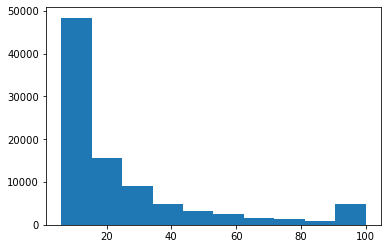

In [6]:
plt.hist(landmark_id_counts_dict.values())

In [7]:
# create dataframe from dictionary
landmark_id_counts_df = pd.DataFrame(landmark_id_counts_dict.items(), columns=['landmark_id', 'counts'])

In [8]:
print(len(landmark_id_counts_df))
print(landmark_id_counts_df[:5])

91948
  landmark_id  counts
0           0      19
1           1      24
2          10      12
3         100      11
4        1000       8


In [9]:
landmark_id_counts_df[landmark_id_counts_df.counts>90]["landmark_id"].count()

4753

### Dividing the the whole dataset into groups. 
We will train 5 different networks. This will make the training faster since we can now train on smaller set of images and landmark ids

In [10]:
step_size = 5
for bin in range(0, 100, step_size):
#     print(bin)
    print("Bins {} to {}, Landmark Counts {}, Images Counts: {}".format(bin+1, bin+step_size, landmark_id_counts_df[landmark_id_counts_df.counts.between(bin+1, bin+step_size)]["landmark_id"].count(),
                               landmark_id_counts_df[landmark_id_counts_df.counts.between(bin+1, bin+step_size)]["counts"].sum()))

Bins 1 to 5, Landmark Counts 0, Images Counts: 0
Bins 6 to 10, Landmark Counts 31931, Images Counts: 245642
Bins 11 to 15, Landmark Counts 16455, Images Counts: 210271
Bins 16 to 20, Landmark Counts 10061, Images Counts: 179571
Bins 21 to 25, Landmark Counts 6779, Images Counts: 154951
Bins 26 to 30, Landmark Counts 4908, Images Counts: 136737
Bins 31 to 35, Landmark Counts 3554, Images Counts: 116767
Bins 36 to 40, Landmark Counts 2726, Images Counts: 103513
Bins 41 to 45, Landmark Counts 2193, Images Counts: 93952
Bins 46 to 50, Landmark Counts 1703, Images Counts: 81668
Bins 51 to 55, Landmark Counts 1481, Images Counts: 78323
Bins 56 to 60, Landmark Counts 1218, Images Counts: 70626
Bins 61 to 65, Landmark Counts 969, Images Counts: 60974
Bins 66 to 70, Landmark Counts 820, Images Counts: 55755
Bins 71 to 75, Landmark Counts 698, Images Counts: 50956
Bins 76 to 80, Landmark Counts 658, Images Counts: 51247
Bins 81 to 85, Landmark Counts 536, Images Counts: 44459
Bins 86 to 90, Land

##### One time task

In [11]:
start_time = time.time()
images_counts_bins= [(1,10), (11,20), (21,50), (51,80), (81,100)]
for i in range(len(images_counts_bins)):
    landmark_ids_list = landmark_id_counts_df[landmark_id_counts_df.counts.between(images_counts_bins[i][0], images_counts_bins[i][1])]["landmark_id"]
    landmark_ids_paths_list = [(i+1,"datasets\\set_256\\train\\{}".format(landmark_id)) for landmark_id in landmark_ids_list]
    print(len(landmark_ids_paths_list))
    print(landmark_ids_paths_list[:2])
    if __name__ == '__main__':
        p=Pool()
        p.map(move_copy_images_with_multiprocessing.copy_images, landmark_ids_paths_list)
        p.close()
        p.join()
print("Time to divide landmark ids into groups and copy to new location : {}".format(time.time()-start_time))

31931
[(1, 'datasets\\set_256\\train\\1000'), (1, 'datasets\\set_256\\train\\100001')]
26516
[(2, 'datasets\\set_256\\train\\0'), (2, 'datasets\\set_256\\train\\10')]
21863
[(3, 'datasets\\set_256\\train\\1'), (3, 'datasets\\set_256\\train\\100006')]
5844
[(4, 'datasets\\set_256\\train\\100036'), (4, 'datasets\\set_256\\train\\100043')]
5794
[(5, 'datasets\\set_256\\train\\100028'), (5, 'datasets\\set_256\\train\\100082')]
Time to divide landmark ids into groups and copy to new location : 619.2711820602417


31931
[(1, 'datasets\\set_256\\train\\1000'), (1, 'datasets\\set_256\\train\\100001')]
26516
[(2, 'datasets\\set_256\\train\\0'), (2, 'datasets\\set_256\\train\\10')]
21863
[(3, 'datasets\\set_256\\train\\1'), (3, 'datasets\\set_256\\train\\100006')]
5844
[(4, 'datasets\\set_256\\train\\100036'), (4, 'datasets\\set_256\\train\\100043')]
5794
[(5, 'datasets\\set_256\\train\\100028'), (5, 'datasets\\set_256\\train\\100082')]
Time to divide landmark ids into groups and copy to new location : 619.2711820602417

In [12]:
gc.collect()

24

### Now separating the train and validation set. 
We want to use the image augmentation in the tensorflow model datagen step. We do not want to augment the validation images

In [13]:
dir_name_list = ["datasets\\group{}_set_256\\set_256\\train".format(i) for i in range(1,6)]
dir_name_list

['datasets\\group1_set_256\\set_256\\train',
 'datasets\\group2_set_256\\set_256\\train',
 'datasets\\group3_set_256\\set_256\\train',
 'datasets\\group4_set_256\\set_256\\train',
 'datasets\\group5_set_256\\set_256\\train']

In [16]:
number_of_validation_images = [0,0,1,4,5]
dict_of_groups = dict(zip(dir_name_list,number_of_validation_images))
dict_of_groups

{'datasets\\group1_set_256\\set_256\\train': 0,
 'datasets\\group2_set_256\\set_256\\train': 0,
 'datasets\\group3_set_256\\set_256\\train': 1,
 'datasets\\group4_set_256\\set_256\\train': 4,
 'datasets\\group5_set_256\\set_256\\train': 5}

In [17]:
move_files_start_time = time.time()
for group_name_folder, random_images_to_move in dict_of_groups.items():
    landmark_ids_paths_list = glob.glob("{}\\*".format(group_name_folder))
    landmark_ids_valid_images_to_move_tuple_list = [(landmark_id_path, random_images_to_move) for landmark_id_path in landmark_ids_paths_list]
    print(landmark_ids_valid_images_to_move_tuple_list[:2])
    if __name__ == '__main__':
        p=Pool(30)
        p.map(move_copy_images_with_multiprocessing.move_validation_images, landmark_ids_valid_images_to_move_tuple_list)
        p.close()
        p.join()
print("\nTime to move images in each group : ", (time.time() - move_files_start_time))

[('datasets\\group1_set_256\\set_256\\train\\1000', 0), ('datasets\\group1_set_256\\set_256\\train\\100001', 0)]
[('datasets\\group2_set_256\\set_256\\train\\0', 0), ('datasets\\group2_set_256\\set_256\\train\\10', 0)]
[('datasets\\group3_set_256\\set_256\\train\\1', 1), ('datasets\\group3_set_256\\set_256\\train\\100006', 1)]
[('datasets\\group4_set_256\\set_256\\train\\100036', 4), ('datasets\\group4_set_256\\set_256\\train\\100043', 4)]
[('datasets\\group5_set_256\\set_256\\train\\100028', 5), ('datasets\\group5_set_256\\set_256\\train\\100082', 5)]

Time to move images in each group :  23.92029643058777


[('datasets\\group1_set_256\\set_256\\train\\1000', 2), ('datasets\\group1_set_256\\set_256\\train\\100001', 2)]
[('datasets\\group2_set_256\\set_256\\train\\0', 4), ('datasets\\group2_set_256\\set_256\\train\\10', 4)]
[('datasets\\group3_set_256\\set_256\\train\\1', 5), ('datasets\\group3_set_256\\set_256\\train\\100006', 5)]
[('datasets\\group4_set_256\\set_256\\train\\100036', 8), ('datasets\\group4_set_256\\set_256\\train\\100043', 8)]
[('datasets\\group5_set_256\\set_256\\train\\100028', 10), ('datasets\\group5_set_256\\set_256\\train\\100082', 10)]

Time to move images in each group :  117.82588315010071

[('datasets\\group1_set_256\\set_256\\train\\1000', 0), ('datasets\\group1_set_256\\set_256\\train\\100001', 0)]
[('datasets\\group2_set_256\\set_256\\train\\0', 0), ('datasets\\group2_set_256\\set_256\\train\\10', 0)]
[('datasets\\group3_set_256\\set_256\\train\\1', 1), ('datasets\\group3_set_256\\set_256\\train\\100006', 1)]
[('datasets\\group4_set_256\\set_256\\train\\100036', 4), ('datasets\\group4_set_256\\set_256\\train\\100043', 4)]
[('datasets\\group5_set_256\\set_256\\train\\100028', 5), ('datasets\\group5_set_256\\set_256\\train\\100082', 5)]

Time to move images in each group :  23.92029643058777